# INDIVIDUAL ID : PTID-CDS-FEB-24-1817

# BATCH ID : 16-OCT-23-WDM09-BAN

# Client: Sales Effectiveness | Category: Product Sales

# Project Ref: PM-PR-0019

# Business Case:
#### FicZon Inc is an IT solution provider with products ranging from onpremises products to SAAS based solutions. FicZon major leads generation channel is digital and through their website.  
#### FicZon business is majorly dependent on the sales force effectiveness. As the market is maturing and more new competitors entering the market, FicZon is experiencing the dip in sales.  
#### Effective sales is dependent on lead quality and as of now, this is based on manual categorization and highly depended on sales staff. Though there is a quality process, which continuously updates the lead categorization, it’s value is in for post analysis, rather than conversation. 
#### FicZon wants to explore Machine Learning to pre-categorize the lead  quality and as result, expecting significant increase in sales effectiveness.

# PROJECT GOAL:
1. Data exploration insights – Sales effectiveness.
2. ML model to predict the Lead Category (High Potential , Low Potential)

# Importing Necessary Libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [2]:
import plotly.express as px
from scipy import stats
from imblearn.over_sampling import RandomOverSampler
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import train_test_split

In [3]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB
from catboost import CatBoostClassifier

## LOADING DATA

In [4]:
import mysql.connector

# MySQL database details
db_name = 'project_sales'
host = '18.136.157.135'
port = 3306
username = 'dm_team2'
password = 'DM!$Team&27@9!20!'

# Create connection
conn = mysql.connector.connect(
    host=host,
    port=port,
    user=username,
    passwd=password,
    database=db_name
)

# Create cursor
cursor = conn.cursor()

# Execute SQL query
cursor.execute("SELECT * FROM data")

# Fetch results
rows = cursor.fetchall()

# Get column names from the cursor description
columns = [col[0] for col in cursor.description]

# Create DataFrame from the fetched rows and column names
df = pd.DataFrame(rows, columns=columns)

# Close cursor and connection
cursor.close()
conn.close()

# making copy of the dataframe
df_C=df.copy()

# Display the DataFrame
df

,Created,Product_ID,Source,Mobile,EMAIL,Sales_Agent,Location,Delivery_Mode,Status
0,14-11-2018 10:05,,Website,984XXXXXXX,aXXXXXXX@gmail.com,Sales-Agent-11,,Mode-5,Open
1,14-11-2018 09:22,,Website,XXXXXXX,#VALUE!,Sales-Agent-10,,Mode-5,Open
2,14-11-2018 09:21,,Website,XXXXXXX,dXXXXXXX@yahoo.com,Sales-Agent-10,,Mode-5,Open
3,14-11-2018 08:46,,Website,XXXXXXX,wXXXXXXX@gmail.com,Sales-Agent-10,,Mode-5,Open
4,14-11-2018 07:34,,Website,XXXXXXX,cXXXXXXX@gmail.com,Sales-Agent-10,,Mode-5,Open
...,...,...,...,...,...,...,...,...,...
7417,28-04-2018 09:45,9,Call,,aXXXXXXX@gmail.com,Sales-Agent-6,Mumbai,Mode-4,LOST
7418,28-04-2018 09:43,15,Call,,#VALUE!,Sales-Agent-12,Other Locations,Mode-5,LOST
7419,28-04-2018 09:20,5,Live Chat-Direct,,sXXXXXXX@gmail.com,Sales-Agent-11,Bangalore,Mode-1,Not Responding
7420,28-04-2018 08:04,21,CRM form,,YXXXXXXX@gmail.com,Sales-Agent-4,Other Locations,Mode-1,Just Enquiry


# Domain Analysis

#### 1. Created - Date and time of lead generated.
#### 2. Product_ID - Product id of the each products
#### 3. Source - The channel through which a lead initially discovers the company which includes website visits, live chat platforms, referrals, campaigns, and personal contacts. 
#### 4. Mobile -Mobile phone number of the customer.
#### 5. EMAIL - EmailID of the customer.
#### 6. Sales Agent - A person or a company that acts as a sales agent on behalf of the company, introducing its products to the leads.
#### Location - Locations of the leads.
#### Delivery_Mode - Mode of the delivery according to the location.
#### Status - (The target variable) The field is typically used to communicate the status of a record to both the reporting users and the sales rep who is working the lead. The reporting user wants to see explicit detail while the sales rep wants to update the record in a natural and efficient manner.

# Basic Checks

In [5]:
df.head()

,Created,Product_ID,Source,Mobile,EMAIL,Sales_Agent,Location,Delivery_Mode,Status
0,14-11-2018 10:05,,Website,984XXXXXXX,aXXXXXXX@gmail.com,Sales-Agent-11,,Mode-5,Open
1,14-11-2018 09:22,,Website,XXXXXXX,#VALUE!,Sales-Agent-10,,Mode-5,Open
2,14-11-2018 09:21,,Website,XXXXXXX,dXXXXXXX@yahoo.com,Sales-Agent-10,,Mode-5,Open
3,14-11-2018 08:46,,Website,XXXXXXX,wXXXXXXX@gmail.com,Sales-Agent-10,,Mode-5,Open
4,14-11-2018 07:34,,Website,XXXXXXX,cXXXXXXX@gmail.com,Sales-Agent-10,,Mode-5,Open


In [6]:
df.tail()

,Created,Product_ID,Source,Mobile,EMAIL,Sales_Agent,Location,Delivery_Mode,Status
7417,28-04-2018 09:45,9,Call,,aXXXXXXX@gmail.com,Sales-Agent-6,Mumbai,Mode-4,LOST
7418,28-04-2018 09:43,15,Call,,#VALUE!,Sales-Agent-12,Other Locations,Mode-5,LOST
7419,28-04-2018 09:20,5,Live Chat-Direct,,sXXXXXXX@gmail.com,Sales-Agent-11,Bangalore,Mode-1,Not Responding
7420,28-04-2018 08:04,21,CRM form,,YXXXXXXX@gmail.com,Sales-Agent-4,Other Locations,Mode-1,Just Enquiry
7421,28-04-2018 07:54,25,Website,,cXXXXXXX@gmail.com,Sales-Agent-3,Chennai,Mode-1,CONVERTED


In [7]:
df.shape

(7422, 9)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7422 entries, 0 to 7421
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Created        7422 non-null   object
 1   Product_ID     7422 non-null   object
 2   Source         7422 non-null   object
 3   Mobile         7422 non-null   object
 4   EMAIL          7422 non-null   object
 5   Sales_Agent    7422 non-null   object
 6   Location       7422 non-null   object
 7   Delivery_Mode  7422 non-null   object
 8   Status         7422 non-null   object
dtypes: object(9)
memory usage: 522.0+ KB


In [9]:
df.describe(include="O")

,Created,Product_ID,Source,Mobile,EMAIL,Sales_Agent,Location,Delivery_Mode,Status
count,7422,7422,7422,7422,7422,7422,7422,7422,7422
unique,6752,30,26,487,883,13,18,5,11
top,26-09-2018 11:30,18,Call,,#VALUE!,Sales-Agent-4,Other Locations,Mode-5,Junk Lead
freq,4,1711,2547,1810,1701,1500,2500,2975,1536


In [10]:
# Taking the unique values and value counts
for i in df:
    print(i,df[i].unique())
    print("*"*80)
    print(df[i].value_counts())
    print("="*80)

Created ['14-11-2018 10:05' '14-11-2018 09:22' '14-11-2018 09:21' ...
 '28-04-2018 09:20' '28-04-2018 08:04' '28-04-2018 07:54']
********************************************************************************
Created
26-09-2018 11:30    4
27-09-2018 11:00    4
10-05-2018 12:30    4
15-10-2018 10:36    4
14-09-2018 12:00    4
                   ..
29-08-2018 12:52    1
29-08-2018 13:08    1
29-08-2018 15:26    1
29-08-2018 15:39    1
28-04-2018 07:54    1
Name: count, Length: 6752, dtype: int64
Product_ID ['' '9' '19' '18' '15' '27' '5' '2' '3' '25' '10' '20' '11' '21' '1' '12'
 '13' '17' '24' '26' '16' '23' '22' '8' '14' '6' '0' '28' '7' '4']
********************************************************************************
Product_ID
18    1711
15    1518
19    1189
9      992
27     739
5      487
10     168
1      105
20     102
25      90
21      66
        58
2       38
12      36
26      31
14      27
11      12
22       8
3        7
17       7
6        7
8        6
13       5
24 

# Data Preprocessing

In [11]:
#changing Created column dtype from object to datetime format
df['Created']=pd.to_datetime(df['Created'])

#changing dates into seperate column
df['Created_day']=df['Created'].dt.day.astype(np.int64)
df['Created_month']=df['Created'].dt.month.astype(np.int64)
df['Created_year']=df['Created'].dt.year.astype(np.int64)

#changing time into seperate column
df['Created_hour']=df['Created'].dt.hour.astype(np.int64)
df['Created_minute']=df['Created'].dt.minute.astype(np.int64)

In [12]:
#Dropping unnecessary attributes
df.drop(['Created','Mobile','EMAIL'],axis=1,inplace=True)

In [13]:
df

,Product_ID,Source,Sales_Agent,Location,Delivery_Mode,Status,Created_day,Created_month,Created_year,Created_hour,Created_minute
0,,Website,Sales-Agent-11,,Mode-5,Open,14,11,2018,10,5
1,,Website,Sales-Agent-10,,Mode-5,Open,14,11,2018,9,22
2,,Website,Sales-Agent-10,,Mode-5,Open,14,11,2018,9,21
3,,Website,Sales-Agent-10,,Mode-5,Open,14,11,2018,8,46
4,,Website,Sales-Agent-10,,Mode-5,Open,14,11,2018,7,34
...,...,...,...,...,...,...,...,...,...,...,...
7417,9,Call,Sales-Agent-6,Mumbai,Mode-4,LOST,28,4,2018,9,45
7418,15,Call,Sales-Agent-12,Other Locations,Mode-5,LOST,28,4,2018,9,43
7419,5,Live Chat-Direct,Sales-Agent-11,Bangalore,Mode-1,Not Responding,28,4,2018,9,20
7420,21,CRM form,Sales-Agent-4,Other Locations,Mode-1,Just Enquiry,28,4,2018,8,4


In [14]:
df.drop(['Created_year'],axis=1,inplace=True)

In [15]:
# Defining 'Status' as 'High Potential' or 'Poor Potential' as per the requirements from the client
df.Status.replace(['CONVERTED','converted','In Progress Positive','Potential','Long Term','Open'],'High Potential',inplace=True)
df.Status.replace(['LOST','In Progress Negative','Not Responding','Junk Lead','Just Enquiry'],'Low Potential',inplace=True)

In [16]:
df.isnull().sum()

Product_ID        0
Source            0
Sales_Agent       0
Location          0
Delivery_Mode     0
Status            0
Created_day       0
Created_month     0
Created_hour      0
Created_minute    0
dtype: int64

- While checking the null values it is seen that there is no null values but while checking the unique values it is seen that there are some empty string(' ').

In [17]:
# replacing empty string with null values
df.replace('',np.nan,inplace=True)

In [18]:
df.isnull().sum()

Product_ID        58
Source            17
Sales_Agent       23
Location          58
Delivery_Mode      0
Status             0
Created_day        0
Created_month      0
Created_hour       0
Created_minute     0
dtype: int64

- filling missing values with most frequent element

##### Handling Missing values in Product ID

In [19]:
df['Product_ID'].fillna("18",inplace=True)

In [20]:
# dtype of Product_ID changing from obj into int
df['Product_ID'] = df['Product_ID'].astype(np.int64)

##### Handling Missing values in Source

In [21]:
df['Source'].fillna("Call",inplace=True)

##### Handling Missing values in Sales Agent

In [22]:
df['Sales_Agent'].fillna("Sales-Agent-4",inplace=True)

##### Handling Missing values in Location

In [23]:
df['Location'].fillna("Other Locations",inplace=True)

In [24]:
# we know that howrah is in KOlkata, si changing into right name
df.Location.replace(['Howrah'],'Kolkata',inplace=True)

## Checking for Duplicates

In [25]:
df.duplicated().sum()

27

In [26]:
df.drop_duplicates(inplace=True)

In [27]:
df

,Product_ID,Source,Sales_Agent,Location,Delivery_Mode,Status,Created_day,Created_month,Created_hour,Created_minute
0,18,Website,Sales-Agent-11,Other Locations,Mode-5,High Potential,14,11,10,5
1,18,Website,Sales-Agent-10,Other Locations,Mode-5,High Potential,14,11,9,22
2,18,Website,Sales-Agent-10,Other Locations,Mode-5,High Potential,14,11,9,21
3,18,Website,Sales-Agent-10,Other Locations,Mode-5,High Potential,14,11,8,46
4,18,Website,Sales-Agent-10,Other Locations,Mode-5,High Potential,14,11,7,34
...,...,...,...,...,...,...,...,...,...,...
7417,9,Call,Sales-Agent-6,Mumbai,Mode-4,Low Potential,28,4,9,45
7418,15,Call,Sales-Agent-12,Other Locations,Mode-5,Low Potential,28,4,9,43
7419,5,Live Chat-Direct,Sales-Agent-11,Bangalore,Mode-1,Low Potential,28,4,9,20
7420,21,CRM form,Sales-Agent-4,Other Locations,Mode-1,Low Potential,28,4,8,4


# Exploratory Data Analysis

## Univariate Data Analysis

In [28]:
import sweetviz as sv
my_report = sv.analyze(df)
my_report.show_html()

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


##### INSIGHTS
- Most frequently showed Product_Id is 18 which means it is high in demand and least is 22 .
- Top category from Source is call and Live Chat_Direct. and Campaign shows least impact.
- Sales-Agent-4 and Sales-Agent-11 does the most of the sales and least is done by Sales-Agent-1.
- Top category is Other location followed by Bangalore.
- Delivery_mode 5 is most choosen one by the customers and least is Mode-2.
- The dataset have status as high and low potential leads is equally distributed

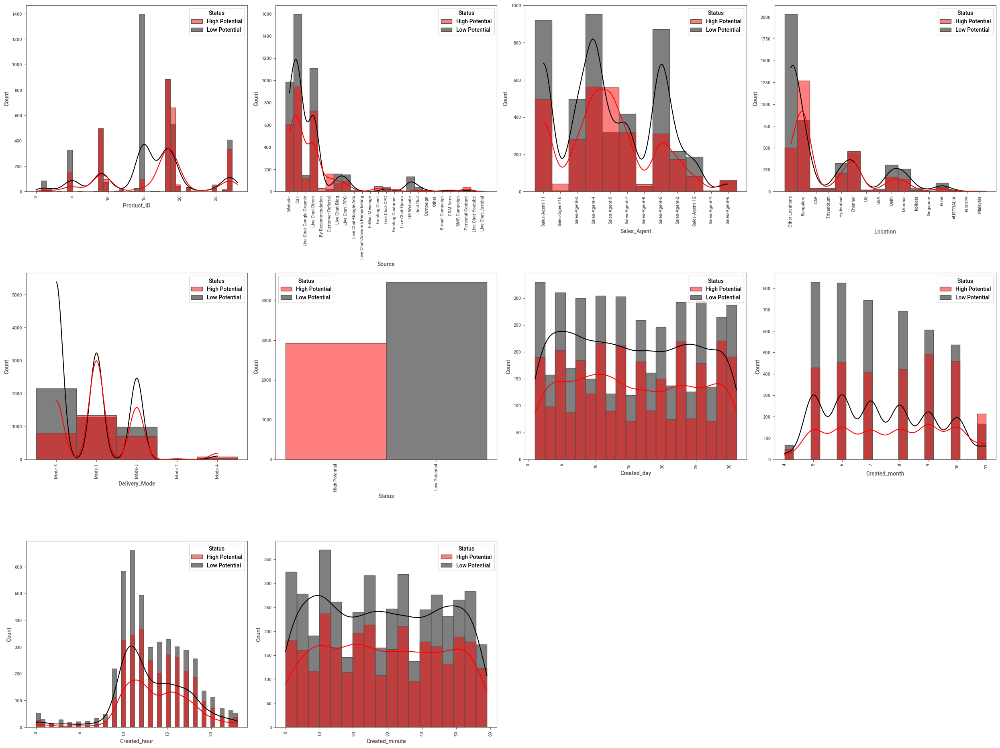

In [29]:
# plotting a histplot on df
plt.figure(figsize=(25,25))
p=1
for i in df:
    ax=plt.subplot(4,4,p)
    sns.histplot(x=df[i],kde=True,hue=df.Status,palette=['Red','Black'])
    plt.xticks(rotation=90)
    p+=1
plt.tight_layout()

## Bivariate Analysis

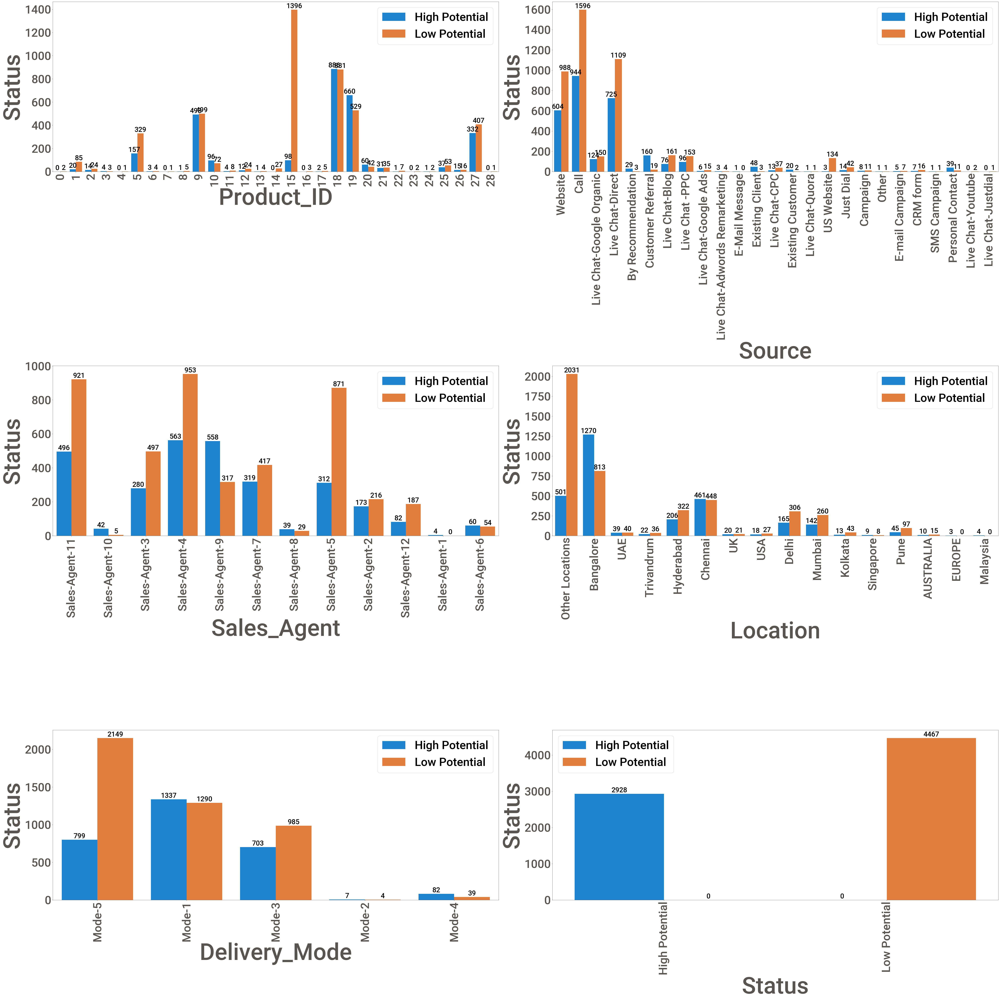

In [30]:
# plotting a countplot on df
plt.figure(figsize=(60, 60), facecolor="white")
p = 1

for column in df:
    if p <= 6:
        ax = plt.subplot(3, 2, p)
        sns.countplot(x=df[column], hue=df["Status"])
        plt.xlabel(column, fontsize=100)
        plt.ylabel("Status", fontsize=100)
        plt.legend(fontsize=50)
        plt.xticks(fontsize=50,rotation='vertical')
        plt.yticks(fontsize=50)

        # Add values to the countplot
        for rect in ax.patches:
            height = rect.get_height()
            ax.text(rect.get_x() + rect.get_width() / 2, height, f"{int(height)}", ha="center", va="bottom", fontsize=30)

    p += 1

plt.tight_layout()
plt.show()
plt.show()

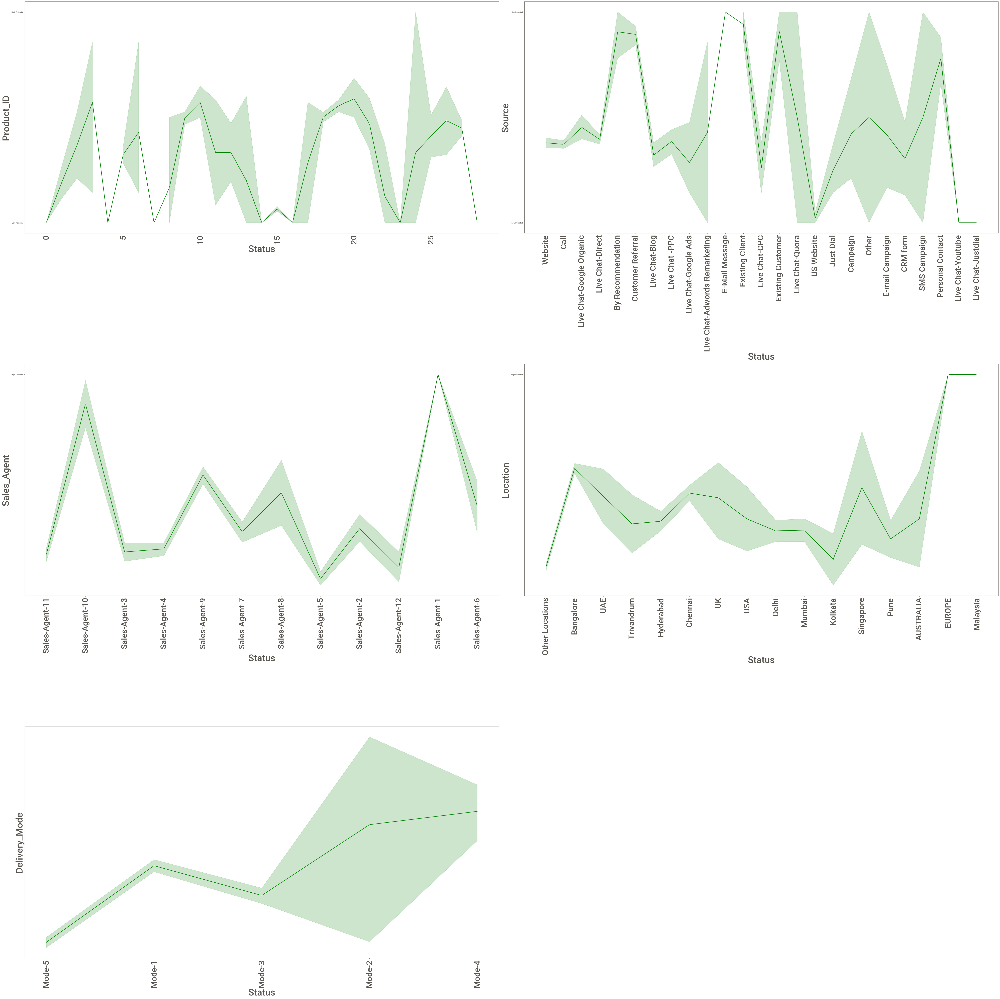

In [31]:
# plotting a lineplot on df
plt.figure(figsize=(60, 60), facecolor="white")
p = 1

for column in df.iloc[:,:5]:
    if(p<=6):
        ax=plt.subplot(3,2,p)
        sns.lineplot(x=df[column], y='Status', data=df, color='Green', marker='o', linewidth=2)
        plt.xlabel('Status',fontsize=40)
        plt.ylabel(column,fontsize=40)    
        plt.xticks(rotation=90, fontsize=35)
    p+=1
plt.tight_layout() 

<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

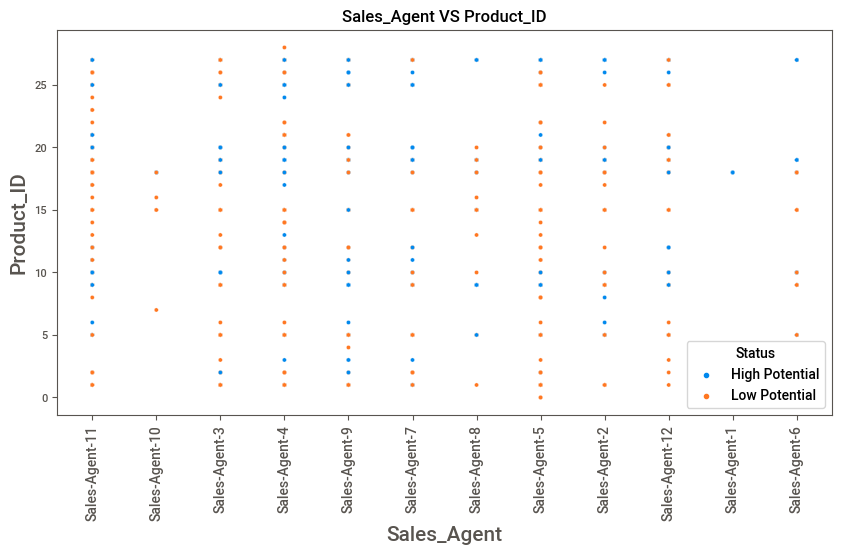

In [32]:
# plotting scatter on Sales_Agent and Product_ID
plt.figure(figsize=(10,5))
sns.scatterplot(x="Sales_Agent",y="Product_ID",hue='Status',data=df)
plt.title("Sales_Agent VS Product_ID")
plt.xlabel("Sales_Agent",fontsize=15)
plt.ylabel("Product_ID",fontsize=15)    
plt.xticks(rotation=90, fontsize=10)
plt.tight_layout

##### INSIGHTS
- Sales_Agent 4,11,5 are the top three agents
- Sales_agent 5 have the most high potential status , followed by 4 and 11

<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

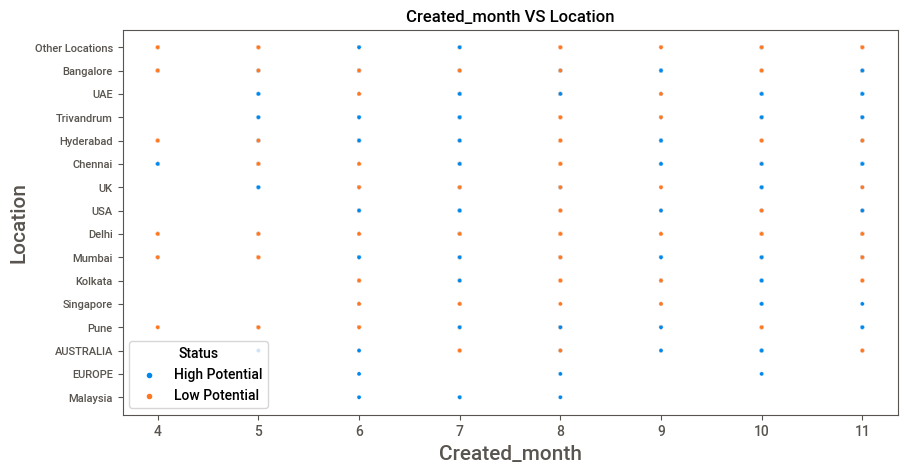

In [33]:
# plotting scatter on Created_month and Location
plt.figure(figsize=(10,5))
sns.scatterplot(x="Created_month",y="Location",hue='Status',data=df)
plt.title("Created_month VS Location")
plt.xlabel("Created_month",fontsize=15)
plt.ylabel("Location",fontsize=15)    
plt.xticks(rotation=0, fontsize=10)
plt.tight_layout

##### INSIGHTS
- On the month of June(06) , they had sales on every location 
- Hyderabad have the best high potential delivery followed by Chennai and Mumbai

<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

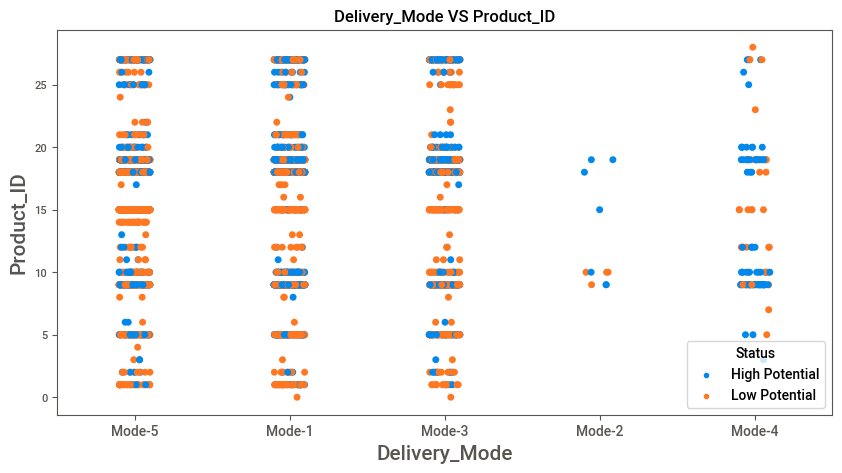

In [34]:
# plotting strip on Delivery_Mode and Product_ID
plt.figure(figsize=(10,5))
sns.stripplot(x="Delivery_Mode",y="Product_ID",hue='Status',data=df)
plt.title("Delivery_Mode VS Product_ID")
plt.xlabel("Delivery_Mode",fontsize=15)
plt.ylabel("Product_ID",fontsize=15)    
plt.xticks(rotation=0, fontsize=10)
plt.tight_layout

##### INSIGHT
- Mode 5,1,3 were used frequently for delivery
- Mode 2 doesn't using that much 
- Mode 1 have high potential delivaries followed by 3,5

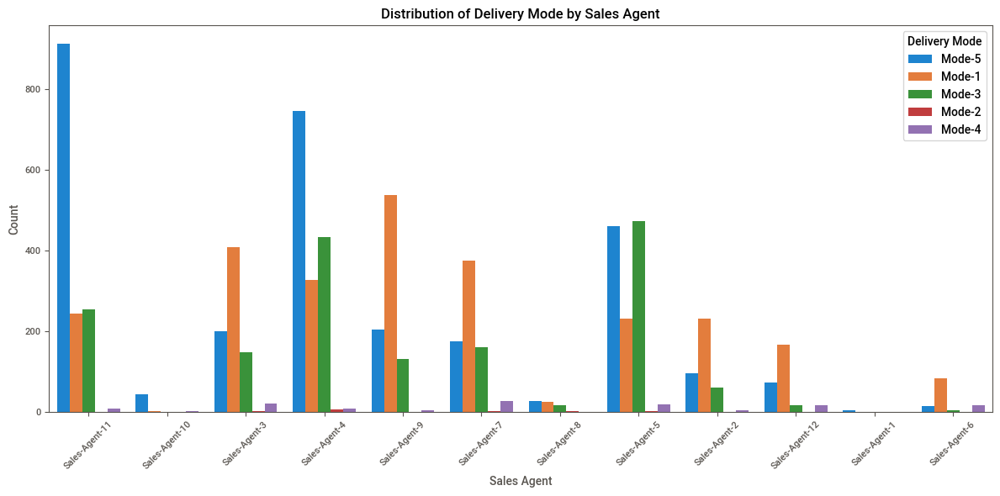

In [35]:
# plotting Distribution of Delivery Mode by Sales Agent
plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='Sales_Agent', hue='Delivery_Mode')
plt.title('Distribution of Delivery Mode by Sales Agent')
plt.xlabel('Sales Agent')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Delivery Mode')
plt.tight_layout()
plt.show()

##### INSIGHT
- Sales Agents 11,4,5 are the top most agent, which they use mode-5 for delivery
- Delivery mode 3 and 1 also using by agents

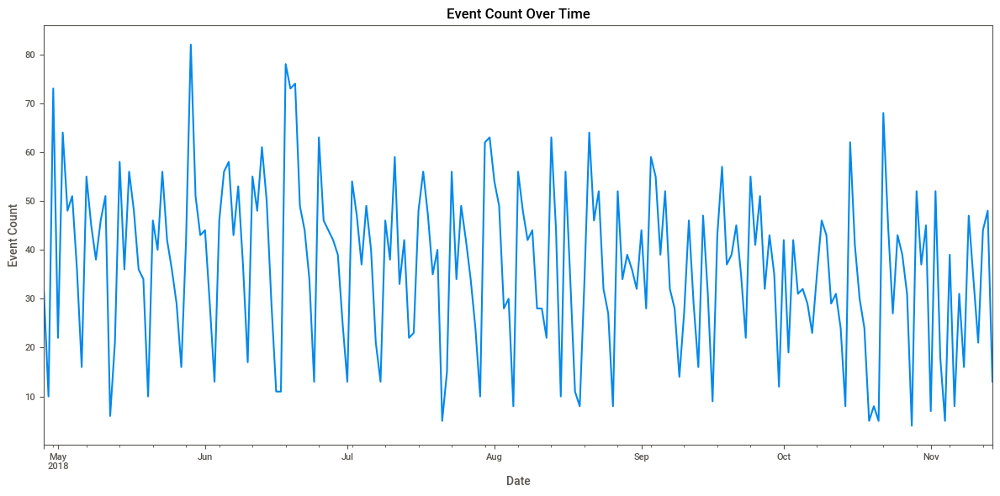

In [36]:
# showing the Event Count Over Time
plt.figure(figsize=(12, 6))
df_C['Created'] = pd.to_datetime(df_C['Created'])  
df_C.resample('D', on='Created').size().plot()  # Resample by day and plot
plt.title('Event Count Over Time')
plt.xlabel('Date')
plt.ylabel('Event Count')
plt.tight_layout()
plt.show()

##### INSIGHT
- Even the distribution have lots of various, the growth is normal

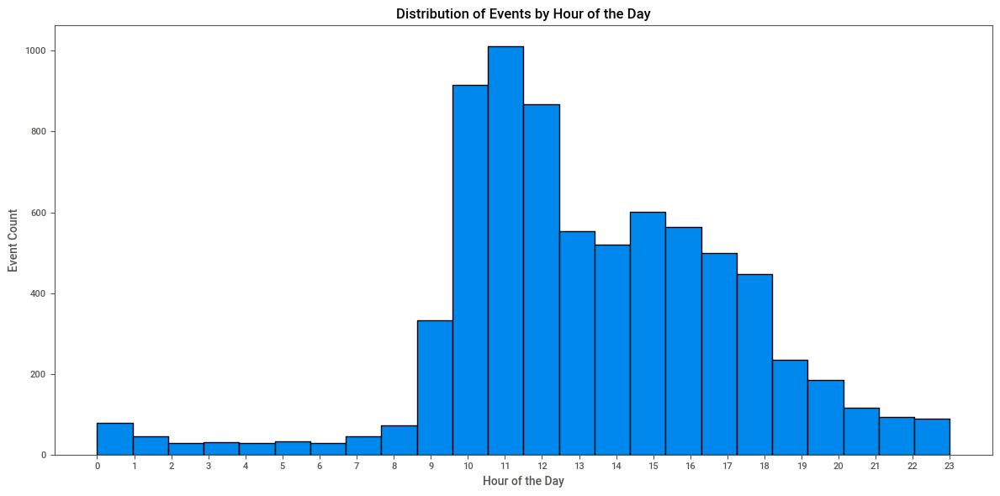

In [37]:
# plotting Distribution of Events by Hour of the Day
plt.figure(figsize=(12, 6))
df_C['Hour'] = df_C['Created'].dt.hour  # Extract hour from 'Created' column
plt.hist(df_C['Hour'], bins=24, edgecolor='black')
plt.title('Distribution of Events by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Event Count')
plt.xticks(range(24))
plt.tight_layout()
plt.show()

##### INSIGHT
- Most of the delivery happens in the time range of 10 to 12

In [38]:
# Extract date from 'Created' column
df_C['Date'] = df_C['Created'].dt.date

# replacing empty string of Sales agent with null values
df_C.Sales_Agent.replace('',np.nan,inplace=True)

# Handling Sales agent in df_C
df_C['Sales_Agent'].fillna("Sales-Agent-4",inplace=True)

# Get unique sales agents
agents = df_C['Sales_Agent'].unique()

# Create a line plot for each sales agent
for agent in agents:
    agent_data = df_C[df_C['Sales_Agent'] == agent]
    agent_data_count = agent_data.groupby('Date').size().reset_index(name='Count')
    fig = px.line(agent_data_count, x='Date', y='Count', title=f'Event Count Over Time for {agent}')
    fig.show()

##### INSIGHT
- Most of the agents are showing a high progress
- Some agents are so low performance such as sales agent 1 

In [39]:
# replacing the status for the change of duplicated dataframe for time forecasting
df_C.Status.replace(['CONVERTED','converted','In Progress Positive','Potential','Long Term','Open','Just Enquiry'],'High Potential',inplace=True)
df_C.Status.replace(['LOST','In Progress Negative','Not Responding','Junk Lead'],'Low Potential',inplace=True)

# Extract date from 'Created' column
df_C['Date'] = df_C['Created'].dt.date

# Aggregate data by date and status
status_counts = df_C.groupby(['Date', 'Status']).size().reset_index(name='Count')

# Plot using Plotly Express
fig = px.line(status_counts, x='Date', y='Count', color='Status',
              title='Event Count Over Time by Status')
fig.show()

##### INSIGHT
- The plot gives such improvement in the potential 
- For the first 3 months, it was low potential but afterwards it becomes high potential

## Multivariate Analysis

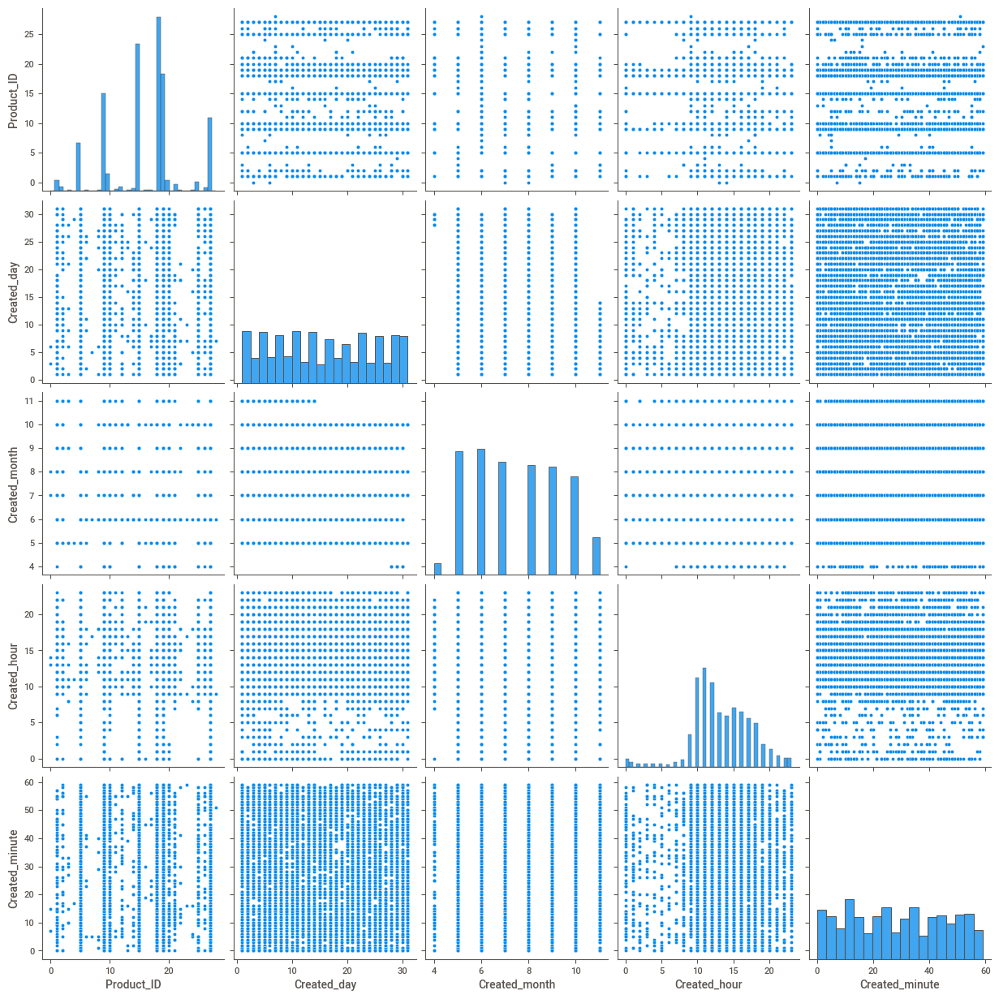

In [40]:
sns.pairplot(df)

# Data Encoding

In [41]:
df

,Product_ID,Source,Sales_Agent,Location,Delivery_Mode,Status,Created_day,Created_month,Created_hour,Created_minute
0,18,Website,Sales-Agent-11,Other Locations,Mode-5,High Potential,14,11,10,5
1,18,Website,Sales-Agent-10,Other Locations,Mode-5,High Potential,14,11,9,22
2,18,Website,Sales-Agent-10,Other Locations,Mode-5,High Potential,14,11,9,21
3,18,Website,Sales-Agent-10,Other Locations,Mode-5,High Potential,14,11,8,46
4,18,Website,Sales-Agent-10,Other Locations,Mode-5,High Potential,14,11,7,34
...,...,...,...,...,...,...,...,...,...,...
7417,9,Call,Sales-Agent-6,Mumbai,Mode-4,Low Potential,28,4,9,45
7418,15,Call,Sales-Agent-12,Other Locations,Mode-5,Low Potential,28,4,9,43
7419,5,Live Chat-Direct,Sales-Agent-11,Bangalore,Mode-1,Low Potential,28,4,9,20
7420,21,CRM form,Sales-Agent-4,Other Locations,Mode-1,Low Potential,28,4,8,4


In [42]:
df.dtypes

Product_ID         int64
Source            object
Sales_Agent       object
Location          object
Delivery_Mode     object
Status            object
Created_day        int64
Created_month      int64
Created_hour       int64
Created_minute     int64
dtype: object

Encoding object on the basis of value counts

In [43]:
# List of columns for which you want to apply count-based encoding
columns_to_encode = ['Source', 'Sales_Agent', 'Location', 'Delivery_Mode', 'Status']

for column in columns_to_encode:
    # Get the counts of each value in the column
    column_counts = df[column].value_counts()
    
    # Create a mapping dictionary based on value counts starting from 1
    encoding_map = {value: index + 0 for index, value in enumerate(column_counts.index)}
    
    # Replace values in the column with their count-based encodings
    df[column] = df[column].map(encoding_map)

# Checking Outliers

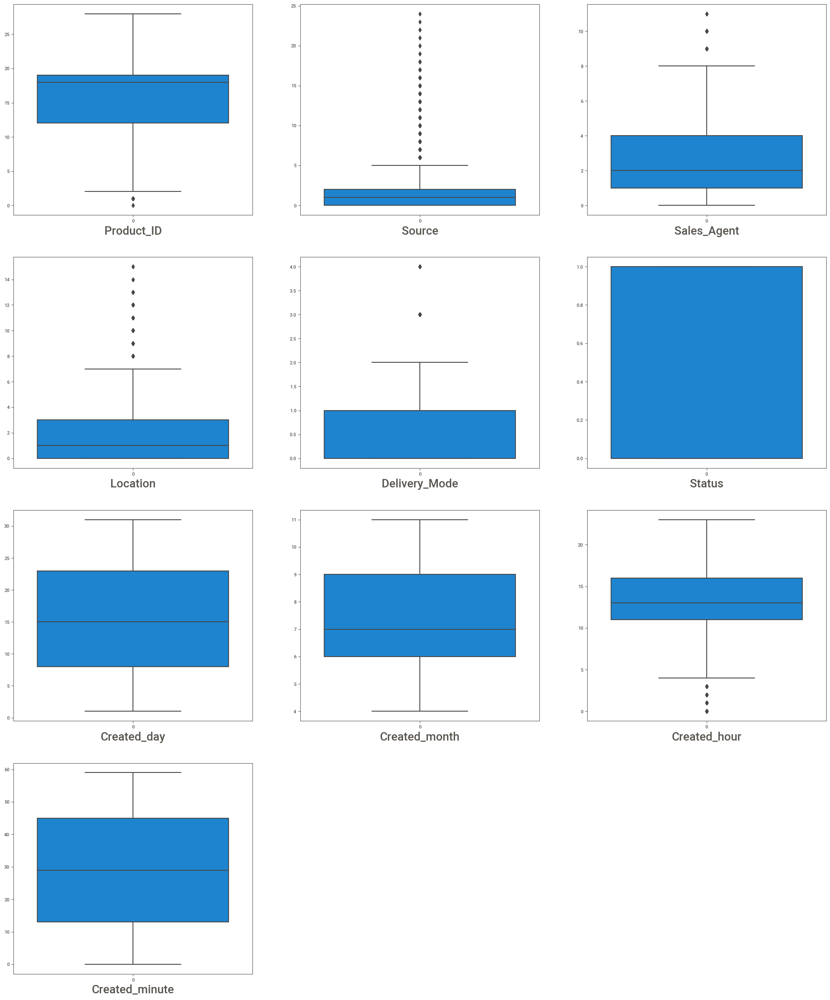

In [44]:
# let's see how data is distributed for every column
plt.figure(figsize=(25,30), facecolor='white')
plotnumber = 1#counter

for column in df:#columns form data1
    if plotnumber<=12:#checking whether plot number is less or equal to 12
        ax = plt.subplot(4,3,plotnumber) 
        sns.boxplot(df[column])# ploting boxplot fo outlier 
        plt.xlabel(column,fontsize=20)    
    plotnumber+=1
plt.show()

##### INSIGHTS
- Sales_Agents, Location & Delivery_Mode have some outliers but they are important for the data.
- Source & Created_hour have outliers which are replacing by median

In [46]:
## using IQR to remove the outliers of Source
IQR = stats.iqr(df.Source, interpolation = 'midpoint') 
IQR

2.0

In [47]:
# First quartile (Q1) 
Q1 =df.Source.quantile(0.25)

# Third quartile (Q3) 
Q3 =df.Source.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR

max_limit=Q3 + 1.5*IQR

In [48]:
max_limit

5.0

In [49]:
min_limit

-3.0

In [50]:
df.loc[(df['Source']<min_limit)| (df['Source']>max_limit),"Source"]=df['Source'].median()

In [51]:
# using IQR to remove the outliers of Created_hour
IQR = stats.iqr(df.Created_hour, interpolation = 'midpoint') 
IQR

5.0

In [52]:
# First quartile (Q1) 
Q1 =df.Created_hour.quantile(0.25)

# Third quartile (Q3) 
Q3 =df.Created_hour.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR

max_limit=Q3 + 1.5*IQR

In [53]:
max_limit

23.5

In [54]:
min_limit

3.5

In [55]:
df.loc[(df['Created_hour']<min_limit)| (df['Created_hour']>max_limit),"Created_hour"]=df['Created_hour'].median()

##### INSIGHT
- Outliers Product_ID is important as part of the dataset
- Source and Location have lots of outliers so we neglet it
- Created_hour also not necessary to remove outliers

#  Feature Engineering

In [56]:
df.corr()

,Product_ID,Source,Sales_Agent,Location,Delivery_Mode,Status,Created_day,Created_month,Created_hour,Created_minute
Product_ID,1.000000,0.063951,-0.012847,0.028975,0.022619,0.085971,0.018197,0.013435,0.030578,-0.014773
Source,0.063951,1.000000,0.007715,0.134042,0.235896,-0.002885,-0.062120,-0.018986,0.192510,-0.012426
Sales_Agent,-0.012847,0.007715,1.000000,-0.135519,0.096203,0.086177,0.005272,-0.060500,0.004240,0.007314
Location,0.028975,0.134042,-0.135519,1.000000,0.197535,0.060059,-0.021436,-0.000330,0.063874,0.001777
Delivery_Mode,0.022619,0.235896,0.096203,0.197535,1.000000,0.159680,-0.025348,0.080118,0.102566,0.004115
Status,0.085971,-0.002885,0.086177,0.060059,0.159680,1.000000,0.013882,0.107442,0.049859,0.013160
Created_day,0.018197,-0.062120,0.005272,-0.021436,-0.025348,0.013882,1.000000,-0.135654,-0.015300,-0.012763
Created_month,0.013435,-0.018986,-0.060500,-0.000330,0.080118,0.107442,-0.135654,1.000000,-0.048892,-0.014323
Created_hour,0.030578,0.192510,0.004240,0.063874,0.102566,0.049859,-0.015300,-0.048892,1.000000,-0.067665
Created_minute,-0.014773,-0.012426,0.007314,0.001777,0.004115,0.013160,-0.012763,-0.014323,-0.067665,1.000000


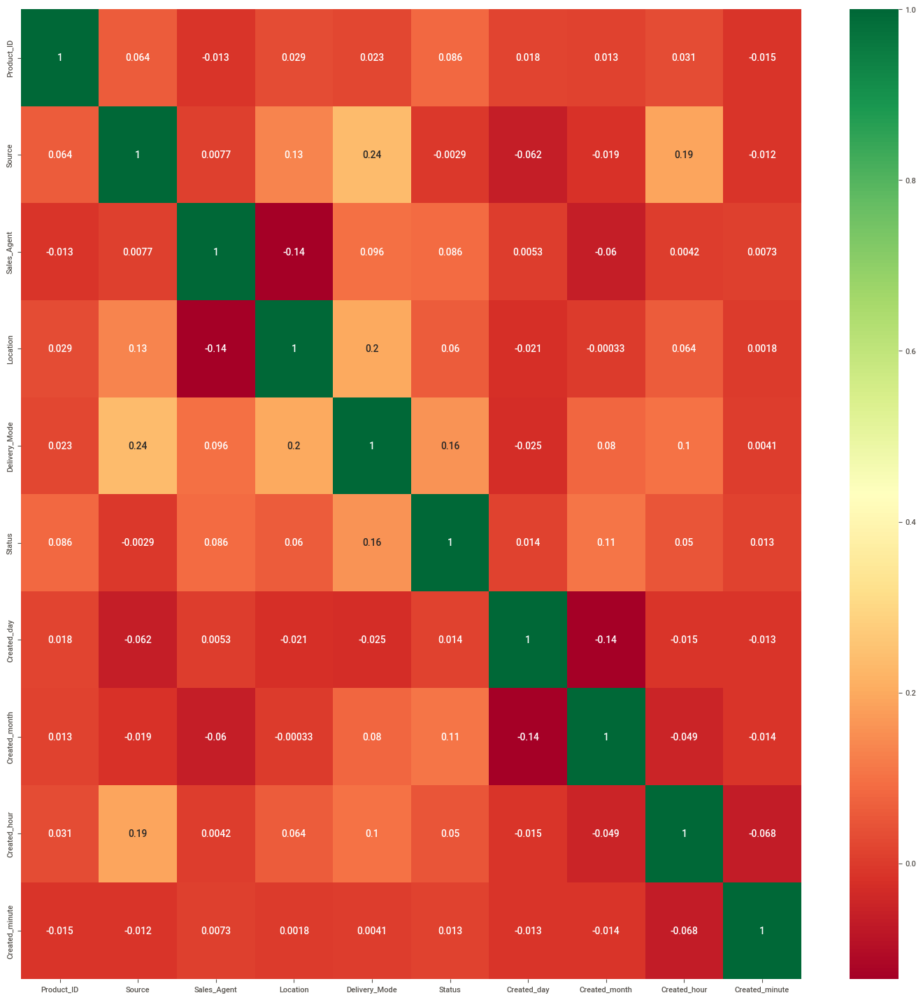

In [57]:
# Finds correlation between Independent and dependent attributes

plt.figure(figsize = (18,18))
sns.heatmap(df.corr(), annot = True, cmap = "RdYlGn")

plt.show()

##### INSIGHT
- There is no high correlation between columns

# Model Creation

In [58]:
# Creating Dependent and independent variable
X=df.drop(columns = ['Status']) ## independent varable
Y=df['Status'] ## dependent or target variable

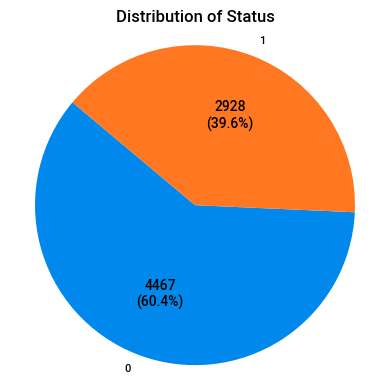

In [59]:
status_counts = df['Status'].value_counts()

plt.figure(figsize=(4, 4))
plt.pie(status_counts, labels=status_counts.index, autopct=lambda p: '{:.0f}\n({:.1f}%)'.format(p * sum(status_counts) / 100, p), startangle=140)
plt.title('Distribution of Status')
plt.axis('equal')
plt.tight_layout()
plt.show()

##### INSIGHT
- The data is unbalanced

In [60]:
os=RandomOverSampler(random_state=10)
X_os,Y_os=os.fit_resample(X,Y)
X_os.shape,Y_os.shape

((8934, 9), (8934,))

Data is balanced now

## Train Test Split

In [61]:
## Creating training and testing data
X_train,X_test,Y_train,Y_test=train_test_split(X_os,Y_os,test_size=0.20,random_state=42)

# MODEL 1 - LOGISTIC REGRESSION

In [62]:
# model creation
lr = LogisticRegression()
lr.fit(X_train,Y_train)

LogisticRegression()

In [63]:
Y_pred_lr1=lr.predict(X_train)
Y_pred_lr2=lr.predict(X_test)

In [64]:
# Train Accuracy of Logistic Model
print(classification_report(Y_train,Y_pred_lr1))

              precision    recall  f1-score   support

           0       0.60      0.63      0.62      3598
           1       0.61      0.58      0.59      3549

    accuracy                           0.60      7147
   macro avg       0.60      0.60      0.60      7147
weighted avg       0.60      0.60      0.60      7147



In [65]:
# Test Accuracy of Logistic Model
print(classification_report(Y_test,Y_pred_lr2))

              precision    recall  f1-score   support

           0       0.59      0.61      0.60       869
           1       0.62      0.60      0.61       918

    accuracy                           0.61      1787
   macro avg       0.61      0.61      0.61      1787
weighted avg       0.61      0.61      0.61      1787



Accuracy of this model is 61%

In [66]:
# Define the hyperparameters grid
param_grid1 = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'verbose': [0, 1, 3, 4, 5],
    'penalty': ['l1', 'l2']  
}

grid1= GridSearchCV(lr, param_grid1,verbose = 3,scoring='f1',cv=3)

In [67]:
# Fit the grid search to the data
grid1.fit(X_train, Y_train)

Fitting 3 folds for each of 60 candidates, totalling 180 fits
[CV 1/3] END ......C=0.001, penalty=l1, verbose=0;, score=nan total time=   0.0s
[CV 2/3] END ......C=0.001, penalty=l1, verbose=0;, score=nan total time=   0.0s
[CV 3/3] END ......C=0.001, penalty=l1, verbose=0;, score=nan total time=   0.0s
[CV 1/3] END ......C=0.001, penalty=l1, verbose=1;, score=nan total time=   0.0s
[CV 2/3] END ......C=0.001, penalty=l1, verbose=1;, score=nan total time=   0.0s
[CV 3/3] END ......C=0.001, penalty=l1, verbose=1;, score=nan total time=   0.0s
[CV 1/3] END ......C=0.001, penalty=l1, verbose=3;, score=nan total time=   0.0s
[CV 2/3] END ......C=0.001, penalty=l1, verbose=3;, score=nan total time=   0.0s
[CV 3/3] END ......C=0.001, penalty=l1, verbose=3;, score=nan total time=   0.0s
[CV 1/3] END ......C=0.001, penalty=l1, verbose=4;, score=nan total time=   0.0s
[CV 2/3] END ......C=0.001, penalty=l1, verbose=4;, score=nan total time=   0.0s
[CV 3/3] END ......C=0.001, penalty=l1, verbose

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV 1/3] END ....C=0.001, penalty=l2, verbose=1;, score=0.569 total time=   0.0s
[CV 2/3] END ....C=0.001, penalty=l2, verbose=1;, score=0.575 total time=   0.0s
[CV 3/3] END ....C=0.001, penalty=l2, verbose=1;, score=0.603 total time=   0.0s
[CV 1/3] END ....C=0.001, penalty=l2, verbose=3;, score=0.569 total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV 2/3] END ....C=0.001, penalty=l2, verbose=3;, score=0.575 total time=   0.0s
[CV 3/3] END ....C=0.001, penalty=l2, verbose=3;, score=0.603 total time=   0.0s
[CV 1/3] END ....C=0.001, penalty=l2, verbose=4;, score=0.569 total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV 2/3] END ....C=0.001, penalty=l2, verbose=4;, score=0.575 total time=   0.0s
[CV 3/3] END ....C=0.001, penalty=l2, verbose=4;, score=0.603 total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV 1/3] END ....C=0.001, penalty=l2, verbose=5;, score=0.569 total time=   0.0s
[CV 2/3] END ....C=0.001, penalty=l2, verbose=5;, score=0.575 total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV 3/3] END ....C=0.001, penalty=l2, verbose=5;, score=0.603 total time=   0.0s
[CV 1/3] END .......C=0.01, penalty=l1, verbose=0;, score=nan total time=   0.0s
[CV 2/3] END .......C=0.01, penalty=l1, verbose=0;, score=nan total time=   0.0s
[CV 3/3] END .......C=0.01, penalty=l1, verbose=0;, score=nan total time=   0.0s
[CV 1/3] END .......C=0.01, penalty=l1, verbose=1;, score=nan total time=   0.0s
[CV 2/3] END .......C=0.01, penalty=l1, verbose=1;, score=nan total time=   0.0s
[CV 3/3] END .......C=0.01, penalty=l1, verbose=1;, score=nan total time=   0.0s
[CV 1/3] END .......C=0.01, penalty=l1, verbose=3;, score=nan total time=   0.0s
[CV 2/3] END .......C=0.01, penalty=l1, verbose=3;, score=nan total time=   0.0s
[CV 3/3] END .......C=0.01, penalty=l1, verbose=3;, score=nan total time=   0.0s
[CV 1/3] END .......C=0.01, penalty=l1, verbose=4;, score=nan total time=   0.0s
[CV 2/3] END .......C=0.01, penalty=l1, verbose=4;, score=nan total time=   0.0s
[CV 3/3] END .......C=0.01, 

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV 1/3] END .....C=0.01, penalty=l2, verbose=1;, score=0.577 total time=   0.0s
[CV 2/3] END .....C=0.01, penalty=l2, verbose=1;, score=0.581 total time=   0.0s
[CV 3/3] END .....C=0.01, penalty=l2, verbose=1;, score=0.602 total time=   0.0s
[CV 1/3] END .....C=0.01, penalty=l2, verbose=3;, score=0.577 total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV 2/3] END .....C=0.01, penalty=l2, verbose=3;, score=0.581 total time=   0.0s
[CV 3/3] END .....C=0.01, penalty=l2, verbose=3;, score=0.602 total time=   0.0s
[CV 1/3] END .....C=0.01, penalty=l2, verbose=4;, score=0.577 total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


[CV 2/3] END .....C=0.01, penalty=l2, verbose=4;, score=0.581 total time=   0.0s
[CV 3/3] END .....C=0.01, penalty=l2, verbose=4;, score=0.602 total time=   0.0s
[CV 1/3] END .....C=0.01, penalty=l2, verbose=5;, score=0.577 total time=   0.0s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV 2/3] END .....C=0.01, penalty=l2, verbose=5;, score=0.581 total time=   0.0s
[CV 3/3] END .....C=0.01, penalty=l2, verbose=5;, score=0.602 total time=   0.0s
[CV 1/3] END ........C=0.1, penalty=l1, verbose=0;, score=nan total time=   0.0s
[CV 2/3] END ........C=0.1, penalty=l1, verbose=0;, score=nan total time=   0.0s
[CV 3/3] END ........C=0.1, penalty=l1, verbose=0;, score=nan total time=   0.0s
[CV 1/3] END ........C=0.1, penalty=l1, verbose=1;, score=nan total time=   0.0s
[CV 2/3] END ........C=0.1, penalty=l1, verbose=1;, score=nan total time=   0.0s
[CV 3/3] END ........C=0.1, penalty=l1, verbose=1;, score=nan total time=   0.0s
[CV 1/3] END ........C=0.1, penalty=l1, verbose=3;, score=nan total time=   0.0s
[CV 2/3] END ........C=0.1, penalty=l1, verbose=3;, score=nan total time=   0.0s
[CV 3/3] END ........C=0.1, penalty=l1, verbose=3;, score=nan total time=   0.0s
[CV 1/3] END ........C=0.1, penalty=l1, verbose=4;, score=nan total time=   0.0s
[CV 2/3] END ........C=0.1, 

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


[CV 2/3] END ......C=0.1, penalty=l2, verbose=0;, score=0.578 total time=   0.0s
[CV 3/3] END ......C=0.1, penalty=l2, verbose=0;, score=0.601 total time=   0.0s
[CV 1/3] END ......C=0.1, penalty=l2, verbose=1;, score=0.584 total time=   0.0s
[CV 2/3] END ......C=0.1, penalty=l2, verbose=1;, score=0.578 total time=   0.0s
[CV 3/3] END ......C=0.1, penalty=l2, verbose=1;, score=0.601 total time=   0.0s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


[CV 1/3] END ......C=0.1, penalty=l2, verbose=3;, score=0.584 total time=   0.0s
[CV 2/3] END ......C=0.1, penalty=l2, verbose=3;, score=0.578 total time=   0.0s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV 3/3] END ......C=0.1, penalty=l2, verbose=3;, score=0.601 total time=   0.0s
[CV 1/3] END ......C=0.1, penalty=l2, verbose=4;, score=0.584 total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


[CV 2/3] END ......C=0.1, penalty=l2, verbose=4;, score=0.578 total time=   0.0s
[CV 3/3] END ......C=0.1, penalty=l2, verbose=4;, score=0.601 total time=   0.0s
[CV 1/3] END ......C=0.1, penalty=l2, verbose=5;, score=0.584 total time=   0.0s
[CV 2/3] END ......C=0.1, penalty=l2, verbose=5;, score=0.578 total time=   0.0s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV 3/3] END ......C=0.1, penalty=l2, verbose=5;, score=0.601 total time=   0.0s
[CV 1/3] END ..........C=1, penalty=l1, verbose=0;, score=nan total time=   0.0s
[CV 2/3] END ..........C=1, penalty=l1, verbose=0;, score=nan total time=   0.0s
[CV 3/3] END ..........C=1, penalty=l1, verbose=0;, score=nan total time=   0.0s
[CV 1/3] END ..........C=1, penalty=l1, verbose=1;, score=nan total time=   0.0s
[CV 2/3] END ..........C=1, penalty=l1, verbose=1;, score=nan total time=   0.0s
[CV 3/3] END ..........C=1, penalty=l1, verbose=1;, score=nan total time=   0.0s
[CV 1/3] END ..........C=1, penalty=l1, verbose=3;, score=nan total time=   0.0s
[CV 2/3] END ..........C=1, penalty=l1, verbose=3;, score=nan total time=   0.0s
[CV 3/3] END ..........C=1, penalty=l1, verbose=3;, score=nan total time=   0.0s
[CV 1/3] END ..........C=1, penalty=l1, verbose=4;, score=nan total time=   0.0s
[CV 2/3] END ..........C=1, penalty=l1, verbose=4;, score=nan total time=   0.0s
[CV 3/3] END ..........C=1, 

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV 2/3] END ........C=1, penalty=l2, verbose=1;, score=0.575 total time=   0.0s
[CV 3/3] END ........C=1, penalty=l2, verbose=1;, score=0.604 total time=   0.0s
[CV 1/3] END ........C=1, penalty=l2, verbose=3;, score=0.583 total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV 2/3] END ........C=1, penalty=l2, verbose=3;, score=0.575 total time=   0.0s
[CV 3/3] END ........C=1, penalty=l2, verbose=3;, score=0.604 total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV 1/3] END ........C=1, penalty=l2, verbose=4;, score=0.583 total time=   0.0s
[CV 2/3] END ........C=1, penalty=l2, verbose=4;, score=0.575 total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV 3/3] END ........C=1, penalty=l2, verbose=4;, score=0.604 total time=   0.1s
[CV 1/3] END ........C=1, penalty=l2, verbose=5;, score=0.583 total time=   0.0s
[CV 2/3] END ........C=1, penalty=l2, verbose=5;, score=0.575 total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


[CV 3/3] END ........C=1, penalty=l2, verbose=5;, score=0.604 total time=   0.0s
[CV 1/3] END .........C=10, penalty=l1, verbose=0;, score=nan total time=   0.0s
[CV 2/3] END .........C=10, penalty=l1, verbose=0;, score=nan total time=   0.0s
[CV 3/3] END .........C=10, penalty=l1, verbose=0;, score=nan total time=   0.0s
[CV 1/3] END .........C=10, penalty=l1, verbose=1;, score=nan total time=   0.0s
[CV 2/3] END .........C=10, penalty=l1, verbose=1;, score=nan total time=   0.0s
[CV 3/3] END .........C=10, penalty=l1, verbose=1;, score=nan total time=   0.0s
[CV 1/3] END .........C=10, penalty=l1, verbose=3;, score=nan total time=   0.0s
[CV 2/3] END .........C=10, penalty=l1, verbose=3;, score=nan total time=   0.0s
[CV 3/3] END .........C=10, penalty=l1, verbose=3;, score=nan total time=   0.0s
[CV 1/3] END .........C=10, penalty=l1, verbose=4;, score=nan total time=   0.0s
[CV 2/3] END .........C=10, penalty=l1, verbose=4;, score=nan total time=   0.0s
[CV 3/3] END .........C=10, 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    

[CV 3/3] END .......C=10, penalty=l2, verbose=3;, score=0.601 total time=   0.0s
[CV 1/3] END .......C=10, penalty=l2, verbose=4;, score=0.583 total time=   0.0s
[CV 2/3] END .......C=10, penalty=l2, verbose=4;, score=0.574 total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV 3/3] END .......C=10, penalty=l2, verbose=4;, score=0.601 total time=   0.0s
[CV 1/3] END .......C=10, penalty=l2, verbose=5;, score=0.583 total time=   0.0s
[CV 2/3] END .......C=10, penalty=l2, verbose=5;, score=0.574 total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


[CV 3/3] END .......C=10, penalty=l2, verbose=5;, score=0.601 total time=   0.0s
[CV 1/3] END ........C=100, penalty=l1, verbose=0;, score=nan total time=   0.0s
[CV 2/3] END ........C=100, penalty=l1, verbose=0;, score=nan total time=   0.0s
[CV 3/3] END ........C=100, penalty=l1, verbose=0;, score=nan total time=   0.0s
[CV 1/3] END ........C=100, penalty=l1, verbose=1;, score=nan total time=   0.0s
[CV 2/3] END ........C=100, penalty=l1, verbose=1;, score=nan total time=   0.0s
[CV 3/3] END ........C=100, penalty=l1, verbose=1;, score=nan total time=   0.0s
[CV 1/3] END ........C=100, penalty=l1, verbose=3;, score=nan total time=   0.0s
[CV 2/3] END ........C=100, penalty=l1, verbose=3;, score=nan total time=   0.0s
[CV 3/3] END ........C=100, penalty=l1, verbose=3;, score=nan total time=   0.0s
[CV 1/3] END ........C=100, penalty=l1, verbose=4;, score=nan total time=   0.0s
[CV 2/3] END ........C=100, penalty=l1, verbose=4;, score=nan total time=   0.0s
[CV 3/3] END ........C=100, 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV 2/3] END ......C=100, penalty=l2, verbose=1;, score=0.574 total time=   0.0s
[CV 3/3] END ......C=100, penalty=l2, verbose=1;, score=0.601 total time=   0.0s
[CV 1/3] END ......C=100, penalty=l2, verbose=3;, score=0.583 total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


[CV 2/3] END ......C=100, penalty=l2, verbose=3;, score=0.574 total time=   0.0s
[CV 3/3] END ......C=100, penalty=l2, verbose=3;, score=0.601 total time=   0.0s
[CV 1/3] END ......C=100, penalty=l2, verbose=4;, score=0.583 total time=   0.0s
[CV 2/3] END ......C=100, penalty=l2, verbose=4;, score=0.574 total time=   0.0s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

[CV 3/3] END ......C=100, penalty=l2, verbose=4;, score=0.601 total time=   0.0s
[CV 1/3] END ......C=100, penalty=l2, verbose=5;, score=0.583 total time=   0.0s
[CV 2/3] END ......C=100, penalty=l2, verbose=5;, score=0.574 total time=   0.0s
[CV 3/3] END ......C=100, penalty=l2, verbose=5;, score=0.601 total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


GridSearchCV(cv=3, estimator=LogisticRegression(),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100],
                         'penalty': ['l1', 'l2'], 'verbose': [0, 1, 3, 4, 5]},
             scoring='f1', verbose=3)

In [68]:
print("Best Parameters of C, Penalty & Verbose are:",grid1.best_params_)

Best Parameters of C, Penalty & Verbose are: {'C': 0.1, 'penalty': 'l2', 'verbose': 0}


In [69]:
lrh=LogisticRegression(C=0.1, penalty= 'l2', verbose=0, random_state=42)
lrh.fit(X_train, Y_train)

LogisticRegression(C=0.1, random_state=42)

In [70]:
Y_pred_lrh1=lrh.predict(X_train)
Y_pred_lrh2=lrh.predict(X_test)

In [71]:
# Train Accuracy of Tuning Logistic Model
print(classification_report(Y_train,Y_pred_lrh1))

              precision    recall  f1-score   support

           0       0.60      0.63      0.62      3598
           1       0.61      0.58      0.59      3549

    accuracy                           0.60      7147
   macro avg       0.60      0.60      0.60      7147
weighted avg       0.60      0.60      0.60      7147



In [72]:
# Test Accuracy of Tuning Logistic Model
print(classification_report(Y_test,Y_pred_lrh2))

              precision    recall  f1-score   support

           0       0.59      0.61      0.60       869
           1       0.62      0.60      0.61       918

    accuracy                           0.61      1787
   macro avg       0.61      0.61      0.61      1787
weighted avg       0.61      0.61      0.61      1787



Accuracy of this model after tuning is 61%

# MODEL 2 - DECISION TREE

In [73]:
dc=DecisionTreeClassifier()
dc.fit(X_train,Y_train)

DecisionTreeClassifier()

In [74]:
Y_pred_dc1=dc.predict(X_train)
Y_pred_dc2=dc.predict(X_test)

In [75]:
# Train Accuracy of Decision Tree Model
print(classification_report(Y_train,Y_pred_dc1))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3598
           1       1.00      1.00      1.00      3549

    accuracy                           1.00      7147
   macro avg       1.00      1.00      1.00      7147
weighted avg       1.00      1.00      1.00      7147



In [76]:
# Test Accuracy of Decision Tree Model
print(classification_report(Y_test,Y_pred_dc2))

              precision    recall  f1-score   support

           0       0.73      0.66      0.69       869
           1       0.71      0.77      0.73       918

    accuracy                           0.72      1787
   macro avg       0.72      0.71      0.71      1787
weighted avg       0.72      0.72      0.71      1787



Accuracy of this model is 72%

In [77]:
# Tuning the model
param_grid2 = {
    "criterion":("gini", "entropy"), 
    "splitter":("best", "random"), 
    "max_depth":(list(range(1, 20))), 
    "min_samples_split":[2, 3, 4],    
    "min_samples_leaf":list(range(1, 20)),
}

grid2 = RandomizedSearchCV(estimator=dc, scoring='f1',param_distributions=param_grid2, n_iter=300, cv=3, 
                               verbose=3, random_state=42, n_jobs=-1)

grid2.fit(X_train,Y_train)

Fitting 3 folds for each of 300 candidates, totalling 900 fits


RandomizedSearchCV(cv=3, estimator=DecisionTreeClassifier(), n_iter=300,
                   n_jobs=-1,
                   param_distributions={'criterion': ('gini', 'entropy'),
                                        'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                      10, 11, 12, 13, 14, 15,
                                                      16, 17, 18, 19],
                                        'min_samples_leaf': [1, 2, 3, 4, 5, 6,
                                                             7, 8, 9, 10, 11,
                                                             12, 13, 14, 15, 16,
                                                             17, 18, 19],
                                        'min_samples_split': [2, 3, 4],
                                        'splitter': ('best', 'random')},
                   random_state=42, scoring='f1', verbose=3)

In [78]:
best_params = grid2.best_params_
print(f"Best paramters: {best_params}")

Best paramters: {'splitter': 'best', 'min_samples_split': 3, 'min_samples_leaf': 16, 'max_depth': 4, 'criterion': 'entropy'}


In [79]:
dch=DecisionTreeClassifier(criterion='entropy',max_depth=4,min_samples_leaf= 16,min_samples_split=3,splitter='best')
dch.fit(X_train,Y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=4, min_samples_leaf=16,
                       min_samples_split=3)

In [80]:
Y_pred_dch1=dch.predict(X_train)
Y_pred_dch2=dch.predict(X_test)

In [81]:
# Train Accuracy of Tuned Decision Tree Model
print(classification_report(Y_train,Y_pred_dch1))

              precision    recall  f1-score   support

           0       0.75      0.55      0.63      3598
           1       0.64      0.81      0.72      3549

    accuracy                           0.68      7147
   macro avg       0.69      0.68      0.67      7147
weighted avg       0.69      0.68      0.67      7147



In [82]:
# Test Accuracy of Tuned Decision Tree Model
print(classification_report(Y_test,Y_pred_dch2))

              precision    recall  f1-score   support

           0       0.73      0.50      0.59       869
           1       0.63      0.82      0.72       918

    accuracy                           0.66      1787
   macro avg       0.68      0.66      0.65      1787
weighted avg       0.68      0.66      0.65      1787



Accuracy of this model after tuning is 66%

# MODEL 3 - RANDOM FOREST

In [83]:
rf=RandomForestClassifier()
rf.fit(X_train,Y_train)

RandomForestClassifier()

In [84]:
Y_pred_rf1=rf.predict(X_train)
Y_pred_rf2=rf.predict(X_test)

In [85]:
# Train Accuracy of Random Forest Model
print(classification_report(Y_train,Y_pred_rf1))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3598
           1       1.00      1.00      1.00      3549

    accuracy                           1.00      7147
   macro avg       1.00      1.00      1.00      7147
weighted avg       1.00      1.00      1.00      7147



In [86]:
# Test Accuracy of Random Forest Model
print(classification_report(Y_test,Y_pred_rf2))

              precision    recall  f1-score   support

           0       0.78      0.73      0.76       869
           1       0.76      0.81      0.78       918

    accuracy                           0.77      1787
   macro avg       0.77      0.77      0.77      1787
weighted avg       0.77      0.77      0.77      1787



Accuracy of this model is 77%

In [87]:
# Tuning the model

n_estimators = [int(x) for x in np.linspace(start=200, stop=2000, num=10)]
max_features = ['auto', 'sqrt'] 
max_depth = [int(x) for x in np.linspace(10, 110, num=11)]
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]

param_grid3 = {'n_estimators': n_estimators, 'max_features': max_features,
               'max_depth': max_depth, 'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf, 'bootstrap': bootstrap}

from sklearn.model_selection import RandomizedSearchCV
rscv = RandomizedSearchCV(estimator=rf, scoring='f1',param_distributions=param_grid3, n_iter=300, cv=3, 
                               verbose=3, random_state=42, n_jobs=-1)

rscv.fit(X_train, Y_train)
rf_best_params = rscv.best_params_
print(f"Best paramters: {rf_best_params})")

Fitting 3 folds for each of 300 candidates, totalling 900 fits
Best paramters: {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 50, 'bootstrap': True})


In [88]:
rfh = RandomForestClassifier(n_estimators= 200, min_samples_split= 2, min_samples_leaf= 1,\
                                 max_features= 'sqrt', max_depth= 50, bootstrap= True)
rfh.fit(X_train, Y_train)

RandomForestClassifier(max_depth=50, n_estimators=200)

In [89]:
Y_pred_rfh1=rfh.predict(X_train)
Y_pred_rfh2=rfh.predict(X_test)

In [90]:
# Train Accuracy of Tuned Random Forest Model
print(classification_report(Y_train,Y_pred_rfh1))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3598
           1       1.00      1.00      1.00      3549

    accuracy                           1.00      7147
   macro avg       1.00      1.00      1.00      7147
weighted avg       1.00      1.00      1.00      7147



In [91]:
# Test Accuracy of Tuned Random Forest Model
print(classification_report(Y_test,Y_pred_rfh2))

              precision    recall  f1-score   support

           0       0.79      0.72      0.75       869
           1       0.76      0.82      0.79       918

    accuracy                           0.77      1787
   macro avg       0.77      0.77      0.77      1787
weighted avg       0.77      0.77      0.77      1787



Accuracy of this model after tuning is 77%

# MODEL 4 - SVM

In [92]:
sv=SVC()
sv.fit(X_train,Y_train)

SVC()

In [93]:
Y_pred_sv1=sv.predict(X_train)
Y_pred_sv2=sv.predict(X_test)

In [94]:
# Train Accuracy of SVM Model
print(classification_report(Y_train,Y_pred_sv1))

              precision    recall  f1-score   support

           0       0.62      0.62      0.62      3598
           1       0.61      0.61      0.61      3549

    accuracy                           0.61      7147
   macro avg       0.61      0.61      0.61      7147
weighted avg       0.61      0.61      0.61      7147



In [95]:
# Test Accuracy of SVM Model
print(classification_report(Y_test,Y_pred_sv2))

              precision    recall  f1-score   support

           0       0.59      0.58      0.59       869
           1       0.61      0.61      0.61       918

    accuracy                           0.60      1787
   macro avg       0.60      0.60      0.60      1787
weighted avg       0.60      0.60      0.60      1787



Accuracy of this model is 60%

In [96]:
# tuning the model
param_grid4={"C":[0.1,5,10,50,60,70],
             "gamma":[1,0.1,0.01,0.001,0.0001]}
# Grid search cross-validation
grid4 = GridSearchCV(sv, param_grid4, cv=5, scoring='accuracy')

In [97]:
grid4.fit(X_train,Y_train)

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [0.1, 5, 10, 50, 60, 70],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001]},
             scoring='accuracy')

In [98]:
print("Best Parameters of C & Gamma are:",grid4.best_params_)

Best Parameters of C & Gamma are: {'C': 5, 'gamma': 1}


In [99]:
svh=SVC(C=5, gamma=1, random_state=42)
svh.fit(X_train, Y_train)

SVC(C=5, gamma=1, random_state=42)

In [100]:
Y_pred_svh1=svh.predict(X_train)
Y_pred_svh2=svh.predict(X_test)

In [101]:
# Train Accuracy of Tuned SVM Model
print(classification_report(Y_train,Y_pred_svh1))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3598
           1       1.00      1.00      1.00      3549

    accuracy                           1.00      7147
   macro avg       1.00      1.00      1.00      7147
weighted avg       1.00      1.00      1.00      7147



In [102]:
# Test Accuracy of Tuned SVM Model
print(classification_report(Y_test,Y_pred_svh2))

              precision    recall  f1-score   support

           0       0.65      0.99      0.79       869
           1       0.98      0.51      0.67       918

    accuracy                           0.74      1787
   macro avg       0.82      0.75      0.73      1787
weighted avg       0.82      0.74      0.73      1787



Accuracy of this model after tuning is 74%

# MODEL 5 - GB

In [103]:
gb=GradientBoostingClassifier()
gb.fit(X_train,Y_train)

GradientBoostingClassifier()

In [104]:
Y_pred_gb1=gb.predict(X_train)
Y_pred_gb2=gb.predict(X_test)

In [105]:
# Train Accuracy of GB Model
print(classification_report(Y_train,Y_pred_gb1))

              precision    recall  f1-score   support

           0       0.76      0.68      0.72      3598
           1       0.71      0.78      0.74      3549

    accuracy                           0.73      7147
   macro avg       0.73      0.73      0.73      7147
weighted avg       0.73      0.73      0.73      7147



In [106]:
# Test Accuracy of GB Model
print(classification_report(Y_test,Y_pred_gb2))

              precision    recall  f1-score   support

           0       0.73      0.62      0.67       869
           1       0.68      0.78      0.73       918

    accuracy                           0.70      1787
   macro avg       0.71      0.70      0.70      1787
weighted avg       0.70      0.70      0.70      1787



Accuracy of this model is 70%

In [107]:
# Tuning the Model
param_grid5 = {
    'max_depth': [3, 4, 5],
    'learning_rate': [0.1, 0.01, 0.001],
    'n_estimators': [100, 200, 300],
    'subsample': [0.8, 0.9, 1.0],
    'verbose': [0, 1, 3, 4, 5]
}

# Create RandomizedSearchCV object
grid5 = RandomizedSearchCV(
    estimator=gb, 
    scoring='accuracy', 
    param_distributions=param_grid5, 
    n_iter=100, 
    cv=3,
    verbose=2, 
    random_state=42, 
    n_jobs=-1
)

In [108]:
grid5.fit(X_train,Y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           1.3433           0.0380           20.79s
         2           1.3097           0.0440           13.78s
         3           1.2759           0.0162           13.15s
         4           1.2514           0.0324           11.52s
         5           1.2249           0.0079           11.27s
         6           1.2084           0.0223           11.10s
         7           1.1928           0.0245           11.11s
         8           1.1755           0.0061           11.01s
         9           1.1655           0.0243           10.82s
        10           1.1509          -0.0006           10.46s
        11           1.1409           0.0099           10.05s
        12           1.1371           0.0287            9.73s
        13           1.1220          -0.0066            9.59s
        14           1.1223           0.0380            9.61s
      

       133           0.7885           0.0021            3.71s
       134           0.7830          -0.0111            3.72s
       135           0.7903           0.0360            3.70s
       136           0.7869          -0.0096            3.67s
       137           0.7850           0.0015            3.64s
       138           0.7821          -0.0017            3.61s
       139           0.7796          -0.0005            3.57s
       140           0.7772           0.0008            3.54s
       141           0.7722          -0.0105            3.51s
       142           0.7744           0.0165            3.47s
       143           0.7784           0.0224            3.44s
       144           0.7746          -0.0048            3.41s
       145           0.7715          -0.0015            3.37s
       146           0.7583          -0.0418            3.34s
       147           0.7719           0.0589            3.31s
       148           0.7666          -0.0118            3.27s
       1

       268           0.6022          -0.0038            0.70s
       269           0.5937          -0.0282            0.68s
       270           0.6007           0.0318            0.65s
       271           0.6004           0.0048            0.63s
       272           0.5948          -0.0180            0.61s
       273           0.5912          -0.0087            0.59s
       274           0.5968           0.0268            0.57s
       275           0.5960           0.0021            0.55s
       276           0.5993           0.0180            0.52s
       277           0.5991           0.0028            0.50s
       278           0.5913          -0.0257            0.48s
       279           0.5953           0.0195            0.46s
       280           0.5888          -0.0200            0.44s
       281           0.5870          -0.0033            0.42s
       282           0.5905           0.0188            0.39s
       283           0.5860          -0.0147            0.37s
       2

RandomizedSearchCV(cv=3, estimator=GradientBoostingClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'learning_rate': [0.1, 0.01, 0.001],
                                        'max_depth': [3, 4, 5],
                                        'n_estimators': [100, 200, 300],
                                        'subsample': [0.8, 0.9, 1.0],
                                        'verbose': [0, 1, 3, 4, 5]},
                   random_state=42, scoring='accuracy', verbose=2)

In [109]:
print("Best Parameters of max_depth, learning_rate, n_estimatorssubsample & Verbose are:",grid5.best_params_)

Best Parameters of max_depth, learning_rate, n_estimatorssubsample & Verbose are: {'verbose': 5, 'subsample': 0.8, 'n_estimators': 300, 'max_depth': 5, 'learning_rate': 0.1}


In [110]:
gbh=GradientBoostingClassifier(learning_rate= 0.1, max_depth= 5, n_estimators= 300, subsample= 0.8, verbose= 5, random_state=42)
gbh.fit(X_train,Y_train)

      Iter       Train Loss      OOB Improve   Remaining Time 
         1           1.3419           0.0379            3.28s
         2           1.3053           0.0370            3.27s
         3           1.2730           0.0267            3.16s
         4           1.2493           0.0317            3.10s
         5           1.2296           0.0288            3.06s
         6           1.2069           0.0027            3.03s
         7           1.1893           0.0128            3.05s
         8           1.1845           0.0502            3.06s
         9           1.1715           0.0091            3.10s
        10           1.1535          -0.0159            3.07s
        11           1.1396          -0.0057            3.23s
        12           1.1300           0.0103            3.50s
        13           1.1226           0.0243            3.70s
        14           1.1181           0.0194            3.87s
        15           1.1069           0.0030            4.07s
       

       133           0.7975           0.0022            3.34s
       134           0.7924          -0.0120            3.33s
       135           0.7891          -0.0062            3.31s
       136           0.7872           0.0007            3.29s
       137           0.7985           0.0565            3.28s
       138           0.7800          -0.0660            3.26s
       139           0.7858           0.0316            3.24s
       140           0.7816          -0.0099            3.22s
       141           0.7841           0.0215            3.20s
       142           0.7781          -0.0144            3.19s
       143           0.7778           0.0075            3.17s
       144           0.7835           0.0326            3.14s
       145           0.7762          -0.0207            3.12s
       146           0.7800           0.0233            3.10s
       147           0.7697          -0.0348            3.07s
       148           0.7694           0.0081            3.05s
       1

       269           0.6096           0.0219            0.61s
       270           0.6020          -0.0241            0.59s
       271           0.6087           0.0335            0.57s
       272           0.6047          -0.0098            0.55s
       273           0.6012          -0.0081            0.53s
       274           0.6045           0.0167            0.51s
       275           0.5993          -0.0147            0.49s
       276           0.5962          -0.0067            0.47s
       277           0.5948           0.0015            0.45s
       278           0.5915          -0.0092            0.43s
       279           0.5963           0.0245            0.41s
       280           0.5943          -0.0028            0.39s
       281           0.5934           0.0013            0.37s
       282           0.5940           0.0066            0.35s
       283           0.5887          -0.0162            0.33s
       284           0.5923           0.0205            0.31s
       2

GradientBoostingClassifier(max_depth=5, n_estimators=300, random_state=42,
                           subsample=0.8, verbose=5)

In [111]:
Y_pred_gbh1=gbh.predict(X_train)
Y_pred_gbh2=gbh.predict(X_test)

In [112]:
# Train Accuracy of tuned GB Model
print(classification_report(Y_train,Y_pred_gbh1))

              precision    recall  f1-score   support

           0       0.93      0.90      0.92      3598
           1       0.90      0.94      0.92      3549

    accuracy                           0.92      7147
   macro avg       0.92      0.92      0.92      7147
weighted avg       0.92      0.92      0.92      7147



In [113]:
# Test Accuracy of tuned GB Model
print(classification_report(Y_test,Y_pred_gbh2))

              precision    recall  f1-score   support

           0       0.76      0.69      0.72       869
           1       0.73      0.79      0.76       918

    accuracy                           0.74      1787
   macro avg       0.74      0.74      0.74      1787
weighted avg       0.74      0.74      0.74      1787



Accuracy of this model after tuning is 74%

# Model 6 - XGBoost

In [114]:
xgb=XGBClassifier() ## object creation
xgb.fit(X_train,Y_train)# fitting the data

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [115]:
Y_pred_xgb1=xgb.predict(X_train)
Y_pred_xgb2=xgb.predict(X_test)

In [116]:
# Train Accuracy of XGB Model
print(classification_report(Y_train,Y_pred_xgb1))

              precision    recall  f1-score   support

           0       0.95      0.91      0.93      3598
           1       0.91      0.95      0.93      3549

    accuracy                           0.93      7147
   macro avg       0.93      0.93      0.93      7147
weighted avg       0.93      0.93      0.93      7147



In [117]:
# Test Accuracy of XGB Model
print(classification_report(Y_test,Y_pred_xgb2))

              precision    recall  f1-score   support

           0       0.75      0.68      0.71       869
           1       0.72      0.79      0.75       918

    accuracy                           0.73      1787
   macro avg       0.74      0.73      0.73      1787
weighted avg       0.74      0.73      0.73      1787



Accuracy of this model is 73%

In [118]:
# Define the hyperparameter grid
max_depth = [3, 4, 5, 6, 7]
learning_rate = [0.01, 0.1, 0.2]
n_estimators = [100, 200, 300]
verbosity = [0, 1, 2]
silent = [0]  # assuming you want it to be 0
objective = ['reg:linear']
gamma = [0,0.1,0.01,0.001,1]
min_child_weight = [1, 2, 3]
subsample = [0.5, 0.7, 1]
colsample_bytree = [0.5, 0.7, 1]
reg_alpha = [0,0.1,0.01,0.001,1]
reg_lambda = [0,0.1,0.01,0.001,1]
base_score = [1,0.1,2,1.01,3,4]

param_grid6 = {
    'max_depth': max_depth, 'learning_rate': learning_rate, 'n_estimators': n_estimators,
    'verbosity': verbosity, 'silent': silent, 'objective': objective, 'gamma': gamma,
    'min_child_weight': min_child_weight, 'subsample': subsample, 'colsample_bytree': colsample_bytree,
    'reg_alpha': reg_alpha, 'reg_lambda': reg_lambda, 'base_score': base_score
}

# Create RandomizedSearchCV object
grid6 = RandomizedSearchCV(
    estimator=xgb, 
    scoring='accuracy', 
    param_distributions=param_grid6, 
    n_iter=100, 
    cv=3,
    verbose=2, 
    random_state=42, 
    n_jobs=-1
)

# Fit the model on training data using RandomizedSearchCV
grid6.fit(X_train, Y_train)

# Get the best parameters
cv_best_params = grid6.best_params_
print(f"Best parameters: {cv_best_params}")

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best parameters: {'verbosity': 1, 'subsample': 0.7, 'silent': 0, 'reg_lambda': 1, 'reg_alpha': 0.01, 'objective': 'reg:linear', 'n_estimators': 300, 'min_child_weight': 2, 'max_depth': 6, 'learning_rate': 0.1, 'gamma': 0.01, 'colsample_bytree': 0.5, 'base_score': 4}


In [119]:
best_params = grid6.best_params_

# Create XGBClassifier with the best parameters
xgbh = XGBClassifier(**best_params)

# Fit the model on the training data
xgbh.fit(X_train, Y_train)

XGBClassifier(base_score=4, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.5, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.01, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=2, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=300, n_jobs=None,
              num_parallel_tree=None, objective='reg:linear', ...)

In [120]:
Y_pred_xgbh1=xgbh.predict(X_train)
Y_pred_xgbh2=xgbh.predict(X_test)

In [121]:
# Train Accuracy of tuned XG Model
print(classification_report(Y_train,Y_pred_xgbh1))

              precision    recall  f1-score   support

           0       0.94      0.92      0.93      3598
           1       0.92      0.95      0.93      3549

    accuracy                           0.93      7147
   macro avg       0.93      0.93      0.93      7147
weighted avg       0.93      0.93      0.93      7147



In [122]:
# Test Accuracy of XGB Model
print(classification_report(Y_test,Y_pred_xgbh2))

              precision    recall  f1-score   support

           0       0.76      0.69      0.72       869
           1       0.73      0.80      0.76       918

    accuracy                           0.75      1787
   macro avg       0.75      0.74      0.74      1787
weighted avg       0.75      0.75      0.74      1787



Accuracy of this model after tuning is 75%

# MODEL 7 -  KNN

In [123]:
# Convert data to numpy arrays
X_train_np = np.array(X_train)
X_test_np = np.array(X_test)
Y_train_np = np.array(Y_train)
Y_test_np = np.array(Y_test)

In [124]:
error_rate = []
for i in range(1, 11):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train_np, Y_train_np)
    pred_i = knn.predict(X_test_np)
    error_rate.append(np.mean(pred_i != Y_test_np))

Text(0, 0.5, 'Error Rate')

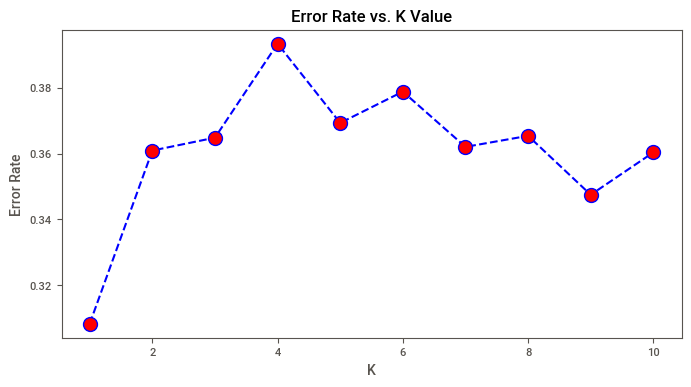

In [125]:
plt.figure(figsize=(8,4))
plt.plot(range(1,11),error_rate,color='blue', linestyle='dashed', marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

In [126]:
knn=KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train_np,Y_train_np)

KNeighborsClassifier(n_neighbors=1)

In [127]:
Y_pred_knn1=knn.predict(X_train_np)
Y_pred_knn2=knn.predict(X_test_np)

In [128]:
# Train Accuracy of KNN Model
print(classification_report(Y_train_np,Y_pred_knn1))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3598
           1       1.00      1.00      1.00      3549

    accuracy                           1.00      7147
   macro avg       1.00      1.00      1.00      7147
weighted avg       1.00      1.00      1.00      7147



In [129]:
# Test Accuracy of KNN Model
print(classification_report(Y_test_np,Y_pred_knn2))

              precision    recall  f1-score   support

           0       0.71      0.61      0.66       869
           1       0.68      0.77      0.72       918

    accuracy                           0.69      1787
   macro avg       0.69      0.69      0.69      1787
weighted avg       0.69      0.69      0.69      1787



Accuracy of this model is 69%

In [130]:
param_grid7 = {
    'n_neighbors': [3, 5, 7, 9],  # Values for k
    'weights': ['uniform', 'distance'],  # Weighting strategy
    'p': [1, 2],  # L1 or L2 distance metric
    'metric': ['euclidean', 'manhattan']  # Distance metric
}
grid7= GridSearchCV(estimator=knn, param_grid=param_grid7, scoring='accuracy', cv=5, verbose=1)

In [131]:
grid7.fit(X_train,Y_train)

Fitting 5 folds for each of 32 candidates, totalling 160 fits


GridSearchCV(cv=5, estimator=KNeighborsClassifier(n_neighbors=1),
             param_grid={'metric': ['euclidean', 'manhattan'],
                         'n_neighbors': [3, 5, 7, 9], 'p': [1, 2],
                         'weights': ['uniform', 'distance']},
             scoring='accuracy', verbose=1)

In [132]:
print("Best Parameters of n_neighbors, weights & metric are:",grid7.best_params_)

Best Parameters of n_neighbors, weights & metric are: {'metric': 'manhattan', 'n_neighbors': 3, 'p': 1, 'weights': 'distance'}


In [133]:
knnh=KNeighborsClassifier(n_neighbors= 3, metric= 'manhattan', p= 1, weights= 'distance')
knnh.fit(X_train_np,Y_train_np)

KNeighborsClassifier(metric='manhattan', n_neighbors=3, p=1, weights='distance')

In [134]:
Y_pred_knnh1=knnh.predict(X_train_np)
Y_pred_knnh2=knnh.predict(X_test_np)

In [135]:
# Train Accuracy of Tuned KNN Model
print(classification_report(Y_train_np,Y_pred_knnh1))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3598
           1       1.00      1.00      1.00      3549

    accuracy                           1.00      7147
   macro avg       1.00      1.00      1.00      7147
weighted avg       1.00      1.00      1.00      7147



In [136]:
# Test Accuracy of Tuned KNN Model
print(classification_report(Y_test_np,Y_pred_knnh2))

              precision    recall  f1-score   support

           0       0.74      0.58      0.65       869
           1       0.67      0.80      0.73       918

    accuracy                           0.70      1787
   macro avg       0.70      0.69      0.69      1787
weighted avg       0.70      0.70      0.69      1787



Accuracy of this model after tuning is 70%

# MODEL 8 - ANN 

In [137]:
ann = MLPClassifier()
ann.fit(X_train,Y_train) 

MLPClassifier()

In [138]:
Y_pred_ann1=ann.predict(X_train)
Y_pred_ann2=ann.predict(X_test)

In [139]:
# Train Accuracy of ANN Model
print(classification_report(Y_train,Y_pred_ann1))

              precision    recall  f1-score   support

           0       0.75      0.63      0.69      3598
           1       0.68      0.78      0.73      3549

    accuracy                           0.71      7147
   macro avg       0.71      0.71      0.71      7147
weighted avg       0.71      0.71      0.71      7147



In [140]:
# Test Accuracy of ANN Model
print(classification_report(Y_test,Y_pred_ann2))

              precision    recall  f1-score   support

           0       0.70      0.57      0.63       869
           1       0.65      0.77      0.71       918

    accuracy                           0.67      1787
   macro avg       0.68      0.67      0.67      1787
weighted avg       0.68      0.67      0.67      1787



Accuracy of this model is 67%

In [141]:
param_grid8 = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50)],
    'activation': ['relu', 'tanh'],
    'solver': ['adam', 'sgd'],
    'learning_rate': ['constant', 'adaptive'],
}
from sklearn.neural_network import MLPClassifier
# Create an ANN classifier
ann1 = MLPClassifier(max_iter=1000)

# Perform GridSearchCV
grid8 = GridSearchCV(ann1, param_grid8, cv=5)
grid8.fit(X_train, Y_train)

# Print the best hyperparameters 
print("Best Hyperparameters: ", grid8.best_params_)

Best Hyperparameters:  {'activation': 'tanh', 'hidden_layer_sizes': (100, 50), 'learning_rate': 'adaptive', 'solver': 'adam'}


In [142]:
# Instantiate MLPClassifier with specified hyperparameters
annh = MLPClassifier(activation='tanh', hidden_layer_sizes=(100, 50), learning_rate='adaptive', solver='adam')
annh.fit(X_train,Y_train)

MLPClassifier(activation='tanh', hidden_layer_sizes=(100, 50),
              learning_rate='adaptive')

In [143]:
Y_pred_annh1=annh.predict(X_train)
Y_pred_annh2=annh.predict(X_test)

In [144]:
# Train Accuracy of ANN Model
print(classification_report(Y_train,Y_pred_annh1))

              precision    recall  f1-score   support

           0       0.81      0.82      0.82      3598
           1       0.82      0.81      0.81      3549

    accuracy                           0.81      7147
   macro avg       0.81      0.81      0.81      7147
weighted avg       0.81      0.81      0.81      7147



In [145]:
# Test Accuracy of ANN Model
print(classification_report(Y_test,Y_pred_annh2))

              precision    recall  f1-score   support

           0       0.67      0.67      0.67       869
           1       0.69      0.69      0.69       918

    accuracy                           0.68      1787
   macro avg       0.68      0.68      0.68      1787
weighted avg       0.68      0.68      0.68      1787



Accuracy of this model after tuning is 68%

# MODEL 9 - NAIVE BAYES

In [146]:
nb = GaussianNB()
nb.fit(X_train, Y_train)

GaussianNB()

In [147]:
Y_pred_nb1=nb.predict(X_train)
Y_pred_nb2=nb.predict(X_test)

In [148]:
# Train Accuracy of Naive Bayes Model
print(classification_report(Y_train,Y_pred_nb1))

              precision    recall  f1-score   support

           0       0.60      0.62      0.61      3598
           1       0.60      0.58      0.59      3549

    accuracy                           0.60      7147
   macro avg       0.60      0.60      0.60      7147
weighted avg       0.60      0.60      0.60      7147



In [149]:
# Test Accuracy of Naive Bayes Model
print(classification_report(Y_test,Y_pred_nb2))

              precision    recall  f1-score   support

           0       0.59      0.59      0.59       869
           1       0.61      0.61      0.61       918

    accuracy                           0.60      1787
   macro avg       0.60      0.60      0.60      1787
weighted avg       0.60      0.60      0.60      1787



In [150]:
# Define the parameter grid to search
param_grid9 = {
    'priors': [None, [0.5, 0.5], [0.7, 0.3]],  # You can specify your own priors here
    'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6, 1e-5]
}

# Initialize GridSearchCV
grid9 = GridSearchCV(nb, param_grid9, cv=5, scoring='accuracy')

# Fit the model
grid9.fit(X_train, Y_train)

GridSearchCV(cv=5, estimator=GaussianNB(),
             param_grid={'priors': [None, [0.5, 0.5], [0.7, 0.3]],
                         'var_smoothing': [1e-09, 1e-08, 1e-07, 1e-06, 1e-05]},
             scoring='accuracy')

In [151]:
# Print the best hyperparameters 
print("Best Hyperparameters: ", grid9.best_params_)

Best Hyperparameters:  {'priors': [0.5, 0.5], 'var_smoothing': 1e-06}


In [152]:
# Instantiate GaussianNB with specified hyperparameters
nbh = GaussianNB(priors=[0.5, 0.5], var_smoothing=1e-06)
nbh.fit(X_train,Y_train)

GaussianNB(priors=[0.5, 0.5], var_smoothing=1e-06)

In [153]:
Y_pred_nbh1=nbh.predict(X_train)
Y_pred_nbh2=nbh.predict(X_test)

In [154]:
# Train Accuracy of tuned Naive Bayes Model
print(classification_report(Y_train,Y_pred_nbh1))

              precision    recall  f1-score   support

           0       0.60      0.61      0.61      3598
           1       0.60      0.59      0.60      3549

    accuracy                           0.60      7147
   macro avg       0.60      0.60      0.60      7147
weighted avg       0.60      0.60      0.60      7147



In [155]:
# Test Accuracy of tuned Naive Bayes Model
print(classification_report(Y_test,Y_pred_nbh2))

              precision    recall  f1-score   support

           0       0.59      0.58      0.59       869
           1       0.61      0.62      0.62       918

    accuracy                           0.60      1787
   macro avg       0.60      0.60      0.60      1787
weighted avg       0.60      0.60      0.60      1787



Accuracy of this model after tuning is 60%

# MODEL 10 - CatBoost

In [156]:
cb=CatBoostClassifier()
# Fit the model on the training data
cb.fit(X_train, Y_train)

Learning rate set to 0.023859
0:	learn: 0.6876847	total: 165ms	remaining: 2m 44s
1:	learn: 0.6816800	total: 170ms	remaining: 1m 24s
2:	learn: 0.6769505	total: 175ms	remaining: 58.1s
3:	learn: 0.6719350	total: 179ms	remaining: 44.6s
4:	learn: 0.6666897	total: 183ms	remaining: 36.4s
5:	learn: 0.6625464	total: 186ms	remaining: 30.9s
6:	learn: 0.6588577	total: 190ms	remaining: 26.9s
7:	learn: 0.6542652	total: 193ms	remaining: 23.9s
8:	learn: 0.6508503	total: 196ms	remaining: 21.6s
9:	learn: 0.6473462	total: 199ms	remaining: 19.7s
10:	learn: 0.6437596	total: 203ms	remaining: 18.2s
11:	learn: 0.6404336	total: 206ms	remaining: 16.9s
12:	learn: 0.6377084	total: 209ms	remaining: 15.9s
13:	learn: 0.6348521	total: 212ms	remaining: 15s
14:	learn: 0.6325198	total: 216ms	remaining: 14.2s
15:	learn: 0.6295588	total: 219ms	remaining: 13.5s
16:	learn: 0.6272472	total: 222ms	remaining: 12.9s
17:	learn: 0.6242276	total: 226ms	remaining: 12.3s
18:	learn: 0.6212535	total: 231ms	remaining: 11.9s
19:	learn: 

175:	learn: 0.5289449	total: 991ms	remaining: 4.64s
176:	learn: 0.5287857	total: 995ms	remaining: 4.63s
177:	learn: 0.5286183	total: 1000ms	remaining: 4.62s
178:	learn: 0.5282984	total: 1s	remaining: 4.6s
179:	learn: 0.5281182	total: 1.01s	remaining: 4.58s
180:	learn: 0.5279463	total: 1.01s	remaining: 4.57s
181:	learn: 0.5276606	total: 1.01s	remaining: 4.56s
182:	learn: 0.5272832	total: 1.02s	remaining: 4.54s
183:	learn: 0.5270908	total: 1.02s	remaining: 4.53s
184:	learn: 0.5268628	total: 1.02s	remaining: 4.51s
185:	learn: 0.5266324	total: 1.03s	remaining: 4.5s
186:	learn: 0.5264234	total: 1.03s	remaining: 4.49s
187:	learn: 0.5261857	total: 1.04s	remaining: 4.48s
188:	learn: 0.5259875	total: 1.04s	remaining: 4.46s
189:	learn: 0.5257665	total: 1.04s	remaining: 4.45s
190:	learn: 0.5255868	total: 1.05s	remaining: 4.44s
191:	learn: 0.5253174	total: 1.05s	remaining: 4.43s
192:	learn: 0.5251508	total: 1.06s	remaining: 4.42s
193:	learn: 0.5248768	total: 1.06s	remaining: 4.41s
194:	learn: 0.52

381:	learn: 0.4900437	total: 1.71s	remaining: 2.76s
382:	learn: 0.4899556	total: 1.71s	remaining: 2.75s
383:	learn: 0.4898222	total: 1.84s	remaining: 2.94s
384:	learn: 0.4896173	total: 1.85s	remaining: 2.95s
385:	learn: 0.4894198	total: 1.86s	remaining: 2.96s
386:	learn: 0.4892421	total: 1.88s	remaining: 2.97s
387:	learn: 0.4891230	total: 1.89s	remaining: 2.98s
388:	learn: 0.4890229	total: 1.9s	remaining: 2.98s
389:	learn: 0.4887891	total: 1.9s	remaining: 2.98s
390:	learn: 0.4885038	total: 1.91s	remaining: 2.98s
391:	learn: 0.4882528	total: 1.92s	remaining: 2.97s
392:	learn: 0.4881342	total: 1.92s	remaining: 2.96s
393:	learn: 0.4879187	total: 1.92s	remaining: 2.96s
394:	learn: 0.4877858	total: 1.93s	remaining: 2.95s
395:	learn: 0.4875918	total: 1.93s	remaining: 2.95s
396:	learn: 0.4874651	total: 1.94s	remaining: 2.94s
397:	learn: 0.4871999	total: 1.94s	remaining: 2.93s
398:	learn: 0.4870388	total: 1.94s	remaining: 2.93s
399:	learn: 0.4868310	total: 1.95s	remaining: 2.92s
400:	learn: 0.

597:	learn: 0.4511439	total: 2.64s	remaining: 1.77s
598:	learn: 0.4508860	total: 2.64s	remaining: 1.77s
599:	learn: 0.4506852	total: 2.65s	remaining: 1.76s
600:	learn: 0.4505898	total: 2.65s	remaining: 1.76s
601:	learn: 0.4504928	total: 2.66s	remaining: 1.76s
602:	learn: 0.4503321	total: 2.66s	remaining: 1.75s
603:	learn: 0.4502401	total: 2.67s	remaining: 1.75s
604:	learn: 0.4500718	total: 2.67s	remaining: 1.74s
605:	learn: 0.4499223	total: 2.67s	remaining: 1.74s
606:	learn: 0.4497994	total: 2.67s	remaining: 1.73s
607:	learn: 0.4496197	total: 2.68s	remaining: 1.73s
608:	learn: 0.4494738	total: 2.68s	remaining: 1.72s
609:	learn: 0.4492830	total: 2.69s	remaining: 1.72s
610:	learn: 0.4490969	total: 2.69s	remaining: 1.71s
611:	learn: 0.4489628	total: 2.69s	remaining: 1.71s
612:	learn: 0.4487372	total: 2.69s	remaining: 1.7s
613:	learn: 0.4485340	total: 2.7s	remaining: 1.7s
614:	learn: 0.4483219	total: 2.7s	remaining: 1.69s
615:	learn: 0.4482266	total: 2.7s	remaining: 1.69s
616:	learn: 0.448

775:	learn: 0.4243268	total: 3.24s	remaining: 935ms
776:	learn: 0.4241281	total: 3.24s	remaining: 931ms
777:	learn: 0.4240045	total: 3.25s	remaining: 927ms
778:	learn: 0.4238321	total: 3.25s	remaining: 923ms
779:	learn: 0.4236718	total: 3.26s	remaining: 918ms
780:	learn: 0.4235061	total: 3.26s	remaining: 914ms
781:	learn: 0.4233967	total: 3.26s	remaining: 910ms
782:	learn: 0.4232782	total: 3.27s	remaining: 906ms
783:	learn: 0.4231436	total: 3.27s	remaining: 901ms
784:	learn: 0.4229933	total: 3.27s	remaining: 897ms
785:	learn: 0.4228657	total: 3.28s	remaining: 893ms
786:	learn: 0.4226999	total: 3.28s	remaining: 888ms
787:	learn: 0.4226212	total: 3.29s	remaining: 884ms
788:	learn: 0.4224815	total: 3.29s	remaining: 880ms
789:	learn: 0.4223721	total: 3.29s	remaining: 875ms
790:	learn: 0.4221824	total: 3.3s	remaining: 871ms
791:	learn: 0.4220036	total: 3.3s	remaining: 867ms
792:	learn: 0.4218080	total: 3.3s	remaining: 862ms
793:	learn: 0.4216628	total: 3.31s	remaining: 858ms
794:	learn: 0.4

948:	learn: 0.4015460	total: 3.84s	remaining: 206ms
949:	learn: 0.4014725	total: 3.84s	remaining: 202ms
950:	learn: 0.4014005	total: 3.85s	remaining: 198ms
951:	learn: 0.4012857	total: 3.85s	remaining: 194ms
952:	learn: 0.4010775	total: 3.86s	remaining: 190ms
953:	learn: 0.4009842	total: 3.86s	remaining: 186ms
954:	learn: 0.4009215	total: 3.87s	remaining: 182ms
955:	learn: 0.4008323	total: 3.87s	remaining: 178ms
956:	learn: 0.4006891	total: 3.87s	remaining: 174ms
957:	learn: 0.4005832	total: 3.88s	remaining: 170ms
958:	learn: 0.4004192	total: 3.88s	remaining: 166ms
959:	learn: 0.4002838	total: 3.88s	remaining: 162ms
960:	learn: 0.4002004	total: 3.88s	remaining: 158ms
961:	learn: 0.4000074	total: 3.89s	remaining: 154ms
962:	learn: 0.3999763	total: 3.89s	remaining: 150ms
963:	learn: 0.3998733	total: 3.9s	remaining: 145ms
964:	learn: 0.3997296	total: 3.9s	remaining: 141ms
965:	learn: 0.3995816	total: 3.9s	remaining: 137ms
966:	learn: 0.3994752	total: 3.9s	remaining: 133ms
967:	learn: 0.39

In [157]:
Y_pred_cb1=cb.predict(X_train)
Y_pred_cb2=cb.predict(X_test)

In [158]:
# Train Accuracy of catboost Model
print(classification_report(Y_train,Y_pred_cb1))

              precision    recall  f1-score   support

           0       0.88      0.82      0.85      3598
           1       0.83      0.88      0.86      3549

    accuracy                           0.85      7147
   macro avg       0.85      0.85      0.85      7147
weighted avg       0.85      0.85      0.85      7147



In [159]:
# Test Accuracy of catboost Model
print(classification_report(Y_test,Y_pred_cb2))

              precision    recall  f1-score   support

           0       0.75      0.67      0.71       869
           1       0.72      0.79      0.75       918

    accuracy                           0.73      1787
   macro avg       0.73      0.73      0.73      1787
weighted avg       0.73      0.73      0.73      1787



Accuracy of this model is 73%

In [160]:
# Define the parameter grid to search
param_grid10 = {
    'iterations': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'depth': [4, 6, 8],
    'l2_leaf_reg': [1, 3, 5],
    'random_strength': [0.1, 0.5, 1],
}

# Create a CatBoostClassifier instance
catboost_model = CatBoostClassifier()

# Initialize GridSearchCV
grid10 = GridSearchCV(catboost_model, param_grid10, cv=3, scoring='accuracy')

# Fit the model
grid10.fit(X_train, Y_train)

0:	learn: 0.6913092	total: 1.07ms	remaining: 106ms
1:	learn: 0.6895057	total: 2.24ms	remaining: 110ms
2:	learn: 0.6877361	total: 3.24ms	remaining: 105ms
3:	learn: 0.6860022	total: 4.16ms	remaining: 99.8ms
4:	learn: 0.6843121	total: 5.13ms	remaining: 97.4ms
5:	learn: 0.6826510	total: 6.13ms	remaining: 96ms
6:	learn: 0.6810227	total: 7.06ms	remaining: 93.8ms
7:	learn: 0.6794252	total: 7.96ms	remaining: 91.5ms
8:	learn: 0.6778436	total: 8.91ms	remaining: 90ms
9:	learn: 0.6763056	total: 9.81ms	remaining: 88.3ms
10:	learn: 0.6747816	total: 10.7ms	remaining: 86.9ms
11:	learn: 0.6732958	total: 11.9ms	remaining: 87.1ms
12:	learn: 0.6718415	total: 12.9ms	remaining: 86.2ms
13:	learn: 0.6704098	total: 13.9ms	remaining: 85.3ms
14:	learn: 0.6689979	total: 14.8ms	remaining: 83.8ms
15:	learn: 0.6676140	total: 15.7ms	remaining: 82.6ms
16:	learn: 0.6662562	total: 16.8ms	remaining: 81.9ms
17:	learn: 0.6649270	total: 17.8ms	remaining: 80.9ms
18:	learn: 0.6636165	total: 18.7ms	remaining: 79.7ms
19:	learn:

72:	learn: 0.6205386	total: 68.1ms	remaining: 25.2ms
73:	learn: 0.6199935	total: 69.3ms	remaining: 24.4ms
74:	learn: 0.6194417	total: 70.5ms	remaining: 23.5ms
75:	learn: 0.6189052	total: 71.7ms	remaining: 22.6ms
76:	learn: 0.6183950	total: 72.8ms	remaining: 21.7ms
77:	learn: 0.6178891	total: 73.9ms	remaining: 20.8ms
78:	learn: 0.6173861	total: 75.1ms	remaining: 20ms
79:	learn: 0.6168966	total: 76.2ms	remaining: 19ms
80:	learn: 0.6164120	total: 77.3ms	remaining: 18.1ms
81:	learn: 0.6159389	total: 78.5ms	remaining: 17.2ms
82:	learn: 0.6154508	total: 79.5ms	remaining: 16.3ms
83:	learn: 0.6149751	total: 80.6ms	remaining: 15.4ms
84:	learn: 0.6144972	total: 81.7ms	remaining: 14.4ms
85:	learn: 0.6140458	total: 82.9ms	remaining: 13.5ms
86:	learn: 0.6136016	total: 84ms	remaining: 12.5ms
87:	learn: 0.6131612	total: 85.1ms	remaining: 11.6ms
88:	learn: 0.6126419	total: 86.2ms	remaining: 10.7ms
89:	learn: 0.6121972	total: 87.3ms	remaining: 9.7ms
90:	learn: 0.6116969	total: 88.5ms	remaining: 8.75ms


99:	learn: 0.6044899	total: 201ms	remaining: 0us
0:	learn: 0.6914412	total: 2.99ms	remaining: 296ms
1:	learn: 0.6897840	total: 5.43ms	remaining: 266ms
2:	learn: 0.6881413	total: 7.86ms	remaining: 254ms
3:	learn: 0.6866276	total: 9.79ms	remaining: 235ms
4:	learn: 0.6850110	total: 11.7ms	remaining: 222ms
5:	learn: 0.6834355	total: 13.5ms	remaining: 212ms
6:	learn: 0.6819581	total: 15.2ms	remaining: 202ms
7:	learn: 0.6804959	total: 16.8ms	remaining: 193ms
8:	learn: 0.6790428	total: 18.4ms	remaining: 186ms
9:	learn: 0.6776523	total: 19.9ms	remaining: 179ms
10:	learn: 0.6762210	total: 21.3ms	remaining: 172ms
11:	learn: 0.6747844	total: 22.4ms	remaining: 164ms
12:	learn: 0.6734144	total: 23.7ms	remaining: 159ms
13:	learn: 0.6720804	total: 25ms	remaining: 153ms
14:	learn: 0.6708062	total: 26.3ms	remaining: 149ms
15:	learn: 0.6695099	total: 27.3ms	remaining: 143ms
16:	learn: 0.6682079	total: 28.4ms	remaining: 139ms
17:	learn: 0.6669087	total: 29.6ms	remaining: 135ms
18:	learn: 0.6656375	total:

66:	learn: 0.6237772	total: 78.6ms	remaining: 38.7ms
67:	learn: 0.6232488	total: 79.8ms	remaining: 37.6ms
68:	learn: 0.6226229	total: 81.1ms	remaining: 36.4ms
69:	learn: 0.6220064	total: 82.3ms	remaining: 35.3ms
70:	learn: 0.6213829	total: 83.5ms	remaining: 34.1ms
71:	learn: 0.6209000	total: 84.8ms	remaining: 33ms
72:	learn: 0.6202436	total: 86.1ms	remaining: 31.8ms
73:	learn: 0.6197163	total: 87.4ms	remaining: 30.7ms
74:	learn: 0.6191368	total: 88.7ms	remaining: 29.6ms
75:	learn: 0.6186479	total: 90ms	remaining: 28.4ms
76:	learn: 0.6182075	total: 91.2ms	remaining: 27.3ms
77:	learn: 0.6176544	total: 92.5ms	remaining: 26.1ms
78:	learn: 0.6171376	total: 93.8ms	remaining: 24.9ms
79:	learn: 0.6165918	total: 95ms	remaining: 23.8ms
80:	learn: 0.6160405	total: 96.2ms	remaining: 22.6ms
81:	learn: 0.6154812	total: 97.4ms	remaining: 21.4ms
82:	learn: 0.6149507	total: 98.8ms	remaining: 20.2ms
83:	learn: 0.6144743	total: 100ms	remaining: 19.1ms
84:	learn: 0.6139803	total: 101ms	remaining: 17.9ms
8

0:	learn: 0.6841287	total: 1.5ms	remaining: 149ms
1:	learn: 0.6759707	total: 3.16ms	remaining: 155ms
2:	learn: 0.6685554	total: 4.66ms	remaining: 151ms
3:	learn: 0.6618158	total: 6.46ms	remaining: 155ms
4:	learn: 0.6557068	total: 11.6ms	remaining: 220ms
5:	learn: 0.6502427	total: 13.3ms	remaining: 208ms
6:	learn: 0.6450744	total: 15.2ms	remaining: 202ms
7:	learn: 0.6404231	total: 16.9ms	remaining: 195ms
8:	learn: 0.6359933	total: 18.2ms	remaining: 184ms
9:	learn: 0.6319667	total: 19.5ms	remaining: 176ms
10:	learn: 0.6282012	total: 20.8ms	remaining: 168ms
11:	learn: 0.6245553	total: 22.3ms	remaining: 163ms
12:	learn: 0.6211623	total: 23.9ms	remaining: 160ms
13:	learn: 0.6181392	total: 25.3ms	remaining: 155ms
14:	learn: 0.6152668	total: 26.8ms	remaining: 152ms
15:	learn: 0.6124928	total: 28.2ms	remaining: 148ms
16:	learn: 0.6098318	total: 29.6ms	remaining: 145ms
17:	learn: 0.6074966	total: 30.9ms	remaining: 141ms
18:	learn: 0.6052761	total: 32.9ms	remaining: 140ms
19:	learn: 0.6028948	to

11:	learn: 0.6247640	total: 17.5ms	remaining: 128ms
12:	learn: 0.6214565	total: 18.8ms	remaining: 126ms
13:	learn: 0.6186035	total: 20.2ms	remaining: 124ms
14:	learn: 0.6156865	total: 21.6ms	remaining: 122ms
15:	learn: 0.6130764	total: 22.8ms	remaining: 120ms
16:	learn: 0.6106450	total: 24.2ms	remaining: 118ms
17:	learn: 0.6080037	total: 25.5ms	remaining: 116ms
18:	learn: 0.6057578	total: 26.9ms	remaining: 115ms
19:	learn: 0.6037880	total: 28.1ms	remaining: 112ms
20:	learn: 0.6018992	total: 29.5ms	remaining: 111ms
21:	learn: 0.6001345	total: 30.7ms	remaining: 109ms
22:	learn: 0.5985143	total: 32.2ms	remaining: 108ms
23:	learn: 0.5967745	total: 33.6ms	remaining: 106ms
24:	learn: 0.5948293	total: 34.8ms	remaining: 104ms
25:	learn: 0.5932563	total: 36.2ms	remaining: 103ms
26:	learn: 0.5915183	total: 37.5ms	remaining: 101ms
27:	learn: 0.5900878	total: 39ms	remaining: 100ms
28:	learn: 0.5885209	total: 40.4ms	remaining: 98.8ms
29:	learn: 0.5870861	total: 41.6ms	remaining: 97.1ms
30:	learn: 0

88:	learn: 0.5585347	total: 98.4ms	remaining: 12.2ms
89:	learn: 0.5580354	total: 99.7ms	remaining: 11.1ms
90:	learn: 0.5578086	total: 101ms	remaining: 9.99ms
91:	learn: 0.5574628	total: 102ms	remaining: 8.9ms
92:	learn: 0.5571950	total: 104ms	remaining: 7.79ms
93:	learn: 0.5568665	total: 105ms	remaining: 6.7ms
94:	learn: 0.5564833	total: 106ms	remaining: 5.6ms
95:	learn: 0.5561407	total: 108ms	remaining: 4.48ms
96:	learn: 0.5558988	total: 109ms	remaining: 3.37ms
97:	learn: 0.5556702	total: 110ms	remaining: 2.25ms
98:	learn: 0.5550945	total: 111ms	remaining: 1.13ms
99:	learn: 0.5545805	total: 113ms	remaining: 0us
0:	learn: 0.6842143	total: 1.02ms	remaining: 101ms
1:	learn: 0.6763584	total: 2.02ms	remaining: 99ms
2:	learn: 0.6691476	total: 2.96ms	remaining: 95.7ms
3:	learn: 0.6631279	total: 3.83ms	remaining: 92ms
4:	learn: 0.6571505	total: 4.7ms	remaining: 89.3ms
5:	learn: 0.6513636	total: 5.65ms	remaining: 88.5ms
6:	learn: 0.6462666	total: 6.55ms	remaining: 87.1ms
7:	learn: 0.6419630	to

55:	learn: 0.5766683	total: 60.9ms	remaining: 47.8ms
56:	learn: 0.5759748	total: 62.1ms	remaining: 46.8ms
57:	learn: 0.5754499	total: 63.2ms	remaining: 45.8ms
58:	learn: 0.5747977	total: 64.3ms	remaining: 44.7ms
59:	learn: 0.5741623	total: 65.4ms	remaining: 43.6ms
60:	learn: 0.5734639	total: 66.6ms	remaining: 42.6ms
61:	learn: 0.5730970	total: 67.6ms	remaining: 41.5ms
62:	learn: 0.5727205	total: 68.7ms	remaining: 40.3ms
63:	learn: 0.5721302	total: 69.8ms	remaining: 39.3ms
64:	learn: 0.5716394	total: 70.8ms	remaining: 38.1ms
65:	learn: 0.5714465	total: 71.9ms	remaining: 37.1ms
66:	learn: 0.5706857	total: 73ms	remaining: 36ms
67:	learn: 0.5702756	total: 74ms	remaining: 34.8ms
68:	learn: 0.5698384	total: 75.1ms	remaining: 33.8ms
69:	learn: 0.5693883	total: 76.2ms	remaining: 32.7ms
70:	learn: 0.5691000	total: 77.2ms	remaining: 31.5ms
71:	learn: 0.5688810	total: 78.4ms	remaining: 30.5ms
72:	learn: 0.5685052	total: 79.4ms	remaining: 29.4ms
73:	learn: 0.5678427	total: 80.6ms	remaining: 28.3ms

0:	learn: 0.6765391	total: 1.21ms	remaining: 119ms
1:	learn: 0.6631481	total: 2.48ms	remaining: 122ms
2:	learn: 0.6516117	total: 3.54ms	remaining: 115ms
3:	learn: 0.6418491	total: 4.58ms	remaining: 110ms
4:	learn: 0.6337289	total: 5.69ms	remaining: 108ms
5:	learn: 0.6269382	total: 6.77ms	remaining: 106ms
6:	learn: 0.6208726	total: 7.79ms	remaining: 104ms
7:	learn: 0.6155125	total: 8.79ms	remaining: 101ms
8:	learn: 0.6110511	total: 9.94ms	remaining: 100ms
9:	learn: 0.6070369	total: 11.1ms	remaining: 99.5ms
10:	learn: 0.6037544	total: 12.2ms	remaining: 99ms
11:	learn: 0.6010338	total: 13.4ms	remaining: 98.2ms
12:	learn: 0.5970478	total: 14.7ms	remaining: 98.1ms
13:	learn: 0.5937275	total: 15.8ms	remaining: 97ms
14:	learn: 0.5913907	total: 17ms	remaining: 96.5ms
15:	learn: 0.5891999	total: 18.2ms	remaining: 95.8ms
16:	learn: 0.5867920	total: 19.3ms	remaining: 94.4ms
17:	learn: 0.5846541	total: 20.4ms	remaining: 93.2ms
18:	learn: 0.5827240	total: 21.7ms	remaining: 92.4ms
19:	learn: 0.58101

90:	learn: 0.5253388	total: 106ms	remaining: 10.5ms
91:	learn: 0.5246879	total: 108ms	remaining: 9.36ms
92:	learn: 0.5240311	total: 109ms	remaining: 8.2ms
93:	learn: 0.5231915	total: 110ms	remaining: 7.04ms
94:	learn: 0.5227977	total: 112ms	remaining: 5.87ms
95:	learn: 0.5224363	total: 113ms	remaining: 4.71ms
96:	learn: 0.5217986	total: 114ms	remaining: 3.53ms
97:	learn: 0.5213136	total: 115ms	remaining: 2.35ms
98:	learn: 0.5210468	total: 117ms	remaining: 1.18ms
99:	learn: 0.5206570	total: 118ms	remaining: 0us
0:	learn: 0.6768282	total: 1.04ms	remaining: 103ms
1:	learn: 0.6633824	total: 2.01ms	remaining: 98.4ms
2:	learn: 0.6519861	total: 2.96ms	remaining: 95.7ms
3:	learn: 0.6432721	total: 3.84ms	remaining: 92.2ms
4:	learn: 0.6355794	total: 4.7ms	remaining: 89.2ms
5:	learn: 0.6282620	total: 5.6ms	remaining: 87.8ms
6:	learn: 0.6219665	total: 6.58ms	remaining: 87.4ms
7:	learn: 0.6168764	total: 7.61ms	remaining: 87.5ms
8:	learn: 0.6121131	total: 8.53ms	remaining: 86.2ms
9:	learn: 0.6079712

61:	learn: 0.5456872	total: 83.6ms	remaining: 51.2ms
62:	learn: 0.5454820	total: 85ms	remaining: 49.9ms
63:	learn: 0.5449654	total: 86.3ms	remaining: 48.6ms
64:	learn: 0.5445726	total: 87.7ms	remaining: 47.2ms
65:	learn: 0.5440105	total: 89.1ms	remaining: 45.9ms
66:	learn: 0.5433418	total: 90.6ms	remaining: 44.6ms
67:	learn: 0.5426294	total: 91.9ms	remaining: 43.3ms
68:	learn: 0.5422419	total: 93.3ms	remaining: 41.9ms
69:	learn: 0.5416727	total: 94.7ms	remaining: 40.6ms
70:	learn: 0.5414125	total: 96.2ms	remaining: 39.3ms
71:	learn: 0.5408389	total: 97.7ms	remaining: 38ms
72:	learn: 0.5404040	total: 99.2ms	remaining: 36.7ms
73:	learn: 0.5399387	total: 101ms	remaining: 35.3ms
74:	learn: 0.5393435	total: 102ms	remaining: 34ms
75:	learn: 0.5390654	total: 103ms	remaining: 32.6ms
76:	learn: 0.5388433	total: 105ms	remaining: 31.2ms
77:	learn: 0.5384907	total: 106ms	remaining: 29.9ms
78:	learn: 0.5377463	total: 107ms	remaining: 28.5ms
79:	learn: 0.5373563	total: 108ms	remaining: 27.1ms
80:	le

68:	learn: 0.5457908	total: 86.6ms	remaining: 38.9ms
69:	learn: 0.5453164	total: 88.6ms	remaining: 38ms
70:	learn: 0.5450711	total: 90.2ms	remaining: 36.8ms
71:	learn: 0.5446670	total: 91.9ms	remaining: 35.7ms
72:	learn: 0.5443101	total: 93.7ms	remaining: 34.6ms
73:	learn: 0.5438177	total: 95.3ms	remaining: 33.5ms
74:	learn: 0.5434369	total: 96.9ms	remaining: 32.3ms
75:	learn: 0.5425538	total: 98.6ms	remaining: 31.1ms
76:	learn: 0.5422257	total: 100ms	remaining: 29.9ms
77:	learn: 0.5419110	total: 102ms	remaining: 28.7ms
78:	learn: 0.5414691	total: 103ms	remaining: 27.5ms
79:	learn: 0.5409683	total: 105ms	remaining: 26.3ms
80:	learn: 0.5406786	total: 107ms	remaining: 25ms
81:	learn: 0.5403028	total: 109ms	remaining: 24ms
82:	learn: 0.5401492	total: 111ms	remaining: 22.7ms
83:	learn: 0.5393739	total: 113ms	remaining: 21.5ms
84:	learn: 0.5389411	total: 115ms	remaining: 20.3ms
85:	learn: 0.5388214	total: 116ms	remaining: 18.9ms
86:	learn: 0.5385302	total: 118ms	remaining: 17.6ms
87:	learn:

0:	learn: 0.6913565	total: 994us	remaining: 98.5ms
1:	learn: 0.6895921	total: 2.05ms	remaining: 100ms
2:	learn: 0.6878663	total: 2.99ms	remaining: 96.8ms
3:	learn: 0.6861536	total: 3.94ms	remaining: 94.6ms
4:	learn: 0.6844798	total: 4.95ms	remaining: 94.1ms
5:	learn: 0.6828422	total: 5.96ms	remaining: 93.3ms
6:	learn: 0.6812334	total: 7.04ms	remaining: 93.5ms
7:	learn: 0.6797092	total: 8.11ms	remaining: 93.3ms
8:	learn: 0.6781557	total: 9.2ms	remaining: 93ms
9:	learn: 0.6766345	total: 10.2ms	remaining: 92.1ms
10:	learn: 0.6751410	total: 11.3ms	remaining: 91.6ms
11:	learn: 0.6736750	total: 12.4ms	remaining: 90.8ms
12:	learn: 0.6722320	total: 13.4ms	remaining: 89.6ms
13:	learn: 0.6708175	total: 14.4ms	remaining: 88.4ms
14:	learn: 0.6694328	total: 15.5ms	remaining: 87.7ms
15:	learn: 0.6680647	total: 16.6ms	remaining: 87.4ms
16:	learn: 0.6667378	total: 17.9ms	remaining: 87.2ms
17:	learn: 0.6654211	total: 19.2ms	remaining: 87.3ms
18:	learn: 0.6641362	total: 20.2ms	remaining: 86.3ms
19:	lear

81:	learn: 0.6177517	total: 90.1ms	remaining: 19.8ms
82:	learn: 0.6172175	total: 91.3ms	remaining: 18.7ms
83:	learn: 0.6167785	total: 92.5ms	remaining: 17.6ms
84:	learn: 0.6162871	total: 93.7ms	remaining: 16.5ms
85:	learn: 0.6158546	total: 94.9ms	remaining: 15.4ms
86:	learn: 0.6153814	total: 96.1ms	remaining: 14.4ms
87:	learn: 0.6149533	total: 97.3ms	remaining: 13.3ms
88:	learn: 0.6145668	total: 98.4ms	remaining: 12.2ms
89:	learn: 0.6141452	total: 99.6ms	remaining: 11.1ms
90:	learn: 0.6136685	total: 101ms	remaining: 9.97ms
91:	learn: 0.6132525	total: 102ms	remaining: 8.86ms
92:	learn: 0.6128386	total: 103ms	remaining: 7.75ms
93:	learn: 0.6124258	total: 104ms	remaining: 6.64ms
94:	learn: 0.6120623	total: 105ms	remaining: 5.55ms
95:	learn: 0.6116572	total: 107ms	remaining: 4.44ms
96:	learn: 0.6112083	total: 108ms	remaining: 3.33ms
97:	learn: 0.6108054	total: 109ms	remaining: 2.22ms
98:	learn: 0.6104221	total: 110ms	remaining: 1.11ms
99:	learn: 0.6100838	total: 111ms	remaining: 0us
0:	lea

45:	learn: 0.6422333	total: 57.5ms	remaining: 67.5ms
46:	learn: 0.6414926	total: 59ms	remaining: 66.5ms
47:	learn: 0.6408070	total: 60.4ms	remaining: 65.4ms
48:	learn: 0.6400635	total: 61.7ms	remaining: 64.2ms
49:	learn: 0.6392834	total: 63.2ms	remaining: 63.2ms
50:	learn: 0.6386008	total: 64.4ms	remaining: 61.9ms
51:	learn: 0.6378853	total: 65.5ms	remaining: 60.5ms
52:	learn: 0.6372636	total: 66.8ms	remaining: 59.2ms
53:	learn: 0.6365442	total: 67.9ms	remaining: 57.8ms
54:	learn: 0.6357663	total: 69.2ms	remaining: 56.6ms
55:	learn: 0.6351300	total: 71.1ms	remaining: 55.9ms
56:	learn: 0.6344510	total: 73ms	remaining: 55.1ms
57:	learn: 0.6337632	total: 75ms	remaining: 54.3ms
58:	learn: 0.6330455	total: 76.9ms	remaining: 53.5ms
59:	learn: 0.6323899	total: 79.1ms	remaining: 52.7ms
60:	learn: 0.6317064	total: 81ms	remaining: 51.8ms
61:	learn: 0.6312357	total: 82.8ms	remaining: 50.7ms
62:	learn: 0.6305642	total: 84.9ms	remaining: 49.8ms
63:	learn: 0.6299590	total: 86.8ms	remaining: 48.8ms
6

65:	learn: 0.5596523	total: 87.1ms	remaining: 44.9ms
66:	learn: 0.5591085	total: 88.6ms	remaining: 43.6ms
67:	learn: 0.5584683	total: 89.9ms	remaining: 42.3ms
68:	learn: 0.5579168	total: 91.1ms	remaining: 40.9ms
69:	learn: 0.5571423	total: 92.4ms	remaining: 39.6ms
70:	learn: 0.5564379	total: 93.8ms	remaining: 38.3ms
71:	learn: 0.5559127	total: 95ms	remaining: 36.9ms
72:	learn: 0.5553557	total: 96.3ms	remaining: 35.6ms
73:	learn: 0.5549456	total: 97.5ms	remaining: 34.3ms
74:	learn: 0.5544780	total: 98.8ms	remaining: 32.9ms
75:	learn: 0.5541184	total: 100ms	remaining: 31.6ms
76:	learn: 0.5538436	total: 101ms	remaining: 30.3ms
77:	learn: 0.5535034	total: 103ms	remaining: 28.9ms
78:	learn: 0.5530228	total: 104ms	remaining: 27.6ms
79:	learn: 0.5526770	total: 105ms	remaining: 26.3ms
80:	learn: 0.5524890	total: 106ms	remaining: 24.9ms
81:	learn: 0.5522342	total: 108ms	remaining: 23.6ms
82:	learn: 0.5519456	total: 109ms	remaining: 22.3ms
83:	learn: 0.5515875	total: 110ms	remaining: 21ms
84:	le

91:	learn: 0.5528255	total: 135ms	remaining: 11.8ms
92:	learn: 0.5524358	total: 137ms	remaining: 10.3ms
93:	learn: 0.5521933	total: 138ms	remaining: 8.83ms
94:	learn: 0.5518033	total: 140ms	remaining: 7.34ms
95:	learn: 0.5513982	total: 141ms	remaining: 5.87ms
96:	learn: 0.5512096	total: 142ms	remaining: 4.4ms
97:	learn: 0.5509974	total: 144ms	remaining: 2.93ms
98:	learn: 0.5506796	total: 145ms	remaining: 1.47ms
99:	learn: 0.5504476	total: 147ms	remaining: 0us
0:	learn: 0.6843361	total: 1.77ms	remaining: 175ms
1:	learn: 0.6762953	total: 3.02ms	remaining: 148ms
2:	learn: 0.6694989	total: 4.29ms	remaining: 139ms
3:	learn: 0.6627698	total: 6.63ms	remaining: 159ms
4:	learn: 0.6566432	total: 8.29ms	remaining: 158ms
5:	learn: 0.6512300	total: 12.9ms	remaining: 202ms
6:	learn: 0.6466047	total: 14.9ms	remaining: 198ms
7:	learn: 0.6421181	total: 16.2ms	remaining: 186ms
8:	learn: 0.6375871	total: 17.4ms	remaining: 176ms
9:	learn: 0.6334928	total: 18.8ms	remaining: 169ms
10:	learn: 0.6297879	total

0:	learn: 0.6843734	total: 1.63ms	remaining: 161ms
1:	learn: 0.6766314	total: 3.26ms	remaining: 160ms
2:	learn: 0.6695456	total: 4.85ms	remaining: 157ms
3:	learn: 0.6636015	total: 6.28ms	remaining: 151ms
4:	learn: 0.6576932	total: 7.82ms	remaining: 149ms
5:	learn: 0.6519770	total: 9.22ms	remaining: 145ms
6:	learn: 0.6469594	total: 10.7ms	remaining: 142ms
7:	learn: 0.6427086	total: 12.1ms	remaining: 139ms
8:	learn: 0.6383415	total: 13.6ms	remaining: 137ms
9:	learn: 0.6342809	total: 15.1ms	remaining: 136ms
10:	learn: 0.6305203	total: 17.2ms	remaining: 139ms
11:	learn: 0.6270035	total: 19.1ms	remaining: 140ms
12:	learn: 0.6236577	total: 22ms	remaining: 147ms
13:	learn: 0.6207027	total: 24.3ms	remaining: 149ms
14:	learn: 0.6178412	total: 26.4ms	remaining: 150ms
15:	learn: 0.6154783	total: 29.2ms	remaining: 153ms
16:	learn: 0.6128686	total: 30.8ms	remaining: 150ms
17:	learn: 0.6102086	total: 32.4ms	remaining: 148ms
18:	learn: 0.6081154	total: 35.5ms	remaining: 151ms
19:	learn: 0.6059137	tot

0:	learn: 0.6849081	total: 926us	remaining: 91.7ms
1:	learn: 0.6776061	total: 2.04ms	remaining: 100ms
2:	learn: 0.6707579	total: 2.95ms	remaining: 95.3ms
3:	learn: 0.6649084	total: 4.01ms	remaining: 96.4ms
4:	learn: 0.6593635	total: 4.89ms	remaining: 92.9ms
5:	learn: 0.6553313	total: 5.71ms	remaining: 89.5ms
6:	learn: 0.6513850	total: 6.55ms	remaining: 87ms
7:	learn: 0.6473856	total: 7.51ms	remaining: 86.4ms
8:	learn: 0.6429888	total: 8.45ms	remaining: 85.4ms
9:	learn: 0.6393286	total: 9.32ms	remaining: 83.9ms
10:	learn: 0.6360554	total: 10.2ms	remaining: 82.5ms
11:	learn: 0.6332707	total: 11.1ms	remaining: 81.1ms
12:	learn: 0.6299680	total: 12ms	remaining: 80ms
13:	learn: 0.6268742	total: 13.2ms	remaining: 81.1ms
14:	learn: 0.6242051	total: 14.2ms	remaining: 80.5ms
15:	learn: 0.6212943	total: 15.2ms	remaining: 79.7ms
16:	learn: 0.6186600	total: 16.1ms	remaining: 78.7ms
17:	learn: 0.6160976	total: 17ms	remaining: 77.5ms
18:	learn: 0.6139301	total: 18ms	remaining: 76.7ms
19:	learn: 0.61

0:	learn: 0.6758616	total: 1.34ms	remaining: 133ms
1:	learn: 0.6617044	total: 2.89ms	remaining: 142ms
2:	learn: 0.6500081	total: 3.97ms	remaining: 128ms
3:	learn: 0.6401117	total: 5.04ms	remaining: 121ms
4:	learn: 0.6318670	total: 6.17ms	remaining: 117ms
5:	learn: 0.6250599	total: 7.35ms	remaining: 115ms
6:	learn: 0.6183024	total: 8.48ms	remaining: 113ms
7:	learn: 0.6126131	total: 9.55ms	remaining: 110ms
8:	learn: 0.6076587	total: 11.7ms	remaining: 119ms
9:	learn: 0.6031190	total: 13.1ms	remaining: 118ms
10:	learn: 0.5993727	total: 14.4ms	remaining: 117ms
11:	learn: 0.5959177	total: 16ms	remaining: 118ms
12:	learn: 0.5922177	total: 17.2ms	remaining: 115ms
13:	learn: 0.5893045	total: 18.5ms	remaining: 114ms
14:	learn: 0.5868586	total: 19.9ms	remaining: 113ms
15:	learn: 0.5841208	total: 21.3ms	remaining: 112ms
16:	learn: 0.5816528	total: 22.7ms	remaining: 111ms
17:	learn: 0.5794128	total: 23.8ms	remaining: 109ms
18:	learn: 0.5775894	total: 25.2ms	remaining: 107ms
19:	learn: 0.5755287	tot

21:	learn: 0.5739863	total: 30.4ms	remaining: 108ms
22:	learn: 0.5727961	total: 31.9ms	remaining: 107ms
23:	learn: 0.5710610	total: 33.2ms	remaining: 105ms
24:	learn: 0.5698507	total: 34.5ms	remaining: 104ms
25:	learn: 0.5683130	total: 35.8ms	remaining: 102ms
26:	learn: 0.5670576	total: 37.2ms	remaining: 101ms
27:	learn: 0.5660982	total: 38.6ms	remaining: 99.3ms
28:	learn: 0.5652781	total: 40ms	remaining: 98ms
29:	learn: 0.5641032	total: 41.6ms	remaining: 97.2ms
30:	learn: 0.5633729	total: 43.3ms	remaining: 96.5ms
31:	learn: 0.5623929	total: 45.5ms	remaining: 96.7ms
32:	learn: 0.5618187	total: 46.8ms	remaining: 95ms
33:	learn: 0.5606467	total: 48.2ms	remaining: 93.5ms
34:	learn: 0.5601049	total: 49.4ms	remaining: 91.7ms
35:	learn: 0.5594551	total: 50.6ms	remaining: 90ms
36:	learn: 0.5587378	total: 51.9ms	remaining: 88.4ms
37:	learn: 0.5583214	total: 53.2ms	remaining: 86.7ms
38:	learn: 0.5575727	total: 54.5ms	remaining: 85.3ms
39:	learn: 0.5563558	total: 55.8ms	remaining: 83.8ms
40:	lea

0:	learn: 0.6770818	total: 1.35ms	remaining: 134ms
1:	learn: 0.6638349	total: 2.71ms	remaining: 133ms
2:	learn: 0.6526389	total: 3.96ms	remaining: 128ms
3:	learn: 0.6441607	total: 5.1ms	remaining: 122ms
4:	learn: 0.6362983	total: 6.38ms	remaining: 121ms
5:	learn: 0.6293164	total: 7.41ms	remaining: 116ms
6:	learn: 0.6232455	total: 8.52ms	remaining: 113ms
7:	learn: 0.6176736	total: 9.56ms	remaining: 110ms
8:	learn: 0.6135111	total: 10.6ms	remaining: 107ms
9:	learn: 0.6094565	total: 11.6ms	remaining: 104ms
10:	learn: 0.6055556	total: 12.7ms	remaining: 103ms
11:	learn: 0.6026041	total: 13.7ms	remaining: 101ms
12:	learn: 0.5990730	total: 14.7ms	remaining: 98.6ms
13:	learn: 0.5964378	total: 15.6ms	remaining: 96ms
14:	learn: 0.5936799	total: 16.7ms	remaining: 94.6ms
15:	learn: 0.5918694	total: 17.7ms	remaining: 92.9ms
16:	learn: 0.5896592	total: 18.6ms	remaining: 90.9ms
17:	learn: 0.5879054	total: 19.7ms	remaining: 89.9ms
18:	learn: 0.5866673	total: 20.8ms	remaining: 88.9ms
19:	learn: 0.58415

90:	learn: 0.5348397	total: 108ms	remaining: 10.7ms
91:	learn: 0.5346531	total: 109ms	remaining: 9.5ms
92:	learn: 0.5343827	total: 111ms	remaining: 8.33ms
93:	learn: 0.5340626	total: 112ms	remaining: 7.14ms
94:	learn: 0.5337616	total: 113ms	remaining: 5.95ms
95:	learn: 0.5331033	total: 115ms	remaining: 4.77ms
96:	learn: 0.5328092	total: 116ms	remaining: 3.58ms
97:	learn: 0.5322869	total: 117ms	remaining: 2.39ms
98:	learn: 0.5318373	total: 119ms	remaining: 1.2ms
99:	learn: 0.5313292	total: 120ms	remaining: 0us
0:	learn: 0.6770831	total: 1.12ms	remaining: 111ms
1:	learn: 0.6656282	total: 2.26ms	remaining: 111ms
2:	learn: 0.6542689	total: 3.39ms	remaining: 110ms
3:	learn: 0.6454213	total: 4.46ms	remaining: 107ms
4:	learn: 0.6376115	total: 5.42ms	remaining: 103ms
5:	learn: 0.6327270	total: 6.35ms	remaining: 99.5ms
6:	learn: 0.6286543	total: 7.32ms	remaining: 97.3ms
7:	learn: 0.6229540	total: 8.45ms	remaining: 97.2ms
8:	learn: 0.6191249	total: 9.52ms	remaining: 96.3ms
9:	learn: 0.6153470	to

46:	learn: 0.6365587	total: 55.3ms	remaining: 62.3ms
47:	learn: 0.6357851	total: 56.6ms	remaining: 61.4ms
48:	learn: 0.6350182	total: 57.9ms	remaining: 60.2ms
49:	learn: 0.6342647	total: 59.1ms	remaining: 59.1ms
50:	learn: 0.6335008	total: 60.5ms	remaining: 58.1ms
51:	learn: 0.6327698	total: 61.9ms	remaining: 57.1ms
52:	learn: 0.6320410	total: 63.2ms	remaining: 56.1ms
53:	learn: 0.6313151	total: 64.5ms	remaining: 55ms
54:	learn: 0.6306066	total: 65.8ms	remaining: 53.8ms
55:	learn: 0.6298772	total: 67.2ms	remaining: 52.8ms
56:	learn: 0.6291665	total: 68.6ms	remaining: 51.7ms
57:	learn: 0.6284838	total: 70ms	remaining: 50.7ms
58:	learn: 0.6278096	total: 71.2ms	remaining: 49.5ms
59:	learn: 0.6271437	total: 72.6ms	remaining: 48.4ms
60:	learn: 0.6264660	total: 73.9ms	remaining: 47.3ms
61:	learn: 0.6258370	total: 75.3ms	remaining: 46.1ms
62:	learn: 0.6251760	total: 76.6ms	remaining: 45ms
63:	learn: 0.6245484	total: 78ms	remaining: 43.9ms
64:	learn: 0.6239195	total: 79.3ms	remaining: 42.7ms
6

20:	learn: 0.6623483	total: 20.3ms	remaining: 76.5ms
21:	learn: 0.6611276	total: 21.6ms	remaining: 76.5ms
22:	learn: 0.6599251	total: 22.8ms	remaining: 76.2ms
23:	learn: 0.6588404	total: 23.8ms	remaining: 75.5ms
24:	learn: 0.6576749	total: 25.1ms	remaining: 75.2ms
25:	learn: 0.6565836	total: 26.3ms	remaining: 74.8ms
26:	learn: 0.6554563	total: 27.5ms	remaining: 74.2ms
27:	learn: 0.6543477	total: 28.8ms	remaining: 74ms
28:	learn: 0.6533282	total: 30.1ms	remaining: 73.6ms
29:	learn: 0.6522588	total: 31.4ms	remaining: 73.2ms
30:	learn: 0.6512924	total: 32.6ms	remaining: 72.6ms
31:	learn: 0.6502657	total: 34.1ms	remaining: 72.5ms
32:	learn: 0.6492866	total: 35.4ms	remaining: 71.9ms
33:	learn: 0.6482818	total: 36.8ms	remaining: 71.5ms
34:	learn: 0.6473306	total: 38.2ms	remaining: 71ms
35:	learn: 0.6463984	total: 39.5ms	remaining: 70.3ms
36:	learn: 0.6454413	total: 40.9ms	remaining: 69.6ms
37:	learn: 0.6445414	total: 42.3ms	remaining: 68.9ms
38:	learn: 0.6436523	total: 43.6ms	remaining: 68.1

61:	learn: 0.6267372	total: 82ms	remaining: 50.3ms
62:	learn: 0.6260719	total: 83.4ms	remaining: 49ms
63:	learn: 0.6254736	total: 84.7ms	remaining: 47.6ms
64:	learn: 0.6248182	total: 86.1ms	remaining: 46.3ms
65:	learn: 0.6243576	total: 87.3ms	remaining: 45ms
66:	learn: 0.6237746	total: 88.6ms	remaining: 43.6ms
67:	learn: 0.6232303	total: 89.8ms	remaining: 42.3ms
68:	learn: 0.6226238	total: 91.2ms	remaining: 41ms
69:	learn: 0.6220471	total: 92.5ms	remaining: 39.6ms
70:	learn: 0.6214681	total: 93.8ms	remaining: 38.3ms
71:	learn: 0.6208937	total: 95.4ms	remaining: 37.1ms
72:	learn: 0.6203421	total: 96.8ms	remaining: 35.8ms
73:	learn: 0.6198385	total: 98.1ms	remaining: 34.5ms
74:	learn: 0.6193092	total: 99.5ms	remaining: 33.2ms
75:	learn: 0.6187713	total: 101ms	remaining: 32ms
76:	learn: 0.6183040	total: 103ms	remaining: 30.6ms
77:	learn: 0.6177776	total: 104ms	remaining: 29.3ms
78:	learn: 0.6173221	total: 105ms	remaining: 28ms
79:	learn: 0.6167874	total: 107ms	remaining: 26.7ms
80:	learn:

70:	learn: 0.6270786	total: 98.5ms	remaining: 40.2ms
71:	learn: 0.6266166	total: 100ms	remaining: 38.9ms
72:	learn: 0.6261811	total: 101ms	remaining: 37.5ms
73:	learn: 0.6255808	total: 103ms	remaining: 36.1ms
74:	learn: 0.6250889	total: 104ms	remaining: 34.7ms
75:	learn: 0.6246150	total: 105ms	remaining: 33.3ms
76:	learn: 0.6241937	total: 107ms	remaining: 31.9ms
77:	learn: 0.6237725	total: 108ms	remaining: 30.5ms
78:	learn: 0.6233107	total: 110ms	remaining: 29.2ms
79:	learn: 0.6228017	total: 111ms	remaining: 27.8ms
80:	learn: 0.6222938	total: 113ms	remaining: 26.4ms
81:	learn: 0.6218055	total: 114ms	remaining: 25ms
82:	learn: 0.6212995	total: 115ms	remaining: 23.6ms
83:	learn: 0.6208329	total: 117ms	remaining: 22.2ms
84:	learn: 0.6204055	total: 118ms	remaining: 20.9ms
85:	learn: 0.6199731	total: 120ms	remaining: 19.5ms
86:	learn: 0.6195055	total: 121ms	remaining: 18.1ms
87:	learn: 0.6190597	total: 123ms	remaining: 16.7ms
88:	learn: 0.6185594	total: 124ms	remaining: 15.3ms
89:	learn: 0.

0:	learn: 0.6848823	total: 1.25ms	remaining: 124ms
1:	learn: 0.6776496	total: 2.46ms	remaining: 121ms
2:	learn: 0.6707502	total: 3.59ms	remaining: 116ms
3:	learn: 0.6644328	total: 4.78ms	remaining: 115ms
4:	learn: 0.6587011	total: 5.95ms	remaining: 113ms
5:	learn: 0.6534006	total: 7.07ms	remaining: 111ms
6:	learn: 0.6487066	total: 8.24ms	remaining: 109ms
7:	learn: 0.6441628	total: 9.34ms	remaining: 107ms
8:	learn: 0.6400528	total: 14ms	remaining: 141ms
9:	learn: 0.6362511	total: 15.2ms	remaining: 137ms
10:	learn: 0.6327221	total: 17.8ms	remaining: 144ms
11:	learn: 0.6293819	total: 19.5ms	remaining: 143ms
12:	learn: 0.6263209	total: 20.7ms	remaining: 139ms
13:	learn: 0.6234230	total: 21.9ms	remaining: 135ms
14:	learn: 0.6207193	total: 23.2ms	remaining: 131ms
15:	learn: 0.6182622	total: 24.5ms	remaining: 128ms
16:	learn: 0.6159046	total: 25.7ms	remaining: 126ms
17:	learn: 0.6136639	total: 27.2ms	remaining: 124ms
18:	learn: 0.6116616	total: 28.3ms	remaining: 121ms
19:	learn: 0.6094175	tot

29:	learn: 0.5894583	total: 37.7ms	remaining: 87.9ms
30:	learn: 0.5882272	total: 39.1ms	remaining: 87.1ms
31:	learn: 0.5871824	total: 40.3ms	remaining: 85.7ms
32:	learn: 0.5856544	total: 41.6ms	remaining: 84.4ms
33:	learn: 0.5845736	total: 42.8ms	remaining: 83ms
34:	learn: 0.5833730	total: 44ms	remaining: 81.6ms
35:	learn: 0.5823044	total: 45.1ms	remaining: 80.2ms
36:	learn: 0.5812416	total: 46.3ms	remaining: 78.8ms
37:	learn: 0.5800622	total: 47.5ms	remaining: 77.5ms
38:	learn: 0.5793589	total: 48.9ms	remaining: 76.4ms
39:	learn: 0.5786430	total: 50.3ms	remaining: 75.5ms
40:	learn: 0.5776642	total: 51.9ms	remaining: 74.7ms
41:	learn: 0.5770431	total: 53.3ms	remaining: 73.6ms
42:	learn: 0.5761541	total: 54.8ms	remaining: 72.7ms
43:	learn: 0.5753344	total: 56.2ms	remaining: 71.5ms
44:	learn: 0.5745865	total: 57.6ms	remaining: 70.4ms
45:	learn: 0.5742439	total: 59ms	remaining: 69.2ms
46:	learn: 0.5735348	total: 60.3ms	remaining: 68ms
47:	learn: 0.5725777	total: 61.8ms	remaining: 66.9ms
4

69:	learn: 0.5651871	total: 77.4ms	remaining: 33.2ms
70:	learn: 0.5644541	total: 78.7ms	remaining: 32.2ms
71:	learn: 0.5638690	total: 80.1ms	remaining: 31.1ms
72:	learn: 0.5636446	total: 81.3ms	remaining: 30.1ms
73:	learn: 0.5632303	total: 82.5ms	remaining: 29ms
74:	learn: 0.5626036	total: 83.8ms	remaining: 27.9ms
75:	learn: 0.5624063	total: 85ms	remaining: 26.9ms
76:	learn: 0.5620886	total: 86.3ms	remaining: 25.8ms
77:	learn: 0.5617775	total: 87.5ms	remaining: 24.7ms
78:	learn: 0.5612842	total: 88.8ms	remaining: 23.6ms
79:	learn: 0.5611101	total: 89.9ms	remaining: 22.5ms
80:	learn: 0.5607827	total: 91.3ms	remaining: 21.4ms
81:	learn: 0.5605909	total: 92.7ms	remaining: 20.4ms
82:	learn: 0.5604092	total: 94.1ms	remaining: 19.3ms
83:	learn: 0.5601280	total: 95.5ms	remaining: 18.2ms
84:	learn: 0.5598685	total: 96.8ms	remaining: 17.1ms
85:	learn: 0.5597165	total: 98.1ms	remaining: 16ms
86:	learn: 0.5594890	total: 99.3ms	remaining: 14.8ms
87:	learn: 0.5589137	total: 101ms	remaining: 13.7ms


51:	learn: 0.5812113	total: 54.1ms	remaining: 49.9ms
52:	learn: 0.5809202	total: 55.4ms	remaining: 49.1ms
53:	learn: 0.5803356	total: 56.7ms	remaining: 48.3ms
54:	learn: 0.5793697	total: 58ms	remaining: 47.5ms
55:	learn: 0.5791100	total: 59.2ms	remaining: 46.5ms
56:	learn: 0.5784071	total: 60.5ms	remaining: 45.6ms
57:	learn: 0.5777269	total: 61.6ms	remaining: 44.6ms
58:	learn: 0.5774260	total: 63.1ms	remaining: 43.9ms
59:	learn: 0.5767509	total: 64.4ms	remaining: 42.9ms
60:	learn: 0.5763507	total: 65.6ms	remaining: 41.9ms
61:	learn: 0.5760426	total: 66.9ms	remaining: 41ms
62:	learn: 0.5758536	total: 68.3ms	remaining: 40.1ms
63:	learn: 0.5752760	total: 69.6ms	remaining: 39.2ms
64:	learn: 0.5744874	total: 71.1ms	remaining: 38.3ms
65:	learn: 0.5743303	total: 72.2ms	remaining: 37.2ms
66:	learn: 0.5736318	total: 73.5ms	remaining: 36.2ms
67:	learn: 0.5732499	total: 74.7ms	remaining: 35.2ms
68:	learn: 0.5728798	total: 75.9ms	remaining: 34.1ms
69:	learn: 0.5724355	total: 77.3ms	remaining: 33.1

16:	learn: 0.5886450	total: 16.3ms	remaining: 79.4ms
17:	learn: 0.5865726	total: 17.5ms	remaining: 79.8ms
18:	learn: 0.5852330	total: 18.8ms	remaining: 80.1ms
19:	learn: 0.5836356	total: 19.9ms	remaining: 79.6ms
20:	learn: 0.5815444	total: 21.1ms	remaining: 79.2ms
21:	learn: 0.5804672	total: 22.3ms	remaining: 79.1ms
22:	learn: 0.5788128	total: 23.6ms	remaining: 79ms
23:	learn: 0.5774908	total: 24.9ms	remaining: 78.9ms
24:	learn: 0.5765658	total: 26.2ms	remaining: 78.5ms
25:	learn: 0.5756535	total: 27.6ms	remaining: 78.5ms
26:	learn: 0.5746331	total: 28.8ms	remaining: 77.9ms
27:	learn: 0.5738768	total: 30.3ms	remaining: 77.9ms
28:	learn: 0.5724666	total: 31.6ms	remaining: 77.3ms
29:	learn: 0.5711076	total: 32.9ms	remaining: 76.8ms
30:	learn: 0.5695827	total: 34.2ms	remaining: 76.2ms
31:	learn: 0.5688125	total: 35.5ms	remaining: 75.5ms
32:	learn: 0.5679252	total: 36.9ms	remaining: 75ms
33:	learn: 0.5670947	total: 38.2ms	remaining: 74.2ms
34:	learn: 0.5663063	total: 39.5ms	remaining: 73.4

0:	learn: 0.6772989	total: 1.19ms	remaining: 118ms
1:	learn: 0.6642192	total: 2.39ms	remaining: 117ms
2:	learn: 0.6531836	total: 3.51ms	remaining: 113ms
3:	learn: 0.6448706	total: 4.65ms	remaining: 112ms
4:	learn: 0.6370653	total: 5.7ms	remaining: 108ms
5:	learn: 0.6301828	total: 6.88ms	remaining: 108ms
6:	learn: 0.6241405	total: 8.1ms	remaining: 108ms
7:	learn: 0.6186008	total: 9.33ms	remaining: 107ms
8:	learn: 0.6145064	total: 10.6ms	remaining: 107ms
9:	learn: 0.6104750	total: 11.8ms	remaining: 106ms
10:	learn: 0.6070122	total: 12.9ms	remaining: 104ms
11:	learn: 0.6033093	total: 14ms	remaining: 102ms
12:	learn: 0.5998445	total: 15.1ms	remaining: 101ms
13:	learn: 0.5972026	total: 16.4ms	remaining: 101ms
14:	learn: 0.5947724	total: 17.5ms	remaining: 99.3ms
15:	learn: 0.5931343	total: 18.7ms	remaining: 98ms
16:	learn: 0.5908904	total: 19.7ms	remaining: 96.4ms
17:	learn: 0.5891826	total: 21ms	remaining: 95.5ms
18:	learn: 0.5879225	total: 22.2ms	remaining: 94.7ms
19:	learn: 0.5861378	tota

60:	learn: 0.5503384	total: 68.3ms	remaining: 43.7ms
61:	learn: 0.5500160	total: 70ms	remaining: 42.9ms
62:	learn: 0.5497293	total: 71.4ms	remaining: 42ms
63:	learn: 0.5492952	total: 72.6ms	remaining: 40.9ms
64:	learn: 0.5491034	total: 73.9ms	remaining: 39.8ms
65:	learn: 0.5486910	total: 75.2ms	remaining: 38.7ms
66:	learn: 0.5480918	total: 76.5ms	remaining: 37.7ms
67:	learn: 0.5473977	total: 77.8ms	remaining: 36.6ms
68:	learn: 0.5470506	total: 79ms	remaining: 35.5ms
69:	learn: 0.5466713	total: 80.4ms	remaining: 34.4ms
70:	learn: 0.5464631	total: 81.6ms	remaining: 33.3ms
71:	learn: 0.5460748	total: 82.8ms	remaining: 32.2ms
72:	learn: 0.5458828	total: 84.2ms	remaining: 31.1ms
73:	learn: 0.5454657	total: 85.6ms	remaining: 30.1ms
74:	learn: 0.5448339	total: 87.1ms	remaining: 29ms
75:	learn: 0.5446010	total: 88.4ms	remaining: 27.9ms
76:	learn: 0.5444642	total: 89.7ms	remaining: 26.8ms
77:	learn: 0.5441100	total: 91ms	remaining: 25.7ms
78:	learn: 0.5430884	total: 92.4ms	remaining: 24.5ms
79:

65:	learn: 0.5513466	total: 85.2ms	remaining: 43.9ms
66:	learn: 0.5510192	total: 87.5ms	remaining: 43.1ms
67:	learn: 0.5508046	total: 89.3ms	remaining: 42ms
68:	learn: 0.5503861	total: 90.9ms	remaining: 40.8ms
69:	learn: 0.5499971	total: 92.4ms	remaining: 39.6ms
70:	learn: 0.5497754	total: 93.8ms	remaining: 38.3ms
71:	learn: 0.5495961	total: 95.4ms	remaining: 37.1ms
72:	learn: 0.5493761	total: 96.9ms	remaining: 35.8ms
73:	learn: 0.5489165	total: 98.6ms	remaining: 34.6ms
74:	learn: 0.5487509	total: 100ms	remaining: 33.3ms
75:	learn: 0.5480100	total: 101ms	remaining: 32.1ms
76:	learn: 0.5478749	total: 103ms	remaining: 30.8ms
77:	learn: 0.5475740	total: 104ms	remaining: 29.5ms
78:	learn: 0.5471829	total: 106ms	remaining: 28.2ms
79:	learn: 0.5466997	total: 107ms	remaining: 26.9ms
80:	learn: 0.5465348	total: 109ms	remaining: 25.5ms
81:	learn: 0.5463041	total: 110ms	remaining: 24.2ms
82:	learn: 0.5456823	total: 112ms	remaining: 22.9ms
83:	learn: 0.5449330	total: 114ms	remaining: 21.7ms
84:	l

183:	learn: 0.5688581	total: 499ms	remaining: 43.4ms
184:	learn: 0.5686910	total: 502ms	remaining: 40.7ms
185:	learn: 0.5684485	total: 504ms	remaining: 38ms
186:	learn: 0.5682785	total: 507ms	remaining: 35.3ms
187:	learn: 0.5681157	total: 510ms	remaining: 32.6ms
188:	learn: 0.5679638	total: 513ms	remaining: 29.9ms
189:	learn: 0.5677608	total: 516ms	remaining: 27.2ms
190:	learn: 0.5676168	total: 520ms	remaining: 24.5ms
191:	learn: 0.5674474	total: 523ms	remaining: 21.8ms
192:	learn: 0.5672879	total: 526ms	remaining: 19.1ms
193:	learn: 0.5671055	total: 529ms	remaining: 16.4ms
194:	learn: 0.5669114	total: 531ms	remaining: 13.6ms
195:	learn: 0.5667354	total: 534ms	remaining: 10.9ms
196:	learn: 0.5665492	total: 536ms	remaining: 8.16ms
197:	learn: 0.5664399	total: 538ms	remaining: 5.44ms
198:	learn: 0.5662986	total: 541ms	remaining: 2.72ms
199:	learn: 0.5661255	total: 544ms	remaining: 0us
0:	learn: 0.6909416	total: 1.92ms	remaining: 382ms
1:	learn: 0.6887843	total: 3.86ms	remaining: 382ms
2:

3:	learn: 0.6842228	total: 7.37ms	remaining: 361ms
4:	learn: 0.6820963	total: 9.55ms	remaining: 372ms
5:	learn: 0.6800182	total: 11.9ms	remaining: 384ms
6:	learn: 0.6779737	total: 14.1ms	remaining: 388ms
7:	learn: 0.6759799	total: 16.4ms	remaining: 394ms
8:	learn: 0.6740454	total: 18.9ms	remaining: 401ms
9:	learn: 0.6721393	total: 21.4ms	remaining: 406ms
10:	learn: 0.6703048	total: 24.3ms	remaining: 417ms
11:	learn: 0.6684850	total: 26.8ms	remaining: 419ms
12:	learn: 0.6667036	total: 29.5ms	remaining: 424ms
13:	learn: 0.6649766	total: 32.1ms	remaining: 427ms
14:	learn: 0.6632807	total: 35.4ms	remaining: 436ms
15:	learn: 0.6616205	total: 38ms	remaining: 437ms
16:	learn: 0.6599976	total: 40.4ms	remaining: 435ms
17:	learn: 0.6584041	total: 43ms	remaining: 435ms
18:	learn: 0.6569354	total: 45.4ms	remaining: 432ms
19:	learn: 0.6555021	total: 47.6ms	remaining: 429ms
20:	learn: 0.6540176	total: 50.1ms	remaining: 427ms
21:	learn: 0.6526649	total: 52.5ms	remaining: 425ms
22:	learn: 0.6513461	to

162:	learn: 0.5762173	total: 401ms	remaining: 91ms
163:	learn: 0.5760225	total: 404ms	remaining: 88.7ms
164:	learn: 0.5758082	total: 407ms	remaining: 86.4ms
165:	learn: 0.5755709	total: 412ms	remaining: 84.3ms
166:	learn: 0.5753387	total: 415ms	remaining: 81.9ms
167:	learn: 0.5751088	total: 418ms	remaining: 79.6ms
168:	learn: 0.5749080	total: 421ms	remaining: 77.2ms
169:	learn: 0.5746633	total: 423ms	remaining: 74.7ms
170:	learn: 0.5744396	total: 426ms	remaining: 72.3ms
171:	learn: 0.5741472	total: 429ms	remaining: 69.9ms
172:	learn: 0.5739843	total: 432ms	remaining: 67.5ms
173:	learn: 0.5738073	total: 435ms	remaining: 65ms
174:	learn: 0.5736506	total: 438ms	remaining: 62.5ms
175:	learn: 0.5734655	total: 440ms	remaining: 60.1ms
176:	learn: 0.5732479	total: 443ms	remaining: 57.6ms
177:	learn: 0.5730402	total: 446ms	remaining: 55.1ms
178:	learn: 0.5728130	total: 449ms	remaining: 52.7ms
179:	learn: 0.5726216	total: 451ms	remaining: 50.2ms
180:	learn: 0.5724454	total: 454ms	remaining: 47.7

178:	learn: 0.5715439	total: 447ms	remaining: 52.5ms
179:	learn: 0.5713300	total: 450ms	remaining: 50ms
180:	learn: 0.5711717	total: 453ms	remaining: 47.5ms
181:	learn: 0.5710145	total: 455ms	remaining: 45ms
182:	learn: 0.5708698	total: 457ms	remaining: 42.5ms
183:	learn: 0.5706679	total: 460ms	remaining: 40ms
184:	learn: 0.5705132	total: 463ms	remaining: 37.6ms
185:	learn: 0.5702871	total: 466ms	remaining: 35.1ms
186:	learn: 0.5700607	total: 469ms	remaining: 32.6ms
187:	learn: 0.5699328	total: 472ms	remaining: 30.1ms
188:	learn: 0.5697541	total: 475ms	remaining: 27.6ms
189:	learn: 0.5695792	total: 477ms	remaining: 25.1ms
190:	learn: 0.5694212	total: 480ms	remaining: 22.6ms
191:	learn: 0.5692493	total: 482ms	remaining: 20.1ms
192:	learn: 0.5691261	total: 485ms	remaining: 17.6ms
193:	learn: 0.5689595	total: 487ms	remaining: 15.1ms
194:	learn: 0.5687531	total: 490ms	remaining: 12.6ms
195:	learn: 0.5685507	total: 492ms	remaining: 10ms
196:	learn: 0.5683218	total: 494ms	remaining: 7.53ms
1

0:	learn: 0.6908502	total: 2.04ms	remaining: 405ms
1:	learn: 0.6886321	total: 4.41ms	remaining: 437ms
2:	learn: 0.6863878	total: 6.99ms	remaining: 459ms
3:	learn: 0.6844964	total: 9.54ms	remaining: 467ms
4:	learn: 0.6825745	total: 12.1ms	remaining: 472ms
5:	learn: 0.6805044	total: 14.6ms	remaining: 473ms
6:	learn: 0.6785304	total: 17.4ms	remaining: 479ms
7:	learn: 0.6765143	total: 20.1ms	remaining: 483ms
8:	learn: 0.6746000	total: 22.9ms	remaining: 486ms
9:	learn: 0.6727303	total: 25.7ms	remaining: 488ms
10:	learn: 0.6710617	total: 28.2ms	remaining: 484ms
11:	learn: 0.6693570	total: 30.4ms	remaining: 477ms
12:	learn: 0.6675326	total: 32.6ms	remaining: 469ms
13:	learn: 0.6659347	total: 34.8ms	remaining: 462ms
14:	learn: 0.6641836	total: 37.1ms	remaining: 458ms
15:	learn: 0.6624819	total: 39.6ms	remaining: 455ms
16:	learn: 0.6607719	total: 42.1ms	remaining: 453ms
17:	learn: 0.6591246	total: 44.5ms	remaining: 450ms
18:	learn: 0.6575289	total: 46.8ms	remaining: 446ms
19:	learn: 0.6560293	t

6:	learn: 0.6782614	total: 15.2ms	remaining: 420ms
7:	learn: 0.6762670	total: 18ms	remaining: 431ms
8:	learn: 0.6742998	total: 20.5ms	remaining: 435ms
9:	learn: 0.6725740	total: 23.6ms	remaining: 449ms
10:	learn: 0.6706937	total: 26.3ms	remaining: 451ms
11:	learn: 0.6689701	total: 29.8ms	remaining: 468ms
12:	learn: 0.6671193	total: 32.9ms	remaining: 473ms
13:	learn: 0.6653177	total: 35.8ms	remaining: 475ms
14:	learn: 0.6634407	total: 39.1ms	remaining: 483ms
15:	learn: 0.6618572	total: 42.5ms	remaining: 488ms
16:	learn: 0.6601556	total: 46.2ms	remaining: 498ms
17:	learn: 0.6587636	total: 49.4ms	remaining: 499ms
18:	learn: 0.6575469	total: 52.4ms	remaining: 499ms
19:	learn: 0.6559612	total: 55.4ms	remaining: 498ms
20:	learn: 0.6547844	total: 57.9ms	remaining: 494ms
21:	learn: 0.6534512	total: 60.9ms	remaining: 493ms
22:	learn: 0.6522043	total: 63.9ms	remaining: 492ms
23:	learn: 0.6509980	total: 67.1ms	remaining: 492ms
24:	learn: 0.6495549	total: 70.1ms	remaining: 491ms
25:	learn: 0.64815

1:	learn: 0.6889153	total: 4.3ms	remaining: 426ms
2:	learn: 0.6868225	total: 6.5ms	remaining: 427ms
3:	learn: 0.6849193	total: 8.79ms	remaining: 431ms
4:	learn: 0.6831482	total: 11ms	remaining: 428ms
5:	learn: 0.6813595	total: 13.5ms	remaining: 435ms
6:	learn: 0.6795483	total: 16.2ms	remaining: 447ms
7:	learn: 0.6776291	total: 18.7ms	remaining: 449ms
8:	learn: 0.6757849	total: 21.6ms	remaining: 458ms
9:	learn: 0.6742189	total: 24.1ms	remaining: 458ms
10:	learn: 0.6727156	total: 27ms	remaining: 464ms
11:	learn: 0.6710089	total: 30.2ms	remaining: 473ms
12:	learn: 0.6693598	total: 32.8ms	remaining: 472ms
13:	learn: 0.6679199	total: 35.1ms	remaining: 466ms
14:	learn: 0.6662380	total: 37.8ms	remaining: 466ms
15:	learn: 0.6648413	total: 40.1ms	remaining: 462ms
16:	learn: 0.6632391	total: 42.6ms	remaining: 458ms
17:	learn: 0.6617398	total: 45.1ms	remaining: 456ms
18:	learn: 0.6600382	total: 47.7ms	remaining: 454ms
19:	learn: 0.6586855	total: 50ms	remaining: 450ms
20:	learn: 0.6573463	total: 5

32:	learn: 0.6425190	total: 73.5ms	remaining: 372ms
33:	learn: 0.6415474	total: 76.4ms	remaining: 373ms
34:	learn: 0.6404560	total: 79.1ms	remaining: 373ms
35:	learn: 0.6392694	total: 82ms	remaining: 374ms
36:	learn: 0.6380537	total: 84.9ms	remaining: 374ms
37:	learn: 0.6369525	total: 87.8ms	remaining: 374ms
38:	learn: 0.6358998	total: 90.7ms	remaining: 374ms
39:	learn: 0.6349852	total: 93.6ms	remaining: 374ms
40:	learn: 0.6342311	total: 96.6ms	remaining: 375ms
41:	learn: 0.6332291	total: 99.5ms	remaining: 374ms
42:	learn: 0.6322154	total: 103ms	remaining: 374ms
43:	learn: 0.6313979	total: 105ms	remaining: 373ms
44:	learn: 0.6303314	total: 108ms	remaining: 372ms
45:	learn: 0.6294053	total: 111ms	remaining: 371ms
46:	learn: 0.6286985	total: 114ms	remaining: 370ms
47:	learn: 0.6280625	total: 116ms	remaining: 367ms
48:	learn: 0.6269887	total: 119ms	remaining: 366ms
49:	learn: 0.6262051	total: 121ms	remaining: 363ms
50:	learn: 0.6255203	total: 123ms	remaining: 360ms
51:	learn: 0.6248957	to

61:	learn: 0.5505377	total: 144ms	remaining: 321ms
62:	learn: 0.5500642	total: 147ms	remaining: 320ms
63:	learn: 0.5495245	total: 150ms	remaining: 318ms
64:	learn: 0.5491498	total: 152ms	remaining: 317ms
65:	learn: 0.5486187	total: 156ms	remaining: 316ms
66:	learn: 0.5481083	total: 160ms	remaining: 318ms
67:	learn: 0.5477288	total: 164ms	remaining: 318ms
68:	learn: 0.5472646	total: 168ms	remaining: 319ms
69:	learn: 0.5466674	total: 172ms	remaining: 319ms
70:	learn: 0.5463337	total: 176ms	remaining: 320ms
71:	learn: 0.5459347	total: 181ms	remaining: 322ms
72:	learn: 0.5455255	total: 184ms	remaining: 321ms
73:	learn: 0.5450586	total: 187ms	remaining: 319ms
74:	learn: 0.5445659	total: 191ms	remaining: 318ms
75:	learn: 0.5439330	total: 194ms	remaining: 316ms
76:	learn: 0.5436263	total: 197ms	remaining: 315ms
77:	learn: 0.5432524	total: 200ms	remaining: 313ms
78:	learn: 0.5427575	total: 203ms	remaining: 311ms
79:	learn: 0.5422917	total: 206ms	remaining: 309ms
80:	learn: 0.5418465	total: 209

83:	learn: 0.5476480	total: 199ms	remaining: 275ms
84:	learn: 0.5472026	total: 202ms	remaining: 273ms
85:	learn: 0.5468002	total: 205ms	remaining: 271ms
86:	learn: 0.5465156	total: 208ms	remaining: 270ms
87:	learn: 0.5460682	total: 210ms	remaining: 268ms
88:	learn: 0.5457452	total: 213ms	remaining: 266ms
89:	learn: 0.5454060	total: 216ms	remaining: 263ms
90:	learn: 0.5449654	total: 218ms	remaining: 261ms
91:	learn: 0.5445576	total: 221ms	remaining: 259ms
92:	learn: 0.5442651	total: 224ms	remaining: 257ms
93:	learn: 0.5438647	total: 227ms	remaining: 256ms
94:	learn: 0.5435972	total: 230ms	remaining: 254ms
95:	learn: 0.5433094	total: 232ms	remaining: 252ms
96:	learn: 0.5429032	total: 235ms	remaining: 250ms
97:	learn: 0.5424372	total: 238ms	remaining: 248ms
98:	learn: 0.5416507	total: 241ms	remaining: 246ms
99:	learn: 0.5413417	total: 243ms	remaining: 243ms
100:	learn: 0.5409432	total: 246ms	remaining: 241ms
101:	learn: 0.5403672	total: 248ms	remaining: 238ms
102:	learn: 0.5398839	total: 

106:	learn: 0.5363251	total: 257ms	remaining: 224ms
107:	learn: 0.5359809	total: 260ms	remaining: 221ms
108:	learn: 0.5356535	total: 263ms	remaining: 219ms
109:	learn: 0.5353856	total: 265ms	remaining: 217ms
110:	learn: 0.5349023	total: 268ms	remaining: 215ms
111:	learn: 0.5345421	total: 271ms	remaining: 213ms
112:	learn: 0.5342198	total: 274ms	remaining: 211ms
113:	learn: 0.5337264	total: 277ms	remaining: 209ms
114:	learn: 0.5334956	total: 280ms	remaining: 207ms
115:	learn: 0.5332159	total: 283ms	remaining: 205ms
116:	learn: 0.5328083	total: 286ms	remaining: 203ms
117:	learn: 0.5325091	total: 289ms	remaining: 201ms
118:	learn: 0.5320489	total: 292ms	remaining: 199ms
119:	learn: 0.5316787	total: 295ms	remaining: 196ms
120:	learn: 0.5312267	total: 297ms	remaining: 194ms
121:	learn: 0.5308328	total: 300ms	remaining: 192ms
122:	learn: 0.5304899	total: 302ms	remaining: 189ms
123:	learn: 0.5302119	total: 305ms	remaining: 187ms
124:	learn: 0.5299080	total: 308ms	remaining: 185ms
125:	learn: 

101:	learn: 0.5377640	total: 300ms	remaining: 288ms
102:	learn: 0.5373956	total: 304ms	remaining: 286ms
103:	learn: 0.5368311	total: 308ms	remaining: 284ms
104:	learn: 0.5364427	total: 311ms	remaining: 281ms
105:	learn: 0.5360931	total: 317ms	remaining: 281ms
106:	learn: 0.5357247	total: 320ms	remaining: 278ms
107:	learn: 0.5354838	total: 324ms	remaining: 276ms
108:	learn: 0.5351649	total: 327ms	remaining: 273ms
109:	learn: 0.5346760	total: 331ms	remaining: 271ms
110:	learn: 0.5342199	total: 335ms	remaining: 268ms
111:	learn: 0.5338743	total: 338ms	remaining: 266ms
112:	learn: 0.5336610	total: 341ms	remaining: 263ms
113:	learn: 0.5332975	total: 345ms	remaining: 260ms
114:	learn: 0.5330375	total: 349ms	remaining: 258ms
115:	learn: 0.5326195	total: 352ms	remaining: 255ms
116:	learn: 0.5323155	total: 355ms	remaining: 252ms
117:	learn: 0.5320155	total: 358ms	remaining: 249ms
118:	learn: 0.5315313	total: 361ms	remaining: 246ms
119:	learn: 0.5312001	total: 364ms	remaining: 243ms
120:	learn: 

92:	learn: 0.5468908	total: 222ms	remaining: 256ms
93:	learn: 0.5464691	total: 225ms	remaining: 254ms
94:	learn: 0.5460975	total: 228ms	remaining: 252ms
95:	learn: 0.5456233	total: 231ms	remaining: 250ms
96:	learn: 0.5450812	total: 234ms	remaining: 248ms
97:	learn: 0.5443983	total: 237ms	remaining: 246ms
98:	learn: 0.5441059	total: 240ms	remaining: 245ms
99:	learn: 0.5436344	total: 243ms	remaining: 243ms
100:	learn: 0.5434794	total: 246ms	remaining: 241ms
101:	learn: 0.5429243	total: 249ms	remaining: 239ms
102:	learn: 0.5425972	total: 252ms	remaining: 238ms
103:	learn: 0.5422443	total: 255ms	remaining: 236ms
104:	learn: 0.5419899	total: 258ms	remaining: 234ms
105:	learn: 0.5417088	total: 261ms	remaining: 231ms
106:	learn: 0.5414881	total: 263ms	remaining: 229ms
107:	learn: 0.5411103	total: 265ms	remaining: 226ms
108:	learn: 0.5408779	total: 268ms	remaining: 224ms
109:	learn: 0.5405731	total: 271ms	remaining: 222ms
110:	learn: 0.5402651	total: 274ms	remaining: 219ms
111:	learn: 0.539962

118:	learn: 0.5358219	total: 281ms	remaining: 191ms
119:	learn: 0.5355666	total: 284ms	remaining: 189ms
120:	learn: 0.5352681	total: 286ms	remaining: 187ms
121:	learn: 0.5349633	total: 289ms	remaining: 185ms
122:	learn: 0.5347655	total: 291ms	remaining: 182ms
123:	learn: 0.5344994	total: 294ms	remaining: 180ms
124:	learn: 0.5342728	total: 296ms	remaining: 178ms
125:	learn: 0.5340444	total: 299ms	remaining: 175ms
126:	learn: 0.5337295	total: 301ms	remaining: 173ms
127:	learn: 0.5334377	total: 304ms	remaining: 171ms
128:	learn: 0.5331739	total: 306ms	remaining: 169ms
129:	learn: 0.5329759	total: 309ms	remaining: 166ms
130:	learn: 0.5327869	total: 311ms	remaining: 164ms
131:	learn: 0.5325321	total: 314ms	remaining: 162ms
132:	learn: 0.5322867	total: 316ms	remaining: 159ms
133:	learn: 0.5319701	total: 319ms	remaining: 157ms
134:	learn: 0.5317536	total: 321ms	remaining: 155ms
135:	learn: 0.5314211	total: 323ms	remaining: 152ms
136:	learn: 0.5311920	total: 326ms	remaining: 150ms
137:	learn: 

145:	learn: 0.5296236	total: 371ms	remaining: 137ms
146:	learn: 0.5294105	total: 374ms	remaining: 135ms
147:	learn: 0.5290631	total: 376ms	remaining: 132ms
148:	learn: 0.5288895	total: 379ms	remaining: 130ms
149:	learn: 0.5285928	total: 381ms	remaining: 127ms
150:	learn: 0.5284826	total: 384ms	remaining: 125ms
151:	learn: 0.5282494	total: 387ms	remaining: 122ms
152:	learn: 0.5279541	total: 389ms	remaining: 120ms
153:	learn: 0.5277693	total: 392ms	remaining: 117ms
154:	learn: 0.5274435	total: 395ms	remaining: 115ms
155:	learn: 0.5272048	total: 398ms	remaining: 112ms
156:	learn: 0.5268682	total: 401ms	remaining: 110ms
157:	learn: 0.5265546	total: 403ms	remaining: 107ms
158:	learn: 0.5262365	total: 405ms	remaining: 104ms
159:	learn: 0.5260812	total: 408ms	remaining: 102ms
160:	learn: 0.5258509	total: 410ms	remaining: 99.3ms
161:	learn: 0.5256458	total: 412ms	remaining: 96.7ms
162:	learn: 0.5252351	total: 415ms	remaining: 94.1ms
163:	learn: 0.5250848	total: 417ms	remaining: 91.6ms
164:	lea

163:	learn: 0.5318447	total: 421ms	remaining: 92.4ms
164:	learn: 0.5317212	total: 424ms	remaining: 90ms
165:	learn: 0.5312816	total: 427ms	remaining: 87.5ms
166:	learn: 0.5310375	total: 430ms	remaining: 85ms
167:	learn: 0.5306809	total: 433ms	remaining: 82.5ms
168:	learn: 0.5303403	total: 436ms	remaining: 80ms
169:	learn: 0.5300341	total: 439ms	remaining: 77.5ms
170:	learn: 0.5296389	total: 443ms	remaining: 75.1ms
171:	learn: 0.5290619	total: 446ms	remaining: 72.6ms
172:	learn: 0.5286806	total: 449ms	remaining: 70.1ms
173:	learn: 0.5283861	total: 452ms	remaining: 67.6ms
174:	learn: 0.5281468	total: 455ms	remaining: 65ms
175:	learn: 0.5276535	total: 458ms	remaining: 62.5ms
176:	learn: 0.5273525	total: 461ms	remaining: 59.8ms
177:	learn: 0.5271205	total: 463ms	remaining: 57.2ms
178:	learn: 0.5267785	total: 465ms	remaining: 54.6ms
179:	learn: 0.5262907	total: 468ms	remaining: 52ms
180:	learn: 0.5259180	total: 471ms	remaining: 49.4ms
181:	learn: 0.5255616	total: 473ms	remaining: 46.8ms
182

177:	learn: 0.5281684	total: 462ms	remaining: 57.1ms
178:	learn: 0.5277124	total: 466ms	remaining: 54.6ms
179:	learn: 0.5274644	total: 469ms	remaining: 52.1ms
180:	learn: 0.5272336	total: 472ms	remaining: 49.6ms
181:	learn: 0.5268794	total: 476ms	remaining: 47.1ms
182:	learn: 0.5266106	total: 480ms	remaining: 44.5ms
183:	learn: 0.5263418	total: 483ms	remaining: 42ms
184:	learn: 0.5257810	total: 487ms	remaining: 39.4ms
185:	learn: 0.5256672	total: 491ms	remaining: 37ms
186:	learn: 0.5254482	total: 496ms	remaining: 34.5ms
187:	learn: 0.5252629	total: 504ms	remaining: 32.2ms
188:	learn: 0.5249039	total: 510ms	remaining: 29.7ms
189:	learn: 0.5244717	total: 513ms	remaining: 27ms
190:	learn: 0.5241226	total: 515ms	remaining: 24.3ms
191:	learn: 0.5238913	total: 519ms	remaining: 21.6ms
192:	learn: 0.5235555	total: 522ms	remaining: 18.9ms
193:	learn: 0.5232250	total: 525ms	remaining: 16.2ms
194:	learn: 0.5229750	total: 528ms	remaining: 13.5ms
195:	learn: 0.5226575	total: 531ms	remaining: 10.8ms

153:	learn: 0.4775427	total: 472ms	remaining: 141ms
154:	learn: 0.4771662	total: 474ms	remaining: 138ms
155:	learn: 0.4768615	total: 478ms	remaining: 135ms
156:	learn: 0.4763843	total: 480ms	remaining: 132ms
157:	learn: 0.4759939	total: 483ms	remaining: 128ms
158:	learn: 0.4756815	total: 486ms	remaining: 125ms
159:	learn: 0.4753207	total: 489ms	remaining: 122ms
160:	learn: 0.4748457	total: 492ms	remaining: 119ms
161:	learn: 0.4742976	total: 496ms	remaining: 116ms
162:	learn: 0.4740253	total: 499ms	remaining: 113ms
163:	learn: 0.4736784	total: 503ms	remaining: 110ms
164:	learn: 0.4730238	total: 506ms	remaining: 107ms
165:	learn: 0.4725381	total: 508ms	remaining: 104ms
166:	learn: 0.4720207	total: 511ms	remaining: 101ms
167:	learn: 0.4714196	total: 513ms	remaining: 97.8ms
168:	learn: 0.4711551	total: 516ms	remaining: 94.7ms
169:	learn: 0.4708944	total: 519ms	remaining: 91.5ms
170:	learn: 0.4705821	total: 521ms	remaining: 88.4ms
171:	learn: 0.4703625	total: 524ms	remaining: 85.3ms
172:	le

168:	learn: 0.4785024	total: 430ms	remaining: 79ms
169:	learn: 0.4782274	total: 433ms	remaining: 76.5ms
170:	learn: 0.4777960	total: 437ms	remaining: 74ms
171:	learn: 0.4774857	total: 440ms	remaining: 71.6ms
172:	learn: 0.4770544	total: 443ms	remaining: 69.2ms
173:	learn: 0.4765883	total: 446ms	remaining: 66.7ms
174:	learn: 0.4760454	total: 450ms	remaining: 64.3ms
175:	learn: 0.4758158	total: 453ms	remaining: 61.8ms
176:	learn: 0.4753617	total: 456ms	remaining: 59.3ms
177:	learn: 0.4749958	total: 459ms	remaining: 56.8ms
178:	learn: 0.4745731	total: 463ms	remaining: 54.3ms
179:	learn: 0.4742406	total: 465ms	remaining: 51.7ms
180:	learn: 0.4738208	total: 468ms	remaining: 49.1ms
181:	learn: 0.4735296	total: 471ms	remaining: 46.6ms
182:	learn: 0.4732554	total: 473ms	remaining: 44ms
183:	learn: 0.4729061	total: 476ms	remaining: 41.4ms
184:	learn: 0.4726988	total: 479ms	remaining: 38.8ms
185:	learn: 0.4723319	total: 481ms	remaining: 36.2ms
186:	learn: 0.4718721	total: 484ms	remaining: 33.6ms

143:	learn: 0.4891700	total: 404ms	remaining: 157ms
144:	learn: 0.4888679	total: 407ms	remaining: 154ms
145:	learn: 0.4884949	total: 410ms	remaining: 152ms
146:	learn: 0.4882097	total: 413ms	remaining: 149ms
147:	learn: 0.4878573	total: 416ms	remaining: 146ms
148:	learn: 0.4876110	total: 421ms	remaining: 144ms
149:	learn: 0.4872036	total: 424ms	remaining: 141ms
150:	learn: 0.4868634	total: 427ms	remaining: 139ms
151:	learn: 0.4864924	total: 430ms	remaining: 136ms
152:	learn: 0.4860342	total: 433ms	remaining: 133ms
153:	learn: 0.4856200	total: 436ms	remaining: 130ms
154:	learn: 0.4850931	total: 439ms	remaining: 127ms
155:	learn: 0.4847683	total: 442ms	remaining: 125ms
156:	learn: 0.4844184	total: 445ms	remaining: 122ms
157:	learn: 0.4841759	total: 448ms	remaining: 119ms
158:	learn: 0.4836763	total: 451ms	remaining: 116ms
159:	learn: 0.4834703	total: 454ms	remaining: 113ms
160:	learn: 0.4830928	total: 457ms	remaining: 111ms
161:	learn: 0.4825775	total: 459ms	remaining: 108ms
162:	learn: 

157:	learn: 0.4777318	total: 409ms	remaining: 109ms
158:	learn: 0.4774230	total: 412ms	remaining: 106ms
159:	learn: 0.4770374	total: 415ms	remaining: 104ms
160:	learn: 0.4768376	total: 418ms	remaining: 101ms
161:	learn: 0.4765664	total: 421ms	remaining: 98.7ms
162:	learn: 0.4760930	total: 424ms	remaining: 96.2ms
163:	learn: 0.4759398	total: 427ms	remaining: 93.8ms
164:	learn: 0.4754658	total: 430ms	remaining: 91.2ms
165:	learn: 0.4750456	total: 433ms	remaining: 88.6ms
166:	learn: 0.4745533	total: 436ms	remaining: 86.1ms
167:	learn: 0.4741324	total: 440ms	remaining: 83.7ms
168:	learn: 0.4737413	total: 443ms	remaining: 81.2ms
169:	learn: 0.4732807	total: 446ms	remaining: 78.6ms
170:	learn: 0.4728217	total: 448ms	remaining: 76ms
171:	learn: 0.4724050	total: 451ms	remaining: 73.4ms
172:	learn: 0.4722197	total: 453ms	remaining: 70.8ms
173:	learn: 0.4719538	total: 456ms	remaining: 68.2ms
174:	learn: 0.4715730	total: 459ms	remaining: 65.5ms
175:	learn: 0.4711855	total: 461ms	remaining: 62.9ms

162:	learn: 0.4838232	total: 441ms	remaining: 100ms
163:	learn: 0.4833800	total: 444ms	remaining: 97.5ms
164:	learn: 0.4831416	total: 447ms	remaining: 94.9ms
165:	learn: 0.4827397	total: 451ms	remaining: 92.3ms
166:	learn: 0.4823216	total: 454ms	remaining: 89.6ms
167:	learn: 0.4818440	total: 457ms	remaining: 87ms
168:	learn: 0.4814382	total: 460ms	remaining: 84.4ms
169:	learn: 0.4808024	total: 463ms	remaining: 81.8ms
170:	learn: 0.4805585	total: 467ms	remaining: 79.1ms
171:	learn: 0.4801665	total: 470ms	remaining: 76.5ms
172:	learn: 0.4799788	total: 473ms	remaining: 73.9ms
173:	learn: 0.4796080	total: 477ms	remaining: 71.2ms
174:	learn: 0.4792013	total: 480ms	remaining: 68.5ms
175:	learn: 0.4788049	total: 482ms	remaining: 65.8ms
176:	learn: 0.4784687	total: 485ms	remaining: 63.1ms
177:	learn: 0.4780111	total: 488ms	remaining: 60.4ms
178:	learn: 0.4776554	total: 491ms	remaining: 57.6ms
179:	learn: 0.4774090	total: 494ms	remaining: 54.9ms
180:	learn: 0.4771303	total: 497ms	remaining: 52.

148:	learn: 0.4916607	total: 463ms	remaining: 158ms
149:	learn: 0.4911263	total: 466ms	remaining: 155ms
150:	learn: 0.4906038	total: 470ms	remaining: 152ms
151:	learn: 0.4903767	total: 473ms	remaining: 149ms
152:	learn: 0.4901048	total: 476ms	remaining: 146ms
153:	learn: 0.4896480	total: 480ms	remaining: 143ms
154:	learn: 0.4894278	total: 484ms	remaining: 140ms
155:	learn: 0.4889695	total: 487ms	remaining: 137ms
156:	learn: 0.4884944	total: 491ms	remaining: 134ms
157:	learn: 0.4881447	total: 494ms	remaining: 131ms
158:	learn: 0.4877358	total: 498ms	remaining: 129ms
159:	learn: 0.4871483	total: 504ms	remaining: 126ms
160:	learn: 0.4867885	total: 507ms	remaining: 123ms
161:	learn: 0.4863373	total: 510ms	remaining: 120ms
162:	learn: 0.4859464	total: 513ms	remaining: 116ms
163:	learn: 0.4856553	total: 516ms	remaining: 113ms
164:	learn: 0.4852442	total: 518ms	remaining: 110ms
165:	learn: 0.4849273	total: 521ms	remaining: 107ms
166:	learn: 0.4842899	total: 524ms	remaining: 104ms
167:	learn: 

131:	learn: 0.4945204	total: 393ms	remaining: 203ms
132:	learn: 0.4940818	total: 396ms	remaining: 200ms
133:	learn: 0.4937440	total: 400ms	remaining: 197ms
134:	learn: 0.4931861	total: 402ms	remaining: 194ms
135:	learn: 0.4928648	total: 406ms	remaining: 191ms
136:	learn: 0.4922638	total: 409ms	remaining: 188ms
137:	learn: 0.4916815	total: 412ms	remaining: 185ms
138:	learn: 0.4913619	total: 415ms	remaining: 182ms
139:	learn: 0.4908336	total: 418ms	remaining: 179ms
140:	learn: 0.4901185	total: 422ms	remaining: 176ms
141:	learn: 0.4896764	total: 425ms	remaining: 174ms
142:	learn: 0.4891938	total: 428ms	remaining: 171ms
143:	learn: 0.4888338	total: 430ms	remaining: 167ms
144:	learn: 0.4882060	total: 433ms	remaining: 164ms
145:	learn: 0.4879598	total: 436ms	remaining: 161ms
146:	learn: 0.4874014	total: 438ms	remaining: 158ms
147:	learn: 0.4871033	total: 441ms	remaining: 155ms
148:	learn: 0.4866960	total: 443ms	remaining: 152ms
149:	learn: 0.4861511	total: 446ms	remaining: 149ms
150:	learn: 

90:	learn: 0.5277942	total: 198ms	remaining: 237ms
91:	learn: 0.5273078	total: 200ms	remaining: 235ms
92:	learn: 0.5263751	total: 203ms	remaining: 234ms
93:	learn: 0.5258666	total: 206ms	remaining: 232ms
94:	learn: 0.5250766	total: 209ms	remaining: 231ms
95:	learn: 0.5245333	total: 211ms	remaining: 229ms
96:	learn: 0.5237881	total: 214ms	remaining: 227ms
97:	learn: 0.5227472	total: 217ms	remaining: 226ms
98:	learn: 0.5222011	total: 220ms	remaining: 225ms
99:	learn: 0.5216603	total: 224ms	remaining: 224ms
100:	learn: 0.5211005	total: 228ms	remaining: 224ms
101:	learn: 0.5206051	total: 232ms	remaining: 223ms
102:	learn: 0.5201161	total: 236ms	remaining: 222ms
103:	learn: 0.5195721	total: 240ms	remaining: 222ms
104:	learn: 0.5189211	total: 244ms	remaining: 221ms
105:	learn: 0.5182366	total: 249ms	remaining: 221ms
106:	learn: 0.5176270	total: 253ms	remaining: 220ms
107:	learn: 0.5169227	total: 256ms	remaining: 218ms
108:	learn: 0.5164084	total: 258ms	remaining: 216ms
109:	learn: 0.5157840	

77:	learn: 0.5330386	total: 205ms	remaining: 321ms
78:	learn: 0.5325255	total: 208ms	remaining: 319ms
79:	learn: 0.5319072	total: 210ms	remaining: 316ms
80:	learn: 0.5314690	total: 213ms	remaining: 313ms
81:	learn: 0.5309862	total: 216ms	remaining: 311ms
82:	learn: 0.5304112	total: 219ms	remaining: 308ms
83:	learn: 0.5298011	total: 222ms	remaining: 306ms
84:	learn: 0.5293413	total: 224ms	remaining: 304ms
85:	learn: 0.5289359	total: 227ms	remaining: 301ms
86:	learn: 0.5283476	total: 231ms	remaining: 299ms
87:	learn: 0.5279879	total: 234ms	remaining: 298ms
88:	learn: 0.5274575	total: 237ms	remaining: 295ms
89:	learn: 0.5270032	total: 239ms	remaining: 292ms
90:	learn: 0.5263373	total: 242ms	remaining: 290ms
91:	learn: 0.5257843	total: 244ms	remaining: 287ms
92:	learn: 0.5254253	total: 246ms	remaining: 283ms
93:	learn: 0.5249114	total: 249ms	remaining: 281ms
94:	learn: 0.5245094	total: 252ms	remaining: 278ms
95:	learn: 0.5240792	total: 254ms	remaining: 275ms
96:	learn: 0.5233606	total: 257

82:	learn: 0.6009136	total: 203ms	remaining: 286ms
83:	learn: 0.6003494	total: 205ms	remaining: 284ms
84:	learn: 0.5997096	total: 208ms	remaining: 282ms
85:	learn: 0.5990783	total: 211ms	remaining: 280ms
86:	learn: 0.5986272	total: 214ms	remaining: 278ms
87:	learn: 0.5980961	total: 217ms	remaining: 277ms
88:	learn: 0.5974988	total: 221ms	remaining: 275ms
89:	learn: 0.5969824	total: 224ms	remaining: 273ms
90:	learn: 0.5965068	total: 226ms	remaining: 271ms
91:	learn: 0.5960186	total: 229ms	remaining: 269ms
92:	learn: 0.5956394	total: 232ms	remaining: 267ms
93:	learn: 0.5951078	total: 234ms	remaining: 264ms
94:	learn: 0.5945733	total: 237ms	remaining: 262ms
95:	learn: 0.5941402	total: 239ms	remaining: 259ms
96:	learn: 0.5936239	total: 242ms	remaining: 257ms
97:	learn: 0.5931824	total: 244ms	remaining: 254ms
98:	learn: 0.5927928	total: 247ms	remaining: 252ms
99:	learn: 0.5924413	total: 250ms	remaining: 250ms
100:	learn: 0.5920508	total: 252ms	remaining: 247ms
101:	learn: 0.5916943	total: 2

81:	learn: 0.6054907	total: 204ms	remaining: 294ms
82:	learn: 0.6050771	total: 207ms	remaining: 292ms
83:	learn: 0.6045149	total: 210ms	remaining: 290ms
84:	learn: 0.6041354	total: 213ms	remaining: 288ms
85:	learn: 0.6037453	total: 216ms	remaining: 286ms
86:	learn: 0.6033792	total: 219ms	remaining: 284ms
87:	learn: 0.6029728	total: 221ms	remaining: 282ms
88:	learn: 0.6025773	total: 224ms	remaining: 279ms
89:	learn: 0.6021942	total: 227ms	remaining: 277ms
90:	learn: 0.6018230	total: 229ms	remaining: 274ms
91:	learn: 0.6014175	total: 232ms	remaining: 272ms
92:	learn: 0.6010047	total: 235ms	remaining: 270ms
93:	learn: 0.6005955	total: 238ms	remaining: 268ms
94:	learn: 0.6002479	total: 241ms	remaining: 266ms
95:	learn: 0.5998806	total: 243ms	remaining: 264ms
96:	learn: 0.5994910	total: 246ms	remaining: 261ms
97:	learn: 0.5991227	total: 249ms	remaining: 259ms
98:	learn: 0.5986319	total: 252ms	remaining: 257ms
99:	learn: 0.5983028	total: 254ms	remaining: 254ms
100:	learn: 0.5980049	total: 25

65:	learn: 0.6113241	total: 205ms	remaining: 416ms
66:	learn: 0.6106647	total: 208ms	remaining: 413ms
67:	learn: 0.6101039	total: 212ms	remaining: 411ms
68:	learn: 0.6095116	total: 214ms	remaining: 407ms
69:	learn: 0.6087894	total: 218ms	remaining: 404ms
70:	learn: 0.6082803	total: 221ms	remaining: 401ms
71:	learn: 0.6076732	total: 223ms	remaining: 397ms
72:	learn: 0.6071160	total: 226ms	remaining: 393ms
73:	learn: 0.6065255	total: 229ms	remaining: 390ms
74:	learn: 0.6060504	total: 232ms	remaining: 387ms
75:	learn: 0.6054471	total: 235ms	remaining: 384ms
76:	learn: 0.6049877	total: 239ms	remaining: 382ms
77:	learn: 0.6044966	total: 242ms	remaining: 378ms
78:	learn: 0.6039910	total: 245ms	remaining: 375ms
79:	learn: 0.6035085	total: 247ms	remaining: 371ms
80:	learn: 0.6030140	total: 250ms	remaining: 368ms
81:	learn: 0.6025897	total: 253ms	remaining: 364ms
82:	learn: 0.6021841	total: 256ms	remaining: 361ms
83:	learn: 0.6017604	total: 259ms	remaining: 357ms
84:	learn: 0.6013437	total: 261

84:	learn: 0.6003021	total: 209ms	remaining: 283ms
85:	learn: 0.5998407	total: 212ms	remaining: 281ms
86:	learn: 0.5992314	total: 215ms	remaining: 279ms
87:	learn: 0.5987708	total: 217ms	remaining: 277ms
88:	learn: 0.5983360	total: 220ms	remaining: 275ms
89:	learn: 0.5979525	total: 223ms	remaining: 273ms
90:	learn: 0.5975343	total: 226ms	remaining: 270ms
91:	learn: 0.5970847	total: 229ms	remaining: 269ms
92:	learn: 0.5966381	total: 232ms	remaining: 267ms
93:	learn: 0.5961901	total: 235ms	remaining: 264ms
94:	learn: 0.5958353	total: 237ms	remaining: 262ms
95:	learn: 0.5955054	total: 240ms	remaining: 260ms
96:	learn: 0.5950885	total: 243ms	remaining: 258ms
97:	learn: 0.5945448	total: 246ms	remaining: 256ms
98:	learn: 0.5940780	total: 248ms	remaining: 253ms
99:	learn: 0.5937216	total: 251ms	remaining: 251ms
100:	learn: 0.5933665	total: 253ms	remaining: 248ms
101:	learn: 0.5931041	total: 256ms	remaining: 246ms
102:	learn: 0.5927717	total: 258ms	remaining: 243ms
103:	learn: 0.5923324	total:

94:	learn: 0.6016915	total: 249ms	remaining: 276ms
95:	learn: 0.6012778	total: 252ms	remaining: 273ms
96:	learn: 0.6009542	total: 255ms	remaining: 271ms
97:	learn: 0.6005607	total: 258ms	remaining: 268ms
98:	learn: 0.6001365	total: 261ms	remaining: 266ms
99:	learn: 0.5998482	total: 264ms	remaining: 264ms
100:	learn: 0.5995769	total: 267ms	remaining: 261ms
101:	learn: 0.5992114	total: 270ms	remaining: 259ms
102:	learn: 0.5988687	total: 273ms	remaining: 257ms
103:	learn: 0.5984833	total: 276ms	remaining: 255ms
104:	learn: 0.5979655	total: 280ms	remaining: 253ms
105:	learn: 0.5976327	total: 283ms	remaining: 251ms
106:	learn: 0.5972779	total: 286ms	remaining: 248ms
107:	learn: 0.5969589	total: 288ms	remaining: 245ms
108:	learn: 0.5966552	total: 291ms	remaining: 243ms
109:	learn: 0.5963428	total: 293ms	remaining: 240ms
110:	learn: 0.5960352	total: 296ms	remaining: 237ms
111:	learn: 0.5957196	total: 299ms	remaining: 235ms
112:	learn: 0.5954094	total: 301ms	remaining: 232ms
113:	learn: 0.5950

110:	learn: 0.5925030	total: 269ms	remaining: 216ms
111:	learn: 0.5920907	total: 272ms	remaining: 214ms
112:	learn: 0.5918032	total: 274ms	remaining: 211ms
113:	learn: 0.5914327	total: 277ms	remaining: 209ms
114:	learn: 0.5910829	total: 280ms	remaining: 207ms
115:	learn: 0.5906923	total: 283ms	remaining: 205ms
116:	learn: 0.5903829	total: 286ms	remaining: 203ms
117:	learn: 0.5900815	total: 290ms	remaining: 201ms
118:	learn: 0.5897050	total: 292ms	remaining: 199ms
119:	learn: 0.5893321	total: 296ms	remaining: 197ms
120:	learn: 0.5891102	total: 299ms	remaining: 195ms
121:	learn: 0.5888298	total: 302ms	remaining: 193ms
122:	learn: 0.5885495	total: 305ms	remaining: 191ms
123:	learn: 0.5882620	total: 307ms	remaining: 188ms
124:	learn: 0.5879723	total: 310ms	remaining: 186ms
125:	learn: 0.5877290	total: 312ms	remaining: 184ms
126:	learn: 0.5874838	total: 315ms	remaining: 181ms
127:	learn: 0.5872466	total: 318ms	remaining: 179ms
128:	learn: 0.5869765	total: 321ms	remaining: 177ms
129:	learn: 

123:	learn: 0.5887222	total: 308ms	remaining: 189ms
124:	learn: 0.5882929	total: 311ms	remaining: 187ms
125:	learn: 0.5880536	total: 314ms	remaining: 185ms
126:	learn: 0.5877180	total: 317ms	remaining: 182ms
127:	learn: 0.5873379	total: 320ms	remaining: 180ms
128:	learn: 0.5869706	total: 323ms	remaining: 178ms
129:	learn: 0.5867350	total: 327ms	remaining: 176ms
130:	learn: 0.5864644	total: 330ms	remaining: 174ms
131:	learn: 0.5863067	total: 333ms	remaining: 171ms
132:	learn: 0.5861097	total: 336ms	remaining: 169ms
133:	learn: 0.5857714	total: 339ms	remaining: 167ms
134:	learn: 0.5855898	total: 342ms	remaining: 165ms
135:	learn: 0.5854301	total: 345ms	remaining: 162ms
136:	learn: 0.5851659	total: 347ms	remaining: 160ms
137:	learn: 0.5849443	total: 350ms	remaining: 157ms
138:	learn: 0.5847914	total: 352ms	remaining: 155ms
139:	learn: 0.5845563	total: 355ms	remaining: 152ms
140:	learn: 0.5842712	total: 357ms	remaining: 149ms
141:	learn: 0.5839760	total: 360ms	remaining: 147ms
142:	learn: 

135:	learn: 0.5917848	total: 390ms	remaining: 184ms
136:	learn: 0.5914043	total: 393ms	remaining: 181ms
137:	learn: 0.5911783	total: 397ms	remaining: 178ms
138:	learn: 0.5908614	total: 400ms	remaining: 176ms
139:	learn: 0.5906402	total: 405ms	remaining: 174ms
140:	learn: 0.5904272	total: 408ms	remaining: 171ms
141:	learn: 0.5901634	total: 411ms	remaining: 168ms
142:	learn: 0.5898973	total: 414ms	remaining: 165ms
143:	learn: 0.5897133	total: 417ms	remaining: 162ms
144:	learn: 0.5894915	total: 421ms	remaining: 160ms
145:	learn: 0.5893497	total: 423ms	remaining: 157ms
146:	learn: 0.5890957	total: 426ms	remaining: 154ms
147:	learn: 0.5889723	total: 429ms	remaining: 151ms
148:	learn: 0.5887365	total: 432ms	remaining: 148ms
149:	learn: 0.5885731	total: 434ms	remaining: 145ms
150:	learn: 0.5883725	total: 437ms	remaining: 142ms
151:	learn: 0.5881859	total: 440ms	remaining: 139ms
152:	learn: 0.5880186	total: 442ms	remaining: 136ms
153:	learn: 0.5878553	total: 445ms	remaining: 133ms
154:	learn: 

123:	learn: 0.5908501	total: 343ms	remaining: 210ms
124:	learn: 0.5905612	total: 346ms	remaining: 207ms
125:	learn: 0.5904172	total: 348ms	remaining: 205ms
126:	learn: 0.5901879	total: 351ms	remaining: 202ms
127:	learn: 0.5897788	total: 354ms	remaining: 199ms
128:	learn: 0.5895147	total: 356ms	remaining: 196ms
129:	learn: 0.5891779	total: 359ms	remaining: 193ms
130:	learn: 0.5888225	total: 362ms	remaining: 191ms
131:	learn: 0.5884441	total: 365ms	remaining: 188ms
132:	learn: 0.5882271	total: 368ms	remaining: 186ms
133:	learn: 0.5879878	total: 372ms	remaining: 183ms
134:	learn: 0.5877712	total: 375ms	remaining: 181ms
135:	learn: 0.5875170	total: 378ms	remaining: 178ms
136:	learn: 0.5872617	total: 381ms	remaining: 175ms
137:	learn: 0.5870183	total: 384ms	remaining: 173ms
138:	learn: 0.5868096	total: 387ms	remaining: 170ms
139:	learn: 0.5864768	total: 390ms	remaining: 167ms
140:	learn: 0.5862330	total: 393ms	remaining: 164ms
141:	learn: 0.5859802	total: 395ms	remaining: 161ms
142:	learn: 

82:	learn: 0.5423307	total: 206ms	remaining: 290ms
83:	learn: 0.5418910	total: 209ms	remaining: 288ms
84:	learn: 0.5412976	total: 211ms	remaining: 286ms
85:	learn: 0.5408602	total: 214ms	remaining: 284ms
86:	learn: 0.5403908	total: 217ms	remaining: 282ms
87:	learn: 0.5400318	total: 220ms	remaining: 280ms
88:	learn: 0.5397873	total: 223ms	remaining: 278ms
89:	learn: 0.5394665	total: 226ms	remaining: 276ms
90:	learn: 0.5390271	total: 229ms	remaining: 274ms
91:	learn: 0.5385808	total: 232ms	remaining: 272ms
92:	learn: 0.5382573	total: 237ms	remaining: 273ms
93:	learn: 0.5377270	total: 240ms	remaining: 271ms
94:	learn: 0.5373604	total: 243ms	remaining: 269ms
95:	learn: 0.5370439	total: 246ms	remaining: 266ms
96:	learn: 0.5365841	total: 249ms	remaining: 264ms
97:	learn: 0.5362513	total: 252ms	remaining: 262ms
98:	learn: 0.5356920	total: 255ms	remaining: 260ms
99:	learn: 0.5353431	total: 258ms	remaining: 258ms
100:	learn: 0.5350702	total: 261ms	remaining: 256ms
101:	learn: 0.5347513	total: 2

76:	learn: 0.5520656	total: 208ms	remaining: 332ms
77:	learn: 0.5516798	total: 211ms	remaining: 330ms
78:	learn: 0.5511341	total: 214ms	remaining: 328ms
79:	learn: 0.5507813	total: 218ms	remaining: 326ms
80:	learn: 0.5503511	total: 221ms	remaining: 324ms
81:	learn: 0.5499571	total: 224ms	remaining: 323ms
82:	learn: 0.5496220	total: 227ms	remaining: 321ms
83:	learn: 0.5492331	total: 231ms	remaining: 319ms
84:	learn: 0.5486898	total: 234ms	remaining: 317ms
85:	learn: 0.5483050	total: 237ms	remaining: 315ms
86:	learn: 0.5476430	total: 241ms	remaining: 313ms
87:	learn: 0.5472419	total: 244ms	remaining: 311ms
88:	learn: 0.5468481	total: 247ms	remaining: 308ms
89:	learn: 0.5464217	total: 250ms	remaining: 305ms
90:	learn: 0.5460977	total: 253ms	remaining: 303ms
91:	learn: 0.5458961	total: 256ms	remaining: 300ms
92:	learn: 0.5454494	total: 259ms	remaining: 297ms
93:	learn: 0.5450644	total: 261ms	remaining: 295ms
94:	learn: 0.5447689	total: 264ms	remaining: 292ms
95:	learn: 0.5444451	total: 267

68:	learn: 0.5524244	total: 207ms	remaining: 393ms
69:	learn: 0.5518621	total: 210ms	remaining: 391ms
70:	learn: 0.5513942	total: 214ms	remaining: 388ms
71:	learn: 0.5509576	total: 217ms	remaining: 385ms
72:	learn: 0.5506316	total: 220ms	remaining: 383ms
73:	learn: 0.5501501	total: 223ms	remaining: 379ms
74:	learn: 0.5496255	total: 226ms	remaining: 376ms
75:	learn: 0.5488806	total: 229ms	remaining: 373ms
76:	learn: 0.5483205	total: 232ms	remaining: 370ms
77:	learn: 0.5478134	total: 235ms	remaining: 367ms
78:	learn: 0.5474711	total: 239ms	remaining: 366ms
79:	learn: 0.5471176	total: 242ms	remaining: 363ms
80:	learn: 0.5466021	total: 245ms	remaining: 360ms
81:	learn: 0.5461318	total: 248ms	remaining: 357ms
82:	learn: 0.5457952	total: 251ms	remaining: 354ms
83:	learn: 0.5454189	total: 254ms	remaining: 351ms
84:	learn: 0.5451498	total: 257ms	remaining: 347ms
85:	learn: 0.5447463	total: 260ms	remaining: 345ms
86:	learn: 0.5444389	total: 263ms	remaining: 342ms
87:	learn: 0.5440143	total: 266

86:	learn: 0.5434099	total: 213ms	remaining: 277ms
87:	learn: 0.5428889	total: 216ms	remaining: 275ms
88:	learn: 0.5425857	total: 219ms	remaining: 273ms
89:	learn: 0.5420722	total: 222ms	remaining: 272ms
90:	learn: 0.5417927	total: 225ms	remaining: 270ms
91:	learn: 0.5414779	total: 229ms	remaining: 268ms
92:	learn: 0.5409686	total: 232ms	remaining: 267ms
93:	learn: 0.5404416	total: 235ms	remaining: 265ms
94:	learn: 0.5401880	total: 238ms	remaining: 263ms
95:	learn: 0.5397437	total: 241ms	remaining: 261ms
96:	learn: 0.5394487	total: 247ms	remaining: 262ms
97:	learn: 0.5391168	total: 250ms	remaining: 260ms
98:	learn: 0.5388171	total: 253ms	remaining: 258ms
99:	learn: 0.5383856	total: 255ms	remaining: 255ms
100:	learn: 0.5379569	total: 258ms	remaining: 253ms
101:	learn: 0.5377287	total: 261ms	remaining: 250ms
102:	learn: 0.5373522	total: 263ms	remaining: 248ms
103:	learn: 0.5368420	total: 266ms	remaining: 245ms
104:	learn: 0.5364456	total: 268ms	remaining: 243ms
105:	learn: 0.5359917	tota

74:	learn: 0.5565576	total: 224ms	remaining: 373ms
75:	learn: 0.5558920	total: 229ms	remaining: 373ms
76:	learn: 0.5556366	total: 233ms	remaining: 372ms
77:	learn: 0.5548440	total: 236ms	remaining: 370ms
78:	learn: 0.5544455	total: 239ms	remaining: 367ms
79:	learn: 0.5540111	total: 243ms	remaining: 364ms
80:	learn: 0.5536205	total: 246ms	remaining: 361ms
81:	learn: 0.5531859	total: 249ms	remaining: 359ms
82:	learn: 0.5528604	total: 253ms	remaining: 356ms
83:	learn: 0.5521510	total: 256ms	remaining: 353ms
84:	learn: 0.5518357	total: 259ms	remaining: 351ms
85:	learn: 0.5514361	total: 263ms	remaining: 348ms
86:	learn: 0.5512125	total: 266ms	remaining: 345ms
87:	learn: 0.5507684	total: 269ms	remaining: 342ms
88:	learn: 0.5502792	total: 273ms	remaining: 340ms
89:	learn: 0.5497122	total: 276ms	remaining: 337ms
90:	learn: 0.5494711	total: 279ms	remaining: 334ms
91:	learn: 0.5491069	total: 282ms	remaining: 331ms
92:	learn: 0.5488542	total: 285ms	remaining: 328ms
93:	learn: 0.5485614	total: 288

65:	learn: 0.5573649	total: 198ms	remaining: 402ms
66:	learn: 0.5566714	total: 200ms	remaining: 398ms
67:	learn: 0.5560347	total: 203ms	remaining: 395ms
68:	learn: 0.5554493	total: 206ms	remaining: 392ms
69:	learn: 0.5549713	total: 209ms	remaining: 388ms
70:	learn: 0.5544773	total: 212ms	remaining: 386ms
71:	learn: 0.5541400	total: 215ms	remaining: 383ms
72:	learn: 0.5538691	total: 218ms	remaining: 380ms
73:	learn: 0.5533120	total: 221ms	remaining: 377ms
74:	learn: 0.5530366	total: 224ms	remaining: 374ms
75:	learn: 0.5526767	total: 227ms	remaining: 371ms
76:	learn: 0.5519838	total: 231ms	remaining: 368ms
77:	learn: 0.5515596	total: 233ms	remaining: 365ms
78:	learn: 0.5511124	total: 236ms	remaining: 362ms
79:	learn: 0.5507553	total: 239ms	remaining: 359ms
80:	learn: 0.5504406	total: 242ms	remaining: 355ms
81:	learn: 0.5501632	total: 245ms	remaining: 352ms
82:	learn: 0.5498066	total: 247ms	remaining: 349ms
83:	learn: 0.5490642	total: 250ms	remaining: 345ms
84:	learn: 0.5487161	total: 252

79:	learn: 0.5525864	total: 202ms	remaining: 303ms
80:	learn: 0.5523323	total: 205ms	remaining: 301ms
81:	learn: 0.5519232	total: 207ms	remaining: 299ms
82:	learn: 0.5516412	total: 210ms	remaining: 296ms
83:	learn: 0.5510310	total: 212ms	remaining: 293ms
84:	learn: 0.5505206	total: 215ms	remaining: 291ms
85:	learn: 0.5500041	total: 219ms	remaining: 290ms
86:	learn: 0.5495020	total: 222ms	remaining: 288ms
87:	learn: 0.5491904	total: 225ms	remaining: 286ms
88:	learn: 0.5489128	total: 228ms	remaining: 284ms
89:	learn: 0.5486604	total: 231ms	remaining: 283ms
90:	learn: 0.5482369	total: 235ms	remaining: 281ms
91:	learn: 0.5479910	total: 238ms	remaining: 280ms
92:	learn: 0.5476677	total: 241ms	remaining: 278ms
93:	learn: 0.5472868	total: 245ms	remaining: 276ms
94:	learn: 0.5469976	total: 248ms	remaining: 274ms
95:	learn: 0.5466476	total: 251ms	remaining: 272ms
96:	learn: 0.5463564	total: 254ms	remaining: 270ms
97:	learn: 0.5460613	total: 257ms	remaining: 268ms
98:	learn: 0.5455709	total: 260

86:	learn: 0.5561190	total: 225ms	remaining: 292ms
87:	learn: 0.5557931	total: 228ms	remaining: 290ms
88:	learn: 0.5553581	total: 231ms	remaining: 288ms
89:	learn: 0.5551560	total: 233ms	remaining: 285ms
90:	learn: 0.5548589	total: 236ms	remaining: 283ms
91:	learn: 0.5546323	total: 239ms	remaining: 281ms
92:	learn: 0.5542105	total: 242ms	remaining: 278ms
93:	learn: 0.5538058	total: 244ms	remaining: 275ms
94:	learn: 0.5536091	total: 247ms	remaining: 273ms
95:	learn: 0.5533476	total: 250ms	remaining: 270ms
96:	learn: 0.5530454	total: 253ms	remaining: 269ms
97:	learn: 0.5524577	total: 256ms	remaining: 266ms
98:	learn: 0.5520388	total: 258ms	remaining: 264ms
99:	learn: 0.5516677	total: 261ms	remaining: 261ms
100:	learn: 0.5513107	total: 264ms	remaining: 258ms
101:	learn: 0.5510416	total: 266ms	remaining: 256ms
102:	learn: 0.5506160	total: 269ms	remaining: 253ms
103:	learn: 0.5504074	total: 271ms	remaining: 251ms
104:	learn: 0.5501424	total: 274ms	remaining: 248ms
105:	learn: 0.5498170	tota

93:	learn: 0.5498048	total: 262ms	remaining: 296ms
94:	learn: 0.5493686	total: 266ms	remaining: 294ms
95:	learn: 0.5491216	total: 269ms	remaining: 292ms
96:	learn: 0.5488963	total: 273ms	remaining: 290ms
97:	learn: 0.5485491	total: 277ms	remaining: 288ms
98:	learn: 0.5480860	total: 281ms	remaining: 287ms
99:	learn: 0.5476141	total: 285ms	remaining: 285ms
100:	learn: 0.5472660	total: 289ms	remaining: 283ms
101:	learn: 0.5471674	total: 293ms	remaining: 282ms
102:	learn: 0.5468818	total: 297ms	remaining: 280ms
103:	learn: 0.5464775	total: 301ms	remaining: 278ms
104:	learn: 0.5462858	total: 304ms	remaining: 275ms
105:	learn: 0.5459179	total: 308ms	remaining: 273ms
106:	learn: 0.5456839	total: 310ms	remaining: 270ms
107:	learn: 0.5455555	total: 313ms	remaining: 267ms
108:	learn: 0.5452758	total: 316ms	remaining: 264ms
109:	learn: 0.5450215	total: 320ms	remaining: 262ms
110:	learn: 0.5446100	total: 323ms	remaining: 259ms
111:	learn: 0.5443569	total: 326ms	remaining: 256ms
112:	learn: 0.54401

90:	learn: 0.5096989	total: 246ms	remaining: 295ms
91:	learn: 0.5090385	total: 249ms	remaining: 293ms
92:	learn: 0.5085113	total: 252ms	remaining: 290ms
93:	learn: 0.5079813	total: 255ms	remaining: 288ms
94:	learn: 0.5076575	total: 258ms	remaining: 286ms
95:	learn: 0.5071780	total: 262ms	remaining: 284ms
96:	learn: 0.5067522	total: 265ms	remaining: 281ms
97:	learn: 0.5061325	total: 268ms	remaining: 279ms
98:	learn: 0.5053942	total: 271ms	remaining: 277ms
99:	learn: 0.5048188	total: 275ms	remaining: 275ms
100:	learn: 0.5044447	total: 278ms	remaining: 273ms
101:	learn: 0.5039877	total: 281ms	remaining: 270ms
102:	learn: 0.5034197	total: 284ms	remaining: 267ms
103:	learn: 0.5028657	total: 287ms	remaining: 265ms
104:	learn: 0.5024080	total: 290ms	remaining: 262ms
105:	learn: 0.5018151	total: 293ms	remaining: 260ms
106:	learn: 0.5014532	total: 300ms	remaining: 260ms
107:	learn: 0.5006959	total: 304ms	remaining: 259ms
108:	learn: 0.5002684	total: 307ms	remaining: 256ms
109:	learn: 0.4998440	

60:	learn: 0.5340350	total: 199ms	remaining: 453ms
61:	learn: 0.5333907	total: 202ms	remaining: 450ms
62:	learn: 0.5328776	total: 206ms	remaining: 447ms
63:	learn: 0.5322111	total: 209ms	remaining: 444ms
64:	learn: 0.5312383	total: 212ms	remaining: 441ms
65:	learn: 0.5306215	total: 216ms	remaining: 438ms
66:	learn: 0.5299570	total: 219ms	remaining: 435ms
67:	learn: 0.5292605	total: 222ms	remaining: 432ms
68:	learn: 0.5287857	total: 226ms	remaining: 428ms
69:	learn: 0.5281979	total: 229ms	remaining: 425ms
70:	learn: 0.5276104	total: 233ms	remaining: 423ms
71:	learn: 0.5269358	total: 236ms	remaining: 420ms
72:	learn: 0.5262426	total: 239ms	remaining: 416ms
73:	learn: 0.5254745	total: 242ms	remaining: 412ms
74:	learn: 0.5248426	total: 245ms	remaining: 409ms
75:	learn: 0.5244330	total: 248ms	remaining: 405ms
76:	learn: 0.5235653	total: 251ms	remaining: 401ms
77:	learn: 0.5229401	total: 254ms	remaining: 397ms
78:	learn: 0.5224688	total: 257ms	remaining: 393ms
79:	learn: 0.5219197	total: 259

67:	learn: 0.5270482	total: 170ms	remaining: 331ms
68:	learn: 0.5264275	total: 173ms	remaining: 329ms
69:	learn: 0.5257299	total: 176ms	remaining: 327ms
70:	learn: 0.5252400	total: 179ms	remaining: 325ms
71:	learn: 0.5247472	total: 182ms	remaining: 324ms
72:	learn: 0.5240018	total: 185ms	remaining: 322ms
73:	learn: 0.5232715	total: 189ms	remaining: 321ms
74:	learn: 0.5225849	total: 192ms	remaining: 320ms
75:	learn: 0.5220224	total: 195ms	remaining: 318ms
76:	learn: 0.5214739	total: 198ms	remaining: 316ms
77:	learn: 0.5207623	total: 202ms	remaining: 315ms
78:	learn: 0.5203830	total: 204ms	remaining: 313ms
79:	learn: 0.5198978	total: 207ms	remaining: 310ms
80:	learn: 0.5193347	total: 209ms	remaining: 308ms
81:	learn: 0.5188564	total: 212ms	remaining: 305ms
82:	learn: 0.5183643	total: 215ms	remaining: 303ms
83:	learn: 0.5177328	total: 217ms	remaining: 300ms
84:	learn: 0.5171007	total: 219ms	remaining: 297ms
85:	learn: 0.5166135	total: 222ms	remaining: 294ms
86:	learn: 0.5161361	total: 225

78:	learn: 0.5217664	total: 212ms	remaining: 324ms
79:	learn: 0.5211820	total: 215ms	remaining: 322ms
80:	learn: 0.5206910	total: 218ms	remaining: 320ms
81:	learn: 0.5201578	total: 221ms	remaining: 318ms
82:	learn: 0.5193996	total: 224ms	remaining: 315ms
83:	learn: 0.5187578	total: 227ms	remaining: 313ms
84:	learn: 0.5181195	total: 230ms	remaining: 311ms
85:	learn: 0.5177342	total: 233ms	remaining: 309ms
86:	learn: 0.5169524	total: 236ms	remaining: 307ms
87:	learn: 0.5167592	total: 239ms	remaining: 305ms
88:	learn: 0.5162778	total: 243ms	remaining: 303ms
89:	learn: 0.5156962	total: 246ms	remaining: 301ms
90:	learn: 0.5153050	total: 249ms	remaining: 298ms
91:	learn: 0.5150314	total: 252ms	remaining: 295ms
92:	learn: 0.5143043	total: 254ms	remaining: 293ms
93:	learn: 0.5138156	total: 257ms	remaining: 290ms
94:	learn: 0.5132530	total: 260ms	remaining: 287ms
95:	learn: 0.5126875	total: 262ms	remaining: 284ms
96:	learn: 0.5121919	total: 265ms	remaining: 281ms
97:	learn: 0.5114363	total: 267

86:	learn: 0.5237048	total: 235ms	remaining: 306ms
87:	learn: 0.5231453	total: 238ms	remaining: 303ms
88:	learn: 0.5227148	total: 241ms	remaining: 301ms
89:	learn: 0.5223176	total: 244ms	remaining: 298ms
90:	learn: 0.5218192	total: 246ms	remaining: 295ms
91:	learn: 0.5211690	total: 249ms	remaining: 293ms
92:	learn: 0.5205453	total: 252ms	remaining: 290ms
93:	learn: 0.5197743	total: 255ms	remaining: 288ms
94:	learn: 0.5191156	total: 258ms	remaining: 285ms
95:	learn: 0.5187444	total: 261ms	remaining: 282ms
96:	learn: 0.5182573	total: 264ms	remaining: 280ms
97:	learn: 0.5176007	total: 267ms	remaining: 277ms
98:	learn: 0.5171463	total: 269ms	remaining: 275ms
99:	learn: 0.5165741	total: 272ms	remaining: 272ms
100:	learn: 0.5162199	total: 274ms	remaining: 269ms
101:	learn: 0.5155810	total: 277ms	remaining: 266ms
102:	learn: 0.5151557	total: 280ms	remaining: 263ms
103:	learn: 0.5145911	total: 282ms	remaining: 260ms
104:	learn: 0.5139934	total: 285ms	remaining: 258ms
105:	learn: 0.5135319	tota

94:	learn: 0.5182029	total: 249ms	remaining: 275ms
95:	learn: 0.5176868	total: 252ms	remaining: 273ms
96:	learn: 0.5170823	total: 256ms	remaining: 271ms
97:	learn: 0.5165893	total: 259ms	remaining: 269ms
98:	learn: 0.5162992	total: 262ms	remaining: 267ms
99:	learn: 0.5158506	total: 265ms	remaining: 265ms
100:	learn: 0.5153136	total: 269ms	remaining: 263ms
101:	learn: 0.5146915	total: 272ms	remaining: 261ms
102:	learn: 0.5142172	total: 275ms	remaining: 259ms
103:	learn: 0.5135456	total: 278ms	remaining: 257ms
104:	learn: 0.5131169	total: 282ms	remaining: 255ms
105:	learn: 0.5126271	total: 285ms	remaining: 253ms
106:	learn: 0.5121345	total: 288ms	remaining: 250ms
107:	learn: 0.5118137	total: 291ms	remaining: 248ms
108:	learn: 0.5113525	total: 294ms	remaining: 246ms
109:	learn: 0.5108831	total: 297ms	remaining: 243ms
110:	learn: 0.5103220	total: 300ms	remaining: 241ms
111:	learn: 0.5097609	total: 303ms	remaining: 238ms
112:	learn: 0.5093975	total: 306ms	remaining: 235ms
113:	learn: 0.5089

87:	learn: 0.5237304	total: 264ms	remaining: 337ms
88:	learn: 0.5232990	total: 268ms	remaining: 334ms
89:	learn: 0.5228481	total: 271ms	remaining: 332ms
90:	learn: 0.5218324	total: 275ms	remaining: 329ms
91:	learn: 0.5210334	total: 278ms	remaining: 327ms
92:	learn: 0.5204512	total: 282ms	remaining: 325ms
93:	learn: 0.5195766	total: 286ms	remaining: 323ms
94:	learn: 0.5188951	total: 290ms	remaining: 320ms
95:	learn: 0.5182142	total: 293ms	remaining: 318ms
96:	learn: 0.5178588	total: 297ms	remaining: 315ms
97:	learn: 0.5171519	total: 301ms	remaining: 313ms
98:	learn: 0.5165772	total: 304ms	remaining: 311ms
99:	learn: 0.5159970	total: 308ms	remaining: 308ms
100:	learn: 0.5155363	total: 311ms	remaining: 305ms
101:	learn: 0.5149709	total: 314ms	remaining: 302ms
102:	learn: 0.5144278	total: 317ms	remaining: 299ms
103:	learn: 0.5137974	total: 320ms	remaining: 296ms
104:	learn: 0.5133398	total: 324ms	remaining: 293ms
105:	learn: 0.5128632	total: 327ms	remaining: 290ms
106:	learn: 0.5119547	tot

73:	learn: 0.5359528	total: 201ms	remaining: 342ms
74:	learn: 0.5353993	total: 204ms	remaining: 340ms
75:	learn: 0.5348331	total: 207ms	remaining: 337ms
76:	learn: 0.5342952	total: 210ms	remaining: 335ms
77:	learn: 0.5338938	total: 213ms	remaining: 333ms
78:	learn: 0.5331816	total: 216ms	remaining: 331ms
79:	learn: 0.5328156	total: 219ms	remaining: 329ms
80:	learn: 0.5324461	total: 222ms	remaining: 327ms
81:	learn: 0.5315591	total: 225ms	remaining: 324ms
82:	learn: 0.5309513	total: 228ms	remaining: 322ms
83:	learn: 0.5304854	total: 232ms	remaining: 320ms
84:	learn: 0.5300981	total: 235ms	remaining: 317ms
85:	learn: 0.5294766	total: 237ms	remaining: 315ms
86:	learn: 0.5290613	total: 240ms	remaining: 312ms
87:	learn: 0.5286713	total: 243ms	remaining: 309ms
88:	learn: 0.5281233	total: 249ms	remaining: 310ms
89:	learn: 0.5275808	total: 251ms	remaining: 307ms
90:	learn: 0.5270208	total: 254ms	remaining: 304ms
91:	learn: 0.5265703	total: 256ms	remaining: 301ms
92:	learn: 0.5259263	total: 259

73:	learn: 0.5345542	total: 222ms	remaining: 378ms
74:	learn: 0.5341338	total: 225ms	remaining: 376ms
75:	learn: 0.5331251	total: 228ms	remaining: 372ms
76:	learn: 0.5326416	total: 231ms	remaining: 369ms
77:	learn: 0.5323591	total: 234ms	remaining: 367ms
78:	learn: 0.5319428	total: 238ms	remaining: 364ms
79:	learn: 0.5312362	total: 241ms	remaining: 361ms
80:	learn: 0.5308566	total: 244ms	remaining: 359ms
81:	learn: 0.5303829	total: 247ms	remaining: 356ms
82:	learn: 0.5297148	total: 250ms	remaining: 353ms
83:	learn: 0.5293044	total: 254ms	remaining: 351ms
84:	learn: 0.5286450	total: 257ms	remaining: 348ms
85:	learn: 0.5280729	total: 261ms	remaining: 346ms
86:	learn: 0.5276333	total: 264ms	remaining: 343ms
87:	learn: 0.5268171	total: 267ms	remaining: 340ms
88:	learn: 0.5264655	total: 270ms	remaining: 337ms
89:	learn: 0.5259123	total: 273ms	remaining: 334ms
90:	learn: 0.5255542	total: 276ms	remaining: 331ms
91:	learn: 0.5250876	total: 279ms	remaining: 328ms
92:	learn: 0.5247497	total: 282

69:	learn: 0.6081955	total: 198ms	remaining: 368ms
70:	learn: 0.6075241	total: 202ms	remaining: 366ms
71:	learn: 0.6070237	total: 205ms	remaining: 364ms
72:	learn: 0.6063737	total: 208ms	remaining: 362ms
73:	learn: 0.6058241	total: 212ms	remaining: 360ms
74:	learn: 0.6052831	total: 215ms	remaining: 358ms
75:	learn: 0.6046486	total: 218ms	remaining: 356ms
76:	learn: 0.6039859	total: 222ms	remaining: 354ms
77:	learn: 0.6034666	total: 225ms	remaining: 352ms
78:	learn: 0.6029220	total: 228ms	remaining: 350ms
79:	learn: 0.6023955	total: 232ms	remaining: 348ms
80:	learn: 0.6019209	total: 235ms	remaining: 346ms
81:	learn: 0.6013427	total: 238ms	remaining: 343ms
82:	learn: 0.6007774	total: 241ms	remaining: 340ms
83:	learn: 0.6003092	total: 244ms	remaining: 337ms
84:	learn: 0.5997550	total: 247ms	remaining: 334ms
85:	learn: 0.5993261	total: 250ms	remaining: 331ms
86:	learn: 0.5989466	total: 253ms	remaining: 328ms
87:	learn: 0.5985082	total: 255ms	remaining: 325ms
88:	learn: 0.5978983	total: 258

71:	learn: 0.6110647	total: 210ms	remaining: 373ms
72:	learn: 0.6104411	total: 213ms	remaining: 370ms
73:	learn: 0.6098275	total: 216ms	remaining: 368ms
74:	learn: 0.6092420	total: 219ms	remaining: 366ms
75:	learn: 0.6087765	total: 222ms	remaining: 363ms
76:	learn: 0.6082130	total: 226ms	remaining: 360ms
77:	learn: 0.6077167	total: 229ms	remaining: 358ms
78:	learn: 0.6072924	total: 232ms	remaining: 355ms
79:	learn: 0.6068346	total: 235ms	remaining: 353ms
80:	learn: 0.6063559	total: 238ms	remaining: 350ms
81:	learn: 0.6057768	total: 242ms	remaining: 348ms
82:	learn: 0.6052950	total: 245ms	remaining: 346ms
83:	learn: 0.6048385	total: 249ms	remaining: 343ms
84:	learn: 0.6043641	total: 252ms	remaining: 340ms
85:	learn: 0.6039340	total: 255ms	remaining: 337ms
86:	learn: 0.6035363	total: 257ms	remaining: 334ms
87:	learn: 0.6031511	total: 260ms	remaining: 331ms
88:	learn: 0.6026591	total: 264ms	remaining: 329ms
89:	learn: 0.6022724	total: 266ms	remaining: 325ms
90:	learn: 0.6019198	total: 269

45:	learn: 0.6255516	total: 145ms	remaining: 486ms
46:	learn: 0.6247894	total: 148ms	remaining: 483ms
47:	learn: 0.6239464	total: 151ms	remaining: 479ms
48:	learn: 0.6230774	total: 154ms	remaining: 475ms
49:	learn: 0.6222910	total: 157ms	remaining: 470ms
50:	learn: 0.6215629	total: 160ms	remaining: 467ms
51:	learn: 0.6208784	total: 163ms	remaining: 463ms
52:	learn: 0.6202063	total: 166ms	remaining: 459ms
53:	learn: 0.6194545	total: 168ms	remaining: 455ms
54:	learn: 0.6187051	total: 171ms	remaining: 451ms
55:	learn: 0.6179839	total: 174ms	remaining: 448ms
56:	learn: 0.6173797	total: 177ms	remaining: 445ms
57:	learn: 0.6167737	total: 180ms	remaining: 440ms
58:	learn: 0.6161982	total: 182ms	remaining: 436ms
59:	learn: 0.6154534	total: 185ms	remaining: 432ms
60:	learn: 0.6147565	total: 187ms	remaining: 427ms
61:	learn: 0.6140469	total: 190ms	remaining: 423ms
62:	learn: 0.6133653	total: 193ms	remaining: 419ms
63:	learn: 0.6127633	total: 195ms	remaining: 415ms
64:	learn: 0.6122128	total: 198

59:	learn: 0.6151873	total: 153ms	remaining: 358ms
60:	learn: 0.6145221	total: 156ms	remaining: 356ms
61:	learn: 0.6137475	total: 159ms	remaining: 355ms
62:	learn: 0.6131676	total: 162ms	remaining: 353ms
63:	learn: 0.6125160	total: 165ms	remaining: 351ms
64:	learn: 0.6118108	total: 169ms	remaining: 350ms
65:	learn: 0.6110154	total: 172ms	remaining: 349ms
66:	learn: 0.6104876	total: 175ms	remaining: 347ms
67:	learn: 0.6098817	total: 178ms	remaining: 346ms
68:	learn: 0.6091707	total: 181ms	remaining: 344ms
69:	learn: 0.6085091	total: 185ms	remaining: 343ms
70:	learn: 0.6079363	total: 188ms	remaining: 341ms
71:	learn: 0.6073318	total: 191ms	remaining: 339ms
72:	learn: 0.6067603	total: 194ms	remaining: 337ms
73:	learn: 0.6062226	total: 196ms	remaining: 334ms
74:	learn: 0.6056964	total: 199ms	remaining: 332ms
75:	learn: 0.6051352	total: 201ms	remaining: 329ms
76:	learn: 0.6046529	total: 204ms	remaining: 326ms
77:	learn: 0.6040926	total: 207ms	remaining: 323ms
78:	learn: 0.6035134	total: 209

82:	learn: 0.6062037	total: 200ms	remaining: 282ms
83:	learn: 0.6056827	total: 203ms	remaining: 280ms
84:	learn: 0.6052872	total: 206ms	remaining: 278ms
85:	learn: 0.6047589	total: 208ms	remaining: 276ms
86:	learn: 0.6044253	total: 211ms	remaining: 274ms
87:	learn: 0.6039539	total: 214ms	remaining: 272ms
88:	learn: 0.6035027	total: 217ms	remaining: 270ms
89:	learn: 0.6031403	total: 219ms	remaining: 268ms
90:	learn: 0.6028339	total: 222ms	remaining: 266ms
91:	learn: 0.6024698	total: 225ms	remaining: 264ms
92:	learn: 0.6020777	total: 228ms	remaining: 262ms
93:	learn: 0.6017144	total: 231ms	remaining: 261ms
94:	learn: 0.6013363	total: 234ms	remaining: 259ms
95:	learn: 0.6009871	total: 236ms	remaining: 256ms
96:	learn: 0.6006977	total: 239ms	remaining: 254ms
97:	learn: 0.6003863	total: 242ms	remaining: 252ms
98:	learn: 0.5999491	total: 244ms	remaining: 249ms
99:	learn: 0.5994976	total: 247ms	remaining: 247ms
100:	learn: 0.5991874	total: 252ms	remaining: 247ms
101:	learn: 0.5989124	total: 2

103:	learn: 0.5949591	total: 316ms	remaining: 291ms
104:	learn: 0.5946869	total: 319ms	remaining: 288ms
105:	learn: 0.5943903	total: 321ms	remaining: 285ms
106:	learn: 0.5940782	total: 325ms	remaining: 282ms
107:	learn: 0.5937542	total: 328ms	remaining: 279ms
108:	learn: 0.5932900	total: 331ms	remaining: 276ms
109:	learn: 0.5929956	total: 334ms	remaining: 273ms
110:	learn: 0.5926546	total: 337ms	remaining: 270ms
111:	learn: 0.5922118	total: 341ms	remaining: 268ms
112:	learn: 0.5918716	total: 344ms	remaining: 265ms
113:	learn: 0.5915948	total: 347ms	remaining: 262ms
114:	learn: 0.5912420	total: 351ms	remaining: 259ms
115:	learn: 0.5909628	total: 353ms	remaining: 256ms
116:	learn: 0.5906892	total: 356ms	remaining: 253ms
117:	learn: 0.5902535	total: 359ms	remaining: 249ms
118:	learn: 0.5900199	total: 362ms	remaining: 246ms
119:	learn: 0.5896717	total: 364ms	remaining: 243ms
120:	learn: 0.5892986	total: 367ms	remaining: 240ms
121:	learn: 0.5889769	total: 370ms	remaining: 236ms
122:	learn: 

95:	learn: 0.5986459	total: 260ms	remaining: 282ms
96:	learn: 0.5981000	total: 264ms	remaining: 280ms
97:	learn: 0.5977667	total: 267ms	remaining: 278ms
98:	learn: 0.5974210	total: 270ms	remaining: 276ms
99:	learn: 0.5971762	total: 274ms	remaining: 274ms
100:	learn: 0.5967440	total: 277ms	remaining: 271ms
101:	learn: 0.5963665	total: 280ms	remaining: 269ms
102:	learn: 0.5960323	total: 283ms	remaining: 267ms
103:	learn: 0.5956307	total: 286ms	remaining: 264ms
104:	learn: 0.5953771	total: 290ms	remaining: 262ms
105:	learn: 0.5950087	total: 293ms	remaining: 260ms
106:	learn: 0.5946022	total: 296ms	remaining: 257ms
107:	learn: 0.5941221	total: 298ms	remaining: 254ms
108:	learn: 0.5938333	total: 301ms	remaining: 251ms
109:	learn: 0.5934284	total: 304ms	remaining: 248ms
110:	learn: 0.5931750	total: 306ms	remaining: 246ms
111:	learn: 0.5927271	total: 309ms	remaining: 243ms
112:	learn: 0.5923772	total: 311ms	remaining: 240ms
113:	learn: 0.5919453	total: 314ms	remaining: 237ms
114:	learn: 0.591

106:	learn: 0.6007248	total: 268ms	remaining: 233ms
107:	learn: 0.6004664	total: 271ms	remaining: 231ms
108:	learn: 0.6001703	total: 274ms	remaining: 229ms
109:	learn: 0.5998292	total: 277ms	remaining: 227ms
110:	learn: 0.5995699	total: 280ms	remaining: 225ms
111:	learn: 0.5992083	total: 283ms	remaining: 222ms
112:	learn: 0.5988770	total: 286ms	remaining: 220ms
113:	learn: 0.5985118	total: 289ms	remaining: 218ms
114:	learn: 0.5982445	total: 291ms	remaining: 215ms
115:	learn: 0.5978713	total: 294ms	remaining: 213ms
116:	learn: 0.5976558	total: 297ms	remaining: 211ms
117:	learn: 0.5973332	total: 300ms	remaining: 209ms
118:	learn: 0.5970492	total: 303ms	remaining: 206ms
119:	learn: 0.5967505	total: 306ms	remaining: 204ms
120:	learn: 0.5963888	total: 308ms	remaining: 201ms
121:	learn: 0.5960812	total: 311ms	remaining: 199ms
122:	learn: 0.5956742	total: 313ms	remaining: 196ms
123:	learn: 0.5954507	total: 316ms	remaining: 193ms
124:	learn: 0.5950723	total: 319ms	remaining: 191ms
125:	learn: 

112:	learn: 0.5951406	total: 294ms	remaining: 226ms
113:	learn: 0.5948317	total: 297ms	remaining: 224ms
114:	learn: 0.5945051	total: 299ms	remaining: 221ms
115:	learn: 0.5943108	total: 302ms	remaining: 219ms
116:	learn: 0.5940147	total: 305ms	remaining: 217ms
117:	learn: 0.5936401	total: 308ms	remaining: 214ms
118:	learn: 0.5933335	total: 311ms	remaining: 212ms
119:	learn: 0.5930730	total: 314ms	remaining: 210ms
120:	learn: 0.5928673	total: 317ms	remaining: 207ms
121:	learn: 0.5924632	total: 320ms	remaining: 205ms
122:	learn: 0.5920649	total: 324ms	remaining: 203ms
123:	learn: 0.5916608	total: 326ms	remaining: 200ms
124:	learn: 0.5912239	total: 329ms	remaining: 198ms
125:	learn: 0.5908933	total: 332ms	remaining: 195ms
126:	learn: 0.5904983	total: 335ms	remaining: 192ms
127:	learn: 0.5901548	total: 338ms	remaining: 190ms
128:	learn: 0.5898723	total: 340ms	remaining: 187ms
129:	learn: 0.5895703	total: 343ms	remaining: 185ms
130:	learn: 0.5893394	total: 346ms	remaining: 182ms
131:	learn: 

124:	learn: 0.5273735	total: 330ms	remaining: 198ms
125:	learn: 0.5270619	total: 334ms	remaining: 196ms
126:	learn: 0.5267107	total: 337ms	remaining: 194ms
127:	learn: 0.5264146	total: 340ms	remaining: 191ms
128:	learn: 0.5261962	total: 343ms	remaining: 189ms
129:	learn: 0.5259150	total: 347ms	remaining: 187ms
130:	learn: 0.5255462	total: 350ms	remaining: 184ms
131:	learn: 0.5253524	total: 353ms	remaining: 182ms
132:	learn: 0.5250134	total: 356ms	remaining: 179ms
133:	learn: 0.5247212	total: 362ms	remaining: 179ms
134:	learn: 0.5243626	total: 366ms	remaining: 176ms
135:	learn: 0.5241324	total: 369ms	remaining: 173ms
136:	learn: 0.5237179	total: 371ms	remaining: 171ms
137:	learn: 0.5232959	total: 374ms	remaining: 168ms
138:	learn: 0.5228149	total: 377ms	remaining: 166ms
139:	learn: 0.5224657	total: 380ms	remaining: 163ms
140:	learn: 0.5221383	total: 383ms	remaining: 160ms
141:	learn: 0.5219407	total: 386ms	remaining: 158ms
142:	learn: 0.5216243	total: 388ms	remaining: 155ms
143:	learn: 

113:	learn: 0.5378865	total: 355ms	remaining: 268ms
114:	learn: 0.5374686	total: 358ms	remaining: 265ms
115:	learn: 0.5369939	total: 361ms	remaining: 261ms
116:	learn: 0.5367127	total: 364ms	remaining: 258ms
117:	learn: 0.5363218	total: 366ms	remaining: 255ms
118:	learn: 0.5359239	total: 369ms	remaining: 251ms
119:	learn: 0.5356267	total: 372ms	remaining: 248ms
120:	learn: 0.5352432	total: 375ms	remaining: 245ms
121:	learn: 0.5349512	total: 379ms	remaining: 242ms
122:	learn: 0.5346496	total: 382ms	remaining: 239ms
123:	learn: 0.5342804	total: 386ms	remaining: 237ms
124:	learn: 0.5339511	total: 390ms	remaining: 234ms
125:	learn: 0.5337010	total: 393ms	remaining: 231ms
126:	learn: 0.5334561	total: 397ms	remaining: 228ms
127:	learn: 0.5332251	total: 400ms	remaining: 225ms
128:	learn: 0.5329509	total: 404ms	remaining: 222ms
129:	learn: 0.5326021	total: 407ms	remaining: 219ms
130:	learn: 0.5323721	total: 411ms	remaining: 216ms
131:	learn: 0.5319690	total: 414ms	remaining: 213ms
132:	learn: 

97:	learn: 0.5411741	total: 258ms	remaining: 269ms
98:	learn: 0.5407991	total: 261ms	remaining: 266ms
99:	learn: 0.5405157	total: 264ms	remaining: 264ms
100:	learn: 0.5401239	total: 267ms	remaining: 261ms
101:	learn: 0.5398125	total: 269ms	remaining: 259ms
102:	learn: 0.5393830	total: 272ms	remaining: 256ms
103:	learn: 0.5389981	total: 275ms	remaining: 254ms
104:	learn: 0.5386639	total: 278ms	remaining: 251ms
105:	learn: 0.5383024	total: 281ms	remaining: 249ms
106:	learn: 0.5380157	total: 284ms	remaining: 246ms
107:	learn: 0.5376734	total: 287ms	remaining: 244ms
108:	learn: 0.5374740	total: 290ms	remaining: 242ms
109:	learn: 0.5371471	total: 293ms	remaining: 239ms
110:	learn: 0.5367845	total: 295ms	remaining: 237ms
111:	learn: 0.5364420	total: 298ms	remaining: 234ms
112:	learn: 0.5361916	total: 301ms	remaining: 232ms
113:	learn: 0.5359302	total: 304ms	remaining: 229ms
114:	learn: 0.5357077	total: 306ms	remaining: 226ms
115:	learn: 0.5354199	total: 309ms	remaining: 224ms
116:	learn: 0.5

111:	learn: 0.5361578	total: 289ms	remaining: 227ms
112:	learn: 0.5359028	total: 292ms	remaining: 225ms
113:	learn: 0.5354896	total: 294ms	remaining: 222ms
114:	learn: 0.5352319	total: 298ms	remaining: 220ms
115:	learn: 0.5351350	total: 301ms	remaining: 218ms
116:	learn: 0.5349519	total: 304ms	remaining: 216ms
117:	learn: 0.5345763	total: 307ms	remaining: 214ms
118:	learn: 0.5342733	total: 311ms	remaining: 212ms
119:	learn: 0.5339592	total: 314ms	remaining: 209ms
120:	learn: 0.5337480	total: 317ms	remaining: 207ms
121:	learn: 0.5336200	total: 321ms	remaining: 205ms
122:	learn: 0.5333744	total: 324ms	remaining: 203ms
123:	learn: 0.5330154	total: 327ms	remaining: 201ms
124:	learn: 0.5326130	total: 330ms	remaining: 198ms
125:	learn: 0.5321888	total: 333ms	remaining: 196ms
126:	learn: 0.5320007	total: 336ms	remaining: 193ms
127:	learn: 0.5317368	total: 338ms	remaining: 190ms
128:	learn: 0.5314859	total: 341ms	remaining: 188ms
129:	learn: 0.5310939	total: 344ms	remaining: 185ms
130:	learn: 

110:	learn: 0.5417963	total: 296ms	remaining: 237ms
111:	learn: 0.5412906	total: 299ms	remaining: 235ms
112:	learn: 0.5408503	total: 302ms	remaining: 232ms
113:	learn: 0.5405287	total: 305ms	remaining: 230ms
114:	learn: 0.5402343	total: 308ms	remaining: 228ms
115:	learn: 0.5397890	total: 311ms	remaining: 225ms
116:	learn: 0.5395670	total: 315ms	remaining: 223ms
117:	learn: 0.5393327	total: 318ms	remaining: 221ms
118:	learn: 0.5389425	total: 321ms	remaining: 218ms
119:	learn: 0.5388167	total: 324ms	remaining: 216ms
120:	learn: 0.5386225	total: 327ms	remaining: 214ms
121:	learn: 0.5381848	total: 331ms	remaining: 212ms
122:	learn: 0.5378217	total: 334ms	remaining: 209ms
123:	learn: 0.5374159	total: 336ms	remaining: 206ms
124:	learn: 0.5371201	total: 339ms	remaining: 204ms
125:	learn: 0.5366363	total: 342ms	remaining: 201ms
126:	learn: 0.5364388	total: 345ms	remaining: 198ms
127:	learn: 0.5362130	total: 348ms	remaining: 196ms
128:	learn: 0.5358899	total: 350ms	remaining: 193ms
129:	learn: 

120:	learn: 0.5379530	total: 324ms	remaining: 211ms
121:	learn: 0.5375973	total: 327ms	remaining: 209ms
122:	learn: 0.5372908	total: 330ms	remaining: 206ms
123:	learn: 0.5370299	total: 333ms	remaining: 204ms
124:	learn: 0.5366936	total: 336ms	remaining: 201ms
125:	learn: 0.5363609	total: 339ms	remaining: 199ms
126:	learn: 0.5361559	total: 342ms	remaining: 197ms
127:	learn: 0.5359426	total: 345ms	remaining: 194ms
128:	learn: 0.5356409	total: 349ms	remaining: 192ms
129:	learn: 0.5353597	total: 352ms	remaining: 189ms
130:	learn: 0.5349741	total: 355ms	remaining: 187ms
131:	learn: 0.5346048	total: 359ms	remaining: 185ms
132:	learn: 0.5343294	total: 362ms	remaining: 182ms
133:	learn: 0.5342053	total: 365ms	remaining: 180ms
134:	learn: 0.5340120	total: 369ms	remaining: 177ms
135:	learn: 0.5337459	total: 372ms	remaining: 175ms
136:	learn: 0.5335414	total: 375ms	remaining: 172ms
137:	learn: 0.5332436	total: 378ms	remaining: 170ms
138:	learn: 0.5329782	total: 380ms	remaining: 167ms
139:	learn: 

133:	learn: 0.5368023	total: 345ms	remaining: 170ms
134:	learn: 0.5365549	total: 348ms	remaining: 168ms
135:	learn: 0.5360813	total: 352ms	remaining: 165ms
136:	learn: 0.5357703	total: 355ms	remaining: 163ms
137:	learn: 0.5354399	total: 358ms	remaining: 161ms
138:	learn: 0.5352954	total: 362ms	remaining: 159ms
139:	learn: 0.5349993	total: 365ms	remaining: 157ms
140:	learn: 0.5348823	total: 369ms	remaining: 154ms
141:	learn: 0.5346170	total: 372ms	remaining: 152ms
142:	learn: 0.5343567	total: 376ms	remaining: 150ms
143:	learn: 0.5342219	total: 380ms	remaining: 148ms
144:	learn: 0.5337218	total: 383ms	remaining: 145ms
145:	learn: 0.5334732	total: 386ms	remaining: 143ms
146:	learn: 0.5331760	total: 390ms	remaining: 140ms
147:	learn: 0.5329025	total: 393ms	remaining: 138ms
148:	learn: 0.5326125	total: 396ms	remaining: 136ms
149:	learn: 0.5324171	total: 399ms	remaining: 133ms
150:	learn: 0.5321161	total: 402ms	remaining: 130ms
151:	learn: 0.5317960	total: 405ms	remaining: 128ms
152:	learn: 

121:	learn: 0.5450725	total: 347ms	remaining: 222ms
122:	learn: 0.5446709	total: 350ms	remaining: 219ms
123:	learn: 0.5444612	total: 353ms	remaining: 216ms
124:	learn: 0.5442627	total: 356ms	remaining: 214ms
125:	learn: 0.5440267	total: 360ms	remaining: 211ms
126:	learn: 0.5437530	total: 363ms	remaining: 209ms
127:	learn: 0.5435954	total: 366ms	remaining: 206ms
128:	learn: 0.5433891	total: 369ms	remaining: 203ms
129:	learn: 0.5430626	total: 372ms	remaining: 200ms
130:	learn: 0.5427100	total: 375ms	remaining: 198ms
131:	learn: 0.5424403	total: 378ms	remaining: 195ms
132:	learn: 0.5421710	total: 381ms	remaining: 192ms
133:	learn: 0.5419469	total: 384ms	remaining: 189ms
134:	learn: 0.5416574	total: 387ms	remaining: 186ms
135:	learn: 0.5414143	total: 389ms	remaining: 183ms
136:	learn: 0.5411100	total: 392ms	remaining: 180ms
137:	learn: 0.5408237	total: 395ms	remaining: 177ms
138:	learn: 0.5406393	total: 397ms	remaining: 174ms
139:	learn: 0.5405303	total: 400ms	remaining: 171ms
140:	learn: 

131:	learn: 0.5397103	total: 353ms	remaining: 182ms
132:	learn: 0.5395149	total: 357ms	remaining: 180ms
133:	learn: 0.5391662	total: 360ms	remaining: 177ms
134:	learn: 0.5389568	total: 363ms	remaining: 175ms
135:	learn: 0.5387000	total: 366ms	remaining: 172ms
136:	learn: 0.5385322	total: 370ms	remaining: 170ms
137:	learn: 0.5383644	total: 373ms	remaining: 168ms
138:	learn: 0.5382505	total: 376ms	remaining: 165ms
139:	learn: 0.5381002	total: 380ms	remaining: 163ms
140:	learn: 0.5378750	total: 383ms	remaining: 160ms
141:	learn: 0.5376397	total: 387ms	remaining: 158ms
142:	learn: 0.5373785	total: 390ms	remaining: 155ms
143:	learn: 0.5369917	total: 393ms	remaining: 153ms
144:	learn: 0.5366351	total: 396ms	remaining: 150ms
145:	learn: 0.5363667	total: 399ms	remaining: 148ms
146:	learn: 0.5360601	total: 403ms	remaining: 145ms
147:	learn: 0.5358115	total: 407ms	remaining: 143ms
148:	learn: 0.5355548	total: 411ms	remaining: 141ms
149:	learn: 0.5353148	total: 414ms	remaining: 138ms
150:	learn: 

91:	learn: 0.5114828	total: 313ms	remaining: 367ms
92:	learn: 0.5109456	total: 317ms	remaining: 365ms
93:	learn: 0.5104812	total: 321ms	remaining: 361ms
94:	learn: 0.5098745	total: 324ms	remaining: 358ms
95:	learn: 0.5093675	total: 328ms	remaining: 355ms
96:	learn: 0.5085710	total: 332ms	remaining: 352ms
97:	learn: 0.5080252	total: 335ms	remaining: 349ms
98:	learn: 0.5074282	total: 339ms	remaining: 346ms
99:	learn: 0.5068510	total: 342ms	remaining: 342ms
100:	learn: 0.5065781	total: 346ms	remaining: 339ms
101:	learn: 0.5060459	total: 350ms	remaining: 336ms
102:	learn: 0.5055705	total: 353ms	remaining: 333ms
103:	learn: 0.5051342	total: 356ms	remaining: 329ms
104:	learn: 0.5045812	total: 360ms	remaining: 326ms
105:	learn: 0.5039092	total: 363ms	remaining: 322ms
106:	learn: 0.5033193	total: 367ms	remaining: 319ms
107:	learn: 0.5029211	total: 370ms	remaining: 315ms
108:	learn: 0.5025668	total: 373ms	remaining: 311ms
109:	learn: 0.5018668	total: 376ms	remaining: 308ms
110:	learn: 0.5012573

87:	learn: 0.5184384	total: 240ms	remaining: 306ms
88:	learn: 0.5176925	total: 243ms	remaining: 303ms
89:	learn: 0.5171645	total: 246ms	remaining: 301ms
90:	learn: 0.5166135	total: 249ms	remaining: 298ms
91:	learn: 0.5159375	total: 252ms	remaining: 295ms
92:	learn: 0.5155859	total: 254ms	remaining: 293ms
93:	learn: 0.5151497	total: 257ms	remaining: 290ms
94:	learn: 0.5147721	total: 260ms	remaining: 288ms
95:	learn: 0.5144628	total: 263ms	remaining: 285ms
96:	learn: 0.5138914	total: 266ms	remaining: 282ms
97:	learn: 0.5134927	total: 269ms	remaining: 280ms
98:	learn: 0.5129157	total: 272ms	remaining: 278ms
99:	learn: 0.5124387	total: 275ms	remaining: 275ms
100:	learn: 0.5118151	total: 278ms	remaining: 273ms
101:	learn: 0.5110614	total: 281ms	remaining: 270ms
102:	learn: 0.5106428	total: 283ms	remaining: 267ms
103:	learn: 0.5102206	total: 286ms	remaining: 264ms
104:	learn: 0.5098835	total: 289ms	remaining: 261ms
105:	learn: 0.5093892	total: 291ms	remaining: 258ms
106:	learn: 0.5087665	tot

87:	learn: 0.5175774	total: 248ms	remaining: 316ms
88:	learn: 0.5171388	total: 251ms	remaining: 313ms
89:	learn: 0.5165783	total: 254ms	remaining: 311ms
90:	learn: 0.5162682	total: 257ms	remaining: 308ms
91:	learn: 0.5154810	total: 260ms	remaining: 306ms
92:	learn: 0.5150222	total: 264ms	remaining: 303ms
93:	learn: 0.5144760	total: 267ms	remaining: 301ms
94:	learn: 0.5139387	total: 270ms	remaining: 298ms
95:	learn: 0.5135189	total: 273ms	remaining: 296ms
96:	learn: 0.5129840	total: 277ms	remaining: 294ms
97:	learn: 0.5124994	total: 281ms	remaining: 292ms
98:	learn: 0.5119839	total: 284ms	remaining: 290ms
99:	learn: 0.5114342	total: 287ms	remaining: 287ms
100:	learn: 0.5111385	total: 290ms	remaining: 284ms
101:	learn: 0.5108084	total: 292ms	remaining: 281ms
102:	learn: 0.5105510	total: 295ms	remaining: 278ms
103:	learn: 0.5100460	total: 297ms	remaining: 275ms
104:	learn: 0.5096273	total: 300ms	remaining: 272ms
105:	learn: 0.5090726	total: 303ms	remaining: 269ms
106:	learn: 0.5084942	tot

95:	learn: 0.5142732	total: 249ms	remaining: 270ms
96:	learn: 0.5136679	total: 252ms	remaining: 268ms
97:	learn: 0.5132489	total: 255ms	remaining: 266ms
98:	learn: 0.5128281	total: 258ms	remaining: 264ms
99:	learn: 0.5123181	total: 261ms	remaining: 261ms
100:	learn: 0.5116251	total: 265ms	remaining: 259ms
101:	learn: 0.5112302	total: 268ms	remaining: 257ms
102:	learn: 0.5109869	total: 271ms	remaining: 255ms
103:	learn: 0.5104012	total: 274ms	remaining: 253ms
104:	learn: 0.5098072	total: 277ms	remaining: 251ms
105:	learn: 0.5092725	total: 281ms	remaining: 249ms
106:	learn: 0.5089233	total: 284ms	remaining: 247ms
107:	learn: 0.5084344	total: 287ms	remaining: 245ms
108:	learn: 0.5078090	total: 290ms	remaining: 242ms
109:	learn: 0.5070014	total: 293ms	remaining: 239ms
110:	learn: 0.5064231	total: 295ms	remaining: 237ms
111:	learn: 0.5059467	total: 298ms	remaining: 234ms
112:	learn: 0.5053574	total: 301ms	remaining: 231ms
113:	learn: 0.5050022	total: 303ms	remaining: 229ms
114:	learn: 0.504

100:	learn: 0.5174921	total: 280ms	remaining: 275ms
101:	learn: 0.5169314	total: 284ms	remaining: 273ms
102:	learn: 0.5162833	total: 287ms	remaining: 270ms
103:	learn: 0.5158629	total: 290ms	remaining: 268ms
104:	learn: 0.5153990	total: 294ms	remaining: 266ms
105:	learn: 0.5148686	total: 298ms	remaining: 264ms
106:	learn: 0.5144423	total: 301ms	remaining: 262ms
107:	learn: 0.5140606	total: 305ms	remaining: 260ms
108:	learn: 0.5135053	total: 309ms	remaining: 258ms
109:	learn: 0.5129236	total: 313ms	remaining: 256ms
110:	learn: 0.5122364	total: 317ms	remaining: 254ms
111:	learn: 0.5116739	total: 321ms	remaining: 252ms
112:	learn: 0.5111189	total: 325ms	remaining: 250ms
113:	learn: 0.5107720	total: 329ms	remaining: 248ms
114:	learn: 0.5101843	total: 333ms	remaining: 246ms
115:	learn: 0.5094841	total: 337ms	remaining: 244ms
116:	learn: 0.5090869	total: 341ms	remaining: 242ms
117:	learn: 0.5083737	total: 346ms	remaining: 241ms
118:	learn: 0.5079250	total: 350ms	remaining: 238ms
119:	learn: 

63:	learn: 0.5357116	total: 207ms	remaining: 440ms
64:	learn: 0.5351494	total: 210ms	remaining: 437ms
65:	learn: 0.5346336	total: 214ms	remaining: 435ms
66:	learn: 0.5340100	total: 217ms	remaining: 432ms
67:	learn: 0.5336640	total: 220ms	remaining: 428ms
68:	learn: 0.5330491	total: 224ms	remaining: 424ms
69:	learn: 0.5326177	total: 227ms	remaining: 421ms
70:	learn: 0.5320942	total: 230ms	remaining: 419ms
71:	learn: 0.5317823	total: 234ms	remaining: 415ms
72:	learn: 0.5311808	total: 237ms	remaining: 413ms
73:	learn: 0.5306178	total: 241ms	remaining: 411ms
74:	learn: 0.5303559	total: 245ms	remaining: 409ms
75:	learn: 0.5294711	total: 249ms	remaining: 406ms
76:	learn: 0.5291542	total: 253ms	remaining: 404ms
77:	learn: 0.5286518	total: 256ms	remaining: 401ms
78:	learn: 0.5279155	total: 260ms	remaining: 398ms
79:	learn: 0.5275820	total: 264ms	remaining: 396ms
80:	learn: 0.5271369	total: 268ms	remaining: 394ms
81:	learn: 0.5269031	total: 272ms	remaining: 391ms
82:	learn: 0.5265695	total: 276

37:	learn: 0.5506818	total: 98.4ms	remaining: 419ms
38:	learn: 0.5500812	total: 101ms	remaining: 419ms
39:	learn: 0.5489148	total: 104ms	remaining: 418ms
40:	learn: 0.5484502	total: 108ms	remaining: 417ms
41:	learn: 0.5478097	total: 111ms	remaining: 417ms
42:	learn: 0.5471260	total: 114ms	remaining: 417ms
43:	learn: 0.5462596	total: 117ms	remaining: 416ms
44:	learn: 0.5451102	total: 121ms	remaining: 416ms
45:	learn: 0.5445603	total: 124ms	remaining: 415ms
46:	learn: 0.5438504	total: 127ms	remaining: 415ms
47:	learn: 0.5436152	total: 131ms	remaining: 414ms
48:	learn: 0.5431582	total: 134ms	remaining: 412ms
49:	learn: 0.5421346	total: 136ms	remaining: 409ms
50:	learn: 0.5415059	total: 139ms	remaining: 406ms
51:	learn: 0.5406022	total: 142ms	remaining: 403ms
52:	learn: 0.5399553	total: 144ms	remaining: 399ms
53:	learn: 0.5395351	total: 147ms	remaining: 398ms
54:	learn: 0.5385964	total: 150ms	remaining: 395ms
55:	learn: 0.5383109	total: 152ms	remaining: 392ms
56:	learn: 0.5377223	total: 15

46:	learn: 0.5525095	total: 120ms	remaining: 391ms
47:	learn: 0.5523102	total: 123ms	remaining: 390ms
48:	learn: 0.5516168	total: 126ms	remaining: 388ms
49:	learn: 0.5507946	total: 129ms	remaining: 387ms
50:	learn: 0.5500839	total: 132ms	remaining: 386ms
51:	learn: 0.5494946	total: 136ms	remaining: 386ms
52:	learn: 0.5489999	total: 139ms	remaining: 385ms
53:	learn: 0.5484850	total: 142ms	remaining: 385ms
54:	learn: 0.5480015	total: 146ms	remaining: 384ms
55:	learn: 0.5477317	total: 149ms	remaining: 383ms
56:	learn: 0.5474292	total: 152ms	remaining: 382ms
57:	learn: 0.5469816	total: 155ms	remaining: 381ms
58:	learn: 0.5461886	total: 159ms	remaining: 379ms
59:	learn: 0.5455344	total: 161ms	remaining: 377ms
60:	learn: 0.5447045	total: 164ms	remaining: 374ms
61:	learn: 0.5437404	total: 167ms	remaining: 372ms
62:	learn: 0.5434638	total: 170ms	remaining: 370ms
63:	learn: 0.5429808	total: 173ms	remaining: 368ms
64:	learn: 0.5424951	total: 176ms	remaining: 365ms
65:	learn: 0.5422484	total: 179

40:	learn: 0.5549859	total: 103ms	remaining: 401ms
41:	learn: 0.5545029	total: 107ms	remaining: 401ms
42:	learn: 0.5541152	total: 110ms	remaining: 401ms
43:	learn: 0.5537123	total: 113ms	remaining: 401ms
44:	learn: 0.5532389	total: 116ms	remaining: 401ms
45:	learn: 0.5528493	total: 120ms	remaining: 401ms
46:	learn: 0.5522748	total: 123ms	remaining: 402ms
47:	learn: 0.5516289	total: 127ms	remaining: 401ms
48:	learn: 0.5512169	total: 130ms	remaining: 401ms
49:	learn: 0.5507502	total: 133ms	remaining: 400ms
50:	learn: 0.5500929	total: 137ms	remaining: 401ms
51:	learn: 0.5493914	total: 140ms	remaining: 399ms
52:	learn: 0.5491986	total: 143ms	remaining: 397ms
53:	learn: 0.5486972	total: 146ms	remaining: 395ms
54:	learn: 0.5482939	total: 149ms	remaining: 392ms
55:	learn: 0.5478257	total: 151ms	remaining: 389ms
56:	learn: 0.5471721	total: 154ms	remaining: 387ms
57:	learn: 0.5466059	total: 157ms	remaining: 384ms
58:	learn: 0.5462297	total: 159ms	remaining: 381ms
59:	learn: 0.5457445	total: 162

43:	learn: 0.6268365	total: 111ms	remaining: 643ms
44:	learn: 0.6258915	total: 113ms	remaining: 642ms
45:	learn: 0.6250071	total: 116ms	remaining: 641ms
46:	learn: 0.6241060	total: 119ms	remaining: 640ms
47:	learn: 0.6232853	total: 122ms	remaining: 638ms
48:	learn: 0.6224431	total: 125ms	remaining: 639ms
49:	learn: 0.6215782	total: 127ms	remaining: 637ms
50:	learn: 0.6207020	total: 131ms	remaining: 637ms
51:	learn: 0.6199639	total: 133ms	remaining: 636ms
52:	learn: 0.6192662	total: 136ms	remaining: 635ms
53:	learn: 0.6185497	total: 139ms	remaining: 634ms
54:	learn: 0.6177512	total: 146ms	remaining: 650ms
55:	learn: 0.6169919	total: 149ms	remaining: 650ms
56:	learn: 0.6163401	total: 152ms	remaining: 646ms
57:	learn: 0.6156834	total: 154ms	remaining: 644ms
58:	learn: 0.6150780	total: 157ms	remaining: 641ms
59:	learn: 0.6144253	total: 160ms	remaining: 638ms
60:	learn: 0.6134674	total: 162ms	remaining: 635ms
61:	learn: 0.6127469	total: 165ms	remaining: 632ms
62:	learn: 0.6121276	total: 167

276:	learn: 0.5554932	total: 704ms	remaining: 58.5ms
277:	learn: 0.5553840	total: 707ms	remaining: 56ms
278:	learn: 0.5552842	total: 710ms	remaining: 53.4ms
279:	learn: 0.5551637	total: 712ms	remaining: 50.9ms
280:	learn: 0.5550325	total: 715ms	remaining: 48.4ms
281:	learn: 0.5549385	total: 718ms	remaining: 45.9ms
282:	learn: 0.5548332	total: 722ms	remaining: 43.4ms
283:	learn: 0.5547440	total: 725ms	remaining: 40.8ms
284:	learn: 0.5546324	total: 728ms	remaining: 38.3ms
285:	learn: 0.5545455	total: 731ms	remaining: 35.8ms
286:	learn: 0.5544165	total: 734ms	remaining: 33.2ms
287:	learn: 0.5543195	total: 738ms	remaining: 30.7ms
288:	learn: 0.5542002	total: 741ms	remaining: 28.2ms
289:	learn: 0.5540732	total: 743ms	remaining: 25.6ms
290:	learn: 0.5539524	total: 746ms	remaining: 23.1ms
291:	learn: 0.5538520	total: 749ms	remaining: 20.5ms
292:	learn: 0.5537308	total: 752ms	remaining: 18ms
293:	learn: 0.5536160	total: 754ms	remaining: 15.4ms
294:	learn: 0.5535307	total: 757ms	remaining: 12.8

193:	learn: 0.5744913	total: 485ms	remaining: 265ms
194:	learn: 0.5742927	total: 488ms	remaining: 263ms
195:	learn: 0.5741226	total: 491ms	remaining: 261ms
196:	learn: 0.5739867	total: 494ms	remaining: 258ms
197:	learn: 0.5738363	total: 496ms	remaining: 256ms
198:	learn: 0.5736647	total: 500ms	remaining: 254ms
199:	learn: 0.5734873	total: 503ms	remaining: 251ms
200:	learn: 0.5733073	total: 506ms	remaining: 249ms
201:	learn: 0.5731631	total: 509ms	remaining: 247ms
202:	learn: 0.5729737	total: 512ms	remaining: 245ms
203:	learn: 0.5727736	total: 515ms	remaining: 243ms
204:	learn: 0.5726094	total: 518ms	remaining: 240ms
205:	learn: 0.5725025	total: 522ms	remaining: 238ms
206:	learn: 0.5723714	total: 525ms	remaining: 236ms
207:	learn: 0.5722133	total: 528ms	remaining: 233ms
208:	learn: 0.5720357	total: 530ms	remaining: 231ms
209:	learn: 0.5719041	total: 533ms	remaining: 229ms
210:	learn: 0.5717523	total: 536ms	remaining: 226ms
211:	learn: 0.5715592	total: 539ms	remaining: 224ms
212:	learn: 

103:	learn: 0.5935700	total: 270ms	remaining: 509ms
104:	learn: 0.5932853	total: 273ms	remaining: 508ms
105:	learn: 0.5929479	total: 277ms	remaining: 506ms
106:	learn: 0.5925576	total: 280ms	remaining: 504ms
107:	learn: 0.5922580	total: 283ms	remaining: 502ms
108:	learn: 0.5918174	total: 286ms	remaining: 500ms
109:	learn: 0.5913948	total: 289ms	remaining: 499ms
110:	learn: 0.5910772	total: 292ms	remaining: 497ms
111:	learn: 0.5907573	total: 295ms	remaining: 495ms
112:	learn: 0.5904042	total: 298ms	remaining: 492ms
113:	learn: 0.5900732	total: 300ms	remaining: 490ms
114:	learn: 0.5897503	total: 304ms	remaining: 489ms
115:	learn: 0.5894321	total: 307ms	remaining: 487ms
116:	learn: 0.5891584	total: 310ms	remaining: 485ms
117:	learn: 0.5888385	total: 313ms	remaining: 482ms
118:	learn: 0.5883572	total: 315ms	remaining: 480ms
119:	learn: 0.5880456	total: 318ms	remaining: 477ms
120:	learn: 0.5877798	total: 321ms	remaining: 474ms
121:	learn: 0.5874042	total: 323ms	remaining: 472ms
122:	learn: 

285:	learn: 0.5576420	total: 874ms	remaining: 42.8ms
286:	learn: 0.5575426	total: 879ms	remaining: 39.8ms
287:	learn: 0.5574164	total: 883ms	remaining: 36.8ms
288:	learn: 0.5573202	total: 887ms	remaining: 33.7ms
289:	learn: 0.5572041	total: 890ms	remaining: 30.7ms
290:	learn: 0.5570610	total: 893ms	remaining: 27.6ms
291:	learn: 0.5569385	total: 897ms	remaining: 24.6ms
292:	learn: 0.5567985	total: 900ms	remaining: 21.5ms
293:	learn: 0.5566720	total: 904ms	remaining: 18.5ms
294:	learn: 0.5565341	total: 908ms	remaining: 15.4ms
295:	learn: 0.5564100	total: 912ms	remaining: 12.3ms
296:	learn: 0.5562896	total: 916ms	remaining: 9.25ms
297:	learn: 0.5561968	total: 920ms	remaining: 6.17ms
298:	learn: 0.5560697	total: 924ms	remaining: 3.09ms
299:	learn: 0.5559019	total: 927ms	remaining: 0us
0:	learn: 0.6908220	total: 3.31ms	remaining: 989ms
1:	learn: 0.6885499	total: 7.03ms	remaining: 1.05s
2:	learn: 0.6862870	total: 10.3ms	remaining: 1.02s
3:	learn: 0.6839889	total: 13.7ms	remaining: 1.01s
4:	l

147:	learn: 0.5779663	total: 504ms	remaining: 517ms
148:	learn: 0.5777298	total: 508ms	remaining: 514ms
149:	learn: 0.5774844	total: 511ms	remaining: 511ms
150:	learn: 0.5771986	total: 514ms	remaining: 507ms
151:	learn: 0.5769960	total: 518ms	remaining: 504ms
152:	learn: 0.5767330	total: 521ms	remaining: 500ms
153:	learn: 0.5764804	total: 524ms	remaining: 497ms
154:	learn: 0.5762360	total: 528ms	remaining: 494ms
155:	learn: 0.5759134	total: 531ms	remaining: 490ms
156:	learn: 0.5757287	total: 535ms	remaining: 487ms
157:	learn: 0.5755288	total: 538ms	remaining: 484ms
158:	learn: 0.5753084	total: 542ms	remaining: 481ms
159:	learn: 0.5751645	total: 545ms	remaining: 477ms
160:	learn: 0.5749838	total: 549ms	remaining: 474ms
161:	learn: 0.5747775	total: 552ms	remaining: 470ms
162:	learn: 0.5746191	total: 555ms	remaining: 467ms
163:	learn: 0.5743655	total: 558ms	remaining: 463ms
164:	learn: 0.5741129	total: 561ms	remaining: 459ms
165:	learn: 0.5739461	total: 565ms	remaining: 456ms
166:	learn: 

20:	learn: 0.6562970	total: 56.7ms	remaining: 753ms
21:	learn: 0.6550410	total: 59.6ms	remaining: 753ms
22:	learn: 0.6536901	total: 62.3ms	remaining: 750ms
23:	learn: 0.6523519	total: 65.3ms	remaining: 751ms
24:	learn: 0.6510124	total: 68.1ms	remaining: 749ms
25:	learn: 0.6496926	total: 71.7ms	remaining: 755ms
26:	learn: 0.6483050	total: 74.7ms	remaining: 755ms
27:	learn: 0.6470239	total: 77.5ms	remaining: 753ms
28:	learn: 0.6457776	total: 80.5ms	remaining: 753ms
29:	learn: 0.6445568	total: 83.4ms	remaining: 750ms
30:	learn: 0.6433636	total: 87ms	remaining: 755ms
31:	learn: 0.6422935	total: 89.8ms	remaining: 752ms
32:	learn: 0.6410831	total: 92.6ms	remaining: 750ms
33:	learn: 0.6399959	total: 95.2ms	remaining: 745ms
34:	learn: 0.6389518	total: 97.9ms	remaining: 742ms
35:	learn: 0.6378810	total: 100ms	remaining: 737ms
36:	learn: 0.6370420	total: 103ms	remaining: 734ms
37:	learn: 0.6360851	total: 106ms	remaining: 730ms
38:	learn: 0.6352348	total: 109ms	remaining: 727ms
39:	learn: 0.63435

239:	learn: 0.5701813	total: 647ms	remaining: 162ms
240:	learn: 0.5699996	total: 650ms	remaining: 159ms
241:	learn: 0.5698459	total: 654ms	remaining: 157ms
242:	learn: 0.5696572	total: 657ms	remaining: 154ms
243:	learn: 0.5695143	total: 660ms	remaining: 151ms
244:	learn: 0.5693892	total: 663ms	remaining: 149ms
245:	learn: 0.5693227	total: 666ms	remaining: 146ms
246:	learn: 0.5690747	total: 669ms	remaining: 144ms
247:	learn: 0.5689734	total: 673ms	remaining: 141ms
248:	learn: 0.5688330	total: 676ms	remaining: 138ms
249:	learn: 0.5686903	total: 679ms	remaining: 136ms
250:	learn: 0.5685654	total: 683ms	remaining: 133ms
251:	learn: 0.5683721	total: 685ms	remaining: 131ms
252:	learn: 0.5682764	total: 688ms	remaining: 128ms
253:	learn: 0.5681432	total: 691ms	remaining: 125ms
254:	learn: 0.5679930	total: 694ms	remaining: 122ms
255:	learn: 0.5678615	total: 696ms	remaining: 120ms
256:	learn: 0.5676964	total: 699ms	remaining: 117ms
257:	learn: 0.5675878	total: 702ms	remaining: 114ms
258:	learn: 

150:	learn: 0.5805235	total: 404ms	remaining: 399ms
151:	learn: 0.5803308	total: 407ms	remaining: 397ms
152:	learn: 0.5801057	total: 410ms	remaining: 394ms
153:	learn: 0.5798808	total: 413ms	remaining: 391ms
154:	learn: 0.5796706	total: 416ms	remaining: 389ms
155:	learn: 0.5794004	total: 419ms	remaining: 387ms
156:	learn: 0.5791558	total: 422ms	remaining: 384ms
157:	learn: 0.5789656	total: 424ms	remaining: 381ms
158:	learn: 0.5787869	total: 427ms	remaining: 379ms
159:	learn: 0.5785536	total: 430ms	remaining: 376ms
160:	learn: 0.5783625	total: 433ms	remaining: 374ms
161:	learn: 0.5781976	total: 436ms	remaining: 371ms
162:	learn: 0.5780307	total: 439ms	remaining: 369ms
163:	learn: 0.5778255	total: 441ms	remaining: 366ms
164:	learn: 0.5776536	total: 444ms	remaining: 363ms
165:	learn: 0.5774525	total: 446ms	remaining: 360ms
166:	learn: 0.5772550	total: 449ms	remaining: 358ms
167:	learn: 0.5770139	total: 452ms	remaining: 355ms
168:	learn: 0.5768394	total: 454ms	remaining: 352ms
169:	learn: 

57:	learn: 0.6177252	total: 146ms	remaining: 610ms
58:	learn: 0.6171482	total: 150ms	remaining: 612ms
59:	learn: 0.6164018	total: 153ms	remaining: 611ms
60:	learn: 0.6156478	total: 156ms	remaining: 610ms
61:	learn: 0.6149151	total: 159ms	remaining: 610ms
62:	learn: 0.6142975	total: 162ms	remaining: 610ms
63:	learn: 0.6136109	total: 165ms	remaining: 610ms
64:	learn: 0.6129546	total: 169ms	remaining: 610ms
65:	learn: 0.6121411	total: 172ms	remaining: 609ms
66:	learn: 0.6116720	total: 175ms	remaining: 608ms
67:	learn: 0.6109454	total: 178ms	remaining: 606ms
68:	learn: 0.6103454	total: 180ms	remaining: 604ms
69:	learn: 0.6098190	total: 183ms	remaining: 601ms
70:	learn: 0.6094254	total: 186ms	remaining: 599ms
71:	learn: 0.6089224	total: 188ms	remaining: 596ms
72:	learn: 0.6084117	total: 191ms	remaining: 595ms
73:	learn: 0.6077715	total: 194ms	remaining: 594ms
74:	learn: 0.6073140	total: 199ms	remaining: 596ms
75:	learn: 0.6067928	total: 202ms	remaining: 595ms
76:	learn: 0.6061625	total: 205

235:	learn: 0.5664794	total: 735ms	remaining: 199ms
236:	learn: 0.5663982	total: 738ms	remaining: 196ms
237:	learn: 0.5662149	total: 742ms	remaining: 193ms
238:	learn: 0.5661014	total: 746ms	remaining: 190ms
239:	learn: 0.5659746	total: 750ms	remaining: 187ms
240:	learn: 0.5658155	total: 753ms	remaining: 184ms
241:	learn: 0.5656640	total: 757ms	remaining: 181ms
242:	learn: 0.5655516	total: 760ms	remaining: 178ms
243:	learn: 0.5654772	total: 764ms	remaining: 175ms
244:	learn: 0.5653752	total: 768ms	remaining: 172ms
245:	learn: 0.5652354	total: 771ms	remaining: 169ms
246:	learn: 0.5650624	total: 774ms	remaining: 166ms
247:	learn: 0.5648494	total: 778ms	remaining: 163ms
248:	learn: 0.5648108	total: 781ms	remaining: 160ms
249:	learn: 0.5647049	total: 785ms	remaining: 157ms
250:	learn: 0.5645372	total: 788ms	remaining: 154ms
251:	learn: 0.5644277	total: 792ms	remaining: 151ms
252:	learn: 0.5643122	total: 796ms	remaining: 148ms
253:	learn: 0.5642484	total: 799ms	remaining: 145ms
254:	learn: 

125:	learn: 0.5940137	total: 344ms	remaining: 475ms
126:	learn: 0.5936636	total: 347ms	remaining: 473ms
127:	learn: 0.5935085	total: 350ms	remaining: 470ms
128:	learn: 0.5932157	total: 352ms	remaining: 467ms
129:	learn: 0.5930095	total: 355ms	remaining: 464ms
130:	learn: 0.5927919	total: 357ms	remaining: 461ms
131:	learn: 0.5925170	total: 360ms	remaining: 458ms
132:	learn: 0.5923550	total: 363ms	remaining: 456ms
133:	learn: 0.5921473	total: 366ms	remaining: 453ms
134:	learn: 0.5919456	total: 368ms	remaining: 450ms
135:	learn: 0.5916655	total: 371ms	remaining: 447ms
136:	learn: 0.5913791	total: 374ms	remaining: 445ms
137:	learn: 0.5912123	total: 376ms	remaining: 441ms
138:	learn: 0.5910233	total: 379ms	remaining: 438ms
139:	learn: 0.5907394	total: 381ms	remaining: 436ms
140:	learn: 0.5903861	total: 384ms	remaining: 433ms
141:	learn: 0.5901630	total: 387ms	remaining: 431ms
142:	learn: 0.5898961	total: 390ms	remaining: 428ms
143:	learn: 0.5897010	total: 392ms	remaining: 425ms
144:	learn: 

16:	learn: 0.6633503	total: 50.3ms	remaining: 837ms
17:	learn: 0.6619970	total: 53.4ms	remaining: 837ms
18:	learn: 0.6609032	total: 56.4ms	remaining: 834ms
19:	learn: 0.6592294	total: 59.5ms	remaining: 833ms
20:	learn: 0.6580135	total: 62.4ms	remaining: 829ms
21:	learn: 0.6569548	total: 65.2ms	remaining: 824ms
22:	learn: 0.6555580	total: 67.9ms	remaining: 818ms
23:	learn: 0.6544000	total: 71.1ms	remaining: 817ms
24:	learn: 0.6529289	total: 73.9ms	remaining: 813ms
25:	learn: 0.6516203	total: 76.9ms	remaining: 811ms
26:	learn: 0.6500914	total: 80ms	remaining: 809ms
27:	learn: 0.6487046	total: 83.2ms	remaining: 808ms
28:	learn: 0.6475866	total: 86.2ms	remaining: 805ms
29:	learn: 0.6463580	total: 89ms	remaining: 801ms
30:	learn: 0.6449820	total: 91.9ms	remaining: 797ms
31:	learn: 0.6437820	total: 94.6ms	remaining: 793ms
32:	learn: 0.6425190	total: 97.4ms	remaining: 788ms
33:	learn: 0.6415474	total: 101ms	remaining: 787ms
34:	learn: 0.6404560	total: 103ms	remaining: 783ms
35:	learn: 0.63926

220:	learn: 0.5722424	total: 636ms	remaining: 227ms
221:	learn: 0.5721032	total: 639ms	remaining: 225ms
222:	learn: 0.5720091	total: 642ms	remaining: 222ms
223:	learn: 0.5719297	total: 645ms	remaining: 219ms
224:	learn: 0.5718290	total: 648ms	remaining: 216ms
225:	learn: 0.5717582	total: 651ms	remaining: 213ms
226:	learn: 0.5716481	total: 654ms	remaining: 210ms
227:	learn: 0.5715225	total: 658ms	remaining: 208ms
228:	learn: 0.5714114	total: 661ms	remaining: 205ms
229:	learn: 0.5713143	total: 664ms	remaining: 202ms
230:	learn: 0.5711655	total: 667ms	remaining: 199ms
231:	learn: 0.5710772	total: 670ms	remaining: 196ms
232:	learn: 0.5708853	total: 673ms	remaining: 193ms
233:	learn: 0.5707222	total: 675ms	remaining: 190ms
234:	learn: 0.5705809	total: 678ms	remaining: 188ms
235:	learn: 0.5704551	total: 681ms	remaining: 185ms
236:	learn: 0.5703390	total: 683ms	remaining: 182ms
237:	learn: 0.5702601	total: 686ms	remaining: 179ms
238:	learn: 0.5700971	total: 689ms	remaining: 176ms
239:	learn: 

114:	learn: 0.5284098	total: 286ms	remaining: 460ms
115:	learn: 0.5280989	total: 289ms	remaining: 458ms
116:	learn: 0.5276043	total: 292ms	remaining: 457ms
117:	learn: 0.5272508	total: 295ms	remaining: 455ms
118:	learn: 0.5269041	total: 298ms	remaining: 453ms
119:	learn: 0.5264745	total: 301ms	remaining: 451ms
120:	learn: 0.5261558	total: 303ms	remaining: 449ms
121:	learn: 0.5258764	total: 306ms	remaining: 447ms
122:	learn: 0.5254721	total: 309ms	remaining: 445ms
123:	learn: 0.5252388	total: 313ms	remaining: 444ms
124:	learn: 0.5247641	total: 316ms	remaining: 442ms
125:	learn: 0.5244425	total: 319ms	remaining: 441ms
126:	learn: 0.5240935	total: 323ms	remaining: 439ms
127:	learn: 0.5237249	total: 326ms	remaining: 438ms
128:	learn: 0.5232282	total: 328ms	remaining: 435ms
129:	learn: 0.5229673	total: 331ms	remaining: 433ms
130:	learn: 0.5224872	total: 334ms	remaining: 431ms
131:	learn: 0.5222523	total: 337ms	remaining: 428ms
132:	learn: 0.5219763	total: 339ms	remaining: 426ms
133:	learn: 

18:	learn: 0.5997427	total: 44.8ms	remaining: 663ms
19:	learn: 0.5980488	total: 47.6ms	remaining: 667ms
20:	learn: 0.5959687	total: 50ms	remaining: 665ms
21:	learn: 0.5939081	total: 52.6ms	remaining: 664ms
22:	learn: 0.5925447	total: 55.4ms	remaining: 667ms
23:	learn: 0.5907534	total: 57.9ms	remaining: 666ms
24:	learn: 0.5891288	total: 60.4ms	remaining: 664ms
25:	learn: 0.5879572	total: 62.8ms	remaining: 662ms
26:	learn: 0.5870745	total: 65.7ms	remaining: 664ms
27:	learn: 0.5856073	total: 68.5ms	remaining: 665ms
28:	learn: 0.5845446	total: 71.5ms	remaining: 668ms
29:	learn: 0.5832749	total: 74.8ms	remaining: 673ms
30:	learn: 0.5819121	total: 77.9ms	remaining: 676ms
31:	learn: 0.5808650	total: 80.4ms	remaining: 673ms
32:	learn: 0.5799081	total: 83ms	remaining: 672ms
33:	learn: 0.5789736	total: 85.5ms	remaining: 669ms
34:	learn: 0.5779719	total: 87.8ms	remaining: 665ms
35:	learn: 0.5769161	total: 90.2ms	remaining: 661ms
36:	learn: 0.5760418	total: 92.6ms	remaining: 658ms
37:	learn: 0.575

236:	learn: 0.5000507	total: 635ms	remaining: 169ms
237:	learn: 0.4997621	total: 638ms	remaining: 166ms
238:	learn: 0.4995243	total: 641ms	remaining: 164ms
239:	learn: 0.4992876	total: 644ms	remaining: 161ms
240:	learn: 0.4991391	total: 675ms	remaining: 165ms
241:	learn: 0.4989816	total: 679ms	remaining: 163ms
242:	learn: 0.4986839	total: 683ms	remaining: 160ms
243:	learn: 0.4984657	total: 686ms	remaining: 157ms
244:	learn: 0.4982545	total: 689ms	remaining: 155ms
245:	learn: 0.4981354	total: 692ms	remaining: 152ms
246:	learn: 0.4979653	total: 696ms	remaining: 149ms
247:	learn: 0.4977401	total: 699ms	remaining: 147ms
248:	learn: 0.4974696	total: 703ms	remaining: 144ms
249:	learn: 0.4971293	total: 706ms	remaining: 141ms
250:	learn: 0.4968519	total: 709ms	remaining: 138ms
251:	learn: 0.4965543	total: 712ms	remaining: 136ms
252:	learn: 0.4963063	total: 715ms	remaining: 133ms
253:	learn: 0.4960112	total: 719ms	remaining: 130ms
254:	learn: 0.4958322	total: 722ms	remaining: 127ms
255:	learn: 

120:	learn: 0.5312267	total: 328ms	remaining: 486ms
121:	learn: 0.5308328	total: 332ms	remaining: 485ms
122:	learn: 0.5304899	total: 336ms	remaining: 483ms
123:	learn: 0.5302119	total: 339ms	remaining: 481ms
124:	learn: 0.5299080	total: 343ms	remaining: 480ms
125:	learn: 0.5295983	total: 346ms	remaining: 478ms
126:	learn: 0.5292868	total: 350ms	remaining: 476ms
127:	learn: 0.5289130	total: 353ms	remaining: 474ms
128:	learn: 0.5285611	total: 357ms	remaining: 473ms
129:	learn: 0.5282280	total: 360ms	remaining: 471ms
130:	learn: 0.5279816	total: 364ms	remaining: 469ms
131:	learn: 0.5276586	total: 370ms	remaining: 471ms
132:	learn: 0.5274114	total: 374ms	remaining: 470ms
133:	learn: 0.5270154	total: 380ms	remaining: 471ms
134:	learn: 0.5267492	total: 384ms	remaining: 469ms
135:	learn: 0.5264453	total: 387ms	remaining: 467ms
136:	learn: 0.5262134	total: 391ms	remaining: 465ms
137:	learn: 0.5258472	total: 395ms	remaining: 463ms
138:	learn: 0.5255879	total: 398ms	remaining: 461ms
139:	learn: 

288:	learn: 0.4892033	total: 916ms	remaining: 34.9ms
289:	learn: 0.4890273	total: 920ms	remaining: 31.7ms
290:	learn: 0.4888925	total: 923ms	remaining: 28.5ms
291:	learn: 0.4886782	total: 926ms	remaining: 25.4ms
292:	learn: 0.4885069	total: 932ms	remaining: 22.3ms
293:	learn: 0.4882622	total: 936ms	remaining: 19.1ms
294:	learn: 0.4880318	total: 938ms	remaining: 15.9ms
295:	learn: 0.4877305	total: 941ms	remaining: 12.7ms
296:	learn: 0.4875161	total: 945ms	remaining: 9.54ms
297:	learn: 0.4873265	total: 948ms	remaining: 6.36ms
298:	learn: 0.4871410	total: 951ms	remaining: 3.18ms
299:	learn: 0.4869398	total: 954ms	remaining: 0us
0:	learn: 0.6818209	total: 2.68ms	remaining: 801ms
1:	learn: 0.6716529	total: 5.49ms	remaining: 818ms
2:	learn: 0.6623486	total: 8.09ms	remaining: 801ms
3:	learn: 0.6544549	total: 10.8ms	remaining: 796ms
4:	learn: 0.6477195	total: 13.2ms	remaining: 781ms
5:	learn: 0.6409927	total: 15.7ms	remaining: 768ms
6:	learn: 0.6358436	total: 18.3ms	remaining: 767ms
7:	learn: 

187:	learn: 0.5103736	total: 521ms	remaining: 311ms
188:	learn: 0.5100434	total: 525ms	remaining: 308ms
189:	learn: 0.5097648	total: 527ms	remaining: 305ms
190:	learn: 0.5094997	total: 530ms	remaining: 303ms
191:	learn: 0.5091407	total: 534ms	remaining: 300ms
192:	learn: 0.5088648	total: 537ms	remaining: 297ms
193:	learn: 0.5085089	total: 540ms	remaining: 295ms
194:	learn: 0.5082165	total: 543ms	remaining: 292ms
195:	learn: 0.5077525	total: 546ms	remaining: 290ms
196:	learn: 0.5076001	total: 549ms	remaining: 287ms
197:	learn: 0.5071857	total: 552ms	remaining: 284ms
198:	learn: 0.5069366	total: 555ms	remaining: 282ms
199:	learn: 0.5066389	total: 558ms	remaining: 279ms
200:	learn: 0.5063526	total: 561ms	remaining: 276ms
201:	learn: 0.5062163	total: 564ms	remaining: 274ms
202:	learn: 0.5061068	total: 567ms	remaining: 271ms
203:	learn: 0.5058410	total: 570ms	remaining: 268ms
204:	learn: 0.5054903	total: 572ms	remaining: 265ms
205:	learn: 0.5051878	total: 575ms	remaining: 263ms
206:	learn: 

83:	learn: 0.5504705	total: 240ms	remaining: 617ms
84:	learn: 0.5499838	total: 243ms	remaining: 615ms
85:	learn: 0.5496210	total: 247ms	remaining: 614ms
86:	learn: 0.5492227	total: 250ms	remaining: 611ms
87:	learn: 0.5486484	total: 253ms	remaining: 608ms
88:	learn: 0.5482663	total: 256ms	remaining: 606ms
89:	learn: 0.5477080	total: 259ms	remaining: 604ms
90:	learn: 0.5474323	total: 262ms	remaining: 601ms
91:	learn: 0.5471879	total: 265ms	remaining: 599ms
92:	learn: 0.5468908	total: 268ms	remaining: 597ms
93:	learn: 0.5464691	total: 272ms	remaining: 595ms
94:	learn: 0.5460975	total: 275ms	remaining: 594ms
95:	learn: 0.5456233	total: 279ms	remaining: 593ms
96:	learn: 0.5450812	total: 282ms	remaining: 590ms
97:	learn: 0.5443983	total: 285ms	remaining: 588ms
98:	learn: 0.5441059	total: 288ms	remaining: 585ms
99:	learn: 0.5436344	total: 291ms	remaining: 582ms
100:	learn: 0.5434794	total: 294ms	remaining: 580ms
101:	learn: 0.5429243	total: 297ms	remaining: 577ms
102:	learn: 0.5425972	total: 

286:	learn: 0.4923865	total: 834ms	remaining: 37.8ms
287:	learn: 0.4922468	total: 837ms	remaining: 34.9ms
288:	learn: 0.4919607	total: 840ms	remaining: 32ms
289:	learn: 0.4918008	total: 843ms	remaining: 29.1ms
290:	learn: 0.4915952	total: 846ms	remaining: 26.2ms
291:	learn: 0.4914141	total: 849ms	remaining: 23.3ms
292:	learn: 0.4910610	total: 852ms	remaining: 20.4ms
293:	learn: 0.4909070	total: 855ms	remaining: 17.5ms
294:	learn: 0.4905885	total: 858ms	remaining: 14.5ms
295:	learn: 0.4904079	total: 861ms	remaining: 11.6ms
296:	learn: 0.4902165	total: 864ms	remaining: 8.73ms
297:	learn: 0.4899540	total: 867ms	remaining: 5.82ms
298:	learn: 0.4897110	total: 871ms	remaining: 2.91ms
299:	learn: 0.4894530	total: 873ms	remaining: 0us
0:	learn: 0.6819499	total: 2.65ms	remaining: 792ms
1:	learn: 0.6720877	total: 5.36ms	remaining: 799ms
2:	learn: 0.6628554	total: 8.07ms	remaining: 799ms
3:	learn: 0.6557697	total: 10.5ms	remaining: 776ms
4:	learn: 0.6490123	total: 12.8ms	remaining: 753ms
5:	learn

174:	learn: 0.5202949	total: 489ms	remaining: 349ms
175:	learn: 0.5200080	total: 492ms	remaining: 347ms
176:	learn: 0.5198094	total: 496ms	remaining: 344ms
177:	learn: 0.5195001	total: 499ms	remaining: 342ms
178:	learn: 0.5191727	total: 502ms	remaining: 339ms
179:	learn: 0.5188872	total: 505ms	remaining: 337ms
180:	learn: 0.5186670	total: 509ms	remaining: 334ms
181:	learn: 0.5184647	total: 512ms	remaining: 332ms
182:	learn: 0.5182145	total: 515ms	remaining: 329ms
183:	learn: 0.5178592	total: 518ms	remaining: 326ms
184:	learn: 0.5175806	total: 521ms	remaining: 324ms
185:	learn: 0.5172474	total: 524ms	remaining: 321ms
186:	learn: 0.5169747	total: 528ms	remaining: 319ms
187:	learn: 0.5166557	total: 530ms	remaining: 316ms
188:	learn: 0.5163973	total: 533ms	remaining: 313ms
189:	learn: 0.5161256	total: 536ms	remaining: 311ms
190:	learn: 0.5159382	total: 539ms	remaining: 308ms
191:	learn: 0.5156963	total: 543ms	remaining: 305ms
192:	learn: 0.5154649	total: 546ms	remaining: 303ms
193:	learn: 

56:	learn: 0.5601671	total: 155ms	remaining: 663ms
57:	learn: 0.5593285	total: 159ms	remaining: 662ms
58:	learn: 0.5584415	total: 162ms	remaining: 661ms
59:	learn: 0.5579523	total: 165ms	remaining: 659ms
60:	learn: 0.5572844	total: 168ms	remaining: 657ms
61:	learn: 0.5570704	total: 171ms	remaining: 656ms
62:	learn: 0.5563921	total: 173ms	remaining: 652ms
63:	learn: 0.5560171	total: 176ms	remaining: 650ms
64:	learn: 0.5556268	total: 179ms	remaining: 648ms
65:	learn: 0.5552157	total: 182ms	remaining: 646ms
66:	learn: 0.5547966	total: 185ms	remaining: 645ms
67:	learn: 0.5542308	total: 188ms	remaining: 642ms
68:	learn: 0.5539972	total: 191ms	remaining: 639ms
69:	learn: 0.5535403	total: 194ms	remaining: 637ms
70:	learn: 0.5531235	total: 197ms	remaining: 634ms
71:	learn: 0.5526969	total: 199ms	remaining: 632ms
72:	learn: 0.5523383	total: 202ms	remaining: 629ms
73:	learn: 0.5518409	total: 205ms	remaining: 627ms
74:	learn: 0.5515645	total: 208ms	remaining: 624ms
75:	learn: 0.5509691	total: 211

261:	learn: 0.4959323	total: 735ms	remaining: 107ms
262:	learn: 0.4956492	total: 739ms	remaining: 104ms
263:	learn: 0.4954433	total: 742ms	remaining: 101ms
264:	learn: 0.4951313	total: 745ms	remaining: 98.4ms
265:	learn: 0.4948148	total: 748ms	remaining: 95.6ms
266:	learn: 0.4946205	total: 751ms	remaining: 92.8ms
267:	learn: 0.4943214	total: 754ms	remaining: 90ms
268:	learn: 0.4942001	total: 757ms	remaining: 87.2ms
269:	learn: 0.4939116	total: 760ms	remaining: 84.5ms
270:	learn: 0.4937098	total: 763ms	remaining: 81.7ms
271:	learn: 0.4935451	total: 766ms	remaining: 78.9ms
272:	learn: 0.4933214	total: 770ms	remaining: 76.1ms
273:	learn: 0.4931259	total: 773ms	remaining: 73.3ms
274:	learn: 0.4927759	total: 776ms	remaining: 70.5ms
275:	learn: 0.4925375	total: 778ms	remaining: 67.6ms
276:	learn: 0.4923292	total: 781ms	remaining: 64.8ms
277:	learn: 0.4920825	total: 784ms	remaining: 62ms
278:	learn: 0.4918554	total: 787ms	remaining: 59.2ms
279:	learn: 0.4916305	total: 789ms	remaining: 56.4ms


146:	learn: 0.5366623	total: 453ms	remaining: 472ms
147:	learn: 0.5362757	total: 456ms	remaining: 469ms
148:	learn: 0.5358898	total: 460ms	remaining: 466ms
149:	learn: 0.5355093	total: 464ms	remaining: 464ms
150:	learn: 0.5353178	total: 467ms	remaining: 461ms
151:	learn: 0.5349532	total: 470ms	remaining: 458ms
152:	learn: 0.5347414	total: 474ms	remaining: 455ms
153:	learn: 0.5346229	total: 477ms	remaining: 453ms
154:	learn: 0.5344464	total: 481ms	remaining: 450ms
155:	learn: 0.5342240	total: 484ms	remaining: 447ms
156:	learn: 0.5337924	total: 488ms	remaining: 445ms
157:	learn: 0.5334805	total: 492ms	remaining: 442ms
158:	learn: 0.5332794	total: 496ms	remaining: 440ms
159:	learn: 0.5329189	total: 501ms	remaining: 438ms
160:	learn: 0.5326277	total: 504ms	remaining: 435ms
161:	learn: 0.5324675	total: 507ms	remaining: 432ms
162:	learn: 0.5321892	total: 511ms	remaining: 429ms
163:	learn: 0.5318447	total: 514ms	remaining: 426ms
164:	learn: 0.5317212	total: 517ms	remaining: 423ms
165:	learn: 

14:	learn: 0.6091116	total: 40.1ms	remaining: 762ms
15:	learn: 0.6066187	total: 43.2ms	remaining: 767ms
16:	learn: 0.6047987	total: 46.4ms	remaining: 772ms
17:	learn: 0.6029677	total: 48.9ms	remaining: 767ms
18:	learn: 0.6012298	total: 52ms	remaining: 768ms
19:	learn: 0.5991521	total: 54.7ms	remaining: 765ms
20:	learn: 0.5970701	total: 57.6ms	remaining: 765ms
21:	learn: 0.5951155	total: 60.5ms	remaining: 764ms
22:	learn: 0.5932299	total: 63.2ms	remaining: 761ms
23:	learn: 0.5920124	total: 65.7ms	remaining: 755ms
24:	learn: 0.5905088	total: 68.7ms	remaining: 755ms
25:	learn: 0.5891514	total: 71.9ms	remaining: 758ms
26:	learn: 0.5873940	total: 75ms	remaining: 758ms
27:	learn: 0.5866470	total: 77.5ms	remaining: 753ms
28:	learn: 0.5859672	total: 80.3ms	remaining: 750ms
29:	learn: 0.5843326	total: 83.2ms	remaining: 748ms
30:	learn: 0.5832686	total: 85.6ms	remaining: 743ms
31:	learn: 0.5820877	total: 88.3ms	remaining: 740ms
32:	learn: 0.5810076	total: 90.8ms	remaining: 735ms
33:	learn: 0.580

225:	learn: 0.5142246	total: 634ms	remaining: 208ms
226:	learn: 0.5141123	total: 638ms	remaining: 205ms
227:	learn: 0.5139435	total: 641ms	remaining: 202ms
228:	learn: 0.5136750	total: 643ms	remaining: 199ms
229:	learn: 0.5134116	total: 646ms	remaining: 197ms
230:	learn: 0.5131478	total: 650ms	remaining: 194ms
231:	learn: 0.5129520	total: 653ms	remaining: 191ms
232:	learn: 0.5126693	total: 656ms	remaining: 189ms
233:	learn: 0.5124073	total: 659ms	remaining: 186ms
234:	learn: 0.5121349	total: 662ms	remaining: 183ms
235:	learn: 0.5118434	total: 665ms	remaining: 180ms
236:	learn: 0.5116419	total: 668ms	remaining: 178ms
237:	learn: 0.5112743	total: 671ms	remaining: 175ms
238:	learn: 0.5110457	total: 674ms	remaining: 172ms
239:	learn: 0.5108349	total: 678ms	remaining: 169ms
240:	learn: 0.5106657	total: 681ms	remaining: 167ms
241:	learn: 0.5103329	total: 684ms	remaining: 164ms
242:	learn: 0.5101244	total: 687ms	remaining: 161ms
243:	learn: 0.5099077	total: 689ms	remaining: 158ms
244:	learn: 

110:	learn: 0.4970428	total: 339ms	remaining: 578ms
111:	learn: 0.4965473	total: 343ms	remaining: 575ms
112:	learn: 0.4961489	total: 346ms	remaining: 572ms
113:	learn: 0.4957676	total: 349ms	remaining: 570ms
114:	learn: 0.4952911	total: 353ms	remaining: 568ms
115:	learn: 0.4948885	total: 356ms	remaining: 565ms
116:	learn: 0.4943459	total: 359ms	remaining: 562ms
117:	learn: 0.4939381	total: 363ms	remaining: 559ms
118:	learn: 0.4931189	total: 366ms	remaining: 556ms
119:	learn: 0.4926803	total: 369ms	remaining: 553ms
120:	learn: 0.4919954	total: 372ms	remaining: 551ms
121:	learn: 0.4916678	total: 376ms	remaining: 548ms
122:	learn: 0.4911333	total: 379ms	remaining: 545ms
123:	learn: 0.4906500	total: 382ms	remaining: 542ms
124:	learn: 0.4903424	total: 385ms	remaining: 539ms
125:	learn: 0.4897313	total: 387ms	remaining: 535ms
126:	learn: 0.4894848	total: 390ms	remaining: 532ms
127:	learn: 0.4889661	total: 393ms	remaining: 529ms
128:	learn: 0.4883978	total: 396ms	remaining: 525ms
129:	learn: 

1:	learn: 0.6559748	total: 5.85ms	remaining: 872ms
2:	learn: 0.6412179	total: 8.97ms	remaining: 888ms
3:	learn: 0.6310682	total: 11.4ms	remaining: 846ms
4:	learn: 0.6221668	total: 14.1ms	remaining: 829ms
5:	learn: 0.6155903	total: 16.9ms	remaining: 826ms
6:	learn: 0.6096024	total: 19.5ms	remaining: 818ms
7:	learn: 0.6049425	total: 22.8ms	remaining: 834ms
8:	learn: 0.6009523	total: 25.9ms	remaining: 836ms
9:	learn: 0.5968480	total: 28.6ms	remaining: 831ms
10:	learn: 0.5936613	total: 31.6ms	remaining: 830ms
11:	learn: 0.5909013	total: 34.6ms	remaining: 831ms
12:	learn: 0.5883949	total: 37.6ms	remaining: 830ms
13:	learn: 0.5853030	total: 40.5ms	remaining: 827ms
14:	learn: 0.5826806	total: 43.1ms	remaining: 819ms
15:	learn: 0.5805151	total: 45.8ms	remaining: 813ms
16:	learn: 0.5783352	total: 48.5ms	remaining: 807ms
17:	learn: 0.5766164	total: 51.3ms	remaining: 804ms
18:	learn: 0.5746306	total: 53.9ms	remaining: 797ms
19:	learn: 0.5730873	total: 56.9ms	remaining: 796ms
20:	learn: 0.5718230	

208:	learn: 0.4636638	total: 600ms	remaining: 261ms
209:	learn: 0.4633291	total: 603ms	remaining: 258ms
210:	learn: 0.4630430	total: 606ms	remaining: 256ms
211:	learn: 0.4626252	total: 609ms	remaining: 253ms
212:	learn: 0.4623130	total: 612ms	remaining: 250ms
213:	learn: 0.4620518	total: 615ms	remaining: 247ms
214:	learn: 0.4617462	total: 618ms	remaining: 244ms
215:	learn: 0.4615272	total: 620ms	remaining: 241ms
216:	learn: 0.4611300	total: 623ms	remaining: 238ms
217:	learn: 0.4607325	total: 627ms	remaining: 236ms
218:	learn: 0.4602873	total: 630ms	remaining: 233ms
219:	learn: 0.4599407	total: 633ms	remaining: 230ms
220:	learn: 0.4596694	total: 636ms	remaining: 227ms
221:	learn: 0.4592974	total: 639ms	remaining: 225ms
222:	learn: 0.4588859	total: 642ms	remaining: 222ms
223:	learn: 0.4586437	total: 644ms	remaining: 219ms
224:	learn: 0.4582269	total: 647ms	remaining: 216ms
225:	learn: 0.4579683	total: 650ms	remaining: 213ms
226:	learn: 0.4575244	total: 653ms	remaining: 210ms
227:	learn: 

103:	learn: 0.5068445	total: 291ms	remaining: 548ms
104:	learn: 0.5063605	total: 294ms	remaining: 546ms
105:	learn: 0.5060297	total: 297ms	remaining: 544ms
106:	learn: 0.5056215	total: 301ms	remaining: 542ms
107:	learn: 0.5052660	total: 304ms	remaining: 540ms
108:	learn: 0.5046143	total: 306ms	remaining: 537ms
109:	learn: 0.5041143	total: 309ms	remaining: 534ms
110:	learn: 0.5035810	total: 312ms	remaining: 532ms
111:	learn: 0.5029809	total: 315ms	remaining: 529ms
112:	learn: 0.5026880	total: 318ms	remaining: 527ms
113:	learn: 0.5021728	total: 321ms	remaining: 524ms
114:	learn: 0.5017044	total: 325ms	remaining: 522ms
115:	learn: 0.5011726	total: 328ms	remaining: 520ms
116:	learn: 0.5006423	total: 331ms	remaining: 517ms
117:	learn: 0.5003054	total: 334ms	remaining: 515ms
118:	learn: 0.4997984	total: 336ms	remaining: 512ms
119:	learn: 0.4995761	total: 339ms	remaining: 509ms
120:	learn: 0.4993499	total: 342ms	remaining: 506ms
121:	learn: 0.4986268	total: 345ms	remaining: 503ms
122:	learn: 

0:	learn: 0.6712498	total: 2.78ms	remaining: 833ms
1:	learn: 0.6536139	total: 5.79ms	remaining: 862ms
2:	learn: 0.6399040	total: 8.71ms	remaining: 862ms
3:	learn: 0.6297377	total: 11.2ms	remaining: 826ms
4:	learn: 0.6206873	total: 13.9ms	remaining: 822ms
5:	learn: 0.6136984	total: 17ms	remaining: 833ms
6:	learn: 0.6064060	total: 20.1ms	remaining: 841ms
7:	learn: 0.6009379	total: 22.7ms	remaining: 828ms
8:	learn: 0.5969225	total: 25.5ms	remaining: 825ms
9:	learn: 0.5930916	total: 28.2ms	remaining: 817ms
10:	learn: 0.5877208	total: 31.3ms	remaining: 821ms
11:	learn: 0.5836056	total: 34.3ms	remaining: 822ms
12:	learn: 0.5811108	total: 37ms	remaining: 818ms
13:	learn: 0.5790069	total: 39.8ms	remaining: 813ms
14:	learn: 0.5754723	total: 42.3ms	remaining: 804ms
15:	learn: 0.5726942	total: 45.2ms	remaining: 803ms
16:	learn: 0.5708879	total: 47.6ms	remaining: 793ms
17:	learn: 0.5690654	total: 50.2ms	remaining: 787ms
18:	learn: 0.5676703	total: 52.7ms	remaining: 780ms
19:	learn: 0.5657695	total

192:	learn: 0.4643270	total: 606ms	remaining: 336ms
193:	learn: 0.4640049	total: 610ms	remaining: 333ms
194:	learn: 0.4632931	total: 614ms	remaining: 331ms
195:	learn: 0.4629380	total: 618ms	remaining: 328ms
196:	learn: 0.4627474	total: 622ms	remaining: 325ms
197:	learn: 0.4623105	total: 626ms	remaining: 322ms
198:	learn: 0.4619514	total: 630ms	remaining: 320ms
199:	learn: 0.4616262	total: 633ms	remaining: 317ms
200:	learn: 0.4614061	total: 638ms	remaining: 314ms
201:	learn: 0.4609087	total: 642ms	remaining: 311ms
202:	learn: 0.4605056	total: 646ms	remaining: 308ms
203:	learn: 0.4601003	total: 649ms	remaining: 305ms
204:	learn: 0.4597769	total: 653ms	remaining: 303ms
205:	learn: 0.4595321	total: 657ms	remaining: 300ms
206:	learn: 0.4592524	total: 660ms	remaining: 297ms
207:	learn: 0.4590039	total: 664ms	remaining: 294ms
208:	learn: 0.4584232	total: 667ms	remaining: 291ms
209:	learn: 0.4582490	total: 671ms	remaining: 287ms
210:	learn: 0.4579237	total: 674ms	remaining: 284ms
211:	learn: 

77:	learn: 0.5291584	total: 204ms	remaining: 581ms
78:	learn: 0.5285469	total: 207ms	remaining: 580ms
79:	learn: 0.5279512	total: 210ms	remaining: 579ms
80:	learn: 0.5271626	total: 214ms	remaining: 577ms
81:	learn: 0.5262922	total: 217ms	remaining: 576ms
82:	learn: 0.5256470	total: 220ms	remaining: 574ms
83:	learn: 0.5248965	total: 222ms	remaining: 572ms
84:	learn: 0.5242837	total: 225ms	remaining: 570ms
85:	learn: 0.5234974	total: 228ms	remaining: 568ms
86:	learn: 0.5227259	total: 231ms	remaining: 566ms
87:	learn: 0.5220340	total: 235ms	remaining: 565ms
88:	learn: 0.5214429	total: 238ms	remaining: 564ms
89:	learn: 0.5210036	total: 241ms	remaining: 561ms
90:	learn: 0.5201559	total: 243ms	remaining: 559ms
91:	learn: 0.5194855	total: 246ms	remaining: 556ms
92:	learn: 0.5190476	total: 249ms	remaining: 553ms
93:	learn: 0.5183435	total: 251ms	remaining: 551ms
94:	learn: 0.5178766	total: 254ms	remaining: 548ms
95:	learn: 0.5169379	total: 257ms	remaining: 546ms
96:	learn: 0.5164163	total: 260

284:	learn: 0.4408809	total: 792ms	remaining: 41.7ms
285:	learn: 0.4405620	total: 795ms	remaining: 38.9ms
286:	learn: 0.4401999	total: 798ms	remaining: 36.2ms
287:	learn: 0.4398657	total: 801ms	remaining: 33.4ms
288:	learn: 0.4394911	total: 804ms	remaining: 30.6ms
289:	learn: 0.4391923	total: 807ms	remaining: 27.8ms
290:	learn: 0.4387579	total: 810ms	remaining: 25.1ms
291:	learn: 0.4385005	total: 813ms	remaining: 22.3ms
292:	learn: 0.4383836	total: 817ms	remaining: 19.5ms
293:	learn: 0.4380996	total: 820ms	remaining: 16.7ms
294:	learn: 0.4377642	total: 823ms	remaining: 14ms
295:	learn: 0.4376284	total: 827ms	remaining: 11.2ms
296:	learn: 0.4372104	total: 830ms	remaining: 8.38ms
297:	learn: 0.4368744	total: 832ms	remaining: 5.59ms
298:	learn: 0.4366638	total: 835ms	remaining: 2.79ms
299:	learn: 0.4365148	total: 839ms	remaining: 0us
0:	learn: 0.6714831	total: 2.6ms	remaining: 776ms
1:	learn: 0.6545548	total: 5.27ms	remaining: 786ms
2:	learn: 0.6405833	total: 8.3ms	remaining: 822ms
3:	lea

175:	learn: 0.4806115	total: 512ms	remaining: 360ms
176:	learn: 0.4803507	total: 515ms	remaining: 358ms
177:	learn: 0.4799986	total: 518ms	remaining: 355ms
178:	learn: 0.4796508	total: 521ms	remaining: 352ms
179:	learn: 0.4793167	total: 524ms	remaining: 349ms
180:	learn: 0.4790193	total: 527ms	remaining: 347ms
181:	learn: 0.4787397	total: 530ms	remaining: 344ms
182:	learn: 0.4784476	total: 533ms	remaining: 341ms
183:	learn: 0.4779487	total: 536ms	remaining: 338ms
184:	learn: 0.4775893	total: 539ms	remaining: 335ms
185:	learn: 0.4772784	total: 542ms	remaining: 332ms
186:	learn: 0.4769269	total: 549ms	remaining: 332ms
187:	learn: 0.4765901	total: 553ms	remaining: 330ms
188:	learn: 0.4761790	total: 557ms	remaining: 327ms
189:	learn: 0.4757593	total: 562ms	remaining: 325ms
190:	learn: 0.4752412	total: 566ms	remaining: 323ms
191:	learn: 0.4748748	total: 570ms	remaining: 321ms
192:	learn: 0.4745302	total: 575ms	remaining: 319ms
193:	learn: 0.4739747	total: 579ms	remaining: 317ms
194:	learn: 

76:	learn: 0.5275026	total: 209ms	remaining: 605ms
77:	learn: 0.5266639	total: 212ms	remaining: 603ms
78:	learn: 0.5257863	total: 215ms	remaining: 601ms
79:	learn: 0.5252244	total: 218ms	remaining: 599ms
80:	learn: 0.5244622	total: 221ms	remaining: 596ms
81:	learn: 0.5240722	total: 223ms	remaining: 593ms
82:	learn: 0.5235788	total: 226ms	remaining: 592ms
83:	learn: 0.5230589	total: 230ms	remaining: 590ms
84:	learn: 0.5225462	total: 233ms	remaining: 588ms
85:	learn: 0.5219547	total: 236ms	remaining: 586ms
86:	learn: 0.5214909	total: 239ms	remaining: 584ms
87:	learn: 0.5209527	total: 242ms	remaining: 583ms
88:	learn: 0.5201540	total: 245ms	remaining: 582ms
89:	learn: 0.5195453	total: 248ms	remaining: 579ms
90:	learn: 0.5190739	total: 251ms	remaining: 576ms
91:	learn: 0.5186256	total: 254ms	remaining: 574ms
92:	learn: 0.5176780	total: 257ms	remaining: 572ms
93:	learn: 0.5170849	total: 260ms	remaining: 569ms
94:	learn: 0.5162420	total: 262ms	remaining: 566ms
95:	learn: 0.5154350	total: 265

282:	learn: 0.4360849	total: 805ms	remaining: 48.4ms
283:	learn: 0.4358453	total: 809ms	remaining: 45.6ms
284:	learn: 0.4355490	total: 812ms	remaining: 42.7ms
285:	learn: 0.4352523	total: 815ms	remaining: 39.9ms
286:	learn: 0.4348717	total: 818ms	remaining: 37.1ms
287:	learn: 0.4345541	total: 821ms	remaining: 34.2ms
288:	learn: 0.4341581	total: 825ms	remaining: 31.4ms
289:	learn: 0.4337197	total: 827ms	remaining: 28.5ms
290:	learn: 0.4334252	total: 830ms	remaining: 25.7ms
291:	learn: 0.4329545	total: 834ms	remaining: 22.8ms
292:	learn: 0.4327794	total: 837ms	remaining: 20ms
293:	learn: 0.4324504	total: 840ms	remaining: 17.1ms
294:	learn: 0.4321695	total: 843ms	remaining: 14.3ms
295:	learn: 0.4316933	total: 846ms	remaining: 11.4ms
296:	learn: 0.4313232	total: 849ms	remaining: 8.58ms
297:	learn: 0.4309999	total: 852ms	remaining: 5.72ms
298:	learn: 0.4306845	total: 855ms	remaining: 2.86ms
299:	learn: 0.4303740	total: 858ms	remaining: 0us
0:	learn: 0.6730497	total: 2.64ms	remaining: 790ms


179:	learn: 0.4828881	total: 524ms	remaining: 350ms
180:	learn: 0.4824577	total: 528ms	remaining: 347ms
181:	learn: 0.4820886	total: 531ms	remaining: 344ms
182:	learn: 0.4816332	total: 534ms	remaining: 341ms
183:	learn: 0.4811979	total: 538ms	remaining: 339ms
184:	learn: 0.4806948	total: 540ms	remaining: 336ms
185:	learn: 0.4803728	total: 544ms	remaining: 333ms
186:	learn: 0.4799695	total: 547ms	remaining: 331ms
187:	learn: 0.4794806	total: 551ms	remaining: 328ms
188:	learn: 0.4791566	total: 554ms	remaining: 325ms
189:	learn: 0.4786869	total: 557ms	remaining: 323ms
190:	learn: 0.4783589	total: 561ms	remaining: 320ms
191:	learn: 0.4778879	total: 564ms	remaining: 317ms
192:	learn: 0.4774686	total: 571ms	remaining: 316ms
193:	learn: 0.4770926	total: 574ms	remaining: 314ms
194:	learn: 0.4767944	total: 577ms	remaining: 311ms
195:	learn: 0.4762973	total: 580ms	remaining: 308ms
196:	learn: 0.4758783	total: 583ms	remaining: 305ms
197:	learn: 0.4754429	total: 586ms	remaining: 302ms
198:	learn: 

63:	learn: 0.5405200	total: 197ms	remaining: 726ms
64:	learn: 0.5399005	total: 201ms	remaining: 725ms
65:	learn: 0.5394858	total: 204ms	remaining: 724ms
66:	learn: 0.5389862	total: 208ms	remaining: 722ms
67:	learn: 0.5384407	total: 211ms	remaining: 720ms
68:	learn: 0.5378991	total: 215ms	remaining: 719ms
69:	learn: 0.5372210	total: 218ms	remaining: 716ms
70:	learn: 0.5367449	total: 221ms	remaining: 714ms
71:	learn: 0.5363806	total: 225ms	remaining: 712ms
72:	learn: 0.5356340	total: 228ms	remaining: 711ms
73:	learn: 0.5351855	total: 232ms	remaining: 710ms
74:	learn: 0.5345753	total: 236ms	remaining: 709ms
75:	learn: 0.5339808	total: 240ms	remaining: 707ms
76:	learn: 0.5335052	total: 244ms	remaining: 706ms
77:	learn: 0.5330386	total: 247ms	remaining: 703ms
78:	learn: 0.5325255	total: 250ms	remaining: 700ms
79:	learn: 0.5319072	total: 253ms	remaining: 696ms
80:	learn: 0.5314690	total: 257ms	remaining: 695ms
81:	learn: 0.5309862	total: 260ms	remaining: 692ms
82:	learn: 0.5304112	total: 263

251:	learn: 0.4579255	total: 799ms	remaining: 152ms
252:	learn: 0.4577570	total: 802ms	remaining: 149ms
253:	learn: 0.4574158	total: 805ms	remaining: 146ms
254:	learn: 0.4568450	total: 808ms	remaining: 143ms
255:	learn: 0.4565892	total: 811ms	remaining: 139ms
256:	learn: 0.4562635	total: 813ms	remaining: 136ms
257:	learn: 0.4559602	total: 817ms	remaining: 133ms
258:	learn: 0.4556786	total: 820ms	remaining: 130ms
259:	learn: 0.4551752	total: 823ms	remaining: 127ms
260:	learn: 0.4547331	total: 826ms	remaining: 123ms
261:	learn: 0.4544867	total: 829ms	remaining: 120ms
262:	learn: 0.4541358	total: 832ms	remaining: 117ms
263:	learn: 0.4537608	total: 835ms	remaining: 114ms
264:	learn: 0.4534045	total: 838ms	remaining: 111ms
265:	learn: 0.4530737	total: 841ms	remaining: 108ms
266:	learn: 0.4526485	total: 844ms	remaining: 104ms
267:	learn: 0.4524004	total: 847ms	remaining: 101ms
268:	learn: 0.4521383	total: 849ms	remaining: 97.9ms
269:	learn: 0.4517432	total: 852ms	remaining: 94.7ms
270:	learn

133:	learn: 0.5808926	total: 401ms	remaining: 497ms
134:	learn: 0.5805550	total: 405ms	remaining: 495ms
135:	learn: 0.5803005	total: 408ms	remaining: 492ms
136:	learn: 0.5799657	total: 412ms	remaining: 490ms
137:	learn: 0.5796803	total: 415ms	remaining: 487ms
138:	learn: 0.5794148	total: 418ms	remaining: 484ms
139:	learn: 0.5791352	total: 421ms	remaining: 481ms
140:	learn: 0.5788505	total: 425ms	remaining: 479ms
141:	learn: 0.5785001	total: 428ms	remaining: 476ms
142:	learn: 0.5782669	total: 432ms	remaining: 474ms
143:	learn: 0.5779581	total: 435ms	remaining: 471ms
144:	learn: 0.5776688	total: 439ms	remaining: 469ms
145:	learn: 0.5774055	total: 442ms	remaining: 466ms
146:	learn: 0.5771817	total: 446ms	remaining: 464ms
147:	learn: 0.5769630	total: 449ms	remaining: 461ms
148:	learn: 0.5767417	total: 452ms	remaining: 459ms
149:	learn: 0.5765301	total: 456ms	remaining: 456ms
150:	learn: 0.5763150	total: 458ms	remaining: 452ms
151:	learn: 0.5761155	total: 462ms	remaining: 450ms
152:	learn: 

23:	learn: 0.6511759	total: 66.8ms	remaining: 768ms
24:	learn: 0.6498592	total: 70.3ms	remaining: 773ms
25:	learn: 0.6486693	total: 73.3ms	remaining: 772ms
26:	learn: 0.6473988	total: 76.3ms	remaining: 771ms
27:	learn: 0.6461418	total: 79.4ms	remaining: 771ms
28:	learn: 0.6449346	total: 82.4ms	remaining: 770ms
29:	learn: 0.6437318	total: 86.1ms	remaining: 775ms
30:	learn: 0.6425731	total: 89.3ms	remaining: 775ms
31:	learn: 0.6414234	total: 92.6ms	remaining: 775ms
32:	learn: 0.6403041	total: 95.8ms	remaining: 775ms
33:	learn: 0.6391990	total: 99ms	remaining: 774ms
34:	learn: 0.6381234	total: 103ms	remaining: 776ms
35:	learn: 0.6371009	total: 106ms	remaining: 777ms
36:	learn: 0.6360787	total: 109ms	remaining: 778ms
37:	learn: 0.6350719	total: 112ms	remaining: 775ms
38:	learn: 0.6340930	total: 116ms	remaining: 773ms
39:	learn: 0.6331889	total: 118ms	remaining: 768ms
40:	learn: 0.6322367	total: 121ms	remaining: 764ms
41:	learn: 0.6312240	total: 124ms	remaining: 761ms
42:	learn: 0.6303165	t

214:	learn: 0.5717452	total: 665ms	remaining: 263ms
215:	learn: 0.5715862	total: 674ms	remaining: 262ms
216:	learn: 0.5713663	total: 681ms	remaining: 261ms
217:	learn: 0.5712106	total: 687ms	remaining: 258ms
218:	learn: 0.5710299	total: 692ms	remaining: 256ms
219:	learn: 0.5708743	total: 696ms	remaining: 253ms
220:	learn: 0.5707597	total: 699ms	remaining: 250ms
221:	learn: 0.5706330	total: 702ms	remaining: 247ms
222:	learn: 0.5704806	total: 705ms	remaining: 243ms
223:	learn: 0.5702225	total: 707ms	remaining: 240ms
224:	learn: 0.5700266	total: 710ms	remaining: 237ms
225:	learn: 0.5699189	total: 713ms	remaining: 234ms
226:	learn: 0.5697502	total: 716ms	remaining: 230ms
227:	learn: 0.5696178	total: 719ms	remaining: 227ms
228:	learn: 0.5694969	total: 722ms	remaining: 224ms
229:	learn: 0.5693791	total: 725ms	remaining: 221ms
230:	learn: 0.5692471	total: 728ms	remaining: 218ms
231:	learn: 0.5691411	total: 731ms	remaining: 214ms
232:	learn: 0.5690048	total: 734ms	remaining: 211ms
233:	learn: 

84:	learn: 0.6013437	total: 203ms	remaining: 514ms
85:	learn: 0.6009365	total: 206ms	remaining: 512ms
86:	learn: 0.6004303	total: 209ms	remaining: 511ms
87:	learn: 0.6000174	total: 212ms	remaining: 510ms
88:	learn: 0.5994811	total: 214ms	remaining: 508ms
89:	learn: 0.5991090	total: 217ms	remaining: 507ms
90:	learn: 0.5985011	total: 221ms	remaining: 507ms
91:	learn: 0.5981286	total: 224ms	remaining: 507ms
92:	learn: 0.5977296	total: 227ms	remaining: 506ms
93:	learn: 0.5973371	total: 230ms	remaining: 505ms
94:	learn: 0.5969345	total: 233ms	remaining: 503ms
95:	learn: 0.5965367	total: 236ms	remaining: 502ms
96:	learn: 0.5961341	total: 240ms	remaining: 501ms
97:	learn: 0.5956352	total: 242ms	remaining: 499ms
98:	learn: 0.5952911	total: 245ms	remaining: 497ms
99:	learn: 0.5948125	total: 247ms	remaining: 495ms
100:	learn: 0.5943505	total: 250ms	remaining: 492ms
101:	learn: 0.5939779	total: 252ms	remaining: 490ms
102:	learn: 0.5936021	total: 255ms	remaining: 488ms
103:	learn: 0.5932820	total:

0:	learn: 0.6908225	total: 8.46ms	remaining: 2.53s
1:	learn: 0.6885875	total: 18.5ms	remaining: 2.75s
2:	learn: 0.6863248	total: 27.9ms	remaining: 2.76s
3:	learn: 0.6843882	total: 35.8ms	remaining: 2.65s
4:	learn: 0.6824094	total: 44.4ms	remaining: 2.62s
5:	learn: 0.6802716	total: 50.6ms	remaining: 2.48s
6:	learn: 0.6782046	total: 55.3ms	remaining: 2.32s
7:	learn: 0.6761861	total: 59.8ms	remaining: 2.18s
8:	learn: 0.6743761	total: 63.7ms	remaining: 2.06s
9:	learn: 0.6724654	total: 67.1ms	remaining: 1.94s
10:	learn: 0.6705788	total: 70.4ms	remaining: 1.85s
11:	learn: 0.6688617	total: 73.3ms	remaining: 1.76s
12:	learn: 0.6670405	total: 76.1ms	remaining: 1.68s
13:	learn: 0.6652386	total: 78.6ms	remaining: 1.61s
14:	learn: 0.6635115	total: 81.2ms	remaining: 1.54s
15:	learn: 0.6617883	total: 83.5ms	remaining: 1.48s
16:	learn: 0.6601402	total: 85.5ms	remaining: 1.42s
17:	learn: 0.6585154	total: 87.5ms	remaining: 1.37s
18:	learn: 0.6569504	total: 89.4ms	remaining: 1.32s
19:	learn: 0.6553819	t

221:	learn: 0.5647078	total: 599ms	remaining: 210ms
222:	learn: 0.5645826	total: 602ms	remaining: 208ms
223:	learn: 0.5644496	total: 605ms	remaining: 205ms
224:	learn: 0.5643217	total: 608ms	remaining: 203ms
225:	learn: 0.5641723	total: 611ms	remaining: 200ms
226:	learn: 0.5640005	total: 614ms	remaining: 198ms
227:	learn: 0.5638613	total: 618ms	remaining: 195ms
228:	learn: 0.5637145	total: 621ms	remaining: 193ms
229:	learn: 0.5635743	total: 624ms	remaining: 190ms
230:	learn: 0.5634689	total: 627ms	remaining: 187ms
231:	learn: 0.5633369	total: 630ms	remaining: 185ms
232:	learn: 0.5632209	total: 633ms	remaining: 182ms
233:	learn: 0.5630224	total: 636ms	remaining: 179ms
234:	learn: 0.5628352	total: 639ms	remaining: 177ms
235:	learn: 0.5626669	total: 642ms	remaining: 174ms
236:	learn: 0.5624985	total: 645ms	remaining: 171ms
237:	learn: 0.5624016	total: 647ms	remaining: 169ms
238:	learn: 0.5622295	total: 650ms	remaining: 166ms
239:	learn: 0.5621428	total: 653ms	remaining: 163ms
240:	learn: 

124:	learn: 0.5917669	total: 397ms	remaining: 555ms
125:	learn: 0.5914958	total: 400ms	remaining: 553ms
126:	learn: 0.5912505	total: 404ms	remaining: 550ms
127:	learn: 0.5910065	total: 407ms	remaining: 547ms
128:	learn: 0.5907919	total: 414ms	remaining: 549ms
129:	learn: 0.5905887	total: 417ms	remaining: 546ms
130:	learn: 0.5903411	total: 421ms	remaining: 543ms
131:	learn: 0.5900275	total: 424ms	remaining: 540ms
132:	learn: 0.5897996	total: 428ms	remaining: 537ms
133:	learn: 0.5895670	total: 431ms	remaining: 534ms
134:	learn: 0.5893673	total: 435ms	remaining: 531ms
135:	learn: 0.5891630	total: 438ms	remaining: 528ms
136:	learn: 0.5889354	total: 441ms	remaining: 525ms
137:	learn: 0.5885805	total: 444ms	remaining: 522ms
138:	learn: 0.5883799	total: 448ms	remaining: 519ms
139:	learn: 0.5881779	total: 451ms	remaining: 515ms
140:	learn: 0.5879758	total: 453ms	remaining: 511ms
141:	learn: 0.5878293	total: 456ms	remaining: 508ms
142:	learn: 0.5875996	total: 459ms	remaining: 504ms
143:	learn: 

31:	learn: 0.6404956	total: 74.2ms	remaining: 622ms
32:	learn: 0.6393927	total: 77.3ms	remaining: 625ms
33:	learn: 0.6384101	total: 80.3ms	remaining: 628ms
34:	learn: 0.6371941	total: 83.2ms	remaining: 630ms
35:	learn: 0.6361277	total: 85.8ms	remaining: 629ms
36:	learn: 0.6350847	total: 89ms	remaining: 633ms
37:	learn: 0.6340395	total: 92.1ms	remaining: 635ms
38:	learn: 0.6329941	total: 95.3ms	remaining: 638ms
39:	learn: 0.6319022	total: 98.2ms	remaining: 638ms
40:	learn: 0.6308863	total: 101ms	remaining: 639ms
41:	learn: 0.6299376	total: 104ms	remaining: 638ms
42:	learn: 0.6290114	total: 106ms	remaining: 636ms
43:	learn: 0.6280266	total: 110ms	remaining: 637ms
44:	learn: 0.6272117	total: 112ms	remaining: 637ms
45:	learn: 0.6265002	total: 115ms	remaining: 635ms
46:	learn: 0.6258150	total: 118ms	remaining: 633ms
47:	learn: 0.6252108	total: 120ms	remaining: 630ms
48:	learn: 0.6245227	total: 123ms	remaining: 628ms
49:	learn: 0.6237795	total: 125ms	remaining: 625ms
50:	learn: 0.6230407	tot

257:	learn: 0.5641904	total: 669ms	remaining: 109ms
258:	learn: 0.5640924	total: 672ms	remaining: 106ms
259:	learn: 0.5639640	total: 674ms	remaining: 104ms
260:	learn: 0.5638790	total: 677ms	remaining: 101ms
261:	learn: 0.5637986	total: 680ms	remaining: 98.7ms
262:	learn: 0.5636819	total: 683ms	remaining: 96.2ms
263:	learn: 0.5635753	total: 686ms	remaining: 93.6ms
264:	learn: 0.5634685	total: 690ms	remaining: 91.1ms
265:	learn: 0.5633529	total: 693ms	remaining: 88.6ms
266:	learn: 0.5631923	total: 696ms	remaining: 86ms
267:	learn: 0.5629762	total: 699ms	remaining: 83.5ms
268:	learn: 0.5628411	total: 703ms	remaining: 81ms
269:	learn: 0.5627418	total: 706ms	remaining: 78.5ms
270:	learn: 0.5626668	total: 709ms	remaining: 75.8ms
271:	learn: 0.5625969	total: 711ms	remaining: 73.2ms
272:	learn: 0.5625316	total: 714ms	remaining: 70.7ms
273:	learn: 0.5624143	total: 717ms	remaining: 68.1ms
274:	learn: 0.5622906	total: 720ms	remaining: 65.5ms
275:	learn: 0.5621730	total: 723ms	remaining: 62.9ms
2

171:	learn: 0.5772804	total: 450ms	remaining: 335ms
172:	learn: 0.5770109	total: 453ms	remaining: 333ms
173:	learn: 0.5768726	total: 456ms	remaining: 331ms
174:	learn: 0.5767335	total: 459ms	remaining: 328ms
175:	learn: 0.5764787	total: 462ms	remaining: 326ms
176:	learn: 0.5763704	total: 465ms	remaining: 323ms
177:	learn: 0.5761736	total: 468ms	remaining: 321ms
178:	learn: 0.5760773	total: 471ms	remaining: 319ms
179:	learn: 0.5758513	total: 474ms	remaining: 316ms
180:	learn: 0.5756714	total: 477ms	remaining: 314ms
181:	learn: 0.5755325	total: 480ms	remaining: 311ms
182:	learn: 0.5753782	total: 483ms	remaining: 309ms
183:	learn: 0.5752181	total: 486ms	remaining: 307ms
184:	learn: 0.5750997	total: 490ms	remaining: 304ms
185:	learn: 0.5750252	total: 492ms	remaining: 302ms
186:	learn: 0.5748573	total: 495ms	remaining: 299ms
187:	learn: 0.5746662	total: 498ms	remaining: 296ms
188:	learn: 0.5744907	total: 500ms	remaining: 294ms
189:	learn: 0.5743711	total: 503ms	remaining: 291ms
190:	learn: 

75:	learn: 0.6124069	total: 208ms	remaining: 612ms
76:	learn: 0.6118150	total: 211ms	remaining: 612ms
77:	learn: 0.6112137	total: 214ms	remaining: 610ms
78:	learn: 0.6106762	total: 217ms	remaining: 608ms
79:	learn: 0.6101491	total: 220ms	remaining: 606ms
80:	learn: 0.6096906	total: 223ms	remaining: 604ms
81:	learn: 0.6092661	total: 227ms	remaining: 602ms
82:	learn: 0.6090186	total: 230ms	remaining: 602ms
83:	learn: 0.6085772	total: 233ms	remaining: 600ms
84:	learn: 0.6080797	total: 237ms	remaining: 598ms
85:	learn: 0.6077157	total: 240ms	remaining: 597ms
86:	learn: 0.6073301	total: 243ms	remaining: 594ms
87:	learn: 0.6068039	total: 246ms	remaining: 593ms
88:	learn: 0.6062535	total: 249ms	remaining: 591ms
89:	learn: 0.6059135	total: 252ms	remaining: 588ms
90:	learn: 0.6055113	total: 255ms	remaining: 585ms
91:	learn: 0.6050379	total: 257ms	remaining: 581ms
92:	learn: 0.6046714	total: 260ms	remaining: 578ms
93:	learn: 0.6042531	total: 262ms	remaining: 574ms
94:	learn: 0.6038677	total: 264

280:	learn: 0.5695202	total: 801ms	remaining: 54.2ms
281:	learn: 0.5693204	total: 804ms	remaining: 51.3ms
282:	learn: 0.5692265	total: 808ms	remaining: 48.5ms
283:	learn: 0.5691049	total: 812ms	remaining: 45.7ms
284:	learn: 0.5690007	total: 816ms	remaining: 42.9ms
285:	learn: 0.5688568	total: 820ms	remaining: 40.1ms
286:	learn: 0.5687243	total: 824ms	remaining: 37.3ms
287:	learn: 0.5686213	total: 828ms	remaining: 34.5ms
288:	learn: 0.5685159	total: 832ms	remaining: 31.7ms
289:	learn: 0.5684364	total: 835ms	remaining: 28.8ms
290:	learn: 0.5682419	total: 839ms	remaining: 26ms
291:	learn: 0.5681118	total: 843ms	remaining: 23.1ms
292:	learn: 0.5680460	total: 847ms	remaining: 20.2ms
293:	learn: 0.5679847	total: 851ms	remaining: 17.4ms
294:	learn: 0.5679277	total: 854ms	remaining: 14.5ms
295:	learn: 0.5677567	total: 857ms	remaining: 11.6ms
296:	learn: 0.5676720	total: 860ms	remaining: 8.69ms
297:	learn: 0.5676039	total: 864ms	remaining: 5.79ms
298:	learn: 0.5675203	total: 868ms	remaining: 2.

154:	learn: 0.5833672	total: 472ms	remaining: 441ms
155:	learn: 0.5832001	total: 474ms	remaining: 438ms
156:	learn: 0.5830124	total: 477ms	remaining: 434ms
157:	learn: 0.5827449	total: 480ms	remaining: 431ms
158:	learn: 0.5825493	total: 482ms	remaining: 428ms
159:	learn: 0.5823137	total: 485ms	remaining: 424ms
160:	learn: 0.5821515	total: 488ms	remaining: 421ms
161:	learn: 0.5820429	total: 491ms	remaining: 418ms
162:	learn: 0.5818361	total: 494ms	remaining: 415ms
163:	learn: 0.5817044	total: 497ms	remaining: 412ms
164:	learn: 0.5814062	total: 500ms	remaining: 409ms
165:	learn: 0.5811216	total: 503ms	remaining: 406ms
166:	learn: 0.5808583	total: 507ms	remaining: 404ms
167:	learn: 0.5805814	total: 510ms	remaining: 401ms
168:	learn: 0.5803781	total: 513ms	remaining: 397ms
169:	learn: 0.5801347	total: 516ms	remaining: 394ms
170:	learn: 0.5799631	total: 518ms	remaining: 391ms
171:	learn: 0.5798115	total: 521ms	remaining: 388ms
172:	learn: 0.5797019	total: 524ms	remaining: 385ms
173:	learn: 

46:	learn: 0.5606368	total: 144ms	remaining: 777ms
47:	learn: 0.5596415	total: 147ms	remaining: 774ms
48:	learn: 0.5592477	total: 151ms	remaining: 773ms
49:	learn: 0.5586407	total: 154ms	remaining: 771ms
50:	learn: 0.5580735	total: 157ms	remaining: 766ms
51:	learn: 0.5573263	total: 160ms	remaining: 764ms
52:	learn: 0.5566000	total: 164ms	remaining: 763ms
53:	learn: 0.5560165	total: 167ms	remaining: 759ms
54:	learn: 0.5553411	total: 169ms	remaining: 755ms
55:	learn: 0.5547334	total: 173ms	remaining: 752ms
56:	learn: 0.5539606	total: 176ms	remaining: 749ms
57:	learn: 0.5533822	total: 179ms	remaining: 747ms
58:	learn: 0.5528121	total: 182ms	remaining: 744ms
59:	learn: 0.5522810	total: 186ms	remaining: 742ms
60:	learn: 0.5518132	total: 189ms	remaining: 740ms
61:	learn: 0.5513446	total: 192ms	remaining: 738ms
62:	learn: 0.5508475	total: 195ms	remaining: 735ms
63:	learn: 0.5503855	total: 198ms	remaining: 731ms
64:	learn: 0.5499479	total: 202ms	remaining: 729ms
65:	learn: 0.5494229	total: 205

252:	learn: 0.4912106	total: 730ms	remaining: 136ms
253:	learn: 0.4910278	total: 733ms	remaining: 133ms
254:	learn: 0.4908254	total: 736ms	remaining: 130ms
255:	learn: 0.4906569	total: 739ms	remaining: 127ms
256:	learn: 0.4904637	total: 742ms	remaining: 124ms
257:	learn: 0.4901867	total: 744ms	remaining: 121ms
258:	learn: 0.4898923	total: 747ms	remaining: 118ms
259:	learn: 0.4895592	total: 750ms	remaining: 115ms
260:	learn: 0.4894082	total: 753ms	remaining: 113ms
261:	learn: 0.4891502	total: 756ms	remaining: 110ms
262:	learn: 0.4889691	total: 759ms	remaining: 107ms
263:	learn: 0.4887670	total: 762ms	remaining: 104ms
264:	learn: 0.4885167	total: 766ms	remaining: 101ms
265:	learn: 0.4882595	total: 769ms	remaining: 98.2ms
266:	learn: 0.4880917	total: 772ms	remaining: 95.4ms
267:	learn: 0.4878807	total: 774ms	remaining: 92.5ms
268:	learn: 0.4877638	total: 777ms	remaining: 89.6ms
269:	learn: 0.4876136	total: 780ms	remaining: 86.7ms
270:	learn: 0.4873671	total: 783ms	remaining: 83.8ms
271:	l

159:	learn: 0.5227902	total: 425ms	remaining: 372ms
160:	learn: 0.5224707	total: 428ms	remaining: 370ms
161:	learn: 0.5221970	total: 431ms	remaining: 367ms
162:	learn: 0.5218585	total: 434ms	remaining: 365ms
163:	learn: 0.5215098	total: 437ms	remaining: 362ms
164:	learn: 0.5213082	total: 440ms	remaining: 360ms
165:	learn: 0.5209467	total: 443ms	remaining: 358ms
166:	learn: 0.5205261	total: 447ms	remaining: 356ms
167:	learn: 0.5201416	total: 450ms	remaining: 354ms
168:	learn: 0.5198555	total: 453ms	remaining: 351ms
169:	learn: 0.5194730	total: 457ms	remaining: 349ms
170:	learn: 0.5191726	total: 461ms	remaining: 347ms
171:	learn: 0.5188243	total: 467ms	remaining: 348ms
172:	learn: 0.5185561	total: 471ms	remaining: 346ms
173:	learn: 0.5183094	total: 476ms	remaining: 344ms
174:	learn: 0.5180897	total: 480ms	remaining: 343ms
175:	learn: 0.5179107	total: 484ms	remaining: 341ms
176:	learn: 0.5176325	total: 489ms	remaining: 340ms
177:	learn: 0.5173184	total: 494ms	remaining: 338ms
178:	learn: 

51:	learn: 0.5611503	total: 124ms	remaining: 592ms
52:	learn: 0.5606667	total: 127ms	remaining: 591ms
53:	learn: 0.5599090	total: 129ms	remaining: 589ms
54:	learn: 0.5594723	total: 132ms	remaining: 590ms
55:	learn: 0.5588838	total: 135ms	remaining: 590ms
56:	learn: 0.5582853	total: 139ms	remaining: 591ms
57:	learn: 0.5576973	total: 142ms	remaining: 592ms
58:	learn: 0.5572583	total: 145ms	remaining: 592ms
59:	learn: 0.5566885	total: 148ms	remaining: 593ms
60:	learn: 0.5560177	total: 151ms	remaining: 592ms
61:	learn: 0.5555016	total: 154ms	remaining: 592ms
62:	learn: 0.5550119	total: 157ms	remaining: 592ms
63:	learn: 0.5546098	total: 161ms	remaining: 593ms
64:	learn: 0.5541486	total: 164ms	remaining: 593ms
65:	learn: 0.5536942	total: 167ms	remaining: 592ms
66:	learn: 0.5531921	total: 170ms	remaining: 591ms
67:	learn: 0.5528323	total: 173ms	remaining: 589ms
68:	learn: 0.5524244	total: 175ms	remaining: 586ms
69:	learn: 0.5518621	total: 178ms	remaining: 585ms
70:	learn: 0.5513942	total: 181

249:	learn: 0.5003636	total: 715ms	remaining: 143ms
250:	learn: 0.5000601	total: 718ms	remaining: 140ms
251:	learn: 0.4999167	total: 721ms	remaining: 137ms
252:	learn: 0.4996846	total: 724ms	remaining: 135ms
253:	learn: 0.4994918	total: 728ms	remaining: 132ms
254:	learn: 0.4992838	total: 731ms	remaining: 129ms
255:	learn: 0.4990944	total: 735ms	remaining: 126ms
256:	learn: 0.4987864	total: 739ms	remaining: 124ms
257:	learn: 0.4985854	total: 742ms	remaining: 121ms
258:	learn: 0.4982206	total: 746ms	remaining: 118ms
259:	learn: 0.4979925	total: 751ms	remaining: 115ms
260:	learn: 0.4977917	total: 755ms	remaining: 113ms
261:	learn: 0.4975952	total: 759ms	remaining: 110ms
262:	learn: 0.4974874	total: 763ms	remaining: 107ms
263:	learn: 0.4972155	total: 767ms	remaining: 105ms
264:	learn: 0.4969896	total: 770ms	remaining: 102ms
265:	learn: 0.4967875	total: 774ms	remaining: 99ms
266:	learn: 0.4966154	total: 778ms	remaining: 96.2ms
267:	learn: 0.4964786	total: 783ms	remaining: 93.4ms
268:	learn:

147:	learn: 0.5235924	total: 401ms	remaining: 412ms
148:	learn: 0.5232983	total: 404ms	remaining: 410ms
149:	learn: 0.5229325	total: 407ms	remaining: 407ms
150:	learn: 0.5226191	total: 410ms	remaining: 405ms
151:	learn: 0.5224171	total: 414ms	remaining: 403ms
152:	learn: 0.5221838	total: 417ms	remaining: 401ms
153:	learn: 0.5220366	total: 421ms	remaining: 399ms
154:	learn: 0.5218304	total: 425ms	remaining: 397ms
155:	learn: 0.5216331	total: 428ms	remaining: 395ms
156:	learn: 0.5212626	total: 432ms	remaining: 394ms
157:	learn: 0.5210898	total: 436ms	remaining: 391ms
158:	learn: 0.5207494	total: 439ms	remaining: 390ms
159:	learn: 0.5202766	total: 443ms	remaining: 387ms
160:	learn: 0.5200751	total: 446ms	remaining: 385ms
161:	learn: 0.5197522	total: 449ms	remaining: 382ms
162:	learn: 0.5195112	total: 452ms	remaining: 380ms
163:	learn: 0.5190365	total: 454ms	remaining: 377ms
164:	learn: 0.5187382	total: 457ms	remaining: 374ms
165:	learn: 0.5186009	total: 460ms	remaining: 371ms
166:	learn: 

51:	learn: 0.5673420	total: 140ms	remaining: 670ms
52:	learn: 0.5669887	total: 144ms	remaining: 669ms
53:	learn: 0.5665334	total: 147ms	remaining: 670ms
54:	learn: 0.5654539	total: 150ms	remaining: 668ms
55:	learn: 0.5648805	total: 154ms	remaining: 670ms
56:	learn: 0.5644314	total: 157ms	remaining: 671ms
57:	learn: 0.5637036	total: 161ms	remaining: 672ms
58:	learn: 0.5632044	total: 165ms	remaining: 674ms
59:	learn: 0.5627433	total: 170ms	remaining: 678ms
60:	learn: 0.5624734	total: 173ms	remaining: 680ms
61:	learn: 0.5619931	total: 177ms	remaining: 680ms
62:	learn: 0.5613755	total: 181ms	remaining: 681ms
63:	learn: 0.5608819	total: 185ms	remaining: 684ms
64:	learn: 0.5604571	total: 189ms	remaining: 684ms
65:	learn: 0.5601571	total: 192ms	remaining: 682ms
66:	learn: 0.5598966	total: 196ms	remaining: 680ms
67:	learn: 0.5595762	total: 202ms	remaining: 690ms
68:	learn: 0.5592536	total: 206ms	remaining: 688ms
69:	learn: 0.5588443	total: 209ms	remaining: 686ms
70:	learn: 0.5584365	total: 212

251:	learn: 0.5041139	total: 730ms	remaining: 139ms
252:	learn: 0.5038537	total: 734ms	remaining: 136ms
253:	learn: 0.5036151	total: 738ms	remaining: 134ms
254:	learn: 0.5033568	total: 741ms	remaining: 131ms
255:	learn: 0.5030932	total: 745ms	remaining: 128ms
256:	learn: 0.5028334	total: 749ms	remaining: 125ms
257:	learn: 0.5026173	total: 752ms	remaining: 122ms
258:	learn: 0.5023310	total: 756ms	remaining: 120ms
259:	learn: 0.5021554	total: 760ms	remaining: 117ms
260:	learn: 0.5019504	total: 763ms	remaining: 114ms
261:	learn: 0.5017209	total: 766ms	remaining: 111ms
262:	learn: 0.5014264	total: 770ms	remaining: 108ms
263:	learn: 0.5012632	total: 773ms	remaining: 105ms
264:	learn: 0.5010913	total: 776ms	remaining: 103ms
265:	learn: 0.5008981	total: 779ms	remaining: 99.5ms
266:	learn: 0.5006617	total: 781ms	remaining: 96.6ms
267:	learn: 0.5004191	total: 784ms	remaining: 93.6ms
268:	learn: 0.5002001	total: 787ms	remaining: 90.6ms
269:	learn: 0.5001109	total: 789ms	remaining: 87.7ms
270:	le

155:	learn: 0.5272316	total: 422ms	remaining: 389ms
156:	learn: 0.5269678	total: 425ms	remaining: 387ms
157:	learn: 0.5266524	total: 428ms	remaining: 385ms
158:	learn: 0.5263268	total: 431ms	remaining: 383ms
159:	learn: 0.5260948	total: 435ms	remaining: 380ms
160:	learn: 0.5259338	total: 438ms	remaining: 378ms
161:	learn: 0.5256066	total: 442ms	remaining: 376ms
162:	learn: 0.5252510	total: 445ms	remaining: 374ms
163:	learn: 0.5250872	total: 449ms	remaining: 372ms
164:	learn: 0.5247896	total: 453ms	remaining: 370ms
165:	learn: 0.5245364	total: 456ms	remaining: 368ms
166:	learn: 0.5243167	total: 459ms	remaining: 366ms
167:	learn: 0.5239872	total: 462ms	remaining: 363ms
168:	learn: 0.5237288	total: 465ms	remaining: 361ms
169:	learn: 0.5235033	total: 468ms	remaining: 358ms
170:	learn: 0.5233231	total: 471ms	remaining: 355ms
171:	learn: 0.5229588	total: 474ms	remaining: 352ms
172:	learn: 0.5227460	total: 476ms	remaining: 350ms
173:	learn: 0.5225613	total: 479ms	remaining: 347ms
174:	learn: 

56:	learn: 0.5618329	total: 155ms	remaining: 660ms
57:	learn: 0.5614517	total: 158ms	remaining: 660ms
58:	learn: 0.5609553	total: 161ms	remaining: 659ms
59:	learn: 0.5604403	total: 164ms	remaining: 658ms
60:	learn: 0.5596546	total: 168ms	remaining: 656ms
61:	learn: 0.5592238	total: 171ms	remaining: 656ms
62:	learn: 0.5590018	total: 174ms	remaining: 654ms
63:	learn: 0.5584965	total: 177ms	remaining: 652ms
64:	learn: 0.5581354	total: 180ms	remaining: 650ms
65:	learn: 0.5577572	total: 183ms	remaining: 648ms
66:	learn: 0.5574634	total: 186ms	remaining: 647ms
67:	learn: 0.5571639	total: 190ms	remaining: 647ms
68:	learn: 0.5568144	total: 193ms	remaining: 645ms
69:	learn: 0.5565328	total: 196ms	remaining: 643ms
70:	learn: 0.5562283	total: 199ms	remaining: 640ms
71:	learn: 0.5555539	total: 202ms	remaining: 638ms
72:	learn: 0.5552635	total: 204ms	remaining: 636ms
73:	learn: 0.5548732	total: 207ms	remaining: 633ms
74:	learn: 0.5546256	total: 210ms	remaining: 630ms
75:	learn: 0.5540950	total: 213

258:	learn: 0.5010461	total: 749ms	remaining: 119ms
259:	learn: 0.5007680	total: 752ms	remaining: 116ms
260:	learn: 0.5006091	total: 755ms	remaining: 113ms
261:	learn: 0.5004404	total: 759ms	remaining: 110ms
262:	learn: 0.5001375	total: 762ms	remaining: 107ms
263:	learn: 0.4998263	total: 765ms	remaining: 104ms
264:	learn: 0.4996603	total: 768ms	remaining: 101ms
265:	learn: 0.4994016	total: 771ms	remaining: 98.6ms
266:	learn: 0.4991586	total: 774ms	remaining: 95.7ms
267:	learn: 0.4989122	total: 777ms	remaining: 92.8ms
268:	learn: 0.4986355	total: 781ms	remaining: 90ms
269:	learn: 0.4984610	total: 784ms	remaining: 87.1ms
270:	learn: 0.4983051	total: 787ms	remaining: 84.2ms
271:	learn: 0.4981703	total: 790ms	remaining: 81.3ms
272:	learn: 0.4978835	total: 794ms	remaining: 78.5ms
273:	learn: 0.4976783	total: 797ms	remaining: 75.6ms
274:	learn: 0.4974595	total: 799ms	remaining: 72.6ms
275:	learn: 0.4972188	total: 802ms	remaining: 69.7ms
276:	learn: 0.4969813	total: 805ms	remaining: 66.8ms
27

149:	learn: 0.5361229	total: 447ms	remaining: 447ms
150:	learn: 0.5359020	total: 454ms	remaining: 448ms
151:	learn: 0.5355683	total: 458ms	remaining: 446ms
152:	learn: 0.5353606	total: 462ms	remaining: 444ms
153:	learn: 0.5350696	total: 466ms	remaining: 442ms
154:	learn: 0.5346164	total: 469ms	remaining: 439ms
155:	learn: 0.5345208	total: 473ms	remaining: 436ms
156:	learn: 0.5343593	total: 476ms	remaining: 434ms
157:	learn: 0.5340756	total: 480ms	remaining: 432ms
158:	learn: 0.5338016	total: 484ms	remaining: 429ms
159:	learn: 0.5336490	total: 488ms	remaining: 427ms
160:	learn: 0.5333971	total: 491ms	remaining: 424ms
161:	learn: 0.5331360	total: 495ms	remaining: 421ms
162:	learn: 0.5328219	total: 498ms	remaining: 419ms
163:	learn: 0.5325108	total: 502ms	remaining: 416ms
164:	learn: 0.5322936	total: 505ms	remaining: 414ms
165:	learn: 0.5320144	total: 509ms	remaining: 411ms
166:	learn: 0.5317705	total: 512ms	remaining: 408ms
167:	learn: 0.5315911	total: 515ms	remaining: 404ms
168:	learn: 

12:	learn: 0.6156084	total: 38.5ms	remaining: 851ms
13:	learn: 0.6132080	total: 41.9ms	remaining: 855ms
14:	learn: 0.6105109	total: 45.1ms	remaining: 856ms
15:	learn: 0.6080278	total: 48.2ms	remaining: 856ms
16:	learn: 0.6052968	total: 51.5ms	remaining: 857ms
17:	learn: 0.6030309	total: 54.5ms	remaining: 854ms
18:	learn: 0.6005757	total: 57.6ms	remaining: 851ms
19:	learn: 0.5983057	total: 60.7ms	remaining: 849ms
20:	learn: 0.5965888	total: 64ms	remaining: 850ms
21:	learn: 0.5946697	total: 67ms	remaining: 847ms
22:	learn: 0.5935062	total: 69.7ms	remaining: 840ms
23:	learn: 0.5914807	total: 73ms	remaining: 839ms
24:	learn: 0.5902532	total: 76ms	remaining: 836ms
25:	learn: 0.5890043	total: 79.2ms	remaining: 835ms
26:	learn: 0.5877318	total: 82.3ms	remaining: 832ms
27:	learn: 0.5869592	total: 85.4ms	remaining: 829ms
28:	learn: 0.5857048	total: 88.5ms	remaining: 827ms
29:	learn: 0.5842115	total: 91.2ms	remaining: 821ms
30:	learn: 0.5832852	total: 94.4ms	remaining: 819ms
31:	learn: 0.5822646

211:	learn: 0.5190223	total: 623ms	remaining: 259ms
212:	learn: 0.5187697	total: 626ms	remaining: 256ms
213:	learn: 0.5184547	total: 629ms	remaining: 253ms
214:	learn: 0.5183205	total: 633ms	remaining: 250ms
215:	learn: 0.5181065	total: 636ms	remaining: 247ms
216:	learn: 0.5178322	total: 639ms	remaining: 244ms
217:	learn: 0.5175423	total: 642ms	remaining: 242ms
218:	learn: 0.5171350	total: 645ms	remaining: 239ms
219:	learn: 0.5168964	total: 648ms	remaining: 236ms
220:	learn: 0.5166540	total: 651ms	remaining: 233ms
221:	learn: 0.5162521	total: 654ms	remaining: 230ms
222:	learn: 0.5158990	total: 657ms	remaining: 227ms
223:	learn: 0.5156420	total: 661ms	remaining: 224ms
224:	learn: 0.5154281	total: 664ms	remaining: 221ms
225:	learn: 0.5149761	total: 667ms	remaining: 218ms
226:	learn: 0.5147391	total: 670ms	remaining: 215ms
227:	learn: 0.5145236	total: 673ms	remaining: 212ms
228:	learn: 0.5142690	total: 676ms	remaining: 209ms
229:	learn: 0.5140015	total: 679ms	remaining: 207ms
230:	learn: 

95:	learn: 0.5071780	total: 295ms	remaining: 627ms
96:	learn: 0.5067522	total: 299ms	remaining: 625ms
97:	learn: 0.5061325	total: 302ms	remaining: 622ms
98:	learn: 0.5053942	total: 305ms	remaining: 619ms
99:	learn: 0.5048188	total: 308ms	remaining: 616ms
100:	learn: 0.5044447	total: 311ms	remaining: 614ms
101:	learn: 0.5039877	total: 315ms	remaining: 611ms
102:	learn: 0.5034197	total: 317ms	remaining: 607ms
103:	learn: 0.5028657	total: 320ms	remaining: 604ms
104:	learn: 0.5024080	total: 324ms	remaining: 601ms
105:	learn: 0.5018151	total: 327ms	remaining: 598ms
106:	learn: 0.5014532	total: 330ms	remaining: 595ms
107:	learn: 0.5006959	total: 334ms	remaining: 593ms
108:	learn: 0.5002684	total: 337ms	remaining: 590ms
109:	learn: 0.4998440	total: 340ms	remaining: 587ms
110:	learn: 0.4993967	total: 342ms	remaining: 583ms
111:	learn: 0.4988867	total: 345ms	remaining: 579ms
112:	learn: 0.4984271	total: 348ms	remaining: 576ms
113:	learn: 0.4979249	total: 351ms	remaining: 573ms
114:	learn: 0.497

290:	learn: 0.4343939	total: 881ms	remaining: 27.3ms
291:	learn: 0.4341807	total: 885ms	remaining: 24.2ms
292:	learn: 0.4339803	total: 888ms	remaining: 21.2ms
293:	learn: 0.4337896	total: 891ms	remaining: 18.2ms
294:	learn: 0.4335768	total: 894ms	remaining: 15.1ms
295:	learn: 0.4331337	total: 897ms	remaining: 12.1ms
296:	learn: 0.4327319	total: 900ms	remaining: 9.09ms
297:	learn: 0.4325811	total: 903ms	remaining: 6.06ms
298:	learn: 0.4321666	total: 906ms	remaining: 3.03ms
299:	learn: 0.4318247	total: 909ms	remaining: 0us
0:	learn: 0.6723904	total: 5.65ms	remaining: 1.69s
1:	learn: 0.6558706	total: 10.1ms	remaining: 1.5s
2:	learn: 0.6421820	total: 14.6ms	remaining: 1.44s
3:	learn: 0.6317903	total: 18.5ms	remaining: 1.37s
4:	learn: 0.6224498	total: 21.7ms	remaining: 1.28s
5:	learn: 0.6154439	total: 24.6ms	remaining: 1.2s
6:	learn: 0.6101282	total: 27.1ms	remaining: 1.14s
7:	learn: 0.6047873	total: 29.4ms	remaining: 1.07s
8:	learn: 0.6009117	total: 31.9ms	remaining: 1.03s
9:	learn: 0.5969

182:	learn: 0.4754098	total: 534ms	remaining: 341ms
183:	learn: 0.4751027	total: 536ms	remaining: 338ms
184:	learn: 0.4748043	total: 540ms	remaining: 335ms
185:	learn: 0.4744096	total: 543ms	remaining: 333ms
186:	learn: 0.4741117	total: 546ms	remaining: 330ms
187:	learn: 0.4737895	total: 548ms	remaining: 327ms
188:	learn: 0.4734642	total: 551ms	remaining: 324ms
189:	learn: 0.4732064	total: 555ms	remaining: 321ms
190:	learn: 0.4727508	total: 558ms	remaining: 318ms
191:	learn: 0.4724048	total: 561ms	remaining: 315ms
192:	learn: 0.4719217	total: 564ms	remaining: 313ms
193:	learn: 0.4716351	total: 567ms	remaining: 310ms
194:	learn: 0.4713174	total: 571ms	remaining: 307ms
195:	learn: 0.4708955	total: 574ms	remaining: 304ms
196:	learn: 0.4707174	total: 577ms	remaining: 302ms
197:	learn: 0.4704657	total: 580ms	remaining: 299ms
198:	learn: 0.4701266	total: 582ms	remaining: 296ms
199:	learn: 0.4697635	total: 585ms	remaining: 293ms
200:	learn: 0.4694242	total: 588ms	remaining: 290ms
201:	learn: 

61:	learn: 0.5301242	total: 198ms	remaining: 760ms
62:	learn: 0.5295311	total: 202ms	remaining: 758ms
63:	learn: 0.5290503	total: 205ms	remaining: 755ms
64:	learn: 0.5286303	total: 208ms	remaining: 753ms
65:	learn: 0.5280907	total: 212ms	remaining: 751ms
66:	learn: 0.5275056	total: 215ms	remaining: 749ms
67:	learn: 0.5270482	total: 219ms	remaining: 746ms
68:	learn: 0.5264275	total: 222ms	remaining: 744ms
69:	learn: 0.5257299	total: 225ms	remaining: 739ms
70:	learn: 0.5252400	total: 229ms	remaining: 737ms
71:	learn: 0.5247472	total: 232ms	remaining: 735ms
72:	learn: 0.5240018	total: 236ms	remaining: 733ms
73:	learn: 0.5232715	total: 239ms	remaining: 731ms
74:	learn: 0.5225849	total: 243ms	remaining: 729ms
75:	learn: 0.5220224	total: 246ms	remaining: 726ms
76:	learn: 0.5214739	total: 250ms	remaining: 723ms
77:	learn: 0.5207623	total: 253ms	remaining: 720ms
78:	learn: 0.5203830	total: 257ms	remaining: 718ms
79:	learn: 0.5198978	total: 260ms	remaining: 714ms
80:	learn: 0.5193347	total: 263

252:	learn: 0.4550885	total: 788ms	remaining: 146ms
253:	learn: 0.4548073	total: 792ms	remaining: 143ms
254:	learn: 0.4546197	total: 795ms	remaining: 140ms
255:	learn: 0.4543682	total: 798ms	remaining: 137ms
256:	learn: 0.4540854	total: 801ms	remaining: 134ms
257:	learn: 0.4537492	total: 804ms	remaining: 131ms
258:	learn: 0.4535168	total: 807ms	remaining: 128ms
259:	learn: 0.4533753	total: 810ms	remaining: 125ms
260:	learn: 0.4530475	total: 813ms	remaining: 122ms
261:	learn: 0.4528419	total: 817ms	remaining: 118ms
262:	learn: 0.4526233	total: 820ms	remaining: 115ms
263:	learn: 0.4523421	total: 823ms	remaining: 112ms
264:	learn: 0.4519799	total: 827ms	remaining: 109ms
265:	learn: 0.4517264	total: 830ms	remaining: 106ms
266:	learn: 0.4516014	total: 833ms	remaining: 103ms
267:	learn: 0.4513487	total: 836ms	remaining: 99.8ms
268:	learn: 0.4510490	total: 838ms	remaining: 96.6ms
269:	learn: 0.4507596	total: 841ms	remaining: 93.5ms
270:	learn: 0.4504301	total: 844ms	remaining: 90.3ms
271:	lea

121:	learn: 0.4995304	total: 408ms	remaining: 596ms
122:	learn: 0.4988024	total: 413ms	remaining: 594ms
123:	learn: 0.4983392	total: 417ms	remaining: 592ms
124:	learn: 0.4979708	total: 421ms	remaining: 589ms
125:	learn: 0.4974657	total: 425ms	remaining: 587ms
126:	learn: 0.4970209	total: 429ms	remaining: 584ms
127:	learn: 0.4965673	total: 433ms	remaining: 582ms
128:	learn: 0.4960434	total: 437ms	remaining: 579ms
129:	learn: 0.4953705	total: 441ms	remaining: 576ms
130:	learn: 0.4949279	total: 445ms	remaining: 574ms
131:	learn: 0.4944237	total: 449ms	remaining: 572ms
132:	learn: 0.4937420	total: 453ms	remaining: 569ms
133:	learn: 0.4932001	total: 457ms	remaining: 566ms
134:	learn: 0.4927969	total: 461ms	remaining: 563ms
135:	learn: 0.4924180	total: 466ms	remaining: 561ms
136:	learn: 0.4918273	total: 470ms	remaining: 559ms
137:	learn: 0.4915255	total: 473ms	remaining: 556ms
138:	learn: 0.4911193	total: 477ms	remaining: 552ms
139:	learn: 0.4906739	total: 481ms	remaining: 549ms
140:	learn: 

292:	learn: 0.4366734	total: 994ms	remaining: 23.7ms
293:	learn: 0.4363929	total: 997ms	remaining: 20.4ms
294:	learn: 0.4360971	total: 1s	remaining: 17ms
295:	learn: 0.4358691	total: 1s	remaining: 13.6ms
296:	learn: 0.4356808	total: 1.01s	remaining: 10.2ms
297:	learn: 0.4352353	total: 1.01s	remaining: 6.78ms
298:	learn: 0.4348551	total: 1.01s	remaining: 3.39ms
299:	learn: 0.4344563	total: 1.02s	remaining: 0us
0:	learn: 0.6728293	total: 3.06ms	remaining: 913ms
1:	learn: 0.6569951	total: 6.04ms	remaining: 900ms
2:	learn: 0.6423491	total: 8.89ms	remaining: 880ms
3:	learn: 0.6325300	total: 11.5ms	remaining: 853ms
4:	learn: 0.6236297	total: 14.3ms	remaining: 846ms
5:	learn: 0.6174055	total: 17ms	remaining: 833ms
6:	learn: 0.6111452	total: 19.6ms	remaining: 819ms
7:	learn: 0.6057239	total: 22.3ms	remaining: 813ms
8:	learn: 0.6019101	total: 25.2ms	remaining: 814ms
9:	learn: 0.5976362	total: 27.9ms	remaining: 808ms
10:	learn: 0.5942176	total: 30.4ms	remaining: 800ms
11:	learn: 0.5917518	total:

183:	learn: 0.4790277	total: 534ms	remaining: 337ms
184:	learn: 0.4786055	total: 537ms	remaining: 334ms
185:	learn: 0.4783016	total: 541ms	remaining: 331ms
186:	learn: 0.4778341	total: 544ms	remaining: 329ms
187:	learn: 0.4775130	total: 547ms	remaining: 326ms
188:	learn: 0.4771368	total: 550ms	remaining: 323ms
189:	learn: 0.4767013	total: 553ms	remaining: 320ms
190:	learn: 0.4763961	total: 556ms	remaining: 317ms
191:	learn: 0.4760872	total: 559ms	remaining: 315ms
192:	learn: 0.4757421	total: 562ms	remaining: 312ms
193:	learn: 0.4752995	total: 565ms	remaining: 309ms
194:	learn: 0.4749026	total: 569ms	remaining: 306ms
195:	learn: 0.4745220	total: 572ms	remaining: 304ms
196:	learn: 0.4742435	total: 575ms	remaining: 301ms
197:	learn: 0.4741585	total: 578ms	remaining: 298ms
198:	learn: 0.4740163	total: 581ms	remaining: 295ms
199:	learn: 0.4737265	total: 585ms	remaining: 292ms
200:	learn: 0.4733177	total: 587ms	remaining: 289ms
201:	learn: 0.4730087	total: 590ms	remaining: 286ms
202:	learn: 

67:	learn: 0.5321034	total: 217ms	remaining: 742ms
68:	learn: 0.5312977	total: 221ms	remaining: 739ms
69:	learn: 0.5309994	total: 224ms	remaining: 736ms
70:	learn: 0.5304117	total: 227ms	remaining: 733ms
71:	learn: 0.5299592	total: 231ms	remaining: 731ms
72:	learn: 0.5294275	total: 234ms	remaining: 728ms
73:	learn: 0.5288445	total: 237ms	remaining: 724ms
74:	learn: 0.5283261	total: 240ms	remaining: 721ms
75:	learn: 0.5279485	total: 244ms	remaining: 718ms
76:	learn: 0.5275168	total: 247ms	remaining: 715ms
77:	learn: 0.5270240	total: 250ms	remaining: 712ms
78:	learn: 0.5263814	total: 254ms	remaining: 709ms
79:	learn: 0.5256337	total: 257ms	remaining: 707ms
80:	learn: 0.5251484	total: 261ms	remaining: 705ms
81:	learn: 0.5247022	total: 264ms	remaining: 701ms
82:	learn: 0.5240355	total: 267ms	remaining: 698ms
83:	learn: 0.5236707	total: 270ms	remaining: 694ms
84:	learn: 0.5230700	total: 273ms	remaining: 690ms
85:	learn: 0.5226959	total: 275ms	remaining: 686ms
86:	learn: 0.5221960	total: 278

261:	learn: 0.4532781	total: 805ms	remaining: 117ms
262:	learn: 0.4528833	total: 808ms	remaining: 114ms
263:	learn: 0.4527316	total: 811ms	remaining: 111ms
264:	learn: 0.4523891	total: 814ms	remaining: 107ms
265:	learn: 0.4521446	total: 817ms	remaining: 104ms
266:	learn: 0.4517090	total: 820ms	remaining: 101ms
267:	learn: 0.4514113	total: 823ms	remaining: 98.2ms
268:	learn: 0.4512603	total: 826ms	remaining: 95.1ms
269:	learn: 0.4509568	total: 828ms	remaining: 92ms
270:	learn: 0.4505541	total: 831ms	remaining: 89ms
271:	learn: 0.4501566	total: 835ms	remaining: 85.9ms
272:	learn: 0.4498950	total: 838ms	remaining: 82.9ms
273:	learn: 0.4496744	total: 841ms	remaining: 79.8ms
274:	learn: 0.4492518	total: 844ms	remaining: 76.7ms
275:	learn: 0.4491002	total: 847ms	remaining: 73.6ms
276:	learn: 0.4487354	total: 850ms	remaining: 70.6ms
277:	learn: 0.4485356	total: 853ms	remaining: 67.5ms
278:	learn: 0.4482692	total: 855ms	remaining: 64.4ms
279:	learn: 0.4480843	total: 858ms	remaining: 61.3ms
280

159:	learn: 0.4868894	total: 456ms	remaining: 399ms
160:	learn: 0.4866204	total: 460ms	remaining: 397ms
161:	learn: 0.4861992	total: 463ms	remaining: 394ms
162:	learn: 0.4858949	total: 466ms	remaining: 392ms
163:	learn: 0.4854781	total: 469ms	remaining: 389ms
164:	learn: 0.4850044	total: 472ms	remaining: 386ms
165:	learn: 0.4847276	total: 475ms	remaining: 383ms
166:	learn: 0.4843027	total: 478ms	remaining: 381ms
167:	learn: 0.4838725	total: 481ms	remaining: 378ms
168:	learn: 0.4836313	total: 484ms	remaining: 375ms
169:	learn: 0.4833184	total: 487ms	remaining: 372ms
170:	learn: 0.4827159	total: 490ms	remaining: 370ms
171:	learn: 0.4823495	total: 493ms	remaining: 367ms
172:	learn: 0.4818690	total: 496ms	remaining: 364ms
173:	learn: 0.4814393	total: 499ms	remaining: 362ms
174:	learn: 0.4811958	total: 502ms	remaining: 359ms
175:	learn: 0.4806818	total: 505ms	remaining: 356ms
176:	learn: 0.4802894	total: 508ms	remaining: 353ms
177:	learn: 0.4798769	total: 511ms	remaining: 350ms
178:	learn: 

53:	learn: 0.5477541	total: 148ms	remaining: 676ms
54:	learn: 0.5471429	total: 152ms	remaining: 675ms
55:	learn: 0.5465883	total: 155ms	remaining: 674ms
56:	learn: 0.5453709	total: 158ms	remaining: 672ms
57:	learn: 0.5450674	total: 161ms	remaining: 670ms
58:	learn: 0.5446738	total: 164ms	remaining: 668ms
59:	learn: 0.5441357	total: 166ms	remaining: 666ms
60:	learn: 0.5430189	total: 169ms	remaining: 663ms
61:	learn: 0.5420666	total: 172ms	remaining: 661ms
62:	learn: 0.5417871	total: 175ms	remaining: 659ms
63:	learn: 0.5412972	total: 178ms	remaining: 657ms
64:	learn: 0.5408789	total: 181ms	remaining: 655ms
65:	learn: 0.5407079	total: 184ms	remaining: 653ms
66:	learn: 0.5405244	total: 187ms	remaining: 651ms
67:	learn: 0.5401018	total: 190ms	remaining: 648ms
68:	learn: 0.5393935	total: 193ms	remaining: 645ms
69:	learn: 0.5387749	total: 196ms	remaining: 642ms
70:	learn: 0.5378229	total: 198ms	remaining: 639ms
71:	learn: 0.5372499	total: 201ms	remaining: 637ms
72:	learn: 0.5365201	total: 204

264:	learn: 0.4552779	total: 740ms	remaining: 97.7ms
265:	learn: 0.4552253	total: 743ms	remaining: 94.9ms
266:	learn: 0.4548684	total: 746ms	remaining: 92.2ms
267:	learn: 0.4546782	total: 749ms	remaining: 89.4ms
268:	learn: 0.4542986	total: 752ms	remaining: 86.6ms
269:	learn: 0.4539702	total: 755ms	remaining: 83.9ms
270:	learn: 0.4535688	total: 757ms	remaining: 81ms
271:	learn: 0.4532371	total: 760ms	remaining: 78.3ms
272:	learn: 0.4527974	total: 763ms	remaining: 75.5ms
273:	learn: 0.4525661	total: 766ms	remaining: 72.7ms
274:	learn: 0.4522339	total: 769ms	remaining: 69.9ms
275:	learn: 0.4518852	total: 771ms	remaining: 67.1ms
276:	learn: 0.4516856	total: 775ms	remaining: 64.3ms
277:	learn: 0.4513344	total: 778ms	remaining: 61.6ms
278:	learn: 0.4509656	total: 781ms	remaining: 58.8ms
279:	learn: 0.4506664	total: 784ms	remaining: 56ms
280:	learn: 0.4504641	total: 786ms	remaining: 53.2ms
281:	learn: 0.4501315	total: 789ms	remaining: 50.4ms
282:	learn: 0.4500034	total: 792ms	remaining: 47.6

153:	learn: 0.4968484	total: 452ms	remaining: 428ms
154:	learn: 0.4963611	total: 455ms	remaining: 426ms
155:	learn: 0.4960382	total: 459ms	remaining: 423ms
156:	learn: 0.4956977	total: 462ms	remaining: 421ms
157:	learn: 0.4951671	total: 466ms	remaining: 418ms
158:	learn: 0.4948630	total: 469ms	remaining: 416ms
159:	learn: 0.4946427	total: 472ms	remaining: 413ms
160:	learn: 0.4941816	total: 476ms	remaining: 411ms
161:	learn: 0.4938651	total: 479ms	remaining: 408ms
162:	learn: 0.4934656	total: 482ms	remaining: 405ms
163:	learn: 0.4932757	total: 485ms	remaining: 402ms
164:	learn: 0.4926487	total: 489ms	remaining: 400ms
165:	learn: 0.4922330	total: 493ms	remaining: 398ms
166:	learn: 0.4918018	total: 497ms	remaining: 396ms
167:	learn: 0.4914335	total: 500ms	remaining: 393ms
168:	learn: 0.4910336	total: 503ms	remaining: 390ms
169:	learn: 0.4907081	total: 507ms	remaining: 388ms
170:	learn: 0.4903153	total: 510ms	remaining: 385ms
171:	learn: 0.4897845	total: 513ms	remaining: 381ms
172:	learn: 

17:	learn: 0.6580301	total: 51.4ms	remaining: 806ms
18:	learn: 0.6564704	total: 54.6ms	remaining: 808ms
19:	learn: 0.6550243	total: 57.8ms	remaining: 809ms
20:	learn: 0.6535494	total: 60.8ms	remaining: 808ms
21:	learn: 0.6521010	total: 63.6ms	remaining: 804ms
22:	learn: 0.6508225	total: 66.3ms	remaining: 799ms
23:	learn: 0.6494244	total: 69.2ms	remaining: 795ms
24:	learn: 0.6480636	total: 72ms	remaining: 792ms
25:	learn: 0.6467562	total: 74.9ms	remaining: 790ms
26:	learn: 0.6454345	total: 78ms	remaining: 789ms
27:	learn: 0.6443063	total: 81ms	remaining: 787ms
28:	learn: 0.6430872	total: 84.1ms	remaining: 786ms
29:	learn: 0.6419694	total: 87.1ms	remaining: 783ms
30:	learn: 0.6407912	total: 90.2ms	remaining: 783ms
31:	learn: 0.6395941	total: 92.9ms	remaining: 778ms
32:	learn: 0.6384658	total: 95.9ms	remaining: 776ms
33:	learn: 0.6373702	total: 99ms	remaining: 774ms
34:	learn: 0.6363789	total: 102ms	remaining: 771ms
35:	learn: 0.6353804	total: 104ms	remaining: 766ms
36:	learn: 0.6342766	t

214:	learn: 0.5640446	total: 642ms	remaining: 254ms
215:	learn: 0.5638672	total: 645ms	remaining: 251ms
216:	learn: 0.5636930	total: 648ms	remaining: 248ms
217:	learn: 0.5635383	total: 652ms	remaining: 245ms
218:	learn: 0.5633873	total: 655ms	remaining: 242ms
219:	learn: 0.5632044	total: 658ms	remaining: 239ms
220:	learn: 0.5630906	total: 661ms	remaining: 236ms
221:	learn: 0.5629468	total: 664ms	remaining: 233ms
222:	learn: 0.5628323	total: 667ms	remaining: 230ms
223:	learn: 0.5627009	total: 674ms	remaining: 229ms
224:	learn: 0.5625300	total: 677ms	remaining: 226ms
225:	learn: 0.5623751	total: 680ms	remaining: 223ms
226:	learn: 0.5622327	total: 684ms	remaining: 220ms
227:	learn: 0.5621131	total: 687ms	remaining: 217ms
228:	learn: 0.5619476	total: 690ms	remaining: 214ms
229:	learn: 0.5618389	total: 693ms	remaining: 211ms
230:	learn: 0.5616710	total: 695ms	remaining: 208ms
231:	learn: 0.5615485	total: 698ms	remaining: 205ms
232:	learn: 0.5613845	total: 701ms	remaining: 202ms
233:	learn: 

104:	learn: 0.5966159	total: 318ms	remaining: 591ms
105:	learn: 0.5963238	total: 322ms	remaining: 589ms
106:	learn: 0.5960026	total: 325ms	remaining: 585ms
107:	learn: 0.5956987	total: 328ms	remaining: 583ms
108:	learn: 0.5952378	total: 331ms	remaining: 581ms
109:	learn: 0.5949164	total: 335ms	remaining: 578ms
110:	learn: 0.5945974	total: 338ms	remaining: 575ms
111:	learn: 0.5942829	total: 341ms	remaining: 572ms
112:	learn: 0.5938891	total: 344ms	remaining: 570ms
113:	learn: 0.5935921	total: 347ms	remaining: 567ms
114:	learn: 0.5933401	total: 351ms	remaining: 564ms
115:	learn: 0.5929382	total: 354ms	remaining: 561ms
116:	learn: 0.5926837	total: 357ms	remaining: 559ms
117:	learn: 0.5922999	total: 360ms	remaining: 556ms
118:	learn: 0.5920187	total: 363ms	remaining: 552ms
119:	learn: 0.5916747	total: 366ms	remaining: 549ms
120:	learn: 0.5914259	total: 369ms	remaining: 546ms
121:	learn: 0.5911417	total: 372ms	remaining: 543ms
122:	learn: 0.5908642	total: 375ms	remaining: 540ms
123:	learn: 

0:	learn: 0.6908498	total: 3.06ms	remaining: 915ms
1:	learn: 0.6885807	total: 6.75ms	remaining: 1s
2:	learn: 0.6863575	total: 10ms	remaining: 995ms
3:	learn: 0.6841822	total: 12.9ms	remaining: 951ms
4:	learn: 0.6820608	total: 15.6ms	remaining: 922ms
5:	learn: 0.6799929	total: 18.3ms	remaining: 899ms
6:	learn: 0.6779597	total: 21ms	remaining: 881ms
7:	learn: 0.6759748	total: 23.9ms	remaining: 874ms
8:	learn: 0.6740340	total: 26.6ms	remaining: 862ms
9:	learn: 0.6721229	total: 29.4ms	remaining: 852ms
10:	learn: 0.6702737	total: 32.2ms	remaining: 845ms
11:	learn: 0.6684656	total: 35ms	remaining: 839ms
12:	learn: 0.6666993	total: 37.8ms	remaining: 834ms
13:	learn: 0.6650797	total: 40.1ms	remaining: 820ms
14:	learn: 0.6633681	total: 42.7ms	remaining: 812ms
15:	learn: 0.6617000	total: 45.4ms	remaining: 805ms
16:	learn: 0.6600144	total: 48ms	remaining: 800ms
17:	learn: 0.6584285	total: 50.7ms	remaining: 794ms
18:	learn: 0.6568798	total: 53.4ms	remaining: 790ms
19:	learn: 0.6553954	total: 56.1m

221:	learn: 0.5663527	total: 596ms	remaining: 209ms
222:	learn: 0.5662170	total: 599ms	remaining: 207ms
223:	learn: 0.5660320	total: 601ms	remaining: 204ms
224:	learn: 0.5659115	total: 604ms	remaining: 201ms
225:	learn: 0.5657852	total: 607ms	remaining: 199ms
226:	learn: 0.5656253	total: 610ms	remaining: 196ms
227:	learn: 0.5654554	total: 612ms	remaining: 193ms
228:	learn: 0.5653213	total: 615ms	remaining: 191ms
229:	learn: 0.5652063	total: 618ms	remaining: 188ms
230:	learn: 0.5650726	total: 621ms	remaining: 185ms
231:	learn: 0.5649065	total: 624ms	remaining: 183ms
232:	learn: 0.5647506	total: 627ms	remaining: 180ms
233:	learn: 0.5645984	total: 630ms	remaining: 178ms
234:	learn: 0.5644857	total: 633ms	remaining: 175ms
235:	learn: 0.5643721	total: 636ms	remaining: 172ms
236:	learn: 0.5642717	total: 639ms	remaining: 170ms
237:	learn: 0.5641499	total: 642ms	remaining: 167ms
238:	learn: 0.5640183	total: 645ms	remaining: 165ms
239:	learn: 0.5638914	total: 648ms	remaining: 162ms
240:	learn: 

81:	learn: 0.6019893	total: 244ms	remaining: 650ms
82:	learn: 0.6014384	total: 247ms	remaining: 646ms
83:	learn: 0.6009990	total: 249ms	remaining: 641ms
84:	learn: 0.6005533	total: 252ms	remaining: 637ms
85:	learn: 0.6000779	total: 255ms	remaining: 634ms
86:	learn: 0.5996147	total: 257ms	remaining: 630ms
87:	learn: 0.5991585	total: 260ms	remaining: 626ms
88:	learn: 0.5987774	total: 263ms	remaining: 623ms
89:	learn: 0.5981490	total: 266ms	remaining: 620ms
90:	learn: 0.5977943	total: 268ms	remaining: 617ms
91:	learn: 0.5973447	total: 271ms	remaining: 613ms
92:	learn: 0.5969053	total: 274ms	remaining: 610ms
93:	learn: 0.5964805	total: 277ms	remaining: 607ms
94:	learn: 0.5960591	total: 280ms	remaining: 604ms
95:	learn: 0.5956402	total: 282ms	remaining: 600ms
96:	learn: 0.5952260	total: 285ms	remaining: 596ms
97:	learn: 0.5947347	total: 288ms	remaining: 593ms
98:	learn: 0.5942514	total: 290ms	remaining: 590ms
99:	learn: 0.5937999	total: 293ms	remaining: 586ms
100:	learn: 0.5935157	total: 29

281:	learn: 0.5579655	total: 826ms	remaining: 52.7ms
282:	learn: 0.5579007	total: 829ms	remaining: 49.8ms
283:	learn: 0.5577602	total: 832ms	remaining: 46.9ms
284:	learn: 0.5576874	total: 835ms	remaining: 44ms
285:	learn: 0.5575661	total: 839ms	remaining: 41.1ms
286:	learn: 0.5574544	total: 843ms	remaining: 38.2ms
287:	learn: 0.5573514	total: 847ms	remaining: 35.3ms
288:	learn: 0.5572268	total: 851ms	remaining: 32.4ms
289:	learn: 0.5571438	total: 854ms	remaining: 29.5ms
290:	learn: 0.5570143	total: 858ms	remaining: 26.5ms
291:	learn: 0.5569314	total: 862ms	remaining: 23.6ms
292:	learn: 0.5568414	total: 865ms	remaining: 20.7ms
293:	learn: 0.5567410	total: 869ms	remaining: 17.7ms
294:	learn: 0.5566201	total: 872ms	remaining: 14.8ms
295:	learn: 0.5565547	total: 875ms	remaining: 11.8ms
296:	learn: 0.5564664	total: 878ms	remaining: 8.87ms
297:	learn: 0.5563832	total: 881ms	remaining: 5.92ms
298:	learn: 0.5562407	total: 884ms	remaining: 2.96ms
299:	learn: 0.5561542	total: 887ms	remaining: 0u

171:	learn: 0.5808159	total: 588ms	remaining: 437ms
172:	learn: 0.5806974	total: 591ms	remaining: 434ms
173:	learn: 0.5805274	total: 594ms	remaining: 430ms
174:	learn: 0.5803210	total: 597ms	remaining: 427ms
175:	learn: 0.5801452	total: 600ms	remaining: 423ms
176:	learn: 0.5799179	total: 603ms	remaining: 419ms
177:	learn: 0.5796937	total: 606ms	remaining: 415ms
178:	learn: 0.5795248	total: 609ms	remaining: 412ms
179:	learn: 0.5793309	total: 612ms	remaining: 408ms
180:	learn: 0.5792219	total: 615ms	remaining: 404ms
181:	learn: 0.5790565	total: 618ms	remaining: 401ms
182:	learn: 0.5789051	total: 621ms	remaining: 397ms
183:	learn: 0.5787474	total: 624ms	remaining: 394ms
184:	learn: 0.5785849	total: 627ms	remaining: 390ms
185:	learn: 0.5784216	total: 630ms	remaining: 386ms
186:	learn: 0.5782492	total: 633ms	remaining: 382ms
187:	learn: 0.5780983	total: 635ms	remaining: 379ms
188:	learn: 0.5778596	total: 638ms	remaining: 375ms
189:	learn: 0.5776717	total: 641ms	remaining: 371ms
190:	learn: 

76:	learn: 0.6061413	total: 215ms	remaining: 623ms
77:	learn: 0.6056054	total: 218ms	remaining: 620ms
78:	learn: 0.6051335	total: 221ms	remaining: 618ms
79:	learn: 0.6046032	total: 224ms	remaining: 616ms
80:	learn: 0.6041516	total: 226ms	remaining: 612ms
81:	learn: 0.6035747	total: 229ms	remaining: 610ms
82:	learn: 0.6031858	total: 233ms	remaining: 608ms
83:	learn: 0.6027685	total: 236ms	remaining: 607ms
84:	learn: 0.6023681	total: 240ms	remaining: 606ms
85:	learn: 0.6019478	total: 243ms	remaining: 604ms
86:	learn: 0.6015063	total: 246ms	remaining: 602ms
87:	learn: 0.6010728	total: 249ms	remaining: 599ms
88:	learn: 0.6006408	total: 252ms	remaining: 598ms
89:	learn: 0.6001499	total: 256ms	remaining: 597ms
90:	learn: 0.5997554	total: 259ms	remaining: 594ms
91:	learn: 0.5993438	total: 262ms	remaining: 591ms
92:	learn: 0.5989559	total: 264ms	remaining: 588ms
93:	learn: 0.5986252	total: 267ms	remaining: 585ms
94:	learn: 0.5983206	total: 269ms	remaining: 581ms
95:	learn: 0.5979515	total: 272

250:	learn: 0.5648494	total: 659ms	remaining: 129ms
251:	learn: 0.5647603	total: 661ms	remaining: 126ms
252:	learn: 0.5645909	total: 664ms	remaining: 123ms
253:	learn: 0.5644377	total: 666ms	remaining: 121ms
254:	learn: 0.5643497	total: 669ms	remaining: 118ms
255:	learn: 0.5642670	total: 672ms	remaining: 116ms
256:	learn: 0.5641558	total: 675ms	remaining: 113ms
257:	learn: 0.5640215	total: 678ms	remaining: 110ms
258:	learn: 0.5639742	total: 681ms	remaining: 108ms
259:	learn: 0.5638615	total: 684ms	remaining: 105ms
260:	learn: 0.5637346	total: 687ms	remaining: 103ms
261:	learn: 0.5636363	total: 690ms	remaining: 100ms
262:	learn: 0.5634848	total: 694ms	remaining: 97.7ms
263:	learn: 0.5633653	total: 698ms	remaining: 95.1ms
264:	learn: 0.5632730	total: 700ms	remaining: 92.5ms
265:	learn: 0.5631646	total: 703ms	remaining: 89.8ms
266:	learn: 0.5631036	total: 706ms	remaining: 87.2ms
267:	learn: 0.5629336	total: 708ms	remaining: 84.6ms
268:	learn: 0.5628089	total: 711ms	remaining: 81.9ms
269:	

152:	learn: 0.5812834	total: 426ms	remaining: 409ms
153:	learn: 0.5810632	total: 428ms	remaining: 406ms
154:	learn: 0.5808438	total: 431ms	remaining: 403ms
155:	learn: 0.5806862	total: 434ms	remaining: 401ms
156:	learn: 0.5804351	total: 437ms	remaining: 398ms
157:	learn: 0.5802357	total: 440ms	remaining: 395ms
158:	learn: 0.5800887	total: 442ms	remaining: 392ms
159:	learn: 0.5798298	total: 445ms	remaining: 389ms
160:	learn: 0.5796201	total: 448ms	remaining: 386ms
161:	learn: 0.5793935	total: 450ms	remaining: 384ms
162:	learn: 0.5792181	total: 454ms	remaining: 381ms
163:	learn: 0.5790270	total: 457ms	remaining: 379ms
164:	learn: 0.5788937	total: 460ms	remaining: 376ms
165:	learn: 0.5787476	total: 462ms	remaining: 373ms
166:	learn: 0.5786080	total: 465ms	remaining: 370ms
167:	learn: 0.5784307	total: 467ms	remaining: 367ms
168:	learn: 0.5783188	total: 470ms	remaining: 364ms
169:	learn: 0.5781540	total: 473ms	remaining: 361ms
170:	learn: 0.5778594	total: 475ms	remaining: 359ms
171:	learn: 

62:	learn: 0.6204252	total: 161ms	remaining: 605ms
63:	learn: 0.6199263	total: 164ms	remaining: 604ms
64:	learn: 0.6192221	total: 167ms	remaining: 603ms
65:	learn: 0.6186355	total: 170ms	remaining: 602ms
66:	learn: 0.6182791	total: 173ms	remaining: 601ms
67:	learn: 0.6175058	total: 176ms	remaining: 601ms
68:	learn: 0.6169806	total: 179ms	remaining: 599ms
69:	learn: 0.6163648	total: 182ms	remaining: 598ms
70:	learn: 0.6157733	total: 185ms	remaining: 597ms
71:	learn: 0.6153117	total: 189ms	remaining: 598ms
72:	learn: 0.6147387	total: 192ms	remaining: 597ms
73:	learn: 0.6142324	total: 195ms	remaining: 596ms
74:	learn: 0.6138018	total: 199ms	remaining: 596ms
75:	learn: 0.6131122	total: 202ms	remaining: 596ms
76:	learn: 0.6126819	total: 205ms	remaining: 594ms
77:	learn: 0.6121244	total: 208ms	remaining: 592ms
78:	learn: 0.6116712	total: 211ms	remaining: 590ms
79:	learn: 0.6111836	total: 213ms	remaining: 587ms
80:	learn: 0.6107317	total: 216ms	remaining: 584ms
81:	learn: 0.6103853	total: 219

280:	learn: 0.5702194	total: 756ms	remaining: 51.1ms
281:	learn: 0.5700541	total: 759ms	remaining: 48.4ms
282:	learn: 0.5699211	total: 761ms	remaining: 45.7ms
283:	learn: 0.5698091	total: 764ms	remaining: 43.1ms
284:	learn: 0.5697122	total: 768ms	remaining: 40.4ms
285:	learn: 0.5696416	total: 771ms	remaining: 37.8ms
286:	learn: 0.5695537	total: 774ms	remaining: 35.1ms
287:	learn: 0.5694550	total: 778ms	remaining: 32.4ms
288:	learn: 0.5693590	total: 781ms	remaining: 29.7ms
289:	learn: 0.5692585	total: 785ms	remaining: 27.1ms
290:	learn: 0.5691544	total: 788ms	remaining: 24.4ms
291:	learn: 0.5690241	total: 791ms	remaining: 21.7ms
292:	learn: 0.5689075	total: 794ms	remaining: 19ms
293:	learn: 0.5688344	total: 797ms	remaining: 16.3ms
294:	learn: 0.5687640	total: 800ms	remaining: 13.6ms
295:	learn: 0.5686990	total: 803ms	remaining: 10.9ms
296:	learn: 0.5685988	total: 806ms	remaining: 8.14ms
297:	learn: 0.5685359	total: 809ms	remaining: 5.43ms
298:	learn: 0.5684404	total: 812ms	remaining: 2.

183:	learn: 0.5781648	total: 499ms	remaining: 314ms
184:	learn: 0.5779530	total: 502ms	remaining: 312ms
185:	learn: 0.5777921	total: 505ms	remaining: 309ms
186:	learn: 0.5776266	total: 508ms	remaining: 307ms
187:	learn: 0.5774968	total: 511ms	remaining: 305ms
188:	learn: 0.5772963	total: 514ms	remaining: 302ms
189:	learn: 0.5771928	total: 518ms	remaining: 300ms
190:	learn: 0.5770047	total: 521ms	remaining: 297ms
191:	learn: 0.5767839	total: 525ms	remaining: 295ms
192:	learn: 0.5766045	total: 528ms	remaining: 293ms
193:	learn: 0.5764650	total: 531ms	remaining: 290ms
194:	learn: 0.5763205	total: 535ms	remaining: 288ms
195:	learn: 0.5761403	total: 538ms	remaining: 285ms
196:	learn: 0.5759299	total: 541ms	remaining: 283ms
197:	learn: 0.5758217	total: 544ms	remaining: 280ms
198:	learn: 0.5757232	total: 547ms	remaining: 278ms
199:	learn: 0.5755672	total: 550ms	remaining: 275ms
200:	learn: 0.5754149	total: 552ms	remaining: 272ms
201:	learn: 0.5752830	total: 555ms	remaining: 269ms
202:	learn: 

82:	learn: 0.5425961	total: 227ms	remaining: 594ms
83:	learn: 0.5423637	total: 230ms	remaining: 592ms
84:	learn: 0.5419330	total: 233ms	remaining: 589ms
85:	learn: 0.5415259	total: 236ms	remaining: 588ms
86:	learn: 0.5409945	total: 240ms	remaining: 586ms
87:	learn: 0.5405312	total: 243ms	remaining: 585ms
88:	learn: 0.5399697	total: 246ms	remaining: 584ms
89:	learn: 0.5395574	total: 250ms	remaining: 583ms
90:	learn: 0.5392148	total: 254ms	remaining: 583ms
91:	learn: 0.5390021	total: 257ms	remaining: 582ms
92:	learn: 0.5387677	total: 261ms	remaining: 580ms
93:	learn: 0.5383671	total: 264ms	remaining: 579ms
94:	learn: 0.5379965	total: 268ms	remaining: 578ms
95:	learn: 0.5377440	total: 271ms	remaining: 577ms
96:	learn: 0.5373977	total: 275ms	remaining: 575ms
97:	learn: 0.5368752	total: 278ms	remaining: 572ms
98:	learn: 0.5365710	total: 280ms	remaining: 569ms
99:	learn: 0.5361465	total: 283ms	remaining: 566ms
100:	learn: 0.5357015	total: 286ms	remaining: 563ms
101:	learn: 0.5353331	total: 2

259:	learn: 0.4924955	total: 815ms	remaining: 125ms
260:	learn: 0.4923427	total: 819ms	remaining: 122ms
261:	learn: 0.4920828	total: 823ms	remaining: 119ms
262:	learn: 0.4917705	total: 827ms	remaining: 116ms
263:	learn: 0.4914860	total: 831ms	remaining: 113ms
264:	learn: 0.4913344	total: 836ms	remaining: 110ms
265:	learn: 0.4911711	total: 839ms	remaining: 107ms
266:	learn: 0.4909278	total: 844ms	remaining: 104ms
267:	learn: 0.4906887	total: 848ms	remaining: 101ms
268:	learn: 0.4904744	total: 851ms	remaining: 98.1ms
269:	learn: 0.4903462	total: 855ms	remaining: 95ms
270:	learn: 0.4901008	total: 859ms	remaining: 92ms
271:	learn: 0.4898647	total: 863ms	remaining: 88.9ms
272:	learn: 0.4895452	total: 867ms	remaining: 85.7ms
273:	learn: 0.4892890	total: 870ms	remaining: 82.5ms
274:	learn: 0.4890601	total: 874ms	remaining: 79.5ms
275:	learn: 0.4888173	total: 878ms	remaining: 76.3ms
276:	learn: 0.4886113	total: 881ms	remaining: 73.2ms
277:	learn: 0.4885002	total: 885ms	remaining: 70ms
278:	lea

141:	learn: 0.5288538	total: 409ms	remaining: 455ms
142:	learn: 0.5286661	total: 412ms	remaining: 453ms
143:	learn: 0.5283920	total: 416ms	remaining: 450ms
144:	learn: 0.5280701	total: 419ms	remaining: 448ms
145:	learn: 0.5276843	total: 422ms	remaining: 445ms
146:	learn: 0.5273745	total: 426ms	remaining: 443ms
147:	learn: 0.5270394	total: 429ms	remaining: 441ms
148:	learn: 0.5267270	total: 433ms	remaining: 439ms
149:	learn: 0.5264709	total: 437ms	remaining: 437ms
150:	learn: 0.5262110	total: 440ms	remaining: 434ms
151:	learn: 0.5260338	total: 443ms	remaining: 432ms
152:	learn: 0.5257113	total: 446ms	remaining: 429ms
153:	learn: 0.5254452	total: 450ms	remaining: 426ms
154:	learn: 0.5251736	total: 453ms	remaining: 424ms
155:	learn: 0.5248855	total: 456ms	remaining: 421ms
156:	learn: 0.5247058	total: 459ms	remaining: 418ms
157:	learn: 0.5244803	total: 461ms	remaining: 415ms
158:	learn: 0.5241041	total: 464ms	remaining: 412ms
159:	learn: 0.5239321	total: 467ms	remaining: 409ms
160:	learn: 

40:	learn: 0.5681593	total: 104ms	remaining: 655ms
41:	learn: 0.5676125	total: 107ms	remaining: 658ms
42:	learn: 0.5667387	total: 110ms	remaining: 658ms
43:	learn: 0.5662364	total: 113ms	remaining: 659ms
44:	learn: 0.5655129	total: 116ms	remaining: 658ms
45:	learn: 0.5646654	total: 119ms	remaining: 660ms
46:	learn: 0.5641015	total: 123ms	remaining: 661ms
47:	learn: 0.5636657	total: 127ms	remaining: 665ms
48:	learn: 0.5628331	total: 130ms	remaining: 668ms
49:	learn: 0.5622730	total: 134ms	remaining: 669ms
50:	learn: 0.5616652	total: 137ms	remaining: 669ms
51:	learn: 0.5608855	total: 140ms	remaining: 670ms
52:	learn: 0.5602323	total: 144ms	remaining: 672ms
53:	learn: 0.5597701	total: 147ms	remaining: 672ms
54:	learn: 0.5591795	total: 150ms	remaining: 670ms
55:	learn: 0.5587087	total: 153ms	remaining: 667ms
56:	learn: 0.5582805	total: 156ms	remaining: 664ms
57:	learn: 0.5577554	total: 159ms	remaining: 663ms
58:	learn: 0.5571916	total: 162ms	remaining: 661ms
59:	learn: 0.5567292	total: 165

251:	learn: 0.5015037	total: 696ms	remaining: 133ms
252:	learn: 0.5013652	total: 700ms	remaining: 130ms
253:	learn: 0.5011450	total: 703ms	remaining: 127ms
254:	learn: 0.5009919	total: 706ms	remaining: 125ms
255:	learn: 0.5007840	total: 712ms	remaining: 122ms
256:	learn: 0.5006638	total: 715ms	remaining: 120ms
257:	learn: 0.5003677	total: 718ms	remaining: 117ms
258:	learn: 0.5001564	total: 721ms	remaining: 114ms
259:	learn: 0.4998832	total: 724ms	remaining: 111ms
260:	learn: 0.4997053	total: 727ms	remaining: 109ms
261:	learn: 0.4995330	total: 730ms	remaining: 106ms
262:	learn: 0.4993377	total: 733ms	remaining: 103ms
263:	learn: 0.4991482	total: 736ms	remaining: 100ms
264:	learn: 0.4989271	total: 740ms	remaining: 97.7ms
265:	learn: 0.4988453	total: 742ms	remaining: 94.9ms
266:	learn: 0.4986729	total: 745ms	remaining: 92.1ms
267:	learn: 0.4984887	total: 748ms	remaining: 89.3ms
268:	learn: 0.4983133	total: 751ms	remaining: 86.5ms
269:	learn: 0.4981144	total: 754ms	remaining: 83.7ms
270:	l

152:	learn: 0.5247069	total: 421ms	remaining: 404ms
153:	learn: 0.5244651	total: 424ms	remaining: 402ms
154:	learn: 0.5242103	total: 427ms	remaining: 399ms
155:	learn: 0.5239602	total: 430ms	remaining: 397ms
156:	learn: 0.5236875	total: 433ms	remaining: 395ms
157:	learn: 0.5234163	total: 436ms	remaining: 392ms
158:	learn: 0.5231011	total: 440ms	remaining: 390ms
159:	learn: 0.5228906	total: 443ms	remaining: 388ms
160:	learn: 0.5226226	total: 447ms	remaining: 386ms
161:	learn: 0.5221110	total: 450ms	remaining: 384ms
162:	learn: 0.5218959	total: 454ms	remaining: 381ms
163:	learn: 0.5217245	total: 457ms	remaining: 379ms
164:	learn: 0.5215640	total: 461ms	remaining: 377ms
165:	learn: 0.5213345	total: 464ms	remaining: 375ms
166:	learn: 0.5211949	total: 467ms	remaining: 372ms
167:	learn: 0.5209311	total: 470ms	remaining: 369ms
168:	learn: 0.5205511	total: 473ms	remaining: 367ms
169:	learn: 0.5203833	total: 476ms	remaining: 364ms
170:	learn: 0.5200709	total: 479ms	remaining: 361ms
171:	learn: 

44:	learn: 0.5705805	total: 137ms	remaining: 778ms
45:	learn: 0.5694447	total: 140ms	remaining: 776ms
46:	learn: 0.5687801	total: 144ms	remaining: 774ms
47:	learn: 0.5681259	total: 147ms	remaining: 772ms
48:	learn: 0.5676433	total: 150ms	remaining: 771ms
49:	learn: 0.5671586	total: 154ms	remaining: 770ms
50:	learn: 0.5666504	total: 157ms	remaining: 769ms
51:	learn: 0.5659630	total: 161ms	remaining: 767ms
52:	learn: 0.5654556	total: 164ms	remaining: 765ms
53:	learn: 0.5649679	total: 168ms	remaining: 763ms
54:	learn: 0.5644454	total: 171ms	remaining: 763ms
55:	learn: 0.5636177	total: 175ms	remaining: 764ms
56:	learn: 0.5630870	total: 179ms	remaining: 762ms
57:	learn: 0.5627624	total: 182ms	remaining: 760ms
58:	learn: 0.5623011	total: 185ms	remaining: 758ms
59:	learn: 0.5618113	total: 189ms	remaining: 755ms
60:	learn: 0.5612644	total: 192ms	remaining: 752ms
61:	learn: 0.5608457	total: 195ms	remaining: 748ms
62:	learn: 0.5603885	total: 198ms	remaining: 746ms
63:	learn: 0.5597703	total: 201

204:	learn: 0.5162370	total: 724ms	remaining: 335ms
205:	learn: 0.5159797	total: 727ms	remaining: 332ms
206:	learn: 0.5156834	total: 730ms	remaining: 328ms
207:	learn: 0.5155120	total: 734ms	remaining: 325ms
208:	learn: 0.5154018	total: 738ms	remaining: 321ms
209:	learn: 0.5151399	total: 741ms	remaining: 318ms
210:	learn: 0.5148846	total: 745ms	remaining: 314ms
211:	learn: 0.5146779	total: 748ms	remaining: 311ms
212:	learn: 0.5144058	total: 752ms	remaining: 307ms
213:	learn: 0.5142042	total: 756ms	remaining: 304ms
214:	learn: 0.5140095	total: 760ms	remaining: 300ms
215:	learn: 0.5137916	total: 764ms	remaining: 297ms
216:	learn: 0.5135160	total: 767ms	remaining: 294ms
217:	learn: 0.5131639	total: 771ms	remaining: 290ms
218:	learn: 0.5129181	total: 775ms	remaining: 287ms
219:	learn: 0.5126608	total: 780ms	remaining: 284ms
220:	learn: 0.5124457	total: 783ms	remaining: 280ms
221:	learn: 0.5122139	total: 788ms	remaining: 277ms
222:	learn: 0.5120181	total: 792ms	remaining: 273ms
223:	learn: 

77:	learn: 0.5522517	total: 235ms	remaining: 669ms
78:	learn: 0.5518444	total: 238ms	remaining: 667ms
79:	learn: 0.5513359	total: 242ms	remaining: 664ms
80:	learn: 0.5510219	total: 244ms	remaining: 661ms
81:	learn: 0.5506304	total: 247ms	remaining: 658ms
82:	learn: 0.5502788	total: 250ms	remaining: 654ms
83:	learn: 0.5498744	total: 253ms	remaining: 651ms
84:	learn: 0.5494894	total: 256ms	remaining: 649ms
85:	learn: 0.5490294	total: 259ms	remaining: 645ms
86:	learn: 0.5489042	total: 262ms	remaining: 642ms
87:	learn: 0.5486416	total: 265ms	remaining: 639ms
88:	learn: 0.5481048	total: 268ms	remaining: 635ms
89:	learn: 0.5478585	total: 271ms	remaining: 631ms
90:	learn: 0.5475203	total: 273ms	remaining: 628ms
91:	learn: 0.5472273	total: 276ms	remaining: 625ms
92:	learn: 0.5469377	total: 280ms	remaining: 622ms
93:	learn: 0.5466473	total: 283ms	remaining: 620ms
94:	learn: 0.5462516	total: 287ms	remaining: 619ms
95:	learn: 0.5459922	total: 290ms	remaining: 616ms
96:	learn: 0.5457093	total: 292

261:	learn: 0.5041142	total: 832ms	remaining: 121ms
262:	learn: 0.5039210	total: 835ms	remaining: 118ms
263:	learn: 0.5037687	total: 839ms	remaining: 114ms
264:	learn: 0.5036277	total: 842ms	remaining: 111ms
265:	learn: 0.5035321	total: 845ms	remaining: 108ms
266:	learn: 0.5032780	total: 849ms	remaining: 105ms
267:	learn: 0.5032105	total: 853ms	remaining: 102ms
268:	learn: 0.5031049	total: 856ms	remaining: 98.7ms
269:	learn: 0.5029083	total: 860ms	remaining: 95.6ms
270:	learn: 0.5026372	total: 864ms	remaining: 92.5ms
271:	learn: 0.5024061	total: 867ms	remaining: 89.3ms
272:	learn: 0.5021990	total: 871ms	remaining: 86.1ms
273:	learn: 0.5019974	total: 875ms	remaining: 83ms
274:	learn: 0.5018337	total: 879ms	remaining: 79.9ms
275:	learn: 0.5016019	total: 883ms	remaining: 76.8ms
276:	learn: 0.5013847	total: 887ms	remaining: 73.6ms
277:	learn: 0.5011606	total: 890ms	remaining: 70.5ms
278:	learn: 0.5010014	total: 894ms	remaining: 67.3ms
279:	learn: 0.5007872	total: 898ms	remaining: 64.1ms
28

158:	learn: 0.5300839	total: 435ms	remaining: 386ms
159:	learn: 0.5297528	total: 439ms	remaining: 384ms
160:	learn: 0.5293713	total: 442ms	remaining: 381ms
161:	learn: 0.5291884	total: 445ms	remaining: 379ms
162:	learn: 0.5288420	total: 448ms	remaining: 377ms
163:	learn: 0.5285766	total: 451ms	remaining: 374ms
164:	learn: 0.5283472	total: 455ms	remaining: 372ms
165:	learn: 0.5281064	total: 459ms	remaining: 370ms
166:	learn: 0.5278586	total: 462ms	remaining: 368ms
167:	learn: 0.5274726	total: 465ms	remaining: 366ms
168:	learn: 0.5271358	total: 469ms	remaining: 363ms
169:	learn: 0.5269475	total: 472ms	remaining: 361ms
170:	learn: 0.5268333	total: 476ms	remaining: 359ms
171:	learn: 0.5265536	total: 480ms	remaining: 357ms
172:	learn: 0.5260429	total: 483ms	remaining: 354ms
173:	learn: 0.5258395	total: 485ms	remaining: 351ms
174:	learn: 0.5255447	total: 488ms	remaining: 349ms
175:	learn: 0.5253490	total: 491ms	remaining: 346ms
176:	learn: 0.5251623	total: 493ms	remaining: 343ms
177:	learn: 

75:	learn: 0.5590020	total: 199ms	remaining: 587ms
76:	learn: 0.5584279	total: 202ms	remaining: 585ms
77:	learn: 0.5582437	total: 205ms	remaining: 584ms
78:	learn: 0.5578245	total: 208ms	remaining: 583ms
79:	learn: 0.5573876	total: 212ms	remaining: 582ms
80:	learn: 0.5570610	total: 215ms	remaining: 582ms
81:	learn: 0.5567640	total: 219ms	remaining: 581ms
82:	learn: 0.5565257	total: 222ms	remaining: 581ms
83:	learn: 0.5563597	total: 226ms	remaining: 581ms
84:	learn: 0.5560398	total: 230ms	remaining: 581ms
85:	learn: 0.5557524	total: 233ms	remaining: 579ms
86:	learn: 0.5554839	total: 236ms	remaining: 578ms
87:	learn: 0.5552493	total: 240ms	remaining: 578ms
88:	learn: 0.5550629	total: 244ms	remaining: 578ms
89:	learn: 0.5546541	total: 247ms	remaining: 577ms
90:	learn: 0.5544041	total: 250ms	remaining: 574ms
91:	learn: 0.5539137	total: 253ms	remaining: 572ms
92:	learn: 0.5536124	total: 256ms	remaining: 569ms
93:	learn: 0.5531812	total: 258ms	remaining: 566ms
94:	learn: 0.5527658	total: 261

280:	learn: 0.5041494	total: 785ms	remaining: 53.1ms
281:	learn: 0.5038604	total: 788ms	remaining: 50.3ms
282:	learn: 0.5036363	total: 791ms	remaining: 47.5ms
283:	learn: 0.5033896	total: 794ms	remaining: 44.7ms
284:	learn: 0.5031824	total: 797ms	remaining: 41.9ms
285:	learn: 0.5029178	total: 800ms	remaining: 39.1ms
286:	learn: 0.5025988	total: 803ms	remaining: 36.4ms
287:	learn: 0.5023594	total: 806ms	remaining: 33.6ms
288:	learn: 0.5021311	total: 810ms	remaining: 30.8ms
289:	learn: 0.5019045	total: 814ms	remaining: 28.1ms
290:	learn: 0.5016729	total: 817ms	remaining: 25.3ms
291:	learn: 0.5013856	total: 821ms	remaining: 22.5ms
292:	learn: 0.5011300	total: 824ms	remaining: 19.7ms
293:	learn: 0.5008599	total: 828ms	remaining: 16.9ms
294:	learn: 0.5006684	total: 831ms	remaining: 14.1ms
295:	learn: 0.5004256	total: 834ms	remaining: 11.3ms
296:	learn: 0.5002182	total: 837ms	remaining: 8.45ms
297:	learn: 0.4999980	total: 840ms	remaining: 5.63ms
298:	learn: 0.4998206	total: 842ms	remaining: 

181:	learn: 0.5272624	total: 491ms	remaining: 319ms
182:	learn: 0.5268689	total: 495ms	remaining: 316ms
183:	learn: 0.5265599	total: 498ms	remaining: 314ms
184:	learn: 0.5263143	total: 501ms	remaining: 311ms
185:	learn: 0.5259721	total: 504ms	remaining: 309ms
186:	learn: 0.5256989	total: 507ms	remaining: 307ms
187:	learn: 0.5253861	total: 511ms	remaining: 304ms
188:	learn: 0.5251601	total: 514ms	remaining: 302ms
189:	learn: 0.5249223	total: 517ms	remaining: 299ms
190:	learn: 0.5245894	total: 520ms	remaining: 297ms
191:	learn: 0.5244194	total: 523ms	remaining: 294ms
192:	learn: 0.5241370	total: 526ms	remaining: 292ms
193:	learn: 0.5238230	total: 529ms	remaining: 289ms
194:	learn: 0.5235624	total: 533ms	remaining: 287ms
195:	learn: 0.5232812	total: 536ms	remaining: 284ms
196:	learn: 0.5230021	total: 539ms	remaining: 282ms
197:	learn: 0.5227021	total: 541ms	remaining: 279ms
198:	learn: 0.5224018	total: 544ms	remaining: 276ms
199:	learn: 0.5221271	total: 547ms	remaining: 273ms
200:	learn: 

68:	learn: 0.5236644	total: 224ms	remaining: 751ms
69:	learn: 0.5233419	total: 228ms	remaining: 749ms
70:	learn: 0.5228596	total: 231ms	remaining: 746ms
71:	learn: 0.5223545	total: 235ms	remaining: 744ms
72:	learn: 0.5217589	total: 238ms	remaining: 742ms
73:	learn: 0.5211903	total: 243ms	remaining: 741ms
74:	learn: 0.5207775	total: 247ms	remaining: 740ms
75:	learn: 0.5202516	total: 250ms	remaining: 738ms
76:	learn: 0.5196238	total: 254ms	remaining: 736ms
77:	learn: 0.5190865	total: 257ms	remaining: 732ms
78:	learn: 0.5186667	total: 261ms	remaining: 730ms
79:	learn: 0.5179709	total: 265ms	remaining: 728ms
80:	learn: 0.5174813	total: 269ms	remaining: 727ms
81:	learn: 0.5169543	total: 273ms	remaining: 725ms
82:	learn: 0.5163796	total: 276ms	remaining: 722ms
83:	learn: 0.5160779	total: 279ms	remaining: 718ms
84:	learn: 0.5152883	total: 282ms	remaining: 714ms
85:	learn: 0.5143940	total: 286ms	remaining: 711ms
86:	learn: 0.5138490	total: 289ms	remaining: 709ms
87:	learn: 0.5131974	total: 292

255:	learn: 0.4461225	total: 816ms	remaining: 140ms
256:	learn: 0.4457470	total: 819ms	remaining: 137ms
257:	learn: 0.4455103	total: 822ms	remaining: 134ms
258:	learn: 0.4453568	total: 825ms	remaining: 131ms
259:	learn: 0.4451407	total: 828ms	remaining: 127ms
260:	learn: 0.4447501	total: 831ms	remaining: 124ms
261:	learn: 0.4443129	total: 834ms	remaining: 121ms
262:	learn: 0.4439926	total: 838ms	remaining: 118ms
263:	learn: 0.4437767	total: 841ms	remaining: 115ms
264:	learn: 0.4435238	total: 845ms	remaining: 112ms
265:	learn: 0.4432200	total: 848ms	remaining: 108ms
266:	learn: 0.4429648	total: 851ms	remaining: 105ms
267:	learn: 0.4425986	total: 855ms	remaining: 102ms
268:	learn: 0.4423267	total: 858ms	remaining: 98.9ms
269:	learn: 0.4420563	total: 861ms	remaining: 95.7ms
270:	learn: 0.4417931	total: 864ms	remaining: 92.5ms
271:	learn: 0.4416026	total: 867ms	remaining: 89.3ms
272:	learn: 0.4412713	total: 870ms	remaining: 86ms
273:	learn: 0.4408640	total: 873ms	remaining: 82.8ms
274:	lea

156:	learn: 0.4882035	total: 435ms	remaining: 396ms
157:	learn: 0.4877469	total: 438ms	remaining: 393ms
158:	learn: 0.4873652	total: 441ms	remaining: 391ms
159:	learn: 0.4868239	total: 443ms	remaining: 388ms
160:	learn: 0.4863993	total: 446ms	remaining: 385ms
161:	learn: 0.4859036	total: 449ms	remaining: 382ms
162:	learn: 0.4854528	total: 452ms	remaining: 380ms
163:	learn: 0.4851105	total: 455ms	remaining: 377ms
164:	learn: 0.4846790	total: 458ms	remaining: 374ms
165:	learn: 0.4842413	total: 461ms	remaining: 372ms
166:	learn: 0.4839129	total: 464ms	remaining: 369ms
167:	learn: 0.4836198	total: 467ms	remaining: 367ms
168:	learn: 0.4830953	total: 470ms	remaining: 364ms
169:	learn: 0.4827934	total: 473ms	remaining: 362ms
170:	learn: 0.4823925	total: 476ms	remaining: 359ms
171:	learn: 0.4820012	total: 479ms	remaining: 356ms
172:	learn: 0.4816219	total: 481ms	remaining: 353ms
173:	learn: 0.4812504	total: 484ms	remaining: 350ms
174:	learn: 0.4807062	total: 487ms	remaining: 348ms
175:	learn: 

55:	learn: 0.5360369	total: 167ms	remaining: 727ms
56:	learn: 0.5354173	total: 170ms	remaining: 725ms
57:	learn: 0.5348423	total: 173ms	remaining: 724ms
58:	learn: 0.5341498	total: 177ms	remaining: 724ms
59:	learn: 0.5334665	total: 181ms	remaining: 723ms
60:	learn: 0.5327118	total: 185ms	remaining: 723ms
61:	learn: 0.5322453	total: 188ms	remaining: 723ms
62:	learn: 0.5316045	total: 192ms	remaining: 723ms
63:	learn: 0.5310014	total: 199ms	remaining: 735ms
64:	learn: 0.5305375	total: 203ms	remaining: 734ms
65:	learn: 0.5299253	total: 207ms	remaining: 732ms
66:	learn: 0.5294015	total: 210ms	remaining: 731ms
67:	learn: 0.5283083	total: 214ms	remaining: 729ms
68:	learn: 0.5279405	total: 218ms	remaining: 729ms
69:	learn: 0.5271516	total: 221ms	remaining: 726ms
70:	learn: 0.5266647	total: 224ms	remaining: 723ms
71:	learn: 0.5262149	total: 227ms	remaining: 719ms
72:	learn: 0.5253197	total: 230ms	remaining: 715ms
73:	learn: 0.5247433	total: 233ms	remaining: 712ms
74:	learn: 0.5243461	total: 236

258:	learn: 0.4548980	total: 757ms	remaining: 120ms
259:	learn: 0.4546279	total: 760ms	remaining: 117ms
260:	learn: 0.4542036	total: 763ms	remaining: 114ms
261:	learn: 0.4539512	total: 766ms	remaining: 111ms
262:	learn: 0.4537174	total: 769ms	remaining: 108ms
263:	learn: 0.4532841	total: 773ms	remaining: 105ms
264:	learn: 0.4530261	total: 776ms	remaining: 103ms
265:	learn: 0.4526562	total: 780ms	remaining: 99.7ms
266:	learn: 0.4524494	total: 783ms	remaining: 96.8ms
267:	learn: 0.4521890	total: 786ms	remaining: 93.9ms
268:	learn: 0.4519868	total: 790ms	remaining: 91ms
269:	learn: 0.4515425	total: 793ms	remaining: 88.1ms
270:	learn: 0.4512105	total: 796ms	remaining: 85.2ms
271:	learn: 0.4508354	total: 799ms	remaining: 82.3ms
272:	learn: 0.4503875	total: 802ms	remaining: 79.3ms
273:	learn: 0.4500824	total: 805ms	remaining: 76.4ms
274:	learn: 0.4499123	total: 808ms	remaining: 73.4ms
275:	learn: 0.4495410	total: 810ms	remaining: 70.5ms
276:	learn: 0.4491915	total: 813ms	remaining: 67.5ms
27

158:	learn: 0.4851154	total: 443ms	remaining: 392ms
159:	learn: 0.4845314	total: 446ms	remaining: 390ms
160:	learn: 0.4842820	total: 448ms	remaining: 387ms
161:	learn: 0.4842693	total: 451ms	remaining: 384ms
162:	learn: 0.4837363	total: 454ms	remaining: 382ms
163:	learn: 0.4832780	total: 458ms	remaining: 380ms
164:	learn: 0.4830994	total: 461ms	remaining: 377ms
165:	learn: 0.4823517	total: 464ms	remaining: 375ms
166:	learn: 0.4821726	total: 468ms	remaining: 373ms
167:	learn: 0.4818121	total: 472ms	remaining: 371ms
168:	learn: 0.4817961	total: 475ms	remaining: 368ms
169:	learn: 0.4814965	total: 478ms	remaining: 366ms
170:	learn: 0.4810432	total: 482ms	remaining: 363ms
171:	learn: 0.4806657	total: 485ms	remaining: 361ms
172:	learn: 0.4802854	total: 488ms	remaining: 358ms
173:	learn: 0.4799833	total: 491ms	remaining: 355ms
174:	learn: 0.4796621	total: 494ms	remaining: 353ms
175:	learn: 0.4792584	total: 497ms	remaining: 350ms
176:	learn: 0.4792234	total: 499ms	remaining: 347ms
177:	learn: 

76:	learn: 0.5303757	total: 203ms	remaining: 587ms
77:	learn: 0.5296786	total: 206ms	remaining: 586ms
78:	learn: 0.5293359	total: 209ms	remaining: 584ms
79:	learn: 0.5283921	total: 212ms	remaining: 583ms
80:	learn: 0.5279667	total: 215ms	remaining: 581ms
81:	learn: 0.5275505	total: 218ms	remaining: 580ms
82:	learn: 0.5269237	total: 221ms	remaining: 579ms
83:	learn: 0.5264192	total: 225ms	remaining: 578ms
84:	learn: 0.5261359	total: 229ms	remaining: 578ms
85:	learn: 0.5254779	total: 232ms	remaining: 578ms
86:	learn: 0.5248237	total: 236ms	remaining: 578ms
87:	learn: 0.5242816	total: 239ms	remaining: 577ms
88:	learn: 0.5235940	total: 243ms	remaining: 575ms
89:	learn: 0.5232410	total: 246ms	remaining: 574ms
90:	learn: 0.5227042	total: 249ms	remaining: 573ms
91:	learn: 0.5221843	total: 252ms	remaining: 570ms
92:	learn: 0.5217179	total: 255ms	remaining: 567ms
93:	learn: 0.5212365	total: 258ms	remaining: 565ms
94:	learn: 0.5206117	total: 260ms	remaining: 562ms
95:	learn: 0.5200805	total: 263

278:	learn: 0.4521973	total: 794ms	remaining: 59.8ms
279:	learn: 0.4519322	total: 797ms	remaining: 56.9ms
280:	learn: 0.4517107	total: 800ms	remaining: 54.1ms
281:	learn: 0.4514245	total: 803ms	remaining: 51.3ms
282:	learn: 0.4512073	total: 806ms	remaining: 48.4ms
283:	learn: 0.4508708	total: 809ms	remaining: 45.6ms
284:	learn: 0.4506006	total: 812ms	remaining: 42.7ms
285:	learn: 0.4503615	total: 815ms	remaining: 39.9ms
286:	learn: 0.4498838	total: 818ms	remaining: 37.1ms
287:	learn: 0.4495323	total: 821ms	remaining: 34.2ms
288:	learn: 0.4493141	total: 824ms	remaining: 31.4ms
289:	learn: 0.4491235	total: 827ms	remaining: 28.5ms
290:	learn: 0.4488722	total: 830ms	remaining: 25.7ms
291:	learn: 0.4485051	total: 833ms	remaining: 22.8ms
292:	learn: 0.4481745	total: 836ms	remaining: 20ms
293:	learn: 0.4479014	total: 839ms	remaining: 17.1ms
294:	learn: 0.4477022	total: 842ms	remaining: 14.3ms
295:	learn: 0.4474010	total: 845ms	remaining: 11.4ms
296:	learn: 0.4470589	total: 847ms	remaining: 8.

161:	learn: 0.4920810	total: 484ms	remaining: 412ms
162:	learn: 0.4916155	total: 487ms	remaining: 410ms
163:	learn: 0.4911326	total: 491ms	remaining: 407ms
164:	learn: 0.4906975	total: 494ms	remaining: 404ms
165:	learn: 0.4902653	total: 498ms	remaining: 402ms
166:	learn: 0.4899622	total: 501ms	remaining: 399ms
167:	learn: 0.4896747	total: 505ms	remaining: 397ms
168:	learn: 0.4892395	total: 508ms	remaining: 394ms
169:	learn: 0.4888607	total: 512ms	remaining: 392ms
170:	learn: 0.4887390	total: 516ms	remaining: 389ms
171:	learn: 0.4884336	total: 520ms	remaining: 387ms
172:	learn: 0.4879803	total: 524ms	remaining: 385ms
173:	learn: 0.4876092	total: 528ms	remaining: 382ms
174:	learn: 0.4872142	total: 531ms	remaining: 380ms
175:	learn: 0.4868920	total: 536ms	remaining: 377ms
176:	learn: 0.4865206	total: 539ms	remaining: 374ms
177:	learn: 0.4860718	total: 542ms	remaining: 372ms
178:	learn: 0.4856653	total: 546ms	remaining: 369ms
179:	learn: 0.4852708	total: 549ms	remaining: 366ms
180:	learn: 

31:	learn: 0.5558339	total: 96.7ms	remaining: 810ms
32:	learn: 0.5552517	total: 99.9ms	remaining: 808ms
33:	learn: 0.5545674	total: 103ms	remaining: 809ms
34:	learn: 0.5539461	total: 107ms	remaining: 807ms
35:	learn: 0.5533914	total: 110ms	remaining: 807ms
36:	learn: 0.5514614	total: 114ms	remaining: 812ms
37:	learn: 0.5506818	total: 118ms	remaining: 814ms
38:	learn: 0.5500812	total: 122ms	remaining: 815ms
39:	learn: 0.5489148	total: 126ms	remaining: 817ms
40:	learn: 0.5484502	total: 129ms	remaining: 816ms
41:	learn: 0.5478097	total: 132ms	remaining: 813ms
42:	learn: 0.5471260	total: 136ms	remaining: 810ms
43:	learn: 0.5462596	total: 139ms	remaining: 809ms
44:	learn: 0.5451102	total: 142ms	remaining: 806ms
45:	learn: 0.5445603	total: 145ms	remaining: 801ms
46:	learn: 0.5438504	total: 148ms	remaining: 796ms
47:	learn: 0.5436152	total: 151ms	remaining: 790ms
48:	learn: 0.5431582	total: 153ms	remaining: 786ms
49:	learn: 0.5421346	total: 156ms	remaining: 781ms
50:	learn: 0.5415059	total: 1

239:	learn: 0.4578392	total: 688ms	remaining: 172ms
240:	learn: 0.4576957	total: 691ms	remaining: 169ms
241:	learn: 0.4576878	total: 693ms	remaining: 166ms
242:	learn: 0.4574015	total: 696ms	remaining: 163ms
243:	learn: 0.4571278	total: 698ms	remaining: 160ms
244:	learn: 0.4568266	total: 701ms	remaining: 157ms
245:	learn: 0.4565221	total: 704ms	remaining: 155ms
246:	learn: 0.4563349	total: 707ms	remaining: 152ms
247:	learn: 0.4560537	total: 709ms	remaining: 149ms
248:	learn: 0.4556906	total: 712ms	remaining: 146ms
249:	learn: 0.4552154	total: 715ms	remaining: 143ms
250:	learn: 0.4550840	total: 718ms	remaining: 140ms
251:	learn: 0.4548178	total: 721ms	remaining: 137ms
252:	learn: 0.4544562	total: 724ms	remaining: 135ms
253:	learn: 0.4541829	total: 727ms	remaining: 132ms
254:	learn: 0.4539383	total: 730ms	remaining: 129ms
255:	learn: 0.4536053	total: 733ms	remaining: 126ms
256:	learn: 0.4534227	total: 735ms	remaining: 123ms
257:	learn: 0.4531993	total: 738ms	remaining: 120ms
258:	learn: 

137:	learn: 0.5068160	total: 400ms	remaining: 469ms
138:	learn: 0.5064698	total: 403ms	remaining: 466ms
139:	learn: 0.5059569	total: 406ms	remaining: 464ms
140:	learn: 0.5055076	total: 409ms	remaining: 461ms
141:	learn: 0.5047493	total: 412ms	remaining: 458ms
142:	learn: 0.5041999	total: 415ms	remaining: 455ms
143:	learn: 0.5036744	total: 418ms	remaining: 452ms
144:	learn: 0.5030878	total: 421ms	remaining: 450ms
145:	learn: 0.5028032	total: 423ms	remaining: 447ms
146:	learn: 0.5021057	total: 426ms	remaining: 444ms
147:	learn: 0.5017117	total: 429ms	remaining: 441ms
148:	learn: 0.5012002	total: 432ms	remaining: 438ms
149:	learn: 0.5007887	total: 435ms	remaining: 435ms
150:	learn: 0.5007269	total: 438ms	remaining: 432ms
151:	learn: 0.5003483	total: 441ms	remaining: 430ms
152:	learn: 0.4999919	total: 444ms	remaining: 427ms
153:	learn: 0.4994954	total: 447ms	remaining: 424ms
154:	learn: 0.4991194	total: 449ms	remaining: 420ms
155:	learn: 0.4987791	total: 452ms	remaining: 417ms
156:	learn: 

31:	learn: 0.5612872	total: 77.5ms	remaining: 649ms
32:	learn: 0.5606115	total: 80.4ms	remaining: 651ms
33:	learn: 0.5601869	total: 83.3ms	remaining: 652ms
34:	learn: 0.5590178	total: 86.4ms	remaining: 654ms
35:	learn: 0.5583277	total: 89.5ms	remaining: 657ms
36:	learn: 0.5578697	total: 92.6ms	remaining: 659ms
37:	learn: 0.5567001	total: 95.9ms	remaining: 661ms
38:	learn: 0.5562374	total: 99.3ms	remaining: 664ms
39:	learn: 0.5557079	total: 103ms	remaining: 670ms
40:	learn: 0.5549859	total: 107ms	remaining: 673ms
41:	learn: 0.5545029	total: 110ms	remaining: 676ms
42:	learn: 0.5541152	total: 113ms	remaining: 677ms
43:	learn: 0.5537123	total: 117ms	remaining: 679ms
44:	learn: 0.5532389	total: 120ms	remaining: 681ms
45:	learn: 0.5528493	total: 124ms	remaining: 683ms
46:	learn: 0.5522748	total: 127ms	remaining: 681ms
47:	learn: 0.5516289	total: 129ms	remaining: 679ms
48:	learn: 0.5512169	total: 132ms	remaining: 677ms
49:	learn: 0.5507502	total: 135ms	remaining: 674ms
50:	learn: 0.5500929	to

243:	learn: 0.4676727	total: 667ms	remaining: 153ms
244:	learn: 0.4673173	total: 670ms	remaining: 150ms
245:	learn: 0.4669406	total: 673ms	remaining: 148ms
246:	learn: 0.4668063	total: 676ms	remaining: 145ms
247:	learn: 0.4664810	total: 680ms	remaining: 143ms
248:	learn: 0.4661179	total: 683ms	remaining: 140ms
249:	learn: 0.4656161	total: 687ms	remaining: 137ms
250:	learn: 0.4653605	total: 691ms	remaining: 135ms
251:	learn: 0.4650602	total: 694ms	remaining: 132ms
252:	learn: 0.4647862	total: 698ms	remaining: 130ms
253:	learn: 0.4644236	total: 702ms	remaining: 127ms
254:	learn: 0.4639894	total: 705ms	remaining: 124ms
255:	learn: 0.4636524	total: 708ms	remaining: 122ms
256:	learn: 0.4634795	total: 712ms	remaining: 119ms
257:	learn: 0.4632205	total: 715ms	remaining: 116ms
258:	learn: 0.4629036	total: 718ms	remaining: 114ms
259:	learn: 0.4626251	total: 721ms	remaining: 111ms
260:	learn: 0.4622147	total: 724ms	remaining: 108ms
261:	learn: 0.4617629	total: 727ms	remaining: 105ms
262:	learn: 

0:	learn: 0.6911025	total: 1.81ms	remaining: 179ms
1:	learn: 0.6890666	total: 3.63ms	remaining: 178ms
2:	learn: 0.6870957	total: 5.34ms	remaining: 173ms
3:	learn: 0.6851619	total: 7.06ms	remaining: 170ms
4:	learn: 0.6832333	total: 8.75ms	remaining: 166ms
5:	learn: 0.6813511	total: 10.5ms	remaining: 164ms
6:	learn: 0.6795372	total: 12.2ms	remaining: 163ms
7:	learn: 0.6777207	total: 13.9ms	remaining: 160ms
8:	learn: 0.6759355	total: 15.7ms	remaining: 158ms
9:	learn: 0.6741751	total: 17.4ms	remaining: 157ms
10:	learn: 0.6724566	total: 19.1ms	remaining: 155ms
11:	learn: 0.6707793	total: 20.9ms	remaining: 153ms
12:	learn: 0.6691367	total: 22.7ms	remaining: 152ms
13:	learn: 0.6675203	total: 24.3ms	remaining: 149ms
14:	learn: 0.6659196	total: 26.1ms	remaining: 148ms
15:	learn: 0.6643245	total: 27.9ms	remaining: 147ms
16:	learn: 0.6627810	total: 29.7ms	remaining: 145ms
17:	learn: 0.6612678	total: 31.5ms	remaining: 143ms
18:	learn: 0.6598061	total: 33.3ms	remaining: 142ms
19:	learn: 0.6583279	t

0:	learn: 0.6912742	total: 1.63ms	remaining: 161ms
1:	learn: 0.6893822	total: 3.43ms	remaining: 168ms
2:	learn: 0.6875296	total: 5.17ms	remaining: 167ms
3:	learn: 0.6856929	total: 6.77ms	remaining: 162ms
4:	learn: 0.6839266	total: 8.48ms	remaining: 161ms
5:	learn: 0.6822532	total: 10.3ms	remaining: 162ms
6:	learn: 0.6805516	total: 12.1ms	remaining: 161ms
7:	learn: 0.6788936	total: 14ms	remaining: 162ms
8:	learn: 0.6772195	total: 15.9ms	remaining: 160ms
9:	learn: 0.6756013	total: 17.6ms	remaining: 158ms
10:	learn: 0.6739838	total: 19.2ms	remaining: 156ms
11:	learn: 0.6724925	total: 20.9ms	remaining: 153ms
12:	learn: 0.6709177	total: 22.4ms	remaining: 150ms
13:	learn: 0.6693311	total: 24ms	remaining: 148ms
14:	learn: 0.6678486	total: 25.8ms	remaining: 146ms
15:	learn: 0.6663933	total: 27.4ms	remaining: 144ms
16:	learn: 0.6649808	total: 29ms	remaining: 142ms
17:	learn: 0.6635836	total: 30.8ms	remaining: 140ms
18:	learn: 0.6621813	total: 32.5ms	remaining: 139ms
19:	learn: 0.6608015	total: 

0:	learn: 0.6912783	total: 2.84ms	remaining: 281ms
1:	learn: 0.6892449	total: 5.61ms	remaining: 275ms
2:	learn: 0.6873641	total: 8.54ms	remaining: 276ms
3:	learn: 0.6856453	total: 11.3ms	remaining: 270ms
4:	learn: 0.6838051	total: 13.8ms	remaining: 262ms
5:	learn: 0.6820742	total: 16.6ms	remaining: 260ms
6:	learn: 0.6804384	total: 19.2ms	remaining: 255ms
7:	learn: 0.6787813	total: 21.7ms	remaining: 249ms
8:	learn: 0.6769917	total: 26.4ms	remaining: 267ms
9:	learn: 0.6753529	total: 32.1ms	remaining: 289ms
10:	learn: 0.6737515	total: 36.2ms	remaining: 293ms
11:	learn: 0.6722975	total: 39.3ms	remaining: 288ms
12:	learn: 0.6708543	total: 42.2ms	remaining: 282ms
13:	learn: 0.6694042	total: 44.6ms	remaining: 274ms
14:	learn: 0.6679695	total: 46.7ms	remaining: 265ms
15:	learn: 0.6666529	total: 48.8ms	remaining: 256ms
16:	learn: 0.6652504	total: 50.9ms	remaining: 248ms
17:	learn: 0.6639349	total: 53ms	remaining: 241ms
18:	learn: 0.6625471	total: 55.1ms	remaining: 235ms
19:	learn: 0.6611142	tot

61:	learn: 0.6232804	total: 136ms	remaining: 83.3ms
62:	learn: 0.6225509	total: 138ms	remaining: 81.2ms
63:	learn: 0.6218965	total: 140ms	remaining: 78.9ms
64:	learn: 0.6212678	total: 142ms	remaining: 76.7ms
65:	learn: 0.6205516	total: 145ms	remaining: 74.5ms
66:	learn: 0.6198275	total: 147ms	remaining: 72.5ms
67:	learn: 0.6191718	total: 149ms	remaining: 70.3ms
68:	learn: 0.6183953	total: 151ms	remaining: 68ms
69:	learn: 0.6177855	total: 153ms	remaining: 65.7ms
70:	learn: 0.6171267	total: 155ms	remaining: 63.4ms
71:	learn: 0.6165628	total: 157ms	remaining: 61.2ms
72:	learn: 0.6159492	total: 159ms	remaining: 58.9ms
73:	learn: 0.6154221	total: 161ms	remaining: 56.6ms
74:	learn: 0.6147741	total: 164ms	remaining: 54.5ms
75:	learn: 0.6141311	total: 165ms	remaining: 52.3ms
76:	learn: 0.6136362	total: 168ms	remaining: 50ms
77:	learn: 0.6129997	total: 170ms	remaining: 47.8ms
78:	learn: 0.6124143	total: 171ms	remaining: 45.6ms
79:	learn: 0.6117790	total: 173ms	remaining: 43.3ms
80:	learn: 0.611

29:	learn: 0.5693788	total: 48.5ms	remaining: 113ms
30:	learn: 0.5679632	total: 50.5ms	remaining: 112ms
31:	learn: 0.5662434	total: 52.4ms	remaining: 111ms
32:	learn: 0.5650104	total: 54.3ms	remaining: 110ms
33:	learn: 0.5638087	total: 56.3ms	remaining: 109ms
34:	learn: 0.5625124	total: 58.5ms	remaining: 109ms
35:	learn: 0.5608465	total: 60.6ms	remaining: 108ms
36:	learn: 0.5597994	total: 62.8ms	remaining: 107ms
37:	learn: 0.5585327	total: 65.1ms	remaining: 106ms
38:	learn: 0.5575003	total: 67.5ms	remaining: 106ms
39:	learn: 0.5564517	total: 69.8ms	remaining: 105ms
40:	learn: 0.5554267	total: 72.3ms	remaining: 104ms
41:	learn: 0.5542262	total: 74.5ms	remaining: 103ms
42:	learn: 0.5531664	total: 76.9ms	remaining: 102ms
43:	learn: 0.5519999	total: 79.2ms	remaining: 101ms
44:	learn: 0.5511600	total: 81.3ms	remaining: 99.4ms
45:	learn: 0.5501830	total: 83.6ms	remaining: 98.1ms
46:	learn: 0.5490786	total: 85.7ms	remaining: 96.7ms
47:	learn: 0.5480467	total: 88ms	remaining: 95.3ms
48:	learn:

11:	learn: 0.6146362	total: 20.4ms	remaining: 149ms
12:	learn: 0.6108397	total: 22.2ms	remaining: 149ms
13:	learn: 0.6072310	total: 24.2ms	remaining: 148ms
14:	learn: 0.6040424	total: 26ms	remaining: 148ms
15:	learn: 0.6009901	total: 27.8ms	remaining: 146ms
16:	learn: 0.5980848	total: 29.8ms	remaining: 145ms
17:	learn: 0.5957387	total: 31.7ms	remaining: 145ms
18:	learn: 0.5932630	total: 33.6ms	remaining: 143ms
19:	learn: 0.5909562	total: 35.7ms	remaining: 143ms
20:	learn: 0.5889215	total: 37.8ms	remaining: 142ms
21:	learn: 0.5867136	total: 39.9ms	remaining: 141ms
22:	learn: 0.5846615	total: 42.2ms	remaining: 141ms
23:	learn: 0.5826291	total: 44.5ms	remaining: 141ms
24:	learn: 0.5808383	total: 46.8ms	remaining: 141ms
25:	learn: 0.5790463	total: 49.1ms	remaining: 140ms
26:	learn: 0.5774781	total: 51.2ms	remaining: 139ms
27:	learn: 0.5757883	total: 53.4ms	remaining: 137ms
28:	learn: 0.5742946	total: 55.6ms	remaining: 136ms
29:	learn: 0.5727767	total: 57.7ms	remaining: 135ms
30:	learn: 0.5

0:	learn: 0.6839659	total: 1.71ms	remaining: 170ms
1:	learn: 0.6755197	total: 3.45ms	remaining: 169ms
2:	learn: 0.6681045	total: 5.06ms	remaining: 164ms
3:	learn: 0.6610757	total: 6.81ms	remaining: 163ms
4:	learn: 0.6545120	total: 8.64ms	remaining: 164ms
5:	learn: 0.6484543	total: 10.2ms	remaining: 160ms
6:	learn: 0.6428302	total: 11.8ms	remaining: 157ms
7:	learn: 0.6376323	total: 13.5ms	remaining: 155ms
8:	learn: 0.6327320	total: 15ms	remaining: 152ms
9:	learn: 0.6283553	total: 16.6ms	remaining: 150ms
10:	learn: 0.6244639	total: 18.2ms	remaining: 147ms
11:	learn: 0.6206439	total: 19.7ms	remaining: 145ms
12:	learn: 0.6173816	total: 21.6ms	remaining: 144ms
13:	learn: 0.6138634	total: 23.4ms	remaining: 144ms
14:	learn: 0.6111166	total: 25.4ms	remaining: 144ms
15:	learn: 0.6084007	total: 27.3ms	remaining: 143ms
16:	learn: 0.6055543	total: 29.7ms	remaining: 145ms
17:	learn: 0.6027040	total: 31.6ms	remaining: 144ms
18:	learn: 0.6001853	total: 33.4ms	remaining: 142ms
19:	learn: 0.5978636	tot

0:	learn: 0.6839923	total: 1.98ms	remaining: 196ms
1:	learn: 0.6746761	total: 3.99ms	remaining: 196ms
2:	learn: 0.6669231	total: 5.82ms	remaining: 188ms
3:	learn: 0.6599530	total: 7.58ms	remaining: 182ms
4:	learn: 0.6530861	total: 9.51ms	remaining: 181ms
5:	learn: 0.6468570	total: 11.4ms	remaining: 179ms
6:	learn: 0.6415185	total: 13.3ms	remaining: 177ms
7:	learn: 0.6365714	total: 15.4ms	remaining: 177ms
8:	learn: 0.6322735	total: 17.4ms	remaining: 176ms
9:	learn: 0.6275638	total: 19.3ms	remaining: 174ms
10:	learn: 0.6238283	total: 21.1ms	remaining: 171ms
11:	learn: 0.6204287	total: 23ms	remaining: 169ms
12:	learn: 0.6163834	total: 24.8ms	remaining: 166ms
13:	learn: 0.6136148	total: 26.6ms	remaining: 163ms
14:	learn: 0.6103020	total: 28.5ms	remaining: 162ms
15:	learn: 0.6073380	total: 30.5ms	remaining: 160ms
16:	learn: 0.6045218	total: 32.4ms	remaining: 158ms
17:	learn: 0.6014776	total: 34.2ms	remaining: 156ms
18:	learn: 0.5986347	total: 35.9ms	remaining: 153ms
19:	learn: 0.5961153	tot

0:	learn: 0.6840096	total: 1.79ms	remaining: 178ms
1:	learn: 0.6757961	total: 3.69ms	remaining: 181ms
2:	learn: 0.6681092	total: 5.38ms	remaining: 174ms
3:	learn: 0.6610723	total: 7.19ms	remaining: 173ms
4:	learn: 0.6544867	total: 9.01ms	remaining: 171ms
5:	learn: 0.6484489	total: 10.7ms	remaining: 168ms
6:	learn: 0.6424946	total: 12.5ms	remaining: 166ms
7:	learn: 0.6385100	total: 14.2ms	remaining: 164ms
8:	learn: 0.6338412	total: 16.1ms	remaining: 163ms
9:	learn: 0.6289094	total: 17.7ms	remaining: 160ms
10:	learn: 0.6249211	total: 19.5ms	remaining: 158ms
11:	learn: 0.6210650	total: 21.3ms	remaining: 156ms
12:	learn: 0.6174181	total: 23.2ms	remaining: 155ms
13:	learn: 0.6137601	total: 24.9ms	remaining: 153ms
14:	learn: 0.6110111	total: 27ms	remaining: 153ms
15:	learn: 0.6081920	total: 28.9ms	remaining: 152ms
16:	learn: 0.6053619	total: 30.8ms	remaining: 151ms
17:	learn: 0.6028080	total: 32.5ms	remaining: 148ms
18:	learn: 0.6003206	total: 34.2ms	remaining: 146ms
19:	learn: 0.5977281	tot

0:	learn: 0.6743118	total: 2.02ms	remaining: 200ms
1:	learn: 0.6585087	total: 4.15ms	remaining: 204ms
2:	learn: 0.6455721	total: 6.25ms	remaining: 202ms
3:	learn: 0.6346443	total: 8.35ms	remaining: 200ms
4:	learn: 0.6252718	total: 10.6ms	remaining: 201ms
5:	learn: 0.6171610	total: 12.4ms	remaining: 194ms
6:	learn: 0.6104433	total: 14.2ms	remaining: 188ms
7:	learn: 0.6040141	total: 15.9ms	remaining: 182ms
8:	learn: 0.5988511	total: 17.6ms	remaining: 178ms
9:	learn: 0.5938409	total: 19.4ms	remaining: 174ms
10:	learn: 0.5894847	total: 21.2ms	remaining: 171ms
11:	learn: 0.5854623	total: 23ms	remaining: 168ms
12:	learn: 0.5818606	total: 24.8ms	remaining: 166ms
13:	learn: 0.5789513	total: 26.6ms	remaining: 164ms
14:	learn: 0.5756852	total: 28.4ms	remaining: 161ms
15:	learn: 0.5725665	total: 30.3ms	remaining: 159ms
16:	learn: 0.5702025	total: 32ms	remaining: 156ms
17:	learn: 0.5677117	total: 33.7ms	remaining: 154ms
18:	learn: 0.5654073	total: 35.5ms	remaining: 151ms
19:	learn: 0.5627847	total

0:	learn: 0.6751529	total: 1.95ms	remaining: 193ms
1:	learn: 0.6585577	total: 4.3ms	remaining: 211ms
2:	learn: 0.6446014	total: 6.39ms	remaining: 207ms
3:	learn: 0.6340546	total: 8.44ms	remaining: 203ms
4:	learn: 0.6234962	total: 10.6ms	remaining: 201ms
5:	learn: 0.6152713	total: 12.3ms	remaining: 193ms
6:	learn: 0.6083450	total: 14.1ms	remaining: 188ms
7:	learn: 0.6025664	total: 16.2ms	remaining: 187ms
8:	learn: 0.5966879	total: 18.3ms	remaining: 185ms
9:	learn: 0.5907624	total: 20.1ms	remaining: 181ms
10:	learn: 0.5870427	total: 21.9ms	remaining: 177ms
11:	learn: 0.5838224	total: 23.7ms	remaining: 174ms
12:	learn: 0.5795875	total: 25.5ms	remaining: 171ms
13:	learn: 0.5764660	total: 27.3ms	remaining: 168ms
14:	learn: 0.5737412	total: 29.1ms	remaining: 165ms
15:	learn: 0.5702168	total: 30.9ms	remaining: 162ms
16:	learn: 0.5669063	total: 32.8ms	remaining: 160ms
17:	learn: 0.5644390	total: 34.7ms	remaining: 158ms
18:	learn: 0.5622809	total: 36.5ms	remaining: 156ms
19:	learn: 0.5601429	to

66:	learn: 0.5144960	total: 140ms	remaining: 68.8ms
67:	learn: 0.5139833	total: 142ms	remaining: 67ms
68:	learn: 0.5133520	total: 145ms	remaining: 65.1ms
69:	learn: 0.5123117	total: 147ms	remaining: 63.1ms
70:	learn: 0.5117886	total: 150ms	remaining: 61.1ms
71:	learn: 0.5113150	total: 152ms	remaining: 59.1ms
72:	learn: 0.5104522	total: 154ms	remaining: 57ms
73:	learn: 0.5096717	total: 156ms	remaining: 55ms
74:	learn: 0.5092737	total: 159ms	remaining: 52.8ms
75:	learn: 0.5085898	total: 162ms	remaining: 51.1ms
76:	learn: 0.5079567	total: 164ms	remaining: 49ms
77:	learn: 0.5072389	total: 167ms	remaining: 47ms
78:	learn: 0.5062928	total: 169ms	remaining: 44.9ms
79:	learn: 0.5055458	total: 171ms	remaining: 42.8ms
80:	learn: 0.5048596	total: 173ms	remaining: 40.7ms
81:	learn: 0.5039509	total: 176ms	remaining: 38.6ms
82:	learn: 0.5036794	total: 178ms	remaining: 36.5ms
83:	learn: 0.5025722	total: 180ms	remaining: 34.4ms
84:	learn: 0.5018224	total: 183ms	remaining: 32.2ms
85:	learn: 0.5006791	t

0:	learn: 0.6763156	total: 1.98ms	remaining: 196ms
1:	learn: 0.6620129	total: 4.08ms	remaining: 200ms
2:	learn: 0.6505509	total: 5.98ms	remaining: 193ms
3:	learn: 0.6418633	total: 7.58ms	remaining: 182ms
4:	learn: 0.6326096	total: 9.61ms	remaining: 183ms
5:	learn: 0.6252507	total: 11.6ms	remaining: 182ms
6:	learn: 0.6184202	total: 13.7ms	remaining: 181ms
7:	learn: 0.6128695	total: 15.6ms	remaining: 179ms
8:	learn: 0.6077725	total: 17.8ms	remaining: 180ms
9:	learn: 0.6020690	total: 20ms	remaining: 180ms
10:	learn: 0.5981167	total: 22.2ms	remaining: 179ms
11:	learn: 0.5939301	total: 24.1ms	remaining: 176ms
12:	learn: 0.5905164	total: 25.9ms	remaining: 174ms
13:	learn: 0.5874078	total: 27.8ms	remaining: 171ms
14:	learn: 0.5841368	total: 29.6ms	remaining: 168ms
15:	learn: 0.5814156	total: 31.4ms	remaining: 165ms
16:	learn: 0.5791588	total: 33.4ms	remaining: 163ms
17:	learn: 0.5771181	total: 36.6ms	remaining: 167ms
18:	learn: 0.5746317	total: 38.5ms	remaining: 164ms
19:	learn: 0.5720758	tot

0:	learn: 0.6911661	total: 1.84ms	remaining: 182ms
1:	learn: 0.6892256	total: 3.88ms	remaining: 190ms
2:	learn: 0.6873232	total: 5.92ms	remaining: 192ms
3:	learn: 0.6854502	total: 7.91ms	remaining: 190ms
4:	learn: 0.6836122	total: 9.88ms	remaining: 188ms
5:	learn: 0.6818097	total: 11.7ms	remaining: 183ms
6:	learn: 0.6800388	total: 13.7ms	remaining: 182ms
7:	learn: 0.6783054	total: 15.9ms	remaining: 182ms
8:	learn: 0.6765969	total: 18ms	remaining: 182ms
9:	learn: 0.6749283	total: 20.3ms	remaining: 183ms
10:	learn: 0.6732816	total: 22.2ms	remaining: 180ms
11:	learn: 0.6716629	total: 24ms	remaining: 176ms
12:	learn: 0.6700668	total: 25.9ms	remaining: 173ms
13:	learn: 0.6684548	total: 27.6ms	remaining: 170ms
14:	learn: 0.6669200	total: 29.4ms	remaining: 167ms
15:	learn: 0.6653455	total: 31.1ms	remaining: 163ms
16:	learn: 0.6638084	total: 33ms	remaining: 161ms
17:	learn: 0.6623328	total: 34.8ms	remaining: 158ms
18:	learn: 0.6608400	total: 36.5ms	remaining: 155ms
19:	learn: 0.6593768	total: 

82:	learn: 0.6065720	total: 192ms	remaining: 39.3ms
83:	learn: 0.6060226	total: 194ms	remaining: 37ms
84:	learn: 0.6054674	total: 196ms	remaining: 34.6ms
85:	learn: 0.6049351	total: 198ms	remaining: 32.2ms
86:	learn: 0.6044308	total: 200ms	remaining: 29.9ms
87:	learn: 0.6039193	total: 202ms	remaining: 27.5ms
88:	learn: 0.6034306	total: 204ms	remaining: 25.2ms
89:	learn: 0.6029497	total: 209ms	remaining: 23.3ms
90:	learn: 0.6024371	total: 211ms	remaining: 20.9ms
91:	learn: 0.6019426	total: 213ms	remaining: 18.6ms
92:	learn: 0.6014566	total: 215ms	remaining: 16.2ms
93:	learn: 0.6009762	total: 217ms	remaining: 13.9ms
94:	learn: 0.6005294	total: 219ms	remaining: 11.5ms
95:	learn: 0.6000978	total: 222ms	remaining: 9.23ms
96:	learn: 0.5996644	total: 224ms	remaining: 6.92ms
97:	learn: 0.5991247	total: 226ms	remaining: 4.6ms
98:	learn: 0.5987427	total: 227ms	remaining: 2.3ms
99:	learn: 0.5982562	total: 229ms	remaining: 0us
0:	learn: 0.6911814	total: 3.75ms	remaining: 371ms
1:	learn: 0.6891979	

53:	learn: 0.6233071	total: 91.7ms	remaining: 78.1ms
54:	learn: 0.6224878	total: 93.7ms	remaining: 76.6ms
55:	learn: 0.6216497	total: 95.5ms	remaining: 75.1ms
56:	learn: 0.6208835	total: 97.3ms	remaining: 73.4ms
57:	learn: 0.6201573	total: 99ms	remaining: 71.7ms
58:	learn: 0.6193982	total: 101ms	remaining: 70.1ms
59:	learn: 0.6185782	total: 103ms	remaining: 68.5ms
60:	learn: 0.6178561	total: 104ms	remaining: 66.8ms
61:	learn: 0.6171055	total: 106ms	remaining: 65.2ms
62:	learn: 0.6163749	total: 108ms	remaining: 63.6ms
63:	learn: 0.6156894	total: 110ms	remaining: 61.9ms
64:	learn: 0.6150774	total: 112ms	remaining: 60.2ms
65:	learn: 0.6143554	total: 114ms	remaining: 58.5ms
66:	learn: 0.6136244	total: 115ms	remaining: 56.9ms
67:	learn: 0.6129147	total: 117ms	remaining: 55.1ms
68:	learn: 0.6121834	total: 119ms	remaining: 53.4ms
69:	learn: 0.6114573	total: 121ms	remaining: 51.8ms
70:	learn: 0.6107899	total: 123ms	remaining: 50.1ms
71:	learn: 0.6101165	total: 124ms	remaining: 48.3ms
72:	learn

36:	learn: 0.6401433	total: 68.5ms	remaining: 117ms
37:	learn: 0.6391747	total: 70.6ms	remaining: 115ms
38:	learn: 0.6382720	total: 72.5ms	remaining: 113ms
39:	learn: 0.6372037	total: 74.3ms	remaining: 111ms
40:	learn: 0.6361675	total: 76.3ms	remaining: 110ms
41:	learn: 0.6351737	total: 78.2ms	remaining: 108ms
42:	learn: 0.6341517	total: 80ms	remaining: 106ms
43:	learn: 0.6332467	total: 81.9ms	remaining: 104ms
44:	learn: 0.6323373	total: 83.9ms	remaining: 102ms
45:	learn: 0.6313751	total: 85.7ms	remaining: 101ms
46:	learn: 0.6305980	total: 87.5ms	remaining: 98.7ms
47:	learn: 0.6296732	total: 89.4ms	remaining: 96.8ms
48:	learn: 0.6287615	total: 91.3ms	remaining: 95ms
49:	learn: 0.6279009	total: 93.1ms	remaining: 93.1ms
50:	learn: 0.6269618	total: 95.1ms	remaining: 91.3ms
51:	learn: 0.6260374	total: 97ms	remaining: 89.6ms
52:	learn: 0.6251368	total: 98.9ms	remaining: 87.7ms
53:	learn: 0.6243779	total: 101ms	remaining: 85.9ms
54:	learn: 0.6235241	total: 103ms	remaining: 84.2ms
55:	learn: 

11:	learn: 0.6748759	total: 20.3ms	remaining: 149ms
12:	learn: 0.6733846	total: 22.5ms	remaining: 151ms
13:	learn: 0.6719173	total: 24.4ms	remaining: 150ms
14:	learn: 0.6705115	total: 26.3ms	remaining: 149ms
15:	learn: 0.6691741	total: 28.1ms	remaining: 148ms
16:	learn: 0.6678679	total: 30.1ms	remaining: 147ms
17:	learn: 0.6666193	total: 32.1ms	remaining: 146ms
18:	learn: 0.6654191	total: 34ms	remaining: 145ms
19:	learn: 0.6641595	total: 35.7ms	remaining: 143ms
20:	learn: 0.6629033	total: 37.5ms	remaining: 141ms
21:	learn: 0.6618043	total: 39.3ms	remaining: 139ms
22:	learn: 0.6606739	total: 41.1ms	remaining: 138ms
23:	learn: 0.6593741	total: 43ms	remaining: 136ms
24:	learn: 0.6582372	total: 44.8ms	remaining: 134ms
25:	learn: 0.6571209	total: 46.6ms	remaining: 133ms
26:	learn: 0.6559476	total: 48.5ms	remaining: 131ms
27:	learn: 0.6547583	total: 50.4ms	remaining: 130ms
28:	learn: 0.6537885	total: 52.3ms	remaining: 128ms
29:	learn: 0.6526441	total: 54.2ms	remaining: 126ms
30:	learn: 0.651

0:	learn: 0.6834413	total: 3.89ms	remaining: 386ms
1:	learn: 0.6746210	total: 7.76ms	remaining: 380ms
2:	learn: 0.6664723	total: 10.6ms	remaining: 341ms
3:	learn: 0.6590196	total: 13.3ms	remaining: 319ms
4:	learn: 0.6520180	total: 15.6ms	remaining: 296ms
5:	learn: 0.6456910	total: 18.1ms	remaining: 284ms
6:	learn: 0.6399028	total: 20.2ms	remaining: 268ms
7:	learn: 0.6345452	total: 22.2ms	remaining: 256ms
8:	learn: 0.6296608	total: 24.1ms	remaining: 244ms
9:	learn: 0.6248608	total: 26ms	remaining: 234ms
10:	learn: 0.6206072	total: 27.9ms	remaining: 226ms
11:	learn: 0.6165987	total: 29.7ms	remaining: 218ms
12:	learn: 0.6128810	total: 31.6ms	remaining: 212ms
13:	learn: 0.6092972	total: 33.3ms	remaining: 205ms
14:	learn: 0.6060137	total: 35.2ms	remaining: 199ms
15:	learn: 0.6030164	total: 37.1ms	remaining: 195ms
16:	learn: 0.6001517	total: 39.1ms	remaining: 191ms
17:	learn: 0.5973715	total: 40.9ms	remaining: 186ms
18:	learn: 0.5948191	total: 43ms	remaining: 183ms
19:	learn: 0.5924833	total

71:	learn: 0.5468222	total: 143ms	remaining: 55.6ms
72:	learn: 0.5462833	total: 146ms	remaining: 53.8ms
73:	learn: 0.5460156	total: 148ms	remaining: 52ms
74:	learn: 0.5454075	total: 150ms	remaining: 50ms
75:	learn: 0.5448932	total: 152ms	remaining: 48.1ms
76:	learn: 0.5444897	total: 155ms	remaining: 46.2ms
77:	learn: 0.5441921	total: 157ms	remaining: 44.2ms
78:	learn: 0.5438677	total: 159ms	remaining: 42.2ms
79:	learn: 0.5435132	total: 161ms	remaining: 40.3ms
80:	learn: 0.5431002	total: 163ms	remaining: 38.3ms
81:	learn: 0.5427648	total: 165ms	remaining: 36.3ms
82:	learn: 0.5424217	total: 167ms	remaining: 34.3ms
83:	learn: 0.5418989	total: 170ms	remaining: 32.4ms
84:	learn: 0.5415328	total: 172ms	remaining: 30.4ms
85:	learn: 0.5406866	total: 174ms	remaining: 28.4ms
86:	learn: 0.5401521	total: 177ms	remaining: 26.4ms
87:	learn: 0.5398279	total: 179ms	remaining: 24.3ms
88:	learn: 0.5395106	total: 180ms	remaining: 22.3ms
89:	learn: 0.5389366	total: 183ms	remaining: 20.3ms
90:	learn: 0.538

8:	learn: 0.6347272	total: 16.1ms	remaining: 163ms
9:	learn: 0.6304791	total: 18.2ms	remaining: 163ms
10:	learn: 0.6266718	total: 20.1ms	remaining: 162ms
11:	learn: 0.6229667	total: 21.8ms	remaining: 160ms
12:	learn: 0.6194243	total: 23.6ms	remaining: 158ms
13:	learn: 0.6159357	total: 25.5ms	remaining: 157ms
14:	learn: 0.6128948	total: 27.4ms	remaining: 156ms
15:	learn: 0.6102649	total: 29.4ms	remaining: 155ms
16:	learn: 0.6074888	total: 31.4ms	remaining: 153ms
17:	learn: 0.6048725	total: 33.3ms	remaining: 152ms
18:	learn: 0.6024722	total: 35.2ms	remaining: 150ms
19:	learn: 0.6002190	total: 37.2ms	remaining: 149ms
20:	learn: 0.5981912	total: 39.1ms	remaining: 147ms
21:	learn: 0.5963572	total: 40.9ms	remaining: 145ms
22:	learn: 0.5945873	total: 42.7ms	remaining: 143ms
23:	learn: 0.5922934	total: 44.7ms	remaining: 141ms
24:	learn: 0.5908757	total: 46.4ms	remaining: 139ms
25:	learn: 0.5892686	total: 48.2ms	remaining: 137ms
26:	learn: 0.5878467	total: 50.1ms	remaining: 136ms
27:	learn: 0.5

0:	learn: 0.6843087	total: 2.16ms	remaining: 214ms
1:	learn: 0.6753735	total: 4.57ms	remaining: 224ms
2:	learn: 0.6679354	total: 6.53ms	remaining: 211ms
3:	learn: 0.6612091	total: 8.41ms	remaining: 202ms
4:	learn: 0.6544797	total: 10.4ms	remaining: 197ms
5:	learn: 0.6485067	total: 12.2ms	remaining: 191ms
6:	learn: 0.6433166	total: 14.2ms	remaining: 189ms
7:	learn: 0.6387206	total: 16.2ms	remaining: 187ms
8:	learn: 0.6345162	total: 18.5ms	remaining: 187ms
9:	learn: 0.6299014	total: 20.4ms	remaining: 184ms
10:	learn: 0.6262480	total: 22.3ms	remaining: 181ms
11:	learn: 0.6229237	total: 24.2ms	remaining: 178ms
12:	learn: 0.6196047	total: 26ms	remaining: 174ms
13:	learn: 0.6163365	total: 27.8ms	remaining: 171ms
14:	learn: 0.6131429	total: 29.7ms	remaining: 168ms
15:	learn: 0.6103494	total: 31.6ms	remaining: 166ms
16:	learn: 0.6072973	total: 33.4ms	remaining: 163ms
17:	learn: 0.6044591	total: 35.4ms	remaining: 161ms
18:	learn: 0.6017047	total: 37.3ms	remaining: 159ms
19:	learn: 0.5993495	tot

0:	learn: 0.6843028	total: 1.92ms	remaining: 190ms
1:	learn: 0.6761669	total: 3.9ms	remaining: 191ms
2:	learn: 0.6687466	total: 5.73ms	remaining: 185ms
3:	learn: 0.6619336	total: 7.53ms	remaining: 181ms
4:	learn: 0.6555291	total: 9.24ms	remaining: 176ms
5:	learn: 0.6496372	total: 11ms	remaining: 173ms
6:	learn: 0.6438075	total: 12.8ms	remaining: 170ms
7:	learn: 0.6400479	total: 14.5ms	remaining: 167ms
8:	learn: 0.6355294	total: 16.4ms	remaining: 166ms
9:	learn: 0.6307319	total: 18.4ms	remaining: 166ms
10:	learn: 0.6268577	total: 20.3ms	remaining: 164ms
11:	learn: 0.6231603	total: 22.2ms	remaining: 163ms
12:	learn: 0.6196410	total: 24.2ms	remaining: 162ms
13:	learn: 0.6159758	total: 26.1ms	remaining: 160ms
14:	learn: 0.6131370	total: 28.1ms	remaining: 159ms
15:	learn: 0.6104077	total: 30ms	remaining: 157ms
16:	learn: 0.6076663	total: 31.8ms	remaining: 155ms
17:	learn: 0.6050416	total: 33.5ms	remaining: 153ms
18:	learn: 0.6026653	total: 35.5ms	remaining: 151ms
19:	learn: 0.6002894	total:

0:	learn: 0.6750583	total: 1.84ms	remaining: 182ms
1:	learn: 0.6601176	total: 3.77ms	remaining: 185ms
2:	learn: 0.6471645	total: 5.68ms	remaining: 184ms
3:	learn: 0.6361612	total: 7.35ms	remaining: 176ms
4:	learn: 0.6270172	total: 9.13ms	remaining: 173ms
5:	learn: 0.6191939	total: 10.9ms	remaining: 171ms
6:	learn: 0.6126154	total: 12.7ms	remaining: 169ms
7:	learn: 0.6064917	total: 14.6ms	remaining: 168ms
8:	learn: 0.6016437	total: 16.4ms	remaining: 166ms
9:	learn: 0.5974475	total: 18.2ms	remaining: 164ms
10:	learn: 0.5932023	total: 20.4ms	remaining: 165ms
11:	learn: 0.5893070	total: 22.6ms	remaining: 166ms
12:	learn: 0.5860986	total: 24.5ms	remaining: 164ms
13:	learn: 0.5829837	total: 26.2ms	remaining: 161ms
14:	learn: 0.5794229	total: 28ms	remaining: 158ms
15:	learn: 0.5770706	total: 29.6ms	remaining: 156ms
16:	learn: 0.5750052	total: 31.4ms	remaining: 153ms
17:	learn: 0.5725421	total: 33.2ms	remaining: 151ms
18:	learn: 0.5699657	total: 34.9ms	remaining: 149ms
19:	learn: 0.5682804	tot

0:	learn: 0.6757323	total: 1.93ms	remaining: 191ms
1:	learn: 0.6600770	total: 4.22ms	remaining: 207ms
2:	learn: 0.6466152	total: 6.36ms	remaining: 206ms
3:	learn: 0.6363806	total: 8.31ms	remaining: 199ms
4:	learn: 0.6280629	total: 10.3ms	remaining: 196ms
5:	learn: 0.6198363	total: 12.2ms	remaining: 190ms
6:	learn: 0.6123705	total: 14ms	remaining: 186ms
7:	learn: 0.6061499	total: 16.1ms	remaining: 185ms
8:	learn: 0.6000828	total: 18.1ms	remaining: 183ms
9:	learn: 0.5943157	total: 20ms	remaining: 180ms
10:	learn: 0.5906466	total: 21.9ms	remaining: 177ms
11:	learn: 0.5869689	total: 23.9ms	remaining: 175ms
12:	learn: 0.5827876	total: 26ms	remaining: 174ms
13:	learn: 0.5791821	total: 28.3ms	remaining: 174ms
14:	learn: 0.5757411	total: 30.5ms	remaining: 173ms
15:	learn: 0.5732662	total: 32.4ms	remaining: 170ms
16:	learn: 0.5713522	total: 34.4ms	remaining: 168ms
17:	learn: 0.5690601	total: 36.3ms	remaining: 165ms
18:	learn: 0.5672154	total: 38.2ms	remaining: 163ms
19:	learn: 0.5653078	total: 

0:	learn: 0.6750402	total: 1.82ms	remaining: 180ms
1:	learn: 0.6595350	total: 3.74ms	remaining: 183ms
2:	learn: 0.6462890	total: 5.5ms	remaining: 178ms
3:	learn: 0.6356647	total: 7.26ms	remaining: 174ms
4:	learn: 0.6258235	total: 9ms	remaining: 171ms
5:	learn: 0.6177509	total: 10.7ms	remaining: 168ms
6:	learn: 0.6106327	total: 12.4ms	remaining: 165ms
7:	learn: 0.6046765	total: 14.2ms	remaining: 163ms
8:	learn: 0.5997927	total: 16ms	remaining: 162ms
9:	learn: 0.5951719	total: 17.9ms	remaining: 161ms
10:	learn: 0.5913016	total: 19.7ms	remaining: 160ms
11:	learn: 0.5874800	total: 21.5ms	remaining: 158ms
12:	learn: 0.5835150	total: 23.5ms	remaining: 157ms
13:	learn: 0.5808893	total: 25.7ms	remaining: 158ms
14:	learn: 0.5782883	total: 27.6ms	remaining: 157ms
15:	learn: 0.5758670	total: 29.8ms	remaining: 157ms
16:	learn: 0.5732251	total: 31.7ms	remaining: 155ms
17:	learn: 0.5710700	total: 33.5ms	remaining: 153ms
18:	learn: 0.5687434	total: 35.2ms	remaining: 150ms
19:	learn: 0.5663950	total: 

86:	learn: 0.5094609	total: 329ms	remaining: 49.2ms
87:	learn: 0.5091051	total: 332ms	remaining: 45.3ms
88:	learn: 0.5085892	total: 336ms	remaining: 41.6ms
89:	learn: 0.5079029	total: 340ms	remaining: 37.7ms
90:	learn: 0.5072689	total: 343ms	remaining: 33.9ms
91:	learn: 0.5061082	total: 346ms	remaining: 30.1ms
92:	learn: 0.5055363	total: 350ms	remaining: 26.3ms
93:	learn: 0.5046740	total: 352ms	remaining: 22.5ms
94:	learn: 0.5038118	total: 356ms	remaining: 18.7ms
95:	learn: 0.5031415	total: 360ms	remaining: 15ms
96:	learn: 0.5026742	total: 365ms	remaining: 11.3ms
97:	learn: 0.5024387	total: 368ms	remaining: 7.5ms
98:	learn: 0.5020580	total: 372ms	remaining: 3.75ms
99:	learn: 0.5014626	total: 375ms	remaining: 0us
0:	learn: 0.6767979	total: 3.56ms	remaining: 352ms
1:	learn: 0.6629350	total: 6.17ms	remaining: 302ms
2:	learn: 0.6518890	total: 8.64ms	remaining: 279ms
3:	learn: 0.6432510	total: 10.7ms	remaining: 257ms
4:	learn: 0.6344910	total: 13ms	remaining: 247ms
5:	learn: 0.6272923	total

88:	learn: 0.5149729	total: 197ms	remaining: 24.3ms
89:	learn: 0.5142877	total: 200ms	remaining: 22.2ms
90:	learn: 0.5136481	total: 202ms	remaining: 20ms
91:	learn: 0.5130783	total: 204ms	remaining: 17.8ms
92:	learn: 0.5125096	total: 207ms	remaining: 15.5ms
93:	learn: 0.5118881	total: 209ms	remaining: 13.3ms
94:	learn: 0.5116015	total: 211ms	remaining: 11.1ms
95:	learn: 0.5112341	total: 213ms	remaining: 8.89ms
96:	learn: 0.5102299	total: 216ms	remaining: 6.67ms
97:	learn: 0.5093362	total: 218ms	remaining: 4.44ms
98:	learn: 0.5088343	total: 219ms	remaining: 2.22ms
99:	learn: 0.5083294	total: 221ms	remaining: 0us
0:	learn: 0.6912327	total: 1.98ms	remaining: 196ms
1:	learn: 0.6893571	total: 3.82ms	remaining: 187ms
2:	learn: 0.6875757	total: 5.66ms	remaining: 183ms
3:	learn: 0.6857606	total: 7.54ms	remaining: 181ms
4:	learn: 0.6839783	total: 9.34ms	remaining: 177ms
5:	learn: 0.6822294	total: 11.5ms	remaining: 180ms
6:	learn: 0.6805124	total: 13.3ms	remaining: 176ms
7:	learn: 0.6788247	tota

54:	learn: 0.6263204	total: 106ms	remaining: 86.5ms
55:	learn: 0.6256104	total: 108ms	remaining: 84.8ms
56:	learn: 0.6248607	total: 110ms	remaining: 82.8ms
57:	learn: 0.6241082	total: 112ms	remaining: 80.9ms
58:	learn: 0.6233409	total: 114ms	remaining: 78.9ms
59:	learn: 0.6226269	total: 116ms	remaining: 77ms
60:	learn: 0.6218936	total: 118ms	remaining: 75.2ms
61:	learn: 0.6212094	total: 120ms	remaining: 73.3ms
62:	learn: 0.6205115	total: 121ms	remaining: 71.3ms
63:	learn: 0.6198322	total: 123ms	remaining: 69.3ms
64:	learn: 0.6191399	total: 125ms	remaining: 67.3ms
65:	learn: 0.6184763	total: 127ms	remaining: 65.3ms
66:	learn: 0.6178029	total: 129ms	remaining: 63.3ms
67:	learn: 0.6171438	total: 131ms	remaining: 61.4ms
68:	learn: 0.6165019	total: 132ms	remaining: 59.4ms
69:	learn: 0.6158598	total: 134ms	remaining: 57.5ms
70:	learn: 0.6152138	total: 136ms	remaining: 55.5ms
71:	learn: 0.6145826	total: 138ms	remaining: 53.5ms
72:	learn: 0.6140116	total: 140ms	remaining: 51.6ms
73:	learn: 0.6

45:	learn: 0.6324838	total: 84.7ms	remaining: 99.4ms
46:	learn: 0.6315202	total: 86.7ms	remaining: 97.7ms
47:	learn: 0.6305964	total: 88.7ms	remaining: 96.1ms
48:	learn: 0.6296997	total: 90.6ms	remaining: 94.3ms
49:	learn: 0.6287580	total: 92.3ms	remaining: 92.3ms
50:	learn: 0.6278619	total: 94.1ms	remaining: 90.4ms
51:	learn: 0.6269871	total: 95.9ms	remaining: 88.5ms
52:	learn: 0.6261522	total: 97.6ms	remaining: 86.6ms
53:	learn: 0.6253112	total: 99.7ms	remaining: 84.9ms
54:	learn: 0.6244519	total: 101ms	remaining: 83ms
55:	learn: 0.6236195	total: 103ms	remaining: 81.1ms
56:	learn: 0.6228805	total: 105ms	remaining: 79.3ms
57:	learn: 0.6221544	total: 107ms	remaining: 77.4ms
58:	learn: 0.6214213	total: 109ms	remaining: 75.5ms
59:	learn: 0.6206035	total: 110ms	remaining: 73.6ms
60:	learn: 0.6198922	total: 112ms	remaining: 71.8ms
61:	learn: 0.6191475	total: 117ms	remaining: 71.9ms
62:	learn: 0.6184140	total: 119ms	remaining: 70ms
63:	learn: 0.6177438	total: 121ms	remaining: 68.1ms
64:	lea

30:	learn: 0.6478042	total: 53.1ms	remaining: 118ms
31:	learn: 0.6466189	total: 55.2ms	remaining: 117ms
32:	learn: 0.6456138	total: 57.1ms	remaining: 116ms
33:	learn: 0.6445969	total: 58.8ms	remaining: 114ms
34:	learn: 0.6435091	total: 60.7ms	remaining: 113ms
35:	learn: 0.6424607	total: 62.5ms	remaining: 111ms
36:	learn: 0.6414034	total: 64.3ms	remaining: 109ms
37:	learn: 0.6404884	total: 66.2ms	remaining: 108ms
38:	learn: 0.6396203	total: 67.9ms	remaining: 106ms
39:	learn: 0.6385713	total: 69.6ms	remaining: 104ms
40:	learn: 0.6375705	total: 71.5ms	remaining: 103ms
41:	learn: 0.6365948	total: 73.1ms	remaining: 101ms
42:	learn: 0.6355919	total: 74.8ms	remaining: 99.2ms
43:	learn: 0.6347095	total: 76.6ms	remaining: 97.5ms
44:	learn: 0.6338176	total: 78.3ms	remaining: 95.7ms
45:	learn: 0.6328722	total: 80.1ms	remaining: 94ms
46:	learn: 0.6321178	total: 82.1ms	remaining: 92.6ms
47:	learn: 0.6312125	total: 84ms	remaining: 91ms
48:	learn: 0.6303145	total: 85.7ms	remaining: 89.2ms
49:	learn: 

18:	learn: 0.6660791	total: 31.8ms	remaining: 136ms
19:	learn: 0.6648363	total: 33.7ms	remaining: 135ms
20:	learn: 0.6636292	total: 35.6ms	remaining: 134ms
21:	learn: 0.6625594	total: 37.3ms	remaining: 132ms
22:	learn: 0.6614598	total: 39ms	remaining: 130ms
23:	learn: 0.6601945	total: 40.7ms	remaining: 129ms
24:	learn: 0.6590710	total: 42.3ms	remaining: 127ms
25:	learn: 0.6579083	total: 44.2ms	remaining: 126ms
26:	learn: 0.6567693	total: 45.9ms	remaining: 124ms
27:	learn: 0.6556152	total: 47.7ms	remaining: 123ms
28:	learn: 0.6545649	total: 49.3ms	remaining: 121ms
29:	learn: 0.6534528	total: 51ms	remaining: 119ms
30:	learn: 0.6525087	total: 52.8ms	remaining: 117ms
31:	learn: 0.6513583	total: 54.5ms	remaining: 116ms
32:	learn: 0.6505741	total: 56.3ms	remaining: 114ms
33:	learn: 0.6496971	total: 58.1ms	remaining: 113ms
34:	learn: 0.6487626	total: 60ms	remaining: 111ms
35:	learn: 0.6477068	total: 61.8ms	remaining: 110ms
36:	learn: 0.6469059	total: 63.6ms	remaining: 108ms
37:	learn: 0.64596

3:	learn: 0.6600103	total: 7.14ms	remaining: 172ms
4:	learn: 0.6531098	total: 9.15ms	remaining: 174ms
5:	learn: 0.6469475	total: 11.1ms	remaining: 173ms
6:	learn: 0.6412801	total: 12.8ms	remaining: 170ms
7:	learn: 0.6360100	total: 14.6ms	remaining: 168ms
8:	learn: 0.6309868	total: 16.4ms	remaining: 166ms
9:	learn: 0.6264300	total: 18.3ms	remaining: 164ms
10:	learn: 0.6222782	total: 20.1ms	remaining: 162ms
11:	learn: 0.6184517	total: 21.8ms	remaining: 160ms
12:	learn: 0.6147959	total: 23.5ms	remaining: 157ms
13:	learn: 0.6111836	total: 25.3ms	remaining: 155ms
14:	learn: 0.6080244	total: 27.1ms	remaining: 153ms
15:	learn: 0.6048728	total: 29ms	remaining: 152ms
16:	learn: 0.6019023	total: 30.9ms	remaining: 151ms
17:	learn: 0.5992423	total: 32.6ms	remaining: 149ms
18:	learn: 0.5966413	total: 34.5ms	remaining: 147ms
19:	learn: 0.5942537	total: 36.3ms	remaining: 145ms
20:	learn: 0.5921045	total: 38.2ms	remaining: 144ms
21:	learn: 0.5896791	total: 40ms	remaining: 142ms
22:	learn: 0.5877558	to

0:	learn: 0.6838025	total: 1.88ms	remaining: 186ms
1:	learn: 0.6749110	total: 3.79ms	remaining: 186ms
2:	learn: 0.6669567	total: 5.49ms	remaining: 178ms
3:	learn: 0.6597285	total: 7.31ms	remaining: 175ms
4:	learn: 0.6530522	total: 9.01ms	remaining: 171ms
5:	learn: 0.6470834	total: 10.8ms	remaining: 169ms
6:	learn: 0.6413589	total: 12.6ms	remaining: 168ms
7:	learn: 0.6360491	total: 14.5ms	remaining: 166ms
8:	learn: 0.6311244	total: 16.3ms	remaining: 165ms
9:	learn: 0.6268663	total: 18.1ms	remaining: 163ms
10:	learn: 0.6226714	total: 20.1ms	remaining: 163ms
11:	learn: 0.6188149	total: 22.2ms	remaining: 163ms
12:	learn: 0.6151724	total: 24.1ms	remaining: 162ms
13:	learn: 0.6116052	total: 25.9ms	remaining: 159ms
14:	learn: 0.6083936	total: 27.5ms	remaining: 156ms
15:	learn: 0.6053198	total: 29.4ms	remaining: 154ms
16:	learn: 0.6024278	total: 31.2ms	remaining: 152ms
17:	learn: 0.5998292	total: 33ms	remaining: 150ms
18:	learn: 0.5974538	total: 34.7ms	remaining: 148ms
19:	learn: 0.5952860	tot

75:	learn: 0.5427119	total: 156ms	remaining: 49.2ms
76:	learn: 0.5424089	total: 158ms	remaining: 47.2ms
77:	learn: 0.5415331	total: 160ms	remaining: 45.2ms
78:	learn: 0.5412554	total: 162ms	remaining: 43.1ms
79:	learn: 0.5404640	total: 164ms	remaining: 41.1ms
80:	learn: 0.5399760	total: 167ms	remaining: 39.1ms
81:	learn: 0.5394310	total: 169ms	remaining: 37ms
82:	learn: 0.5390765	total: 171ms	remaining: 35ms
83:	learn: 0.5385574	total: 173ms	remaining: 33ms
84:	learn: 0.5382631	total: 176ms	remaining: 31ms
85:	learn: 0.5380202	total: 179ms	remaining: 29.1ms
86:	learn: 0.5377723	total: 182ms	remaining: 27.3ms
87:	learn: 0.5373679	total: 185ms	remaining: 25.2ms
88:	learn: 0.5367942	total: 189ms	remaining: 23.3ms
89:	learn: 0.5366139	total: 191ms	remaining: 21.3ms
90:	learn: 0.5363759	total: 195ms	remaining: 19.3ms
91:	learn: 0.5358838	total: 198ms	remaining: 17.2ms
92:	learn: 0.5353462	total: 201ms	remaining: 15.2ms
93:	learn: 0.5349462	total: 210ms	remaining: 13.4ms
94:	learn: 0.5347558

0:	learn: 0.6845456	total: 1.94ms	remaining: 192ms
1:	learn: 0.6758995	total: 4.03ms	remaining: 197ms
2:	learn: 0.6686999	total: 6.01ms	remaining: 194ms
3:	learn: 0.6621474	total: 8.21ms	remaining: 197ms
4:	learn: 0.6555322	total: 10.3ms	remaining: 196ms
5:	learn: 0.6497720	total: 12.5ms	remaining: 196ms
6:	learn: 0.6446834	total: 14.6ms	remaining: 194ms
7:	learn: 0.6403507	total: 16.8ms	remaining: 194ms
8:	learn: 0.6362110	total: 19.2ms	remaining: 195ms
9:	learn: 0.6316667	total: 21.5ms	remaining: 194ms
10:	learn: 0.6275100	total: 23.8ms	remaining: 193ms
11:	learn: 0.6243112	total: 25.7ms	remaining: 188ms
12:	learn: 0.6207743	total: 27.6ms	remaining: 184ms
13:	learn: 0.6176222	total: 29.6ms	remaining: 182ms
14:	learn: 0.6144700	total: 31.5ms	remaining: 179ms
15:	learn: 0.6117191	total: 33.4ms	remaining: 175ms
16:	learn: 0.6086673	total: 35.3ms	remaining: 172ms
17:	learn: 0.6063930	total: 37.4ms	remaining: 171ms
18:	learn: 0.6039751	total: 39.5ms	remaining: 168ms
19:	learn: 0.6017014	t

0:	learn: 0.6845250	total: 1.86ms	remaining: 185ms
1:	learn: 0.6765470	total: 3.91ms	remaining: 192ms
2:	learn: 0.6693468	total: 5.69ms	remaining: 184ms
3:	learn: 0.6627062	total: 7.59ms	remaining: 182ms
4:	learn: 0.6564478	total: 9.55ms	remaining: 181ms
5:	learn: 0.6506776	total: 11.5ms	remaining: 180ms
6:	learn: 0.6449355	total: 13.6ms	remaining: 180ms
7:	learn: 0.6408732	total: 15.3ms	remaining: 176ms
8:	learn: 0.6364841	total: 17ms	remaining: 171ms
9:	learn: 0.6318120	total: 18.7ms	remaining: 168ms
10:	learn: 0.6280176	total: 20.4ms	remaining: 165ms
11:	learn: 0.6244041	total: 22.2ms	remaining: 162ms
12:	learn: 0.6209941	total: 23.7ms	remaining: 159ms
13:	learn: 0.6173600	total: 25.3ms	remaining: 156ms
14:	learn: 0.6145194	total: 27ms	remaining: 153ms
15:	learn: 0.6118840	total: 28.7ms	remaining: 151ms
16:	learn: 0.6091745	total: 30.3ms	remaining: 148ms
17:	learn: 0.6066051	total: 32ms	remaining: 146ms
18:	learn: 0.6043745	total: 33.7ms	remaining: 144ms
19:	learn: 0.6019806	total: 

0:	learn: 0.6756109	total: 1.89ms	remaining: 187ms
1:	learn: 0.6611327	total: 3.91ms	remaining: 192ms
2:	learn: 0.6483440	total: 5.71ms	remaining: 185ms
3:	learn: 0.6374352	total: 7.48ms	remaining: 180ms
4:	learn: 0.6284466	total: 9.44ms	remaining: 179ms
5:	learn: 0.6208338	total: 11.4ms	remaining: 179ms
6:	learn: 0.6143170	total: 13.3ms	remaining: 177ms
7:	learn: 0.6087410	total: 15.4ms	remaining: 177ms
8:	learn: 0.6037039	total: 17.2ms	remaining: 174ms
9:	learn: 0.5992293	total: 18.8ms	remaining: 169ms
10:	learn: 0.5952505	total: 20.4ms	remaining: 165ms
11:	learn: 0.5917288	total: 22ms	remaining: 162ms
12:	learn: 0.5885330	total: 23.7ms	remaining: 159ms
13:	learn: 0.5851898	total: 25.5ms	remaining: 156ms
14:	learn: 0.5822509	total: 27.2ms	remaining: 154ms
15:	learn: 0.5796949	total: 28.9ms	remaining: 152ms
16:	learn: 0.5769388	total: 30.6ms	remaining: 149ms
17:	learn: 0.5746448	total: 32.4ms	remaining: 148ms
18:	learn: 0.5725459	total: 34.1ms	remaining: 146ms
19:	learn: 0.5710184	tot

0:	learn: 0.6753705	total: 2.07ms	remaining: 205ms
1:	learn: 0.6600237	total: 4.13ms	remaining: 202ms
2:	learn: 0.6469788	total: 6.54ms	remaining: 212ms
3:	learn: 0.6369755	total: 8.5ms	remaining: 204ms
4:	learn: 0.6288519	total: 10.6ms	remaining: 201ms
5:	learn: 0.6209122	total: 12.6ms	remaining: 197ms
6:	learn: 0.6135569	total: 14.6ms	remaining: 194ms
7:	learn: 0.6074609	total: 16.6ms	remaining: 191ms
8:	learn: 0.6015394	total: 18.6ms	remaining: 188ms
9:	learn: 0.5958837	total: 20.5ms	remaining: 185ms
10:	learn: 0.5913999	total: 22.5ms	remaining: 182ms
11:	learn: 0.5878751	total: 24.3ms	remaining: 178ms
12:	learn: 0.5837994	total: 26.5ms	remaining: 177ms
13:	learn: 0.5803197	total: 28.8ms	remaining: 177ms
14:	learn: 0.5774126	total: 30.8ms	remaining: 174ms
15:	learn: 0.5750302	total: 32.8ms	remaining: 172ms
16:	learn: 0.5721031	total: 34.8ms	remaining: 170ms
17:	learn: 0.5699790	total: 36.8ms	remaining: 168ms
18:	learn: 0.5682298	total: 38.8ms	remaining: 165ms
19:	learn: 0.5664404	to

77:	learn: 0.5233938	total: 157ms	remaining: 44.2ms
78:	learn: 0.5229810	total: 159ms	remaining: 42.3ms
79:	learn: 0.5225809	total: 161ms	remaining: 40.3ms
80:	learn: 0.5220859	total: 163ms	remaining: 38.3ms
81:	learn: 0.5218388	total: 165ms	remaining: 36.3ms
82:	learn: 0.5215704	total: 167ms	remaining: 34.3ms
83:	learn: 0.5211003	total: 169ms	remaining: 32.2ms
84:	learn: 0.5205411	total: 171ms	remaining: 30.2ms
85:	learn: 0.5200905	total: 173ms	remaining: 28.2ms
86:	learn: 0.5197437	total: 176ms	remaining: 26.2ms
87:	learn: 0.5191715	total: 178ms	remaining: 24.2ms
88:	learn: 0.5187927	total: 180ms	remaining: 22.2ms
89:	learn: 0.5181321	total: 182ms	remaining: 20.2ms
90:	learn: 0.5178507	total: 184ms	remaining: 18.2ms
91:	learn: 0.5173102	total: 186ms	remaining: 16.2ms
92:	learn: 0.5168680	total: 188ms	remaining: 14.2ms
93:	learn: 0.5163207	total: 191ms	remaining: 12.2ms
94:	learn: 0.5158123	total: 193ms	remaining: 10.2ms
95:	learn: 0.5152626	total: 196ms	remaining: 8.15ms
96:	learn: 0

39:	learn: 0.5484358	total: 75.7ms	remaining: 113ms
40:	learn: 0.5477823	total: 77.8ms	remaining: 112ms
41:	learn: 0.5473021	total: 79.7ms	remaining: 110ms
42:	learn: 0.5467510	total: 81.5ms	remaining: 108ms
43:	learn: 0.5453264	total: 83.4ms	remaining: 106ms
44:	learn: 0.5441689	total: 85.3ms	remaining: 104ms
45:	learn: 0.5435305	total: 87.3ms	remaining: 102ms
46:	learn: 0.5421914	total: 89.4ms	remaining: 101ms
47:	learn: 0.5412042	total: 91.4ms	remaining: 99ms
48:	learn: 0.5405005	total: 93.5ms	remaining: 97.3ms
49:	learn: 0.5400613	total: 95.4ms	remaining: 95.4ms
50:	learn: 0.5390312	total: 97.4ms	remaining: 93.5ms
51:	learn: 0.5379433	total: 99.3ms	remaining: 91.7ms
52:	learn: 0.5375871	total: 101ms	remaining: 89.8ms
53:	learn: 0.5369353	total: 104ms	remaining: 88.3ms
54:	learn: 0.5364883	total: 106ms	remaining: 86.4ms
55:	learn: 0.5358412	total: 108ms	remaining: 84.5ms
56:	learn: 0.5353305	total: 109ms	remaining: 82.5ms
57:	learn: 0.5348020	total: 111ms	remaining: 80.5ms
58:	learn

6:	learn: 0.6159179	total: 11.3ms	remaining: 150ms
7:	learn: 0.6114982	total: 13.1ms	remaining: 151ms
8:	learn: 0.6058810	total: 15.2ms	remaining: 153ms
9:	learn: 0.6009291	total: 16.9ms	remaining: 152ms
10:	learn: 0.5970022	total: 18.8ms	remaining: 152ms
11:	learn: 0.5932020	total: 20.6ms	remaining: 151ms
12:	learn: 0.5900875	total: 22.5ms	remaining: 150ms
13:	learn: 0.5868745	total: 24.4ms	remaining: 150ms
14:	learn: 0.5843670	total: 26.3ms	remaining: 149ms
15:	learn: 0.5818852	total: 28.2ms	remaining: 148ms
16:	learn: 0.5794390	total: 30.3ms	remaining: 148ms
17:	learn: 0.5774746	total: 32.9ms	remaining: 150ms
18:	learn: 0.5752126	total: 37.8ms	remaining: 161ms
19:	learn: 0.5731718	total: 41.1ms	remaining: 165ms
20:	learn: 0.5712125	total: 43.7ms	remaining: 164ms
21:	learn: 0.5698992	total: 46.2ms	remaining: 164ms
22:	learn: 0.5680758	total: 48.4ms	remaining: 162ms
23:	learn: 0.5667488	total: 50.6ms	remaining: 160ms
24:	learn: 0.5660544	total: 53.7ms	remaining: 161ms
25:	learn: 0.564

76:	learn: 0.5846642	total: 328ms	remaining: 524ms
77:	learn: 0.5840929	total: 332ms	remaining: 520ms
78:	learn: 0.5835141	total: 336ms	remaining: 515ms
79:	learn: 0.5829235	total: 341ms	remaining: 511ms
80:	learn: 0.5823424	total: 345ms	remaining: 507ms
81:	learn: 0.5817570	total: 349ms	remaining: 503ms
82:	learn: 0.5811704	total: 353ms	remaining: 498ms
83:	learn: 0.5806228	total: 358ms	remaining: 494ms
84:	learn: 0.5800826	total: 362ms	remaining: 489ms
85:	learn: 0.5795547	total: 366ms	remaining: 485ms
86:	learn: 0.5790019	total: 370ms	remaining: 481ms
87:	learn: 0.5785283	total: 375ms	remaining: 477ms
88:	learn: 0.5778235	total: 379ms	remaining: 473ms
89:	learn: 0.5773104	total: 383ms	remaining: 468ms
90:	learn: 0.5767911	total: 387ms	remaining: 464ms
91:	learn: 0.5762225	total: 391ms	remaining: 459ms
92:	learn: 0.5757619	total: 395ms	remaining: 455ms
93:	learn: 0.5751507	total: 399ms	remaining: 450ms
94:	learn: 0.5746455	total: 403ms	remaining: 446ms
95:	learn: 0.5741806	total: 408

89:	learn: 0.5843665	total: 299ms	remaining: 365ms
90:	learn: 0.5838698	total: 303ms	remaining: 363ms
91:	learn: 0.5832647	total: 306ms	remaining: 360ms
92:	learn: 0.5827864	total: 310ms	remaining: 356ms
93:	learn: 0.5823074	total: 313ms	remaining: 353ms
94:	learn: 0.5818915	total: 317ms	remaining: 350ms
95:	learn: 0.5812992	total: 320ms	remaining: 347ms
96:	learn: 0.5808653	total: 324ms	remaining: 344ms
97:	learn: 0.5804477	total: 327ms	remaining: 340ms
98:	learn: 0.5799317	total: 330ms	remaining: 337ms
99:	learn: 0.5794032	total: 334ms	remaining: 334ms
100:	learn: 0.5789500	total: 338ms	remaining: 331ms
101:	learn: 0.5785121	total: 341ms	remaining: 328ms
102:	learn: 0.5780581	total: 344ms	remaining: 324ms
103:	learn: 0.5776196	total: 348ms	remaining: 321ms
104:	learn: 0.5771772	total: 351ms	remaining: 318ms
105:	learn: 0.5767572	total: 354ms	remaining: 314ms
106:	learn: 0.5763629	total: 358ms	remaining: 311ms
107:	learn: 0.5758933	total: 361ms	remaining: 308ms
108:	learn: 0.5753928	t

64:	learn: 0.5948955	total: 209ms	remaining: 435ms
65:	learn: 0.5941853	total: 213ms	remaining: 433ms
66:	learn: 0.5936086	total: 217ms	remaining: 430ms
67:	learn: 0.5928771	total: 221ms	remaining: 428ms
68:	learn: 0.5921612	total: 224ms	remaining: 425ms
69:	learn: 0.5914551	total: 228ms	remaining: 423ms
70:	learn: 0.5907882	total: 231ms	remaining: 420ms
71:	learn: 0.5901100	total: 235ms	remaining: 418ms
72:	learn: 0.5894772	total: 238ms	remaining: 415ms
73:	learn: 0.5889109	total: 242ms	remaining: 412ms
74:	learn: 0.5882572	total: 245ms	remaining: 409ms
75:	learn: 0.5876184	total: 249ms	remaining: 406ms
76:	learn: 0.5870498	total: 253ms	remaining: 404ms
77:	learn: 0.5864657	total: 256ms	remaining: 401ms
78:	learn: 0.5859584	total: 260ms	remaining: 398ms
79:	learn: 0.5854031	total: 263ms	remaining: 394ms
80:	learn: 0.5848489	total: 266ms	remaining: 391ms
81:	learn: 0.5842142	total: 270ms	remaining: 388ms
82:	learn: 0.5836302	total: 273ms	remaining: 385ms
83:	learn: 0.5831149	total: 276

25:	learn: 0.6379901	total: 85.1ms	remaining: 570ms
26:	learn: 0.6366080	total: 89.2ms	remaining: 572ms
27:	learn: 0.6350563	total: 93ms	remaining: 572ms
28:	learn: 0.6332176	total: 96.8ms	remaining: 571ms
29:	learn: 0.6319624	total: 101ms	remaining: 570ms
30:	learn: 0.6306227	total: 104ms	remaining: 570ms
31:	learn: 0.6291805	total: 108ms	remaining: 569ms
32:	learn: 0.6279286	total: 115ms	remaining: 584ms
33:	learn: 0.6265429	total: 119ms	remaining: 582ms
34:	learn: 0.6249434	total: 123ms	remaining: 581ms
35:	learn: 0.6235958	total: 127ms	remaining: 581ms
36:	learn: 0.6221943	total: 132ms	remaining: 580ms
37:	learn: 0.6209428	total: 136ms	remaining: 579ms
38:	learn: 0.6196872	total: 140ms	remaining: 576ms
39:	learn: 0.6183039	total: 144ms	remaining: 574ms
40:	learn: 0.6171864	total: 147ms	remaining: 570ms
41:	learn: 0.6160471	total: 150ms	remaining: 564ms
42:	learn: 0.6149720	total: 153ms	remaining: 560ms
43:	learn: 0.6139083	total: 157ms	remaining: 556ms
44:	learn: 0.6128128	total: 1

198:	learn: 0.5434972	total: 690ms	remaining: 3.47ms
199:	learn: 0.5432078	total: 694ms	remaining: 0us
0:	learn: 0.6905589	total: 3.43ms	remaining: 683ms
1:	learn: 0.6879626	total: 6.82ms	remaining: 675ms
2:	learn: 0.6854696	total: 10.5ms	remaining: 687ms
3:	learn: 0.6829963	total: 14ms	remaining: 686ms
4:	learn: 0.6805280	total: 17.4ms	remaining: 677ms
5:	learn: 0.6783100	total: 20.6ms	remaining: 667ms
6:	learn: 0.6760650	total: 23.8ms	remaining: 658ms
7:	learn: 0.6737387	total: 27.3ms	remaining: 655ms
8:	learn: 0.6716721	total: 30.5ms	remaining: 648ms
9:	learn: 0.6694979	total: 33.7ms	remaining: 641ms
10:	learn: 0.6673782	total: 37.1ms	remaining: 637ms
11:	learn: 0.6653681	total: 40.2ms	remaining: 629ms
12:	learn: 0.6635007	total: 43.5ms	remaining: 626ms
13:	learn: 0.6617007	total: 46.7ms	remaining: 621ms
14:	learn: 0.6598568	total: 50.1ms	remaining: 618ms
15:	learn: 0.6581417	total: 53.4ms	remaining: 614ms
16:	learn: 0.6562925	total: 56.4ms	remaining: 607ms
17:	learn: 0.6543852	tota

193:	learn: 0.5527625	total: 774ms	remaining: 23.9ms
194:	learn: 0.5525050	total: 778ms	remaining: 19.9ms
195:	learn: 0.5522799	total: 782ms	remaining: 16ms
196:	learn: 0.5521267	total: 785ms	remaining: 12ms
197:	learn: 0.5519241	total: 789ms	remaining: 7.97ms
198:	learn: 0.5517069	total: 793ms	remaining: 3.98ms
199:	learn: 0.5514701	total: 797ms	remaining: 0us
0:	learn: 0.6907115	total: 3.75ms	remaining: 747ms
1:	learn: 0.6879800	total: 7.57ms	remaining: 749ms
2:	learn: 0.6854542	total: 11.2ms	remaining: 734ms
3:	learn: 0.6831518	total: 14.7ms	remaining: 722ms
4:	learn: 0.6806395	total: 18.2ms	remaining: 710ms
5:	learn: 0.6782636	total: 21.7ms	remaining: 702ms
6:	learn: 0.6759858	total: 25.3ms	remaining: 697ms
7:	learn: 0.6735572	total: 29ms	remaining: 695ms
8:	learn: 0.6712179	total: 32.9ms	remaining: 698ms
9:	learn: 0.6689291	total: 36.6ms	remaining: 695ms
10:	learn: 0.6666683	total: 40.1ms	remaining: 689ms
11:	learn: 0.6642372	total: 43.7ms	remaining: 685ms
12:	learn: 0.6621817	tot

195:	learn: 0.5481164	total: 726ms	remaining: 14.8ms
196:	learn: 0.5478912	total: 729ms	remaining: 11.1ms
197:	learn: 0.5477523	total: 733ms	remaining: 7.41ms
198:	learn: 0.5475749	total: 737ms	remaining: 3.7ms
199:	learn: 0.5473941	total: 741ms	remaining: 0us
0:	learn: 0.6907223	total: 3.51ms	remaining: 698ms
1:	learn: 0.6878879	total: 7.59ms	remaining: 752ms
2:	learn: 0.6856364	total: 11.1ms	remaining: 728ms
3:	learn: 0.6832268	total: 14.6ms	remaining: 714ms
4:	learn: 0.6806335	total: 17.9ms	remaining: 699ms
5:	learn: 0.6784334	total: 21.5ms	remaining: 694ms
6:	learn: 0.6762372	total: 24.9ms	remaining: 686ms
7:	learn: 0.6737383	total: 28.3ms	remaining: 679ms
8:	learn: 0.6713557	total: 31.8ms	remaining: 675ms
9:	learn: 0.6693094	total: 35.3ms	remaining: 670ms
10:	learn: 0.6672414	total: 38.7ms	remaining: 665ms
11:	learn: 0.6649768	total: 42.1ms	remaining: 660ms
12:	learn: 0.6629628	total: 45.6ms	remaining: 655ms
13:	learn: 0.6610020	total: 49ms	remaining: 651ms
14:	learn: 0.6591038	to

0:	learn: 0.6909000	total: 3.62ms	remaining: 721ms
1:	learn: 0.6883172	total: 7.22ms	remaining: 714ms
2:	learn: 0.6862433	total: 10.6ms	remaining: 699ms
3:	learn: 0.6842167	total: 13.9ms	remaining: 683ms
4:	learn: 0.6818786	total: 17.4ms	remaining: 680ms
5:	learn: 0.6798883	total: 20.9ms	remaining: 676ms
6:	learn: 0.6778089	total: 24.6ms	remaining: 677ms
7:	learn: 0.6759658	total: 28ms	remaining: 673ms
8:	learn: 0.6742401	total: 31.4ms	remaining: 666ms
9:	learn: 0.6723330	total: 35.1ms	remaining: 667ms
10:	learn: 0.6705654	total: 38.6ms	remaining: 663ms
11:	learn: 0.6683429	total: 41.9ms	remaining: 656ms
12:	learn: 0.6665486	total: 45.1ms	remaining: 649ms
13:	learn: 0.6649119	total: 48.4ms	remaining: 643ms
14:	learn: 0.6634323	total: 51.6ms	remaining: 637ms
15:	learn: 0.6615859	total: 55ms	remaining: 632ms
16:	learn: 0.6596580	total: 58.2ms	remaining: 627ms
17:	learn: 0.6577052	total: 61.4ms	remaining: 621ms
18:	learn: 0.6560747	total: 64.7ms	remaining: 616ms
19:	learn: 0.6546590	total

179:	learn: 0.5615151	total: 608ms	remaining: 67.5ms
180:	learn: 0.5613033	total: 612ms	remaining: 64.2ms
181:	learn: 0.5610036	total: 615ms	remaining: 60.9ms
182:	learn: 0.5607143	total: 619ms	remaining: 57.5ms
183:	learn: 0.5604963	total: 623ms	remaining: 54.2ms
184:	learn: 0.5602003	total: 627ms	remaining: 50.8ms
185:	learn: 0.5599291	total: 630ms	remaining: 47.5ms
186:	learn: 0.5597202	total: 634ms	remaining: 44.1ms
187:	learn: 0.5595487	total: 638ms	remaining: 40.7ms
188:	learn: 0.5593301	total: 642ms	remaining: 37.3ms
189:	learn: 0.5590715	total: 645ms	remaining: 34ms
190:	learn: 0.5589106	total: 649ms	remaining: 30.6ms
191:	learn: 0.5587293	total: 653ms	remaining: 27.2ms
192:	learn: 0.5586002	total: 656ms	remaining: 23.8ms
193:	learn: 0.5583364	total: 660ms	remaining: 20.4ms
194:	learn: 0.5581027	total: 663ms	remaining: 17ms
195:	learn: 0.5578475	total: 667ms	remaining: 13.6ms
196:	learn: 0.5577150	total: 670ms	remaining: 10.2ms
197:	learn: 0.5575800	total: 673ms	remaining: 6.8m

168:	learn: 0.5608180	total: 599ms	remaining: 110ms
169:	learn: 0.5605675	total: 603ms	remaining: 106ms
170:	learn: 0.5602262	total: 607ms	remaining: 103ms
171:	learn: 0.5600010	total: 610ms	remaining: 99.4ms
172:	learn: 0.5598278	total: 614ms	remaining: 95.9ms
173:	learn: 0.5595596	total: 619ms	remaining: 92.4ms
174:	learn: 0.5593776	total: 623ms	remaining: 89ms
175:	learn: 0.5591694	total: 627ms	remaining: 85.5ms
176:	learn: 0.5589087	total: 632ms	remaining: 82.1ms
177:	learn: 0.5586646	total: 636ms	remaining: 78.6ms
178:	learn: 0.5584545	total: 640ms	remaining: 75.1ms
179:	learn: 0.5583060	total: 644ms	remaining: 71.6ms
180:	learn: 0.5579841	total: 648ms	remaining: 68ms
181:	learn: 0.5577116	total: 652ms	remaining: 64.5ms
182:	learn: 0.5574263	total: 656ms	remaining: 60.9ms
183:	learn: 0.5571556	total: 660ms	remaining: 57.4ms
184:	learn: 0.5567886	total: 663ms	remaining: 53.8ms
185:	learn: 0.5565491	total: 667ms	remaining: 50.2ms
186:	learn: 0.5562600	total: 670ms	remaining: 46.6ms


162:	learn: 0.4476880	total: 644ms	remaining: 146ms
163:	learn: 0.4472510	total: 648ms	remaining: 142ms
164:	learn: 0.4466829	total: 652ms	remaining: 138ms
165:	learn: 0.4462866	total: 657ms	remaining: 135ms
166:	learn: 0.4455631	total: 662ms	remaining: 131ms
167:	learn: 0.4449729	total: 667ms	remaining: 127ms
168:	learn: 0.4444958	total: 672ms	remaining: 123ms
169:	learn: 0.4436891	total: 677ms	remaining: 119ms
170:	learn: 0.4431948	total: 682ms	remaining: 116ms
171:	learn: 0.4428113	total: 687ms	remaining: 112ms
172:	learn: 0.4422317	total: 691ms	remaining: 108ms
173:	learn: 0.4418283	total: 696ms	remaining: 104ms
174:	learn: 0.4412854	total: 700ms	remaining: 100ms
175:	learn: 0.4407356	total: 704ms	remaining: 96ms
176:	learn: 0.4402619	total: 708ms	remaining: 92ms
177:	learn: 0.4397876	total: 712ms	remaining: 87.9ms
178:	learn: 0.4394369	total: 715ms	remaining: 83.9ms
179:	learn: 0.4388644	total: 719ms	remaining: 79.9ms
180:	learn: 0.4383455	total: 723ms	remaining: 75.9ms
181:	learn

179:	learn: 0.4466913	total: 639ms	remaining: 71.1ms
180:	learn: 0.4463895	total: 643ms	remaining: 67.5ms
181:	learn: 0.4458164	total: 647ms	remaining: 64ms
182:	learn: 0.4452561	total: 651ms	remaining: 60.4ms
183:	learn: 0.4445729	total: 655ms	remaining: 56.9ms
184:	learn: 0.4443689	total: 658ms	remaining: 53.4ms
185:	learn: 0.4440486	total: 662ms	remaining: 49.8ms
186:	learn: 0.4434953	total: 666ms	remaining: 46.3ms
187:	learn: 0.4429499	total: 669ms	remaining: 42.7ms
188:	learn: 0.4424614	total: 673ms	remaining: 39.2ms
189:	learn: 0.4419120	total: 677ms	remaining: 35.6ms
190:	learn: 0.4414143	total: 680ms	remaining: 32.1ms
191:	learn: 0.4409360	total: 684ms	remaining: 28.5ms
192:	learn: 0.4404161	total: 688ms	remaining: 25ms
193:	learn: 0.4399063	total: 691ms	remaining: 21.4ms
194:	learn: 0.4393523	total: 695ms	remaining: 17.8ms
195:	learn: 0.4390323	total: 698ms	remaining: 14.3ms
196:	learn: 0.4384121	total: 702ms	remaining: 10.7ms
197:	learn: 0.4378030	total: 705ms	remaining: 7.12

168:	learn: 0.4554994	total: 680ms	remaining: 125ms
169:	learn: 0.4550475	total: 684ms	remaining: 121ms
170:	learn: 0.4545361	total: 689ms	remaining: 117ms
171:	learn: 0.4540555	total: 693ms	remaining: 113ms
172:	learn: 0.4535493	total: 697ms	remaining: 109ms
173:	learn: 0.4530646	total: 702ms	remaining: 105ms
174:	learn: 0.4524506	total: 706ms	remaining: 101ms
175:	learn: 0.4521086	total: 711ms	remaining: 96.9ms
176:	learn: 0.4515525	total: 715ms	remaining: 92.9ms
177:	learn: 0.4508285	total: 719ms	remaining: 88.9ms
178:	learn: 0.4503742	total: 724ms	remaining: 84.9ms
179:	learn: 0.4497008	total: 728ms	remaining: 80.9ms
180:	learn: 0.4491097	total: 733ms	remaining: 76.9ms
181:	learn: 0.4485349	total: 738ms	remaining: 73ms
182:	learn: 0.4480750	total: 742ms	remaining: 68.9ms
183:	learn: 0.4474279	total: 746ms	remaining: 64.9ms
184:	learn: 0.4468457	total: 751ms	remaining: 60.9ms
185:	learn: 0.4461573	total: 755ms	remaining: 56.8ms
186:	learn: 0.4455882	total: 759ms	remaining: 52.8ms
18

170:	learn: 0.4551636	total: 616ms	remaining: 104ms
171:	learn: 0.4543064	total: 620ms	remaining: 101ms
172:	learn: 0.4537399	total: 623ms	remaining: 97.3ms
173:	learn: 0.4530397	total: 627ms	remaining: 93.7ms
174:	learn: 0.4527321	total: 630ms	remaining: 90.1ms
175:	learn: 0.4521525	total: 634ms	remaining: 86.5ms
176:	learn: 0.4516030	total: 638ms	remaining: 82.9ms
177:	learn: 0.4508762	total: 641ms	remaining: 79.2ms
178:	learn: 0.4504189	total: 645ms	remaining: 75.6ms
179:	learn: 0.4498693	total: 648ms	remaining: 72ms
180:	learn: 0.4492054	total: 652ms	remaining: 68.4ms
181:	learn: 0.4484268	total: 655ms	remaining: 64.8ms
182:	learn: 0.4480376	total: 659ms	remaining: 61.2ms
183:	learn: 0.4475104	total: 663ms	remaining: 57.6ms
184:	learn: 0.4470444	total: 666ms	remaining: 54ms
185:	learn: 0.4465981	total: 669ms	remaining: 50.4ms
186:	learn: 0.4460356	total: 673ms	remaining: 46.8ms
187:	learn: 0.4455250	total: 676ms	remaining: 43.1ms
188:	learn: 0.4451256	total: 679ms	remaining: 39.5ms

133:	learn: 0.4838632	total: 459ms	remaining: 226ms
134:	learn: 0.4833807	total: 463ms	remaining: 223ms
135:	learn: 0.4829404	total: 466ms	remaining: 219ms
136:	learn: 0.4821944	total: 469ms	remaining: 216ms
137:	learn: 0.4815926	total: 473ms	remaining: 212ms
138:	learn: 0.4811687	total: 477ms	remaining: 209ms
139:	learn: 0.4805791	total: 480ms	remaining: 206ms
140:	learn: 0.4800571	total: 483ms	remaining: 202ms
141:	learn: 0.4793782	total: 487ms	remaining: 199ms
142:	learn: 0.4789007	total: 490ms	remaining: 195ms
143:	learn: 0.4784487	total: 494ms	remaining: 192ms
144:	learn: 0.4780142	total: 497ms	remaining: 189ms
145:	learn: 0.4775036	total: 501ms	remaining: 185ms
146:	learn: 0.4768797	total: 505ms	remaining: 182ms
147:	learn: 0.4762195	total: 508ms	remaining: 179ms
148:	learn: 0.4757056	total: 512ms	remaining: 175ms
149:	learn: 0.4749329	total: 515ms	remaining: 172ms
150:	learn: 0.4740984	total: 518ms	remaining: 168ms
151:	learn: 0.4736020	total: 522ms	remaining: 165ms
152:	learn: 

97:	learn: 0.5040255	total: 332ms	remaining: 345ms
98:	learn: 0.5032315	total: 336ms	remaining: 343ms
99:	learn: 0.5024601	total: 339ms	remaining: 339ms
100:	learn: 0.5017709	total: 343ms	remaining: 336ms
101:	learn: 0.5014024	total: 347ms	remaining: 333ms
102:	learn: 0.5005731	total: 350ms	remaining: 330ms
103:	learn: 0.4999028	total: 354ms	remaining: 326ms
104:	learn: 0.4992325	total: 357ms	remaining: 323ms
105:	learn: 0.4985123	total: 361ms	remaining: 320ms
106:	learn: 0.4981410	total: 365ms	remaining: 317ms
107:	learn: 0.4974502	total: 369ms	remaining: 314ms
108:	learn: 0.4968095	total: 373ms	remaining: 311ms
109:	learn: 0.4964186	total: 376ms	remaining: 308ms
110:	learn: 0.4957490	total: 380ms	remaining: 304ms
111:	learn: 0.4951224	total: 383ms	remaining: 301ms
112:	learn: 0.4944834	total: 387ms	remaining: 298ms
113:	learn: 0.4937322	total: 390ms	remaining: 295ms
114:	learn: 0.4931338	total: 394ms	remaining: 291ms
115:	learn: 0.4926533	total: 398ms	remaining: 288ms
116:	learn: 0.4

98:	learn: 0.5065449	total: 406ms	remaining: 415ms
99:	learn: 0.5056561	total: 412ms	remaining: 412ms
100:	learn: 0.5052404	total: 416ms	remaining: 408ms
101:	learn: 0.5046202	total: 421ms	remaining: 404ms
102:	learn: 0.5041121	total: 426ms	remaining: 401ms
103:	learn: 0.5037171	total: 430ms	remaining: 397ms
104:	learn: 0.5031503	total: 435ms	remaining: 393ms
105:	learn: 0.5019752	total: 440ms	remaining: 390ms
106:	learn: 0.5009961	total: 445ms	remaining: 387ms
107:	learn: 0.5007206	total: 449ms	remaining: 383ms
108:	learn: 0.5003271	total: 454ms	remaining: 379ms
109:	learn: 0.4999665	total: 458ms	remaining: 375ms
110:	learn: 0.4996081	total: 463ms	remaining: 371ms
111:	learn: 0.4989787	total: 467ms	remaining: 367ms
112:	learn: 0.4982859	total: 471ms	remaining: 363ms
113:	learn: 0.4977763	total: 475ms	remaining: 359ms
114:	learn: 0.4970581	total: 480ms	remaining: 354ms
115:	learn: 0.4963430	total: 484ms	remaining: 350ms
116:	learn: 0.4957035	total: 488ms	remaining: 346ms
117:	learn: 0.

98:	learn: 0.5143387	total: 341ms	remaining: 348ms
99:	learn: 0.5135517	total: 345ms	remaining: 345ms
100:	learn: 0.5127868	total: 348ms	remaining: 341ms
101:	learn: 0.5120933	total: 352ms	remaining: 338ms
102:	learn: 0.5117302	total: 355ms	remaining: 335ms
103:	learn: 0.5111179	total: 359ms	remaining: 331ms
104:	learn: 0.5105849	total: 363ms	remaining: 328ms
105:	learn: 0.5101299	total: 366ms	remaining: 325ms
106:	learn: 0.5095745	total: 370ms	remaining: 321ms
107:	learn: 0.5089807	total: 374ms	remaining: 318ms
108:	learn: 0.5083222	total: 377ms	remaining: 315ms
109:	learn: 0.5076176	total: 381ms	remaining: 312ms
110:	learn: 0.5069977	total: 385ms	remaining: 309ms
111:	learn: 0.5061528	total: 389ms	remaining: 306ms
112:	learn: 0.5055633	total: 393ms	remaining: 302ms
113:	learn: 0.5049423	total: 396ms	remaining: 299ms
114:	learn: 0.5044204	total: 400ms	remaining: 295ms
115:	learn: 0.5038222	total: 403ms	remaining: 292ms
116:	learn: 0.5029858	total: 407ms	remaining: 288ms
117:	learn: 0.

62:	learn: 0.5360392	total: 211ms	remaining: 459ms
63:	learn: 0.5353646	total: 215ms	remaining: 458ms
64:	learn: 0.5341812	total: 219ms	remaining: 455ms
65:	learn: 0.5335646	total: 223ms	remaining: 452ms
66:	learn: 0.5326699	total: 226ms	remaining: 450ms
67:	learn: 0.5318464	total: 230ms	remaining: 447ms
68:	learn: 0.5310842	total: 234ms	remaining: 444ms
69:	learn: 0.5307020	total: 237ms	remaining: 441ms
70:	learn: 0.5300140	total: 241ms	remaining: 438ms
71:	learn: 0.5293958	total: 245ms	remaining: 435ms
72:	learn: 0.5288828	total: 249ms	remaining: 432ms
73:	learn: 0.5283418	total: 252ms	remaining: 430ms
74:	learn: 0.5278042	total: 256ms	remaining: 427ms
75:	learn: 0.5273498	total: 260ms	remaining: 425ms
76:	learn: 0.5267451	total: 264ms	remaining: 421ms
77:	learn: 0.5260292	total: 268ms	remaining: 419ms
78:	learn: 0.5255609	total: 271ms	remaining: 416ms
79:	learn: 0.5248080	total: 275ms	remaining: 413ms
80:	learn: 0.5245383	total: 279ms	remaining: 410ms
81:	learn: 0.5239885	total: 283

81:	learn: 0.4460918	total: 289ms	remaining: 415ms
82:	learn: 0.4445069	total: 292ms	remaining: 412ms
83:	learn: 0.4435405	total: 296ms	remaining: 408ms
84:	learn: 0.4424723	total: 300ms	remaining: 405ms
85:	learn: 0.4416014	total: 303ms	remaining: 402ms
86:	learn: 0.4402601	total: 307ms	remaining: 398ms
87:	learn: 0.4390693	total: 311ms	remaining: 395ms
88:	learn: 0.4382967	total: 314ms	remaining: 392ms
89:	learn: 0.4370644	total: 318ms	remaining: 388ms
90:	learn: 0.4360928	total: 321ms	remaining: 385ms
91:	learn: 0.4348305	total: 325ms	remaining: 382ms
92:	learn: 0.4336862	total: 329ms	remaining: 379ms
93:	learn: 0.4327684	total: 333ms	remaining: 376ms
94:	learn: 0.4319406	total: 337ms	remaining: 372ms
95:	learn: 0.4310079	total: 340ms	remaining: 369ms
96:	learn: 0.4297936	total: 344ms	remaining: 365ms
97:	learn: 0.4286458	total: 348ms	remaining: 362ms
98:	learn: 0.4277018	total: 351ms	remaining: 358ms
99:	learn: 0.4264153	total: 355ms	remaining: 355ms
100:	learn: 0.4253260	total: 35

39:	learn: 0.5094507	total: 132ms	remaining: 527ms
40:	learn: 0.5081352	total: 135ms	remaining: 525ms
41:	learn: 0.5069678	total: 139ms	remaining: 523ms
42:	learn: 0.5053079	total: 143ms	remaining: 521ms
43:	learn: 0.5038997	total: 146ms	remaining: 519ms
44:	learn: 0.5026763	total: 150ms	remaining: 516ms
45:	learn: 0.5015488	total: 154ms	remaining: 515ms
46:	learn: 0.5004926	total: 157ms	remaining: 512ms
47:	learn: 0.4993568	total: 161ms	remaining: 510ms
48:	learn: 0.4974770	total: 165ms	remaining: 507ms
49:	learn: 0.4959973	total: 168ms	remaining: 504ms
50:	learn: 0.4941521	total: 172ms	remaining: 502ms
51:	learn: 0.4925689	total: 176ms	remaining: 501ms
52:	learn: 0.4907384	total: 179ms	remaining: 497ms
53:	learn: 0.4897909	total: 183ms	remaining: 494ms
54:	learn: 0.4887242	total: 186ms	remaining: 490ms
55:	learn: 0.4875796	total: 189ms	remaining: 487ms
56:	learn: 0.4863183	total: 193ms	remaining: 484ms
57:	learn: 0.4841764	total: 196ms	remaining: 481ms
58:	learn: 0.4830281	total: 200

0:	learn: 0.6662287	total: 4.05ms	remaining: 806ms
1:	learn: 0.6458211	total: 8.24ms	remaining: 816ms
2:	learn: 0.6297179	total: 12.2ms	remaining: 801ms
3:	learn: 0.6170294	total: 16.1ms	remaining: 789ms
4:	learn: 0.6066642	total: 20.1ms	remaining: 783ms
5:	learn: 0.5977188	total: 23.8ms	remaining: 771ms
6:	learn: 0.5907391	total: 27.5ms	remaining: 759ms
7:	learn: 0.5837447	total: 31.1ms	remaining: 747ms
8:	learn: 0.5783478	total: 34.7ms	remaining: 736ms
9:	learn: 0.5742744	total: 38.4ms	remaining: 730ms
10:	learn: 0.5702845	total: 42.5ms	remaining: 730ms
11:	learn: 0.5669717	total: 45.9ms	remaining: 719ms
12:	learn: 0.5622741	total: 49.3ms	remaining: 709ms
13:	learn: 0.5584906	total: 52.6ms	remaining: 699ms
14:	learn: 0.5555051	total: 56ms	remaining: 691ms
15:	learn: 0.5521994	total: 59.7ms	remaining: 686ms
16:	learn: 0.5494715	total: 63.1ms	remaining: 680ms
17:	learn: 0.5466249	total: 66.5ms	remaining: 673ms
18:	learn: 0.5445488	total: 69.9ms	remaining: 666ms
19:	learn: 0.5426871	tot

162:	learn: 0.3847083	total: 620ms	remaining: 141ms
163:	learn: 0.3836696	total: 623ms	remaining: 137ms
164:	learn: 0.3829205	total: 627ms	remaining: 133ms
165:	learn: 0.3822429	total: 631ms	remaining: 129ms
166:	learn: 0.3814913	total: 635ms	remaining: 126ms
167:	learn: 0.3803439	total: 639ms	remaining: 122ms
168:	learn: 0.3793479	total: 643ms	remaining: 118ms
169:	learn: 0.3785277	total: 647ms	remaining: 114ms
170:	learn: 0.3779258	total: 651ms	remaining: 110ms
171:	learn: 0.3769886	total: 655ms	remaining: 107ms
172:	learn: 0.3762492	total: 659ms	remaining: 103ms
173:	learn: 0.3754252	total: 663ms	remaining: 99ms
174:	learn: 0.3745836	total: 667ms	remaining: 95.3ms
175:	learn: 0.3741930	total: 670ms	remaining: 91.4ms
176:	learn: 0.3734223	total: 674ms	remaining: 87.6ms
177:	learn: 0.3726349	total: 678ms	remaining: 83.8ms
178:	learn: 0.3719604	total: 681ms	remaining: 79.9ms
179:	learn: 0.3713184	total: 685ms	remaining: 76.1ms
180:	learn: 0.3703932	total: 688ms	remaining: 72.3ms
181:	l

141:	learn: 0.3960808	total: 589ms	remaining: 241ms
142:	learn: 0.3951531	total: 594ms	remaining: 237ms
143:	learn: 0.3942962	total: 598ms	remaining: 233ms
144:	learn: 0.3934375	total: 602ms	remaining: 228ms
145:	learn: 0.3924897	total: 607ms	remaining: 224ms
146:	learn: 0.3917364	total: 612ms	remaining: 221ms
147:	learn: 0.3911813	total: 616ms	remaining: 216ms
148:	learn: 0.3898177	total: 620ms	remaining: 212ms
149:	learn: 0.3886941	total: 625ms	remaining: 208ms
150:	learn: 0.3876573	total: 630ms	remaining: 204ms
151:	learn: 0.3867255	total: 634ms	remaining: 200ms
152:	learn: 0.3856954	total: 639ms	remaining: 196ms
153:	learn: 0.3845503	total: 644ms	remaining: 192ms
154:	learn: 0.3835342	total: 648ms	remaining: 188ms
155:	learn: 0.3828767	total: 652ms	remaining: 184ms
156:	learn: 0.3823394	total: 656ms	remaining: 180ms
157:	learn: 0.3812308	total: 660ms	remaining: 175ms
158:	learn: 0.3803911	total: 664ms	remaining: 171ms
159:	learn: 0.3797390	total: 668ms	remaining: 167ms
160:	learn: 

152:	learn: 0.3973549	total: 535ms	remaining: 164ms
153:	learn: 0.3967379	total: 539ms	remaining: 161ms
154:	learn: 0.3958387	total: 542ms	remaining: 157ms
155:	learn: 0.3952227	total: 546ms	remaining: 154ms
156:	learn: 0.3942662	total: 549ms	remaining: 150ms
157:	learn: 0.3935812	total: 553ms	remaining: 147ms
158:	learn: 0.3929961	total: 556ms	remaining: 143ms
159:	learn: 0.3922559	total: 560ms	remaining: 140ms
160:	learn: 0.3916046	total: 563ms	remaining: 136ms
161:	learn: 0.3908781	total: 567ms	remaining: 133ms
162:	learn: 0.3899053	total: 571ms	remaining: 130ms
163:	learn: 0.3892205	total: 574ms	remaining: 126ms
164:	learn: 0.3882666	total: 579ms	remaining: 123ms
165:	learn: 0.3876765	total: 582ms	remaining: 119ms
166:	learn: 0.3869537	total: 586ms	remaining: 116ms
167:	learn: 0.3863945	total: 589ms	remaining: 112ms
168:	learn: 0.3858717	total: 593ms	remaining: 109ms
169:	learn: 0.3852349	total: 596ms	remaining: 105ms
170:	learn: 0.3844570	total: 600ms	remaining: 102ms
171:	learn: 

160:	learn: 0.3943298	total: 605ms	remaining: 147ms
161:	learn: 0.3935294	total: 609ms	remaining: 143ms
162:	learn: 0.3927196	total: 612ms	remaining: 139ms
163:	learn: 0.3921804	total: 616ms	remaining: 135ms
164:	learn: 0.3914345	total: 619ms	remaining: 131ms
165:	learn: 0.3907018	total: 623ms	remaining: 128ms
166:	learn: 0.3901438	total: 627ms	remaining: 124ms
167:	learn: 0.3893012	total: 630ms	remaining: 120ms
168:	learn: 0.3887954	total: 634ms	remaining: 116ms
169:	learn: 0.3882161	total: 638ms	remaining: 113ms
170:	learn: 0.3871083	total: 641ms	remaining: 109ms
171:	learn: 0.3867289	total: 645ms	remaining: 105ms
172:	learn: 0.3856244	total: 649ms	remaining: 101ms
173:	learn: 0.3850720	total: 653ms	remaining: 97.6ms
174:	learn: 0.3842629	total: 657ms	remaining: 93.8ms
175:	learn: 0.3835005	total: 660ms	remaining: 90ms
176:	learn: 0.3824844	total: 663ms	remaining: 86.2ms
177:	learn: 0.3819822	total: 667ms	remaining: 82.5ms
178:	learn: 0.3814223	total: 671ms	remaining: 78.7ms
179:	lea

138:	learn: 0.4075326	total: 645ms	remaining: 283ms
139:	learn: 0.4067705	total: 650ms	remaining: 279ms
140:	learn: 0.4057696	total: 655ms	remaining: 274ms
141:	learn: 0.4051792	total: 660ms	remaining: 269ms
142:	learn: 0.4043032	total: 665ms	remaining: 265ms
143:	learn: 0.4029043	total: 669ms	remaining: 260ms
144:	learn: 0.4015400	total: 674ms	remaining: 256ms
145:	learn: 0.4005501	total: 679ms	remaining: 251ms
146:	learn: 0.3997722	total: 684ms	remaining: 246ms
147:	learn: 0.3984703	total: 688ms	remaining: 242ms
148:	learn: 0.3979113	total: 692ms	remaining: 237ms
149:	learn: 0.3966146	total: 697ms	remaining: 232ms
150:	learn: 0.3955399	total: 703ms	remaining: 228ms
151:	learn: 0.3947889	total: 707ms	remaining: 223ms
152:	learn: 0.3942894	total: 712ms	remaining: 219ms
153:	learn: 0.3930792	total: 717ms	remaining: 214ms
154:	learn: 0.3925585	total: 722ms	remaining: 210ms
155:	learn: 0.3919347	total: 726ms	remaining: 205ms
156:	learn: 0.3911231	total: 731ms	remaining: 200ms
157:	learn: 

121:	learn: 0.4402617	total: 459ms	remaining: 294ms
122:	learn: 0.4393776	total: 463ms	remaining: 290ms
123:	learn: 0.4380703	total: 467ms	remaining: 286ms
124:	learn: 0.4366998	total: 471ms	remaining: 282ms
125:	learn: 0.4355646	total: 475ms	remaining: 279ms
126:	learn: 0.4340374	total: 478ms	remaining: 275ms
127:	learn: 0.4332340	total: 482ms	remaining: 271ms
128:	learn: 0.4321293	total: 485ms	remaining: 267ms
129:	learn: 0.4311558	total: 489ms	remaining: 263ms
130:	learn: 0.4300744	total: 493ms	remaining: 260ms
131:	learn: 0.4288177	total: 497ms	remaining: 256ms
132:	learn: 0.4274262	total: 501ms	remaining: 252ms
133:	learn: 0.4263950	total: 505ms	remaining: 248ms
134:	learn: 0.4256439	total: 508ms	remaining: 245ms
135:	learn: 0.4245988	total: 511ms	remaining: 241ms
136:	learn: 0.4239738	total: 515ms	remaining: 237ms
137:	learn: 0.4228951	total: 519ms	remaining: 233ms
138:	learn: 0.4219081	total: 522ms	remaining: 229ms
139:	learn: 0.4206722	total: 526ms	remaining: 225ms
140:	learn: 

82:	learn: 0.4783064	total: 284ms	remaining: 401ms
83:	learn: 0.4773309	total: 288ms	remaining: 398ms
84:	learn: 0.4762975	total: 292ms	remaining: 395ms
85:	learn: 0.4754129	total: 295ms	remaining: 391ms
86:	learn: 0.4743843	total: 299ms	remaining: 389ms
87:	learn: 0.4737842	total: 303ms	remaining: 385ms
88:	learn: 0.4729139	total: 306ms	remaining: 382ms
89:	learn: 0.4717803	total: 310ms	remaining: 378ms
90:	learn: 0.4708492	total: 313ms	remaining: 375ms
91:	learn: 0.4694971	total: 317ms	remaining: 372ms
92:	learn: 0.4685151	total: 320ms	remaining: 368ms
93:	learn: 0.4675779	total: 324ms	remaining: 365ms
94:	learn: 0.4666269	total: 328ms	remaining: 362ms
95:	learn: 0.4658371	total: 331ms	remaining: 359ms
96:	learn: 0.4647188	total: 334ms	remaining: 355ms
97:	learn: 0.4635133	total: 338ms	remaining: 351ms
98:	learn: 0.4625594	total: 341ms	remaining: 348ms
99:	learn: 0.4615301	total: 344ms	remaining: 344ms
100:	learn: 0.4598573	total: 348ms	remaining: 341ms
101:	learn: 0.4589697	total: 3

73:	learn: 0.5876000	total: 303ms	remaining: 515ms
74:	learn: 0.5869435	total: 307ms	remaining: 512ms
75:	learn: 0.5862694	total: 311ms	remaining: 508ms
76:	learn: 0.5856554	total: 315ms	remaining: 504ms
77:	learn: 0.5847820	total: 320ms	remaining: 500ms
78:	learn: 0.5842213	total: 324ms	remaining: 496ms
79:	learn: 0.5836121	total: 328ms	remaining: 492ms
80:	learn: 0.5830794	total: 332ms	remaining: 488ms
81:	learn: 0.5825552	total: 337ms	remaining: 484ms
82:	learn: 0.5819846	total: 341ms	remaining: 480ms
83:	learn: 0.5813797	total: 345ms	remaining: 477ms
84:	learn: 0.5808364	total: 350ms	remaining: 473ms
85:	learn: 0.5802750	total: 354ms	remaining: 470ms
86:	learn: 0.5797414	total: 359ms	remaining: 467ms
87:	learn: 0.5791817	total: 364ms	remaining: 463ms
88:	learn: 0.5786662	total: 368ms	remaining: 459ms
89:	learn: 0.5781355	total: 373ms	remaining: 455ms
90:	learn: 0.5776397	total: 377ms	remaining: 452ms
91:	learn: 0.5771545	total: 381ms	remaining: 448ms
92:	learn: 0.5765349	total: 386

69:	learn: 0.5969004	total: 245ms	remaining: 455ms
70:	learn: 0.5963122	total: 249ms	remaining: 452ms
71:	learn: 0.5957485	total: 252ms	remaining: 449ms
72:	learn: 0.5952101	total: 256ms	remaining: 445ms
73:	learn: 0.5946313	total: 259ms	remaining: 442ms
74:	learn: 0.5939962	total: 263ms	remaining: 438ms
75:	learn: 0.5933393	total: 267ms	remaining: 435ms
76:	learn: 0.5927130	total: 270ms	remaining: 431ms
77:	learn: 0.5921122	total: 274ms	remaining: 428ms
78:	learn: 0.5914928	total: 278ms	remaining: 425ms
79:	learn: 0.5909202	total: 282ms	remaining: 422ms
80:	learn: 0.5903733	total: 285ms	remaining: 419ms
81:	learn: 0.5898114	total: 289ms	remaining: 416ms
82:	learn: 0.5892840	total: 293ms	remaining: 413ms
83:	learn: 0.5887411	total: 296ms	remaining: 409ms
84:	learn: 0.5881251	total: 300ms	remaining: 406ms
85:	learn: 0.5876800	total: 303ms	remaining: 402ms
86:	learn: 0.5871719	total: 307ms	remaining: 398ms
87:	learn: 0.5866559	total: 310ms	remaining: 395ms
88:	learn: 0.5861339	total: 314

28:	learn: 0.6329856	total: 95.7ms	remaining: 564ms
29:	learn: 0.6313582	total: 99.4ms	remaining: 563ms
30:	learn: 0.6299443	total: 103ms	remaining: 561ms
31:	learn: 0.6286238	total: 106ms	remaining: 558ms
32:	learn: 0.6272451	total: 110ms	remaining: 555ms
33:	learn: 0.6259326	total: 113ms	remaining: 552ms
34:	learn: 0.6246593	total: 116ms	remaining: 549ms
35:	learn: 0.6233555	total: 120ms	remaining: 546ms
36:	learn: 0.6222136	total: 123ms	remaining: 542ms
37:	learn: 0.6210150	total: 126ms	remaining: 539ms
38:	learn: 0.6198185	total: 130ms	remaining: 537ms
39:	learn: 0.6185146	total: 134ms	remaining: 536ms
40:	learn: 0.6173943	total: 138ms	remaining: 535ms
41:	learn: 0.6163269	total: 141ms	remaining: 532ms
42:	learn: 0.6152654	total: 145ms	remaining: 529ms
43:	learn: 0.6142156	total: 148ms	remaining: 525ms
44:	learn: 0.6132047	total: 151ms	remaining: 521ms
45:	learn: 0.6121318	total: 155ms	remaining: 517ms
46:	learn: 0.6111483	total: 158ms	remaining: 514ms
47:	learn: 0.6101595	total: 1

0:	learn: 0.6907183	total: 3.5ms	remaining: 697ms
1:	learn: 0.6879966	total: 6.84ms	remaining: 677ms
2:	learn: 0.6849645	total: 10.2ms	remaining: 670ms
3:	learn: 0.6823916	total: 13.4ms	remaining: 658ms
4:	learn: 0.6798055	total: 16.8ms	remaining: 655ms
5:	learn: 0.6774391	total: 20.3ms	remaining: 656ms
6:	learn: 0.6749791	total: 23.8ms	remaining: 655ms
7:	learn: 0.6728565	total: 27.4ms	remaining: 659ms
8:	learn: 0.6704564	total: 30.8ms	remaining: 653ms
9:	learn: 0.6681532	total: 34.1ms	remaining: 648ms
10:	learn: 0.6661294	total: 37.3ms	remaining: 640ms
11:	learn: 0.6639905	total: 40.6ms	remaining: 636ms
12:	learn: 0.6620102	total: 43.8ms	remaining: 631ms
13:	learn: 0.6598431	total: 47.1ms	remaining: 626ms
14:	learn: 0.6578013	total: 50.4ms	remaining: 622ms
15:	learn: 0.6559132	total: 53.7ms	remaining: 618ms
16:	learn: 0.6540568	total: 57ms	remaining: 614ms
17:	learn: 0.6521660	total: 60.3ms	remaining: 609ms
18:	learn: 0.6502251	total: 63.4ms	remaining: 604ms
19:	learn: 0.6484555	tota

171:	learn: 0.5518957	total: 601ms	remaining: 97.9ms
172:	learn: 0.5516130	total: 605ms	remaining: 94.4ms
173:	learn: 0.5513441	total: 608ms	remaining: 90.9ms
174:	learn: 0.5510868	total: 612ms	remaining: 87.4ms
175:	learn: 0.5506669	total: 616ms	remaining: 84ms
176:	learn: 0.5504058	total: 619ms	remaining: 80.5ms
177:	learn: 0.5501753	total: 623ms	remaining: 77.1ms
178:	learn: 0.5498929	total: 627ms	remaining: 73.6ms
179:	learn: 0.5496743	total: 631ms	remaining: 70.1ms
180:	learn: 0.5494515	total: 634ms	remaining: 66.6ms
181:	learn: 0.5491643	total: 638ms	remaining: 63.1ms
182:	learn: 0.5488424	total: 642ms	remaining: 59.6ms
183:	learn: 0.5486064	total: 646ms	remaining: 56.2ms
184:	learn: 0.5483234	total: 649ms	remaining: 52.6ms
185:	learn: 0.5481236	total: 653ms	remaining: 49.1ms
186:	learn: 0.5478713	total: 656ms	remaining: 45.6ms
187:	learn: 0.5476154	total: 660ms	remaining: 42.1ms
188:	learn: 0.5474155	total: 663ms	remaining: 38.6ms
189:	learn: 0.5471274	total: 667ms	remaining: 35

162:	learn: 0.5628947	total: 659ms	remaining: 150ms
163:	learn: 0.5626731	total: 664ms	remaining: 146ms
164:	learn: 0.5623973	total: 668ms	remaining: 142ms
165:	learn: 0.5621799	total: 672ms	remaining: 138ms
166:	learn: 0.5620056	total: 677ms	remaining: 134ms
167:	learn: 0.5617078	total: 681ms	remaining: 130ms
168:	learn: 0.5614148	total: 686ms	remaining: 126ms
169:	learn: 0.5611933	total: 690ms	remaining: 122ms
170:	learn: 0.5608492	total: 695ms	remaining: 118ms
171:	learn: 0.5606093	total: 699ms	remaining: 114ms
172:	learn: 0.5603479	total: 704ms	remaining: 110ms
173:	learn: 0.5601322	total: 709ms	remaining: 106ms
174:	learn: 0.5598174	total: 714ms	remaining: 102ms
175:	learn: 0.5596062	total: 719ms	remaining: 98ms
176:	learn: 0.5593035	total: 723ms	remaining: 93.9ms
177:	learn: 0.5590404	total: 727ms	remaining: 89.9ms
178:	learn: 0.5587729	total: 731ms	remaining: 85.8ms
179:	learn: 0.5584584	total: 736ms	remaining: 81.7ms
180:	learn: 0.5582907	total: 740ms	remaining: 77.7ms
181:	lea

165:	learn: 0.5574516	total: 600ms	remaining: 123ms
166:	learn: 0.5572683	total: 604ms	remaining: 119ms
167:	learn: 0.5570174	total: 607ms	remaining: 116ms
168:	learn: 0.5567721	total: 611ms	remaining: 112ms
169:	learn: 0.5565365	total: 615ms	remaining: 109ms
170:	learn: 0.5562316	total: 619ms	remaining: 105ms
171:	learn: 0.5560082	total: 622ms	remaining: 101ms
172:	learn: 0.5557251	total: 626ms	remaining: 97.7ms
173:	learn: 0.5555186	total: 630ms	remaining: 94.2ms
174:	learn: 0.5553219	total: 634ms	remaining: 90.6ms
175:	learn: 0.5551440	total: 638ms	remaining: 87ms
176:	learn: 0.5548495	total: 642ms	remaining: 83.4ms
177:	learn: 0.5546815	total: 646ms	remaining: 79.8ms
178:	learn: 0.5544730	total: 653ms	remaining: 76.7ms
179:	learn: 0.5541828	total: 659ms	remaining: 73.2ms
180:	learn: 0.5540062	total: 664ms	remaining: 69.7ms
181:	learn: 0.5538129	total: 670ms	remaining: 66.2ms
182:	learn: 0.5535842	total: 675ms	remaining: 62.7ms
183:	learn: 0.5533784	total: 680ms	remaining: 59.1ms
18

168:	learn: 0.5589403	total: 596ms	remaining: 109ms
169:	learn: 0.5585739	total: 600ms	remaining: 106ms
170:	learn: 0.5583166	total: 604ms	remaining: 102ms
171:	learn: 0.5581170	total: 608ms	remaining: 98.9ms
172:	learn: 0.5577783	total: 611ms	remaining: 95.4ms
173:	learn: 0.5575428	total: 615ms	remaining: 91.9ms
174:	learn: 0.5573330	total: 619ms	remaining: 88.4ms
175:	learn: 0.5571523	total: 623ms	remaining: 84.9ms
176:	learn: 0.5569731	total: 627ms	remaining: 81.4ms
177:	learn: 0.5567819	total: 631ms	remaining: 78ms
178:	learn: 0.5565417	total: 635ms	remaining: 74.5ms
179:	learn: 0.5562582	total: 639ms	remaining: 71ms
180:	learn: 0.5560500	total: 644ms	remaining: 67.6ms
181:	learn: 0.5557519	total: 648ms	remaining: 64.1ms
182:	learn: 0.5555200	total: 652ms	remaining: 60.6ms
183:	learn: 0.5553171	total: 656ms	remaining: 57.1ms
184:	learn: 0.5550597	total: 660ms	remaining: 53.5ms
185:	learn: 0.5547434	total: 664ms	remaining: 50ms
186:	learn: 0.5545959	total: 668ms	remaining: 46.4ms
18

179:	learn: 0.5633451	total: 631ms	remaining: 70.2ms
180:	learn: 0.5631208	total: 635ms	remaining: 66.7ms
181:	learn: 0.5628869	total: 639ms	remaining: 63.2ms
182:	learn: 0.5626518	total: 643ms	remaining: 59.7ms
183:	learn: 0.5623036	total: 647ms	remaining: 56.2ms
184:	learn: 0.5621243	total: 650ms	remaining: 52.7ms
185:	learn: 0.5619132	total: 654ms	remaining: 49.2ms
186:	learn: 0.5617165	total: 658ms	remaining: 45.7ms
187:	learn: 0.5614753	total: 661ms	remaining: 42.2ms
188:	learn: 0.5612968	total: 665ms	remaining: 38.7ms
189:	learn: 0.5611143	total: 668ms	remaining: 35.2ms
190:	learn: 0.5608619	total: 672ms	remaining: 31.7ms
191:	learn: 0.5607111	total: 676ms	remaining: 28.2ms
192:	learn: 0.5605038	total: 680ms	remaining: 24.6ms
193:	learn: 0.5603552	total: 683ms	remaining: 21.1ms
194:	learn: 0.5601428	total: 686ms	remaining: 17.6ms
195:	learn: 0.5599292	total: 690ms	remaining: 14.1ms
196:	learn: 0.5597541	total: 693ms	remaining: 10.6ms
197:	learn: 0.5595701	total: 696ms	remaining: 

191:	learn: 0.5568358	total: 684ms	remaining: 28.5ms
192:	learn: 0.5566888	total: 688ms	remaining: 25ms
193:	learn: 0.5564708	total: 692ms	remaining: 21.4ms
194:	learn: 0.5563319	total: 696ms	remaining: 17.8ms
195:	learn: 0.5561123	total: 700ms	remaining: 14.3ms
196:	learn: 0.5558275	total: 704ms	remaining: 10.7ms
197:	learn: 0.5556649	total: 708ms	remaining: 7.15ms
198:	learn: 0.5555088	total: 711ms	remaining: 3.57ms
199:	learn: 0.5554029	total: 715ms	remaining: 0us
0:	learn: 0.6777989	total: 3.58ms	remaining: 712ms
1:	learn: 0.6660760	total: 7.12ms	remaining: 705ms
2:	learn: 0.6549787	total: 10.5ms	remaining: 688ms
3:	learn: 0.6441446	total: 13.8ms	remaining: 678ms
4:	learn: 0.6356220	total: 17.1ms	remaining: 666ms
5:	learn: 0.6284123	total: 20.3ms	remaining: 655ms
6:	learn: 0.6220538	total: 23.5ms	remaining: 647ms
7:	learn: 0.6164002	total: 27.1ms	remaining: 649ms
8:	learn: 0.6110074	total: 30.4ms	remaining: 646ms
9:	learn: 0.6056211	total: 34.3ms	remaining: 651ms
10:	learn: 0.60119

174:	learn: 0.4492230	total: 723ms	remaining: 103ms
175:	learn: 0.4485474	total: 728ms	remaining: 99.2ms
176:	learn: 0.4478780	total: 732ms	remaining: 95.1ms
177:	learn: 0.4475212	total: 736ms	remaining: 91ms
178:	learn: 0.4466387	total: 740ms	remaining: 86.9ms
179:	learn: 0.4461921	total: 745ms	remaining: 82.7ms
180:	learn: 0.4458076	total: 749ms	remaining: 78.6ms
181:	learn: 0.4452402	total: 753ms	remaining: 74.5ms
182:	learn: 0.4446946	total: 757ms	remaining: 70.3ms
183:	learn: 0.4443318	total: 761ms	remaining: 66.2ms
184:	learn: 0.4439723	total: 765ms	remaining: 62ms
185:	learn: 0.4433517	total: 770ms	remaining: 57.9ms
186:	learn: 0.4427790	total: 775ms	remaining: 53.9ms
187:	learn: 0.4423482	total: 779ms	remaining: 49.7ms
188:	learn: 0.4418382	total: 783ms	remaining: 45.6ms
189:	learn: 0.4413140	total: 786ms	remaining: 41.4ms
190:	learn: 0.4407677	total: 790ms	remaining: 37.2ms
191:	learn: 0.4403297	total: 794ms	remaining: 33.1ms
192:	learn: 0.4396708	total: 797ms	remaining: 28.9m

169:	learn: 0.4630586	total: 660ms	remaining: 116ms
170:	learn: 0.4626194	total: 663ms	remaining: 113ms
171:	learn: 0.4622334	total: 667ms	remaining: 109ms
172:	learn: 0.4618008	total: 671ms	remaining: 105ms
173:	learn: 0.4613550	total: 675ms	remaining: 101ms
174:	learn: 0.4607295	total: 678ms	remaining: 96.9ms
175:	learn: 0.4601064	total: 682ms	remaining: 93ms
176:	learn: 0.4594861	total: 686ms	remaining: 89.1ms
177:	learn: 0.4586106	total: 693ms	remaining: 85.7ms
178:	learn: 0.4581774	total: 697ms	remaining: 81.8ms
179:	learn: 0.4578036	total: 700ms	remaining: 77.8ms
180:	learn: 0.4572680	total: 704ms	remaining: 73.9ms
181:	learn: 0.4567565	total: 709ms	remaining: 70.1ms
182:	learn: 0.4564120	total: 712ms	remaining: 66.2ms
183:	learn: 0.4560434	total: 716ms	remaining: 62.2ms
184:	learn: 0.4553230	total: 721ms	remaining: 58.4ms
185:	learn: 0.4548817	total: 725ms	remaining: 54.6ms
186:	learn: 0.4541181	total: 729ms	remaining: 50.7ms
187:	learn: 0.4536416	total: 733ms	remaining: 46.8ms


176:	learn: 0.4593262	total: 633ms	remaining: 82.2ms
177:	learn: 0.4587427	total: 637ms	remaining: 78.7ms
178:	learn: 0.4582497	total: 640ms	remaining: 75.1ms
179:	learn: 0.4577207	total: 644ms	remaining: 71.6ms
180:	learn: 0.4569606	total: 648ms	remaining: 68ms
181:	learn: 0.4564595	total: 651ms	remaining: 64.4ms
182:	learn: 0.4560715	total: 655ms	remaining: 60.8ms
183:	learn: 0.4555085	total: 658ms	remaining: 57.3ms
184:	learn: 0.4548543	total: 662ms	remaining: 53.7ms
185:	learn: 0.4544019	total: 666ms	remaining: 50.1ms
186:	learn: 0.4540027	total: 669ms	remaining: 46.5ms
187:	learn: 0.4532551	total: 673ms	remaining: 43ms
188:	learn: 0.4528331	total: 677ms	remaining: 39.4ms
189:	learn: 0.4522408	total: 681ms	remaining: 35.8ms
190:	learn: 0.4519613	total: 684ms	remaining: 32.2ms
191:	learn: 0.4514406	total: 688ms	remaining: 28.7ms
192:	learn: 0.4510645	total: 691ms	remaining: 25.1ms
193:	learn: 0.4506561	total: 695ms	remaining: 21.5ms
194:	learn: 0.4499164	total: 698ms	remaining: 17.9

184:	learn: 0.4554909	total: 646ms	remaining: 52.4ms
185:	learn: 0.4549482	total: 650ms	remaining: 48.9ms
186:	learn: 0.4544941	total: 653ms	remaining: 45.4ms
187:	learn: 0.4539847	total: 657ms	remaining: 41.9ms
188:	learn: 0.4536597	total: 660ms	remaining: 38.4ms
189:	learn: 0.4531977	total: 664ms	remaining: 34.9ms
190:	learn: 0.4527070	total: 667ms	remaining: 31.5ms
191:	learn: 0.4520007	total: 671ms	remaining: 28ms
192:	learn: 0.4515576	total: 675ms	remaining: 24.5ms
193:	learn: 0.4511583	total: 678ms	remaining: 21ms
194:	learn: 0.4506852	total: 682ms	remaining: 17.5ms
195:	learn: 0.4501681	total: 686ms	remaining: 14ms
196:	learn: 0.4497610	total: 689ms	remaining: 10.5ms
197:	learn: 0.4493672	total: 693ms	remaining: 7ms
198:	learn: 0.4487258	total: 697ms	remaining: 3.5ms
199:	learn: 0.4483526	total: 700ms	remaining: 0us
0:	learn: 0.6808708	total: 3.47ms	remaining: 691ms
1:	learn: 0.6692734	total: 6.74ms	remaining: 667ms
2:	learn: 0.6596157	total: 9.96ms	remaining: 654ms
3:	learn: 0.

146:	learn: 0.4846088	total: 507ms	remaining: 183ms
147:	learn: 0.4839050	total: 511ms	remaining: 179ms
148:	learn: 0.4833468	total: 514ms	remaining: 176ms
149:	learn: 0.4828650	total: 518ms	remaining: 173ms
150:	learn: 0.4825938	total: 521ms	remaining: 169ms
151:	learn: 0.4822310	total: 525ms	remaining: 166ms
152:	learn: 0.4815602	total: 529ms	remaining: 163ms
153:	learn: 0.4811183	total: 533ms	remaining: 159ms
154:	learn: 0.4803392	total: 537ms	remaining: 156ms
155:	learn: 0.4798763	total: 541ms	remaining: 153ms
156:	learn: 0.4795106	total: 545ms	remaining: 149ms
157:	learn: 0.4791949	total: 549ms	remaining: 146ms
158:	learn: 0.4788087	total: 553ms	remaining: 143ms
159:	learn: 0.4786016	total: 557ms	remaining: 139ms
160:	learn: 0.4781353	total: 560ms	remaining: 136ms
161:	learn: 0.4777800	total: 564ms	remaining: 132ms
162:	learn: 0.4770631	total: 568ms	remaining: 129ms
163:	learn: 0.4767159	total: 571ms	remaining: 125ms
164:	learn: 0.4761858	total: 575ms	remaining: 122ms
165:	learn: 

152:	learn: 0.4811083	total: 601ms	remaining: 185ms
153:	learn: 0.4806630	total: 605ms	remaining: 181ms
154:	learn: 0.4802848	total: 609ms	remaining: 177ms
155:	learn: 0.4797320	total: 614ms	remaining: 173ms
156:	learn: 0.4791857	total: 617ms	remaining: 169ms
157:	learn: 0.4787840	total: 621ms	remaining: 165ms
158:	learn: 0.4784349	total: 625ms	remaining: 161ms
159:	learn: 0.4780613	total: 629ms	remaining: 157ms
160:	learn: 0.4775212	total: 633ms	remaining: 153ms
161:	learn: 0.4767653	total: 636ms	remaining: 149ms
162:	learn: 0.4764137	total: 640ms	remaining: 145ms
163:	learn: 0.4760731	total: 644ms	remaining: 141ms
164:	learn: 0.4756295	total: 648ms	remaining: 138ms
165:	learn: 0.4751916	total: 652ms	remaining: 134ms
166:	learn: 0.4748058	total: 656ms	remaining: 130ms
167:	learn: 0.4745163	total: 659ms	remaining: 126ms
168:	learn: 0.4740526	total: 663ms	remaining: 122ms
169:	learn: 0.4737012	total: 666ms	remaining: 118ms
170:	learn: 0.4731391	total: 670ms	remaining: 114ms
171:	learn: 

136:	learn: 0.4909853	total: 603ms	remaining: 277ms
137:	learn: 0.4905058	total: 607ms	remaining: 273ms
138:	learn: 0.4901743	total: 611ms	remaining: 268ms
139:	learn: 0.4897315	total: 615ms	remaining: 264ms
140:	learn: 0.4893434	total: 619ms	remaining: 259ms
141:	learn: 0.4890546	total: 623ms	remaining: 254ms
142:	learn: 0.4885661	total: 626ms	remaining: 250ms
143:	learn: 0.4881734	total: 630ms	remaining: 245ms
144:	learn: 0.4878783	total: 634ms	remaining: 240ms
145:	learn: 0.4874432	total: 638ms	remaining: 236ms
146:	learn: 0.4871740	total: 642ms	remaining: 231ms
147:	learn: 0.4867523	total: 646ms	remaining: 227ms
148:	learn: 0.4863018	total: 650ms	remaining: 223ms
149:	learn: 0.4860602	total: 654ms	remaining: 218ms
150:	learn: 0.4854735	total: 657ms	remaining: 213ms
151:	learn: 0.4848099	total: 661ms	remaining: 209ms
152:	learn: 0.4845503	total: 665ms	remaining: 204ms
153:	learn: 0.4839511	total: 668ms	remaining: 200ms
154:	learn: 0.4836150	total: 672ms	remaining: 195ms
155:	learn: 

145:	learn: 0.4943464	total: 508ms	remaining: 188ms
146:	learn: 0.4938292	total: 512ms	remaining: 185ms
147:	learn: 0.4932580	total: 516ms	remaining: 181ms
148:	learn: 0.4927102	total: 519ms	remaining: 178ms
149:	learn: 0.4922599	total: 523ms	remaining: 174ms
150:	learn: 0.4920382	total: 527ms	remaining: 171ms
151:	learn: 0.4913289	total: 530ms	remaining: 167ms
152:	learn: 0.4907418	total: 534ms	remaining: 164ms
153:	learn: 0.4901941	total: 538ms	remaining: 161ms
154:	learn: 0.4894817	total: 541ms	remaining: 157ms
155:	learn: 0.4891708	total: 545ms	remaining: 154ms
156:	learn: 0.4890361	total: 548ms	remaining: 150ms
157:	learn: 0.4887445	total: 553ms	remaining: 147ms
158:	learn: 0.4882470	total: 556ms	remaining: 143ms
159:	learn: 0.4876681	total: 559ms	remaining: 140ms
160:	learn: 0.4870482	total: 563ms	remaining: 136ms
161:	learn: 0.4866774	total: 566ms	remaining: 133ms
162:	learn: 0.4861782	total: 570ms	remaining: 129ms
163:	learn: 0.4857822	total: 574ms	remaining: 126ms
164:	learn: 

120:	learn: 0.5061906	total: 410ms	remaining: 268ms
121:	learn: 0.5055971	total: 414ms	remaining: 265ms
122:	learn: 0.5050269	total: 418ms	remaining: 262ms
123:	learn: 0.5044365	total: 421ms	remaining: 258ms
124:	learn: 0.5042491	total: 425ms	remaining: 255ms
125:	learn: 0.5037164	total: 428ms	remaining: 252ms
126:	learn: 0.5032911	total: 432ms	remaining: 248ms
127:	learn: 0.5026574	total: 436ms	remaining: 245ms
128:	learn: 0.5021996	total: 439ms	remaining: 242ms
129:	learn: 0.5016375	total: 443ms	remaining: 239ms
130:	learn: 0.5012060	total: 447ms	remaining: 235ms
131:	learn: 0.5006579	total: 451ms	remaining: 232ms
132:	learn: 0.4997669	total: 455ms	remaining: 229ms
133:	learn: 0.4991827	total: 459ms	remaining: 226ms
134:	learn: 0.4988883	total: 462ms	remaining: 223ms
135:	learn: 0.4985232	total: 466ms	remaining: 219ms
136:	learn: 0.4981716	total: 469ms	remaining: 216ms
137:	learn: 0.4979260	total: 473ms	remaining: 212ms
138:	learn: 0.4974372	total: 476ms	remaining: 209ms
139:	learn: 

83:	learn: 0.4539371	total: 281ms	remaining: 388ms
84:	learn: 0.4533314	total: 285ms	remaining: 385ms
85:	learn: 0.4525093	total: 288ms	remaining: 382ms
86:	learn: 0.4517179	total: 292ms	remaining: 379ms
87:	learn: 0.4502906	total: 299ms	remaining: 380ms
88:	learn: 0.4494045	total: 302ms	remaining: 377ms
89:	learn: 0.4487800	total: 306ms	remaining: 374ms
90:	learn: 0.4480753	total: 309ms	remaining: 371ms
91:	learn: 0.4470045	total: 313ms	remaining: 368ms
92:	learn: 0.4462391	total: 317ms	remaining: 365ms
93:	learn: 0.4449185	total: 321ms	remaining: 362ms
94:	learn: 0.4436204	total: 325ms	remaining: 359ms
95:	learn: 0.4429685	total: 328ms	remaining: 355ms
96:	learn: 0.4417563	total: 331ms	remaining: 352ms
97:	learn: 0.4405808	total: 335ms	remaining: 349ms
98:	learn: 0.4398332	total: 338ms	remaining: 345ms
99:	learn: 0.4389613	total: 342ms	remaining: 342ms
100:	learn: 0.4377860	total: 345ms	remaining: 338ms
101:	learn: 0.4370059	total: 348ms	remaining: 335ms
102:	learn: 0.4361750	total: 

41:	learn: 0.5106108	total: 138ms	remaining: 521ms
42:	learn: 0.5091214	total: 142ms	remaining: 519ms
43:	learn: 0.5078533	total: 146ms	remaining: 517ms
44:	learn: 0.5065613	total: 149ms	remaining: 514ms
45:	learn: 0.5046462	total: 153ms	remaining: 512ms
46:	learn: 0.5032417	total: 156ms	remaining: 509ms
47:	learn: 0.5022988	total: 160ms	remaining: 507ms
48:	learn: 0.5008289	total: 164ms	remaining: 505ms
49:	learn: 0.4992600	total: 167ms	remaining: 502ms
50:	learn: 0.4980606	total: 171ms	remaining: 500ms
51:	learn: 0.4966336	total: 175ms	remaining: 498ms
52:	learn: 0.4953052	total: 179ms	remaining: 495ms
53:	learn: 0.4938048	total: 183ms	remaining: 493ms
54:	learn: 0.4926027	total: 186ms	remaining: 490ms
55:	learn: 0.4910780	total: 189ms	remaining: 487ms
56:	learn: 0.4900982	total: 193ms	remaining: 484ms
57:	learn: 0.4891609	total: 196ms	remaining: 480ms
58:	learn: 0.4879907	total: 199ms	remaining: 476ms
59:	learn: 0.4867558	total: 203ms	remaining: 473ms
60:	learn: 0.4853921	total: 206

24:	learn: 0.5366540	total: 109ms	remaining: 760ms
25:	learn: 0.5345916	total: 113ms	remaining: 758ms
26:	learn: 0.5332619	total: 118ms	remaining: 755ms
27:	learn: 0.5311572	total: 122ms	remaining: 750ms
28:	learn: 0.5297183	total: 126ms	remaining: 746ms
29:	learn: 0.5279328	total: 131ms	remaining: 740ms
30:	learn: 0.5267106	total: 135ms	remaining: 735ms
31:	learn: 0.5254679	total: 139ms	remaining: 729ms
32:	learn: 0.5235667	total: 143ms	remaining: 724ms
33:	learn: 0.5217301	total: 147ms	remaining: 719ms
34:	learn: 0.5203347	total: 151ms	remaining: 713ms
35:	learn: 0.5185046	total: 155ms	remaining: 707ms
36:	learn: 0.5168104	total: 159ms	remaining: 702ms
37:	learn: 0.5151444	total: 164ms	remaining: 698ms
38:	learn: 0.5140019	total: 168ms	remaining: 692ms
39:	learn: 0.5124755	total: 171ms	remaining: 685ms
40:	learn: 0.5109713	total: 175ms	remaining: 680ms
41:	learn: 0.5102181	total: 179ms	remaining: 673ms
42:	learn: 0.5087315	total: 182ms	remaining: 666ms
43:	learn: 0.5072016	total: 186

193:	learn: 0.3794612	total: 728ms	remaining: 22.5ms
194:	learn: 0.3788813	total: 732ms	remaining: 18.8ms
195:	learn: 0.3783050	total: 735ms	remaining: 15ms
196:	learn: 0.3776467	total: 739ms	remaining: 11.3ms
197:	learn: 0.3768536	total: 743ms	remaining: 7.51ms
198:	learn: 0.3762440	total: 747ms	remaining: 3.75ms
199:	learn: 0.3756933	total: 751ms	remaining: 0us
0:	learn: 0.6702834	total: 3.44ms	remaining: 684ms
1:	learn: 0.6488216	total: 6.68ms	remaining: 661ms
2:	learn: 0.6314453	total: 9.97ms	remaining: 655ms
3:	learn: 0.6191690	total: 13.3ms	remaining: 651ms
4:	learn: 0.6074945	total: 16.6ms	remaining: 646ms
5:	learn: 0.5991391	total: 19.8ms	remaining: 639ms
6:	learn: 0.5927639	total: 23ms	remaining: 634ms
7:	learn: 0.5875482	total: 26.3ms	remaining: 631ms
8:	learn: 0.5828528	total: 29.6ms	remaining: 628ms
9:	learn: 0.5774612	total: 33ms	remaining: 627ms
10:	learn: 0.5714545	total: 36.2ms	remaining: 622ms
11:	learn: 0.5676546	total: 39.5ms	remaining: 619ms
12:	learn: 0.5639751	tot

159:	learn: 0.3933940	total: 551ms	remaining: 138ms
160:	learn: 0.3924122	total: 555ms	remaining: 134ms
161:	learn: 0.3916549	total: 559ms	remaining: 131ms
162:	learn: 0.3907963	total: 562ms	remaining: 128ms
163:	learn: 0.3899045	total: 566ms	remaining: 124ms
164:	learn: 0.3890977	total: 570ms	remaining: 121ms
165:	learn: 0.3886397	total: 573ms	remaining: 117ms
166:	learn: 0.3877486	total: 577ms	remaining: 114ms
167:	learn: 0.3869131	total: 581ms	remaining: 111ms
168:	learn: 0.3860521	total: 584ms	remaining: 107ms
169:	learn: 0.3851624	total: 588ms	remaining: 104ms
170:	learn: 0.3845725	total: 591ms	remaining: 100ms
171:	learn: 0.3835669	total: 595ms	remaining: 96.9ms
172:	learn: 0.3830183	total: 599ms	remaining: 93.5ms
173:	learn: 0.3825035	total: 603ms	remaining: 90ms
174:	learn: 0.3815257	total: 606ms	remaining: 86.6ms
175:	learn: 0.3808828	total: 610ms	remaining: 83.1ms
176:	learn: 0.3801206	total: 613ms	remaining: 79.7ms
177:	learn: 0.3791776	total: 616ms	remaining: 76.2ms
178:	le

119:	learn: 0.4392514	total: 424ms	remaining: 282ms
120:	learn: 0.4382005	total: 428ms	remaining: 279ms
121:	learn: 0.4376573	total: 431ms	remaining: 276ms
122:	learn: 0.4367633	total: 435ms	remaining: 272ms
123:	learn: 0.4361949	total: 439ms	remaining: 269ms
124:	learn: 0.4353721	total: 443ms	remaining: 266ms
125:	learn: 0.4341261	total: 447ms	remaining: 262ms
126:	learn: 0.4328305	total: 451ms	remaining: 259ms
127:	learn: 0.4318922	total: 454ms	remaining: 256ms
128:	learn: 0.4309723	total: 458ms	remaining: 252ms
129:	learn: 0.4304280	total: 462ms	remaining: 249ms
130:	learn: 0.4294321	total: 466ms	remaining: 245ms
131:	learn: 0.4287086	total: 470ms	remaining: 242ms
132:	learn: 0.4283195	total: 473ms	remaining: 238ms
133:	learn: 0.4272843	total: 477ms	remaining: 235ms
134:	learn: 0.4267165	total: 480ms	remaining: 231ms
135:	learn: 0.4261767	total: 484ms	remaining: 228ms
136:	learn: 0.4253184	total: 487ms	remaining: 224ms
137:	learn: 0.4241979	total: 491ms	remaining: 221ms
138:	learn: 

123:	learn: 0.4394266	total: 477ms	remaining: 292ms
124:	learn: 0.4385722	total: 481ms	remaining: 289ms
125:	learn: 0.4379880	total: 486ms	remaining: 285ms
126:	learn: 0.4370277	total: 490ms	remaining: 281ms
127:	learn: 0.4361611	total: 494ms	remaining: 278ms
128:	learn: 0.4351672	total: 498ms	remaining: 274ms
129:	learn: 0.4333376	total: 502ms	remaining: 270ms
130:	learn: 0.4323669	total: 506ms	remaining: 267ms
131:	learn: 0.4317385	total: 510ms	remaining: 263ms
132:	learn: 0.4313246	total: 514ms	remaining: 259ms
133:	learn: 0.4306121	total: 518ms	remaining: 255ms
134:	learn: 0.4294353	total: 522ms	remaining: 252ms
135:	learn: 0.4283787	total: 526ms	remaining: 248ms
136:	learn: 0.4278200	total: 530ms	remaining: 244ms
137:	learn: 0.4273249	total: 534ms	remaining: 240ms
138:	learn: 0.4266012	total: 537ms	remaining: 236ms
139:	learn: 0.4256683	total: 541ms	remaining: 232ms
140:	learn: 0.4248887	total: 545ms	remaining: 228ms
141:	learn: 0.4238992	total: 548ms	remaining: 224ms
142:	learn: 

102:	learn: 0.4587035	total: 448ms	remaining: 422ms
103:	learn: 0.4581235	total: 452ms	remaining: 418ms
104:	learn: 0.4574107	total: 457ms	remaining: 413ms
105:	learn: 0.4559452	total: 461ms	remaining: 408ms
106:	learn: 0.4543354	total: 465ms	remaining: 404ms
107:	learn: 0.4534385	total: 469ms	remaining: 399ms
108:	learn: 0.4525646	total: 473ms	remaining: 395ms
109:	learn: 0.4510547	total: 477ms	remaining: 390ms
110:	learn: 0.4496291	total: 481ms	remaining: 386ms
111:	learn: 0.4483131	total: 485ms	remaining: 381ms
112:	learn: 0.4473971	total: 489ms	remaining: 377ms
113:	learn: 0.4465856	total: 493ms	remaining: 372ms
114:	learn: 0.4458661	total: 498ms	remaining: 368ms
115:	learn: 0.4446896	total: 502ms	remaining: 363ms
116:	learn: 0.4439107	total: 505ms	remaining: 358ms
117:	learn: 0.4428702	total: 509ms	remaining: 354ms
118:	learn: 0.4416735	total: 513ms	remaining: 349ms
119:	learn: 0.4407654	total: 516ms	remaining: 344ms
120:	learn: 0.4401655	total: 520ms	remaining: 339ms
121:	learn: 

115:	learn: 0.4556114	total: 400ms	remaining: 290ms
116:	learn: 0.4544451	total: 404ms	remaining: 287ms
117:	learn: 0.4538728	total: 408ms	remaining: 283ms
118:	learn: 0.4532104	total: 412ms	remaining: 280ms
119:	learn: 0.4527129	total: 415ms	remaining: 277ms
120:	learn: 0.4517900	total: 419ms	remaining: 274ms
121:	learn: 0.4507233	total: 423ms	remaining: 270ms
122:	learn: 0.4495490	total: 427ms	remaining: 267ms
123:	learn: 0.4480182	total: 430ms	remaining: 264ms
124:	learn: 0.4469783	total: 434ms	remaining: 260ms
125:	learn: 0.4459725	total: 438ms	remaining: 257ms
126:	learn: 0.4456115	total: 441ms	remaining: 254ms
127:	learn: 0.4447744	total: 445ms	remaining: 250ms
128:	learn: 0.4433248	total: 449ms	remaining: 247ms
129:	learn: 0.4422219	total: 453ms	remaining: 244ms
130:	learn: 0.4411716	total: 457ms	remaining: 240ms
131:	learn: 0.4400230	total: 460ms	remaining: 237ms
132:	learn: 0.4389119	total: 464ms	remaining: 234ms
133:	learn: 0.4381428	total: 467ms	remaining: 230ms
134:	learn: 

77:	learn: 0.4905767	total: 259ms	remaining: 406ms
78:	learn: 0.4898942	total: 263ms	remaining: 403ms
79:	learn: 0.4888661	total: 267ms	remaining: 400ms
80:	learn: 0.4873078	total: 271ms	remaining: 397ms
81:	learn: 0.4860921	total: 274ms	remaining: 395ms
82:	learn: 0.4851786	total: 278ms	remaining: 391ms
83:	learn: 0.4845080	total: 281ms	remaining: 388ms
84:	learn: 0.4835154	total: 285ms	remaining: 385ms
85:	learn: 0.4825898	total: 288ms	remaining: 382ms
86:	learn: 0.4811597	total: 292ms	remaining: 379ms
87:	learn: 0.4800492	total: 295ms	remaining: 376ms
88:	learn: 0.4790023	total: 299ms	remaining: 373ms
89:	learn: 0.4782614	total: 303ms	remaining: 370ms
90:	learn: 0.4774883	total: 306ms	remaining: 367ms
91:	learn: 0.4767483	total: 310ms	remaining: 363ms
92:	learn: 0.4754511	total: 313ms	remaining: 360ms
93:	learn: 0.4744059	total: 316ms	remaining: 357ms
94:	learn: 0.4736677	total: 320ms	remaining: 353ms
95:	learn: 0.4729766	total: 323ms	remaining: 350ms
96:	learn: 0.4722215	total: 326

35:	learn: 0.6219575	total: 123ms	remaining: 561ms
36:	learn: 0.6207296	total: 127ms	remaining: 559ms
37:	learn: 0.6195325	total: 130ms	remaining: 556ms
38:	learn: 0.6183639	total: 134ms	remaining: 553ms
39:	learn: 0.6171644	total: 138ms	remaining: 550ms
40:	learn: 0.6160034	total: 141ms	remaining: 547ms
41:	learn: 0.6147647	total: 145ms	remaining: 544ms
42:	learn: 0.6136920	total: 148ms	remaining: 542ms
43:	learn: 0.6127032	total: 155ms	remaining: 550ms
44:	learn: 0.6116379	total: 159ms	remaining: 547ms
45:	learn: 0.6106256	total: 162ms	remaining: 544ms
46:	learn: 0.6095960	total: 166ms	remaining: 541ms
47:	learn: 0.6086660	total: 170ms	remaining: 538ms
48:	learn: 0.6076869	total: 173ms	remaining: 534ms
49:	learn: 0.6067299	total: 177ms	remaining: 530ms
50:	learn: 0.6058664	total: 180ms	remaining: 526ms
51:	learn: 0.6049488	total: 183ms	remaining: 522ms
52:	learn: 0.6040963	total: 187ms	remaining: 518ms
53:	learn: 0.6031671	total: 190ms	remaining: 514ms
54:	learn: 0.6023114	total: 194

0:	learn: 0.6903488	total: 3.56ms	remaining: 708ms
1:	learn: 0.6877601	total: 7.33ms	remaining: 726ms
2:	learn: 0.6852681	total: 11.1ms	remaining: 731ms
3:	learn: 0.6826651	total: 14.8ms	remaining: 725ms
4:	learn: 0.6801888	total: 18.8ms	remaining: 732ms
5:	learn: 0.6777993	total: 22.1ms	remaining: 716ms
6:	learn: 0.6755272	total: 25.6ms	remaining: 707ms
7:	learn: 0.6732576	total: 29.1ms	remaining: 698ms
8:	learn: 0.6709750	total: 32.4ms	remaining: 688ms
9:	learn: 0.6688274	total: 35.8ms	remaining: 680ms
10:	learn: 0.6667231	total: 39.6ms	remaining: 680ms
11:	learn: 0.6646097	total: 43.2ms	remaining: 677ms
12:	learn: 0.6625864	total: 46.8ms	remaining: 673ms
13:	learn: 0.6606437	total: 50.1ms	remaining: 666ms
14:	learn: 0.6587996	total: 53.5ms	remaining: 660ms
15:	learn: 0.6569218	total: 57ms	remaining: 655ms
16:	learn: 0.6550698	total: 60.3ms	remaining: 649ms
17:	learn: 0.6532867	total: 63.6ms	remaining: 643ms
18:	learn: 0.6515333	total: 67ms	remaining: 638ms
19:	learn: 0.6498449	total

197:	learn: 0.5504430	total: 799ms	remaining: 8.07ms
198:	learn: 0.5502591	total: 803ms	remaining: 4.04ms
199:	learn: 0.5500833	total: 807ms	remaining: 0us
0:	learn: 0.6903432	total: 3.58ms	remaining: 712ms
1:	learn: 0.6875602	total: 7.09ms	remaining: 702ms
2:	learn: 0.6847455	total: 10.6ms	remaining: 695ms
3:	learn: 0.6821667	total: 14.4ms	remaining: 707ms
4:	learn: 0.6797136	total: 17.9ms	remaining: 698ms
5:	learn: 0.6772759	total: 21.3ms	remaining: 689ms
6:	learn: 0.6749407	total: 24.8ms	remaining: 685ms
7:	learn: 0.6726456	total: 28.3ms	remaining: 680ms
8:	learn: 0.6701425	total: 31.8ms	remaining: 675ms
9:	learn: 0.6679279	total: 35.3ms	remaining: 670ms
10:	learn: 0.6657274	total: 38.5ms	remaining: 661ms
11:	learn: 0.6635476	total: 41.8ms	remaining: 655ms
12:	learn: 0.6614952	total: 45.3ms	remaining: 651ms
13:	learn: 0.6594641	total: 48.5ms	remaining: 644ms
14:	learn: 0.6574291	total: 51.8ms	remaining: 639ms
15:	learn: 0.6554874	total: 55.2ms	remaining: 635ms
16:	learn: 0.6534806	t

0:	learn: 0.6906054	total: 3.55ms	remaining: 706ms
1:	learn: 0.6879147	total: 7.22ms	remaining: 715ms
2:	learn: 0.6849135	total: 10.6ms	remaining: 697ms
3:	learn: 0.6823813	total: 14.1ms	remaining: 690ms
4:	learn: 0.6798281	total: 17.7ms	remaining: 690ms
5:	learn: 0.6774656	total: 21.2ms	remaining: 685ms
6:	learn: 0.6750322	total: 24.7ms	remaining: 680ms
7:	learn: 0.6729186	total: 28.1ms	remaining: 675ms
8:	learn: 0.6703357	total: 31.6ms	remaining: 671ms
9:	learn: 0.6680634	total: 35.1ms	remaining: 667ms
10:	learn: 0.6660432	total: 39ms	remaining: 670ms
11:	learn: 0.6635937	total: 42.5ms	remaining: 667ms
12:	learn: 0.6616258	total: 46ms	remaining: 662ms
13:	learn: 0.6595005	total: 49.7ms	remaining: 660ms
14:	learn: 0.6575030	total: 53.1ms	remaining: 655ms
15:	learn: 0.6556398	total: 56.8ms	remaining: 653ms
16:	learn: 0.6538228	total: 60.2ms	remaining: 648ms
17:	learn: 0.6519347	total: 64ms	remaining: 647ms
18:	learn: 0.6500064	total: 67.4ms	remaining: 642ms
19:	learn: 0.6482666	total: 

165:	learn: 0.5543440	total: 600ms	remaining: 123ms
166:	learn: 0.5541382	total: 604ms	remaining: 119ms
167:	learn: 0.5539575	total: 608ms	remaining: 116ms
168:	learn: 0.5536925	total: 611ms	remaining: 112ms
169:	learn: 0.5534299	total: 615ms	remaining: 109ms
170:	learn: 0.5531341	total: 619ms	remaining: 105ms
171:	learn: 0.5528635	total: 622ms	remaining: 101ms
172:	learn: 0.5525885	total: 626ms	remaining: 97.7ms
173:	learn: 0.5523956	total: 630ms	remaining: 94.1ms
174:	learn: 0.5521752	total: 634ms	remaining: 90.5ms
175:	learn: 0.5519147	total: 637ms	remaining: 86.9ms
176:	learn: 0.5516360	total: 641ms	remaining: 83.3ms
177:	learn: 0.5514187	total: 645ms	remaining: 79.7ms
178:	learn: 0.5511407	total: 649ms	remaining: 76.1ms
179:	learn: 0.5508315	total: 652ms	remaining: 72.5ms
180:	learn: 0.5506735	total: 656ms	remaining: 68.8ms
181:	learn: 0.5503898	total: 659ms	remaining: 65.2ms
182:	learn: 0.5501020	total: 663ms	remaining: 61.6ms
183:	learn: 0.5498380	total: 668ms	remaining: 58.1ms


124:	learn: 0.5746619	total: 439ms	remaining: 263ms
125:	learn: 0.5743829	total: 442ms	remaining: 260ms
126:	learn: 0.5740285	total: 446ms	remaining: 256ms
127:	learn: 0.5737472	total: 450ms	remaining: 253ms
128:	learn: 0.5733181	total: 453ms	remaining: 250ms
129:	learn: 0.5730552	total: 457ms	remaining: 246ms
130:	learn: 0.5727010	total: 461ms	remaining: 243ms
131:	learn: 0.5723729	total: 464ms	remaining: 239ms
132:	learn: 0.5721438	total: 468ms	remaining: 236ms
133:	learn: 0.5719068	total: 471ms	remaining: 232ms
134:	learn: 0.5716100	total: 475ms	remaining: 229ms
135:	learn: 0.5712994	total: 478ms	remaining: 225ms
136:	learn: 0.5709626	total: 483ms	remaining: 222ms
137:	learn: 0.5705585	total: 486ms	remaining: 219ms
138:	learn: 0.5701582	total: 490ms	remaining: 215ms
139:	learn: 0.5697903	total: 494ms	remaining: 212ms
140:	learn: 0.5695631	total: 497ms	remaining: 208ms
141:	learn: 0.5692224	total: 500ms	remaining: 204ms
142:	learn: 0.5688335	total: 504ms	remaining: 201ms
143:	learn: 

89:	learn: 0.5839111	total: 310ms	remaining: 379ms
90:	learn: 0.5834337	total: 314ms	remaining: 376ms
91:	learn: 0.5829301	total: 318ms	remaining: 373ms
92:	learn: 0.5825117	total: 321ms	remaining: 370ms
93:	learn: 0.5820000	total: 325ms	remaining: 367ms
94:	learn: 0.5815416	total: 329ms	remaining: 363ms
95:	learn: 0.5811170	total: 332ms	remaining: 360ms
96:	learn: 0.5806890	total: 336ms	remaining: 357ms
97:	learn: 0.5801950	total: 339ms	remaining: 353ms
98:	learn: 0.5797386	total: 343ms	remaining: 350ms
99:	learn: 0.5793143	total: 347ms	remaining: 347ms
100:	learn: 0.5789594	total: 350ms	remaining: 343ms
101:	learn: 0.5785959	total: 354ms	remaining: 340ms
102:	learn: 0.5781420	total: 359ms	remaining: 338ms
103:	learn: 0.5778174	total: 362ms	remaining: 334ms
104:	learn: 0.5773161	total: 366ms	remaining: 331ms
105:	learn: 0.5768943	total: 369ms	remaining: 327ms
106:	learn: 0.5764434	total: 373ms	remaining: 324ms
107:	learn: 0.5759434	total: 376ms	remaining: 320ms
108:	learn: 0.5754684	t

56:	learn: 0.6086424	total: 213ms	remaining: 534ms
57:	learn: 0.6077727	total: 217ms	remaining: 531ms
58:	learn: 0.6069979	total: 221ms	remaining: 527ms
59:	learn: 0.6062683	total: 224ms	remaining: 523ms
60:	learn: 0.6056180	total: 228ms	remaining: 519ms
61:	learn: 0.6048078	total: 232ms	remaining: 515ms
62:	learn: 0.6039727	total: 235ms	remaining: 511ms
63:	learn: 0.6032937	total: 239ms	remaining: 508ms
64:	learn: 0.6025873	total: 243ms	remaining: 504ms
65:	learn: 0.6020022	total: 247ms	remaining: 501ms
66:	learn: 0.6013020	total: 251ms	remaining: 498ms
67:	learn: 0.6006914	total: 255ms	remaining: 494ms
68:	learn: 0.6000398	total: 259ms	remaining: 491ms
69:	learn: 0.5995700	total: 263ms	remaining: 489ms
70:	learn: 0.5988708	total: 267ms	remaining: 485ms
71:	learn: 0.5982322	total: 271ms	remaining: 481ms
72:	learn: 0.5975222	total: 275ms	remaining: 478ms
73:	learn: 0.5970323	total: 278ms	remaining: 473ms
74:	learn: 0.5964521	total: 282ms	remaining: 469ms
75:	learn: 0.5956696	total: 285

55:	learn: 0.6154603	total: 236ms	remaining: 606ms
56:	learn: 0.6147187	total: 240ms	remaining: 602ms
57:	learn: 0.6140534	total: 245ms	remaining: 600ms
58:	learn: 0.6131875	total: 249ms	remaining: 596ms
59:	learn: 0.6125573	total: 254ms	remaining: 592ms
60:	learn: 0.6119130	total: 258ms	remaining: 588ms
61:	learn: 0.6114503	total: 262ms	remaining: 584ms
62:	learn: 0.6106951	total: 267ms	remaining: 581ms
63:	learn: 0.6099584	total: 271ms	remaining: 577ms
64:	learn: 0.6091967	total: 276ms	remaining: 573ms
65:	learn: 0.6084688	total: 280ms	remaining: 569ms
66:	learn: 0.6077780	total: 285ms	remaining: 565ms
67:	learn: 0.6070909	total: 290ms	remaining: 563ms
68:	learn: 0.6064177	total: 294ms	remaining: 559ms
69:	learn: 0.6057497	total: 298ms	remaining: 554ms
70:	learn: 0.6050782	total: 304ms	remaining: 552ms
71:	learn: 0.6045407	total: 308ms	remaining: 548ms
72:	learn: 0.6038745	total: 312ms	remaining: 544ms
73:	learn: 0.6033706	total: 316ms	remaining: 539ms
74:	learn: 0.6028430	total: 321

43:	learn: 0.6228683	total: 147ms	remaining: 520ms
44:	learn: 0.6217942	total: 151ms	remaining: 519ms
45:	learn: 0.6207502	total: 154ms	remaining: 517ms
46:	learn: 0.6198376	total: 158ms	remaining: 514ms
47:	learn: 0.6187549	total: 161ms	remaining: 511ms
48:	learn: 0.6178320	total: 165ms	remaining: 508ms
49:	learn: 0.6170923	total: 168ms	remaining: 505ms
50:	learn: 0.6163073	total: 172ms	remaining: 502ms
51:	learn: 0.6154010	total: 175ms	remaining: 499ms
52:	learn: 0.6146412	total: 179ms	remaining: 496ms
53:	learn: 0.6139204	total: 182ms	remaining: 493ms
54:	learn: 0.6132696	total: 186ms	remaining: 490ms
55:	learn: 0.6126150	total: 190ms	remaining: 488ms
56:	learn: 0.6119106	total: 194ms	remaining: 486ms
57:	learn: 0.6112173	total: 197ms	remaining: 483ms
58:	learn: 0.6105180	total: 201ms	remaining: 480ms
59:	learn: 0.6097284	total: 205ms	remaining: 477ms
60:	learn: 0.6091270	total: 208ms	remaining: 474ms
61:	learn: 0.6082711	total: 211ms	remaining: 470ms
62:	learn: 0.6075244	total: 215

56:	learn: 0.5265128	total: 210ms	remaining: 526ms
57:	learn: 0.5256560	total: 213ms	remaining: 522ms
58:	learn: 0.5251188	total: 217ms	remaining: 518ms
59:	learn: 0.5244208	total: 220ms	remaining: 514ms
60:	learn: 0.5237019	total: 224ms	remaining: 510ms
61:	learn: 0.5227616	total: 228ms	remaining: 507ms
62:	learn: 0.5221353	total: 231ms	remaining: 502ms
63:	learn: 0.5212641	total: 235ms	remaining: 499ms
64:	learn: 0.5202015	total: 238ms	remaining: 495ms
65:	learn: 0.5193916	total: 242ms	remaining: 491ms
66:	learn: 0.5188903	total: 245ms	remaining: 487ms
67:	learn: 0.5180776	total: 249ms	remaining: 483ms
68:	learn: 0.5167461	total: 254ms	remaining: 481ms
69:	learn: 0.5161611	total: 258ms	remaining: 479ms
70:	learn: 0.5152455	total: 262ms	remaining: 475ms
71:	learn: 0.5145040	total: 266ms	remaining: 473ms
72:	learn: 0.5138634	total: 270ms	remaining: 469ms
73:	learn: 0.5134640	total: 273ms	remaining: 465ms
74:	learn: 0.5129972	total: 277ms	remaining: 462ms
75:	learn: 0.5123312	total: 281

63:	learn: 0.5289649	total: 224ms	remaining: 476ms
64:	learn: 0.5280854	total: 228ms	remaining: 473ms
65:	learn: 0.5272686	total: 231ms	remaining: 470ms
66:	learn: 0.5265860	total: 235ms	remaining: 467ms
67:	learn: 0.5260959	total: 239ms	remaining: 463ms
68:	learn: 0.5255710	total: 242ms	remaining: 460ms
69:	learn: 0.5248549	total: 246ms	remaining: 457ms
70:	learn: 0.5244278	total: 250ms	remaining: 454ms
71:	learn: 0.5235753	total: 254ms	remaining: 451ms
72:	learn: 0.5228955	total: 257ms	remaining: 448ms
73:	learn: 0.5219456	total: 261ms	remaining: 444ms
74:	learn: 0.5211913	total: 265ms	remaining: 441ms
75:	learn: 0.5205739	total: 269ms	remaining: 439ms
76:	learn: 0.5196219	total: 273ms	remaining: 436ms
77:	learn: 0.5187130	total: 276ms	remaining: 432ms
78:	learn: 0.5179851	total: 280ms	remaining: 429ms
79:	learn: 0.5171641	total: 284ms	remaining: 425ms
80:	learn: 0.5163566	total: 287ms	remaining: 422ms
81:	learn: 0.5155117	total: 290ms	remaining: 418ms
82:	learn: 0.5148380	total: 294

22:	learn: 0.5700956	total: 76ms	remaining: 585ms
23:	learn: 0.5680554	total: 80ms	remaining: 586ms
24:	learn: 0.5657078	total: 83.6ms	remaining: 585ms
25:	learn: 0.5642636	total: 87.2ms	remaining: 583ms
26:	learn: 0.5625661	total: 90.8ms	remaining: 582ms
27:	learn: 0.5610745	total: 94.4ms	remaining: 580ms
28:	learn: 0.5596742	total: 97.8ms	remaining: 577ms
29:	learn: 0.5582847	total: 101ms	remaining: 574ms
30:	learn: 0.5570809	total: 105ms	remaining: 571ms
31:	learn: 0.5559288	total: 108ms	remaining: 568ms
32:	learn: 0.5547571	total: 112ms	remaining: 565ms
33:	learn: 0.5535428	total: 115ms	remaining: 563ms
34:	learn: 0.5527330	total: 119ms	remaining: 561ms
35:	learn: 0.5510280	total: 123ms	remaining: 560ms
36:	learn: 0.5494510	total: 126ms	remaining: 556ms
37:	learn: 0.5482145	total: 130ms	remaining: 552ms
38:	learn: 0.5471965	total: 133ms	remaining: 549ms
39:	learn: 0.5462671	total: 136ms	remaining: 546ms
40:	learn: 0.5452770	total: 140ms	remaining: 542ms
41:	learn: 0.5444904	total: 

9:	learn: 0.6077200	total: 34.6ms	remaining: 657ms
10:	learn: 0.6040487	total: 38.3ms	remaining: 659ms
11:	learn: 0.5999626	total: 42ms	remaining: 658ms
12:	learn: 0.5962153	total: 45.8ms	remaining: 659ms
13:	learn: 0.5927116	total: 49.5ms	remaining: 658ms
14:	learn: 0.5900643	total: 53.4ms	remaining: 659ms
15:	learn: 0.5876761	total: 57.1ms	remaining: 657ms
16:	learn: 0.5849096	total: 60.7ms	remaining: 654ms
17:	learn: 0.5816123	total: 64.6ms	remaining: 653ms
18:	learn: 0.5785503	total: 68.4ms	remaining: 652ms
19:	learn: 0.5767602	total: 72ms	remaining: 648ms
20:	learn: 0.5746255	total: 75.8ms	remaining: 646ms
21:	learn: 0.5722816	total: 80ms	remaining: 647ms
22:	learn: 0.5703273	total: 83.6ms	remaining: 643ms
23:	learn: 0.5684567	total: 87.4ms	remaining: 641ms
24:	learn: 0.5665808	total: 91ms	remaining: 637ms
25:	learn: 0.5648464	total: 94.6ms	remaining: 633ms
26:	learn: 0.5623695	total: 98.4ms	remaining: 631ms
27:	learn: 0.5606567	total: 102ms	remaining: 628ms
28:	learn: 0.5589932	t

173:	learn: 0.4688664	total: 624ms	remaining: 93.3ms
174:	learn: 0.4685463	total: 628ms	remaining: 89.8ms
175:	learn: 0.4678452	total: 632ms	remaining: 86.2ms
176:	learn: 0.4670764	total: 636ms	remaining: 82.6ms
177:	learn: 0.4664778	total: 640ms	remaining: 79.1ms
178:	learn: 0.4658991	total: 643ms	remaining: 75.5ms
179:	learn: 0.4653008	total: 647ms	remaining: 71.9ms
180:	learn: 0.4646639	total: 651ms	remaining: 68.3ms
181:	learn: 0.4641778	total: 654ms	remaining: 64.7ms
182:	learn: 0.4638169	total: 658ms	remaining: 61.1ms
183:	learn: 0.4632821	total: 661ms	remaining: 57.5ms
184:	learn: 0.4629924	total: 665ms	remaining: 53.9ms
185:	learn: 0.4626651	total: 669ms	remaining: 50.3ms
186:	learn: 0.4624500	total: 673ms	remaining: 46.8ms
187:	learn: 0.4621540	total: 677ms	remaining: 43.2ms
188:	learn: 0.4616062	total: 680ms	remaining: 39.6ms
189:	learn: 0.4611701	total: 684ms	remaining: 36ms
190:	learn: 0.4607174	total: 688ms	remaining: 32.4ms
191:	learn: 0.4601888	total: 692ms	remaining: 28

134:	learn: 0.4942704	total: 453ms	remaining: 218ms
135:	learn: 0.4938714	total: 457ms	remaining: 215ms
136:	learn: 0.4933968	total: 460ms	remaining: 212ms
137:	learn: 0.4929602	total: 464ms	remaining: 208ms
138:	learn: 0.4924503	total: 467ms	remaining: 205ms
139:	learn: 0.4919763	total: 471ms	remaining: 202ms
140:	learn: 0.4915751	total: 474ms	remaining: 198ms
141:	learn: 0.4915082	total: 477ms	remaining: 195ms
142:	learn: 0.4911687	total: 481ms	remaining: 192ms
143:	learn: 0.4906555	total: 484ms	remaining: 188ms
144:	learn: 0.4899870	total: 488ms	remaining: 185ms
145:	learn: 0.4897268	total: 492ms	remaining: 182ms
146:	learn: 0.4894689	total: 495ms	remaining: 179ms
147:	learn: 0.4889340	total: 499ms	remaining: 175ms
148:	learn: 0.4884362	total: 502ms	remaining: 172ms
149:	learn: 0.4877629	total: 506ms	remaining: 169ms
150:	learn: 0.4873106	total: 509ms	remaining: 165ms
151:	learn: 0.4869132	total: 513ms	remaining: 162ms
152:	learn: 0.4866241	total: 516ms	remaining: 159ms
153:	learn: 

98:	learn: 0.5105437	total: 329ms	remaining: 336ms
99:	learn: 0.5102239	total: 333ms	remaining: 333ms
100:	learn: 0.5095485	total: 337ms	remaining: 330ms
101:	learn: 0.5091960	total: 340ms	remaining: 327ms
102:	learn: 0.5084826	total: 344ms	remaining: 324ms
103:	learn: 0.5080810	total: 347ms	remaining: 321ms
104:	learn: 0.5074909	total: 351ms	remaining: 317ms
105:	learn: 0.5066739	total: 354ms	remaining: 314ms
106:	learn: 0.5059810	total: 358ms	remaining: 311ms
107:	learn: 0.5053120	total: 362ms	remaining: 308ms
108:	learn: 0.5046852	total: 365ms	remaining: 305ms
109:	learn: 0.5042185	total: 369ms	remaining: 302ms
110:	learn: 0.5038427	total: 373ms	remaining: 299ms
111:	learn: 0.5031859	total: 377ms	remaining: 296ms
112:	learn: 0.5025436	total: 381ms	remaining: 293ms
113:	learn: 0.5021541	total: 384ms	remaining: 290ms
114:	learn: 0.5016287	total: 388ms	remaining: 287ms
115:	learn: 0.5014288	total: 391ms	remaining: 283ms
116:	learn: 0.5010901	total: 394ms	remaining: 280ms
117:	learn: 0.

61:	learn: 0.5343625	total: 212ms	remaining: 472ms
62:	learn: 0.5334233	total: 216ms	remaining: 470ms
63:	learn: 0.5325905	total: 219ms	remaining: 466ms
64:	learn: 0.5319642	total: 223ms	remaining: 463ms
65:	learn: 0.5315083	total: 227ms	remaining: 460ms
66:	learn: 0.5308028	total: 230ms	remaining: 457ms
67:	learn: 0.5298044	total: 234ms	remaining: 453ms
68:	learn: 0.5293022	total: 237ms	remaining: 450ms
69:	learn: 0.5287256	total: 240ms	remaining: 447ms
70:	learn: 0.5282783	total: 244ms	remaining: 443ms
71:	learn: 0.5277441	total: 248ms	remaining: 441ms
72:	learn: 0.5266645	total: 252ms	remaining: 438ms
73:	learn: 0.5263076	total: 259ms	remaining: 441ms
74:	learn: 0.5256040	total: 263ms	remaining: 438ms
75:	learn: 0.5251227	total: 266ms	remaining: 434ms
76:	learn: 0.5242780	total: 270ms	remaining: 431ms
77:	learn: 0.5234075	total: 273ms	remaining: 427ms
78:	learn: 0.5230663	total: 277ms	remaining: 424ms
79:	learn: 0.5222955	total: 280ms	remaining: 420ms
80:	learn: 0.5216983	total: 283

29:	learn: 0.5720810	total: 101ms	remaining: 575ms
30:	learn: 0.5703963	total: 105ms	remaining: 573ms
31:	learn: 0.5692668	total: 108ms	remaining: 569ms
32:	learn: 0.5682877	total: 112ms	remaining: 566ms
33:	learn: 0.5673112	total: 115ms	remaining: 563ms
34:	learn: 0.5664075	total: 119ms	remaining: 560ms
35:	learn: 0.5651252	total: 122ms	remaining: 558ms
36:	learn: 0.5639651	total: 126ms	remaining: 555ms
37:	learn: 0.5629656	total: 130ms	remaining: 553ms
38:	learn: 0.5620977	total: 133ms	remaining: 550ms
39:	learn: 0.5607263	total: 137ms	remaining: 547ms
40:	learn: 0.5601272	total: 140ms	remaining: 545ms
41:	learn: 0.5594894	total: 144ms	remaining: 543ms
42:	learn: 0.5586564	total: 148ms	remaining: 540ms
43:	learn: 0.5572708	total: 151ms	remaining: 536ms
44:	learn: 0.5559388	total: 154ms	remaining: 532ms
45:	learn: 0.5549722	total: 158ms	remaining: 528ms
46:	learn: 0.5541287	total: 161ms	remaining: 524ms
47:	learn: 0.5535615	total: 164ms	remaining: 521ms
48:	learn: 0.5532141	total: 168

25:	learn: 0.5736523	total: 106ms	remaining: 712ms
26:	learn: 0.5724575	total: 111ms	remaining: 710ms
27:	learn: 0.5704036	total: 115ms	remaining: 707ms
28:	learn: 0.5685745	total: 119ms	remaining: 704ms
29:	learn: 0.5674935	total: 123ms	remaining: 699ms
30:	learn: 0.5663949	total: 127ms	remaining: 695ms
31:	learn: 0.5649345	total: 132ms	remaining: 691ms
32:	learn: 0.5639919	total: 136ms	remaining: 686ms
33:	learn: 0.5627801	total: 140ms	remaining: 682ms
34:	learn: 0.5620488	total: 144ms	remaining: 677ms
35:	learn: 0.5611725	total: 148ms	remaining: 673ms
36:	learn: 0.5604432	total: 152ms	remaining: 669ms
37:	learn: 0.5593711	total: 156ms	remaining: 667ms
38:	learn: 0.5584096	total: 161ms	remaining: 663ms
39:	learn: 0.5571170	total: 165ms	remaining: 659ms
40:	learn: 0.5561903	total: 168ms	remaining: 653ms
41:	learn: 0.5552909	total: 172ms	remaining: 648ms
42:	learn: 0.5540363	total: 176ms	remaining: 644ms
43:	learn: 0.5532264	total: 180ms	remaining: 640ms
44:	learn: 0.5525891	total: 184

190:	learn: 0.4788855	total: 705ms	remaining: 33.2ms
191:	learn: 0.4785216	total: 709ms	remaining: 29.5ms
192:	learn: 0.4780880	total: 712ms	remaining: 25.8ms
193:	learn: 0.4773083	total: 716ms	remaining: 22.1ms
194:	learn: 0.4769195	total: 719ms	remaining: 18.4ms
195:	learn: 0.4764720	total: 723ms	remaining: 14.8ms
196:	learn: 0.4760704	total: 727ms	remaining: 11.1ms
197:	learn: 0.4755759	total: 730ms	remaining: 7.38ms
198:	learn: 0.4752400	total: 734ms	remaining: 3.69ms
199:	learn: 0.4748097	total: 737ms	remaining: 0us
0:	learn: 0.6640597	total: 3.43ms	remaining: 682ms
1:	learn: 0.6441668	total: 6.73ms	remaining: 666ms
2:	learn: 0.6280203	total: 10.2ms	remaining: 668ms
3:	learn: 0.6148923	total: 13.5ms	remaining: 660ms
4:	learn: 0.6045111	total: 16.7ms	remaining: 651ms
5:	learn: 0.5962405	total: 19.9ms	remaining: 645ms
6:	learn: 0.5887830	total: 23.2ms	remaining: 639ms
7:	learn: 0.5820257	total: 26.4ms	remaining: 635ms
8:	learn: 0.5768419	total: 29.9ms	remaining: 635ms
9:	learn: 0.57

151:	learn: 0.4009764	total: 526ms	remaining: 166ms
152:	learn: 0.4004228	total: 530ms	remaining: 163ms
153:	learn: 0.3995654	total: 534ms	remaining: 159ms
154:	learn: 0.3988118	total: 537ms	remaining: 156ms
155:	learn: 0.3979910	total: 541ms	remaining: 153ms
156:	learn: 0.3972130	total: 544ms	remaining: 149ms
157:	learn: 0.3969274	total: 548ms	remaining: 146ms
158:	learn: 0.3960077	total: 551ms	remaining: 142ms
159:	learn: 0.3956304	total: 555ms	remaining: 139ms
160:	learn: 0.3949186	total: 559ms	remaining: 135ms
161:	learn: 0.3942070	total: 562ms	remaining: 132ms
162:	learn: 0.3936947	total: 566ms	remaining: 129ms
163:	learn: 0.3930154	total: 570ms	remaining: 125ms
164:	learn: 0.3923151	total: 574ms	remaining: 122ms
165:	learn: 0.3919301	total: 577ms	remaining: 118ms
166:	learn: 0.3911950	total: 581ms	remaining: 115ms
167:	learn: 0.3906206	total: 584ms	remaining: 111ms
168:	learn: 0.3898620	total: 588ms	remaining: 108ms
169:	learn: 0.3894681	total: 591ms	remaining: 104ms
170:	learn: 

116:	learn: 0.4416798	total: 406ms	remaining: 288ms
117:	learn: 0.4410297	total: 410ms	remaining: 285ms
118:	learn: 0.4401079	total: 413ms	remaining: 281ms
119:	learn: 0.4392064	total: 417ms	remaining: 278ms
120:	learn: 0.4387193	total: 420ms	remaining: 274ms
121:	learn: 0.4382331	total: 424ms	remaining: 271ms
122:	learn: 0.4375068	total: 427ms	remaining: 268ms
123:	learn: 0.4364994	total: 431ms	remaining: 264ms
124:	learn: 0.4355951	total: 434ms	remaining: 261ms
125:	learn: 0.4346858	total: 438ms	remaining: 257ms
126:	learn: 0.4341225	total: 442ms	remaining: 254ms
127:	learn: 0.4336378	total: 445ms	remaining: 250ms
128:	learn: 0.4326711	total: 449ms	remaining: 247ms
129:	learn: 0.4312095	total: 453ms	remaining: 244ms
130:	learn: 0.4302693	total: 456ms	remaining: 240ms
131:	learn: 0.4297428	total: 460ms	remaining: 237ms
132:	learn: 0.4293187	total: 463ms	remaining: 233ms
133:	learn: 0.4282954	total: 466ms	remaining: 230ms
134:	learn: 0.4279477	total: 470ms	remaining: 226ms
135:	learn: 

78:	learn: 0.4728438	total: 266ms	remaining: 407ms
79:	learn: 0.4719866	total: 269ms	remaining: 404ms
80:	learn: 0.4709436	total: 273ms	remaining: 401ms
81:	learn: 0.4703448	total: 276ms	remaining: 398ms
82:	learn: 0.4693383	total: 280ms	remaining: 395ms
83:	learn: 0.4690452	total: 284ms	remaining: 392ms
84:	learn: 0.4679312	total: 287ms	remaining: 388ms
85:	learn: 0.4667141	total: 291ms	remaining: 385ms
86:	learn: 0.4659418	total: 294ms	remaining: 382ms
87:	learn: 0.4650051	total: 298ms	remaining: 379ms
88:	learn: 0.4642174	total: 301ms	remaining: 376ms
89:	learn: 0.4631686	total: 305ms	remaining: 373ms
90:	learn: 0.4620011	total: 309ms	remaining: 370ms
91:	learn: 0.4613706	total: 312ms	remaining: 366ms
92:	learn: 0.4606341	total: 315ms	remaining: 363ms
93:	learn: 0.4596496	total: 318ms	remaining: 359ms
94:	learn: 0.4588957	total: 322ms	remaining: 356ms
95:	learn: 0.4581125	total: 325ms	remaining: 352ms
96:	learn: 0.4574253	total: 329ms	remaining: 349ms
97:	learn: 0.4564112	total: 332

72:	learn: 0.4815396	total: 306ms	remaining: 532ms
73:	learn: 0.4804645	total: 311ms	remaining: 529ms
74:	learn: 0.4794191	total: 315ms	remaining: 525ms
75:	learn: 0.4779849	total: 319ms	remaining: 521ms
76:	learn: 0.4771196	total: 324ms	remaining: 518ms
77:	learn: 0.4762763	total: 329ms	remaining: 514ms
78:	learn: 0.4751899	total: 333ms	remaining: 510ms
79:	learn: 0.4742534	total: 338ms	remaining: 506ms
80:	learn: 0.4734181	total: 343ms	remaining: 503ms
81:	learn: 0.4726801	total: 347ms	remaining: 499ms
82:	learn: 0.4712562	total: 351ms	remaining: 495ms
83:	learn: 0.4706558	total: 356ms	remaining: 491ms
84:	learn: 0.4696578	total: 360ms	remaining: 488ms
85:	learn: 0.4686757	total: 364ms	remaining: 483ms
86:	learn: 0.4678288	total: 368ms	remaining: 478ms
87:	learn: 0.4663024	total: 372ms	remaining: 474ms
88:	learn: 0.4657075	total: 377ms	remaining: 470ms
89:	learn: 0.4647743	total: 381ms	remaining: 466ms
90:	learn: 0.4635977	total: 385ms	remaining: 462ms
91:	learn: 0.4625668	total: 389

65:	learn: 0.4996278	total: 237ms	remaining: 480ms
66:	learn: 0.4983875	total: 241ms	remaining: 477ms
67:	learn: 0.4965662	total: 244ms	remaining: 474ms
68:	learn: 0.4954730	total: 248ms	remaining: 471ms
69:	learn: 0.4947149	total: 252ms	remaining: 468ms
70:	learn: 0.4937732	total: 256ms	remaining: 465ms
71:	learn: 0.4922799	total: 260ms	remaining: 462ms
72:	learn: 0.4915431	total: 264ms	remaining: 459ms
73:	learn: 0.4898676	total: 268ms	remaining: 456ms
74:	learn: 0.4892514	total: 272ms	remaining: 453ms
75:	learn: 0.4881131	total: 276ms	remaining: 450ms
76:	learn: 0.4873819	total: 280ms	remaining: 447ms
77:	learn: 0.4867398	total: 284ms	remaining: 444ms
78:	learn: 0.4859626	total: 288ms	remaining: 442ms
79:	learn: 0.4846881	total: 292ms	remaining: 439ms
80:	learn: 0.4836033	total: 296ms	remaining: 436ms
81:	learn: 0.4829011	total: 300ms	remaining: 432ms
82:	learn: 0.4821187	total: 304ms	remaining: 429ms
83:	learn: 0.4809625	total: 308ms	remaining: 426ms
84:	learn: 0.4795566	total: 312

64:	learn: 0.4961700	total: 232ms	remaining: 481ms
65:	learn: 0.4954992	total: 235ms	remaining: 478ms
66:	learn: 0.4939045	total: 239ms	remaining: 474ms
67:	learn: 0.4931933	total: 243ms	remaining: 471ms
68:	learn: 0.4918773	total: 246ms	remaining: 468ms
69:	learn: 0.4903481	total: 250ms	remaining: 464ms
70:	learn: 0.4890763	total: 254ms	remaining: 461ms
71:	learn: 0.4879866	total: 257ms	remaining: 457ms
72:	learn: 0.4874554	total: 261ms	remaining: 454ms
73:	learn: 0.4866102	total: 265ms	remaining: 450ms
74:	learn: 0.4852371	total: 268ms	remaining: 447ms
75:	learn: 0.4841839	total: 272ms	remaining: 444ms
76:	learn: 0.4829503	total: 276ms	remaining: 441ms
77:	learn: 0.4821006	total: 280ms	remaining: 437ms
78:	learn: 0.4806368	total: 283ms	remaining: 434ms
79:	learn: 0.4800913	total: 287ms	remaining: 430ms
80:	learn: 0.4791899	total: 290ms	remaining: 427ms
81:	learn: 0.4777924	total: 294ms	remaining: 423ms
82:	learn: 0.4767619	total: 297ms	remaining: 419ms
83:	learn: 0.4760280	total: 301

25:	learn: 0.5423945	total: 82.8ms	remaining: 554ms
26:	learn: 0.5416623	total: 86.5ms	remaining: 554ms
27:	learn: 0.5406967	total: 89.9ms	remaining: 552ms
28:	learn: 0.5400351	total: 93.3ms	remaining: 550ms
29:	learn: 0.5383640	total: 99.9ms	remaining: 566ms
30:	learn: 0.5367731	total: 104ms	remaining: 565ms
31:	learn: 0.5365489	total: 107ms	remaining: 560ms
32:	learn: 0.5351994	total: 110ms	remaining: 558ms
33:	learn: 0.5341705	total: 114ms	remaining: 557ms
34:	learn: 0.5334816	total: 118ms	remaining: 555ms
35:	learn: 0.5324138	total: 121ms	remaining: 553ms
36:	learn: 0.5316802	total: 125ms	remaining: 551ms
37:	learn: 0.5300124	total: 129ms	remaining: 549ms
38:	learn: 0.5290909	total: 133ms	remaining: 548ms
39:	learn: 0.5278946	total: 136ms	remaining: 544ms
40:	learn: 0.5264195	total: 139ms	remaining: 540ms
41:	learn: 0.5251285	total: 143ms	remaining: 537ms
42:	learn: 0.5239542	total: 146ms	remaining: 534ms
43:	learn: 0.5224657	total: 150ms	remaining: 530ms
44:	learn: 0.5216468	total

194:	learn: 0.3896847	total: 671ms	remaining: 17.2ms
195:	learn: 0.3891336	total: 675ms	remaining: 13.8ms
196:	learn: 0.3883967	total: 679ms	remaining: 10.3ms
197:	learn: 0.3874486	total: 683ms	remaining: 6.89ms
198:	learn: 0.3867160	total: 686ms	remaining: 3.45ms
199:	learn: 0.3857267	total: 690ms	remaining: 0us
0:	learn: 0.6722094	total: 3.51ms	remaining: 699ms
1:	learn: 0.6513378	total: 6.8ms	remaining: 673ms
2:	learn: 0.6383202	total: 10.1ms	remaining: 665ms
3:	learn: 0.6280822	total: 13.2ms	remaining: 649ms
4:	learn: 0.6194362	total: 16.7ms	remaining: 652ms
5:	learn: 0.6120030	total: 19.9ms	remaining: 644ms
6:	learn: 0.6043061	total: 23.3ms	remaining: 643ms
7:	learn: 0.5990020	total: 26.7ms	remaining: 641ms
8:	learn: 0.5942779	total: 30ms	remaining: 637ms
9:	learn: 0.5888045	total: 33.4ms	remaining: 635ms
10:	learn: 0.5852985	total: 36.6ms	remaining: 629ms
11:	learn: 0.5807740	total: 39.9ms	remaining: 626ms
12:	learn: 0.5774211	total: 43.1ms	remaining: 620ms
13:	learn: 0.5742351	t

183:	learn: 0.4078116	total: 753ms	remaining: 65.5ms
184:	learn: 0.4071151	total: 757ms	remaining: 61.4ms
185:	learn: 0.4061628	total: 761ms	remaining: 57.3ms
186:	learn: 0.4050730	total: 766ms	remaining: 53.2ms
187:	learn: 0.4040098	total: 770ms	remaining: 49.1ms
188:	learn: 0.4034146	total: 774ms	remaining: 45ms
189:	learn: 0.4028712	total: 778ms	remaining: 40.9ms
190:	learn: 0.4020489	total: 782ms	remaining: 36.8ms
191:	learn: 0.4011303	total: 786ms	remaining: 32.7ms
192:	learn: 0.4005039	total: 790ms	remaining: 28.6ms
193:	learn: 0.4000613	total: 794ms	remaining: 24.5ms
194:	learn: 0.3995588	total: 797ms	remaining: 20.4ms
195:	learn: 0.3989022	total: 802ms	remaining: 16.4ms
196:	learn: 0.3979971	total: 806ms	remaining: 12.3ms
197:	learn: 0.3974531	total: 809ms	remaining: 8.17ms
198:	learn: 0.3966739	total: 813ms	remaining: 4.08ms
199:	learn: 0.3961145	total: 817ms	remaining: 0us
0:	learn: 0.6709213	total: 3.36ms	remaining: 668ms
1:	learn: 0.6486693	total: 6.77ms	remaining: 670ms
2:

193:	learn: 0.3996091	total: 694ms	remaining: 21.5ms
194:	learn: 0.3988014	total: 697ms	remaining: 17.9ms
195:	learn: 0.3983156	total: 701ms	remaining: 14.3ms
196:	learn: 0.3976209	total: 705ms	remaining: 10.7ms
197:	learn: 0.3971728	total: 709ms	remaining: 7.16ms
198:	learn: 0.3965729	total: 712ms	remaining: 3.58ms
199:	learn: 0.3958497	total: 716ms	remaining: 0us
0:	learn: 0.6898956	total: 3.57ms	remaining: 1.07s
1:	learn: 0.6870413	total: 7.06ms	remaining: 1.05s
2:	learn: 0.6841987	total: 10.3ms	remaining: 1.02s
3:	learn: 0.6811684	total: 13.6ms	remaining: 1s
4:	learn: 0.6785397	total: 16.9ms	remaining: 995ms
5:	learn: 0.6759647	total: 20.1ms	remaining: 984ms
6:	learn: 0.6734457	total: 23.5ms	remaining: 982ms
7:	learn: 0.6710293	total: 26.8ms	remaining: 978ms
8:	learn: 0.6685357	total: 30.1ms	remaining: 975ms
9:	learn: 0.6663155	total: 33.5ms	remaining: 971ms
10:	learn: 0.6640203	total: 36.6ms	remaining: 962ms
11:	learn: 0.6617135	total: 39.9ms	remaining: 957ms
12:	learn: 0.6595274	

204:	learn: 0.5377861	total: 748ms	remaining: 347ms
205:	learn: 0.5375844	total: 752ms	remaining: 343ms
206:	learn: 0.5373980	total: 756ms	remaining: 340ms
207:	learn: 0.5371776	total: 760ms	remaining: 336ms
208:	learn: 0.5369784	total: 764ms	remaining: 333ms
209:	learn: 0.5367658	total: 767ms	remaining: 329ms
210:	learn: 0.5366347	total: 771ms	remaining: 325ms
211:	learn: 0.5363528	total: 775ms	remaining: 322ms
212:	learn: 0.5361012	total: 779ms	remaining: 318ms
213:	learn: 0.5358850	total: 783ms	remaining: 315ms
214:	learn: 0.5355973	total: 787ms	remaining: 311ms
215:	learn: 0.5353628	total: 791ms	remaining: 308ms
216:	learn: 0.5350611	total: 796ms	remaining: 305ms
217:	learn: 0.5348639	total: 800ms	remaining: 301ms
218:	learn: 0.5345972	total: 804ms	remaining: 297ms
219:	learn: 0.5343844	total: 808ms	remaining: 294ms
220:	learn: 0.5341219	total: 811ms	remaining: 290ms
221:	learn: 0.5338570	total: 815ms	remaining: 286ms
222:	learn: 0.5336876	total: 818ms	remaining: 283ms
223:	learn: 

63:	learn: 0.6003840	total: 212ms	remaining: 782ms
64:	learn: 0.5996999	total: 216ms	remaining: 781ms
65:	learn: 0.5989451	total: 220ms	remaining: 780ms
66:	learn: 0.5981637	total: 224ms	remaining: 778ms
67:	learn: 0.5974685	total: 227ms	remaining: 776ms
68:	learn: 0.5967150	total: 231ms	remaining: 774ms
69:	learn: 0.5960774	total: 235ms	remaining: 772ms
70:	learn: 0.5954507	total: 238ms	remaining: 769ms
71:	learn: 0.5948191	total: 242ms	remaining: 766ms
72:	learn: 0.5941978	total: 246ms	remaining: 764ms
73:	learn: 0.5935840	total: 249ms	remaining: 761ms
74:	learn: 0.5930410	total: 253ms	remaining: 758ms
75:	learn: 0.5924785	total: 257ms	remaining: 756ms
76:	learn: 0.5918499	total: 261ms	remaining: 755ms
77:	learn: 0.5912337	total: 264ms	remaining: 752ms
78:	learn: 0.5906577	total: 267ms	remaining: 748ms
79:	learn: 0.5900248	total: 271ms	remaining: 745ms
80:	learn: 0.5894554	total: 274ms	remaining: 742ms
81:	learn: 0.5888828	total: 278ms	remaining: 739ms
82:	learn: 0.5882810	total: 281

235:	learn: 0.5384843	total: 811ms	remaining: 220ms
236:	learn: 0.5382667	total: 815ms	remaining: 217ms
237:	learn: 0.5380469	total: 819ms	remaining: 213ms
238:	learn: 0.5378458	total: 822ms	remaining: 210ms
239:	learn: 0.5376938	total: 826ms	remaining: 207ms
240:	learn: 0.5374711	total: 830ms	remaining: 203ms
241:	learn: 0.5372768	total: 834ms	remaining: 200ms
242:	learn: 0.5370470	total: 838ms	remaining: 197ms
243:	learn: 0.5369251	total: 842ms	remaining: 193ms
244:	learn: 0.5367178	total: 845ms	remaining: 190ms
245:	learn: 0.5365685	total: 849ms	remaining: 186ms
246:	learn: 0.5363635	total: 853ms	remaining: 183ms
247:	learn: 0.5361562	total: 857ms	remaining: 180ms
248:	learn: 0.5359659	total: 862ms	remaining: 176ms
249:	learn: 0.5357933	total: 867ms	remaining: 173ms
250:	learn: 0.5356023	total: 872ms	remaining: 170ms
251:	learn: 0.5353938	total: 877ms	remaining: 167ms
252:	learn: 0.5351803	total: 882ms	remaining: 164ms
253:	learn: 0.5349899	total: 888ms	remaining: 161ms
254:	learn: 

142:	learn: 0.5590011	total: 496ms	remaining: 545ms
143:	learn: 0.5586988	total: 500ms	remaining: 542ms
144:	learn: 0.5583678	total: 504ms	remaining: 539ms
145:	learn: 0.5581148	total: 508ms	remaining: 536ms
146:	learn: 0.5577368	total: 511ms	remaining: 532ms
147:	learn: 0.5574310	total: 515ms	remaining: 529ms
148:	learn: 0.5570914	total: 519ms	remaining: 526ms
149:	learn: 0.5567802	total: 522ms	remaining: 522ms
150:	learn: 0.5565007	total: 526ms	remaining: 519ms
151:	learn: 0.5561962	total: 530ms	remaining: 516ms
152:	learn: 0.5558975	total: 533ms	remaining: 512ms
153:	learn: 0.5556199	total: 537ms	remaining: 509ms
154:	learn: 0.5552846	total: 540ms	remaining: 505ms
155:	learn: 0.5550082	total: 544ms	remaining: 502ms
156:	learn: 0.5547090	total: 548ms	remaining: 499ms
157:	learn: 0.5544643	total: 551ms	remaining: 495ms
158:	learn: 0.5541585	total: 555ms	remaining: 492ms
159:	learn: 0.5539163	total: 558ms	remaining: 488ms
160:	learn: 0.5536697	total: 561ms	remaining: 485ms
161:	learn: 

0:	learn: 0.6907015	total: 3.78ms	remaining: 1.13s
1:	learn: 0.6879278	total: 7.69ms	remaining: 1.15s
2:	learn: 0.6848250	total: 11.5ms	remaining: 1.14s
3:	learn: 0.6821810	total: 15.3ms	remaining: 1.13s
4:	learn: 0.6795271	total: 19.1ms	remaining: 1.13s
5:	learn: 0.6771579	total: 22.7ms	remaining: 1.11s
6:	learn: 0.6746460	total: 26.9ms	remaining: 1.13s
7:	learn: 0.6725091	total: 30.8ms	remaining: 1.12s
8:	learn: 0.6700926	total: 34.4ms	remaining: 1.11s
9:	learn: 0.6677494	total: 37.9ms	remaining: 1.1s
10:	learn: 0.6657248	total: 41.4ms	remaining: 1.09s
11:	learn: 0.6635798	total: 45ms	remaining: 1.08s
12:	learn: 0.6615875	total: 48.4ms	remaining: 1.07s
13:	learn: 0.6593643	total: 51.9ms	remaining: 1.06s
14:	learn: 0.6572677	total: 55.3ms	remaining: 1.05s
15:	learn: 0.6553566	total: 58.7ms	remaining: 1.04s
16:	learn: 0.6534510	total: 62.3ms	remaining: 1.04s
17:	learn: 0.6515627	total: 65.6ms	remaining: 1.03s
18:	learn: 0.6497590	total: 69ms	remaining: 1.02s
19:	learn: 0.6479578	total:

172:	learn: 0.5499651	total: 609ms	remaining: 447ms
173:	learn: 0.5497090	total: 613ms	remaining: 444ms
174:	learn: 0.5493893	total: 617ms	remaining: 440ms
175:	learn: 0.5491690	total: 620ms	remaining: 437ms
176:	learn: 0.5487436	total: 624ms	remaining: 434ms
177:	learn: 0.5485431	total: 628ms	remaining: 430ms
178:	learn: 0.5482886	total: 631ms	remaining: 427ms
179:	learn: 0.5480705	total: 635ms	remaining: 423ms
180:	learn: 0.5478154	total: 639ms	remaining: 420ms
181:	learn: 0.5475671	total: 643ms	remaining: 417ms
182:	learn: 0.5472729	total: 647ms	remaining: 413ms
183:	learn: 0.5469531	total: 651ms	remaining: 410ms
184:	learn: 0.5467403	total: 655ms	remaining: 407ms
185:	learn: 0.5464268	total: 660ms	remaining: 404ms
186:	learn: 0.5462033	total: 664ms	remaining: 401ms
187:	learn: 0.5460553	total: 667ms	remaining: 397ms
188:	learn: 0.5457356	total: 671ms	remaining: 394ms
189:	learn: 0.5455422	total: 675ms	remaining: 391ms
190:	learn: 0.5453067	total: 679ms	remaining: 387ms
191:	learn: 

35:	learn: 0.6286768	total: 120ms	remaining: 879ms
36:	learn: 0.6275108	total: 124ms	remaining: 878ms
37:	learn: 0.6263405	total: 127ms	remaining: 875ms
38:	learn: 0.6251855	total: 130ms	remaining: 872ms
39:	learn: 0.6240374	total: 134ms	remaining: 870ms
40:	learn: 0.6230103	total: 137ms	remaining: 867ms
41:	learn: 0.6221996	total: 141ms	remaining: 864ms
42:	learn: 0.6212528	total: 144ms	remaining: 861ms
43:	learn: 0.6200405	total: 148ms	remaining: 859ms
44:	learn: 0.6189834	total: 151ms	remaining: 857ms
45:	learn: 0.6180344	total: 155ms	remaining: 855ms
46:	learn: 0.6169986	total: 158ms	remaining: 852ms
47:	learn: 0.6161014	total: 162ms	remaining: 848ms
48:	learn: 0.6152283	total: 165ms	remaining: 846ms
49:	learn: 0.6142694	total: 169ms	remaining: 845ms
50:	learn: 0.6133698	total: 172ms	remaining: 841ms
51:	learn: 0.6124574	total: 176ms	remaining: 837ms
52:	learn: 0.6115833	total: 179ms	remaining: 833ms
53:	learn: 0.6107533	total: 182ms	remaining: 830ms
54:	learn: 0.6097798	total: 186

208:	learn: 0.5493116	total: 718ms	remaining: 313ms
209:	learn: 0.5490729	total: 722ms	remaining: 310ms
210:	learn: 0.5488375	total: 726ms	remaining: 306ms
211:	learn: 0.5486224	total: 730ms	remaining: 303ms
212:	learn: 0.5484241	total: 734ms	remaining: 300ms
213:	learn: 0.5481203	total: 737ms	remaining: 296ms
214:	learn: 0.5478981	total: 741ms	remaining: 293ms
215:	learn: 0.5477560	total: 745ms	remaining: 290ms
216:	learn: 0.5475442	total: 749ms	remaining: 286ms
217:	learn: 0.5473691	total: 752ms	remaining: 283ms
218:	learn: 0.5471580	total: 756ms	remaining: 280ms
219:	learn: 0.5469607	total: 760ms	remaining: 276ms
220:	learn: 0.5467853	total: 764ms	remaining: 273ms
221:	learn: 0.5465065	total: 768ms	remaining: 270ms
222:	learn: 0.5463242	total: 771ms	remaining: 266ms
223:	learn: 0.5461261	total: 775ms	remaining: 263ms
224:	learn: 0.5459917	total: 778ms	remaining: 259ms
225:	learn: 0.5457390	total: 782ms	remaining: 256ms
226:	learn: 0.5454780	total: 785ms	remaining: 253ms
227:	learn: 

124:	learn: 0.5678862	total: 423ms	remaining: 592ms
125:	learn: 0.5675202	total: 426ms	remaining: 589ms
126:	learn: 0.5671777	total: 430ms	remaining: 586ms
127:	learn: 0.5669170	total: 434ms	remaining: 583ms
128:	learn: 0.5665383	total: 438ms	remaining: 580ms
129:	learn: 0.5661536	total: 441ms	remaining: 577ms
130:	learn: 0.5656755	total: 445ms	remaining: 574ms
131:	learn: 0.5652699	total: 449ms	remaining: 571ms
132:	learn: 0.5649379	total: 453ms	remaining: 568ms
133:	learn: 0.5646516	total: 456ms	remaining: 565ms
134:	learn: 0.5643456	total: 460ms	remaining: 562ms
135:	learn: 0.5639659	total: 464ms	remaining: 559ms
136:	learn: 0.5635460	total: 468ms	remaining: 557ms
137:	learn: 0.5632055	total: 472ms	remaining: 554ms
138:	learn: 0.5628690	total: 475ms	remaining: 550ms
139:	learn: 0.5625388	total: 479ms	remaining: 547ms
140:	learn: 0.5622479	total: 482ms	remaining: 544ms
141:	learn: 0.5620742	total: 485ms	remaining: 540ms
142:	learn: 0.5617782	total: 489ms	remaining: 537ms
143:	learn: 

0:	learn: 0.6907223	total: 4.6ms	remaining: 1.38s
1:	learn: 0.6878879	total: 9.23ms	remaining: 1.37s
2:	learn: 0.6856364	total: 13.5ms	remaining: 1.33s
3:	learn: 0.6832268	total: 18.2ms	remaining: 1.35s
4:	learn: 0.6806335	total: 22.7ms	remaining: 1.34s
5:	learn: 0.6784334	total: 27.2ms	remaining: 1.33s
6:	learn: 0.6762372	total: 31.6ms	remaining: 1.32s
7:	learn: 0.6737383	total: 37ms	remaining: 1.35s
8:	learn: 0.6713557	total: 41.4ms	remaining: 1.34s
9:	learn: 0.6693094	total: 46ms	remaining: 1.33s
10:	learn: 0.6672414	total: 50.9ms	remaining: 1.34s
11:	learn: 0.6649768	total: 54.8ms	remaining: 1.32s
12:	learn: 0.6629628	total: 58.9ms	remaining: 1.3s
13:	learn: 0.6610020	total: 62.9ms	remaining: 1.28s
14:	learn: 0.6591038	total: 66.9ms	remaining: 1.27s
15:	learn: 0.6571917	total: 70.8ms	remaining: 1.26s
16:	learn: 0.6552211	total: 74.4ms	remaining: 1.24s
17:	learn: 0.6535292	total: 78ms	remaining: 1.22s
18:	learn: 0.6516235	total: 81.6ms	remaining: 1.21s
19:	learn: 0.6499711	total: 85

160:	learn: 0.5584224	total: 597ms	remaining: 516ms
161:	learn: 0.5580873	total: 601ms	remaining: 512ms
162:	learn: 0.5578148	total: 605ms	remaining: 509ms
163:	learn: 0.5576675	total: 609ms	remaining: 505ms
164:	learn: 0.5573880	total: 612ms	remaining: 501ms
165:	learn: 0.5571257	total: 616ms	remaining: 497ms
166:	learn: 0.5568523	total: 619ms	remaining: 493ms
167:	learn: 0.5565675	total: 623ms	remaining: 489ms
168:	learn: 0.5563161	total: 627ms	remaining: 486ms
169:	learn: 0.5560970	total: 630ms	remaining: 482ms
170:	learn: 0.5557863	total: 634ms	remaining: 478ms
171:	learn: 0.5553881	total: 637ms	remaining: 474ms
172:	learn: 0.5550805	total: 641ms	remaining: 470ms
173:	learn: 0.5548711	total: 645ms	remaining: 467ms
174:	learn: 0.5546916	total: 648ms	remaining: 463ms
175:	learn: 0.5544321	total: 652ms	remaining: 459ms
176:	learn: 0.5541002	total: 655ms	remaining: 455ms
177:	learn: 0.5538517	total: 659ms	remaining: 451ms
178:	learn: 0.5536387	total: 662ms	remaining: 448ms
179:	learn: 

71:	learn: 0.6011995	total: 250ms	remaining: 790ms
72:	learn: 0.6005546	total: 253ms	remaining: 787ms
73:	learn: 0.5999186	total: 257ms	remaining: 785ms
74:	learn: 0.5993855	total: 260ms	remaining: 781ms
75:	learn: 0.5984444	total: 264ms	remaining: 779ms
76:	learn: 0.5977123	total: 268ms	remaining: 775ms
77:	learn: 0.5972249	total: 271ms	remaining: 772ms
78:	learn: 0.5967643	total: 275ms	remaining: 769ms
79:	learn: 0.5962235	total: 278ms	remaining: 766ms
80:	learn: 0.5956502	total: 282ms	remaining: 762ms
81:	learn: 0.5950384	total: 285ms	remaining: 759ms
82:	learn: 0.5944727	total: 289ms	remaining: 755ms
83:	learn: 0.5939207	total: 292ms	remaining: 752ms
84:	learn: 0.5934903	total: 296ms	remaining: 749ms
85:	learn: 0.5929020	total: 300ms	remaining: 746ms
86:	learn: 0.5923089	total: 303ms	remaining: 743ms
87:	learn: 0.5917130	total: 307ms	remaining: 739ms
88:	learn: 0.5912464	total: 310ms	remaining: 735ms
89:	learn: 0.5906211	total: 314ms	remaining: 732ms
90:	learn: 0.5901254	total: 317

236:	learn: 0.5494985	total: 834ms	remaining: 222ms
237:	learn: 0.5493071	total: 838ms	remaining: 218ms
238:	learn: 0.5491734	total: 841ms	remaining: 215ms
239:	learn: 0.5490888	total: 845ms	remaining: 211ms
240:	learn: 0.5488780	total: 848ms	remaining: 208ms
241:	learn: 0.5487603	total: 852ms	remaining: 204ms
242:	learn: 0.5486133	total: 855ms	remaining: 201ms
243:	learn: 0.5484957	total: 859ms	remaining: 197ms
244:	learn: 0.5482296	total: 862ms	remaining: 194ms
245:	learn: 0.5480965	total: 866ms	remaining: 190ms
246:	learn: 0.5480021	total: 869ms	remaining: 186ms
247:	learn: 0.5478174	total: 873ms	remaining: 183ms
248:	learn: 0.5477210	total: 876ms	remaining: 179ms
249:	learn: 0.5474982	total: 880ms	remaining: 176ms
250:	learn: 0.5472199	total: 884ms	remaining: 173ms
251:	learn: 0.5469744	total: 887ms	remaining: 169ms
252:	learn: 0.5467763	total: 890ms	remaining: 165ms
253:	learn: 0.5465290	total: 894ms	remaining: 162ms
254:	learn: 0.5464560	total: 897ms	remaining: 158ms
255:	learn: 

98:	learn: 0.5841259	total: 337ms	remaining: 683ms
99:	learn: 0.5836861	total: 341ms	remaining: 681ms
100:	learn: 0.5832271	total: 344ms	remaining: 678ms
101:	learn: 0.5827702	total: 348ms	remaining: 675ms
102:	learn: 0.5823462	total: 352ms	remaining: 673ms
103:	learn: 0.5819135	total: 355ms	remaining: 670ms
104:	learn: 0.5814518	total: 359ms	remaining: 667ms
105:	learn: 0.5811256	total: 363ms	remaining: 664ms
106:	learn: 0.5806630	total: 366ms	remaining: 661ms
107:	learn: 0.5802520	total: 370ms	remaining: 658ms
108:	learn: 0.5798146	total: 374ms	remaining: 655ms
109:	learn: 0.5793930	total: 377ms	remaining: 652ms
110:	learn: 0.5789924	total: 381ms	remaining: 648ms
111:	learn: 0.5786255	total: 385ms	remaining: 646ms
112:	learn: 0.5781776	total: 389ms	remaining: 644ms
113:	learn: 0.5776498	total: 392ms	remaining: 640ms
114:	learn: 0.5773239	total: 396ms	remaining: 637ms
115:	learn: 0.5768994	total: 399ms	remaining: 633ms
116:	learn: 0.5765010	total: 403ms	remaining: 630ms
117:	learn: 0.

264:	learn: 0.5418891	total: 940ms	remaining: 124ms
265:	learn: 0.5417004	total: 944ms	remaining: 121ms
266:	learn: 0.5415439	total: 948ms	remaining: 117ms
267:	learn: 0.5413504	total: 951ms	remaining: 114ms
268:	learn: 0.5412020	total: 955ms	remaining: 110ms
269:	learn: 0.5409948	total: 958ms	remaining: 106ms
270:	learn: 0.5407851	total: 962ms	remaining: 103ms
271:	learn: 0.5405956	total: 966ms	remaining: 99.4ms
272:	learn: 0.5403502	total: 969ms	remaining: 95.9ms
273:	learn: 0.5401673	total: 973ms	remaining: 92.3ms
274:	learn: 0.5399973	total: 977ms	remaining: 88.8ms
275:	learn: 0.5398188	total: 980ms	remaining: 85.2ms
276:	learn: 0.5396708	total: 984ms	remaining: 81.7ms
277:	learn: 0.5395008	total: 988ms	remaining: 78.2ms
278:	learn: 0.5392017	total: 992ms	remaining: 74.6ms
279:	learn: 0.5390407	total: 995ms	remaining: 71.1ms
280:	learn: 0.5389032	total: 999ms	remaining: 67.5ms
281:	learn: 0.5387891	total: 1s	remaining: 64ms
282:	learn: 0.5386498	total: 1s	remaining: 60.4ms
283:	lea

167:	learn: 0.4449729	total: 617ms	remaining: 485ms
168:	learn: 0.4444958	total: 621ms	remaining: 482ms
169:	learn: 0.4436891	total: 626ms	remaining: 479ms
170:	learn: 0.4431948	total: 630ms	remaining: 475ms
171:	learn: 0.4428113	total: 635ms	remaining: 472ms
172:	learn: 0.4422317	total: 639ms	remaining: 469ms
173:	learn: 0.4418283	total: 644ms	remaining: 466ms
174:	learn: 0.4412854	total: 648ms	remaining: 463ms
175:	learn: 0.4407356	total: 653ms	remaining: 460ms
176:	learn: 0.4402619	total: 657ms	remaining: 457ms
177:	learn: 0.4397876	total: 662ms	remaining: 454ms
178:	learn: 0.4394369	total: 667ms	remaining: 451ms
179:	learn: 0.4388644	total: 671ms	remaining: 447ms
180:	learn: 0.4383455	total: 676ms	remaining: 444ms
181:	learn: 0.4378750	total: 680ms	remaining: 441ms
182:	learn: 0.4371590	total: 685ms	remaining: 438ms
183:	learn: 0.4366674	total: 689ms	remaining: 435ms
184:	learn: 0.4362674	total: 694ms	remaining: 431ms
185:	learn: 0.4356206	total: 698ms	remaining: 428ms
186:	learn: 

59:	learn: 0.5261802	total: 211ms	remaining: 842ms
60:	learn: 0.5255877	total: 214ms	remaining: 840ms
61:	learn: 0.5247991	total: 218ms	remaining: 837ms
62:	learn: 0.5241377	total: 222ms	remaining: 835ms
63:	learn: 0.5231903	total: 226ms	remaining: 832ms
64:	learn: 0.5221454	total: 229ms	remaining: 829ms
65:	learn: 0.5210609	total: 233ms	remaining: 826ms
66:	learn: 0.5203310	total: 236ms	remaining: 822ms
67:	learn: 0.5195157	total: 240ms	remaining: 819ms
68:	learn: 0.5188118	total: 244ms	remaining: 816ms
69:	learn: 0.5179580	total: 248ms	remaining: 814ms
70:	learn: 0.5172614	total: 251ms	remaining: 810ms
71:	learn: 0.5160998	total: 255ms	remaining: 807ms
72:	learn: 0.5151891	total: 259ms	remaining: 805ms
73:	learn: 0.5146277	total: 263ms	remaining: 803ms
74:	learn: 0.5138461	total: 266ms	remaining: 799ms
75:	learn: 0.5131181	total: 270ms	remaining: 795ms
76:	learn: 0.5124023	total: 273ms	remaining: 791ms
77:	learn: 0.5118022	total: 277ms	remaining: 787ms
78:	learn: 0.5108453	total: 280

228:	learn: 0.4236967	total: 804ms	remaining: 249ms
229:	learn: 0.4230977	total: 808ms	remaining: 246ms
230:	learn: 0.4227593	total: 811ms	remaining: 242ms
231:	learn: 0.4223265	total: 815ms	remaining: 239ms
232:	learn: 0.4217116	total: 818ms	remaining: 235ms
233:	learn: 0.4213391	total: 822ms	remaining: 232ms
234:	learn: 0.4209645	total: 825ms	remaining: 228ms
235:	learn: 0.4205226	total: 829ms	remaining: 225ms
236:	learn: 0.4200420	total: 832ms	remaining: 221ms
237:	learn: 0.4194199	total: 836ms	remaining: 218ms
238:	learn: 0.4191194	total: 839ms	remaining: 214ms
239:	learn: 0.4186914	total: 843ms	remaining: 211ms
240:	learn: 0.4180398	total: 847ms	remaining: 207ms
241:	learn: 0.4176694	total: 851ms	remaining: 204ms
242:	learn: 0.4172332	total: 854ms	remaining: 200ms
243:	learn: 0.4167639	total: 858ms	remaining: 197ms
244:	learn: 0.4162842	total: 861ms	remaining: 193ms
245:	learn: 0.4158381	total: 865ms	remaining: 190ms
246:	learn: 0.4155126	total: 868ms	remaining: 186ms
247:	learn: 

134:	learn: 0.4724477	total: 483ms	remaining: 591ms
135:	learn: 0.4719221	total: 487ms	remaining: 588ms
136:	learn: 0.4712311	total: 491ms	remaining: 584ms
137:	learn: 0.4706376	total: 495ms	remaining: 581ms
138:	learn: 0.4702603	total: 499ms	remaining: 578ms
139:	learn: 0.4698475	total: 503ms	remaining: 574ms
140:	learn: 0.4692316	total: 506ms	remaining: 571ms
141:	learn: 0.4687943	total: 510ms	remaining: 567ms
142:	learn: 0.4682192	total: 514ms	remaining: 564ms
143:	learn: 0.4678453	total: 517ms	remaining: 560ms
144:	learn: 0.4671783	total: 521ms	remaining: 557ms
145:	learn: 0.4666530	total: 525ms	remaining: 554ms
146:	learn: 0.4661955	total: 529ms	remaining: 550ms
147:	learn: 0.4657861	total: 533ms	remaining: 547ms
148:	learn: 0.4653158	total: 537ms	remaining: 544ms
149:	learn: 0.4648935	total: 540ms	remaining: 540ms
150:	learn: 0.4643487	total: 544ms	remaining: 537ms
151:	learn: 0.4637301	total: 547ms	remaining: 533ms
152:	learn: 0.4632255	total: 551ms	remaining: 529ms
153:	learn: 

297:	learn: 0.3952672	total: 1.07s	remaining: 7.2ms
298:	learn: 0.3947713	total: 1.08s	remaining: 3.6ms
299:	learn: 0.3942318	total: 1.08s	remaining: 0us
0:	learn: 0.6812452	total: 3.45ms	remaining: 1.03s
1:	learn: 0.6671402	total: 6.77ms	remaining: 1.01s
2:	learn: 0.6558877	total: 10.4ms	remaining: 1.03s
3:	learn: 0.6463073	total: 13.7ms	remaining: 1.02s
4:	learn: 0.6374405	total: 17.4ms	remaining: 1.03s
5:	learn: 0.6304315	total: 21.1ms	remaining: 1.03s
6:	learn: 0.6248939	total: 25ms	remaining: 1.04s
7:	learn: 0.6188330	total: 28.4ms	remaining: 1.04s
8:	learn: 0.6130505	total: 32ms	remaining: 1.03s
9:	learn: 0.6081993	total: 35.7ms	remaining: 1.03s
10:	learn: 0.6040229	total: 39.4ms	remaining: 1.03s
11:	learn: 0.6004755	total: 42.9ms	remaining: 1.03s
12:	learn: 0.5965899	total: 46.7ms	remaining: 1.03s
13:	learn: 0.5921457	total: 50.5ms	remaining: 1.03s
14:	learn: 0.5886102	total: 54.4ms	remaining: 1.03s
15:	learn: 0.5857189	total: 58.1ms	remaining: 1.03s
16:	learn: 0.5825133	total: 

208:	learn: 0.4329672	total: 749ms	remaining: 326ms
209:	learn: 0.4324467	total: 753ms	remaining: 323ms
210:	learn: 0.4319274	total: 757ms	remaining: 319ms
211:	learn: 0.4314178	total: 760ms	remaining: 316ms
212:	learn: 0.4309019	total: 764ms	remaining: 312ms
213:	learn: 0.4306691	total: 768ms	remaining: 309ms
214:	learn: 0.4300743	total: 771ms	remaining: 305ms
215:	learn: 0.4294085	total: 775ms	remaining: 301ms
216:	learn: 0.4287040	total: 779ms	remaining: 298ms
217:	learn: 0.4284307	total: 782ms	remaining: 294ms
218:	learn: 0.4278046	total: 786ms	remaining: 291ms
219:	learn: 0.4271630	total: 790ms	remaining: 287ms
220:	learn: 0.4266498	total: 793ms	remaining: 284ms
221:	learn: 0.4263499	total: 797ms	remaining: 280ms
222:	learn: 0.4258078	total: 801ms	remaining: 277ms
223:	learn: 0.4254949	total: 805ms	remaining: 273ms
224:	learn: 0.4251218	total: 809ms	remaining: 270ms
225:	learn: 0.4245712	total: 813ms	remaining: 266ms
226:	learn: 0.4239638	total: 817ms	remaining: 263ms
227:	learn: 

111:	learn: 0.4969209	total: 427ms	remaining: 717ms
112:	learn: 0.4964572	total: 431ms	remaining: 714ms
113:	learn: 0.4959949	total: 435ms	remaining: 710ms
114:	learn: 0.4954871	total: 439ms	remaining: 707ms
115:	learn: 0.4946140	total: 443ms	remaining: 703ms
116:	learn: 0.4942739	total: 447ms	remaining: 700ms
117:	learn: 0.4935395	total: 452ms	remaining: 697ms
118:	learn: 0.4929833	total: 456ms	remaining: 694ms
119:	learn: 0.4924805	total: 460ms	remaining: 690ms
120:	learn: 0.4919475	total: 464ms	remaining: 686ms
121:	learn: 0.4912260	total: 468ms	remaining: 683ms
122:	learn: 0.4904758	total: 472ms	remaining: 679ms
123:	learn: 0.4897417	total: 476ms	remaining: 676ms
124:	learn: 0.4891499	total: 480ms	remaining: 672ms
125:	learn: 0.4887145	total: 485ms	remaining: 669ms
126:	learn: 0.4880036	total: 489ms	remaining: 666ms
127:	learn: 0.4875347	total: 493ms	remaining: 662ms
128:	learn: 0.4866812	total: 500ms	remaining: 662ms
129:	learn: 0.4860356	total: 506ms	remaining: 661ms
130:	learn: 

281:	learn: 0.4090904	total: 1.24s	remaining: 79.4ms
282:	learn: 0.4087252	total: 1.25s	remaining: 75ms
283:	learn: 0.4084210	total: 1.25s	remaining: 70.6ms
284:	learn: 0.4080156	total: 1.26s	remaining: 66.2ms
285:	learn: 0.4076329	total: 1.26s	remaining: 61.7ms
286:	learn: 0.4073133	total: 1.26s	remaining: 57.3ms
287:	learn: 0.4070576	total: 1.27s	remaining: 52.9ms
288:	learn: 0.4067811	total: 1.27s	remaining: 48.5ms
289:	learn: 0.4062198	total: 1.28s	remaining: 44.1ms
290:	learn: 0.4057670	total: 1.28s	remaining: 39.7ms
291:	learn: 0.4052642	total: 1.29s	remaining: 35.2ms
292:	learn: 0.4047623	total: 1.29s	remaining: 30.8ms
293:	learn: 0.4042826	total: 1.29s	remaining: 26.4ms
294:	learn: 0.4037557	total: 1.3s	remaining: 22ms
295:	learn: 0.4034434	total: 1.3s	remaining: 17.6ms
296:	learn: 0.4031240	total: 1.31s	remaining: 13.2ms
297:	learn: 0.4027548	total: 1.31s	remaining: 8.81ms
298:	learn: 0.4024062	total: 1.32s	remaining: 4.4ms
299:	learn: 0.4019220	total: 1.32s	remaining: 0us
0:	

172:	learn: 0.4638079	total: 681ms	remaining: 500ms
173:	learn: 0.4634689	total: 686ms	remaining: 496ms
174:	learn: 0.4629048	total: 690ms	remaining: 493ms
175:	learn: 0.4625087	total: 694ms	remaining: 489ms
176:	learn: 0.4619011	total: 698ms	remaining: 485ms
177:	learn: 0.4610949	total: 702ms	remaining: 481ms
178:	learn: 0.4606596	total: 706ms	remaining: 477ms
179:	learn: 0.4598911	total: 711ms	remaining: 474ms
180:	learn: 0.4592893	total: 715ms	remaining: 470ms
181:	learn: 0.4586338	total: 719ms	remaining: 466ms
182:	learn: 0.4582245	total: 723ms	remaining: 462ms
183:	learn: 0.4576837	total: 727ms	remaining: 458ms
184:	learn: 0.4572269	total: 731ms	remaining: 454ms
185:	learn: 0.4566958	total: 736ms	remaining: 451ms
186:	learn: 0.4561584	total: 740ms	remaining: 447ms
187:	learn: 0.4556388	total: 745ms	remaining: 444ms
188:	learn: 0.4554055	total: 749ms	remaining: 440ms
189:	learn: 0.4548094	total: 754ms	remaining: 437ms
190:	learn: 0.4543889	total: 759ms	remaining: 433ms
191:	learn: 

68:	learn: 0.5247786	total: 243ms	remaining: 815ms
69:	learn: 0.5243469	total: 247ms	remaining: 813ms
70:	learn: 0.5237967	total: 251ms	remaining: 810ms
71:	learn: 0.5230876	total: 255ms	remaining: 807ms
72:	learn: 0.5221785	total: 259ms	remaining: 804ms
73:	learn: 0.5217269	total: 262ms	remaining: 801ms
74:	learn: 0.5210440	total: 266ms	remaining: 798ms
75:	learn: 0.5205464	total: 270ms	remaining: 795ms
76:	learn: 0.5199368	total: 273ms	remaining: 792ms
77:	learn: 0.5194753	total: 277ms	remaining: 789ms
78:	learn: 0.5188926	total: 281ms	remaining: 786ms
79:	learn: 0.5182374	total: 285ms	remaining: 784ms
80:	learn: 0.5179119	total: 289ms	remaining: 781ms
81:	learn: 0.5174724	total: 293ms	remaining: 778ms
82:	learn: 0.5166039	total: 297ms	remaining: 776ms
83:	learn: 0.5157244	total: 300ms	remaining: 772ms
84:	learn: 0.5150793	total: 304ms	remaining: 768ms
85:	learn: 0.5145497	total: 307ms	remaining: 764ms
86:	learn: 0.5136387	total: 311ms	remaining: 761ms
87:	learn: 0.5128329	total: 314

268:	learn: 0.4178012	total: 1.03s	remaining: 119ms
269:	learn: 0.4173439	total: 1.04s	remaining: 116ms
270:	learn: 0.4168521	total: 1.04s	remaining: 112ms
271:	learn: 0.4163478	total: 1.05s	remaining: 108ms
272:	learn: 0.4159548	total: 1.05s	remaining: 104ms
273:	learn: 0.4154049	total: 1.06s	remaining: 100ms
274:	learn: 0.4147057	total: 1.06s	remaining: 96.6ms
275:	learn: 0.4141943	total: 1.07s	remaining: 92.8ms
276:	learn: 0.4135192	total: 1.07s	remaining: 89ms
277:	learn: 0.4130297	total: 1.08s	remaining: 85.2ms
278:	learn: 0.4126362	total: 1.08s	remaining: 81.5ms
279:	learn: 0.4122352	total: 1.09s	remaining: 77.7ms
280:	learn: 0.4118226	total: 1.09s	remaining: 74.1ms
281:	learn: 0.4112580	total: 1.1s	remaining: 70.2ms
282:	learn: 0.4108705	total: 1.1s	remaining: 66.4ms
283:	learn: 0.4104284	total: 1.11s	remaining: 62.5ms
284:	learn: 0.4098415	total: 1.11s	remaining: 58.7ms
285:	learn: 0.4093410	total: 1.12s	remaining: 54.8ms
286:	learn: 0.4088178	total: 1.12s	remaining: 50.9ms
287

159:	learn: 0.4812167	total: 613ms	remaining: 536ms
160:	learn: 0.4808122	total: 618ms	remaining: 533ms
161:	learn: 0.4807479	total: 621ms	remaining: 529ms
162:	learn: 0.4800684	total: 626ms	remaining: 526ms
163:	learn: 0.4796709	total: 630ms	remaining: 523ms
164:	learn: 0.4791376	total: 635ms	remaining: 519ms
165:	learn: 0.4786353	total: 639ms	remaining: 516ms
166:	learn: 0.4784453	total: 643ms	remaining: 512ms
167:	learn: 0.4778763	total: 648ms	remaining: 509ms
168:	learn: 0.4773964	total: 653ms	remaining: 506ms
169:	learn: 0.4767228	total: 658ms	remaining: 503ms
170:	learn: 0.4761434	total: 662ms	remaining: 500ms
171:	learn: 0.4754475	total: 667ms	remaining: 497ms
172:	learn: 0.4749754	total: 673ms	remaining: 494ms
173:	learn: 0.4742925	total: 677ms	remaining: 491ms
174:	learn: 0.4739553	total: 682ms	remaining: 487ms
175:	learn: 0.4733828	total: 687ms	remaining: 484ms
176:	learn: 0.4730510	total: 691ms	remaining: 480ms
177:	learn: 0.4725309	total: 696ms	remaining: 477ms
178:	learn: 

44:	learn: 0.5499766	total: 216ms	remaining: 1.22s
45:	learn: 0.5490350	total: 221ms	remaining: 1.22s
46:	learn: 0.5482889	total: 225ms	remaining: 1.21s
47:	learn: 0.5474821	total: 231ms	remaining: 1.21s
48:	learn: 0.5461014	total: 236ms	remaining: 1.21s
49:	learn: 0.5453015	total: 241ms	remaining: 1.21s
50:	learn: 0.5447899	total: 251ms	remaining: 1.22s
51:	learn: 0.5439962	total: 256ms	remaining: 1.22s
52:	learn: 0.5432747	total: 262ms	remaining: 1.22s
53:	learn: 0.5424364	total: 268ms	remaining: 1.22s
54:	learn: 0.5414965	total: 274ms	remaining: 1.22s
55:	learn: 0.5410054	total: 281ms	remaining: 1.22s
56:	learn: 0.5402731	total: 287ms	remaining: 1.22s
57:	learn: 0.5393321	total: 292ms	remaining: 1.22s
58:	learn: 0.5387857	total: 298ms	remaining: 1.22s
59:	learn: 0.5382061	total: 303ms	remaining: 1.21s
60:	learn: 0.5372065	total: 308ms	remaining: 1.21s
61:	learn: 0.5366775	total: 312ms	remaining: 1.2s
62:	learn: 0.5360392	total: 317ms	remaining: 1.19s
63:	learn: 0.5353646	total: 322m

241:	learn: 0.4402970	total: 1.21s	remaining: 291ms
242:	learn: 0.4397902	total: 1.22s	remaining: 286ms
243:	learn: 0.4390843	total: 1.22s	remaining: 281ms
244:	learn: 0.4385546	total: 1.23s	remaining: 276ms
245:	learn: 0.4379413	total: 1.23s	remaining: 271ms
246:	learn: 0.4371361	total: 1.24s	remaining: 266ms
247:	learn: 0.4366780	total: 1.24s	remaining: 260ms
248:	learn: 0.4362722	total: 1.25s	remaining: 255ms
249:	learn: 0.4359997	total: 1.25s	remaining: 250ms
250:	learn: 0.4355822	total: 1.26s	remaining: 245ms
251:	learn: 0.4350220	total: 1.26s	remaining: 240ms
252:	learn: 0.4344792	total: 1.26s	remaining: 235ms
253:	learn: 0.4340296	total: 1.27s	remaining: 230ms
254:	learn: 0.4334247	total: 1.27s	remaining: 225ms
255:	learn: 0.4329256	total: 1.28s	remaining: 220ms
256:	learn: 0.4324471	total: 1.28s	remaining: 215ms
257:	learn: 0.4319749	total: 1.29s	remaining: 210ms
258:	learn: 0.4315199	total: 1.29s	remaining: 204ms
259:	learn: 0.4310988	total: 1.29s	remaining: 199ms
260:	learn: 

108:	learn: 0.4169619	total: 525ms	remaining: 920ms
109:	learn: 0.4162088	total: 530ms	remaining: 916ms
110:	learn: 0.4155728	total: 536ms	remaining: 913ms
111:	learn: 0.4143287	total: 541ms	remaining: 908ms
112:	learn: 0.4133379	total: 546ms	remaining: 903ms
113:	learn: 0.4122210	total: 550ms	remaining: 898ms
114:	learn: 0.4116079	total: 555ms	remaining: 893ms
115:	learn: 0.4112499	total: 560ms	remaining: 888ms
116:	learn: 0.4101926	total: 566ms	remaining: 885ms
117:	learn: 0.4091547	total: 571ms	remaining: 880ms
118:	learn: 0.4080172	total: 576ms	remaining: 876ms
119:	learn: 0.4072819	total: 581ms	remaining: 872ms
120:	learn: 0.4064611	total: 586ms	remaining: 867ms
121:	learn: 0.4060396	total: 591ms	remaining: 862ms
122:	learn: 0.4043755	total: 596ms	remaining: 857ms
123:	learn: 0.4034453	total: 601ms	remaining: 853ms
124:	learn: 0.4028479	total: 606ms	remaining: 848ms
125:	learn: 0.4021553	total: 611ms	remaining: 843ms
126:	learn: 0.4012311	total: 615ms	remaining: 838ms
127:	learn: 

283:	learn: 0.2980461	total: 1.32s	remaining: 74.7ms
284:	learn: 0.2972735	total: 1.33s	remaining: 70ms
285:	learn: 0.2969070	total: 1.33s	remaining: 65.3ms
286:	learn: 0.2963438	total: 1.34s	remaining: 60.6ms
287:	learn: 0.2957284	total: 1.34s	remaining: 55.9ms
288:	learn: 0.2953035	total: 1.35s	remaining: 51.3ms
289:	learn: 0.2947300	total: 1.35s	remaining: 46.6ms
290:	learn: 0.2940538	total: 1.35s	remaining: 41.9ms
291:	learn: 0.2934940	total: 1.36s	remaining: 37.3ms
292:	learn: 0.2930297	total: 1.36s	remaining: 32.6ms
293:	learn: 0.2928396	total: 1.37s	remaining: 27.9ms
294:	learn: 0.2923313	total: 1.37s	remaining: 23.3ms
295:	learn: 0.2920717	total: 1.38s	remaining: 18.6ms
296:	learn: 0.2915217	total: 1.38s	remaining: 13.9ms
297:	learn: 0.2912982	total: 1.39s	remaining: 9.3ms
298:	learn: 0.2909294	total: 1.39s	remaining: 4.65ms
299:	learn: 0.2907153	total: 1.39s	remaining: 0us
0:	learn: 0.6661844	total: 3.89ms	remaining: 1.16s
1:	learn: 0.6464608	total: 8.52ms	remaining: 1.27s
2:	

190:	learn: 0.3636191	total: 792ms	remaining: 452ms
191:	learn: 0.3630763	total: 796ms	remaining: 448ms
192:	learn: 0.3622808	total: 799ms	remaining: 443ms
193:	learn: 0.3616880	total: 803ms	remaining: 439ms
194:	learn: 0.3611630	total: 807ms	remaining: 434ms
195:	learn: 0.3602638	total: 811ms	remaining: 430ms
196:	learn: 0.3596686	total: 814ms	remaining: 426ms
197:	learn: 0.3590213	total: 818ms	remaining: 422ms
198:	learn: 0.3585036	total: 822ms	remaining: 417ms
199:	learn: 0.3578709	total: 825ms	remaining: 413ms
200:	learn: 0.3573184	total: 829ms	remaining: 408ms
201:	learn: 0.3566940	total: 833ms	remaining: 404ms
202:	learn: 0.3559678	total: 837ms	remaining: 400ms
203:	learn: 0.3555105	total: 841ms	remaining: 396ms
204:	learn: 0.3547838	total: 845ms	remaining: 391ms
205:	learn: 0.3543340	total: 848ms	remaining: 387ms
206:	learn: 0.3539422	total: 852ms	remaining: 383ms
207:	learn: 0.3533289	total: 856ms	remaining: 378ms
208:	learn: 0.3525507	total: 859ms	remaining: 374ms
209:	learn: 

55:	learn: 0.4867665	total: 206ms	remaining: 899ms
56:	learn: 0.4857471	total: 211ms	remaining: 898ms
57:	learn: 0.4845670	total: 214ms	remaining: 894ms
58:	learn: 0.4833013	total: 218ms	remaining: 891ms
59:	learn: 0.4818134	total: 222ms	remaining: 888ms
60:	learn: 0.4809075	total: 226ms	remaining: 885ms
61:	learn: 0.4797426	total: 229ms	remaining: 881ms
62:	learn: 0.4788774	total: 233ms	remaining: 877ms
63:	learn: 0.4776886	total: 237ms	remaining: 873ms
64:	learn: 0.4767783	total: 241ms	remaining: 870ms
65:	learn: 0.4755172	total: 244ms	remaining: 866ms
66:	learn: 0.4742507	total: 248ms	remaining: 862ms
67:	learn: 0.4728105	total: 252ms	remaining: 859ms
68:	learn: 0.4717014	total: 256ms	remaining: 856ms
69:	learn: 0.4706372	total: 260ms	remaining: 853ms
70:	learn: 0.4694916	total: 263ms	remaining: 849ms
71:	learn: 0.4677251	total: 267ms	remaining: 845ms
72:	learn: 0.4664328	total: 270ms	remaining: 840ms
73:	learn: 0.4657699	total: 274ms	remaining: 836ms
74:	learn: 0.4646147	total: 277

221:	learn: 0.3417489	total: 800ms	remaining: 281ms
222:	learn: 0.3409668	total: 804ms	remaining: 277ms
223:	learn: 0.3405148	total: 807ms	remaining: 274ms
224:	learn: 0.3401250	total: 810ms	remaining: 270ms
225:	learn: 0.3395901	total: 814ms	remaining: 267ms
226:	learn: 0.3388911	total: 818ms	remaining: 263ms
227:	learn: 0.3384358	total: 822ms	remaining: 260ms
228:	learn: 0.3376897	total: 826ms	remaining: 256ms
229:	learn: 0.3370864	total: 830ms	remaining: 252ms
230:	learn: 0.3363632	total: 833ms	remaining: 249ms
231:	learn: 0.3355059	total: 837ms	remaining: 245ms
232:	learn: 0.3351271	total: 841ms	remaining: 242ms
233:	learn: 0.3345733	total: 844ms	remaining: 238ms
234:	learn: 0.3337684	total: 851ms	remaining: 235ms
235:	learn: 0.3332718	total: 855ms	remaining: 232ms
236:	learn: 0.3322226	total: 858ms	remaining: 228ms
237:	learn: 0.3317320	total: 863ms	remaining: 225ms
238:	learn: 0.3312610	total: 867ms	remaining: 221ms
239:	learn: 0.3308164	total: 870ms	remaining: 218ms
240:	learn: 

106:	learn: 0.4277890	total: 448ms	remaining: 808ms
107:	learn: 0.4266890	total: 452ms	remaining: 804ms
108:	learn: 0.4256193	total: 457ms	remaining: 800ms
109:	learn: 0.4248156	total: 461ms	remaining: 796ms
110:	learn: 0.4239217	total: 465ms	remaining: 792ms
111:	learn: 0.4226460	total: 469ms	remaining: 788ms
112:	learn: 0.4219742	total: 474ms	remaining: 784ms
113:	learn: 0.4209075	total: 479ms	remaining: 781ms
114:	learn: 0.4202948	total: 483ms	remaining: 777ms
115:	learn: 0.4195764	total: 487ms	remaining: 773ms
116:	learn: 0.4184534	total: 492ms	remaining: 769ms
117:	learn: 0.4174151	total: 496ms	remaining: 765ms
118:	learn: 0.4161637	total: 501ms	remaining: 761ms
119:	learn: 0.4148122	total: 506ms	remaining: 759ms
120:	learn: 0.4141873	total: 511ms	remaining: 755ms
121:	learn: 0.4135142	total: 515ms	remaining: 751ms
122:	learn: 0.4121940	total: 519ms	remaining: 747ms
123:	learn: 0.4111312	total: 523ms	remaining: 743ms
124:	learn: 0.4104828	total: 528ms	remaining: 739ms
125:	learn: 

0:	learn: 0.6689572	total: 3.85ms	remaining: 1.15s
1:	learn: 0.6489814	total: 7.47ms	remaining: 1.11s
2:	learn: 0.6355738	total: 10.8ms	remaining: 1.07s
3:	learn: 0.6244443	total: 14.5ms	remaining: 1.07s
4:	learn: 0.6139072	total: 18.1ms	remaining: 1.07s
5:	learn: 0.6069925	total: 21.8ms	remaining: 1.07s
6:	learn: 0.5989606	total: 25.4ms	remaining: 1.06s
7:	learn: 0.5925232	total: 28.9ms	remaining: 1.05s
8:	learn: 0.5864477	total: 32.4ms	remaining: 1.05s
9:	learn: 0.5806528	total: 36ms	remaining: 1.04s
10:	learn: 0.5772246	total: 39.8ms	remaining: 1.04s
11:	learn: 0.5735253	total: 43.5ms	remaining: 1.04s
12:	learn: 0.5700896	total: 47.4ms	remaining: 1.05s
13:	learn: 0.5669631	total: 51.4ms	remaining: 1.05s
14:	learn: 0.5647709	total: 54.3ms	remaining: 1.03s
15:	learn: 0.5614674	total: 57.6ms	remaining: 1.02s
16:	learn: 0.5586533	total: 61.2ms	remaining: 1.02s
17:	learn: 0.5546336	total: 64.4ms	remaining: 1.01s
18:	learn: 0.5529616	total: 68ms	remaining: 1s
19:	learn: 0.5507604	total: 7

210:	learn: 0.3553877	total: 801ms	remaining: 338ms
211:	learn: 0.3549142	total: 805ms	remaining: 334ms
212:	learn: 0.3539041	total: 809ms	remaining: 331ms
213:	learn: 0.3533843	total: 813ms	remaining: 327ms
214:	learn: 0.3528874	total: 817ms	remaining: 323ms
215:	learn: 0.3523494	total: 821ms	remaining: 319ms
216:	learn: 0.3517286	total: 824ms	remaining: 315ms
217:	learn: 0.3508066	total: 828ms	remaining: 311ms
218:	learn: 0.3500676	total: 832ms	remaining: 308ms
219:	learn: 0.3493397	total: 835ms	remaining: 304ms
220:	learn: 0.3487547	total: 839ms	remaining: 300ms
221:	learn: 0.3479003	total: 843ms	remaining: 296ms
222:	learn: 0.3473347	total: 847ms	remaining: 292ms
223:	learn: 0.3465927	total: 851ms	remaining: 289ms
224:	learn: 0.3462185	total: 855ms	remaining: 285ms
225:	learn: 0.3454308	total: 858ms	remaining: 281ms
226:	learn: 0.3449864	total: 862ms	remaining: 277ms
227:	learn: 0.3443439	total: 865ms	remaining: 273ms
228:	learn: 0.3439288	total: 869ms	remaining: 269ms
229:	learn: 

72:	learn: 0.4762458	total: 244ms	remaining: 758ms
73:	learn: 0.4756658	total: 247ms	remaining: 755ms
74:	learn: 0.4748371	total: 251ms	remaining: 752ms
75:	learn: 0.4737485	total: 254ms	remaining: 749ms
76:	learn: 0.4720585	total: 258ms	remaining: 746ms
77:	learn: 0.4704820	total: 261ms	remaining: 743ms
78:	learn: 0.4694507	total: 264ms	remaining: 739ms
79:	learn: 0.4689376	total: 268ms	remaining: 736ms
80:	learn: 0.4678510	total: 271ms	remaining: 733ms
81:	learn: 0.4668912	total: 274ms	remaining: 730ms
82:	learn: 0.4659752	total: 278ms	remaining: 726ms
83:	learn: 0.4649681	total: 281ms	remaining: 723ms
84:	learn: 0.4633827	total: 285ms	remaining: 720ms
85:	learn: 0.4624854	total: 288ms	remaining: 717ms
86:	learn: 0.4619049	total: 292ms	remaining: 715ms
87:	learn: 0.4607751	total: 296ms	remaining: 712ms
88:	learn: 0.4598109	total: 299ms	remaining: 708ms
89:	learn: 0.4585864	total: 302ms	remaining: 705ms
90:	learn: 0.4575625	total: 305ms	remaining: 701ms
91:	learn: 0.4561259	total: 309

243:	learn: 0.3362752	total: 843ms	remaining: 193ms
244:	learn: 0.3355920	total: 846ms	remaining: 190ms
245:	learn: 0.3350752	total: 850ms	remaining: 187ms
246:	learn: 0.3346951	total: 853ms	remaining: 183ms
247:	learn: 0.3341406	total: 857ms	remaining: 180ms
248:	learn: 0.3331884	total: 860ms	remaining: 176ms
249:	learn: 0.3327593	total: 864ms	remaining: 173ms
250:	learn: 0.3322502	total: 867ms	remaining: 169ms
251:	learn: 0.3320253	total: 870ms	remaining: 166ms
252:	learn: 0.3315837	total: 874ms	remaining: 162ms
253:	learn: 0.3310163	total: 877ms	remaining: 159ms
254:	learn: 0.3303807	total: 881ms	remaining: 156ms
255:	learn: 0.3298764	total: 885ms	remaining: 152ms
256:	learn: 0.3295445	total: 889ms	remaining: 149ms
257:	learn: 0.3289972	total: 893ms	remaining: 145ms
258:	learn: 0.3283633	total: 897ms	remaining: 142ms
259:	learn: 0.3273131	total: 900ms	remaining: 138ms
260:	learn: 0.3266837	total: 903ms	remaining: 135ms
261:	learn: 0.3261918	total: 907ms	remaining: 131ms
262:	learn: 

127:	learn: 0.4173837	total: 515ms	remaining: 692ms
128:	learn: 0.4167935	total: 519ms	remaining: 688ms
129:	learn: 0.4162785	total: 523ms	remaining: 684ms
130:	learn: 0.4151119	total: 527ms	remaining: 680ms
131:	learn: 0.4143023	total: 531ms	remaining: 676ms
132:	learn: 0.4132369	total: 535ms	remaining: 672ms
133:	learn: 0.4122789	total: 539ms	remaining: 668ms
134:	learn: 0.4117618	total: 543ms	remaining: 664ms
135:	learn: 0.4106085	total: 547ms	remaining: 660ms
136:	learn: 0.4094244	total: 551ms	remaining: 656ms
137:	learn: 0.4083432	total: 555ms	remaining: 652ms
138:	learn: 0.4075326	total: 559ms	remaining: 648ms
139:	learn: 0.4067705	total: 563ms	remaining: 644ms
140:	learn: 0.4057696	total: 567ms	remaining: 640ms
141:	learn: 0.4051792	total: 571ms	remaining: 636ms
142:	learn: 0.4043032	total: 575ms	remaining: 631ms
143:	learn: 0.4029043	total: 578ms	remaining: 627ms
144:	learn: 0.4015400	total: 582ms	remaining: 622ms
145:	learn: 0.4005501	total: 585ms	remaining: 617ms
146:	learn: 

297:	learn: 0.2983448	total: 1.11s	remaining: 7.49ms
298:	learn: 0.2978008	total: 1.12s	remaining: 3.74ms
299:	learn: 0.2972893	total: 1.12s	remaining: 0us
0:	learn: 0.6719860	total: 3.47ms	remaining: 1.04s
1:	learn: 0.6504542	total: 6.92ms	remaining: 1.03s
2:	learn: 0.6373604	total: 10.1ms	remaining: 1s
3:	learn: 0.6267180	total: 13.5ms	remaining: 1s
4:	learn: 0.6178202	total: 16.8ms	remaining: 993ms
5:	learn: 0.6105824	total: 20.1ms	remaining: 983ms
6:	learn: 0.6028640	total: 23.4ms	remaining: 977ms
7:	learn: 0.5974010	total: 26.7ms	remaining: 974ms
8:	learn: 0.5920487	total: 30ms	remaining: 970ms
9:	learn: 0.5865921	total: 33.2ms	remaining: 964ms
10:	learn: 0.5833916	total: 36.6ms	remaining: 961ms
11:	learn: 0.5790513	total: 39.9ms	remaining: 956ms
12:	learn: 0.5767961	total: 43.1ms	remaining: 952ms
13:	learn: 0.5730246	total: 46.4ms	remaining: 948ms
14:	learn: 0.5714595	total: 49.3ms	remaining: 937ms
15:	learn: 0.5681835	total: 52.7ms	remaining: 935ms
16:	learn: 0.5652952	total: 56

194:	learn: 0.3764540	total: 743ms	remaining: 400ms
195:	learn: 0.3758833	total: 747ms	remaining: 396ms
196:	learn: 0.3751641	total: 751ms	remaining: 393ms
197:	learn: 0.3746381	total: 755ms	remaining: 389ms
198:	learn: 0.3740607	total: 759ms	remaining: 385ms
199:	learn: 0.3734235	total: 763ms	remaining: 382ms
200:	learn: 0.3726719	total: 767ms	remaining: 378ms
201:	learn: 0.3719710	total: 772ms	remaining: 374ms
202:	learn: 0.3711793	total: 776ms	remaining: 371ms
203:	learn: 0.3706575	total: 780ms	remaining: 367ms
204:	learn: 0.3698677	total: 785ms	remaining: 364ms
205:	learn: 0.3690378	total: 789ms	remaining: 360ms
206:	learn: 0.3680777	total: 794ms	remaining: 357ms
207:	learn: 0.3674326	total: 798ms	remaining: 353ms
208:	learn: 0.3666237	total: 803ms	remaining: 350ms
209:	learn: 0.3655874	total: 808ms	remaining: 346ms
210:	learn: 0.3646581	total: 811ms	remaining: 342ms
211:	learn: 0.3638888	total: 815ms	remaining: 338ms
212:	learn: 0.3633223	total: 819ms	remaining: 334ms
213:	learn: 

65:	learn: 0.4947748	total: 225ms	remaining: 797ms
66:	learn: 0.4943131	total: 228ms	remaining: 793ms
67:	learn: 0.4933805	total: 231ms	remaining: 789ms
68:	learn: 0.4921259	total: 235ms	remaining: 786ms
69:	learn: 0.4910712	total: 238ms	remaining: 783ms
70:	learn: 0.4898166	total: 242ms	remaining: 781ms
71:	learn: 0.4886651	total: 246ms	remaining: 779ms
72:	learn: 0.4880958	total: 250ms	remaining: 777ms
73:	learn: 0.4868569	total: 254ms	remaining: 775ms
74:	learn: 0.4858688	total: 258ms	remaining: 773ms
75:	learn: 0.4849946	total: 261ms	remaining: 771ms
76:	learn: 0.4844570	total: 265ms	remaining: 769ms
77:	learn: 0.4836905	total: 269ms	remaining: 766ms
78:	learn: 0.4822836	total: 273ms	remaining: 763ms
79:	learn: 0.4813326	total: 276ms	remaining: 760ms
80:	learn: 0.4802014	total: 280ms	remaining: 756ms
81:	learn: 0.4793601	total: 283ms	remaining: 752ms
82:	learn: 0.4783064	total: 286ms	remaining: 748ms
83:	learn: 0.4773309	total: 289ms	remaining: 744ms
84:	learn: 0.4762975	total: 292

244:	learn: 0.3401940	total: 815ms	remaining: 183ms
245:	learn: 0.3394506	total: 819ms	remaining: 180ms
246:	learn: 0.3390834	total: 822ms	remaining: 176ms
247:	learn: 0.3384012	total: 826ms	remaining: 173ms
248:	learn: 0.3379688	total: 830ms	remaining: 170ms
249:	learn: 0.3371190	total: 834ms	remaining: 167ms
250:	learn: 0.3366724	total: 838ms	remaining: 164ms
251:	learn: 0.3362915	total: 843ms	remaining: 161ms
252:	learn: 0.3357068	total: 847ms	remaining: 157ms
253:	learn: 0.3351665	total: 852ms	remaining: 154ms
254:	learn: 0.3347143	total: 857ms	remaining: 151ms
255:	learn: 0.3341475	total: 862ms	remaining: 148ms
256:	learn: 0.3336093	total: 867ms	remaining: 145ms
257:	learn: 0.3330587	total: 871ms	remaining: 142ms
258:	learn: 0.3324331	total: 875ms	remaining: 139ms
259:	learn: 0.3316688	total: 879ms	remaining: 135ms
260:	learn: 0.3313502	total: 883ms	remaining: 132ms
261:	learn: 0.3308316	total: 887ms	remaining: 129ms
262:	learn: 0.3299671	total: 891ms	remaining: 125ms
263:	learn: 

119:	learn: 0.5645701	total: 444ms	remaining: 665ms
120:	learn: 0.5642297	total: 447ms	remaining: 662ms
121:	learn: 0.5638478	total: 451ms	remaining: 658ms
122:	learn: 0.5634830	total: 455ms	remaining: 654ms
123:	learn: 0.5630445	total: 459ms	remaining: 651ms
124:	learn: 0.5626203	total: 463ms	remaining: 648ms
125:	learn: 0.5622408	total: 467ms	remaining: 645ms
126:	learn: 0.5618475	total: 471ms	remaining: 642ms
127:	learn: 0.5614942	total: 476ms	remaining: 639ms
128:	learn: 0.5611403	total: 480ms	remaining: 636ms
129:	learn: 0.5607862	total: 484ms	remaining: 633ms
130:	learn: 0.5603793	total: 488ms	remaining: 630ms
131:	learn: 0.5600404	total: 493ms	remaining: 627ms
132:	learn: 0.5596114	total: 497ms	remaining: 624ms
133:	learn: 0.5592814	total: 501ms	remaining: 620ms
134:	learn: 0.5588944	total: 504ms	remaining: 616ms
135:	learn: 0.5586097	total: 508ms	remaining: 612ms
136:	learn: 0.5582845	total: 511ms	remaining: 608ms
137:	learn: 0.5579706	total: 514ms	remaining: 603ms
138:	learn: 

292:	learn: 0.5228311	total: 1.04s	remaining: 24.8ms
293:	learn: 0.5226676	total: 1.04s	remaining: 21.3ms
294:	learn: 0.5225297	total: 1.05s	remaining: 17.7ms
295:	learn: 0.5223908	total: 1.05s	remaining: 14.2ms
296:	learn: 0.5221254	total: 1.05s	remaining: 10.6ms
297:	learn: 0.5219808	total: 1.06s	remaining: 7.1ms
298:	learn: 0.5218147	total: 1.06s	remaining: 3.55ms
299:	learn: 0.5216384	total: 1.07s	remaining: 0us
0:	learn: 0.6903146	total: 10.4ms	remaining: 3.11s
1:	learn: 0.6877017	total: 21.2ms	remaining: 3.16s
2:	learn: 0.6851999	total: 31.9ms	remaining: 3.16s
3:	learn: 0.6825686	total: 40.5ms	remaining: 3s
4:	learn: 0.6800650	total: 46.6ms	remaining: 2.75s
5:	learn: 0.6776581	total: 52ms	remaining: 2.55s
6:	learn: 0.6753792	total: 56.6ms	remaining: 2.37s
7:	learn: 0.6730913	total: 60.1ms	remaining: 2.19s
8:	learn: 0.6707943	total: 63.6ms	remaining: 2.06s
9:	learn: 0.6686295	total: 67.3ms	remaining: 1.95s
10:	learn: 0.6665099	total: 70.7ms	remaining: 1.86s
11:	learn: 0.6643763	to

185:	learn: 0.5523254	total: 655ms	remaining: 402ms
186:	learn: 0.5520715	total: 659ms	remaining: 398ms
187:	learn: 0.5518100	total: 663ms	remaining: 395ms
188:	learn: 0.5515749	total: 667ms	remaining: 392ms
189:	learn: 0.5513356	total: 671ms	remaining: 388ms
190:	learn: 0.5510342	total: 675ms	remaining: 385ms
191:	learn: 0.5508203	total: 679ms	remaining: 382ms
192:	learn: 0.5506273	total: 684ms	remaining: 379ms
193:	learn: 0.5504210	total: 688ms	remaining: 376ms
194:	learn: 0.5502145	total: 693ms	remaining: 373ms
195:	learn: 0.5499665	total: 697ms	remaining: 370ms
196:	learn: 0.5497694	total: 701ms	remaining: 367ms
197:	learn: 0.5495619	total: 705ms	remaining: 363ms
198:	learn: 0.5492844	total: 709ms	remaining: 360ms
199:	learn: 0.5490434	total: 713ms	remaining: 357ms
200:	learn: 0.5488197	total: 717ms	remaining: 353ms
201:	learn: 0.5485975	total: 720ms	remaining: 349ms
202:	learn: 0.5484069	total: 724ms	remaining: 346ms
203:	learn: 0.5481573	total: 727ms	remaining: 342ms
204:	learn: 

50:	learn: 0.6072428	total: 204ms	remaining: 995ms
51:	learn: 0.6063041	total: 208ms	remaining: 992ms
52:	learn: 0.6054199	total: 212ms	remaining: 988ms
53:	learn: 0.6045937	total: 216ms	remaining: 983ms
54:	learn: 0.6037083	total: 220ms	remaining: 979ms
55:	learn: 0.6028391	total: 224ms	remaining: 977ms
56:	learn: 0.6020240	total: 228ms	remaining: 972ms
57:	learn: 0.6011866	total: 232ms	remaining: 968ms
58:	learn: 0.6003378	total: 236ms	remaining: 964ms
59:	learn: 0.5996184	total: 240ms	remaining: 960ms
60:	learn: 0.5987969	total: 244ms	remaining: 956ms
61:	learn: 0.5980715	total: 248ms	remaining: 951ms
62:	learn: 0.5973227	total: 252ms	remaining: 946ms
63:	learn: 0.5965802	total: 255ms	remaining: 941ms
64:	learn: 0.5958877	total: 259ms	remaining: 937ms
65:	learn: 0.5951207	total: 263ms	remaining: 931ms
66:	learn: 0.5943660	total: 266ms	remaining: 926ms
67:	learn: 0.5936771	total: 270ms	remaining: 920ms
68:	learn: 0.5929926	total: 273ms	remaining: 914ms
69:	learn: 0.5923280	total: 276

236:	learn: 0.5383238	total: 988ms	remaining: 263ms
237:	learn: 0.5381661	total: 992ms	remaining: 258ms
238:	learn: 0.5379606	total: 995ms	remaining: 254ms
239:	learn: 0.5377582	total: 999ms	remaining: 250ms
240:	learn: 0.5375866	total: 1s	remaining: 246ms
241:	learn: 0.5374029	total: 1.01s	remaining: 242ms
242:	learn: 0.5371820	total: 1.01s	remaining: 237ms
243:	learn: 0.5369852	total: 1.02s	remaining: 233ms
244:	learn: 0.5368490	total: 1.02s	remaining: 229ms
245:	learn: 0.5366493	total: 1.02s	remaining: 225ms
246:	learn: 0.5364633	total: 1.03s	remaining: 221ms
247:	learn: 0.5363138	total: 1.03s	remaining: 217ms
248:	learn: 0.5361583	total: 1.04s	remaining: 213ms
249:	learn: 0.5359711	total: 1.04s	remaining: 209ms
250:	learn: 0.5358415	total: 1.05s	remaining: 205ms
251:	learn: 0.5356825	total: 1.05s	remaining: 200ms
252:	learn: 0.5355092	total: 1.05s	remaining: 196ms
253:	learn: 0.5353972	total: 1.06s	remaining: 192ms
254:	learn: 0.5352408	total: 1.06s	remaining: 187ms
255:	learn: 0.5

128:	learn: 0.5648440	total: 465ms	remaining: 617ms
129:	learn: 0.5645546	total: 469ms	remaining: 613ms
130:	learn: 0.5642310	total: 472ms	remaining: 609ms
131:	learn: 0.5638973	total: 476ms	remaining: 605ms
132:	learn: 0.5636833	total: 479ms	remaining: 601ms
133:	learn: 0.5633902	total: 482ms	remaining: 597ms
134:	learn: 0.5631113	total: 485ms	remaining: 593ms
135:	learn: 0.5628024	total: 489ms	remaining: 589ms
136:	learn: 0.5625227	total: 492ms	remaining: 586ms
137:	learn: 0.5621771	total: 496ms	remaining: 582ms
138:	learn: 0.5619234	total: 499ms	remaining: 578ms
139:	learn: 0.5615720	total: 502ms	remaining: 574ms
140:	learn: 0.5611638	total: 506ms	remaining: 570ms
141:	learn: 0.5607996	total: 509ms	remaining: 567ms
142:	learn: 0.5604604	total: 513ms	remaining: 563ms
143:	learn: 0.5601591	total: 516ms	remaining: 559ms
144:	learn: 0.5598677	total: 519ms	remaining: 555ms
145:	learn: 0.5595292	total: 523ms	remaining: 551ms
146:	learn: 0.5593021	total: 526ms	remaining: 548ms
147:	learn: 

16:	learn: 0.6569495	total: 53ms	remaining: 882ms
17:	learn: 0.6552206	total: 56.1ms	remaining: 879ms
18:	learn: 0.6534495	total: 59.2ms	remaining: 875ms
19:	learn: 0.6518180	total: 62.4ms	remaining: 874ms
20:	learn: 0.6502464	total: 65.8ms	remaining: 875ms
21:	learn: 0.6486536	total: 69.2ms	remaining: 875ms
22:	learn: 0.6471965	total: 72.7ms	remaining: 876ms
23:	learn: 0.6457814	total: 76.5ms	remaining: 880ms
24:	learn: 0.6442564	total: 80.3ms	remaining: 883ms
25:	learn: 0.6428247	total: 84ms	remaining: 885ms
26:	learn: 0.6413493	total: 87.6ms	remaining: 886ms
27:	learn: 0.6399026	total: 91.2ms	remaining: 886ms
28:	learn: 0.6385536	total: 94.8ms	remaining: 886ms
29:	learn: 0.6372183	total: 98.4ms	remaining: 886ms
30:	learn: 0.6359553	total: 102ms	remaining: 887ms
31:	learn: 0.6347865	total: 106ms	remaining: 885ms
32:	learn: 0.6336398	total: 109ms	remaining: 881ms
33:	learn: 0.6325778	total: 112ms	remaining: 878ms
34:	learn: 0.6312921	total: 115ms	remaining: 874ms
35:	learn: 0.6301258	

195:	learn: 0.5548176	total: 652ms	remaining: 346ms
196:	learn: 0.5545691	total: 656ms	remaining: 343ms
197:	learn: 0.5544233	total: 660ms	remaining: 340ms
198:	learn: 0.5542161	total: 664ms	remaining: 337ms
199:	learn: 0.5539651	total: 668ms	remaining: 334ms
200:	learn: 0.5537663	total: 672ms	remaining: 331ms
201:	learn: 0.5534775	total: 676ms	remaining: 328ms
202:	learn: 0.5532969	total: 680ms	remaining: 325ms
203:	learn: 0.5530710	total: 684ms	remaining: 322ms
204:	learn: 0.5529276	total: 689ms	remaining: 319ms
205:	learn: 0.5527232	total: 694ms	remaining: 317ms
206:	learn: 0.5524424	total: 698ms	remaining: 314ms
207:	learn: 0.5521394	total: 703ms	remaining: 311ms
208:	learn: 0.5519769	total: 707ms	remaining: 308ms
209:	learn: 0.5517976	total: 712ms	remaining: 305ms
210:	learn: 0.5516847	total: 716ms	remaining: 302ms
211:	learn: 0.5514703	total: 719ms	remaining: 298ms
212:	learn: 0.5512344	total: 722ms	remaining: 295ms
213:	learn: 0.5510824	total: 726ms	remaining: 292ms
214:	learn: 

64:	learn: 0.5988439	total: 203ms	remaining: 734ms
65:	learn: 0.5981237	total: 207ms	remaining: 733ms
66:	learn: 0.5974763	total: 210ms	remaining: 731ms
67:	learn: 0.5968220	total: 214ms	remaining: 731ms
68:	learn: 0.5961666	total: 218ms	remaining: 729ms
69:	learn: 0.5955987	total: 222ms	remaining: 729ms
70:	learn: 0.5949782	total: 226ms	remaining: 730ms
71:	learn: 0.5942598	total: 234ms	remaining: 741ms
72:	learn: 0.5936701	total: 238ms	remaining: 740ms
73:	learn: 0.5930195	total: 242ms	remaining: 740ms
74:	learn: 0.5923980	total: 246ms	remaining: 739ms
75:	learn: 0.5917717	total: 250ms	remaining: 737ms
76:	learn: 0.5910697	total: 254ms	remaining: 736ms
77:	learn: 0.5903730	total: 258ms	remaining: 735ms
78:	learn: 0.5897839	total: 262ms	remaining: 733ms
79:	learn: 0.5892558	total: 265ms	remaining: 730ms
80:	learn: 0.5886975	total: 269ms	remaining: 726ms
81:	learn: 0.5881541	total: 272ms	remaining: 723ms
82:	learn: 0.5876331	total: 275ms	remaining: 719ms
83:	learn: 0.5870435	total: 278

225:	learn: 0.5450208	total: 779ms	remaining: 255ms
226:	learn: 0.5448327	total: 783ms	remaining: 252ms
227:	learn: 0.5446435	total: 786ms	remaining: 248ms
228:	learn: 0.5444366	total: 790ms	remaining: 245ms
229:	learn: 0.5442908	total: 793ms	remaining: 241ms
230:	learn: 0.5441005	total: 797ms	remaining: 238ms
231:	learn: 0.5439316	total: 800ms	remaining: 234ms
232:	learn: 0.5437548	total: 803ms	remaining: 231ms
233:	learn: 0.5435874	total: 807ms	remaining: 228ms
234:	learn: 0.5434072	total: 810ms	remaining: 224ms
235:	learn: 0.5431892	total: 814ms	remaining: 221ms
236:	learn: 0.5429994	total: 817ms	remaining: 217ms
237:	learn: 0.5428574	total: 821ms	remaining: 214ms
238:	learn: 0.5427032	total: 824ms	remaining: 210ms
239:	learn: 0.5424944	total: 828ms	remaining: 207ms
240:	learn: 0.5423005	total: 831ms	remaining: 203ms
241:	learn: 0.5421383	total: 834ms	remaining: 200ms
242:	learn: 0.5420078	total: 838ms	remaining: 197ms
243:	learn: 0.5418667	total: 841ms	remaining: 193ms
244:	learn: 

122:	learn: 0.5715297	total: 455ms	remaining: 655ms
123:	learn: 0.5711166	total: 461ms	remaining: 655ms
124:	learn: 0.5706862	total: 466ms	remaining: 652ms
125:	learn: 0.5703568	total: 471ms	remaining: 651ms
126:	learn: 0.5700292	total: 476ms	remaining: 648ms
127:	learn: 0.5697468	total: 480ms	remaining: 645ms
128:	learn: 0.5694709	total: 485ms	remaining: 643ms
129:	learn: 0.5692316	total: 491ms	remaining: 642ms
130:	learn: 0.5688349	total: 496ms	remaining: 639ms
131:	learn: 0.5684021	total: 501ms	remaining: 638ms
132:	learn: 0.5681163	total: 506ms	remaining: 636ms
133:	learn: 0.5678895	total: 511ms	remaining: 633ms
134:	learn: 0.5675354	total: 515ms	remaining: 630ms
135:	learn: 0.5672286	total: 521ms	remaining: 628ms
136:	learn: 0.5670090	total: 526ms	remaining: 626ms
137:	learn: 0.5667101	total: 530ms	remaining: 622ms
138:	learn: 0.5663266	total: 534ms	remaining: 619ms
139:	learn: 0.5660791	total: 538ms	remaining: 615ms
140:	learn: 0.5658101	total: 542ms	remaining: 611ms
141:	learn: 

291:	learn: 0.5359378	total: 1.01s	remaining: 27.8ms
292:	learn: 0.5357710	total: 1.02s	remaining: 24.3ms
293:	learn: 0.5355609	total: 1.02s	remaining: 20.8ms
294:	learn: 0.5353939	total: 1.02s	remaining: 17.4ms
295:	learn: 0.5352160	total: 1.03s	remaining: 13.9ms
296:	learn: 0.5350410	total: 1.03s	remaining: 10.4ms
297:	learn: 0.5348673	total: 1.03s	remaining: 6.94ms
298:	learn: 0.5347815	total: 1.04s	remaining: 3.47ms
299:	learn: 0.5346092	total: 1.04s	remaining: 0us
0:	learn: 0.6909168	total: 6.15ms	remaining: 1.84s
1:	learn: 0.6883823	total: 11.5ms	remaining: 1.71s
2:	learn: 0.6863147	total: 15.8ms	remaining: 1.56s
3:	learn: 0.6843124	total: 19.5ms	remaining: 1.44s
4:	learn: 0.6820485	total: 22.9ms	remaining: 1.35s
5:	learn: 0.6800633	total: 25.9ms	remaining: 1.27s
6:	learn: 0.6780296	total: 29ms	remaining: 1.21s
7:	learn: 0.6761990	total: 32ms	remaining: 1.17s
8:	learn: 0.6744733	total: 34.5ms	remaining: 1.12s
9:	learn: 0.6724821	total: 37.2ms	remaining: 1.08s
10:	learn: 0.6705726

157:	learn: 0.5690020	total: 534ms	remaining: 480ms
158:	learn: 0.5688022	total: 538ms	remaining: 477ms
159:	learn: 0.5685887	total: 542ms	remaining: 474ms
160:	learn: 0.5683529	total: 545ms	remaining: 471ms
161:	learn: 0.5680330	total: 549ms	remaining: 468ms
162:	learn: 0.5678240	total: 553ms	remaining: 465ms
163:	learn: 0.5674713	total: 558ms	remaining: 462ms
164:	learn: 0.5672322	total: 562ms	remaining: 460ms
165:	learn: 0.5669832	total: 566ms	remaining: 457ms
166:	learn: 0.5666815	total: 571ms	remaining: 454ms
167:	learn: 0.5664317	total: 575ms	remaining: 452ms
168:	learn: 0.5661888	total: 579ms	remaining: 449ms
169:	learn: 0.5660133	total: 583ms	remaining: 446ms
170:	learn: 0.5657723	total: 587ms	remaining: 443ms
171:	learn: 0.5654853	total: 590ms	remaining: 439ms
172:	learn: 0.5651245	total: 594ms	remaining: 436ms
173:	learn: 0.5648484	total: 597ms	remaining: 433ms
174:	learn: 0.5644865	total: 600ms	remaining: 429ms
175:	learn: 0.5642700	total: 604ms	remaining: 425ms
176:	learn: 

19:	learn: 0.6528268	total: 70.5ms	remaining: 987ms
20:	learn: 0.6511318	total: 74.1ms	remaining: 985ms
21:	learn: 0.6495796	total: 77.7ms	remaining: 982ms
22:	learn: 0.6482209	total: 81.4ms	remaining: 981ms
23:	learn: 0.6467406	total: 85.5ms	remaining: 984ms
24:	learn: 0.6452519	total: 89.8ms	remaining: 988ms
25:	learn: 0.6438721	total: 94.1ms	remaining: 992ms
26:	learn: 0.6424341	total: 98.3ms	remaining: 994ms
27:	learn: 0.6408850	total: 103ms	remaining: 998ms
28:	learn: 0.6393130	total: 107ms	remaining: 1s
29:	learn: 0.6379172	total: 111ms	remaining: 1s
30:	learn: 0.6369792	total: 115ms	remaining: 997ms
31:	learn: 0.6355152	total: 119ms	remaining: 996ms
32:	learn: 0.6342012	total: 123ms	remaining: 993ms
33:	learn: 0.6332803	total: 127ms	remaining: 990ms
34:	learn: 0.6320437	total: 130ms	remaining: 987ms
35:	learn: 0.6309790	total: 134ms	remaining: 982ms
36:	learn: 0.6298047	total: 137ms	remaining: 975ms
37:	learn: 0.6287438	total: 140ms	remaining: 968ms
38:	learn: 0.6275539	total: 1

186:	learn: 0.5580473	total: 664ms	remaining: 401ms
187:	learn: 0.5577824	total: 668ms	remaining: 398ms
188:	learn: 0.5576563	total: 671ms	remaining: 394ms
189:	learn: 0.5574014	total: 675ms	remaining: 391ms
190:	learn: 0.5571706	total: 679ms	remaining: 387ms
191:	learn: 0.5568358	total: 683ms	remaining: 384ms
192:	learn: 0.5566888	total: 687ms	remaining: 381ms
193:	learn: 0.5564708	total: 692ms	remaining: 378ms
194:	learn: 0.5563319	total: 696ms	remaining: 375ms
195:	learn: 0.5561123	total: 701ms	remaining: 372ms
196:	learn: 0.5558275	total: 705ms	remaining: 369ms
197:	learn: 0.5556649	total: 710ms	remaining: 366ms
198:	learn: 0.5555088	total: 714ms	remaining: 362ms
199:	learn: 0.5554029	total: 719ms	remaining: 359ms
200:	learn: 0.5551294	total: 723ms	remaining: 356ms
201:	learn: 0.5549366	total: 727ms	remaining: 353ms
202:	learn: 0.5547494	total: 730ms	remaining: 349ms
203:	learn: 0.5545491	total: 734ms	remaining: 345ms
204:	learn: 0.5543983	total: 737ms	remaining: 342ms
205:	learn: 

62:	learn: 0.5200111	total: 203ms	remaining: 765ms
63:	learn: 0.5191305	total: 207ms	remaining: 763ms
64:	learn: 0.5181230	total: 210ms	remaining: 761ms
65:	learn: 0.5170297	total: 214ms	remaining: 759ms
66:	learn: 0.5163664	total: 218ms	remaining: 758ms
67:	learn: 0.5156606	total: 222ms	remaining: 758ms
68:	learn: 0.5150011	total: 226ms	remaining: 757ms
69:	learn: 0.5142815	total: 231ms	remaining: 758ms
70:	learn: 0.5133530	total: 235ms	remaining: 758ms
71:	learn: 0.5125494	total: 240ms	remaining: 759ms
72:	learn: 0.5119051	total: 244ms	remaining: 759ms
73:	learn: 0.5110183	total: 249ms	remaining: 759ms
74:	learn: 0.5102461	total: 253ms	remaining: 758ms
75:	learn: 0.5093020	total: 256ms	remaining: 756ms
76:	learn: 0.5088367	total: 260ms	remaining: 754ms
77:	learn: 0.5079410	total: 264ms	remaining: 751ms
78:	learn: 0.5073731	total: 267ms	remaining: 748ms
79:	learn: 0.5068100	total: 270ms	remaining: 744ms
80:	learn: 0.5061902	total: 274ms	remaining: 740ms
81:	learn: 0.5055175	total: 277

236:	learn: 0.4203340	total: 791ms	remaining: 210ms
237:	learn: 0.4199339	total: 795ms	remaining: 207ms
238:	learn: 0.4194820	total: 798ms	remaining: 204ms
239:	learn: 0.4189994	total: 801ms	remaining: 200ms
240:	learn: 0.4186485	total: 805ms	remaining: 197ms
241:	learn: 0.4183561	total: 809ms	remaining: 194ms
242:	learn: 0.4178609	total: 813ms	remaining: 191ms
243:	learn: 0.4174914	total: 818ms	remaining: 188ms
244:	learn: 0.4170284	total: 822ms	remaining: 185ms
245:	learn: 0.4167030	total: 827ms	remaining: 181ms
246:	learn: 0.4160537	total: 831ms	remaining: 178ms
247:	learn: 0.4156835	total: 836ms	remaining: 175ms
248:	learn: 0.4151558	total: 840ms	remaining: 172ms
249:	learn: 0.4147674	total: 843ms	remaining: 169ms
250:	learn: 0.4145844	total: 847ms	remaining: 165ms
251:	learn: 0.4141324	total: 851ms	remaining: 162ms
252:	learn: 0.4136558	total: 854ms	remaining: 159ms
253:	learn: 0.4131425	total: 858ms	remaining: 155ms
254:	learn: 0.4128555	total: 861ms	remaining: 152ms
255:	learn: 

97:	learn: 0.5034457	total: 353ms	remaining: 727ms
98:	learn: 0.5028252	total: 357ms	remaining: 724ms
99:	learn: 0.5024603	total: 360ms	remaining: 720ms
100:	learn: 0.5016585	total: 364ms	remaining: 717ms
101:	learn: 0.5009358	total: 368ms	remaining: 714ms
102:	learn: 0.5003329	total: 371ms	remaining: 710ms
103:	learn: 0.4997177	total: 375ms	remaining: 707ms
104:	learn: 0.4992447	total: 379ms	remaining: 703ms
105:	learn: 0.4986288	total: 382ms	remaining: 700ms
106:	learn: 0.4979491	total: 386ms	remaining: 696ms
107:	learn: 0.4974854	total: 389ms	remaining: 692ms
108:	learn: 0.4968520	total: 393ms	remaining: 688ms
109:	learn: 0.4962749	total: 396ms	remaining: 684ms
110:	learn: 0.4956919	total: 400ms	remaining: 681ms
111:	learn: 0.4952418	total: 404ms	remaining: 678ms
112:	learn: 0.4946626	total: 407ms	remaining: 674ms
113:	learn: 0.4942308	total: 411ms	remaining: 670ms
114:	learn: 0.4935232	total: 414ms	remaining: 666ms
115:	learn: 0.4928480	total: 417ms	remaining: 662ms
116:	learn: 0.4

255:	learn: 0.4234875	total: 944ms	remaining: 162ms
256:	learn: 0.4230188	total: 949ms	remaining: 159ms
257:	learn: 0.4227437	total: 953ms	remaining: 155ms
258:	learn: 0.4224413	total: 958ms	remaining: 152ms
259:	learn: 0.4220507	total: 962ms	remaining: 148ms
260:	learn: 0.4215889	total: 967ms	remaining: 145ms
261:	learn: 0.4213560	total: 972ms	remaining: 141ms
262:	learn: 0.4208094	total: 977ms	remaining: 137ms
263:	learn: 0.4204284	total: 982ms	remaining: 134ms
264:	learn: 0.4200260	total: 987ms	remaining: 130ms
265:	learn: 0.4194729	total: 992ms	remaining: 127ms
266:	learn: 0.4193100	total: 997ms	remaining: 123ms
267:	learn: 0.4189311	total: 1s	remaining: 120ms
268:	learn: 0.4184774	total: 1.01s	remaining: 116ms
269:	learn: 0.4178771	total: 1.01s	remaining: 112ms
270:	learn: 0.4174552	total: 1.02s	remaining: 109ms
271:	learn: 0.4171674	total: 1.02s	remaining: 105ms
272:	learn: 0.4168188	total: 1.03s	remaining: 102ms
273:	learn: 0.4164804	total: 1.03s	remaining: 98ms
274:	learn: 0.41

146:	learn: 0.4743756	total: 536ms	remaining: 558ms
147:	learn: 0.4737241	total: 540ms	remaining: 555ms
148:	learn: 0.4731200	total: 544ms	remaining: 551ms
149:	learn: 0.4724846	total: 547ms	remaining: 547ms
150:	learn: 0.4718528	total: 551ms	remaining: 544ms
151:	learn: 0.4713054	total: 556ms	remaining: 541ms
152:	learn: 0.4708235	total: 560ms	remaining: 538ms
153:	learn: 0.4703111	total: 564ms	remaining: 535ms
154:	learn: 0.4695772	total: 569ms	remaining: 532ms
155:	learn: 0.4690588	total: 573ms	remaining: 529ms
156:	learn: 0.4686721	total: 578ms	remaining: 526ms
157:	learn: 0.4681291	total: 582ms	remaining: 523ms
158:	learn: 0.4675773	total: 586ms	remaining: 520ms
159:	learn: 0.4672883	total: 590ms	remaining: 516ms
160:	learn: 0.4668387	total: 594ms	remaining: 513ms
161:	learn: 0.4662746	total: 598ms	remaining: 509ms
162:	learn: 0.4657146	total: 601ms	remaining: 505ms
163:	learn: 0.4650759	total: 605ms	remaining: 501ms
164:	learn: 0.4645832	total: 608ms	remaining: 497ms
165:	learn: 

4:	learn: 0.6384355	total: 19.5ms	remaining: 1.15s
5:	learn: 0.6315163	total: 23.7ms	remaining: 1.16s
6:	learn: 0.6259645	total: 27.6ms	remaining: 1.15s
7:	learn: 0.6198950	total: 31.5ms	remaining: 1.15s
8:	learn: 0.6133773	total: 35.5ms	remaining: 1.15s
9:	learn: 0.6080750	total: 39.3ms	remaining: 1.14s
10:	learn: 0.6039084	total: 43.4ms	remaining: 1.14s
11:	learn: 0.5997344	total: 47.9ms	remaining: 1.15s
12:	learn: 0.5959400	total: 52.2ms	remaining: 1.15s
13:	learn: 0.5924526	total: 56.7ms	remaining: 1.16s
14:	learn: 0.5897279	total: 60.8ms	remaining: 1.16s
15:	learn: 0.5872566	total: 65ms	remaining: 1.15s
16:	learn: 0.5844466	total: 69.3ms	remaining: 1.15s
17:	learn: 0.5811428	total: 73.2ms	remaining: 1.15s
18:	learn: 0.5780215	total: 77ms	remaining: 1.14s
19:	learn: 0.5762049	total: 80.6ms	remaining: 1.13s
20:	learn: 0.5740352	total: 84.4ms	remaining: 1.12s
21:	learn: 0.5716588	total: 88.1ms	remaining: 1.11s
22:	learn: 0.5695731	total: 91.9ms	remaining: 1.11s
23:	learn: 0.5677557	t

168:	learn: 0.4635896	total: 609ms	remaining: 472ms
169:	learn: 0.4627386	total: 613ms	remaining: 468ms
170:	learn: 0.4621940	total: 616ms	remaining: 465ms
171:	learn: 0.4617335	total: 620ms	remaining: 461ms
172:	learn: 0.4613533	total: 623ms	remaining: 457ms
173:	learn: 0.4608892	total: 627ms	remaining: 454ms
174:	learn: 0.4606037	total: 630ms	remaining: 450ms
175:	learn: 0.4600822	total: 634ms	remaining: 447ms
176:	learn: 0.4595666	total: 637ms	remaining: 443ms
177:	learn: 0.4591451	total: 641ms	remaining: 439ms
178:	learn: 0.4588228	total: 645ms	remaining: 436ms
179:	learn: 0.4584357	total: 648ms	remaining: 432ms
180:	learn: 0.4578694	total: 652ms	remaining: 428ms
181:	learn: 0.4570857	total: 655ms	remaining: 425ms
182:	learn: 0.4565402	total: 659ms	remaining: 421ms
183:	learn: 0.4557270	total: 663ms	remaining: 418ms
184:	learn: 0.4554909	total: 666ms	remaining: 414ms
185:	learn: 0.4549482	total: 669ms	remaining: 410ms
186:	learn: 0.4544941	total: 673ms	remaining: 406ms
187:	learn: 

81:	learn: 0.5212986	total: 276ms	remaining: 734ms
82:	learn: 0.5203963	total: 280ms	remaining: 732ms
83:	learn: 0.5198874	total: 284ms	remaining: 729ms
84:	learn: 0.5193177	total: 287ms	remaining: 726ms
85:	learn: 0.5188744	total: 291ms	remaining: 724ms
86:	learn: 0.5178114	total: 294ms	remaining: 721ms
87:	learn: 0.5173463	total: 298ms	remaining: 718ms
88:	learn: 0.5165520	total: 302ms	remaining: 715ms
89:	learn: 0.5158154	total: 305ms	remaining: 713ms
90:	learn: 0.5153127	total: 309ms	remaining: 710ms
91:	learn: 0.5147002	total: 313ms	remaining: 707ms
92:	learn: 0.5138302	total: 316ms	remaining: 704ms
93:	learn: 0.5130338	total: 320ms	remaining: 701ms
94:	learn: 0.5125501	total: 324ms	remaining: 699ms
95:	learn: 0.5118804	total: 327ms	remaining: 696ms
96:	learn: 0.5112759	total: 331ms	remaining: 694ms
97:	learn: 0.5105601	total: 335ms	remaining: 690ms
98:	learn: 0.5100932	total: 339ms	remaining: 687ms
99:	learn: 0.5097987	total: 342ms	remaining: 684ms
100:	learn: 0.5088863	total: 34

273:	learn: 0.4276689	total: 1.09s	remaining: 103ms
274:	learn: 0.4272973	total: 1.09s	remaining: 99.2ms
275:	learn: 0.4268055	total: 1.1s	remaining: 95.3ms
276:	learn: 0.4264723	total: 1.1s	remaining: 91.4ms
277:	learn: 0.4262024	total: 1.1s	remaining: 87.5ms
278:	learn: 0.4259921	total: 1.11s	remaining: 83.6ms
279:	learn: 0.4256462	total: 1.11s	remaining: 79.6ms
280:	learn: 0.4251957	total: 1.12s	remaining: 75.7ms
281:	learn: 0.4249406	total: 1.12s	remaining: 71.7ms
282:	learn: 0.4244362	total: 1.13s	remaining: 67.8ms
283:	learn: 0.4240722	total: 1.13s	remaining: 63.8ms
284:	learn: 0.4235147	total: 1.14s	remaining: 59.9ms
285:	learn: 0.4230390	total: 1.14s	remaining: 55.9ms
286:	learn: 0.4227389	total: 1.15s	remaining: 52ms
287:	learn: 0.4224635	total: 1.15s	remaining: 48ms
288:	learn: 0.4221912	total: 1.16s	remaining: 44ms
289:	learn: 0.4217156	total: 1.16s	remaining: 40ms
290:	learn: 0.4212450	total: 1.17s	remaining: 36ms
291:	learn: 0.4208334	total: 1.17s	remaining: 32.1ms
292:	le

174:	learn: 0.4708486	total: 636ms	remaining: 454ms
175:	learn: 0.4701536	total: 639ms	remaining: 450ms
176:	learn: 0.4696462	total: 643ms	remaining: 447ms
177:	learn: 0.4692436	total: 647ms	remaining: 443ms
178:	learn: 0.4686670	total: 650ms	remaining: 440ms
179:	learn: 0.4681104	total: 654ms	remaining: 436ms
180:	learn: 0.4676052	total: 658ms	remaining: 432ms
181:	learn: 0.4669300	total: 661ms	remaining: 429ms
182:	learn: 0.4663435	total: 665ms	remaining: 425ms
183:	learn: 0.4659951	total: 668ms	remaining: 421ms
184:	learn: 0.4655444	total: 672ms	remaining: 418ms
185:	learn: 0.4652378	total: 676ms	remaining: 414ms
186:	learn: 0.4646876	total: 679ms	remaining: 411ms
187:	learn: 0.4640179	total: 683ms	remaining: 407ms
188:	learn: 0.4638391	total: 687ms	remaining: 403ms
189:	learn: 0.4634348	total: 691ms	remaining: 400ms
190:	learn: 0.4629784	total: 694ms	remaining: 396ms
191:	learn: 0.4625237	total: 698ms	remaining: 393ms
192:	learn: 0.4620730	total: 701ms	remaining: 389ms
193:	learn: 

81:	learn: 0.5207809	total: 299ms	remaining: 796ms
82:	learn: 0.5200197	total: 304ms	remaining: 794ms
83:	learn: 0.5195170	total: 307ms	remaining: 791ms
84:	learn: 0.5189690	total: 311ms	remaining: 787ms
85:	learn: 0.5186011	total: 315ms	remaining: 784ms
86:	learn: 0.5181440	total: 319ms	remaining: 782ms
87:	learn: 0.5175605	total: 323ms	remaining: 779ms
88:	learn: 0.5170421	total: 327ms	remaining: 776ms
89:	learn: 0.5161088	total: 331ms	remaining: 773ms
90:	learn: 0.5155590	total: 335ms	remaining: 770ms
91:	learn: 0.5150717	total: 339ms	remaining: 767ms
92:	learn: 0.5144657	total: 343ms	remaining: 764ms
93:	learn: 0.5140321	total: 348ms	remaining: 762ms
94:	learn: 0.5133358	total: 352ms	remaining: 760ms
95:	learn: 0.5129377	total: 357ms	remaining: 759ms
96:	learn: 0.5122239	total: 361ms	remaining: 756ms
97:	learn: 0.5118004	total: 365ms	remaining: 752ms
98:	learn: 0.5112185	total: 369ms	remaining: 749ms
99:	learn: 0.5108698	total: 373ms	remaining: 746ms
100:	learn: 0.5101646	total: 37

245:	learn: 0.4384846	total: 902ms	remaining: 198ms
246:	learn: 0.4379386	total: 906ms	remaining: 194ms
247:	learn: 0.4374043	total: 910ms	remaining: 191ms
248:	learn: 0.4369559	total: 913ms	remaining: 187ms
249:	learn: 0.4364517	total: 917ms	remaining: 183ms
250:	learn: 0.4361878	total: 921ms	remaining: 180ms
251:	learn: 0.4359256	total: 924ms	remaining: 176ms
252:	learn: 0.4354095	total: 928ms	remaining: 172ms
253:	learn: 0.4350970	total: 931ms	remaining: 169ms
254:	learn: 0.4345534	total: 935ms	remaining: 165ms
255:	learn: 0.4339798	total: 939ms	remaining: 161ms
256:	learn: 0.4334159	total: 943ms	remaining: 158ms
257:	learn: 0.4329479	total: 947ms	remaining: 154ms
258:	learn: 0.4325623	total: 951ms	remaining: 151ms
259:	learn: 0.4322233	total: 955ms	remaining: 147ms
260:	learn: 0.4318169	total: 958ms	remaining: 143ms
261:	learn: 0.4313483	total: 962ms	remaining: 139ms
262:	learn: 0.4310154	total: 965ms	remaining: 136ms
263:	learn: 0.4305488	total: 968ms	remaining: 132ms
264:	learn: 

119:	learn: 0.5074823	total: 405ms	remaining: 608ms
120:	learn: 0.5070677	total: 409ms	remaining: 606ms
121:	learn: 0.5065061	total: 413ms	remaining: 603ms
122:	learn: 0.5059064	total: 417ms	remaining: 600ms
123:	learn: 0.5052940	total: 421ms	remaining: 597ms
124:	learn: 0.5047219	total: 424ms	remaining: 594ms
125:	learn: 0.5044488	total: 428ms	remaining: 591ms
126:	learn: 0.5038278	total: 432ms	remaining: 588ms
127:	learn: 0.5033064	total: 435ms	remaining: 585ms
128:	learn: 0.5024776	total: 439ms	remaining: 582ms
129:	learn: 0.5020663	total: 443ms	remaining: 579ms
130:	learn: 0.5018186	total: 446ms	remaining: 576ms
131:	learn: 0.5012615	total: 450ms	remaining: 573ms
132:	learn: 0.5008930	total: 454ms	remaining: 570ms
133:	learn: 0.5004124	total: 458ms	remaining: 567ms
134:	learn: 0.4997675	total: 462ms	remaining: 564ms
135:	learn: 0.4991173	total: 465ms	remaining: 561ms
136:	learn: 0.4984678	total: 469ms	remaining: 558ms
137:	learn: 0.4978290	total: 473ms	remaining: 555ms
138:	learn: 

283:	learn: 0.4302372	total: 994ms	remaining: 56ms
284:	learn: 0.4296658	total: 998ms	remaining: 52.5ms
285:	learn: 0.4293205	total: 1s	remaining: 49ms
286:	learn: 0.4289509	total: 1s	remaining: 45.5ms
287:	learn: 0.4285454	total: 1.01s	remaining: 42ms
288:	learn: 0.4279527	total: 1.01s	remaining: 38.5ms
289:	learn: 0.4275892	total: 1.02s	remaining: 35ms
290:	learn: 0.4273572	total: 1.02s	remaining: 31.5ms
291:	learn: 0.4268920	total: 1.02s	remaining: 28ms
292:	learn: 0.4266166	total: 1.03s	remaining: 24.5ms
293:	learn: 0.4261721	total: 1.03s	remaining: 21ms
294:	learn: 0.4258087	total: 1.03s	remaining: 17.5ms
295:	learn: 0.4252405	total: 1.04s	remaining: 14ms
296:	learn: 0.4249502	total: 1.04s	remaining: 10.5ms
297:	learn: 0.4246607	total: 1.04s	remaining: 7.02ms
298:	learn: 0.4242713	total: 1.05s	remaining: 3.51ms
299:	learn: 0.4239383	total: 1.05s	remaining: 0us
0:	learn: 0.6816077	total: 3.46ms	remaining: 1.03s
1:	learn: 0.6687387	total: 6.88ms	remaining: 1.02s
2:	learn: 0.6598647	

179:	learn: 0.4786186	total: 687ms	remaining: 458ms
180:	learn: 0.4778126	total: 692ms	remaining: 455ms
181:	learn: 0.4774630	total: 697ms	remaining: 452ms
182:	learn: 0.4769426	total: 701ms	remaining: 448ms
183:	learn: 0.4764046	total: 705ms	remaining: 445ms
184:	learn: 0.4756397	total: 710ms	remaining: 441ms
185:	learn: 0.4753315	total: 714ms	remaining: 438ms
186:	learn: 0.4748317	total: 719ms	remaining: 434ms
187:	learn: 0.4743271	total: 723ms	remaining: 431ms
188:	learn: 0.4739225	total: 727ms	remaining: 427ms
189:	learn: 0.4734872	total: 732ms	remaining: 424ms
190:	learn: 0.4729781	total: 736ms	remaining: 420ms
191:	learn: 0.4722366	total: 742ms	remaining: 417ms
192:	learn: 0.4717227	total: 750ms	remaining: 416ms
193:	learn: 0.4713675	total: 755ms	remaining: 412ms
194:	learn: 0.4709568	total: 760ms	remaining: 409ms
195:	learn: 0.4702890	total: 765ms	remaining: 406ms
196:	learn: 0.4699666	total: 771ms	remaining: 403ms
197:	learn: 0.4696291	total: 777ms	remaining: 400ms
198:	learn: 

59:	learn: 0.4793073	total: 210ms	remaining: 841ms
60:	learn: 0.4782136	total: 214ms	remaining: 840ms
61:	learn: 0.4766766	total: 218ms	remaining: 836ms
62:	learn: 0.4758837	total: 221ms	remaining: 833ms
63:	learn: 0.4749511	total: 225ms	remaining: 830ms
64:	learn: 0.4733832	total: 229ms	remaining: 827ms
65:	learn: 0.4720485	total: 232ms	remaining: 824ms
66:	learn: 0.4711672	total: 236ms	remaining: 820ms
67:	learn: 0.4703420	total: 240ms	remaining: 817ms
68:	learn: 0.4697272	total: 243ms	remaining: 815ms
69:	learn: 0.4683779	total: 247ms	remaining: 812ms
70:	learn: 0.4669832	total: 251ms	remaining: 808ms
71:	learn: 0.4659144	total: 254ms	remaining: 805ms
72:	learn: 0.4650683	total: 258ms	remaining: 802ms
73:	learn: 0.4638393	total: 262ms	remaining: 800ms
74:	learn: 0.4629431	total: 266ms	remaining: 798ms
75:	learn: 0.4615916	total: 269ms	remaining: 794ms
76:	learn: 0.4605063	total: 273ms	remaining: 791ms
77:	learn: 0.4594768	total: 276ms	remaining: 787ms
78:	learn: 0.4581142	total: 280

221:	learn: 0.3460520	total: 798ms	remaining: 280ms
222:	learn: 0.3455215	total: 802ms	remaining: 277ms
223:	learn: 0.3447637	total: 805ms	remaining: 273ms
224:	learn: 0.3443997	total: 809ms	remaining: 270ms
225:	learn: 0.3436794	total: 813ms	remaining: 266ms
226:	learn: 0.3432590	total: 816ms	remaining: 262ms
227:	learn: 0.3428355	total: 820ms	remaining: 259ms
228:	learn: 0.3421408	total: 824ms	remaining: 255ms
229:	learn: 0.3415067	total: 828ms	remaining: 252ms
230:	learn: 0.3411203	total: 831ms	remaining: 248ms
231:	learn: 0.3406001	total: 835ms	remaining: 245ms
232:	learn: 0.3398597	total: 839ms	remaining: 241ms
233:	learn: 0.3393197	total: 843ms	remaining: 238ms
234:	learn: 0.3389960	total: 847ms	remaining: 234ms
235:	learn: 0.3384547	total: 851ms	remaining: 231ms
236:	learn: 0.3378166	total: 854ms	remaining: 227ms
237:	learn: 0.3372467	total: 858ms	remaining: 224ms
238:	learn: 0.3364880	total: 862ms	remaining: 220ms
239:	learn: 0.3361105	total: 866ms	remaining: 216ms
240:	learn: 

115:	learn: 0.4330558	total: 444ms	remaining: 705ms
116:	learn: 0.4323945	total: 448ms	remaining: 701ms
117:	learn: 0.4314094	total: 452ms	remaining: 697ms
118:	learn: 0.4303292	total: 456ms	remaining: 693ms
119:	learn: 0.4297659	total: 459ms	remaining: 689ms
120:	learn: 0.4290265	total: 463ms	remaining: 685ms
121:	learn: 0.4283861	total: 467ms	remaining: 681ms
122:	learn: 0.4273929	total: 470ms	remaining: 677ms
123:	learn: 0.4264033	total: 474ms	remaining: 673ms
124:	learn: 0.4255074	total: 478ms	remaining: 669ms
125:	learn: 0.4243697	total: 482ms	remaining: 665ms
126:	learn: 0.4240200	total: 485ms	remaining: 661ms
127:	learn: 0.4234259	total: 489ms	remaining: 657ms
128:	learn: 0.4226915	total: 493ms	remaining: 653ms
129:	learn: 0.4217949	total: 496ms	remaining: 649ms
130:	learn: 0.4210214	total: 500ms	remaining: 645ms
131:	learn: 0.4202821	total: 504ms	remaining: 641ms
132:	learn: 0.4199678	total: 507ms	remaining: 637ms
133:	learn: 0.4189627	total: 511ms	remaining: 633ms
134:	learn: 

279:	learn: 0.3302921	total: 1.03s	remaining: 73.8ms
280:	learn: 0.3296736	total: 1.04s	remaining: 70.1ms
281:	learn: 0.3288376	total: 1.04s	remaining: 66.4ms
282:	learn: 0.3285451	total: 1.04s	remaining: 62.7ms
283:	learn: 0.3281474	total: 1.05s	remaining: 59ms
284:	learn: 0.3275877	total: 1.05s	remaining: 55.3ms
285:	learn: 0.3270100	total: 1.05s	remaining: 51.6ms
286:	learn: 0.3263896	total: 1.06s	remaining: 47.9ms
287:	learn: 0.3258494	total: 1.06s	remaining: 44.3ms
288:	learn: 0.3255253	total: 1.06s	remaining: 40.6ms
289:	learn: 0.3249547	total: 1.07s	remaining: 36.9ms
290:	learn: 0.3244716	total: 1.07s	remaining: 33.2ms
291:	learn: 0.3241870	total: 1.08s	remaining: 29.5ms
292:	learn: 0.3238662	total: 1.08s	remaining: 25.8ms
293:	learn: 0.3235970	total: 1.08s	remaining: 22.1ms
294:	learn: 0.3231892	total: 1.09s	remaining: 18.4ms
295:	learn: 0.3228053	total: 1.09s	remaining: 14.7ms
296:	learn: 0.3224331	total: 1.09s	remaining: 11.1ms
297:	learn: 0.3217659	total: 1.1s	remaining: 7.3

138:	learn: 0.4193239	total: 497ms	remaining: 575ms
139:	learn: 0.4185884	total: 501ms	remaining: 573ms
140:	learn: 0.4179980	total: 505ms	remaining: 570ms
141:	learn: 0.4168584	total: 509ms	remaining: 566ms
142:	learn: 0.4159593	total: 513ms	remaining: 563ms
143:	learn: 0.4153378	total: 517ms	remaining: 560ms
144:	learn: 0.4142934	total: 521ms	remaining: 557ms
145:	learn: 0.4129647	total: 525ms	remaining: 553ms
146:	learn: 0.4122216	total: 529ms	remaining: 550ms
147:	learn: 0.4112852	total: 532ms	remaining: 547ms
148:	learn: 0.4103921	total: 536ms	remaining: 544ms
149:	learn: 0.4093685	total: 540ms	remaining: 540ms
150:	learn: 0.4084247	total: 545ms	remaining: 537ms
151:	learn: 0.4072924	total: 549ms	remaining: 534ms
152:	learn: 0.4066780	total: 553ms	remaining: 532ms
153:	learn: 0.4060740	total: 557ms	remaining: 528ms
154:	learn: 0.4053256	total: 562ms	remaining: 525ms
155:	learn: 0.4045998	total: 566ms	remaining: 523ms
156:	learn: 0.4036839	total: 570ms	remaining: 519ms
157:	learn: 

30:	learn: 0.5263599	total: 107ms	remaining: 928ms
31:	learn: 0.5248909	total: 111ms	remaining: 930ms
32:	learn: 0.5232586	total: 115ms	remaining: 930ms
33:	learn: 0.5223115	total: 119ms	remaining: 929ms
34:	learn: 0.5202188	total: 123ms	remaining: 928ms
35:	learn: 0.5188481	total: 126ms	remaining: 926ms
36:	learn: 0.5175034	total: 130ms	remaining: 924ms
37:	learn: 0.5154067	total: 134ms	remaining: 922ms
38:	learn: 0.5140687	total: 138ms	remaining: 920ms
39:	learn: 0.5126185	total: 141ms	remaining: 918ms
40:	learn: 0.5112260	total: 145ms	remaining: 916ms
41:	learn: 0.5094928	total: 149ms	remaining: 914ms
42:	learn: 0.5077042	total: 153ms	remaining: 912ms
43:	learn: 0.5068569	total: 156ms	remaining: 909ms
44:	learn: 0.5047416	total: 160ms	remaining: 909ms
45:	learn: 0.5033429	total: 164ms	remaining: 905ms
46:	learn: 0.5018313	total: 168ms	remaining: 902ms
47:	learn: 0.5007816	total: 171ms	remaining: 898ms
48:	learn: 0.4994318	total: 175ms	remaining: 894ms
49:	learn: 0.4982905	total: 178

223:	learn: 0.3496929	total: 891ms	remaining: 302ms
224:	learn: 0.3494552	total: 895ms	remaining: 298ms
225:	learn: 0.3489065	total: 900ms	remaining: 295ms
226:	learn: 0.3484618	total: 905ms	remaining: 291ms
227:	learn: 0.3480899	total: 909ms	remaining: 287ms
228:	learn: 0.3474373	total: 914ms	remaining: 283ms
229:	learn: 0.3467031	total: 918ms	remaining: 279ms
230:	learn: 0.3461194	total: 923ms	remaining: 276ms
231:	learn: 0.3456629	total: 927ms	remaining: 272ms
232:	learn: 0.3449901	total: 931ms	remaining: 268ms
233:	learn: 0.3445332	total: 936ms	remaining: 264ms
234:	learn: 0.3440664	total: 940ms	remaining: 260ms
235:	learn: 0.3435968	total: 944ms	remaining: 256ms
236:	learn: 0.3429797	total: 949ms	remaining: 252ms
237:	learn: 0.3424798	total: 953ms	remaining: 248ms
238:	learn: 0.3412671	total: 958ms	remaining: 244ms
239:	learn: 0.3405878	total: 962ms	remaining: 241ms
240:	learn: 0.3401153	total: 966ms	remaining: 237ms
241:	learn: 0.3393987	total: 971ms	remaining: 233ms
242:	learn: 

122:	learn: 0.4367633	total: 449ms	remaining: 646ms
123:	learn: 0.4361949	total: 453ms	remaining: 643ms
124:	learn: 0.4353721	total: 457ms	remaining: 640ms
125:	learn: 0.4341261	total: 461ms	remaining: 636ms
126:	learn: 0.4328305	total: 465ms	remaining: 633ms
127:	learn: 0.4318922	total: 468ms	remaining: 629ms
128:	learn: 0.4309723	total: 472ms	remaining: 626ms
129:	learn: 0.4304280	total: 476ms	remaining: 622ms
130:	learn: 0.4294321	total: 480ms	remaining: 619ms
131:	learn: 0.4287086	total: 483ms	remaining: 615ms
132:	learn: 0.4283195	total: 487ms	remaining: 611ms
133:	learn: 0.4272843	total: 491ms	remaining: 608ms
134:	learn: 0.4267165	total: 494ms	remaining: 604ms
135:	learn: 0.4261767	total: 498ms	remaining: 601ms
136:	learn: 0.4253184	total: 502ms	remaining: 598ms
137:	learn: 0.4241979	total: 507ms	remaining: 595ms
138:	learn: 0.4232735	total: 510ms	remaining: 591ms
139:	learn: 0.4224015	total: 514ms	remaining: 587ms
140:	learn: 0.4223059	total: 517ms	remaining: 583ms
141:	learn: 

285:	learn: 0.3317393	total: 1.04s	remaining: 50.9ms
286:	learn: 0.3312947	total: 1.04s	remaining: 47.3ms
287:	learn: 0.3306114	total: 1.05s	remaining: 43.6ms
288:	learn: 0.3297457	total: 1.05s	remaining: 40ms
289:	learn: 0.3290388	total: 1.05s	remaining: 36.4ms
290:	learn: 0.3286728	total: 1.06s	remaining: 32.7ms
291:	learn: 0.3281773	total: 1.06s	remaining: 29.1ms
292:	learn: 0.3276619	total: 1.07s	remaining: 25.5ms
293:	learn: 0.3270872	total: 1.07s	remaining: 21.8ms
294:	learn: 0.3266290	total: 1.07s	remaining: 18.2ms
295:	learn: 0.3261405	total: 1.08s	remaining: 14.6ms
296:	learn: 0.3256645	total: 1.08s	remaining: 10.9ms
297:	learn: 0.3251339	total: 1.08s	remaining: 7.28ms
298:	learn: 0.3247546	total: 1.09s	remaining: 3.64ms
299:	learn: 0.3244063	total: 1.09s	remaining: 0us
0:	learn: 0.6697166	total: 3.55ms	remaining: 1.06s
1:	learn: 0.6489830	total: 7.02ms	remaining: 1.05s
2:	learn: 0.6329716	total: 10.4ms	remaining: 1.03s
3:	learn: 0.6204268	total: 13.9ms	remaining: 1.03s
4:	lea

198:	learn: 0.3835763	total: 702ms	remaining: 356ms
199:	learn: 0.3824017	total: 706ms	remaining: 353ms
200:	learn: 0.3819380	total: 710ms	remaining: 350ms
201:	learn: 0.3814228	total: 713ms	remaining: 346ms
202:	learn: 0.3806364	total: 717ms	remaining: 343ms
203:	learn: 0.3801569	total: 721ms	remaining: 339ms
204:	learn: 0.3794617	total: 725ms	remaining: 336ms
205:	learn: 0.3791885	total: 729ms	remaining: 333ms
206:	learn: 0.3784761	total: 733ms	remaining: 329ms
207:	learn: 0.3777877	total: 737ms	remaining: 326ms
208:	learn: 0.3769950	total: 741ms	remaining: 323ms
209:	learn: 0.3763951	total: 745ms	remaining: 319ms
210:	learn: 0.3756117	total: 749ms	remaining: 316ms
211:	learn: 0.3752767	total: 753ms	remaining: 313ms
212:	learn: 0.3743639	total: 757ms	remaining: 309ms
213:	learn: 0.3736992	total: 761ms	remaining: 306ms
214:	learn: 0.3730929	total: 766ms	remaining: 303ms
215:	learn: 0.3723161	total: 770ms	remaining: 299ms
216:	learn: 0.3716050	total: 774ms	remaining: 296ms
217:	learn: 

61:	learn: 0.4963555	total: 210ms	remaining: 806ms
62:	learn: 0.4954261	total: 214ms	remaining: 804ms
63:	learn: 0.4946617	total: 217ms	remaining: 802ms
64:	learn: 0.4941525	total: 221ms	remaining: 799ms
65:	learn: 0.4932509	total: 225ms	remaining: 797ms
66:	learn: 0.4923638	total: 228ms	remaining: 794ms
67:	learn: 0.4914105	total: 232ms	remaining: 791ms
68:	learn: 0.4907865	total: 235ms	remaining: 788ms
69:	learn: 0.4899283	total: 239ms	remaining: 786ms
70:	learn: 0.4888918	total: 243ms	remaining: 783ms
71:	learn: 0.4879437	total: 246ms	remaining: 781ms
72:	learn: 0.4865630	total: 250ms	remaining: 778ms
73:	learn: 0.4857347	total: 254ms	remaining: 776ms
74:	learn: 0.4843681	total: 258ms	remaining: 774ms
75:	learn: 0.4837766	total: 263ms	remaining: 774ms
76:	learn: 0.4828336	total: 267ms	remaining: 772ms
77:	learn: 0.4819615	total: 270ms	remaining: 769ms
78:	learn: 0.4814339	total: 273ms	remaining: 765ms
79:	learn: 0.4804924	total: 277ms	remaining: 762ms
80:	learn: 0.4794677	total: 280

229:	learn: 0.3593755	total: 803ms	remaining: 244ms
230:	learn: 0.3591975	total: 807ms	remaining: 241ms
231:	learn: 0.3584781	total: 811ms	remaining: 238ms
232:	learn: 0.3578250	total: 815ms	remaining: 234ms
233:	learn: 0.3572338	total: 818ms	remaining: 231ms
234:	learn: 0.3569306	total: 822ms	remaining: 227ms
235:	learn: 0.3560043	total: 826ms	remaining: 224ms
236:	learn: 0.3555135	total: 829ms	remaining: 220ms
237:	learn: 0.3549475	total: 833ms	remaining: 217ms
238:	learn: 0.3545591	total: 836ms	remaining: 213ms
239:	learn: 0.3538880	total: 840ms	remaining: 210ms
240:	learn: 0.3530481	total: 844ms	remaining: 207ms
241:	learn: 0.3524357	total: 847ms	remaining: 203ms
242:	learn: 0.3519202	total: 851ms	remaining: 200ms
243:	learn: 0.3514412	total: 855ms	remaining: 196ms
244:	learn: 0.3507359	total: 859ms	remaining: 193ms
245:	learn: 0.3503750	total: 862ms	remaining: 189ms
246:	learn: 0.3498886	total: 865ms	remaining: 186ms
247:	learn: 0.3497626	total: 869ms	remaining: 182ms
248:	learn: 

94:	learn: 0.4760473	total: 318ms	remaining: 687ms
95:	learn: 0.4749600	total: 322ms	remaining: 684ms
96:	learn: 0.4735700	total: 325ms	remaining: 681ms
97:	learn: 0.4725102	total: 329ms	remaining: 678ms
98:	learn: 0.4719462	total: 333ms	remaining: 675ms
99:	learn: 0.4709374	total: 336ms	remaining: 672ms
100:	learn: 0.4702393	total: 340ms	remaining: 669ms
101:	learn: 0.4695030	total: 343ms	remaining: 667ms
102:	learn: 0.4687233	total: 347ms	remaining: 664ms
103:	learn: 0.4676796	total: 351ms	remaining: 661ms
104:	learn: 0.4663904	total: 354ms	remaining: 658ms
105:	learn: 0.4652169	total: 358ms	remaining: 655ms
106:	learn: 0.4642169	total: 362ms	remaining: 653ms
107:	learn: 0.4631554	total: 365ms	remaining: 650ms
108:	learn: 0.4623421	total: 369ms	remaining: 647ms
109:	learn: 0.4615127	total: 373ms	remaining: 644ms
110:	learn: 0.4605601	total: 377ms	remaining: 641ms
111:	learn: 0.4596348	total: 380ms	remaining: 638ms
112:	learn: 0.4585785	total: 383ms	remaining: 635ms
113:	learn: 0.4575

276:	learn: 0.3423776	total: 1.11s	remaining: 92.2ms
277:	learn: 0.3417640	total: 1.11s	remaining: 88.2ms
278:	learn: 0.3410817	total: 1.12s	remaining: 84.3ms
279:	learn: 0.3408174	total: 1.12s	remaining: 80.3ms
280:	learn: 0.3402452	total: 1.13s	remaining: 76.3ms
281:	learn: 0.3396193	total: 1.13s	remaining: 72.3ms
282:	learn: 0.3391231	total: 1.14s	remaining: 68.3ms
283:	learn: 0.3385543	total: 1.14s	remaining: 64.3ms
284:	learn: 0.3379443	total: 1.15s	remaining: 60.3ms
285:	learn: 0.3373215	total: 1.15s	remaining: 56.3ms
286:	learn: 0.3367194	total: 1.15s	remaining: 52.3ms
287:	learn: 0.3360096	total: 1.16s	remaining: 48.2ms
288:	learn: 0.3357013	total: 1.16s	remaining: 44.2ms
289:	learn: 0.3351784	total: 1.17s	remaining: 40.2ms
290:	learn: 0.3344605	total: 1.17s	remaining: 36.2ms
291:	learn: 0.3340977	total: 1.17s	remaining: 32.2ms
292:	learn: 0.3333172	total: 1.18s	remaining: 28.1ms
293:	learn: 0.3327886	total: 1.18s	remaining: 24.1ms
294:	learn: 0.3321869	total: 1.19s	remaining: 

184:	learn: 0.3977288	total: 658ms	remaining: 409ms
185:	learn: 0.3971796	total: 662ms	remaining: 405ms
186:	learn: 0.3962612	total: 665ms	remaining: 402ms
187:	learn: 0.3955626	total: 669ms	remaining: 398ms
188:	learn: 0.3948533	total: 673ms	remaining: 395ms
189:	learn: 0.3940859	total: 676ms	remaining: 391ms
190:	learn: 0.3936513	total: 680ms	remaining: 388ms
191:	learn: 0.3930781	total: 683ms	remaining: 384ms
192:	learn: 0.3921141	total: 687ms	remaining: 381ms
193:	learn: 0.3917694	total: 690ms	remaining: 377ms
194:	learn: 0.3907517	total: 693ms	remaining: 373ms
195:	learn: 0.3896054	total: 697ms	remaining: 370ms
196:	learn: 0.3889332	total: 701ms	remaining: 366ms
197:	learn: 0.3884487	total: 704ms	remaining: 363ms
198:	learn: 0.3878042	total: 708ms	remaining: 359ms
199:	learn: 0.3873402	total: 712ms	remaining: 356ms
200:	learn: 0.3866758	total: 715ms	remaining: 352ms
201:	learn: 0.3862881	total: 719ms	remaining: 349ms
202:	learn: 0.3854884	total: 722ms	remaining: 345ms
203:	learn: 

88:	learn: 0.5792858	total: 334ms	remaining: 792ms
89:	learn: 0.5787605	total: 338ms	remaining: 788ms
90:	learn: 0.5782642	total: 341ms	remaining: 784ms
91:	learn: 0.5777795	total: 345ms	remaining: 780ms
92:	learn: 0.5771652	total: 349ms	remaining: 776ms
93:	learn: 0.5766401	total: 352ms	remaining: 772ms
94:	learn: 0.5759936	total: 356ms	remaining: 769ms
95:	learn: 0.5753885	total: 360ms	remaining: 765ms
96:	learn: 0.5749351	total: 364ms	remaining: 761ms
97:	learn: 0.5744620	total: 371ms	remaining: 764ms
98:	learn: 0.5740026	total: 374ms	remaining: 760ms
99:	learn: 0.5735294	total: 378ms	remaining: 756ms
100:	learn: 0.5730779	total: 382ms	remaining: 752ms
101:	learn: 0.5726743	total: 385ms	remaining: 748ms
102:	learn: 0.5722793	total: 389ms	remaining: 744ms
103:	learn: 0.5718697	total: 393ms	remaining: 741ms
104:	learn: 0.5714341	total: 397ms	remaining: 737ms
105:	learn: 0.5709543	total: 401ms	remaining: 734ms
106:	learn: 0.5705236	total: 405ms	remaining: 730ms
107:	learn: 0.5700914	to

258:	learn: 0.5305023	total: 939ms	remaining: 149ms
259:	learn: 0.5302969	total: 943ms	remaining: 145ms
260:	learn: 0.5300700	total: 947ms	remaining: 141ms
261:	learn: 0.5298575	total: 950ms	remaining: 138ms
262:	learn: 0.5296970	total: 954ms	remaining: 134ms
263:	learn: 0.5295003	total: 958ms	remaining: 131ms
264:	learn: 0.5293620	total: 961ms	remaining: 127ms
265:	learn: 0.5291806	total: 965ms	remaining: 123ms
266:	learn: 0.5290221	total: 969ms	remaining: 120ms
267:	learn: 0.5287899	total: 973ms	remaining: 116ms
268:	learn: 0.5285979	total: 976ms	remaining: 113ms
269:	learn: 0.5284454	total: 980ms	remaining: 109ms
270:	learn: 0.5283102	total: 984ms	remaining: 105ms
271:	learn: 0.5282011	total: 987ms	remaining: 102ms
272:	learn: 0.5279851	total: 991ms	remaining: 98ms
273:	learn: 0.5278443	total: 995ms	remaining: 94.4ms
274:	learn: 0.5276830	total: 999ms	remaining: 90.8ms
275:	learn: 0.5274937	total: 1s	remaining: 87.1ms
276:	learn: 0.5272586	total: 1s	remaining: 83.5ms
277:	learn: 0.5

122:	learn: 0.5717265	total: 415ms	remaining: 597ms
123:	learn: 0.5713269	total: 418ms	remaining: 594ms
124:	learn: 0.5709870	total: 422ms	remaining: 591ms
125:	learn: 0.5706447	total: 425ms	remaining: 587ms
126:	learn: 0.5702386	total: 429ms	remaining: 584ms
127:	learn: 0.5698842	total: 432ms	remaining: 581ms
128:	learn: 0.5695566	total: 436ms	remaining: 578ms
129:	learn: 0.5691050	total: 440ms	remaining: 575ms
130:	learn: 0.5687552	total: 443ms	remaining: 572ms
131:	learn: 0.5683337	total: 447ms	remaining: 569ms
132:	learn: 0.5679330	total: 451ms	remaining: 566ms
133:	learn: 0.5676089	total: 454ms	remaining: 563ms
134:	learn: 0.5672914	total: 458ms	remaining: 560ms
135:	learn: 0.5670097	total: 462ms	remaining: 557ms
136:	learn: 0.5666650	total: 465ms	remaining: 554ms
137:	learn: 0.5663101	total: 469ms	remaining: 551ms
138:	learn: 0.5659940	total: 473ms	remaining: 548ms
139:	learn: 0.5657227	total: 476ms	remaining: 544ms
140:	learn: 0.5653358	total: 480ms	remaining: 541ms
141:	learn: 

286:	learn: 0.5343625	total: 1s	remaining: 45.4ms
287:	learn: 0.5342477	total: 1.01s	remaining: 41.9ms
288:	learn: 0.5340688	total: 1.01s	remaining: 38.5ms
289:	learn: 0.5339364	total: 1.01s	remaining: 35ms
290:	learn: 0.5337823	total: 1.02s	remaining: 31.5ms
291:	learn: 0.5336076	total: 1.02s	remaining: 28ms
292:	learn: 0.5334436	total: 1.03s	remaining: 24.5ms
293:	learn: 0.5332697	total: 1.03s	remaining: 21ms
294:	learn: 0.5331231	total: 1.03s	remaining: 17.5ms
295:	learn: 0.5329921	total: 1.04s	remaining: 14ms
296:	learn: 0.5328079	total: 1.04s	remaining: 10.5ms
297:	learn: 0.5326236	total: 1.05s	remaining: 7.02ms
298:	learn: 0.5325469	total: 1.05s	remaining: 3.51ms
299:	learn: 0.5323567	total: 1.05s	remaining: 0us
0:	learn: 0.6903432	total: 4.17ms	remaining: 1.25s
1:	learn: 0.6875602	total: 8.59ms	remaining: 1.28s
2:	learn: 0.6847455	total: 13ms	remaining: 1.29s
3:	learn: 0.6821667	total: 16.6ms	remaining: 1.23s
4:	learn: 0.6797136	total: 19.9ms	remaining: 1.17s
5:	learn: 0.6772759

172:	learn: 0.5529862	total: 694ms	remaining: 510ms
173:	learn: 0.5527980	total: 699ms	remaining: 506ms
174:	learn: 0.5525277	total: 704ms	remaining: 503ms
175:	learn: 0.5522825	total: 708ms	remaining: 499ms
176:	learn: 0.5520678	total: 713ms	remaining: 495ms
177:	learn: 0.5518354	total: 718ms	remaining: 492ms
178:	learn: 0.5516257	total: 722ms	remaining: 488ms
179:	learn: 0.5513877	total: 727ms	remaining: 485ms
180:	learn: 0.5510557	total: 732ms	remaining: 481ms
181:	learn: 0.5508692	total: 736ms	remaining: 477ms
182:	learn: 0.5506892	total: 741ms	remaining: 474ms
183:	learn: 0.5504625	total: 745ms	remaining: 470ms
184:	learn: 0.5502449	total: 750ms	remaining: 466ms
185:	learn: 0.5500192	total: 755ms	remaining: 463ms
186:	learn: 0.5498122	total: 760ms	remaining: 459ms
187:	learn: 0.5495857	total: 764ms	remaining: 455ms
188:	learn: 0.5493512	total: 770ms	remaining: 452ms
189:	learn: 0.5491711	total: 774ms	remaining: 448ms
190:	learn: 0.5489851	total: 779ms	remaining: 445ms
191:	learn: 

54:	learn: 0.6054470	total: 194ms	remaining: 865ms
55:	learn: 0.6044942	total: 198ms	remaining: 863ms
56:	learn: 0.6036369	total: 202ms	remaining: 861ms
57:	learn: 0.6026260	total: 206ms	remaining: 858ms
58:	learn: 0.6018834	total: 209ms	remaining: 855ms
59:	learn: 0.6010753	total: 213ms	remaining: 852ms
60:	learn: 0.6003105	total: 217ms	remaining: 849ms
61:	learn: 0.5993680	total: 220ms	remaining: 846ms
62:	learn: 0.5985933	total: 224ms	remaining: 843ms
63:	learn: 0.5978408	total: 228ms	remaining: 840ms
64:	learn: 0.5971110	total: 231ms	remaining: 837ms
65:	learn: 0.5964060	total: 235ms	remaining: 834ms
66:	learn: 0.5956971	total: 239ms	remaining: 831ms
67:	learn: 0.5949791	total: 243ms	remaining: 828ms
68:	learn: 0.5943272	total: 246ms	remaining: 825ms
69:	learn: 0.5937339	total: 251ms	remaining: 824ms
70:	learn: 0.5930701	total: 254ms	remaining: 820ms
71:	learn: 0.5924778	total: 258ms	remaining: 816ms
72:	learn: 0.5918851	total: 261ms	remaining: 812ms
73:	learn: 0.5913474	total: 265

215:	learn: 0.5427694	total: 790ms	remaining: 307ms
216:	learn: 0.5425894	total: 793ms	remaining: 303ms
217:	learn: 0.5422970	total: 797ms	remaining: 300ms
218:	learn: 0.5420683	total: 800ms	remaining: 296ms
219:	learn: 0.5418196	total: 804ms	remaining: 292ms
220:	learn: 0.5417157	total: 808ms	remaining: 289ms
221:	learn: 0.5415508	total: 811ms	remaining: 285ms
222:	learn: 0.5413608	total: 815ms	remaining: 281ms
223:	learn: 0.5411841	total: 819ms	remaining: 278ms
224:	learn: 0.5408798	total: 822ms	remaining: 274ms
225:	learn: 0.5406751	total: 826ms	remaining: 271ms
226:	learn: 0.5404738	total: 830ms	remaining: 267ms
227:	learn: 0.5402377	total: 834ms	remaining: 263ms
228:	learn: 0.5401149	total: 837ms	remaining: 260ms
229:	learn: 0.5399178	total: 841ms	remaining: 256ms
230:	learn: 0.5397192	total: 845ms	remaining: 252ms
231:	learn: 0.5395807	total: 848ms	remaining: 249ms
232:	learn: 0.5393229	total: 852ms	remaining: 245ms
233:	learn: 0.5391910	total: 855ms	remaining: 241ms
234:	learn: 

129:	learn: 0.5730552	total: 451ms	remaining: 589ms
130:	learn: 0.5727010	total: 454ms	remaining: 586ms
131:	learn: 0.5723729	total: 458ms	remaining: 583ms
132:	learn: 0.5721438	total: 462ms	remaining: 580ms
133:	learn: 0.5719068	total: 466ms	remaining: 577ms
134:	learn: 0.5716100	total: 470ms	remaining: 574ms
135:	learn: 0.5712994	total: 473ms	remaining: 571ms
136:	learn: 0.5709626	total: 477ms	remaining: 568ms
137:	learn: 0.5705585	total: 481ms	remaining: 565ms
138:	learn: 0.5701582	total: 485ms	remaining: 562ms
139:	learn: 0.5697903	total: 489ms	remaining: 559ms
140:	learn: 0.5695631	total: 493ms	remaining: 555ms
141:	learn: 0.5692224	total: 496ms	remaining: 552ms
142:	learn: 0.5688335	total: 500ms	remaining: 549ms
143:	learn: 0.5684777	total: 504ms	remaining: 546ms
144:	learn: 0.5681841	total: 508ms	remaining: 543ms
145:	learn: 0.5678449	total: 512ms	remaining: 540ms
146:	learn: 0.5674828	total: 515ms	remaining: 536ms
147:	learn: 0.5671715	total: 519ms	remaining: 533ms
148:	learn: 

295:	learn: 0.5381189	total: 1.04s	remaining: 14.1ms
296:	learn: 0.5379965	total: 1.05s	remaining: 10.6ms
297:	learn: 0.5378944	total: 1.05s	remaining: 7.06ms
298:	learn: 0.5376903	total: 1.05s	remaining: 3.53ms
299:	learn: 0.5375191	total: 1.06s	remaining: 0us
0:	learn: 0.6906707	total: 3.36ms	remaining: 1s
1:	learn: 0.6879995	total: 6.71ms	remaining: 999ms
2:	learn: 0.6855443	total: 9.96ms	remaining: 986ms
3:	learn: 0.6830746	total: 13.4ms	remaining: 991ms
4:	learn: 0.6807783	total: 16.6ms	remaining: 979ms
5:	learn: 0.6784597	total: 19.9ms	remaining: 976ms
6:	learn: 0.6762087	total: 23.2ms	remaining: 971ms
7:	learn: 0.6738389	total: 26.6ms	remaining: 970ms
8:	learn: 0.6714722	total: 29.9ms	remaining: 967ms
9:	learn: 0.6693336	total: 33.2ms	remaining: 962ms
10:	learn: 0.6671226	total: 36.5ms	remaining: 958ms
11:	learn: 0.6647443	total: 39.7ms	remaining: 952ms
12:	learn: 0.6627089	total: 42.8ms	remaining: 945ms
13:	learn: 0.6608255	total: 46ms	remaining: 941ms
14:	learn: 0.6590228	tota

205:	learn: 0.5496837	total: 750ms	remaining: 342ms
206:	learn: 0.5495223	total: 755ms	remaining: 339ms
207:	learn: 0.5493956	total: 759ms	remaining: 336ms
208:	learn: 0.5492746	total: 763ms	remaining: 332ms
209:	learn: 0.5490627	total: 767ms	remaining: 329ms
210:	learn: 0.5489331	total: 771ms	remaining: 325ms
211:	learn: 0.5487567	total: 774ms	remaining: 321ms
212:	learn: 0.5485300	total: 778ms	remaining: 318ms
213:	learn: 0.5483727	total: 782ms	remaining: 314ms
214:	learn: 0.5482371	total: 785ms	remaining: 311ms
215:	learn: 0.5479507	total: 789ms	remaining: 307ms
216:	learn: 0.5477681	total: 793ms	remaining: 303ms
217:	learn: 0.5476455	total: 797ms	remaining: 300ms
218:	learn: 0.5474710	total: 800ms	remaining: 296ms
219:	learn: 0.5473147	total: 805ms	remaining: 293ms
220:	learn: 0.5472651	total: 808ms	remaining: 289ms
221:	learn: 0.5471295	total: 812ms	remaining: 285ms
222:	learn: 0.5469805	total: 815ms	remaining: 281ms
223:	learn: 0.5468533	total: 819ms	remaining: 278ms
224:	learn: 

117:	learn: 0.5746367	total: 412ms	remaining: 635ms
118:	learn: 0.5743265	total: 416ms	remaining: 632ms
119:	learn: 0.5739124	total: 419ms	remaining: 629ms
120:	learn: 0.5736526	total: 423ms	remaining: 626ms
121:	learn: 0.5732792	total: 427ms	remaining: 623ms
122:	learn: 0.5729757	total: 430ms	remaining: 619ms
123:	learn: 0.5726383	total: 434ms	remaining: 616ms
124:	learn: 0.5723569	total: 438ms	remaining: 613ms
125:	learn: 0.5720287	total: 442ms	remaining: 610ms
126:	learn: 0.5714457	total: 445ms	remaining: 606ms
127:	learn: 0.5712412	total: 449ms	remaining: 603ms
128:	learn: 0.5709495	total: 453ms	remaining: 600ms
129:	learn: 0.5707025	total: 456ms	remaining: 596ms
130:	learn: 0.5705097	total: 460ms	remaining: 593ms
131:	learn: 0.5701337	total: 464ms	remaining: 590ms
132:	learn: 0.5698252	total: 468ms	remaining: 588ms
133:	learn: 0.5695960	total: 472ms	remaining: 585ms
134:	learn: 0.5692785	total: 476ms	remaining: 581ms
135:	learn: 0.5689545	total: 479ms	remaining: 578ms
136:	learn: 

298:	learn: 0.5363420	total: 1.22s	remaining: 4.07ms
299:	learn: 0.5361649	total: 1.22s	remaining: 0us
0:	learn: 0.6909249	total: 4.28ms	remaining: 1.28s
1:	learn: 0.6884147	total: 7.97ms	remaining: 1.19s
2:	learn: 0.6863530	total: 11.4ms	remaining: 1.13s
3:	learn: 0.6843613	total: 14.9ms	remaining: 1.1s
4:	learn: 0.6819424	total: 19.6ms	remaining: 1.16s
5:	learn: 0.6799819	total: 23.4ms	remaining: 1.15s
6:	learn: 0.6779739	total: 27ms	remaining: 1.13s
7:	learn: 0.6759649	total: 30.6ms	remaining: 1.11s
8:	learn: 0.6742423	total: 33.9ms	remaining: 1.1s
9:	learn: 0.6722590	total: 37.5ms	remaining: 1.09s
10:	learn: 0.6703543	total: 41ms	remaining: 1.08s
11:	learn: 0.6684486	total: 44.6ms	remaining: 1.07s
12:	learn: 0.6666609	total: 48.1ms	remaining: 1.06s
13:	learn: 0.6650395	total: 51.7ms	remaining: 1.05s
14:	learn: 0.6635914	total: 54.4ms	remaining: 1.03s
15:	learn: 0.6616404	total: 57.8ms	remaining: 1.03s
16:	learn: 0.6601011	total: 61.4ms	remaining: 1.02s
17:	learn: 0.6582220	total: 6

210:	learn: 0.5581253	total: 749ms	remaining: 316ms
211:	learn: 0.5579648	total: 753ms	remaining: 313ms
212:	learn: 0.5578215	total: 756ms	remaining: 309ms
213:	learn: 0.5576774	total: 760ms	remaining: 306ms
214:	learn: 0.5575153	total: 764ms	remaining: 302ms
215:	learn: 0.5572972	total: 768ms	remaining: 298ms
216:	learn: 0.5569900	total: 771ms	remaining: 295ms
217:	learn: 0.5567576	total: 775ms	remaining: 291ms
218:	learn: 0.5565794	total: 779ms	remaining: 288ms
219:	learn: 0.5563560	total: 782ms	remaining: 284ms
220:	learn: 0.5561553	total: 786ms	remaining: 281ms
221:	learn: 0.5559138	total: 790ms	remaining: 277ms
222:	learn: 0.5557569	total: 793ms	remaining: 274ms
223:	learn: 0.5555499	total: 797ms	remaining: 270ms
224:	learn: 0.5553790	total: 801ms	remaining: 267ms
225:	learn: 0.5552050	total: 805ms	remaining: 263ms
226:	learn: 0.5548715	total: 808ms	remaining: 260ms
227:	learn: 0.5547161	total: 812ms	remaining: 256ms
228:	learn: 0.5545616	total: 815ms	remaining: 253ms
229:	learn: 

69:	learn: 0.6026984	total: 242ms	remaining: 795ms
70:	learn: 0.6020630	total: 246ms	remaining: 793ms
71:	learn: 0.6013364	total: 249ms	remaining: 790ms
72:	learn: 0.6007603	total: 253ms	remaining: 787ms
73:	learn: 0.5999336	total: 257ms	remaining: 784ms
74:	learn: 0.5994449	total: 260ms	remaining: 781ms
75:	learn: 0.5987153	total: 264ms	remaining: 778ms
76:	learn: 0.5981249	total: 268ms	remaining: 775ms
77:	learn: 0.5974347	total: 271ms	remaining: 772ms
78:	learn: 0.5968037	total: 275ms	remaining: 769ms
79:	learn: 0.5962455	total: 278ms	remaining: 765ms
80:	learn: 0.5956994	total: 282ms	remaining: 762ms
81:	learn: 0.5951244	total: 286ms	remaining: 759ms
82:	learn: 0.5944734	total: 289ms	remaining: 756ms
83:	learn: 0.5939558	total: 293ms	remaining: 754ms
84:	learn: 0.5933580	total: 297ms	remaining: 751ms
85:	learn: 0.5928346	total: 300ms	remaining: 747ms
86:	learn: 0.5922687	total: 304ms	remaining: 744ms
87:	learn: 0.5915887	total: 307ms	remaining: 740ms
88:	learn: 0.5912060	total: 311

233:	learn: 0.5520069	total: 839ms	remaining: 237ms
234:	learn: 0.5518285	total: 843ms	remaining: 233ms
235:	learn: 0.5516362	total: 847ms	remaining: 230ms
236:	learn: 0.5514339	total: 851ms	remaining: 226ms
237:	learn: 0.5512854	total: 855ms	remaining: 223ms
238:	learn: 0.5511222	total: 859ms	remaining: 219ms
239:	learn: 0.5510180	total: 862ms	remaining: 216ms
240:	learn: 0.5508174	total: 866ms	remaining: 212ms
241:	learn: 0.5506793	total: 870ms	remaining: 208ms
242:	learn: 0.5504684	total: 873ms	remaining: 205ms
243:	learn: 0.5503734	total: 877ms	remaining: 201ms
244:	learn: 0.5501735	total: 881ms	remaining: 198ms
245:	learn: 0.5499816	total: 885ms	remaining: 194ms
246:	learn: 0.5498450	total: 889ms	remaining: 191ms
247:	learn: 0.5496299	total: 893ms	remaining: 187ms
248:	learn: 0.5494768	total: 897ms	remaining: 184ms
249:	learn: 0.5493842	total: 900ms	remaining: 180ms
250:	learn: 0.5492779	total: 904ms	remaining: 176ms
251:	learn: 0.5491075	total: 907ms	remaining: 173ms
252:	learn: 

135:	learn: 0.4778571	total: 518ms	remaining: 625ms
136:	learn: 0.4771956	total: 522ms	remaining: 621ms
137:	learn: 0.4765486	total: 527ms	remaining: 618ms
138:	learn: 0.4757754	total: 531ms	remaining: 615ms
139:	learn: 0.4752388	total: 535ms	remaining: 611ms
140:	learn: 0.4748804	total: 539ms	remaining: 608ms
141:	learn: 0.4743060	total: 543ms	remaining: 604ms
142:	learn: 0.4735949	total: 547ms	remaining: 601ms
143:	learn: 0.4730731	total: 551ms	remaining: 597ms
144:	learn: 0.4727213	total: 555ms	remaining: 593ms
145:	learn: 0.4724266	total: 559ms	remaining: 589ms
146:	learn: 0.4720853	total: 563ms	remaining: 586ms
147:	learn: 0.4716543	total: 567ms	remaining: 582ms
148:	learn: 0.4712404	total: 571ms	remaining: 579ms
149:	learn: 0.4708550	total: 575ms	remaining: 575ms
150:	learn: 0.4704086	total: 579ms	remaining: 572ms
151:	learn: 0.4696414	total: 583ms	remaining: 568ms
152:	learn: 0.4690877	total: 587ms	remaining: 564ms
153:	learn: 0.4688112	total: 590ms	remaining: 560ms
154:	learn: 

18:	learn: 0.5828804	total: 71.5ms	remaining: 1.06s
19:	learn: 0.5803435	total: 75.8ms	remaining: 1.06s
20:	learn: 0.5784943	total: 79.7ms	remaining: 1.06s
21:	learn: 0.5763735	total: 83.8ms	remaining: 1.06s
22:	learn: 0.5743073	total: 87.9ms	remaining: 1.06s
23:	learn: 0.5724477	total: 91.8ms	remaining: 1.05s
24:	learn: 0.5706890	total: 95.7ms	remaining: 1.05s
25:	learn: 0.5692154	total: 99.8ms	remaining: 1.05s
26:	learn: 0.5676466	total: 104ms	remaining: 1.05s
27:	learn: 0.5659245	total: 108ms	remaining: 1.05s
28:	learn: 0.5643068	total: 112ms	remaining: 1.04s
29:	learn: 0.5627781	total: 116ms	remaining: 1.04s
30:	learn: 0.5610884	total: 120ms	remaining: 1.04s
31:	learn: 0.5599353	total: 124ms	remaining: 1.04s
32:	learn: 0.5588421	total: 128ms	remaining: 1.04s
33:	learn: 0.5577202	total: 132ms	remaining: 1.03s
34:	learn: 0.5564440	total: 136ms	remaining: 1.03s
35:	learn: 0.5550490	total: 140ms	remaining: 1.02s
36:	learn: 0.5539951	total: 144ms	remaining: 1.02s
37:	learn: 0.5527742	to

187:	learn: 0.4599934	total: 856ms	remaining: 510ms
188:	learn: 0.4594381	total: 861ms	remaining: 506ms
189:	learn: 0.4590907	total: 866ms	remaining: 501ms
190:	learn: 0.4585920	total: 871ms	remaining: 497ms
191:	learn: 0.4580867	total: 877ms	remaining: 493ms
192:	learn: 0.4575052	total: 882ms	remaining: 489ms
193:	learn: 0.4568926	total: 887ms	remaining: 485ms
194:	learn: 0.4564332	total: 892ms	remaining: 481ms
195:	learn: 0.4560485	total: 898ms	remaining: 476ms
196:	learn: 0.4555721	total: 903ms	remaining: 472ms
197:	learn: 0.4550862	total: 909ms	remaining: 468ms
198:	learn: 0.4546810	total: 914ms	remaining: 464ms
199:	learn: 0.4541584	total: 920ms	remaining: 460ms
200:	learn: 0.4538113	total: 925ms	remaining: 456ms
201:	learn: 0.4533785	total: 931ms	remaining: 451ms
202:	learn: 0.4529563	total: 936ms	remaining: 447ms
203:	learn: 0.4526564	total: 941ms	remaining: 443ms
204:	learn: 0.4521826	total: 946ms	remaining: 438ms
205:	learn: 0.4518294	total: 950ms	remaining: 434ms
206:	learn: 

58:	learn: 0.5306773	total: 242ms	remaining: 989ms
59:	learn: 0.5300661	total: 246ms	remaining: 985ms
60:	learn: 0.5294269	total: 250ms	remaining: 981ms
61:	learn: 0.5283367	total: 254ms	remaining: 976ms
62:	learn: 0.5273408	total: 258ms	remaining: 972ms
63:	learn: 0.5267841	total: 262ms	remaining: 968ms
64:	learn: 0.5259897	total: 266ms	remaining: 963ms
65:	learn: 0.5252393	total: 270ms	remaining: 958ms
66:	learn: 0.5246778	total: 274ms	remaining: 953ms
67:	learn: 0.5238998	total: 278ms	remaining: 948ms
68:	learn: 0.5233735	total: 282ms	remaining: 943ms
69:	learn: 0.5226325	total: 286ms	remaining: 938ms
70:	learn: 0.5220034	total: 290ms	remaining: 934ms
71:	learn: 0.5213061	total: 293ms	remaining: 929ms
72:	learn: 0.5207378	total: 298ms	remaining: 925ms
73:	learn: 0.5199842	total: 302ms	remaining: 921ms
74:	learn: 0.5190565	total: 305ms	remaining: 916ms
75:	learn: 0.5184565	total: 309ms	remaining: 910ms
76:	learn: 0.5177378	total: 312ms	remaining: 905ms
77:	learn: 0.5171066	total: 316

217:	learn: 0.4474474	total: 824ms	remaining: 310ms
218:	learn: 0.4469930	total: 828ms	remaining: 306ms
219:	learn: 0.4466750	total: 832ms	remaining: 302ms
220:	learn: 0.4463537	total: 836ms	remaining: 299ms
221:	learn: 0.4460172	total: 839ms	remaining: 295ms
222:	learn: 0.4456258	total: 843ms	remaining: 291ms
223:	learn: 0.4454934	total: 847ms	remaining: 287ms
224:	learn: 0.4449278	total: 851ms	remaining: 284ms
225:	learn: 0.4443462	total: 855ms	remaining: 280ms
226:	learn: 0.4439129	total: 859ms	remaining: 276ms
227:	learn: 0.4434039	total: 863ms	remaining: 272ms
228:	learn: 0.4431639	total: 867ms	remaining: 269ms
229:	learn: 0.4429168	total: 871ms	remaining: 265ms
230:	learn: 0.4424411	total: 875ms	remaining: 261ms
231:	learn: 0.4420181	total: 879ms	remaining: 258ms
232:	learn: 0.4416905	total: 883ms	remaining: 254ms
233:	learn: 0.4413719	total: 887ms	remaining: 250ms
234:	learn: 0.4408578	total: 890ms	remaining: 246ms
235:	learn: 0.4404136	total: 894ms	remaining: 242ms
236:	learn: 

117:	learn: 0.4952869	total: 426ms	remaining: 657ms
118:	learn: 0.4947720	total: 430ms	remaining: 654ms
119:	learn: 0.4944902	total: 434ms	remaining: 650ms
120:	learn: 0.4941677	total: 437ms	remaining: 647ms
121:	learn: 0.4934407	total: 441ms	remaining: 643ms
122:	learn: 0.4926130	total: 445ms	remaining: 640ms
123:	learn: 0.4920940	total: 448ms	remaining: 636ms
124:	learn: 0.4917183	total: 452ms	remaining: 633ms
125:	learn: 0.4910651	total: 456ms	remaining: 630ms
126:	learn: 0.4905400	total: 460ms	remaining: 626ms
127:	learn: 0.4901177	total: 463ms	remaining: 623ms
128:	learn: 0.4894750	total: 467ms	remaining: 619ms
129:	learn: 0.4888999	total: 471ms	remaining: 616ms
130:	learn: 0.4884222	total: 475ms	remaining: 612ms
131:	learn: 0.4878857	total: 479ms	remaining: 609ms
132:	learn: 0.4872687	total: 483ms	remaining: 606ms
133:	learn: 0.4869642	total: 487ms	remaining: 603ms
134:	learn: 0.4863235	total: 490ms	remaining: 599ms
135:	learn: 0.4856872	total: 494ms	remaining: 596ms
136:	learn: 

281:	learn: 0.4200474	total: 1.01s	remaining: 64.7ms
282:	learn: 0.4197248	total: 1.02s	remaining: 61.1ms
283:	learn: 0.4192024	total: 1.02s	remaining: 57.5ms
284:	learn: 0.4189018	total: 1.02s	remaining: 53.9ms
285:	learn: 0.4185228	total: 1.03s	remaining: 50.3ms
286:	learn: 0.4181138	total: 1.03s	remaining: 46.7ms
287:	learn: 0.4177599	total: 1.03s	remaining: 43.1ms
288:	learn: 0.4172391	total: 1.04s	remaining: 39.5ms
289:	learn: 0.4169926	total: 1.04s	remaining: 35.9ms
290:	learn: 0.4166799	total: 1.04s	remaining: 32.3ms
291:	learn: 0.4165235	total: 1.05s	remaining: 28.7ms
292:	learn: 0.4161308	total: 1.05s	remaining: 25.2ms
293:	learn: 0.4158340	total: 1.06s	remaining: 21.6ms
294:	learn: 0.4155513	total: 1.06s	remaining: 18ms
295:	learn: 0.4152746	total: 1.07s	remaining: 14.4ms
296:	learn: 0.4148348	total: 1.07s	remaining: 10.9ms
297:	learn: 0.4144181	total: 1.08s	remaining: 7.25ms
298:	learn: 0.4138898	total: 1.08s	remaining: 3.63ms
299:	learn: 0.4135024	total: 1.1s	remaining: 0us

172:	learn: 0.4762675	total: 672ms	remaining: 493ms
173:	learn: 0.4758131	total: 676ms	remaining: 489ms
174:	learn: 0.4751364	total: 679ms	remaining: 485ms
175:	learn: 0.4747266	total: 683ms	remaining: 481ms
176:	learn: 0.4740886	total: 687ms	remaining: 477ms
177:	learn: 0.4738664	total: 690ms	remaining: 473ms
178:	learn: 0.4735267	total: 694ms	remaining: 469ms
179:	learn: 0.4729084	total: 698ms	remaining: 465ms
180:	learn: 0.4722792	total: 701ms	remaining: 461ms
181:	learn: 0.4717057	total: 705ms	remaining: 457ms
182:	learn: 0.4711420	total: 709ms	remaining: 453ms
183:	learn: 0.4709350	total: 712ms	remaining: 449ms
184:	learn: 0.4705855	total: 716ms	remaining: 445ms
185:	learn: 0.4700436	total: 719ms	remaining: 441ms
186:	learn: 0.4694849	total: 724ms	remaining: 437ms
187:	learn: 0.4689989	total: 728ms	remaining: 433ms
188:	learn: 0.4685382	total: 731ms	remaining: 429ms
189:	learn: 0.4679921	total: 735ms	remaining: 425ms
190:	learn: 0.4677792	total: 738ms	remaining: 421ms
191:	learn: 

37:	learn: 0.5523996	total: 128ms	remaining: 884ms
38:	learn: 0.5515716	total: 132ms	remaining: 884ms
39:	learn: 0.5508274	total: 136ms	remaining: 882ms
40:	learn: 0.5498631	total: 139ms	remaining: 879ms
41:	learn: 0.5486973	total: 143ms	remaining: 876ms
42:	learn: 0.5476727	total: 146ms	remaining: 873ms
43:	learn: 0.5470783	total: 149ms	remaining: 869ms
44:	learn: 0.5462528	total: 153ms	remaining: 867ms
45:	learn: 0.5454575	total: 156ms	remaining: 864ms
46:	learn: 0.5447371	total: 160ms	remaining: 861ms
47:	learn: 0.5436209	total: 163ms	remaining: 858ms
48:	learn: 0.5428843	total: 167ms	remaining: 856ms
49:	learn: 0.5420832	total: 171ms	remaining: 854ms
50:	learn: 0.5413579	total: 175ms	remaining: 852ms
51:	learn: 0.5408121	total: 178ms	remaining: 851ms
52:	learn: 0.5402690	total: 182ms	remaining: 850ms
53:	learn: 0.5389787	total: 186ms	remaining: 847ms
54:	learn: 0.5383191	total: 189ms	remaining: 843ms
55:	learn: 0.5378161	total: 193ms	remaining: 840ms
56:	learn: 0.5365692	total: 196

233:	learn: 0.4485585	total: 923ms	remaining: 260ms
234:	learn: 0.4481203	total: 927ms	remaining: 256ms
235:	learn: 0.4478345	total: 931ms	remaining: 252ms
236:	learn: 0.4471671	total: 935ms	remaining: 249ms
237:	learn: 0.4468709	total: 939ms	remaining: 245ms
238:	learn: 0.4464517	total: 943ms	remaining: 241ms
239:	learn: 0.4460540	total: 947ms	remaining: 237ms
240:	learn: 0.4457438	total: 950ms	remaining: 233ms
241:	learn: 0.4454706	total: 955ms	remaining: 229ms
242:	learn: 0.4450863	total: 959ms	remaining: 225ms
243:	learn: 0.4446053	total: 963ms	remaining: 221ms
244:	learn: 0.4441105	total: 967ms	remaining: 217ms
245:	learn: 0.4435596	total: 972ms	remaining: 213ms
246:	learn: 0.4434836	total: 976ms	remaining: 209ms
247:	learn: 0.4432341	total: 981ms	remaining: 206ms
248:	learn: 0.4425870	total: 985ms	remaining: 202ms
249:	learn: 0.4424637	total: 990ms	remaining: 198ms
250:	learn: 0.4423120	total: 994ms	remaining: 194ms
251:	learn: 0.4419350	total: 998ms	remaining: 190ms
252:	learn: 

132:	learn: 0.4957320	total: 486ms	remaining: 610ms
133:	learn: 0.4953628	total: 490ms	remaining: 607ms
134:	learn: 0.4949176	total: 493ms	remaining: 603ms
135:	learn: 0.4943547	total: 497ms	remaining: 599ms
136:	learn: 0.4939090	total: 501ms	remaining: 596ms
137:	learn: 0.4934606	total: 504ms	remaining: 592ms
138:	learn: 0.4931445	total: 508ms	remaining: 588ms
139:	learn: 0.4927178	total: 511ms	remaining: 584ms
140:	learn: 0.4922887	total: 515ms	remaining: 581ms
141:	learn: 0.4915280	total: 519ms	remaining: 577ms
142:	learn: 0.4909708	total: 522ms	remaining: 573ms
143:	learn: 0.4905757	total: 526ms	remaining: 570ms
144:	learn: 0.4901622	total: 530ms	remaining: 566ms
145:	learn: 0.4898415	total: 533ms	remaining: 562ms
146:	learn: 0.4895932	total: 537ms	remaining: 559ms
147:	learn: 0.4892144	total: 541ms	remaining: 555ms
148:	learn: 0.4883548	total: 544ms	remaining: 552ms
149:	learn: 0.4879998	total: 548ms	remaining: 548ms
150:	learn: 0.4873818	total: 551ms	remaining: 544ms
151:	learn: 

295:	learn: 0.4225829	total: 1.08s	remaining: 14.5ms
296:	learn: 0.4221512	total: 1.08s	remaining: 10.9ms
297:	learn: 0.4218416	total: 1.08s	remaining: 7.28ms
298:	learn: 0.4215034	total: 1.09s	remaining: 3.64ms
299:	learn: 0.4212968	total: 1.09s	remaining: 0us
0:	learn: 0.6823279	total: 6.93ms	remaining: 2.07s
1:	learn: 0.6703743	total: 12.1ms	remaining: 1.81s
2:	learn: 0.6619513	total: 16.8ms	remaining: 1.66s
3:	learn: 0.6545103	total: 20.8ms	remaining: 1.54s
4:	learn: 0.6476047	total: 24.2ms	remaining: 1.43s
5:	learn: 0.6414662	total: 27.5ms	remaining: 1.35s
6:	learn: 0.6353275	total: 30.9ms	remaining: 1.29s
7:	learn: 0.6292915	total: 34.1ms	remaining: 1.25s
8:	learn: 0.6246948	total: 37.3ms	remaining: 1.21s
9:	learn: 0.6195295	total: 40.4ms	remaining: 1.17s
10:	learn: 0.6156687	total: 43.9ms	remaining: 1.15s
11:	learn: 0.6119924	total: 47.1ms	remaining: 1.13s
12:	learn: 0.6078488	total: 50.3ms	remaining: 1.11s
13:	learn: 0.6045954	total: 53.4ms	remaining: 1.09s
14:	learn: 0.6021946

206:	learn: 0.4719821	total: 731ms	remaining: 328ms
207:	learn: 0.4715882	total: 735ms	remaining: 325ms
208:	learn: 0.4713052	total: 738ms	remaining: 322ms
209:	learn: 0.4707199	total: 742ms	remaining: 318ms
210:	learn: 0.4705271	total: 746ms	remaining: 315ms
211:	learn: 0.4700032	total: 749ms	remaining: 311ms
212:	learn: 0.4695357	total: 753ms	remaining: 308ms
213:	learn: 0.4690429	total: 757ms	remaining: 304ms
214:	learn: 0.4686248	total: 760ms	remaining: 301ms
215:	learn: 0.4682204	total: 764ms	remaining: 297ms
216:	learn: 0.4677071	total: 768ms	remaining: 294ms
217:	learn: 0.4671271	total: 771ms	remaining: 290ms
218:	learn: 0.4666684	total: 775ms	remaining: 287ms
219:	learn: 0.4664083	total: 779ms	remaining: 283ms
220:	learn: 0.4659887	total: 782ms	remaining: 280ms
221:	learn: 0.4655327	total: 786ms	remaining: 276ms
222:	learn: 0.4647714	total: 790ms	remaining: 273ms
223:	learn: 0.4640949	total: 794ms	remaining: 269ms
224:	learn: 0.4638012	total: 797ms	remaining: 266ms
225:	learn: 

115:	learn: 0.5116139	total: 405ms	remaining: 643ms
116:	learn: 0.5112311	total: 409ms	remaining: 640ms
117:	learn: 0.5107311	total: 413ms	remaining: 637ms
118:	learn: 0.5101251	total: 417ms	remaining: 634ms
119:	learn: 0.5095942	total: 421ms	remaining: 631ms
120:	learn: 0.5093125	total: 424ms	remaining: 627ms
121:	learn: 0.5088028	total: 428ms	remaining: 624ms
122:	learn: 0.5084204	total: 431ms	remaining: 621ms
123:	learn: 0.5080136	total: 435ms	remaining: 617ms
124:	learn: 0.5077064	total: 439ms	remaining: 614ms
125:	learn: 0.5071142	total: 442ms	remaining: 611ms
126:	learn: 0.5069100	total: 446ms	remaining: 607ms
127:	learn: 0.5064321	total: 449ms	remaining: 604ms
128:	learn: 0.5058520	total: 453ms	remaining: 601ms
129:	learn: 0.5053467	total: 457ms	remaining: 597ms
130:	learn: 0.5049222	total: 461ms	remaining: 594ms
131:	learn: 0.5042837	total: 464ms	remaining: 591ms
132:	learn: 0.5040176	total: 468ms	remaining: 587ms
133:	learn: 0.5032007	total: 471ms	remaining: 584ms
134:	learn: 

285:	learn: 0.4366406	total: 1.01s	remaining: 49.3ms
286:	learn: 0.4361720	total: 1.01s	remaining: 45.8ms
287:	learn: 0.4356696	total: 1.02s	remaining: 42.3ms
288:	learn: 0.4353435	total: 1.02s	remaining: 38.8ms
289:	learn: 0.4350049	total: 1.02s	remaining: 35.3ms
290:	learn: 0.4345663	total: 1.03s	remaining: 31.8ms
291:	learn: 0.4341959	total: 1.03s	remaining: 28.2ms
292:	learn: 0.4339611	total: 1.03s	remaining: 24.7ms
293:	learn: 0.4335188	total: 1.04s	remaining: 21.2ms
294:	learn: 0.4328974	total: 1.04s	remaining: 17.7ms
295:	learn: 0.4328163	total: 1.04s	remaining: 14.1ms
296:	learn: 0.4322888	total: 1.05s	remaining: 10.6ms
297:	learn: 0.4318391	total: 1.05s	remaining: 7.06ms
298:	learn: 0.4316235	total: 1.06s	remaining: 3.53ms
299:	learn: 0.4311659	total: 1.06s	remaining: 0us
0:	learn: 0.6640597	total: 3.26ms	remaining: 976ms
1:	learn: 0.6441668	total: 6.4ms	remaining: 954ms
2:	learn: 0.6280203	total: 9.52ms	remaining: 943ms
3:	learn: 0.6148923	total: 12.7ms	remaining: 937ms
4:	le

146:	learn: 0.4046739	total: 495ms	remaining: 516ms
147:	learn: 0.4038527	total: 499ms	remaining: 513ms
148:	learn: 0.4033913	total: 503ms	remaining: 510ms
149:	learn: 0.4027535	total: 507ms	remaining: 507ms
150:	learn: 0.4016743	total: 511ms	remaining: 504ms
151:	learn: 0.4009764	total: 515ms	remaining: 501ms
152:	learn: 0.4004228	total: 521ms	remaining: 501ms
153:	learn: 0.3995654	total: 526ms	remaining: 499ms
154:	learn: 0.3988118	total: 531ms	remaining: 496ms
155:	learn: 0.3979910	total: 535ms	remaining: 494ms
156:	learn: 0.3972130	total: 539ms	remaining: 491ms
157:	learn: 0.3969274	total: 544ms	remaining: 489ms
158:	learn: 0.3960077	total: 549ms	remaining: 487ms
159:	learn: 0.3956304	total: 553ms	remaining: 484ms
160:	learn: 0.3949186	total: 559ms	remaining: 482ms
161:	learn: 0.3942070	total: 564ms	remaining: 480ms
162:	learn: 0.3936947	total: 568ms	remaining: 477ms
163:	learn: 0.3930154	total: 573ms	remaining: 475ms
164:	learn: 0.3923151	total: 577ms	remaining: 472ms
165:	learn: 

19:	learn: 0.5479312	total: 68.6ms	remaining: 961ms
20:	learn: 0.5461706	total: 72.6ms	remaining: 965ms
21:	learn: 0.5444008	total: 76.2ms	remaining: 963ms
22:	learn: 0.5428729	total: 80ms	remaining: 963ms
23:	learn: 0.5410389	total: 83.7ms	remaining: 963ms
24:	learn: 0.5390853	total: 87.3ms	remaining: 960ms
25:	learn: 0.5379401	total: 90.8ms	remaining: 957ms
26:	learn: 0.5365013	total: 94.4ms	remaining: 955ms
27:	learn: 0.5350007	total: 98.1ms	remaining: 953ms
28:	learn: 0.5334906	total: 102ms	remaining: 950ms
29:	learn: 0.5321513	total: 105ms	remaining: 947ms
30:	learn: 0.5310192	total: 109ms	remaining: 944ms
31:	learn: 0.5297082	total: 113ms	remaining: 944ms
32:	learn: 0.5282807	total: 116ms	remaining: 941ms
33:	learn: 0.5267480	total: 120ms	remaining: 939ms
34:	learn: 0.5254060	total: 124ms	remaining: 937ms
35:	learn: 0.5234924	total: 127ms	remaining: 934ms
36:	learn: 0.5223223	total: 131ms	remaining: 931ms
37:	learn: 0.5210986	total: 134ms	remaining: 926ms
38:	learn: 0.5192275	tot

225:	learn: 0.3694074	total: 859ms	remaining: 281ms
226:	learn: 0.3691342	total: 864ms	remaining: 278ms
227:	learn: 0.3685856	total: 867ms	remaining: 274ms
228:	learn: 0.3677871	total: 871ms	remaining: 270ms
229:	learn: 0.3674106	total: 875ms	remaining: 266ms
230:	learn: 0.3667701	total: 880ms	remaining: 263ms
231:	learn: 0.3660924	total: 884ms	remaining: 259ms
232:	learn: 0.3657047	total: 888ms	remaining: 255ms
233:	learn: 0.3651425	total: 891ms	remaining: 251ms
234:	learn: 0.3647727	total: 895ms	remaining: 248ms
235:	learn: 0.3641127	total: 899ms	remaining: 244ms
236:	learn: 0.3636605	total: 903ms	remaining: 240ms
237:	learn: 0.3628098	total: 907ms	remaining: 236ms
238:	learn: 0.3623996	total: 911ms	remaining: 232ms
239:	learn: 0.3616572	total: 915ms	remaining: 229ms
240:	learn: 0.3612032	total: 919ms	remaining: 225ms
241:	learn: 0.3609631	total: 922ms	remaining: 221ms
242:	learn: 0.3604571	total: 926ms	remaining: 217ms
243:	learn: 0.3599599	total: 929ms	remaining: 213ms
244:	learn: 

119:	learn: 0.4383824	total: 454ms	remaining: 682ms
120:	learn: 0.4377260	total: 458ms	remaining: 678ms
121:	learn: 0.4372044	total: 462ms	remaining: 674ms
122:	learn: 0.4364962	total: 466ms	remaining: 670ms
123:	learn: 0.4359098	total: 470ms	remaining: 667ms
124:	learn: 0.4346949	total: 473ms	remaining: 663ms
125:	learn: 0.4341480	total: 477ms	remaining: 659ms
126:	learn: 0.4331611	total: 481ms	remaining: 655ms
127:	learn: 0.4323378	total: 485ms	remaining: 651ms
128:	learn: 0.4313116	total: 488ms	remaining: 647ms
129:	learn: 0.4306282	total: 492ms	remaining: 643ms
130:	learn: 0.4300574	total: 496ms	remaining: 639ms
131:	learn: 0.4290882	total: 499ms	remaining: 636ms
132:	learn: 0.4284951	total: 503ms	remaining: 632ms
133:	learn: 0.4278563	total: 507ms	remaining: 628ms
134:	learn: 0.4270813	total: 511ms	remaining: 625ms
135:	learn: 0.4266080	total: 515ms	remaining: 621ms
136:	learn: 0.4259916	total: 518ms	remaining: 617ms
137:	learn: 0.4249754	total: 522ms	remaining: 613ms
138:	learn: 

288:	learn: 0.3348061	total: 1.05s	remaining: 39.9ms
289:	learn: 0.3345278	total: 1.05s	remaining: 36.3ms
290:	learn: 0.3342438	total: 1.06s	remaining: 32.7ms
291:	learn: 0.3334242	total: 1.06s	remaining: 29ms
292:	learn: 0.3328203	total: 1.06s	remaining: 25.4ms
293:	learn: 0.3324469	total: 1.07s	remaining: 21.8ms
294:	learn: 0.3320791	total: 1.07s	remaining: 18.2ms
295:	learn: 0.3316052	total: 1.07s	remaining: 14.5ms
296:	learn: 0.3313249	total: 1.08s	remaining: 10.9ms
297:	learn: 0.3306876	total: 1.08s	remaining: 7.26ms
298:	learn: 0.3302783	total: 1.08s	remaining: 3.63ms
299:	learn: 0.3297240	total: 1.09s	remaining: 0us
0:	learn: 0.6692054	total: 3.38ms	remaining: 1.01s
1:	learn: 0.6456503	total: 6.4ms	remaining: 954ms
2:	learn: 0.6312676	total: 9.16ms	remaining: 907ms
3:	learn: 0.6179736	total: 11.7ms	remaining: 866ms
4:	learn: 0.6069567	total: 14.1ms	remaining: 832ms
5:	learn: 0.5986220	total: 16.7ms	remaining: 817ms
6:	learn: 0.5921925	total: 19.1ms	remaining: 801ms
7:	learn: 0.5

189:	learn: 0.3839397	total: 613ms	remaining: 355ms
190:	learn: 0.3832906	total: 617ms	remaining: 352ms
191:	learn: 0.3827448	total: 620ms	remaining: 349ms
192:	learn: 0.3822707	total: 624ms	remaining: 346ms
193:	learn: 0.3817295	total: 628ms	remaining: 343ms
194:	learn: 0.3810589	total: 631ms	remaining: 340ms
195:	learn: 0.3808337	total: 635ms	remaining: 337ms
196:	learn: 0.3799400	total: 638ms	remaining: 334ms
197:	learn: 0.3793246	total: 642ms	remaining: 331ms
198:	learn: 0.3786746	total: 645ms	remaining: 328ms
199:	learn: 0.3776960	total: 649ms	remaining: 324ms
200:	learn: 0.3773297	total: 652ms	remaining: 321ms
201:	learn: 0.3765320	total: 656ms	remaining: 318ms
202:	learn: 0.3759782	total: 659ms	remaining: 315ms
203:	learn: 0.3752988	total: 663ms	remaining: 312ms
204:	learn: 0.3747989	total: 666ms	remaining: 309ms
205:	learn: 0.3740545	total: 670ms	remaining: 306ms
206:	learn: 0.3735588	total: 673ms	remaining: 302ms
207:	learn: 0.3729460	total: 676ms	remaining: 299ms
208:	learn: 

48:	learn: 0.5162731	total: 206ms	remaining: 1.05s
49:	learn: 0.5150574	total: 210ms	remaining: 1.05s
50:	learn: 0.5138020	total: 214ms	remaining: 1.04s
51:	learn: 0.5126695	total: 217ms	remaining: 1.04s
52:	learn: 0.5115309	total: 221ms	remaining: 1.03s
53:	learn: 0.5099157	total: 225ms	remaining: 1.02s
54:	learn: 0.5092155	total: 229ms	remaining: 1.02s
55:	learn: 0.5083044	total: 233ms	remaining: 1.01s
56:	learn: 0.5079799	total: 236ms	remaining: 1.01s
57:	learn: 0.5063906	total: 240ms	remaining: 1s
58:	learn: 0.5054219	total: 244ms	remaining: 997ms
59:	learn: 0.5044447	total: 248ms	remaining: 992ms
60:	learn: 0.5038603	total: 252ms	remaining: 988ms
61:	learn: 0.5030614	total: 256ms	remaining: 984ms
62:	learn: 0.5020908	total: 260ms	remaining: 979ms
63:	learn: 0.5013642	total: 265ms	remaining: 975ms
64:	learn: 0.4999995	total: 269ms	remaining: 973ms
65:	learn: 0.4996278	total: 274ms	remaining: 971ms
66:	learn: 0.4983875	total: 279ms	remaining: 969ms
67:	learn: 0.4965662	total: 284ms	

249:	learn: 0.3627479	total: 993ms	remaining: 199ms
250:	learn: 0.3622202	total: 997ms	remaining: 195ms
251:	learn: 0.3616616	total: 1s	remaining: 191ms
252:	learn: 0.3613840	total: 1s	remaining: 186ms
253:	learn: 0.3607649	total: 1.01s	remaining: 183ms
254:	learn: 0.3602156	total: 1.01s	remaining: 179ms
255:	learn: 0.3597013	total: 1.02s	remaining: 175ms
256:	learn: 0.3592111	total: 1.02s	remaining: 171ms
257:	learn: 0.3589154	total: 1.03s	remaining: 167ms
258:	learn: 0.3581559	total: 1.03s	remaining: 163ms
259:	learn: 0.3578467	total: 1.03s	remaining: 159ms
260:	learn: 0.3572615	total: 1.04s	remaining: 155ms
261:	learn: 0.3569038	total: 1.04s	remaining: 151ms
262:	learn: 0.3564505	total: 1.05s	remaining: 147ms
263:	learn: 0.3559302	total: 1.05s	remaining: 143ms
264:	learn: 0.3553112	total: 1.06s	remaining: 139ms
265:	learn: 0.3545892	total: 1.06s	remaining: 135ms
266:	learn: 0.3540832	total: 1.06s	remaining: 131ms
267:	learn: 0.3538389	total: 1.07s	remaining: 127ms
268:	learn: 0.3529

112:	learn: 0.4518076	total: 402ms	remaining: 666ms
113:	learn: 0.4503931	total: 406ms	remaining: 662ms
114:	learn: 0.4494016	total: 409ms	remaining: 658ms
115:	learn: 0.4487475	total: 413ms	remaining: 655ms
116:	learn: 0.4478124	total: 417ms	remaining: 652ms
117:	learn: 0.4468340	total: 421ms	remaining: 650ms
118:	learn: 0.4458507	total: 426ms	remaining: 647ms
119:	learn: 0.4451664	total: 430ms	remaining: 645ms
120:	learn: 0.4442265	total: 435ms	remaining: 643ms
121:	learn: 0.4430207	total: 439ms	remaining: 641ms
122:	learn: 0.4421588	total: 443ms	remaining: 638ms
123:	learn: 0.4415282	total: 447ms	remaining: 635ms
124:	learn: 0.4409545	total: 452ms	remaining: 632ms
125:	learn: 0.4400073	total: 456ms	remaining: 630ms
126:	learn: 0.4391643	total: 460ms	remaining: 627ms
127:	learn: 0.4381461	total: 464ms	remaining: 624ms
128:	learn: 0.4372858	total: 468ms	remaining: 620ms
129:	learn: 0.4365724	total: 471ms	remaining: 616ms
130:	learn: 0.4353579	total: 474ms	remaining: 612ms
131:	learn: 

287:	learn: 0.3412113	total: 1s	remaining: 41.7ms
288:	learn: 0.3405685	total: 1s	remaining: 38.2ms
289:	learn: 0.3402623	total: 1.01s	remaining: 34.8ms
290:	learn: 0.3394676	total: 1.01s	remaining: 31.3ms
291:	learn: 0.3388489	total: 1.01s	remaining: 27.8ms
292:	learn: 0.3385019	total: 1.02s	remaining: 24.3ms
293:	learn: 0.3381189	total: 1.02s	remaining: 20.9ms
294:	learn: 0.3375838	total: 1.02s	remaining: 17.4ms
295:	learn: 0.3369451	total: 1.03s	remaining: 13.9ms
296:	learn: 0.3365591	total: 1.03s	remaining: 10.4ms
297:	learn: 0.3357386	total: 1.04s	remaining: 6.96ms
298:	learn: 0.3349943	total: 1.04s	remaining: 3.48ms
299:	learn: 0.3345103	total: 1.04s	remaining: 0us
0:	learn: 0.6705277	total: 3.44ms	remaining: 1.03s
1:	learn: 0.6561480	total: 6.62ms	remaining: 987ms
2:	learn: 0.6396360	total: 10.1ms	remaining: 998ms
3:	learn: 0.6259318	total: 15.9ms	remaining: 1.18s
4:	learn: 0.6172780	total: 19.1ms	remaining: 1.13s
5:	learn: 0.6088177	total: 22.3ms	remaining: 1.09s
6:	learn: 0.60

149:	learn: 0.4238256	total: 518ms	remaining: 518ms
150:	learn: 0.4227224	total: 522ms	remaining: 515ms
151:	learn: 0.4214882	total: 526ms	remaining: 512ms
152:	learn: 0.4205486	total: 529ms	remaining: 508ms
153:	learn: 0.4196268	total: 533ms	remaining: 505ms
154:	learn: 0.4185407	total: 537ms	remaining: 502ms
155:	learn: 0.4180396	total: 540ms	remaining: 499ms
156:	learn: 0.4171367	total: 544ms	remaining: 495ms
157:	learn: 0.4164712	total: 547ms	remaining: 492ms
158:	learn: 0.4154707	total: 551ms	remaining: 489ms
159:	learn: 0.4151006	total: 555ms	remaining: 485ms
160:	learn: 0.4146433	total: 558ms	remaining: 482ms
161:	learn: 0.4136105	total: 562ms	remaining: 479ms
162:	learn: 0.4129462	total: 566ms	remaining: 475ms
163:	learn: 0.4120849	total: 570ms	remaining: 472ms
164:	learn: 0.4111265	total: 574ms	remaining: 469ms
165:	learn: 0.4102135	total: 577ms	remaining: 466ms
166:	learn: 0.4094722	total: 581ms	remaining: 463ms
167:	learn: 0.4085335	total: 584ms	remaining: 459ms
168:	learn: 

47:	learn: 0.5255027	total: 220ms	remaining: 1.16s
48:	learn: 0.5241466	total: 224ms	remaining: 1.15s
49:	learn: 0.5234851	total: 228ms	remaining: 1.14s
50:	learn: 0.5223875	total: 232ms	remaining: 1.13s
51:	learn: 0.5210202	total: 237ms	remaining: 1.13s
52:	learn: 0.5201398	total: 243ms	remaining: 1.13s
53:	learn: 0.5191775	total: 246ms	remaining: 1.12s
54:	learn: 0.5176097	total: 250ms	remaining: 1.11s
55:	learn: 0.5163671	total: 254ms	remaining: 1.1s
56:	learn: 0.5155028	total: 257ms	remaining: 1.1s
57:	learn: 0.5147797	total: 261ms	remaining: 1.09s
58:	learn: 0.5139145	total: 265ms	remaining: 1.08s
59:	learn: 0.5131178	total: 269ms	remaining: 1.07s
60:	learn: 0.5125259	total: 273ms	remaining: 1.07s
61:	learn: 0.5120555	total: 277ms	remaining: 1.06s
62:	learn: 0.5112171	total: 281ms	remaining: 1.06s
63:	learn: 0.5105774	total: 284ms	remaining: 1.05s
64:	learn: 0.5092810	total: 288ms	remaining: 1.04s
65:	learn: 0.5081128	total: 292ms	remaining: 1.03s
66:	learn: 0.5070757	total: 295ms

241:	learn: 0.3705716	total: 1.01s	remaining: 241ms
242:	learn: 0.3701912	total: 1.01s	remaining: 237ms
243:	learn: 0.3695931	total: 1.01s	remaining: 233ms
244:	learn: 0.3688967	total: 1.02s	remaining: 228ms
245:	learn: 0.3684863	total: 1.02s	remaining: 224ms
246:	learn: 0.3679018	total: 1.02s	remaining: 220ms
247:	learn: 0.3673829	total: 1.03s	remaining: 216ms
248:	learn: 0.3669687	total: 1.03s	remaining: 211ms
249:	learn: 0.3667834	total: 1.03s	remaining: 207ms
250:	learn: 0.3663632	total: 1.04s	remaining: 203ms
251:	learn: 0.3656506	total: 1.04s	remaining: 199ms
252:	learn: 0.3653566	total: 1.05s	remaining: 194ms
253:	learn: 0.3645133	total: 1.05s	remaining: 190ms
254:	learn: 0.3640599	total: 1.05s	remaining: 186ms
255:	learn: 0.3633083	total: 1.06s	remaining: 182ms
256:	learn: 0.3629199	total: 1.06s	remaining: 178ms
257:	learn: 0.3622573	total: 1.06s	remaining: 173ms
258:	learn: 0.3615651	total: 1.07s	remaining: 169ms
259:	learn: 0.3609950	total: 1.07s	remaining: 165ms
260:	learn: 

102:	learn: 0.4672423	total: 365ms	remaining: 698ms
103:	learn: 0.4663960	total: 369ms	remaining: 695ms
104:	learn: 0.4655625	total: 373ms	remaining: 692ms
105:	learn: 0.4647553	total: 377ms	remaining: 689ms
106:	learn: 0.4636210	total: 381ms	remaining: 687ms
107:	learn: 0.4632250	total: 385ms	remaining: 684ms
108:	learn: 0.4625824	total: 389ms	remaining: 682ms
109:	learn: 0.4613559	total: 393ms	remaining: 678ms
110:	learn: 0.4604517	total: 397ms	remaining: 675ms
111:	learn: 0.4597323	total: 400ms	remaining: 672ms
112:	learn: 0.4591542	total: 404ms	remaining: 669ms
113:	learn: 0.4577878	total: 408ms	remaining: 666ms
114:	learn: 0.4569271	total: 413ms	remaining: 664ms
115:	learn: 0.4559500	total: 417ms	remaining: 661ms
116:	learn: 0.4553848	total: 421ms	remaining: 659ms
117:	learn: 0.4547151	total: 425ms	remaining: 656ms
118:	learn: 0.4540147	total: 429ms	remaining: 653ms
119:	learn: 0.4531604	total: 433ms	remaining: 649ms
120:	learn: 0.4525340	total: 437ms	remaining: 646ms
121:	learn: 

5:	learn: 0.6804825	total: 16.5ms	remaining: 258ms
6:	learn: 0.6785171	total: 19.4ms	remaining: 258ms
7:	learn: 0.6766222	total: 22.1ms	remaining: 254ms
8:	learn: 0.6746713	total: 24.8ms	remaining: 251ms
9:	learn: 0.6727775	total: 27.5ms	remaining: 248ms
10:	learn: 0.6709484	total: 30.5ms	remaining: 247ms
11:	learn: 0.6691216	total: 33.2ms	remaining: 244ms
12:	learn: 0.6672676	total: 36.1ms	remaining: 242ms
13:	learn: 0.6654684	total: 38.9ms	remaining: 239ms
14:	learn: 0.6637362	total: 41.6ms	remaining: 236ms
15:	learn: 0.6619694	total: 44.4ms	remaining: 233ms
16:	learn: 0.6602421	total: 47.3ms	remaining: 231ms
17:	learn: 0.6585648	total: 50.1ms	remaining: 228ms
18:	learn: 0.6569199	total: 52.9ms	remaining: 226ms
19:	learn: 0.6552773	total: 55.7ms	remaining: 223ms
20:	learn: 0.6536487	total: 58.4ms	remaining: 220ms
21:	learn: 0.6520475	total: 61.3ms	remaining: 217ms
22:	learn: 0.6504893	total: 64.1ms	remaining: 214ms
23:	learn: 0.6490084	total: 66.7ms	remaining: 211ms
24:	learn: 0.6475

0:	learn: 0.6909196	total: 3.06ms	remaining: 303ms
1:	learn: 0.6888375	total: 5.75ms	remaining: 282ms
2:	learn: 0.6867070	total: 8.58ms	remaining: 277ms
3:	learn: 0.6846398	total: 11.3ms	remaining: 272ms
4:	learn: 0.6825793	total: 14.1ms	remaining: 267ms
5:	learn: 0.6805263	total: 16.8ms	remaining: 264ms
6:	learn: 0.6785647	total: 19.6ms	remaining: 260ms
7:	learn: 0.6766042	total: 22.6ms	remaining: 259ms
8:	learn: 0.6746678	total: 25.3ms	remaining: 256ms
9:	learn: 0.6727813	total: 28ms	remaining: 252ms
10:	learn: 0.6709073	total: 30.9ms	remaining: 250ms
11:	learn: 0.6690657	total: 34.1ms	remaining: 250ms
12:	learn: 0.6672483	total: 37.3ms	remaining: 250ms
13:	learn: 0.6655222	total: 39.9ms	remaining: 245ms
14:	learn: 0.6637958	total: 42.7ms	remaining: 242ms
15:	learn: 0.6620615	total: 45.3ms	remaining: 238ms
16:	learn: 0.6604056	total: 47.8ms	remaining: 233ms
17:	learn: 0.6587236	total: 50.4ms	remaining: 230ms
18:	learn: 0.6571145	total: 53ms	remaining: 226ms
19:	learn: 0.6555293	total

88:	learn: 0.5873424	total: 270ms	remaining: 33.3ms
89:	learn: 0.5866397	total: 273ms	remaining: 30.4ms
90:	learn: 0.5858585	total: 277ms	remaining: 27.4ms
91:	learn: 0.5852660	total: 281ms	remaining: 24.4ms
92:	learn: 0.5846866	total: 284ms	remaining: 21.4ms
93:	learn: 0.5840859	total: 287ms	remaining: 18.3ms
94:	learn: 0.5835140	total: 290ms	remaining: 15.3ms
95:	learn: 0.5828398	total: 293ms	remaining: 12.2ms
96:	learn: 0.5822798	total: 297ms	remaining: 9.18ms
97:	learn: 0.5816987	total: 300ms	remaining: 6.12ms
98:	learn: 0.5810835	total: 303ms	remaining: 3.06ms
99:	learn: 0.5805117	total: 306ms	remaining: 0us
0:	learn: 0.6911522	total: 3.33ms	remaining: 330ms
1:	learn: 0.6891552	total: 6.65ms	remaining: 326ms
2:	learn: 0.6872325	total: 9.92ms	remaining: 321ms
3:	learn: 0.6852439	total: 12.9ms	remaining: 308ms
4:	learn: 0.6834082	total: 15.6ms	remaining: 296ms
5:	learn: 0.6816727	total: 18.5ms	remaining: 290ms
6:	learn: 0.6798759	total: 21.3ms	remaining: 283ms
7:	learn: 0.6780840	to

67:	learn: 0.6043204	total: 197ms	remaining: 92.9ms
68:	learn: 0.6035476	total: 201ms	remaining: 90.3ms
69:	learn: 0.6027791	total: 204ms	remaining: 87.6ms
70:	learn: 0.6019397	total: 208ms	remaining: 84.9ms
71:	learn: 0.6012238	total: 211ms	remaining: 82.1ms
72:	learn: 0.6005570	total: 214ms	remaining: 79.2ms
73:	learn: 0.5997874	total: 217ms	remaining: 76.3ms
74:	learn: 0.5990815	total: 220ms	remaining: 73.4ms
75:	learn: 0.5983989	total: 223ms	remaining: 70.5ms
76:	learn: 0.5977167	total: 226ms	remaining: 67.5ms
77:	learn: 0.5970234	total: 229ms	remaining: 64.6ms
78:	learn: 0.5963805	total: 232ms	remaining: 61.6ms
79:	learn: 0.5956953	total: 234ms	remaining: 58.6ms
80:	learn: 0.5949605	total: 237ms	remaining: 55.7ms
81:	learn: 0.5942951	total: 240ms	remaining: 52.7ms
82:	learn: 0.5936918	total: 243ms	remaining: 49.8ms
83:	learn: 0.5930449	total: 246ms	remaining: 46.8ms
84:	learn: 0.5924641	total: 249ms	remaining: 43.9ms
85:	learn: 0.5917712	total: 252ms	remaining: 41ms
86:	learn: 0.5

78:	learn: 0.6039568	total: 275ms	remaining: 73.1ms
79:	learn: 0.6031879	total: 279ms	remaining: 69.7ms
80:	learn: 0.6024606	total: 282ms	remaining: 66.2ms
81:	learn: 0.6018974	total: 285ms	remaining: 62.6ms
82:	learn: 0.6012855	total: 289ms	remaining: 59.1ms
83:	learn: 0.6005486	total: 292ms	remaining: 55.6ms
84:	learn: 0.6000054	total: 295ms	remaining: 52.1ms
85:	learn: 0.5993598	total: 299ms	remaining: 48.6ms
86:	learn: 0.5988255	total: 302ms	remaining: 45.1ms
87:	learn: 0.5982845	total: 305ms	remaining: 41.6ms
88:	learn: 0.5977367	total: 309ms	remaining: 38.2ms
89:	learn: 0.5971581	total: 312ms	remaining: 34.7ms
90:	learn: 0.5964965	total: 316ms	remaining: 31.2ms
91:	learn: 0.5958637	total: 319ms	remaining: 27.7ms
92:	learn: 0.5953260	total: 322ms	remaining: 24.2ms
93:	learn: 0.5946840	total: 326ms	remaining: 20.8ms
94:	learn: 0.5940061	total: 329ms	remaining: 17.3ms
95:	learn: 0.5932808	total: 332ms	remaining: 13.8ms
96:	learn: 0.5926914	total: 336ms	remaining: 10.4ms
97:	learn: 0

67:	learn: 0.5022676	total: 193ms	remaining: 90.8ms
68:	learn: 0.5015144	total: 196ms	remaining: 88ms
69:	learn: 0.5009015	total: 199ms	remaining: 85.1ms
70:	learn: 0.5001855	total: 201ms	remaining: 82.3ms
71:	learn: 0.4991854	total: 204ms	remaining: 79.4ms
72:	learn: 0.4981232	total: 207ms	remaining: 76.6ms
73:	learn: 0.4974087	total: 210ms	remaining: 73.7ms
74:	learn: 0.4962207	total: 213ms	remaining: 70.9ms
75:	learn: 0.4957275	total: 215ms	remaining: 68ms
76:	learn: 0.4949774	total: 219ms	remaining: 65.3ms
77:	learn: 0.4939919	total: 221ms	remaining: 62.4ms
78:	learn: 0.4932200	total: 224ms	remaining: 59.6ms
79:	learn: 0.4924573	total: 227ms	remaining: 56.8ms
80:	learn: 0.4916159	total: 230ms	remaining: 53.9ms
81:	learn: 0.4903881	total: 233ms	remaining: 51.1ms
82:	learn: 0.4896841	total: 235ms	remaining: 48.2ms
83:	learn: 0.4892700	total: 238ms	remaining: 45.3ms
84:	learn: 0.4885967	total: 241ms	remaining: 42.5ms
85:	learn: 0.4879068	total: 243ms	remaining: 39.6ms
86:	learn: 0.487

54:	learn: 0.5228622	total: 158ms	remaining: 129ms
55:	learn: 0.5219584	total: 161ms	remaining: 127ms
56:	learn: 0.5210296	total: 164ms	remaining: 124ms
57:	learn: 0.5202389	total: 167ms	remaining: 121ms
58:	learn: 0.5194425	total: 170ms	remaining: 118ms
59:	learn: 0.5185409	total: 173ms	remaining: 115ms
60:	learn: 0.5179251	total: 176ms	remaining: 112ms
61:	learn: 0.5169178	total: 178ms	remaining: 109ms
62:	learn: 0.5159598	total: 181ms	remaining: 107ms
63:	learn: 0.5151781	total: 184ms	remaining: 104ms
64:	learn: 0.5144222	total: 188ms	remaining: 101ms
65:	learn: 0.5135274	total: 191ms	remaining: 98.3ms
66:	learn: 0.5127616	total: 194ms	remaining: 95.6ms
67:	learn: 0.5118731	total: 197ms	remaining: 92.9ms
68:	learn: 0.5112055	total: 201ms	remaining: 90.1ms
69:	learn: 0.5100524	total: 204ms	remaining: 87.4ms
70:	learn: 0.5093159	total: 207ms	remaining: 84.6ms
71:	learn: 0.5081169	total: 210ms	remaining: 81.7ms
72:	learn: 0.5070464	total: 213ms	remaining: 78.9ms
73:	learn: 0.5062622	to

39:	learn: 0.5471602	total: 105ms	remaining: 157ms
40:	learn: 0.5458095	total: 108ms	remaining: 156ms
41:	learn: 0.5445131	total: 111ms	remaining: 153ms
42:	learn: 0.5431816	total: 114ms	remaining: 151ms
43:	learn: 0.5419040	total: 117ms	remaining: 149ms
44:	learn: 0.5406851	total: 120ms	remaining: 147ms
45:	learn: 0.5395856	total: 123ms	remaining: 144ms
46:	learn: 0.5378410	total: 126ms	remaining: 142ms
47:	learn: 0.5361269	total: 129ms	remaining: 139ms
48:	learn: 0.5352750	total: 131ms	remaining: 137ms
49:	learn: 0.5341446	total: 134ms	remaining: 134ms
50:	learn: 0.5332617	total: 137ms	remaining: 132ms
51:	learn: 0.5321175	total: 140ms	remaining: 129ms
52:	learn: 0.5313384	total: 143ms	remaining: 127ms
53:	learn: 0.5302708	total: 146ms	remaining: 124ms
54:	learn: 0.5294782	total: 149ms	remaining: 122ms
55:	learn: 0.5286640	total: 152ms	remaining: 119ms
56:	learn: 0.5278083	total: 155ms	remaining: 117ms
57:	learn: 0.5270198	total: 157ms	remaining: 114ms
58:	learn: 0.5259140	total: 160

31:	learn: 0.5613399	total: 84.3ms	remaining: 179ms
32:	learn: 0.5595217	total: 87.4ms	remaining: 177ms
33:	learn: 0.5577046	total: 90.4ms	remaining: 175ms
34:	learn: 0.5560272	total: 93.3ms	remaining: 173ms
35:	learn: 0.5542408	total: 96.2ms	remaining: 171ms
36:	learn: 0.5529184	total: 99.2ms	remaining: 169ms
37:	learn: 0.5510020	total: 102ms	remaining: 167ms
38:	learn: 0.5495717	total: 105ms	remaining: 164ms
39:	learn: 0.5480352	total: 108ms	remaining: 162ms
40:	learn: 0.5467598	total: 111ms	remaining: 160ms
41:	learn: 0.5453890	total: 114ms	remaining: 157ms
42:	learn: 0.5440620	total: 117ms	remaining: 155ms
43:	learn: 0.5426019	total: 119ms	remaining: 152ms
44:	learn: 0.5412706	total: 122ms	remaining: 150ms
45:	learn: 0.5398101	total: 125ms	remaining: 147ms
46:	learn: 0.5383308	total: 128ms	remaining: 145ms
47:	learn: 0.5370588	total: 131ms	remaining: 142ms
48:	learn: 0.5358759	total: 134ms	remaining: 139ms
49:	learn: 0.5348036	total: 137ms	remaining: 137ms
50:	learn: 0.5340366	tota

9:	learn: 0.6230312	total: 34.2ms	remaining: 308ms
10:	learn: 0.6186150	total: 38.3ms	remaining: 310ms
11:	learn: 0.6144422	total: 41.9ms	remaining: 308ms
12:	learn: 0.6095597	total: 45.9ms	remaining: 307ms
13:	learn: 0.6058827	total: 50.8ms	remaining: 312ms
14:	learn: 0.6023139	total: 53.8ms	remaining: 305ms
15:	learn: 0.5993620	total: 56.8ms	remaining: 298ms
16:	learn: 0.5957043	total: 59.9ms	remaining: 292ms
17:	learn: 0.5921792	total: 62.9ms	remaining: 287ms
18:	learn: 0.5896602	total: 65.7ms	remaining: 280ms
19:	learn: 0.5870456	total: 68.9ms	remaining: 276ms
20:	learn: 0.5844625	total: 71.9ms	remaining: 270ms
21:	learn: 0.5824359	total: 74ms	remaining: 262ms
22:	learn: 0.5801441	total: 77.2ms	remaining: 258ms
23:	learn: 0.5780831	total: 80.3ms	remaining: 254ms
24:	learn: 0.5758433	total: 83.1ms	remaining: 249ms
25:	learn: 0.5732136	total: 86.3ms	remaining: 246ms
26:	learn: 0.5714729	total: 89.3ms	remaining: 242ms
27:	learn: 0.5693584	total: 92.2ms	remaining: 237ms
28:	learn: 0.56

76:	learn: 0.4409984	total: 248ms	remaining: 74.1ms
77:	learn: 0.4391177	total: 251ms	remaining: 70.8ms
78:	learn: 0.4384334	total: 254ms	remaining: 67.5ms
79:	learn: 0.4378193	total: 257ms	remaining: 64.2ms
80:	learn: 0.4370216	total: 260ms	remaining: 60.9ms
81:	learn: 0.4359565	total: 263ms	remaining: 57.6ms
82:	learn: 0.4344086	total: 266ms	remaining: 54.4ms
83:	learn: 0.4330580	total: 269ms	remaining: 51.2ms
84:	learn: 0.4322448	total: 272ms	remaining: 47.9ms
85:	learn: 0.4311407	total: 274ms	remaining: 44.7ms
86:	learn: 0.4299940	total: 277ms	remaining: 41.4ms
87:	learn: 0.4294090	total: 280ms	remaining: 38.2ms
88:	learn: 0.4281139	total: 283ms	remaining: 35ms
89:	learn: 0.4263278	total: 286ms	remaining: 31.8ms
90:	learn: 0.4251024	total: 289ms	remaining: 28.6ms
91:	learn: 0.4240559	total: 293ms	remaining: 25.4ms
92:	learn: 0.4231834	total: 296ms	remaining: 22.2ms
93:	learn: 0.4220668	total: 299ms	remaining: 19.1ms
94:	learn: 0.4211720	total: 302ms	remaining: 15.9ms
95:	learn: 0.4

74:	learn: 0.4519748	total: 205ms	remaining: 68.3ms
75:	learn: 0.4509490	total: 208ms	remaining: 65.8ms
76:	learn: 0.4498119	total: 211ms	remaining: 63.1ms
77:	learn: 0.4488262	total: 214ms	remaining: 60.4ms
78:	learn: 0.4470687	total: 217ms	remaining: 57.7ms
79:	learn: 0.4463246	total: 220ms	remaining: 55.1ms
80:	learn: 0.4451733	total: 223ms	remaining: 52.4ms
81:	learn: 0.4440039	total: 226ms	remaining: 49.7ms
82:	learn: 0.4423959	total: 229ms	remaining: 46.9ms
83:	learn: 0.4413485	total: 232ms	remaining: 44.2ms
84:	learn: 0.4404046	total: 235ms	remaining: 41.4ms
85:	learn: 0.4395768	total: 238ms	remaining: 38.7ms
86:	learn: 0.4382764	total: 241ms	remaining: 35.9ms
87:	learn: 0.4374391	total: 243ms	remaining: 33.2ms
88:	learn: 0.4360202	total: 246ms	remaining: 30.4ms
89:	learn: 0.4346487	total: 249ms	remaining: 27.7ms
90:	learn: 0.4334932	total: 252ms	remaining: 24.9ms
91:	learn: 0.4321709	total: 255ms	remaining: 22.1ms
92:	learn: 0.4308603	total: 258ms	remaining: 19.4ms
93:	learn: 0

36:	learn: 0.5129125	total: 99.9ms	remaining: 170ms
37:	learn: 0.5119245	total: 103ms	remaining: 168ms
38:	learn: 0.5105691	total: 106ms	remaining: 166ms
39:	learn: 0.5090559	total: 109ms	remaining: 163ms
40:	learn: 0.5074512	total: 112ms	remaining: 161ms
41:	learn: 0.5060698	total: 115ms	remaining: 158ms
42:	learn: 0.5040850	total: 118ms	remaining: 156ms
43:	learn: 0.5030537	total: 121ms	remaining: 154ms
44:	learn: 0.5008524	total: 123ms	remaining: 151ms
45:	learn: 0.4998587	total: 126ms	remaining: 148ms
46:	learn: 0.4984530	total: 129ms	remaining: 146ms
47:	learn: 0.4972323	total: 132ms	remaining: 143ms
48:	learn: 0.4959443	total: 135ms	remaining: 140ms
49:	learn: 0.4942559	total: 137ms	remaining: 137ms
50:	learn: 0.4927216	total: 140ms	remaining: 135ms
51:	learn: 0.4912306	total: 143ms	remaining: 132ms
52:	learn: 0.4899750	total: 146ms	remaining: 129ms
53:	learn: 0.4889690	total: 149ms	remaining: 127ms
54:	learn: 0.4883144	total: 151ms	remaining: 124ms
55:	learn: 0.4870619	total: 15

17:	learn: 0.5515152	total: 55.2ms	remaining: 251ms
18:	learn: 0.5492711	total: 58.4ms	remaining: 249ms
19:	learn: 0.5461781	total: 61.5ms	remaining: 246ms
20:	learn: 0.5429638	total: 64.5ms	remaining: 243ms
21:	learn: 0.5403394	total: 67.7ms	remaining: 240ms
22:	learn: 0.5388544	total: 70.6ms	remaining: 236ms
23:	learn: 0.5359901	total: 73.7ms	remaining: 234ms
24:	learn: 0.5345236	total: 76.6ms	remaining: 230ms
25:	learn: 0.5322856	total: 79.8ms	remaining: 227ms
26:	learn: 0.5296594	total: 83.2ms	remaining: 225ms
27:	learn: 0.5278627	total: 86.2ms	remaining: 222ms
28:	learn: 0.5257390	total: 89.3ms	remaining: 219ms
29:	learn: 0.5223784	total: 92.4ms	remaining: 216ms
30:	learn: 0.5203175	total: 95.4ms	remaining: 212ms
31:	learn: 0.5177855	total: 98.5ms	remaining: 209ms
32:	learn: 0.5161421	total: 102ms	remaining: 206ms
33:	learn: 0.5147351	total: 105ms	remaining: 204ms
34:	learn: 0.5141314	total: 108ms	remaining: 200ms
35:	learn: 0.5122040	total: 111ms	remaining: 197ms
36:	learn: 0.510

93:	learn: 0.4506879	total: 279ms	remaining: 17.8ms
94:	learn: 0.4496387	total: 282ms	remaining: 14.9ms
95:	learn: 0.4484384	total: 285ms	remaining: 11.9ms
96:	learn: 0.4473454	total: 288ms	remaining: 8.9ms
97:	learn: 0.4461799	total: 291ms	remaining: 5.93ms
98:	learn: 0.4449395	total: 294ms	remaining: 2.96ms
99:	learn: 0.4434227	total: 297ms	remaining: 0us
0:	learn: 0.6748219	total: 2.93ms	remaining: 290ms
1:	learn: 0.6578935	total: 5.48ms	remaining: 268ms
2:	learn: 0.6443166	total: 8.21ms	remaining: 266ms
3:	learn: 0.6328102	total: 10.8ms	remaining: 260ms
4:	learn: 0.6233209	total: 13.3ms	remaining: 253ms
5:	learn: 0.6134533	total: 15.9ms	remaining: 250ms
6:	learn: 0.6062218	total: 18.8ms	remaining: 250ms
7:	learn: 0.5995905	total: 21.5ms	remaining: 247ms
8:	learn: 0.5933375	total: 24.2ms	remaining: 245ms
9:	learn: 0.5866376	total: 26.8ms	remaining: 241ms
10:	learn: 0.5810881	total: 29.5ms	remaining: 238ms
11:	learn: 0.5764933	total: 32ms	remaining: 235ms
12:	learn: 0.5727436	total: 

56:	learn: 0.6140992	total: 197ms	remaining: 148ms
57:	learn: 0.6132028	total: 200ms	remaining: 145ms
58:	learn: 0.6123813	total: 203ms	remaining: 141ms
59:	learn: 0.6115049	total: 207ms	remaining: 138ms
60:	learn: 0.6107109	total: 210ms	remaining: 134ms
61:	learn: 0.6098527	total: 213ms	remaining: 131ms
62:	learn: 0.6090450	total: 217ms	remaining: 127ms
63:	learn: 0.6081633	total: 220ms	remaining: 124ms
64:	learn: 0.6073742	total: 224ms	remaining: 121ms
65:	learn: 0.6065577	total: 227ms	remaining: 117ms
66:	learn: 0.6057307	total: 230ms	remaining: 113ms
67:	learn: 0.6049360	total: 234ms	remaining: 110ms
68:	learn: 0.6041440	total: 238ms	remaining: 107ms
69:	learn: 0.6033642	total: 242ms	remaining: 104ms
70:	learn: 0.6026153	total: 246ms	remaining: 100ms
71:	learn: 0.6018499	total: 250ms	remaining: 97.1ms
72:	learn: 0.6011450	total: 254ms	remaining: 93.9ms
73:	learn: 0.6003859	total: 258ms	remaining: 90.6ms
74:	learn: 0.5996897	total: 261ms	remaining: 87.2ms
75:	learn: 0.5989380	total:

33:	learn: 0.6394104	total: 93.8ms	remaining: 182ms
34:	learn: 0.6381768	total: 96.7ms	remaining: 180ms
35:	learn: 0.6369562	total: 99.4ms	remaining: 177ms
36:	learn: 0.6358262	total: 102ms	remaining: 174ms
37:	learn: 0.6346762	total: 105ms	remaining: 171ms
38:	learn: 0.6335165	total: 108ms	remaining: 168ms
39:	learn: 0.6323783	total: 111ms	remaining: 166ms
40:	learn: 0.6312475	total: 113ms	remaining: 163ms
41:	learn: 0.6302025	total: 116ms	remaining: 160ms
42:	learn: 0.6291071	total: 119ms	remaining: 157ms
43:	learn: 0.6281030	total: 121ms	remaining: 154ms
44:	learn: 0.6270461	total: 124ms	remaining: 152ms
45:	learn: 0.6260070	total: 127ms	remaining: 149ms
46:	learn: 0.6250214	total: 129ms	remaining: 146ms
47:	learn: 0.6240136	total: 132ms	remaining: 143ms
48:	learn: 0.6230310	total: 135ms	remaining: 140ms
49:	learn: 0.6220856	total: 137ms	remaining: 137ms
50:	learn: 0.6210911	total: 140ms	remaining: 135ms
51:	learn: 0.6201214	total: 143ms	remaining: 132ms
52:	learn: 0.6191615	total: 

32:	learn: 0.6450730	total: 86.7ms	remaining: 176ms
33:	learn: 0.6438508	total: 89.7ms	remaining: 174ms
34:	learn: 0.6427045	total: 92.2ms	remaining: 171ms
35:	learn: 0.6415114	total: 95ms	remaining: 169ms
36:	learn: 0.6404169	total: 97.7ms	remaining: 166ms
37:	learn: 0.6393637	total: 101ms	remaining: 164ms
38:	learn: 0.6382520	total: 103ms	remaining: 162ms
39:	learn: 0.6371704	total: 106ms	remaining: 159ms
40:	learn: 0.6360706	total: 109ms	remaining: 157ms
41:	learn: 0.6351205	total: 112ms	remaining: 154ms
42:	learn: 0.6341654	total: 115ms	remaining: 152ms
43:	learn: 0.6331744	total: 117ms	remaining: 149ms
44:	learn: 0.6323657	total: 120ms	remaining: 147ms
45:	learn: 0.6313867	total: 123ms	remaining: 144ms
46:	learn: 0.6304532	total: 126ms	remaining: 142ms
47:	learn: 0.6295308	total: 129ms	remaining: 139ms
48:	learn: 0.6286463	total: 131ms	remaining: 137ms
49:	learn: 0.6277055	total: 134ms	remaining: 134ms
50:	learn: 0.6268876	total: 137ms	remaining: 131ms
51:	learn: 0.6260588	total: 

22:	learn: 0.6573526	total: 68.6ms	remaining: 230ms
23:	learn: 0.6559741	total: 71.9ms	remaining: 228ms
24:	learn: 0.6546853	total: 75ms	remaining: 225ms
25:	learn: 0.6533618	total: 78.1ms	remaining: 222ms
26:	learn: 0.6521968	total: 81.2ms	remaining: 220ms
27:	learn: 0.6509593	total: 84.2ms	remaining: 217ms
28:	learn: 0.6496578	total: 87.1ms	remaining: 213ms
29:	learn: 0.6484967	total: 90.2ms	remaining: 210ms
30:	learn: 0.6471689	total: 93.2ms	remaining: 207ms
31:	learn: 0.6459245	total: 96.3ms	remaining: 205ms
32:	learn: 0.6447899	total: 99.3ms	remaining: 202ms
33:	learn: 0.6436440	total: 102ms	remaining: 199ms
34:	learn: 0.6424542	total: 105ms	remaining: 196ms
35:	learn: 0.6412671	total: 109ms	remaining: 193ms
36:	learn: 0.6403451	total: 112ms	remaining: 190ms
37:	learn: 0.6394752	total: 115ms	remaining: 187ms
38:	learn: 0.6383459	total: 118ms	remaining: 184ms
39:	learn: 0.6372555	total: 121ms	remaining: 181ms
40:	learn: 0.6360381	total: 124ms	remaining: 178ms
41:	learn: 0.6350663	t

0:	learn: 0.6914091	total: 3.02ms	remaining: 299ms
1:	learn: 0.6896000	total: 5.96ms	remaining: 292ms
2:	learn: 0.6878010	total: 8.72ms	remaining: 282ms
3:	learn: 0.6860534	total: 11.7ms	remaining: 281ms
4:	learn: 0.6843878	total: 14.8ms	remaining: 280ms
5:	learn: 0.6827881	total: 17.8ms	remaining: 278ms
6:	learn: 0.6811282	total: 21.2ms	remaining: 281ms
7:	learn: 0.6797320	total: 24ms	remaining: 276ms
8:	learn: 0.6780833	total: 26.9ms	remaining: 272ms
9:	learn: 0.6765159	total: 29.9ms	remaining: 269ms
10:	learn: 0.6749148	total: 32.7ms	remaining: 265ms
11:	learn: 0.6735069	total: 35.8ms	remaining: 262ms
12:	learn: 0.6718767	total: 38.9ms	remaining: 260ms
13:	learn: 0.6704011	total: 41.7ms	remaining: 256ms
14:	learn: 0.6689034	total: 44.6ms	remaining: 253ms
15:	learn: 0.6675439	total: 47.3ms	remaining: 248ms
16:	learn: 0.6660990	total: 50ms	remaining: 244ms
17:	learn: 0.6645290	total: 52.7ms	remaining: 240ms
18:	learn: 0.6631250	total: 55.3ms	remaining: 236ms
19:	learn: 0.6618804	total

93:	learn: 0.5027865	total: 314ms	remaining: 20.1ms
94:	learn: 0.5022874	total: 318ms	remaining: 16.7ms
95:	learn: 0.5018940	total: 324ms	remaining: 13.5ms
96:	learn: 0.5015109	total: 328ms	remaining: 10.1ms
97:	learn: 0.5008829	total: 331ms	remaining: 6.76ms
98:	learn: 0.5003401	total: 335ms	remaining: 3.38ms
99:	learn: 0.4999719	total: 338ms	remaining: 0us
0:	learn: 0.6835480	total: 3.34ms	remaining: 331ms
1:	learn: 0.6746718	total: 6.6ms	remaining: 324ms
2:	learn: 0.6666303	total: 9.92ms	remaining: 321ms
3:	learn: 0.6590314	total: 12.9ms	remaining: 309ms
4:	learn: 0.6520271	total: 16.3ms	remaining: 309ms
5:	learn: 0.6459273	total: 19.9ms	remaining: 311ms
6:	learn: 0.6398901	total: 23.6ms	remaining: 314ms
7:	learn: 0.6344239	total: 27.4ms	remaining: 315ms
8:	learn: 0.6291148	total: 31.6ms	remaining: 320ms
9:	learn: 0.6243679	total: 35.5ms	remaining: 319ms
10:	learn: 0.6203865	total: 40.7ms	remaining: 329ms
11:	learn: 0.6159983	total: 44.6ms	remaining: 327ms
12:	learn: 0.6118794	total

0:	learn: 0.6841349	total: 3.01ms	remaining: 298ms
1:	learn: 0.6757770	total: 5.85ms	remaining: 287ms
2:	learn: 0.6670563	total: 8.63ms	remaining: 279ms
3:	learn: 0.6590327	total: 11.7ms	remaining: 280ms
4:	learn: 0.6525908	total: 14.7ms	remaining: 279ms
5:	learn: 0.6460578	total: 17.6ms	remaining: 276ms
6:	learn: 0.6397594	total: 20.3ms	remaining: 270ms
7:	learn: 0.6341148	total: 22.9ms	remaining: 263ms
8:	learn: 0.6289337	total: 25.9ms	remaining: 262ms
9:	learn: 0.6241383	total: 28.7ms	remaining: 259ms
10:	learn: 0.6191949	total: 32ms	remaining: 259ms
11:	learn: 0.6153433	total: 35.1ms	remaining: 257ms
12:	learn: 0.6111149	total: 37.7ms	remaining: 253ms
13:	learn: 0.6074026	total: 40.7ms	remaining: 250ms
14:	learn: 0.6037420	total: 43.8ms	remaining: 248ms
15:	learn: 0.5999233	total: 46.9ms	remaining: 246ms
16:	learn: 0.5962348	total: 49.6ms	remaining: 242ms
17:	learn: 0.5929101	total: 52.4ms	remaining: 239ms
18:	learn: 0.5898942	total: 55.1ms	remaining: 235ms
19:	learn: 0.5873083	tot

96:	learn: 0.5132703	total: 277ms	remaining: 8.57ms
97:	learn: 0.5129557	total: 280ms	remaining: 5.72ms
98:	learn: 0.5122027	total: 283ms	remaining: 2.86ms
99:	learn: 0.5115072	total: 286ms	remaining: 0us
0:	learn: 0.6839328	total: 3.38ms	remaining: 335ms
1:	learn: 0.6753734	total: 6.58ms	remaining: 322ms
2:	learn: 0.6668122	total: 9.34ms	remaining: 302ms
3:	learn: 0.6593214	total: 11.9ms	remaining: 286ms
4:	learn: 0.6526533	total: 14.5ms	remaining: 275ms
5:	learn: 0.6462375	total: 17.2ms	remaining: 270ms
6:	learn: 0.6401984	total: 19.9ms	remaining: 264ms
7:	learn: 0.6346578	total: 22.5ms	remaining: 259ms
8:	learn: 0.6297426	total: 25.4ms	remaining: 257ms
9:	learn: 0.6249740	total: 28.1ms	remaining: 253ms
10:	learn: 0.6203855	total: 30.7ms	remaining: 248ms
11:	learn: 0.6158265	total: 33.4ms	remaining: 245ms
12:	learn: 0.6115099	total: 35.9ms	remaining: 241ms
13:	learn: 0.6077779	total: 38.7ms	remaining: 238ms
14:	learn: 0.6041972	total: 41.3ms	remaining: 234ms
15:	learn: 0.6010776	tota

86:	learn: 0.5177384	total: 236ms	remaining: 35.2ms
87:	learn: 0.5169963	total: 239ms	remaining: 32.5ms
88:	learn: 0.5166650	total: 241ms	remaining: 29.8ms
89:	learn: 0.5158876	total: 244ms	remaining: 27.1ms
90:	learn: 0.5154265	total: 247ms	remaining: 24.4ms
91:	learn: 0.5150971	total: 250ms	remaining: 21.7ms
92:	learn: 0.5145208	total: 253ms	remaining: 19ms
93:	learn: 0.5137698	total: 256ms	remaining: 16.3ms
94:	learn: 0.5129851	total: 259ms	remaining: 13.6ms
95:	learn: 0.5128215	total: 262ms	remaining: 10.9ms
96:	learn: 0.5122983	total: 265ms	remaining: 8.19ms
97:	learn: 0.5116127	total: 268ms	remaining: 5.47ms
98:	learn: 0.5109653	total: 271ms	remaining: 2.73ms
99:	learn: 0.5100470	total: 274ms	remaining: 0us
0:	learn: 0.6849865	total: 2.93ms	remaining: 290ms
1:	learn: 0.6771552	total: 5.58ms	remaining: 273ms
2:	learn: 0.6691979	total: 8.15ms	remaining: 263ms
3:	learn: 0.6623749	total: 10.7ms	remaining: 257ms
4:	learn: 0.6561635	total: 13.3ms	remaining: 253ms
5:	learn: 0.6501293	to

71:	learn: 0.5318465	total: 196ms	remaining: 76.1ms
72:	learn: 0.5313003	total: 199ms	remaining: 73.6ms
73:	learn: 0.5304220	total: 202ms	remaining: 71ms
74:	learn: 0.5297174	total: 205ms	remaining: 68.2ms
75:	learn: 0.5292473	total: 207ms	remaining: 65.5ms
76:	learn: 0.5283413	total: 210ms	remaining: 62.8ms
77:	learn: 0.5273845	total: 213ms	remaining: 60.1ms
78:	learn: 0.5269801	total: 216ms	remaining: 57.4ms
79:	learn: 0.5264585	total: 219ms	remaining: 54.7ms
80:	learn: 0.5259915	total: 222ms	remaining: 52ms
81:	learn: 0.5256691	total: 225ms	remaining: 49.3ms
82:	learn: 0.5250727	total: 227ms	remaining: 46.5ms
83:	learn: 0.5242681	total: 230ms	remaining: 43.8ms
84:	learn: 0.5237016	total: 233ms	remaining: 41.1ms
85:	learn: 0.5231850	total: 236ms	remaining: 38.4ms
86:	learn: 0.5220562	total: 239ms	remaining: 35.6ms
87:	learn: 0.5216291	total: 241ms	remaining: 32.9ms
88:	learn: 0.5213281	total: 244ms	remaining: 30.1ms
89:	learn: 0.5205793	total: 247ms	remaining: 27.4ms
90:	learn: 0.520

56:	learn: 0.5009994	total: 163ms	remaining: 123ms
57:	learn: 0.5000850	total: 166ms	remaining: 120ms
58:	learn: 0.4986369	total: 170ms	remaining: 118ms
59:	learn: 0.4977003	total: 174ms	remaining: 116ms
60:	learn: 0.4966883	total: 178ms	remaining: 114ms
61:	learn: 0.4954945	total: 182ms	remaining: 111ms
62:	learn: 0.4947390	total: 186ms	remaining: 109ms
63:	learn: 0.4939089	total: 189ms	remaining: 107ms
64:	learn: 0.4926435	total: 195ms	remaining: 105ms
65:	learn: 0.4918194	total: 199ms	remaining: 103ms
66:	learn: 0.4909114	total: 203ms	remaining: 99.8ms
67:	learn: 0.4895261	total: 207ms	remaining: 97.6ms
68:	learn: 0.4889232	total: 211ms	remaining: 94.7ms
69:	learn: 0.4878537	total: 215ms	remaining: 92ms
70:	learn: 0.4864351	total: 219ms	remaining: 89.3ms
71:	learn: 0.4849533	total: 223ms	remaining: 86.7ms
72:	learn: 0.4841501	total: 227ms	remaining: 83.8ms
73:	learn: 0.4833804	total: 231ms	remaining: 81.1ms
74:	learn: 0.4821875	total: 235ms	remaining: 78.2ms
75:	learn: 0.4813025	tot

69:	learn: 0.4824836	total: 205ms	remaining: 87.8ms
70:	learn: 0.4812233	total: 208ms	remaining: 85.1ms
71:	learn: 0.4805463	total: 211ms	remaining: 82.2ms
72:	learn: 0.4800370	total: 214ms	remaining: 79.3ms
73:	learn: 0.4785451	total: 217ms	remaining: 76.3ms
74:	learn: 0.4773257	total: 220ms	remaining: 73.4ms
75:	learn: 0.4768929	total: 223ms	remaining: 70.4ms
76:	learn: 0.4762451	total: 226ms	remaining: 67.6ms
77:	learn: 0.4745710	total: 229ms	remaining: 64.7ms
78:	learn: 0.4735655	total: 232ms	remaining: 61.8ms
79:	learn: 0.4729569	total: 235ms	remaining: 58.8ms
80:	learn: 0.4724742	total: 238ms	remaining: 55.9ms
81:	learn: 0.4710439	total: 241ms	remaining: 52.9ms
82:	learn: 0.4699676	total: 244ms	remaining: 50ms
83:	learn: 0.4684761	total: 247ms	remaining: 47.1ms
84:	learn: 0.4680496	total: 250ms	remaining: 44.1ms
85:	learn: 0.4669576	total: 253ms	remaining: 41.2ms
86:	learn: 0.4661829	total: 256ms	remaining: 38.2ms
87:	learn: 0.4656258	total: 259ms	remaining: 35.3ms
88:	learn: 0.4

58:	learn: 0.4996506	total: 165ms	remaining: 115ms
59:	learn: 0.4987272	total: 168ms	remaining: 112ms
60:	learn: 0.4978318	total: 171ms	remaining: 109ms
61:	learn: 0.4971605	total: 174ms	remaining: 107ms
62:	learn: 0.4963598	total: 177ms	remaining: 104ms
63:	learn: 0.4953840	total: 180ms	remaining: 101ms
64:	learn: 0.4949431	total: 182ms	remaining: 98.2ms
65:	learn: 0.4937983	total: 185ms	remaining: 95.4ms
66:	learn: 0.4926454	total: 188ms	remaining: 92.6ms
67:	learn: 0.4914913	total: 191ms	remaining: 89.9ms
68:	learn: 0.4904811	total: 194ms	remaining: 87.1ms
69:	learn: 0.4898693	total: 197ms	remaining: 84.3ms
70:	learn: 0.4889335	total: 200ms	remaining: 81.6ms
71:	learn: 0.4875270	total: 203ms	remaining: 78.9ms
72:	learn: 0.4871607	total: 206ms	remaining: 76.1ms
73:	learn: 0.4862767	total: 209ms	remaining: 73.3ms
74:	learn: 0.4855552	total: 212ms	remaining: 70.6ms
75:	learn: 0.4845746	total: 215ms	remaining: 67.9ms
76:	learn: 0.4836472	total: 218ms	remaining: 65.1ms
77:	learn: 0.48281

42:	learn: 0.5265278	total: 114ms	remaining: 151ms
43:	learn: 0.5258761	total: 117ms	remaining: 149ms
44:	learn: 0.5244349	total: 120ms	remaining: 147ms
45:	learn: 0.5223695	total: 124ms	remaining: 145ms
46:	learn: 0.5212060	total: 127ms	remaining: 143ms
47:	learn: 0.5197691	total: 130ms	remaining: 141ms
48:	learn: 0.5186569	total: 133ms	remaining: 139ms
49:	learn: 0.5180434	total: 136ms	remaining: 136ms
50:	learn: 0.5173869	total: 139ms	remaining: 134ms
51:	learn: 0.5164712	total: 142ms	remaining: 131ms
52:	learn: 0.5148334	total: 145ms	remaining: 129ms
53:	learn: 0.5137619	total: 149ms	remaining: 127ms
54:	learn: 0.5123421	total: 152ms	remaining: 124ms
55:	learn: 0.5115810	total: 155ms	remaining: 122ms
56:	learn: 0.5108815	total: 158ms	remaining: 119ms
57:	learn: 0.5100169	total: 161ms	remaining: 117ms
58:	learn: 0.5088624	total: 164ms	remaining: 114ms
59:	learn: 0.5079343	total: 167ms	remaining: 111ms
60:	learn: 0.5071200	total: 170ms	remaining: 109ms
61:	learn: 0.5059692	total: 173

38:	learn: 0.6350637	total: 103ms	remaining: 160ms
39:	learn: 0.6339867	total: 106ms	remaining: 158ms
40:	learn: 0.6328955	total: 109ms	remaining: 156ms
41:	learn: 0.6318114	total: 111ms	remaining: 154ms
42:	learn: 0.6308452	total: 114ms	remaining: 151ms
43:	learn: 0.6298698	total: 117ms	remaining: 149ms
44:	learn: 0.6287750	total: 120ms	remaining: 147ms
45:	learn: 0.6277437	total: 123ms	remaining: 144ms
46:	learn: 0.6267331	total: 126ms	remaining: 142ms
47:	learn: 0.6257958	total: 129ms	remaining: 139ms
48:	learn: 0.6247948	total: 131ms	remaining: 137ms
49:	learn: 0.6237936	total: 134ms	remaining: 134ms
50:	learn: 0.6228360	total: 137ms	remaining: 132ms
51:	learn: 0.6218453	total: 140ms	remaining: 129ms
52:	learn: 0.6208660	total: 143ms	remaining: 126ms
53:	learn: 0.6200532	total: 145ms	remaining: 124ms
54:	learn: 0.6192357	total: 148ms	remaining: 121ms
55:	learn: 0.6183207	total: 151ms	remaining: 119ms
56:	learn: 0.6174563	total: 154ms	remaining: 116ms
57:	learn: 0.6165865	total: 157

32:	learn: 0.6429042	total: 89.8ms	remaining: 182ms
33:	learn: 0.6416796	total: 92.7ms	remaining: 180ms
34:	learn: 0.6404842	total: 95.5ms	remaining: 177ms
35:	learn: 0.6393003	total: 98.3ms	remaining: 175ms
36:	learn: 0.6381774	total: 101ms	remaining: 172ms
37:	learn: 0.6370831	total: 104ms	remaining: 169ms
38:	learn: 0.6359726	total: 106ms	remaining: 166ms
39:	learn: 0.6348819	total: 109ms	remaining: 164ms
40:	learn: 0.6337934	total: 112ms	remaining: 161ms
41:	learn: 0.6327126	total: 114ms	remaining: 158ms
42:	learn: 0.6316545	total: 117ms	remaining: 155ms
43:	learn: 0.6306898	total: 120ms	remaining: 153ms
44:	learn: 0.6296576	total: 123ms	remaining: 150ms
45:	learn: 0.6286426	total: 125ms	remaining: 147ms
46:	learn: 0.6276499	total: 128ms	remaining: 144ms
47:	learn: 0.6266809	total: 131ms	remaining: 142ms
48:	learn: 0.6257016	total: 133ms	remaining: 139ms
49:	learn: 0.6247810	total: 136ms	remaining: 136ms
50:	learn: 0.6238245	total: 139ms	remaining: 133ms
51:	learn: 0.6228942	total:

0:	learn: 0.6913469	total: 4.18ms	remaining: 414ms
1:	learn: 0.6895790	total: 8.26ms	remaining: 405ms
2:	learn: 0.6877659	total: 12.2ms	remaining: 396ms
3:	learn: 0.6859670	total: 16.2ms	remaining: 388ms
4:	learn: 0.6842980	total: 20.2ms	remaining: 384ms
5:	learn: 0.6828837	total: 23.9ms	remaining: 374ms
6:	learn: 0.6813614	total: 27.1ms	remaining: 361ms
7:	learn: 0.6797098	total: 30.5ms	remaining: 351ms
8:	learn: 0.6782229	total: 33.9ms	remaining: 343ms
9:	learn: 0.6767153	total: 37.3ms	remaining: 335ms
10:	learn: 0.6752030	total: 40.3ms	remaining: 326ms
11:	learn: 0.6738089	total: 43.4ms	remaining: 319ms
12:	learn: 0.6723275	total: 46.6ms	remaining: 312ms
13:	learn: 0.6708957	total: 49.9ms	remaining: 306ms
14:	learn: 0.6694571	total: 53ms	remaining: 301ms
15:	learn: 0.6680153	total: 56.2ms	remaining: 295ms
16:	learn: 0.6666287	total: 59.4ms	remaining: 290ms
17:	learn: 0.6653682	total: 62.6ms	remaining: 285ms
18:	learn: 0.6640045	total: 65.8ms	remaining: 280ms
19:	learn: 0.6627613	tot

77:	learn: 0.6060108	total: 221ms	remaining: 62.2ms
78:	learn: 0.6054294	total: 224ms	remaining: 59.5ms
79:	learn: 0.6048104	total: 227ms	remaining: 56.7ms
80:	learn: 0.6041629	total: 230ms	remaining: 53.9ms
81:	learn: 0.6036271	total: 233ms	remaining: 51.1ms
82:	learn: 0.6029628	total: 236ms	remaining: 48.3ms
83:	learn: 0.6023482	total: 239ms	remaining: 45.4ms
84:	learn: 0.6017828	total: 241ms	remaining: 42.6ms
85:	learn: 0.6011564	total: 244ms	remaining: 39.8ms
86:	learn: 0.6005609	total: 247ms	remaining: 36.9ms
87:	learn: 0.5999995	total: 250ms	remaining: 34.1ms
88:	learn: 0.5994101	total: 253ms	remaining: 31.3ms
89:	learn: 0.5988505	total: 256ms	remaining: 28.4ms
90:	learn: 0.5982719	total: 259ms	remaining: 25.6ms
91:	learn: 0.5976829	total: 262ms	remaining: 22.8ms
92:	learn: 0.5971617	total: 265ms	remaining: 19.9ms
93:	learn: 0.5965773	total: 268ms	remaining: 17.1ms
94:	learn: 0.5960402	total: 271ms	remaining: 14.2ms
95:	learn: 0.5955592	total: 274ms	remaining: 11.4ms
96:	learn: 0

74:	learn: 0.6160933	total: 203ms	remaining: 67.8ms
75:	learn: 0.6155743	total: 206ms	remaining: 65.2ms
76:	learn: 0.6149315	total: 209ms	remaining: 62.4ms
77:	learn: 0.6143568	total: 212ms	remaining: 59.8ms
78:	learn: 0.6136636	total: 215ms	remaining: 57.1ms
79:	learn: 0.6129799	total: 218ms	remaining: 54.5ms
80:	learn: 0.6123372	total: 221ms	remaining: 51.8ms
81:	learn: 0.6117841	total: 224ms	remaining: 49.1ms
82:	learn: 0.6112499	total: 227ms	remaining: 46.4ms
83:	learn: 0.6106429	total: 230ms	remaining: 43.8ms
84:	learn: 0.6100547	total: 233ms	remaining: 41.1ms
85:	learn: 0.6094694	total: 236ms	remaining: 38.4ms
86:	learn: 0.6088890	total: 239ms	remaining: 35.7ms
87:	learn: 0.6084152	total: 242ms	remaining: 33ms
88:	learn: 0.6079012	total: 245ms	remaining: 30.3ms
89:	learn: 0.6074255	total: 248ms	remaining: 27.6ms
90:	learn: 0.6068229	total: 251ms	remaining: 24.8ms
91:	learn: 0.6061981	total: 254ms	remaining: 22.1ms
92:	learn: 0.6056721	total: 257ms	remaining: 19.4ms
93:	learn: 0.6

63:	learn: 0.5281654	total: 209ms	remaining: 118ms
64:	learn: 0.5273034	total: 213ms	remaining: 115ms
65:	learn: 0.5266809	total: 217ms	remaining: 112ms
66:	learn: 0.5259768	total: 220ms	remaining: 109ms
67:	learn: 0.5253775	total: 224ms	remaining: 106ms
68:	learn: 0.5245948	total: 228ms	remaining: 102ms
69:	learn: 0.5238884	total: 232ms	remaining: 99.3ms
70:	learn: 0.5232782	total: 236ms	remaining: 96.2ms
71:	learn: 0.5227105	total: 239ms	remaining: 92.9ms
72:	learn: 0.5221818	total: 242ms	remaining: 89.7ms
73:	learn: 0.5217269	total: 246ms	remaining: 86.5ms
74:	learn: 0.5208939	total: 250ms	remaining: 83.4ms
75:	learn: 0.5202959	total: 253ms	remaining: 80ms
76:	learn: 0.5198047	total: 257ms	remaining: 76.8ms
77:	learn: 0.5192579	total: 261ms	remaining: 73.6ms
78:	learn: 0.5187147	total: 264ms	remaining: 70.3ms
79:	learn: 0.5179091	total: 268ms	remaining: 67ms
80:	learn: 0.5173740	total: 272ms	remaining: 63.8ms
81:	learn: 0.5169481	total: 276ms	remaining: 60.5ms
82:	learn: 0.5164180	t

64:	learn: 0.5341740	total: 197ms	remaining: 106ms
65:	learn: 0.5337650	total: 201ms	remaining: 103ms
66:	learn: 0.5331759	total: 203ms	remaining: 100ms
67:	learn: 0.5324368	total: 206ms	remaining: 97.1ms
68:	learn: 0.5313589	total: 209ms	remaining: 94ms
69:	learn: 0.5308129	total: 212ms	remaining: 91ms
70:	learn: 0.5302486	total: 215ms	remaining: 87.9ms
71:	learn: 0.5295207	total: 218ms	remaining: 84.8ms
72:	learn: 0.5290514	total: 221ms	remaining: 81.7ms
73:	learn: 0.5284648	total: 224ms	remaining: 78.6ms
74:	learn: 0.5280334	total: 227ms	remaining: 75.6ms
75:	learn: 0.5276356	total: 230ms	remaining: 72.5ms
76:	learn: 0.5269494	total: 232ms	remaining: 69.4ms
77:	learn: 0.5263155	total: 235ms	remaining: 66.4ms
78:	learn: 0.5257249	total: 238ms	remaining: 63.4ms
79:	learn: 0.5252500	total: 241ms	remaining: 60.3ms
80:	learn: 0.5247753	total: 244ms	remaining: 57.3ms
81:	learn: 0.5243207	total: 247ms	remaining: 54.3ms
82:	learn: 0.5239003	total: 250ms	remaining: 51.3ms
83:	learn: 0.523122

79:	learn: 0.5318096	total: 265ms	remaining: 66.4ms
80:	learn: 0.5310852	total: 269ms	remaining: 63.2ms
81:	learn: 0.5305822	total: 273ms	remaining: 59.9ms
82:	learn: 0.5298031	total: 276ms	remaining: 56.6ms
83:	learn: 0.5292621	total: 279ms	remaining: 53.2ms
84:	learn: 0.5289425	total: 283ms	remaining: 49.9ms
85:	learn: 0.5284168	total: 286ms	remaining: 46.6ms
86:	learn: 0.5277212	total: 289ms	remaining: 43.3ms
87:	learn: 0.5273302	total: 293ms	remaining: 39.9ms
88:	learn: 0.5269995	total: 297ms	remaining: 36.7ms
89:	learn: 0.5265593	total: 300ms	remaining: 33.4ms
90:	learn: 0.5261604	total: 304ms	remaining: 30.1ms
91:	learn: 0.5257798	total: 307ms	remaining: 26.7ms
92:	learn: 0.5253769	total: 311ms	remaining: 23.4ms
93:	learn: 0.5247620	total: 314ms	remaining: 20.1ms
94:	learn: 0.5242404	total: 318ms	remaining: 16.7ms
95:	learn: 0.5238598	total: 321ms	remaining: 13.4ms
96:	learn: 0.5233928	total: 325ms	remaining: 10ms
97:	learn: 0.5231175	total: 328ms	remaining: 6.7ms
98:	learn: 0.52

48:	learn: 0.5545391	total: 136ms	remaining: 141ms
49:	learn: 0.5535920	total: 139ms	remaining: 139ms
50:	learn: 0.5521747	total: 142ms	remaining: 136ms
51:	learn: 0.5513288	total: 145ms	remaining: 133ms
52:	learn: 0.5507059	total: 147ms	remaining: 131ms
53:	learn: 0.5497340	total: 150ms	remaining: 128ms
54:	learn: 0.5485279	total: 153ms	remaining: 125ms
55:	learn: 0.5476099	total: 156ms	remaining: 123ms
56:	learn: 0.5468878	total: 159ms	remaining: 120ms
57:	learn: 0.5459801	total: 161ms	remaining: 117ms
58:	learn: 0.5447909	total: 164ms	remaining: 114ms
59:	learn: 0.5442715	total: 167ms	remaining: 111ms
60:	learn: 0.5438444	total: 169ms	remaining: 108ms
61:	learn: 0.5430195	total: 172ms	remaining: 105ms
62:	learn: 0.5423367	total: 175ms	remaining: 103ms
63:	learn: 0.5415959	total: 178ms	remaining: 99.9ms
64:	learn: 0.5408342	total: 181ms	remaining: 97.2ms
65:	learn: 0.5398017	total: 183ms	remaining: 94.5ms
66:	learn: 0.5388964	total: 186ms	remaining: 91.8ms
67:	learn: 0.5381949	total:

38:	learn: 0.5676118	total: 101ms	remaining: 158ms
39:	learn: 0.5663394	total: 104ms	remaining: 157ms
40:	learn: 0.5651511	total: 107ms	remaining: 154ms
41:	learn: 0.5638440	total: 110ms	remaining: 152ms
42:	learn: 0.5625961	total: 113ms	remaining: 149ms
43:	learn: 0.5613983	total: 115ms	remaining: 147ms
44:	learn: 0.5602594	total: 118ms	remaining: 144ms
45:	learn: 0.5593582	total: 121ms	remaining: 142ms
46:	learn: 0.5581501	total: 124ms	remaining: 140ms
47:	learn: 0.5574711	total: 127ms	remaining: 137ms
48:	learn: 0.5568163	total: 129ms	remaining: 135ms
49:	learn: 0.5557829	total: 132ms	remaining: 132ms
50:	learn: 0.5547947	total: 135ms	remaining: 130ms
51:	learn: 0.5537000	total: 138ms	remaining: 127ms
52:	learn: 0.5528558	total: 141ms	remaining: 125ms
53:	learn: 0.5520959	total: 144ms	remaining: 122ms
54:	learn: 0.5512158	total: 147ms	remaining: 120ms
55:	learn: 0.5503997	total: 150ms	remaining: 118ms
56:	learn: 0.5497471	total: 152ms	remaining: 115ms
57:	learn: 0.5489565	total: 155

30:	learn: 0.5409499	total: 83.9ms	remaining: 187ms
31:	learn: 0.5397301	total: 86.9ms	remaining: 185ms
32:	learn: 0.5379673	total: 89.7ms	remaining: 182ms
33:	learn: 0.5365564	total: 92.6ms	remaining: 180ms
34:	learn: 0.5351282	total: 95.3ms	remaining: 177ms
35:	learn: 0.5339493	total: 98ms	remaining: 174ms
36:	learn: 0.5325068	total: 101ms	remaining: 172ms
37:	learn: 0.5311881	total: 104ms	remaining: 169ms
38:	learn: 0.5298874	total: 107ms	remaining: 167ms
39:	learn: 0.5289260	total: 109ms	remaining: 164ms
40:	learn: 0.5281918	total: 112ms	remaining: 161ms
41:	learn: 0.5269784	total: 115ms	remaining: 159ms
42:	learn: 0.5260684	total: 118ms	remaining: 156ms
43:	learn: 0.5248419	total: 120ms	remaining: 153ms
44:	learn: 0.5238608	total: 123ms	remaining: 151ms
45:	learn: 0.5229135	total: 126ms	remaining: 148ms
46:	learn: 0.5218418	total: 129ms	remaining: 145ms
47:	learn: 0.5208545	total: 132ms	remaining: 143ms
48:	learn: 0.5199059	total: 135ms	remaining: 140ms
49:	learn: 0.5187908	total:

20:	learn: 0.5528428	total: 62.2ms	remaining: 234ms
21:	learn: 0.5501988	total: 65.5ms	remaining: 232ms
22:	learn: 0.5486863	total: 68.5ms	remaining: 229ms
23:	learn: 0.5469737	total: 71.3ms	remaining: 226ms
24:	learn: 0.5453125	total: 74.2ms	remaining: 223ms
25:	learn: 0.5431401	total: 77.2ms	remaining: 220ms
26:	learn: 0.5406329	total: 80.2ms	remaining: 217ms
27:	learn: 0.5392708	total: 83.1ms	remaining: 214ms
28:	learn: 0.5366132	total: 86.2ms	remaining: 211ms
29:	learn: 0.5348986	total: 89.1ms	remaining: 208ms
30:	learn: 0.5332842	total: 92.1ms	remaining: 205ms
31:	learn: 0.5319447	total: 95.1ms	remaining: 202ms
32:	learn: 0.5303518	total: 97.9ms	remaining: 199ms
33:	learn: 0.5292311	total: 101ms	remaining: 196ms
34:	learn: 0.5272165	total: 104ms	remaining: 193ms
35:	learn: 0.5258608	total: 107ms	remaining: 190ms
36:	learn: 0.5241061	total: 110ms	remaining: 187ms
37:	learn: 0.5234044	total: 113ms	remaining: 184ms
38:	learn: 0.5220729	total: 116ms	remaining: 181ms
39:	learn: 0.52061

0:	learn: 0.6763313	total: 3.3ms	remaining: 326ms
1:	learn: 0.6617110	total: 6.72ms	remaining: 329ms
2:	learn: 0.6478710	total: 10.4ms	remaining: 336ms
3:	learn: 0.6356160	total: 16ms	remaining: 384ms
4:	learn: 0.6269000	total: 19.1ms	remaining: 362ms
5:	learn: 0.6190285	total: 22.6ms	remaining: 354ms
6:	learn: 0.6114429	total: 25.6ms	remaining: 340ms
7:	learn: 0.6051848	total: 28.4ms	remaining: 326ms
8:	learn: 0.5990007	total: 31.2ms	remaining: 315ms
9:	learn: 0.5936331	total: 34ms	remaining: 306ms
10:	learn: 0.5887873	total: 36.8ms	remaining: 298ms
11:	learn: 0.5839011	total: 39.6ms	remaining: 290ms
12:	learn: 0.5797700	total: 42.4ms	remaining: 284ms
13:	learn: 0.5761641	total: 45.2ms	remaining: 278ms
14:	learn: 0.5731530	total: 48ms	remaining: 272ms
15:	learn: 0.5705209	total: 50.8ms	remaining: 267ms
16:	learn: 0.5674287	total: 53.8ms	remaining: 262ms
17:	learn: 0.5642182	total: 56.8ms	remaining: 259ms
18:	learn: 0.5620352	total: 59.6ms	remaining: 254ms
19:	learn: 0.5595569	total: 6

74:	learn: 0.4951029	total: 231ms	remaining: 77ms
75:	learn: 0.4947564	total: 234ms	remaining: 74ms
76:	learn: 0.4933889	total: 237ms	remaining: 70.8ms
77:	learn: 0.4928850	total: 240ms	remaining: 67.7ms
78:	learn: 0.4922196	total: 243ms	remaining: 64.6ms
79:	learn: 0.4911143	total: 246ms	remaining: 61.5ms
80:	learn: 0.4905219	total: 249ms	remaining: 58.3ms
81:	learn: 0.4899468	total: 252ms	remaining: 55.2ms
82:	learn: 0.4889723	total: 254ms	remaining: 52.1ms
83:	learn: 0.4885662	total: 257ms	remaining: 49ms
84:	learn: 0.4878466	total: 260ms	remaining: 45.9ms
85:	learn: 0.4873827	total: 263ms	remaining: 42.8ms
86:	learn: 0.4865343	total: 266ms	remaining: 39.7ms
87:	learn: 0.4856534	total: 269ms	remaining: 36.7ms
88:	learn: 0.4849953	total: 272ms	remaining: 33.6ms
89:	learn: 0.4836780	total: 275ms	remaining: 30.5ms
90:	learn: 0.4831322	total: 278ms	remaining: 27.5ms
91:	learn: 0.4827737	total: 281ms	remaining: 24.4ms
92:	learn: 0.4821396	total: 283ms	remaining: 21.3ms
93:	learn: 0.48179

71:	learn: 0.5075477	total: 202ms	remaining: 78.4ms
72:	learn: 0.5070534	total: 205ms	remaining: 75.8ms
73:	learn: 0.5063024	total: 208ms	remaining: 73ms
74:	learn: 0.5055380	total: 211ms	remaining: 70.3ms
75:	learn: 0.5044135	total: 214ms	remaining: 67.6ms
76:	learn: 0.5032249	total: 218ms	remaining: 65ms
77:	learn: 0.5024297	total: 221ms	remaining: 62.2ms
78:	learn: 0.5018158	total: 224ms	remaining: 59.4ms
79:	learn: 0.5015813	total: 227ms	remaining: 56.6ms
80:	learn: 0.5005267	total: 230ms	remaining: 53.9ms
81:	learn: 0.4999195	total: 232ms	remaining: 51ms
82:	learn: 0.4992391	total: 235ms	remaining: 48.2ms
83:	learn: 0.4983175	total: 239ms	remaining: 45.5ms
84:	learn: 0.4978230	total: 242ms	remaining: 42.6ms
85:	learn: 0.4971175	total: 245ms	remaining: 39.8ms
86:	learn: 0.4964053	total: 248ms	remaining: 37ms
87:	learn: 0.4957576	total: 251ms	remaining: 34.2ms
88:	learn: 0.4948189	total: 254ms	remaining: 31.4ms
89:	learn: 0.4940648	total: 257ms	remaining: 28.5ms
90:	learn: 0.4934423

146:	learn: 0.5167082	total: 670ms	remaining: 241ms
147:	learn: 0.5162264	total: 675ms	remaining: 237ms
148:	learn: 0.5156856	total: 680ms	remaining: 233ms
149:	learn: 0.5152181	total: 684ms	remaining: 228ms
150:	learn: 0.5145540	total: 689ms	remaining: 224ms
151:	learn: 0.5140450	total: 694ms	remaining: 219ms
152:	learn: 0.5135519	total: 698ms	remaining: 215ms
153:	learn: 0.5127135	total: 703ms	remaining: 210ms
154:	learn: 0.5122737	total: 708ms	remaining: 206ms
155:	learn: 0.5117799	total: 713ms	remaining: 201ms
156:	learn: 0.5111895	total: 718ms	remaining: 197ms
157:	learn: 0.5106683	total: 722ms	remaining: 192ms
158:	learn: 0.5101908	total: 727ms	remaining: 188ms
159:	learn: 0.5096370	total: 732ms	remaining: 183ms
160:	learn: 0.5091186	total: 736ms	remaining: 178ms
161:	learn: 0.5086627	total: 741ms	remaining: 174ms
162:	learn: 0.5082300	total: 745ms	remaining: 169ms
163:	learn: 0.5075638	total: 749ms	remaining: 165ms
164:	learn: 0.5070882	total: 754ms	remaining: 160ms
165:	learn: 

114:	learn: 0.5426738	total: 511ms	remaining: 377ms
115:	learn: 0.5422048	total: 515ms	remaining: 373ms
116:	learn: 0.5416016	total: 519ms	remaining: 368ms
117:	learn: 0.5411055	total: 524ms	remaining: 364ms
118:	learn: 0.5404633	total: 529ms	remaining: 360ms
119:	learn: 0.5399602	total: 533ms	remaining: 355ms
120:	learn: 0.5394057	total: 537ms	remaining: 351ms
121:	learn: 0.5388916	total: 542ms	remaining: 347ms
122:	learn: 0.5383284	total: 547ms	remaining: 342ms
123:	learn: 0.5377410	total: 551ms	remaining: 338ms
124:	learn: 0.5371669	total: 556ms	remaining: 334ms
125:	learn: 0.5366895	total: 560ms	remaining: 329ms
126:	learn: 0.5361686	total: 566ms	remaining: 325ms
127:	learn: 0.5356702	total: 570ms	remaining: 321ms
128:	learn: 0.5350876	total: 575ms	remaining: 316ms
129:	learn: 0.5343934	total: 579ms	remaining: 312ms
130:	learn: 0.5337525	total: 583ms	remaining: 307ms
131:	learn: 0.5332211	total: 587ms	remaining: 303ms
132:	learn: 0.5327192	total: 592ms	remaining: 298ms
133:	learn: 

98:	learn: 0.5504405	total: 592ms	remaining: 604ms
99:	learn: 0.5497955	total: 598ms	remaining: 598ms
100:	learn: 0.5492986	total: 604ms	remaining: 592ms
101:	learn: 0.5486194	total: 609ms	remaining: 585ms
102:	learn: 0.5479187	total: 615ms	remaining: 579ms
103:	learn: 0.5472271	total: 620ms	remaining: 573ms
104:	learn: 0.5464246	total: 626ms	remaining: 566ms
105:	learn: 0.5458789	total: 631ms	remaining: 560ms
106:	learn: 0.5452362	total: 636ms	remaining: 553ms
107:	learn: 0.5446612	total: 641ms	remaining: 546ms
108:	learn: 0.5442423	total: 647ms	remaining: 540ms
109:	learn: 0.5437414	total: 652ms	remaining: 534ms
110:	learn: 0.5432759	total: 657ms	remaining: 527ms
111:	learn: 0.5427312	total: 663ms	remaining: 521ms
112:	learn: 0.5420261	total: 668ms	remaining: 514ms
113:	learn: 0.5415262	total: 673ms	remaining: 508ms
114:	learn: 0.5409422	total: 679ms	remaining: 502ms
115:	learn: 0.5403294	total: 684ms	remaining: 495ms
116:	learn: 0.5398650	total: 689ms	remaining: 489ms
117:	learn: 0.

61:	learn: 0.5807255	total: 267ms	remaining: 595ms
62:	learn: 0.5796462	total: 272ms	remaining: 592ms
63:	learn: 0.5786981	total: 277ms	remaining: 588ms
64:	learn: 0.5776966	total: 281ms	remaining: 584ms
65:	learn: 0.5767765	total: 286ms	remaining: 580ms
66:	learn: 0.5758566	total: 290ms	remaining: 576ms
67:	learn: 0.5751916	total: 295ms	remaining: 572ms
68:	learn: 0.5743527	total: 299ms	remaining: 568ms
69:	learn: 0.5735541	total: 304ms	remaining: 564ms
70:	learn: 0.5727137	total: 308ms	remaining: 559ms
71:	learn: 0.5721685	total: 313ms	remaining: 556ms
72:	learn: 0.5713041	total: 317ms	remaining: 552ms
73:	learn: 0.5705994	total: 322ms	remaining: 548ms
74:	learn: 0.5694308	total: 327ms	remaining: 545ms
75:	learn: 0.5686278	total: 332ms	remaining: 541ms
76:	learn: 0.5678988	total: 336ms	remaining: 537ms
77:	learn: 0.5671256	total: 340ms	remaining: 532ms
78:	learn: 0.5662413	total: 345ms	remaining: 528ms
79:	learn: 0.5654854	total: 349ms	remaining: 524ms
80:	learn: 0.5648897	total: 354

45:	learn: 0.6049350	total: 269ms	remaining: 902ms
46:	learn: 0.6036992	total: 275ms	remaining: 896ms
47:	learn: 0.6024121	total: 281ms	remaining: 890ms
48:	learn: 0.6013881	total: 286ms	remaining: 882ms
49:	learn: 0.6002066	total: 292ms	remaining: 876ms
50:	learn: 0.5988238	total: 297ms	remaining: 869ms
51:	learn: 0.5976921	total: 303ms	remaining: 862ms
52:	learn: 0.5964664	total: 308ms	remaining: 855ms
53:	learn: 0.5955509	total: 313ms	remaining: 847ms
54:	learn: 0.5943596	total: 319ms	remaining: 841ms
55:	learn: 0.5934782	total: 324ms	remaining: 833ms
56:	learn: 0.5925069	total: 329ms	remaining: 826ms
57:	learn: 0.5915681	total: 335ms	remaining: 819ms
58:	learn: 0.5903702	total: 341ms	remaining: 814ms
59:	learn: 0.5892047	total: 346ms	remaining: 807ms
60:	learn: 0.5882812	total: 351ms	remaining: 799ms
61:	learn: 0.5872556	total: 356ms	remaining: 792ms
62:	learn: 0.5864684	total: 361ms	remaining: 785ms
63:	learn: 0.5853884	total: 367ms	remaining: 779ms
64:	learn: 0.5844010	total: 372

47:	learn: 0.5996185	total: 209ms	remaining: 662ms
48:	learn: 0.5985934	total: 214ms	remaining: 658ms
49:	learn: 0.5973172	total: 218ms	remaining: 655ms
50:	learn: 0.5961740	total: 223ms	remaining: 651ms
51:	learn: 0.5950003	total: 228ms	remaining: 648ms
52:	learn: 0.5937398	total: 232ms	remaining: 644ms
53:	learn: 0.5928718	total: 237ms	remaining: 641ms
54:	learn: 0.5916758	total: 242ms	remaining: 638ms
55:	learn: 0.5906978	total: 249ms	remaining: 641ms
56:	learn: 0.5896995	total: 257ms	remaining: 644ms
57:	learn: 0.5888421	total: 264ms	remaining: 645ms
58:	learn: 0.5878920	total: 270ms	remaining: 644ms
59:	learn: 0.5867206	total: 276ms	remaining: 645ms
60:	learn: 0.5856635	total: 283ms	remaining: 644ms
61:	learn: 0.5846982	total: 290ms	remaining: 646ms
62:	learn: 0.5837895	total: 296ms	remaining: 643ms
63:	learn: 0.5825776	total: 303ms	remaining: 643ms
64:	learn: 0.5816504	total: 308ms	remaining: 640ms
65:	learn: 0.5805149	total: 313ms	remaining: 636ms
66:	learn: 0.5797457	total: 321

37:	learn: 0.6134516	total: 203ms	remaining: 865ms
38:	learn: 0.6119196	total: 208ms	remaining: 859ms
39:	learn: 0.6102189	total: 213ms	remaining: 853ms
40:	learn: 0.6087674	total: 219ms	remaining: 850ms
41:	learn: 0.6074876	total: 225ms	remaining: 845ms
42:	learn: 0.6062534	total: 230ms	remaining: 839ms
43:	learn: 0.6049294	total: 236ms	remaining: 836ms
44:	learn: 0.6036278	total: 241ms	remaining: 829ms
45:	learn: 0.6023550	total: 246ms	remaining: 823ms
46:	learn: 0.6012716	total: 251ms	remaining: 816ms
47:	learn: 0.6003123	total: 256ms	remaining: 810ms
48:	learn: 0.5993504	total: 262ms	remaining: 807ms
49:	learn: 0.5983202	total: 268ms	remaining: 805ms
50:	learn: 0.5974359	total: 274ms	remaining: 800ms
51:	learn: 0.5963801	total: 280ms	remaining: 796ms
52:	learn: 0.5952518	total: 285ms	remaining: 791ms
53:	learn: 0.5940444	total: 291ms	remaining: 786ms
54:	learn: 0.5929282	total: 296ms	remaining: 781ms
55:	learn: 0.5919443	total: 302ms	remaining: 778ms
56:	learn: 0.5908132	total: 309

27:	learn: 0.6349307	total: 129ms	remaining: 793ms
28:	learn: 0.6331823	total: 134ms	remaining: 790ms
29:	learn: 0.6318417	total: 139ms	remaining: 785ms
30:	learn: 0.6303353	total: 143ms	remaining: 782ms
31:	learn: 0.6289233	total: 148ms	remaining: 778ms
32:	learn: 0.6272755	total: 153ms	remaining: 773ms
33:	learn: 0.6260938	total: 157ms	remaining: 768ms
34:	learn: 0.6246737	total: 162ms	remaining: 763ms
35:	learn: 0.6232671	total: 166ms	remaining: 758ms
36:	learn: 0.6220023	total: 171ms	remaining: 753ms
37:	learn: 0.6205399	total: 176ms	remaining: 750ms
38:	learn: 0.6192045	total: 181ms	remaining: 747ms
39:	learn: 0.6179902	total: 186ms	remaining: 744ms
40:	learn: 0.6164104	total: 191ms	remaining: 740ms
41:	learn: 0.6150976	total: 195ms	remaining: 735ms
42:	learn: 0.6136103	total: 200ms	remaining: 731ms
43:	learn: 0.6122573	total: 205ms	remaining: 726ms
44:	learn: 0.6107838	total: 209ms	remaining: 721ms
45:	learn: 0.6097313	total: 214ms	remaining: 715ms
46:	learn: 0.6086977	total: 218

5:	learn: 0.6771070	total: 31.9ms	remaining: 1.03s
6:	learn: 0.6747329	total: 37.5ms	remaining: 1.03s
7:	learn: 0.6721736	total: 42.8ms	remaining: 1.03s
8:	learn: 0.6696915	total: 48.4ms	remaining: 1.03s
9:	learn: 0.6676729	total: 53.4ms	remaining: 1.01s
10:	learn: 0.6654400	total: 58.3ms	remaining: 1s
11:	learn: 0.6630588	total: 63.1ms	remaining: 988ms
12:	learn: 0.6606214	total: 67.9ms	remaining: 976ms
13:	learn: 0.6584316	total: 72.8ms	remaining: 967ms
14:	learn: 0.6562098	total: 77.6ms	remaining: 958ms
15:	learn: 0.6541577	total: 82.4ms	remaining: 948ms
16:	learn: 0.6522310	total: 87.2ms	remaining: 939ms
17:	learn: 0.6504735	total: 92.2ms	remaining: 932ms
18:	learn: 0.6484368	total: 97.4ms	remaining: 928ms
19:	learn: 0.6469074	total: 101ms	remaining: 908ms
20:	learn: 0.6451472	total: 106ms	remaining: 900ms
21:	learn: 0.6434548	total: 110ms	remaining: 893ms
22:	learn: 0.6417377	total: 115ms	remaining: 884ms
23:	learn: 0.6400753	total: 120ms	remaining: 876ms
24:	learn: 0.6381090	tota

179:	learn: 0.5266737	total: 824ms	remaining: 91.6ms
180:	learn: 0.5262445	total: 829ms	remaining: 87.1ms
181:	learn: 0.5261952	total: 833ms	remaining: 82.4ms
182:	learn: 0.5258802	total: 838ms	remaining: 77.8ms
183:	learn: 0.5256117	total: 842ms	remaining: 73.3ms
184:	learn: 0.5250601	total: 848ms	remaining: 68.7ms
185:	learn: 0.5248883	total: 852ms	remaining: 64.2ms
186:	learn: 0.5245785	total: 857ms	remaining: 59.6ms
187:	learn: 0.5240753	total: 862ms	remaining: 55ms
188:	learn: 0.5234786	total: 867ms	remaining: 50.4ms
189:	learn: 0.5232563	total: 871ms	remaining: 45.9ms
190:	learn: 0.5227171	total: 876ms	remaining: 41.3ms
191:	learn: 0.5224266	total: 881ms	remaining: 36.7ms
192:	learn: 0.5219145	total: 886ms	remaining: 32.1ms
193:	learn: 0.5212964	total: 890ms	remaining: 27.5ms
194:	learn: 0.5207564	total: 894ms	remaining: 22.9ms
195:	learn: 0.5203969	total: 899ms	remaining: 18.3ms
196:	learn: 0.5200116	total: 903ms	remaining: 13.8ms
197:	learn: 0.5197090	total: 908ms	remaining: 9.

143:	learn: 0.3624770	total: 669ms	remaining: 260ms
144:	learn: 0.3614202	total: 674ms	remaining: 256ms
145:	learn: 0.3605518	total: 679ms	remaining: 251ms
146:	learn: 0.3599941	total: 684ms	remaining: 247ms
147:	learn: 0.3589449	total: 689ms	remaining: 242ms
148:	learn: 0.3581554	total: 694ms	remaining: 238ms
149:	learn: 0.3574784	total: 699ms	remaining: 233ms
150:	learn: 0.3563047	total: 705ms	remaining: 229ms
151:	learn: 0.3551057	total: 710ms	remaining: 224ms
152:	learn: 0.3544471	total: 716ms	remaining: 220ms
153:	learn: 0.3536424	total: 722ms	remaining: 216ms
154:	learn: 0.3526315	total: 734ms	remaining: 213ms
155:	learn: 0.3517162	total: 741ms	remaining: 209ms
156:	learn: 0.3506014	total: 747ms	remaining: 205ms
157:	learn: 0.3497003	total: 754ms	remaining: 201ms
158:	learn: 0.3490429	total: 761ms	remaining: 196ms
159:	learn: 0.3484707	total: 767ms	remaining: 192ms
160:	learn: 0.3473407	total: 774ms	remaining: 187ms
161:	learn: 0.3463415	total: 781ms	remaining: 183ms
162:	learn: 

121:	learn: 0.3941865	total: 598ms	remaining: 382ms
122:	learn: 0.3931789	total: 602ms	remaining: 377ms
123:	learn: 0.3925031	total: 607ms	remaining: 372ms
124:	learn: 0.3916714	total: 612ms	remaining: 367ms
125:	learn: 0.3908556	total: 616ms	remaining: 362ms
126:	learn: 0.3898141	total: 621ms	remaining: 357ms
127:	learn: 0.3888047	total: 625ms	remaining: 352ms
128:	learn: 0.3870740	total: 630ms	remaining: 347ms
129:	learn: 0.3861790	total: 635ms	remaining: 342ms
130:	learn: 0.3851036	total: 639ms	remaining: 337ms
131:	learn: 0.3834466	total: 644ms	remaining: 332ms
132:	learn: 0.3822498	total: 648ms	remaining: 327ms
133:	learn: 0.3811095	total: 653ms	remaining: 322ms
134:	learn: 0.3803685	total: 658ms	remaining: 317ms
135:	learn: 0.3797899	total: 662ms	remaining: 312ms
136:	learn: 0.3786137	total: 666ms	remaining: 306ms
137:	learn: 0.3777647	total: 671ms	remaining: 301ms
138:	learn: 0.3771293	total: 675ms	remaining: 296ms
139:	learn: 0.3765033	total: 680ms	remaining: 291ms
140:	learn: 

92:	learn: 0.4232120	total: 402ms	remaining: 462ms
93:	learn: 0.4216314	total: 407ms	remaining: 459ms
94:	learn: 0.4203033	total: 411ms	remaining: 455ms
95:	learn: 0.4196498	total: 416ms	remaining: 451ms
96:	learn: 0.4185399	total: 421ms	remaining: 447ms
97:	learn: 0.4166852	total: 425ms	remaining: 443ms
98:	learn: 0.4161750	total: 430ms	remaining: 438ms
99:	learn: 0.4154036	total: 434ms	remaining: 434ms
100:	learn: 0.4143693	total: 439ms	remaining: 430ms
101:	learn: 0.4134918	total: 443ms	remaining: 426ms
102:	learn: 0.4125417	total: 447ms	remaining: 421ms
103:	learn: 0.4115979	total: 452ms	remaining: 417ms
104:	learn: 0.4101674	total: 457ms	remaining: 413ms
105:	learn: 0.4088919	total: 461ms	remaining: 409ms
106:	learn: 0.4076926	total: 466ms	remaining: 405ms
107:	learn: 0.4066746	total: 470ms	remaining: 400ms
108:	learn: 0.4056765	total: 474ms	remaining: 396ms
109:	learn: 0.4046782	total: 479ms	remaining: 392ms
110:	learn: 0.4040049	total: 483ms	remaining: 387ms
111:	learn: 0.403105

55:	learn: 0.4698139	total: 261ms	remaining: 672ms
56:	learn: 0.4686089	total: 266ms	remaining: 667ms
57:	learn: 0.4677620	total: 271ms	remaining: 663ms
58:	learn: 0.4656248	total: 275ms	remaining: 658ms
59:	learn: 0.4636044	total: 280ms	remaining: 653ms
60:	learn: 0.4628582	total: 285ms	remaining: 649ms
61:	learn: 0.4612623	total: 289ms	remaining: 644ms
62:	learn: 0.4598763	total: 294ms	remaining: 639ms
63:	learn: 0.4583863	total: 298ms	remaining: 634ms
64:	learn: 0.4569929	total: 303ms	remaining: 630ms
65:	learn: 0.4561020	total: 308ms	remaining: 625ms
66:	learn: 0.4544411	total: 313ms	remaining: 622ms
67:	learn: 0.4530992	total: 319ms	remaining: 619ms
68:	learn: 0.4509093	total: 324ms	remaining: 616ms
69:	learn: 0.4487554	total: 330ms	remaining: 612ms
70:	learn: 0.4471409	total: 335ms	remaining: 609ms
71:	learn: 0.4463674	total: 340ms	remaining: 605ms
72:	learn: 0.4455455	total: 345ms	remaining: 601ms
73:	learn: 0.4445344	total: 350ms	remaining: 597ms
74:	learn: 0.4435759	total: 355

44:	learn: 0.5049028	total: 255ms	remaining: 879ms
45:	learn: 0.5034684	total: 261ms	remaining: 875ms
46:	learn: 0.5021060	total: 267ms	remaining: 870ms
47:	learn: 0.5009620	total: 273ms	remaining: 866ms
48:	learn: 0.4997323	total: 279ms	remaining: 859ms
49:	learn: 0.4984464	total: 284ms	remaining: 853ms
50:	learn: 0.4971942	total: 290ms	remaining: 848ms
51:	learn: 0.4957901	total: 296ms	remaining: 843ms
52:	learn: 0.4939910	total: 302ms	remaining: 839ms
53:	learn: 0.4931148	total: 309ms	remaining: 835ms
54:	learn: 0.4906578	total: 315ms	remaining: 830ms
55:	learn: 0.4890550	total: 321ms	remaining: 825ms
56:	learn: 0.4869639	total: 327ms	remaining: 821ms
57:	learn: 0.4851950	total: 336ms	remaining: 822ms
58:	learn: 0.4839752	total: 342ms	remaining: 817ms
59:	learn: 0.4826715	total: 348ms	remaining: 813ms
60:	learn: 0.4811244	total: 354ms	remaining: 807ms
61:	learn: 0.4795715	total: 360ms	remaining: 800ms
62:	learn: 0.4786273	total: 365ms	remaining: 793ms
63:	learn: 0.4776721	total: 370

9:	learn: 0.5945801	total: 45.4ms	remaining: 863ms
10:	learn: 0.5897339	total: 50.1ms	remaining: 861ms
11:	learn: 0.5846001	total: 54.9ms	remaining: 860ms
12:	learn: 0.5800625	total: 59.9ms	remaining: 861ms
13:	learn: 0.5749447	total: 64.8ms	remaining: 861ms
14:	learn: 0.5702886	total: 69.6ms	remaining: 859ms
15:	learn: 0.5660025	total: 74.5ms	remaining: 857ms
16:	learn: 0.5630083	total: 79.2ms	remaining: 852ms
17:	learn: 0.5602170	total: 83.9ms	remaining: 848ms
18:	learn: 0.5571455	total: 92.2ms	remaining: 878ms
19:	learn: 0.5543653	total: 97.1ms	remaining: 874ms
20:	learn: 0.5513178	total: 102ms	remaining: 874ms
21:	learn: 0.5481674	total: 107ms	remaining: 870ms
22:	learn: 0.5458099	total: 112ms	remaining: 861ms
23:	learn: 0.5426714	total: 116ms	remaining: 854ms
24:	learn: 0.5406809	total: 121ms	remaining: 849ms
25:	learn: 0.5386852	total: 126ms	remaining: 841ms
26:	learn: 0.5356783	total: 130ms	remaining: 834ms
27:	learn: 0.5336310	total: 135ms	remaining: 827ms
28:	learn: 0.5312652	

176:	learn: 0.3560081	total: 837ms	remaining: 109ms
177:	learn: 0.3549711	total: 842ms	remaining: 104ms
178:	learn: 0.3544331	total: 847ms	remaining: 99.4ms
179:	learn: 0.3536587	total: 852ms	remaining: 94.6ms
180:	learn: 0.3532343	total: 856ms	remaining: 89.9ms
181:	learn: 0.3522815	total: 861ms	remaining: 85.1ms
182:	learn: 0.3515799	total: 865ms	remaining: 80.4ms
183:	learn: 0.3511603	total: 870ms	remaining: 75.7ms
184:	learn: 0.3503868	total: 875ms	remaining: 70.9ms
185:	learn: 0.3487891	total: 880ms	remaining: 66.2ms
186:	learn: 0.3483265	total: 885ms	remaining: 61.5ms
187:	learn: 0.3470125	total: 890ms	remaining: 56.8ms
188:	learn: 0.3465293	total: 894ms	remaining: 52.1ms
189:	learn: 0.3456029	total: 899ms	remaining: 47.3ms
190:	learn: 0.3448898	total: 903ms	remaining: 42.6ms
191:	learn: 0.3444888	total: 908ms	remaining: 37.8ms
192:	learn: 0.3434866	total: 912ms	remaining: 33.1ms
193:	learn: 0.3425241	total: 916ms	remaining: 28.3ms
194:	learn: 0.3417840	total: 921ms	remaining: 23

170:	learn: 0.3760138	total: 844ms	remaining: 143ms
171:	learn: 0.3750082	total: 849ms	remaining: 138ms
172:	learn: 0.3740677	total: 854ms	remaining: 133ms
173:	learn: 0.3732979	total: 859ms	remaining: 128ms
174:	learn: 0.3726674	total: 864ms	remaining: 123ms
175:	learn: 0.3716110	total: 869ms	remaining: 119ms
176:	learn: 0.3709422	total: 874ms	remaining: 114ms
177:	learn: 0.3703496	total: 879ms	remaining: 109ms
178:	learn: 0.3691629	total: 884ms	remaining: 104ms
179:	learn: 0.3678283	total: 889ms	remaining: 98.8ms
180:	learn: 0.3668191	total: 894ms	remaining: 93.9ms
181:	learn: 0.3657563	total: 900ms	remaining: 89ms
182:	learn: 0.3645670	total: 905ms	remaining: 84ms
183:	learn: 0.3634584	total: 910ms	remaining: 79.2ms
184:	learn: 0.3624051	total: 915ms	remaining: 74.2ms
185:	learn: 0.3615858	total: 921ms	remaining: 69.3ms
186:	learn: 0.3599747	total: 926ms	remaining: 64.4ms
187:	learn: 0.3594395	total: 931ms	remaining: 59.4ms
188:	learn: 0.3579264	total: 936ms	remaining: 54.4ms
189:	l

138:	learn: 0.4123524	total: 624ms	remaining: 274ms
139:	learn: 0.4113643	total: 629ms	remaining: 270ms
140:	learn: 0.4104930	total: 634ms	remaining: 265ms
141:	learn: 0.4092942	total: 639ms	remaining: 261ms
142:	learn: 0.4082210	total: 643ms	remaining: 256ms
143:	learn: 0.4067558	total: 648ms	remaining: 252ms
144:	learn: 0.4057023	total: 652ms	remaining: 247ms
145:	learn: 0.4042519	total: 657ms	remaining: 243ms
146:	learn: 0.4035041	total: 662ms	remaining: 239ms
147:	learn: 0.4026935	total: 667ms	remaining: 234ms
148:	learn: 0.4014633	total: 672ms	remaining: 230ms
149:	learn: 0.4007385	total: 676ms	remaining: 225ms
150:	learn: 0.3995070	total: 682ms	remaining: 221ms
151:	learn: 0.3984980	total: 686ms	remaining: 217ms
152:	learn: 0.3975257	total: 690ms	remaining: 212ms
153:	learn: 0.3975240	total: 693ms	remaining: 207ms
154:	learn: 0.3967030	total: 697ms	remaining: 202ms
155:	learn: 0.3960963	total: 701ms	remaining: 198ms
156:	learn: 0.3956030	total: 706ms	remaining: 193ms
157:	learn: 

102:	learn: 0.4423869	total: 485ms	remaining: 457ms
103:	learn: 0.4411682	total: 491ms	remaining: 453ms
104:	learn: 0.4406881	total: 497ms	remaining: 450ms
105:	learn: 0.4397558	total: 502ms	remaining: 445ms
106:	learn: 0.4379314	total: 508ms	remaining: 441ms
107:	learn: 0.4372033	total: 513ms	remaining: 437ms
108:	learn: 0.4352406	total: 519ms	remaining: 433ms
109:	learn: 0.4344155	total: 525ms	remaining: 429ms
110:	learn: 0.4338566	total: 530ms	remaining: 425ms
111:	learn: 0.4335797	total: 536ms	remaining: 421ms
112:	learn: 0.4330545	total: 542ms	remaining: 417ms
113:	learn: 0.4317925	total: 548ms	remaining: 413ms
114:	learn: 0.4309607	total: 553ms	remaining: 409ms
115:	learn: 0.4298487	total: 558ms	remaining: 404ms
116:	learn: 0.4293870	total: 564ms	remaining: 400ms
117:	learn: 0.4283149	total: 571ms	remaining: 397ms
118:	learn: 0.4264747	total: 576ms	remaining: 392ms
119:	learn: 0.4249087	total: 580ms	remaining: 387ms
120:	learn: 0.4235017	total: 585ms	remaining: 382ms
121:	learn: 

93:	learn: 0.3227144	total: 430ms	remaining: 485ms
94:	learn: 0.3216007	total: 435ms	remaining: 480ms
95:	learn: 0.3193131	total: 439ms	remaining: 476ms
96:	learn: 0.3175946	total: 444ms	remaining: 472ms
97:	learn: 0.3154172	total: 449ms	remaining: 467ms
98:	learn: 0.3126651	total: 454ms	remaining: 463ms
99:	learn: 0.3109739	total: 458ms	remaining: 458ms
100:	learn: 0.3096938	total: 463ms	remaining: 454ms
101:	learn: 0.3086045	total: 467ms	remaining: 449ms
102:	learn: 0.3074122	total: 472ms	remaining: 445ms
103:	learn: 0.3056203	total: 477ms	remaining: 440ms
104:	learn: 0.3037050	total: 481ms	remaining: 436ms
105:	learn: 0.3015975	total: 486ms	remaining: 431ms
106:	learn: 0.3004580	total: 492ms	remaining: 427ms
107:	learn: 0.2990941	total: 496ms	remaining: 423ms
108:	learn: 0.2972721	total: 501ms	remaining: 418ms
109:	learn: 0.2951705	total: 505ms	remaining: 413ms
110:	learn: 0.2927263	total: 510ms	remaining: 409ms
111:	learn: 0.2910618	total: 514ms	remaining: 404ms
112:	learn: 0.29042

57:	learn: 0.3981991	total: 277ms	remaining: 677ms
58:	learn: 0.3962450	total: 282ms	remaining: 673ms
59:	learn: 0.3942850	total: 286ms	remaining: 668ms
60:	learn: 0.3926984	total: 291ms	remaining: 663ms
61:	learn: 0.3910318	total: 296ms	remaining: 658ms
62:	learn: 0.3896121	total: 300ms	remaining: 653ms
63:	learn: 0.3882031	total: 305ms	remaining: 648ms
64:	learn: 0.3862660	total: 310ms	remaining: 644ms
65:	learn: 0.3852878	total: 315ms	remaining: 639ms
66:	learn: 0.3834648	total: 319ms	remaining: 634ms
67:	learn: 0.3813651	total: 324ms	remaining: 629ms
68:	learn: 0.3795658	total: 329ms	remaining: 624ms
69:	learn: 0.3776317	total: 334ms	remaining: 620ms
70:	learn: 0.3755677	total: 339ms	remaining: 615ms
71:	learn: 0.3737846	total: 343ms	remaining: 610ms
72:	learn: 0.3719469	total: 348ms	remaining: 605ms
73:	learn: 0.3694352	total: 352ms	remaining: 599ms
74:	learn: 0.3677567	total: 356ms	remaining: 594ms
75:	learn: 0.3660710	total: 361ms	remaining: 589ms
76:	learn: 0.3644897	total: 365

18:	learn: 0.5052897	total: 84.2ms	remaining: 802ms
19:	learn: 0.5020564	total: 89.2ms	remaining: 803ms
20:	learn: 0.4984608	total: 93.9ms	remaining: 801ms
21:	learn: 0.4953382	total: 98.6ms	remaining: 797ms
22:	learn: 0.4915836	total: 103ms	remaining: 795ms
23:	learn: 0.4883511	total: 108ms	remaining: 792ms
24:	learn: 0.4855093	total: 113ms	remaining: 789ms
25:	learn: 0.4822006	total: 117ms	remaining: 786ms
26:	learn: 0.4793411	total: 122ms	remaining: 784ms
27:	learn: 0.4768481	total: 127ms	remaining: 780ms
28:	learn: 0.4749162	total: 132ms	remaining: 776ms
29:	learn: 0.4718874	total: 136ms	remaining: 772ms
30:	learn: 0.4697310	total: 141ms	remaining: 769ms
31:	learn: 0.4675788	total: 146ms	remaining: 766ms
32:	learn: 0.4633893	total: 150ms	remaining: 761ms
33:	learn: 0.4608184	total: 155ms	remaining: 756ms
34:	learn: 0.4574664	total: 159ms	remaining: 750ms
35:	learn: 0.4551201	total: 164ms	remaining: 745ms
36:	learn: 0.4526965	total: 168ms	remaining: 740ms
37:	learn: 0.4503653	total:

197:	learn: 0.2029924	total: 881ms	remaining: 8.89ms
198:	learn: 0.2019803	total: 885ms	remaining: 4.45ms
199:	learn: 0.2010378	total: 890ms	remaining: 0us
0:	learn: 0.6653289	total: 4.82ms	remaining: 960ms
1:	learn: 0.6395733	total: 9.31ms	remaining: 921ms
2:	learn: 0.6191676	total: 13.5ms	remaining: 884ms
3:	learn: 0.6059413	total: 20.7ms	remaining: 1.01s
4:	learn: 0.5924368	total: 24.8ms	remaining: 967ms
5:	learn: 0.5797276	total: 28.8ms	remaining: 932ms
6:	learn: 0.5695818	total: 33ms	remaining: 910ms
7:	learn: 0.5620100	total: 37.1ms	remaining: 890ms
8:	learn: 0.5567285	total: 41.2ms	remaining: 874ms
9:	learn: 0.5499576	total: 45.3ms	remaining: 862ms
10:	learn: 0.5435094	total: 49.6ms	remaining: 853ms
11:	learn: 0.5372002	total: 53.9ms	remaining: 844ms
12:	learn: 0.5312649	total: 58.1ms	remaining: 836ms
13:	learn: 0.5256604	total: 62.4ms	remaining: 829ms
14:	learn: 0.5204799	total: 66.6ms	remaining: 821ms
15:	learn: 0.5152778	total: 70.6ms	remaining: 812ms
16:	learn: 0.5113837	tot

165:	learn: 0.2365151	total: 732ms	remaining: 150ms
166:	learn: 0.2357489	total: 737ms	remaining: 146ms
167:	learn: 0.2343073	total: 741ms	remaining: 141ms
168:	learn: 0.2337072	total: 746ms	remaining: 137ms
169:	learn: 0.2330612	total: 750ms	remaining: 132ms
170:	learn: 0.2318987	total: 755ms	remaining: 128ms
171:	learn: 0.2309881	total: 760ms	remaining: 124ms
172:	learn: 0.2303012	total: 765ms	remaining: 119ms
173:	learn: 0.2291020	total: 770ms	remaining: 115ms
174:	learn: 0.2281453	total: 775ms	remaining: 111ms
175:	learn: 0.2266851	total: 780ms	remaining: 106ms
176:	learn: 0.2257720	total: 785ms	remaining: 102ms
177:	learn: 0.2246936	total: 790ms	remaining: 97.6ms
178:	learn: 0.2233873	total: 795ms	remaining: 93.3ms
179:	learn: 0.2223906	total: 800ms	remaining: 88.9ms
180:	learn: 0.2214636	total: 805ms	remaining: 84.5ms
181:	learn: 0.2199965	total: 810ms	remaining: 80.1ms
182:	learn: 0.2192898	total: 815ms	remaining: 75.7ms
183:	learn: 0.2185237	total: 819ms	remaining: 71.3ms
184:	

152:	learn: 0.2648958	total: 821ms	remaining: 252ms
153:	learn: 0.2634238	total: 826ms	remaining: 247ms
154:	learn: 0.2622321	total: 831ms	remaining: 241ms
155:	learn: 0.2615575	total: 837ms	remaining: 236ms
156:	learn: 0.2607265	total: 841ms	remaining: 230ms
157:	learn: 0.2595893	total: 846ms	remaining: 225ms
158:	learn: 0.2583365	total: 851ms	remaining: 220ms
159:	learn: 0.2570276	total: 857ms	remaining: 214ms
160:	learn: 0.2555039	total: 862ms	remaining: 209ms
161:	learn: 0.2548655	total: 867ms	remaining: 203ms
162:	learn: 0.2539591	total: 872ms	remaining: 198ms
163:	learn: 0.2529341	total: 877ms	remaining: 193ms
164:	learn: 0.2522947	total: 884ms	remaining: 187ms
165:	learn: 0.2515012	total: 889ms	remaining: 182ms
166:	learn: 0.2506798	total: 894ms	remaining: 177ms
167:	learn: 0.2486180	total: 898ms	remaining: 171ms
168:	learn: 0.2475712	total: 903ms	remaining: 166ms
169:	learn: 0.2468738	total: 907ms	remaining: 160ms
170:	learn: 0.2464134	total: 912ms	remaining: 155ms
171:	learn: 

114:	learn: 0.3102221	total: 524ms	remaining: 387ms
115:	learn: 0.3082211	total: 530ms	remaining: 383ms
116:	learn: 0.3070020	total: 535ms	remaining: 379ms
117:	learn: 0.3058551	total: 540ms	remaining: 375ms
118:	learn: 0.3049658	total: 546ms	remaining: 372ms
119:	learn: 0.3038155	total: 552ms	remaining: 368ms
120:	learn: 0.3021512	total: 557ms	remaining: 364ms
121:	learn: 0.3003816	total: 562ms	remaining: 359ms
122:	learn: 0.2981946	total: 567ms	remaining: 355ms
123:	learn: 0.2965797	total: 572ms	remaining: 351ms
124:	learn: 0.2951577	total: 578ms	remaining: 347ms
125:	learn: 0.2936359	total: 583ms	remaining: 342ms
126:	learn: 0.2922197	total: 588ms	remaining: 338ms
127:	learn: 0.2915824	total: 593ms	remaining: 334ms
128:	learn: 0.2906191	total: 598ms	remaining: 329ms
129:	learn: 0.2897865	total: 603ms	remaining: 325ms
130:	learn: 0.2889394	total: 608ms	remaining: 320ms
131:	learn: 0.2875329	total: 613ms	remaining: 316ms
132:	learn: 0.2863143	total: 619ms	remaining: 312ms
133:	learn: 

107:	learn: 0.3274576	total: 501ms	remaining: 427ms
108:	learn: 0.3247007	total: 506ms	remaining: 422ms
109:	learn: 0.3240415	total: 510ms	remaining: 417ms
110:	learn: 0.3217484	total: 515ms	remaining: 413ms
111:	learn: 0.3200856	total: 520ms	remaining: 408ms
112:	learn: 0.3188247	total: 524ms	remaining: 404ms
113:	learn: 0.3169984	total: 529ms	remaining: 399ms
114:	learn: 0.3158142	total: 534ms	remaining: 394ms
115:	learn: 0.3142972	total: 538ms	remaining: 390ms
116:	learn: 0.3127296	total: 543ms	remaining: 385ms
117:	learn: 0.3111985	total: 547ms	remaining: 380ms
118:	learn: 0.3097476	total: 552ms	remaining: 376ms
119:	learn: 0.3084218	total: 557ms	remaining: 371ms
120:	learn: 0.3071408	total: 562ms	remaining: 367ms
121:	learn: 0.3051685	total: 566ms	remaining: 362ms
122:	learn: 0.3026761	total: 571ms	remaining: 357ms
123:	learn: 0.3011499	total: 575ms	remaining: 352ms
124:	learn: 0.2996978	total: 579ms	remaining: 348ms
125:	learn: 0.2989117	total: 584ms	remaining: 343ms
126:	learn: 

76:	learn: 0.4013570	total: 338ms	remaining: 539ms
77:	learn: 0.3993635	total: 343ms	remaining: 536ms
78:	learn: 0.3980663	total: 348ms	remaining: 533ms
79:	learn: 0.3942376	total: 353ms	remaining: 529ms
80:	learn: 0.3924645	total: 358ms	remaining: 526ms
81:	learn: 0.3907958	total: 363ms	remaining: 523ms
82:	learn: 0.3893374	total: 368ms	remaining: 519ms
83:	learn: 0.3860547	total: 374ms	remaining: 516ms
84:	learn: 0.3843613	total: 378ms	remaining: 512ms
85:	learn: 0.3825037	total: 383ms	remaining: 508ms
86:	learn: 0.3804750	total: 388ms	remaining: 504ms
87:	learn: 0.3781326	total: 394ms	remaining: 501ms
88:	learn: 0.3766910	total: 399ms	remaining: 497ms
89:	learn: 0.3744239	total: 403ms	remaining: 493ms
90:	learn: 0.3726227	total: 408ms	remaining: 488ms
91:	learn: 0.3708458	total: 412ms	remaining: 484ms
92:	learn: 0.3689661	total: 416ms	remaining: 479ms
93:	learn: 0.3681346	total: 421ms	remaining: 475ms
94:	learn: 0.3668338	total: 425ms	remaining: 470ms
95:	learn: 0.3656398	total: 429

76:	learn: 0.4071097	total: 342ms	remaining: 546ms
77:	learn: 0.4054546	total: 347ms	remaining: 542ms
78:	learn: 0.4039638	total: 351ms	remaining: 538ms
79:	learn: 0.4026637	total: 356ms	remaining: 534ms
80:	learn: 0.4015947	total: 361ms	remaining: 530ms
81:	learn: 0.4003865	total: 366ms	remaining: 526ms
82:	learn: 0.3988130	total: 370ms	remaining: 522ms
83:	learn: 0.3972214	total: 375ms	remaining: 518ms
84:	learn: 0.3951564	total: 379ms	remaining: 513ms
85:	learn: 0.3933011	total: 384ms	remaining: 509ms
86:	learn: 0.3899820	total: 389ms	remaining: 505ms
87:	learn: 0.3872671	total: 393ms	remaining: 501ms
88:	learn: 0.3855644	total: 398ms	remaining: 497ms
89:	learn: 0.3842912	total: 403ms	remaining: 492ms
90:	learn: 0.3820462	total: 408ms	remaining: 488ms
91:	learn: 0.3792943	total: 412ms	remaining: 484ms
92:	learn: 0.3774235	total: 417ms	remaining: 480ms
93:	learn: 0.3746510	total: 421ms	remaining: 475ms
94:	learn: 0.3726429	total: 426ms	remaining: 470ms
95:	learn: 0.3703922	total: 430

36:	learn: 0.6090871	total: 205ms	remaining: 902ms
37:	learn: 0.6075930	total: 210ms	remaining: 895ms
38:	learn: 0.6061224	total: 215ms	remaining: 886ms
39:	learn: 0.6047011	total: 219ms	remaining: 877ms
40:	learn: 0.6033266	total: 224ms	remaining: 869ms
41:	learn: 0.6020448	total: 229ms	remaining: 861ms
42:	learn: 0.6007854	total: 234ms	remaining: 855ms
43:	learn: 0.5992990	total: 239ms	remaining: 848ms
44:	learn: 0.5980559	total: 244ms	remaining: 840ms
45:	learn: 0.5966827	total: 249ms	remaining: 833ms
46:	learn: 0.5953827	total: 254ms	remaining: 827ms
47:	learn: 0.5942006	total: 260ms	remaining: 822ms
48:	learn: 0.5930478	total: 267ms	remaining: 821ms
49:	learn: 0.5918514	total: 272ms	remaining: 817ms
50:	learn: 0.5907115	total: 278ms	remaining: 812ms
51:	learn: 0.5896587	total: 283ms	remaining: 807ms
52:	learn: 0.5885175	total: 289ms	remaining: 801ms
53:	learn: 0.5874518	total: 294ms	remaining: 796ms
54:	learn: 0.5864156	total: 300ms	remaining: 791ms
55:	learn: 0.5853235	total: 306

17:	learn: 0.6471189	total: 83.1ms	remaining: 840ms
18:	learn: 0.6450165	total: 88.5ms	remaining: 843ms
19:	learn: 0.6430786	total: 93ms	remaining: 837ms
20:	learn: 0.6411767	total: 97.6ms	remaining: 832ms
21:	learn: 0.6393158	total: 102ms	remaining: 826ms
22:	learn: 0.6373482	total: 106ms	remaining: 819ms
23:	learn: 0.6355081	total: 111ms	remaining: 813ms
24:	learn: 0.6336768	total: 115ms	remaining: 807ms
25:	learn: 0.6319008	total: 120ms	remaining: 802ms
26:	learn: 0.6300974	total: 124ms	remaining: 796ms
27:	learn: 0.6284319	total: 129ms	remaining: 791ms
28:	learn: 0.6268592	total: 133ms	remaining: 785ms
29:	learn: 0.6252301	total: 138ms	remaining: 781ms
30:	learn: 0.6236439	total: 143ms	remaining: 780ms
31:	learn: 0.6221215	total: 147ms	remaining: 774ms
32:	learn: 0.6206267	total: 152ms	remaining: 768ms
33:	learn: 0.6191049	total: 156ms	remaining: 763ms
34:	learn: 0.6175738	total: 161ms	remaining: 757ms
35:	learn: 0.6161853	total: 165ms	remaining: 752ms
36:	learn: 0.6148078	total: 1

195:	learn: 0.5139218	total: 875ms	remaining: 17.9ms
196:	learn: 0.5135986	total: 880ms	remaining: 13.4ms
197:	learn: 0.5132972	total: 885ms	remaining: 8.94ms
198:	learn: 0.5129825	total: 890ms	remaining: 4.47ms
199:	learn: 0.5125756	total: 894ms	remaining: 0us
0:	learn: 0.6899522	total: 4.72ms	remaining: 939ms
1:	learn: 0.6866809	total: 9.52ms	remaining: 943ms
2:	learn: 0.6836940	total: 14ms	remaining: 919ms
3:	learn: 0.6808384	total: 18.5ms	remaining: 907ms
4:	learn: 0.6779905	total: 23.2ms	remaining: 903ms
5:	learn: 0.6749971	total: 27.6ms	remaining: 894ms
6:	learn: 0.6722151	total: 32.2ms	remaining: 888ms
7:	learn: 0.6695549	total: 36.4ms	remaining: 874ms
8:	learn: 0.6667999	total: 40.5ms	remaining: 859ms
9:	learn: 0.6641322	total: 44.6ms	remaining: 848ms
10:	learn: 0.6616160	total: 48.8ms	remaining: 838ms
11:	learn: 0.6590510	total: 52.9ms	remaining: 828ms
12:	learn: 0.6565642	total: 57.1ms	remaining: 821ms
13:	learn: 0.6542002	total: 61.1ms	remaining: 812ms
14:	learn: 0.6518338	t

160:	learn: 0.5242327	total: 728ms	remaining: 176ms
161:	learn: 0.5239095	total: 734ms	remaining: 172ms
162:	learn: 0.5235770	total: 739ms	remaining: 168ms
163:	learn: 0.5231999	total: 744ms	remaining: 163ms
164:	learn: 0.5227014	total: 749ms	remaining: 159ms
165:	learn: 0.5224277	total: 755ms	remaining: 155ms
166:	learn: 0.5221135	total: 760ms	remaining: 150ms
167:	learn: 0.5218003	total: 766ms	remaining: 146ms
168:	learn: 0.5215713	total: 775ms	remaining: 142ms
169:	learn: 0.5209825	total: 781ms	remaining: 138ms
170:	learn: 0.5206395	total: 787ms	remaining: 133ms
171:	learn: 0.5202606	total: 796ms	remaining: 130ms
172:	learn: 0.5198920	total: 802ms	remaining: 125ms
173:	learn: 0.5195333	total: 807ms	remaining: 121ms
174:	learn: 0.5190983	total: 813ms	remaining: 116ms
175:	learn: 0.5186508	total: 818ms	remaining: 112ms
176:	learn: 0.5182749	total: 823ms	remaining: 107ms
177:	learn: 0.5178164	total: 828ms	remaining: 102ms
178:	learn: 0.5174796	total: 833ms	remaining: 97.7ms
179:	learn:

145:	learn: 0.5307311	total: 730ms	remaining: 270ms
146:	learn: 0.5301998	total: 736ms	remaining: 265ms
147:	learn: 0.5297971	total: 742ms	remaining: 261ms
148:	learn: 0.5294040	total: 748ms	remaining: 256ms
149:	learn: 0.5290283	total: 753ms	remaining: 251ms
150:	learn: 0.5285698	total: 759ms	remaining: 246ms
151:	learn: 0.5281688	total: 764ms	remaining: 241ms
152:	learn: 0.5276284	total: 770ms	remaining: 237ms
153:	learn: 0.5273975	total: 779ms	remaining: 233ms
154:	learn: 0.5268751	total: 785ms	remaining: 228ms
155:	learn: 0.5263865	total: 791ms	remaining: 223ms
156:	learn: 0.5259019	total: 797ms	remaining: 218ms
157:	learn: 0.5254889	total: 802ms	remaining: 213ms
158:	learn: 0.5250699	total: 809ms	remaining: 209ms
159:	learn: 0.5246886	total: 814ms	remaining: 204ms
160:	learn: 0.5242094	total: 819ms	remaining: 198ms
161:	learn: 0.5239448	total: 826ms	remaining: 194ms
162:	learn: 0.5234904	total: 832ms	remaining: 189ms
163:	learn: 0.5232116	total: 837ms	remaining: 184ms
164:	learn: 

143:	learn: 0.5406470	total: 660ms	remaining: 257ms
144:	learn: 0.5401125	total: 665ms	remaining: 252ms
145:	learn: 0.5397374	total: 673ms	remaining: 249ms
146:	learn: 0.5393879	total: 677ms	remaining: 244ms
147:	learn: 0.5389985	total: 682ms	remaining: 240ms
148:	learn: 0.5385846	total: 687ms	remaining: 235ms
149:	learn: 0.5380807	total: 691ms	remaining: 230ms
150:	learn: 0.5376736	total: 696ms	remaining: 226ms
151:	learn: 0.5371353	total: 701ms	remaining: 221ms
152:	learn: 0.5367745	total: 706ms	remaining: 217ms
153:	learn: 0.5363136	total: 711ms	remaining: 212ms
154:	learn: 0.5359024	total: 716ms	remaining: 208ms
155:	learn: 0.5354832	total: 721ms	remaining: 203ms
156:	learn: 0.5350330	total: 727ms	remaining: 199ms
157:	learn: 0.5345770	total: 732ms	remaining: 194ms
158:	learn: 0.5342629	total: 736ms	remaining: 190ms
159:	learn: 0.5338861	total: 741ms	remaining: 185ms
160:	learn: 0.5335265	total: 746ms	remaining: 181ms
161:	learn: 0.5331923	total: 751ms	remaining: 176ms
162:	learn: 

109:	learn: 0.5546834	total: 490ms	remaining: 401ms
110:	learn: 0.5540674	total: 495ms	remaining: 397ms
111:	learn: 0.5534083	total: 500ms	remaining: 393ms
112:	learn: 0.5527546	total: 504ms	remaining: 388ms
113:	learn: 0.5521538	total: 509ms	remaining: 384ms
114:	learn: 0.5516784	total: 514ms	remaining: 380ms
115:	learn: 0.5511557	total: 518ms	remaining: 375ms
116:	learn: 0.5506949	total: 523ms	remaining: 371ms
117:	learn: 0.5501604	total: 527ms	remaining: 367ms
118:	learn: 0.5497133	total: 532ms	remaining: 362ms
119:	learn: 0.5492303	total: 537ms	remaining: 358ms
120:	learn: 0.5485350	total: 541ms	remaining: 353ms
121:	learn: 0.5479671	total: 546ms	remaining: 349ms
122:	learn: 0.5475466	total: 551ms	remaining: 345ms
123:	learn: 0.5471771	total: 555ms	remaining: 340ms
124:	learn: 0.5467907	total: 560ms	remaining: 336ms
125:	learn: 0.5463770	total: 564ms	remaining: 331ms
126:	learn: 0.5459410	total: 568ms	remaining: 327ms
127:	learn: 0.5453216	total: 573ms	remaining: 322ms
128:	learn: 

91:	learn: 0.5655741	total: 405ms	remaining: 475ms
92:	learn: 0.5648533	total: 410ms	remaining: 472ms
93:	learn: 0.5643372	total: 415ms	remaining: 468ms
94:	learn: 0.5638649	total: 420ms	remaining: 465ms
95:	learn: 0.5633319	total: 426ms	remaining: 461ms
96:	learn: 0.5627510	total: 431ms	remaining: 457ms
97:	learn: 0.5621971	total: 436ms	remaining: 454ms
98:	learn: 0.5616966	total: 441ms	remaining: 450ms
99:	learn: 0.5611534	total: 446ms	remaining: 446ms
100:	learn: 0.5605281	total: 451ms	remaining: 442ms
101:	learn: 0.5599757	total: 456ms	remaining: 438ms
102:	learn: 0.5593650	total: 461ms	remaining: 434ms
103:	learn: 0.5589867	total: 465ms	remaining: 430ms
104:	learn: 0.5585772	total: 471ms	remaining: 426ms
105:	learn: 0.5578763	total: 476ms	remaining: 422ms
106:	learn: 0.5573017	total: 480ms	remaining: 417ms
107:	learn: 0.5569542	total: 485ms	remaining: 413ms
108:	learn: 0.5564977	total: 489ms	remaining: 408ms
109:	learn: 0.5559701	total: 494ms	remaining: 404ms
110:	learn: 0.5554303

79:	learn: 0.5817374	total: 407ms	remaining: 610ms
80:	learn: 0.5811755	total: 413ms	remaining: 606ms
81:	learn: 0.5802919	total: 418ms	remaining: 602ms
82:	learn: 0.5795734	total: 424ms	remaining: 597ms
83:	learn: 0.5789763	total: 429ms	remaining: 592ms
84:	learn: 0.5782064	total: 434ms	remaining: 588ms
85:	learn: 0.5776111	total: 440ms	remaining: 583ms
86:	learn: 0.5769726	total: 445ms	remaining: 578ms
87:	learn: 0.5764279	total: 451ms	remaining: 574ms
88:	learn: 0.5757450	total: 456ms	remaining: 569ms
89:	learn: 0.5751447	total: 462ms	remaining: 564ms
90:	learn: 0.5745034	total: 467ms	remaining: 559ms
91:	learn: 0.5738103	total: 473ms	remaining: 556ms
92:	learn: 0.5733450	total: 479ms	remaining: 551ms
93:	learn: 0.5726880	total: 485ms	remaining: 547ms
94:	learn: 0.5720438	total: 492ms	remaining: 543ms
95:	learn: 0.5714602	total: 497ms	remaining: 538ms
96:	learn: 0.5708526	total: 502ms	remaining: 534ms
97:	learn: 0.5703097	total: 508ms	remaining: 529ms
98:	learn: 0.5697770	total: 514

63:	learn: 0.5919127	total: 287ms	remaining: 609ms
64:	learn: 0.5909542	total: 292ms	remaining: 605ms
65:	learn: 0.5900094	total: 296ms	remaining: 601ms
66:	learn: 0.5890918	total: 301ms	remaining: 597ms
67:	learn: 0.5884505	total: 305ms	remaining: 592ms
68:	learn: 0.5876693	total: 310ms	remaining: 588ms
69:	learn: 0.5868349	total: 314ms	remaining: 584ms
70:	learn: 0.5860738	total: 319ms	remaining: 580ms
71:	learn: 0.5852244	total: 323ms	remaining: 575ms
72:	learn: 0.5842379	total: 328ms	remaining: 571ms
73:	learn: 0.5834181	total: 333ms	remaining: 567ms
74:	learn: 0.5823428	total: 337ms	remaining: 562ms
75:	learn: 0.5815755	total: 342ms	remaining: 558ms
76:	learn: 0.5809437	total: 347ms	remaining: 554ms
77:	learn: 0.5802672	total: 352ms	remaining: 550ms
78:	learn: 0.5794544	total: 356ms	remaining: 545ms
79:	learn: 0.5786754	total: 360ms	remaining: 540ms
80:	learn: 0.5780551	total: 365ms	remaining: 536ms
81:	learn: 0.5771770	total: 369ms	remaining: 531ms
82:	learn: 0.5764172	total: 373

25:	learn: 0.5331208	total: 125ms	remaining: 835ms
26:	learn: 0.5309827	total: 130ms	remaining: 833ms
27:	learn: 0.5288335	total: 135ms	remaining: 831ms
28:	learn: 0.5258801	total: 140ms	remaining: 828ms
29:	learn: 0.5232757	total: 146ms	remaining: 825ms
30:	learn: 0.5213307	total: 151ms	remaining: 823ms
31:	learn: 0.5185675	total: 156ms	remaining: 819ms
32:	learn: 0.5165456	total: 161ms	remaining: 815ms
33:	learn: 0.5148548	total: 166ms	remaining: 811ms
34:	learn: 0.5131419	total: 171ms	remaining: 807ms
35:	learn: 0.5121568	total: 176ms	remaining: 801ms
36:	learn: 0.5101427	total: 181ms	remaining: 796ms
37:	learn: 0.5078504	total: 186ms	remaining: 795ms
38:	learn: 0.5053255	total: 191ms	remaining: 790ms
39:	learn: 0.5037759	total: 196ms	remaining: 784ms
40:	learn: 0.5025318	total: 201ms	remaining: 778ms
41:	learn: 0.5003136	total: 205ms	remaining: 771ms
42:	learn: 0.4992963	total: 209ms	remaining: 765ms
43:	learn: 0.4978172	total: 214ms	remaining: 759ms
44:	learn: 0.4964927	total: 218

0:	learn: 0.6777781	total: 5.09ms	remaining: 1.01s
1:	learn: 0.6645090	total: 9.65ms	remaining: 956ms
2:	learn: 0.6522667	total: 14ms	remaining: 916ms
3:	learn: 0.6416613	total: 18.3ms	remaining: 897ms
4:	learn: 0.6321822	total: 22.5ms	remaining: 878ms
5:	learn: 0.6238307	total: 27ms	remaining: 873ms
6:	learn: 0.6159240	total: 31.3ms	remaining: 863ms
7:	learn: 0.6091339	total: 35.6ms	remaining: 854ms
8:	learn: 0.6029176	total: 39.8ms	remaining: 845ms
9:	learn: 0.5967480	total: 44.1ms	remaining: 839ms
10:	learn: 0.5912780	total: 48.5ms	remaining: 832ms
11:	learn: 0.5862657	total: 52.7ms	remaining: 826ms
12:	learn: 0.5815539	total: 57ms	remaining: 819ms
13:	learn: 0.5773859	total: 61.2ms	remaining: 814ms
14:	learn: 0.5734366	total: 65.5ms	remaining: 808ms
15:	learn: 0.5688817	total: 69.8ms	remaining: 803ms
16:	learn: 0.5651595	total: 74.1ms	remaining: 797ms
17:	learn: 0.5617355	total: 78.4ms	remaining: 793ms
18:	learn: 0.5581941	total: 82.6ms	remaining: 787ms
19:	learn: 0.5552681	total: 

175:	learn: 0.3714239	total: 804ms	remaining: 110ms
176:	learn: 0.3707041	total: 810ms	remaining: 105ms
177:	learn: 0.3697984	total: 815ms	remaining: 101ms
178:	learn: 0.3690247	total: 820ms	remaining: 96.2ms
179:	learn: 0.3680839	total: 825ms	remaining: 91.7ms
180:	learn: 0.3674881	total: 830ms	remaining: 87.1ms
181:	learn: 0.3665879	total: 836ms	remaining: 82.7ms
182:	learn: 0.3657516	total: 842ms	remaining: 78.2ms
183:	learn: 0.3651742	total: 847ms	remaining: 73.7ms
184:	learn: 0.3646837	total: 853ms	remaining: 69.1ms
185:	learn: 0.3638862	total: 859ms	remaining: 64.6ms
186:	learn: 0.3634014	total: 864ms	remaining: 60.1ms
187:	learn: 0.3625526	total: 870ms	remaining: 55.5ms
188:	learn: 0.3612077	total: 875ms	remaining: 50.9ms
189:	learn: 0.3605313	total: 880ms	remaining: 46.3ms
190:	learn: 0.3596587	total: 884ms	remaining: 41.7ms
191:	learn: 0.3588336	total: 889ms	remaining: 37ms
192:	learn: 0.3580334	total: 894ms	remaining: 32.4ms
193:	learn: 0.3575003	total: 898ms	remaining: 27.8m

144:	learn: 0.3931926	total: 642ms	remaining: 244ms
145:	learn: 0.3922852	total: 647ms	remaining: 239ms
146:	learn: 0.3910776	total: 652ms	remaining: 235ms
147:	learn: 0.3899435	total: 656ms	remaining: 231ms
148:	learn: 0.3893394	total: 661ms	remaining: 226ms
149:	learn: 0.3887303	total: 665ms	remaining: 222ms
150:	learn: 0.3882182	total: 670ms	remaining: 217ms
151:	learn: 0.3872932	total: 675ms	remaining: 213ms
152:	learn: 0.3865792	total: 679ms	remaining: 209ms
153:	learn: 0.3855629	total: 684ms	remaining: 204ms
154:	learn: 0.3848009	total: 689ms	remaining: 200ms
155:	learn: 0.3842714	total: 693ms	remaining: 195ms
156:	learn: 0.3833395	total: 698ms	remaining: 191ms
157:	learn: 0.3826366	total: 703ms	remaining: 187ms
158:	learn: 0.3821073	total: 707ms	remaining: 182ms
159:	learn: 0.3811806	total: 711ms	remaining: 178ms
160:	learn: 0.3805741	total: 716ms	remaining: 173ms
161:	learn: 0.3798602	total: 720ms	remaining: 169ms
162:	learn: 0.3792513	total: 724ms	remaining: 164ms
163:	learn: 

120:	learn: 0.4170888	total: 667ms	remaining: 435ms
121:	learn: 0.4160750	total: 672ms	remaining: 430ms
122:	learn: 0.4152625	total: 677ms	remaining: 424ms
123:	learn: 0.4145056	total: 682ms	remaining: 418ms
124:	learn: 0.4133746	total: 687ms	remaining: 412ms
125:	learn: 0.4123407	total: 692ms	remaining: 406ms
126:	learn: 0.4117089	total: 698ms	remaining: 401ms
127:	learn: 0.4103717	total: 703ms	remaining: 395ms
128:	learn: 0.4088944	total: 708ms	remaining: 390ms
129:	learn: 0.4083122	total: 713ms	remaining: 384ms
130:	learn: 0.4074687	total: 718ms	remaining: 378ms
131:	learn: 0.4069008	total: 723ms	remaining: 372ms
132:	learn: 0.4060817	total: 728ms	remaining: 367ms
133:	learn: 0.4050494	total: 734ms	remaining: 361ms
134:	learn: 0.4042512	total: 738ms	remaining: 356ms
135:	learn: 0.4033638	total: 743ms	remaining: 350ms
136:	learn: 0.4024500	total: 748ms	remaining: 344ms
137:	learn: 0.4012608	total: 753ms	remaining: 338ms
138:	learn: 0.4002518	total: 758ms	remaining: 333ms
139:	learn: 

90:	learn: 0.4566586	total: 407ms	remaining: 487ms
91:	learn: 0.4562773	total: 411ms	remaining: 483ms
92:	learn: 0.4556953	total: 416ms	remaining: 478ms
93:	learn: 0.4540716	total: 420ms	remaining: 474ms
94:	learn: 0.4528223	total: 425ms	remaining: 470ms
95:	learn: 0.4520522	total: 430ms	remaining: 466ms
96:	learn: 0.4513616	total: 435ms	remaining: 462ms
97:	learn: 0.4506678	total: 440ms	remaining: 458ms
98:	learn: 0.4497160	total: 445ms	remaining: 454ms
99:	learn: 0.4484407	total: 450ms	remaining: 450ms
100:	learn: 0.4473618	total: 455ms	remaining: 446ms
101:	learn: 0.4467258	total: 460ms	remaining: 442ms
102:	learn: 0.4457396	total: 465ms	remaining: 438ms
103:	learn: 0.4450980	total: 470ms	remaining: 434ms
104:	learn: 0.4446234	total: 475ms	remaining: 429ms
105:	learn: 0.4438376	total: 479ms	remaining: 425ms
106:	learn: 0.4429854	total: 486ms	remaining: 422ms
107:	learn: 0.4424098	total: 490ms	remaining: 418ms
108:	learn: 0.4410984	total: 495ms	remaining: 413ms
109:	learn: 0.4403628	

52:	learn: 0.5003234	total: 207ms	remaining: 575ms
53:	learn: 0.4996279	total: 212ms	remaining: 572ms
54:	learn: 0.4987052	total: 216ms	remaining: 570ms
55:	learn: 0.4968461	total: 221ms	remaining: 567ms
56:	learn: 0.4960067	total: 225ms	remaining: 564ms
57:	learn: 0.4941107	total: 229ms	remaining: 561ms
58:	learn: 0.4927496	total: 233ms	remaining: 557ms
59:	learn: 0.4916753	total: 238ms	remaining: 555ms
60:	learn: 0.4901728	total: 243ms	remaining: 554ms
61:	learn: 0.4890925	total: 248ms	remaining: 552ms
62:	learn: 0.4882553	total: 253ms	remaining: 550ms
63:	learn: 0.4867019	total: 258ms	remaining: 547ms
64:	learn: 0.4849565	total: 263ms	remaining: 545ms
65:	learn: 0.4838798	total: 268ms	remaining: 544ms
66:	learn: 0.4823443	total: 273ms	remaining: 541ms
67:	learn: 0.4818605	total: 277ms	remaining: 539ms
68:	learn: 0.4804385	total: 282ms	remaining: 535ms
69:	learn: 0.4792102	total: 286ms	remaining: 531ms
70:	learn: 0.4782504	total: 290ms	remaining: 527ms
71:	learn: 0.4774917	total: 294

24:	learn: 0.5491142	total: 104ms	remaining: 727ms
25:	learn: 0.5473580	total: 108ms	remaining: 725ms
26:	learn: 0.5446398	total: 113ms	remaining: 723ms
27:	learn: 0.5424060	total: 117ms	remaining: 721ms
28:	learn: 0.5396458	total: 122ms	remaining: 720ms
29:	learn: 0.5387466	total: 126ms	remaining: 717ms
30:	learn: 0.5365418	total: 131ms	remaining: 714ms
31:	learn: 0.5343821	total: 136ms	remaining: 712ms
32:	learn: 0.5339679	total: 139ms	remaining: 703ms
33:	learn: 0.5314654	total: 143ms	remaining: 700ms
34:	learn: 0.5293381	total: 148ms	remaining: 698ms
35:	learn: 0.5275919	total: 153ms	remaining: 695ms
36:	learn: 0.5261112	total: 157ms	remaining: 692ms
37:	learn: 0.5240524	total: 162ms	remaining: 692ms
38:	learn: 0.5229359	total: 167ms	remaining: 690ms
39:	learn: 0.5206526	total: 172ms	remaining: 687ms
40:	learn: 0.5192079	total: 176ms	remaining: 682ms
41:	learn: 0.5183424	total: 180ms	remaining: 679ms
42:	learn: 0.5167867	total: 185ms	remaining: 675ms
43:	learn: 0.5150918	total: 189

0:	learn: 0.6809651	total: 4.8ms	remaining: 955ms
1:	learn: 0.6680996	total: 9.89ms	remaining: 979ms
2:	learn: 0.6569906	total: 14.8ms	remaining: 975ms
3:	learn: 0.6474221	total: 19.1ms	remaining: 935ms
4:	learn: 0.6394350	total: 23.3ms	remaining: 910ms
5:	learn: 0.6330296	total: 27.5ms	remaining: 888ms
6:	learn: 0.6264975	total: 31.5ms	remaining: 868ms
7:	learn: 0.6195675	total: 35.7ms	remaining: 858ms
8:	learn: 0.6137228	total: 40.1ms	remaining: 850ms
9:	learn: 0.6089935	total: 44.1ms	remaining: 838ms
10:	learn: 0.6036390	total: 48.3ms	remaining: 830ms
11:	learn: 0.5980441	total: 52.4ms	remaining: 821ms
12:	learn: 0.5930792	total: 56.7ms	remaining: 815ms
13:	learn: 0.5882726	total: 61ms	remaining: 810ms
14:	learn: 0.5841277	total: 65.2ms	remaining: 805ms
15:	learn: 0.5798953	total: 69.4ms	remaining: 798ms
16:	learn: 0.5763006	total: 73.5ms	remaining: 792ms
17:	learn: 0.5728532	total: 77.8ms	remaining: 787ms
18:	learn: 0.5692813	total: 82ms	remaining: 781ms
19:	learn: 0.5678516	total:

165:	learn: 0.4074884	total: 807ms	remaining: 165ms
166:	learn: 0.4065896	total: 814ms	remaining: 161ms
167:	learn: 0.4053278	total: 819ms	remaining: 156ms
168:	learn: 0.4046205	total: 825ms	remaining: 151ms
169:	learn: 0.4037015	total: 831ms	remaining: 147ms
170:	learn: 0.4030183	total: 836ms	remaining: 142ms
171:	learn: 0.4023942	total: 842ms	remaining: 137ms
172:	learn: 0.4017682	total: 848ms	remaining: 132ms
173:	learn: 0.4011907	total: 853ms	remaining: 128ms
174:	learn: 0.4001520	total: 860ms	remaining: 123ms
175:	learn: 0.3991860	total: 866ms	remaining: 118ms
176:	learn: 0.3981887	total: 872ms	remaining: 113ms
177:	learn: 0.3975198	total: 879ms	remaining: 109ms
178:	learn: 0.3970335	total: 885ms	remaining: 104ms
179:	learn: 0.3958647	total: 892ms	remaining: 99.1ms
180:	learn: 0.3951168	total: 899ms	remaining: 94.4ms
181:	learn: 0.3945705	total: 906ms	remaining: 89.6ms
182:	learn: 0.3940319	total: 913ms	remaining: 84.8ms
183:	learn: 0.3933514	total: 919ms	remaining: 79.9ms
184:	le

152:	learn: 0.4169452	total: 749ms	remaining: 230ms
153:	learn: 0.4160150	total: 754ms	remaining: 225ms
154:	learn: 0.4153434	total: 759ms	remaining: 220ms
155:	learn: 0.4139635	total: 764ms	remaining: 215ms
156:	learn: 0.4132086	total: 768ms	remaining: 210ms
157:	learn: 0.4126058	total: 773ms	remaining: 205ms
158:	learn: 0.4118204	total: 777ms	remaining: 200ms
159:	learn: 0.4113053	total: 782ms	remaining: 195ms
160:	learn: 0.4105533	total: 787ms	remaining: 191ms
161:	learn: 0.4099443	total: 791ms	remaining: 186ms
162:	learn: 0.4093827	total: 796ms	remaining: 181ms
163:	learn: 0.4085445	total: 801ms	remaining: 176ms
164:	learn: 0.4079437	total: 806ms	remaining: 171ms
165:	learn: 0.4070415	total: 810ms	remaining: 166ms
166:	learn: 0.4065940	total: 815ms	remaining: 161ms
167:	learn: 0.4057893	total: 819ms	remaining: 156ms
168:	learn: 0.4048199	total: 824ms	remaining: 151ms
169:	learn: 0.4039449	total: 828ms	remaining: 146ms
170:	learn: 0.4029197	total: 832ms	remaining: 141ms
171:	learn: 

120:	learn: 0.3120739	total: 535ms	remaining: 349ms
121:	learn: 0.3111549	total: 540ms	remaining: 345ms
122:	learn: 0.3104073	total: 544ms	remaining: 341ms
123:	learn: 0.3095417	total: 549ms	remaining: 337ms
124:	learn: 0.3086223	total: 554ms	remaining: 332ms
125:	learn: 0.3073998	total: 558ms	remaining: 328ms
126:	learn: 0.3063215	total: 563ms	remaining: 324ms
127:	learn: 0.3052128	total: 568ms	remaining: 320ms
128:	learn: 0.3044214	total: 573ms	remaining: 315ms
129:	learn: 0.3038025	total: 578ms	remaining: 311ms
130:	learn: 0.3027187	total: 583ms	remaining: 307ms
131:	learn: 0.3006382	total: 588ms	remaining: 303ms
132:	learn: 0.3000271	total: 593ms	remaining: 299ms
133:	learn: 0.2988674	total: 598ms	remaining: 295ms
134:	learn: 0.2984198	total: 603ms	remaining: 290ms
135:	learn: 0.2974083	total: 608ms	remaining: 286ms
136:	learn: 0.2963668	total: 612ms	remaining: 282ms
137:	learn: 0.2948699	total: 617ms	remaining: 277ms
138:	learn: 0.2935138	total: 622ms	remaining: 273ms
139:	learn: 

91:	learn: 0.3662730	total: 411ms	remaining: 482ms
92:	learn: 0.3635210	total: 416ms	remaining: 478ms
93:	learn: 0.3617716	total: 420ms	remaining: 474ms
94:	learn: 0.3601273	total: 425ms	remaining: 470ms
95:	learn: 0.3587929	total: 429ms	remaining: 465ms
96:	learn: 0.3575305	total: 434ms	remaining: 461ms
97:	learn: 0.3551550	total: 439ms	remaining: 457ms
98:	learn: 0.3538542	total: 444ms	remaining: 453ms
99:	learn: 0.3520038	total: 448ms	remaining: 448ms
100:	learn: 0.3501727	total: 453ms	remaining: 444ms
101:	learn: 0.3485789	total: 457ms	remaining: 440ms
102:	learn: 0.3466727	total: 462ms	remaining: 435ms
103:	learn: 0.3458224	total: 467ms	remaining: 431ms
104:	learn: 0.3448864	total: 472ms	remaining: 427ms
105:	learn: 0.3436846	total: 476ms	remaining: 422ms
106:	learn: 0.3419138	total: 480ms	remaining: 418ms
107:	learn: 0.3405206	total: 485ms	remaining: 413ms
108:	learn: 0.3388914	total: 490ms	remaining: 409ms
109:	learn: 0.3371868	total: 495ms	remaining: 405ms
110:	learn: 0.3364145

80:	learn: 0.3847193	total: 468ms	remaining: 688ms
81:	learn: 0.3831326	total: 474ms	remaining: 683ms
82:	learn: 0.3823959	total: 480ms	remaining: 677ms
83:	learn: 0.3805789	total: 486ms	remaining: 671ms
84:	learn: 0.3793947	total: 492ms	remaining: 666ms
85:	learn: 0.3782281	total: 498ms	remaining: 660ms
86:	learn: 0.3764261	total: 505ms	remaining: 656ms
87:	learn: 0.3750930	total: 511ms	remaining: 651ms
88:	learn: 0.3737352	total: 518ms	remaining: 647ms
89:	learn: 0.3716769	total: 525ms	remaining: 642ms
90:	learn: 0.3706054	total: 531ms	remaining: 636ms
91:	learn: 0.3693338	total: 536ms	remaining: 629ms
92:	learn: 0.3676300	total: 542ms	remaining: 624ms
93:	learn: 0.3669812	total: 548ms	remaining: 618ms
94:	learn: 0.3659862	total: 554ms	remaining: 612ms
95:	learn: 0.3638004	total: 559ms	remaining: 606ms
96:	learn: 0.3625824	total: 565ms	remaining: 600ms
97:	learn: 0.3604347	total: 571ms	remaining: 594ms
98:	learn: 0.3594869	total: 577ms	remaining: 588ms
99:	learn: 0.3581565	total: 582

72:	learn: 0.3978546	total: 327ms	remaining: 568ms
73:	learn: 0.3965655	total: 331ms	remaining: 564ms
74:	learn: 0.3949127	total: 336ms	remaining: 560ms
75:	learn: 0.3935876	total: 341ms	remaining: 556ms
76:	learn: 0.3927828	total: 345ms	remaining: 552ms
77:	learn: 0.3912772	total: 350ms	remaining: 547ms
78:	learn: 0.3885381	total: 355ms	remaining: 544ms
79:	learn: 0.3870813	total: 360ms	remaining: 540ms
80:	learn: 0.3856781	total: 364ms	remaining: 535ms
81:	learn: 0.3848375	total: 369ms	remaining: 531ms
82:	learn: 0.3829740	total: 374ms	remaining: 527ms
83:	learn: 0.3805894	total: 378ms	remaining: 522ms
84:	learn: 0.3792196	total: 383ms	remaining: 518ms
85:	learn: 0.3783259	total: 388ms	remaining: 515ms
86:	learn: 0.3765243	total: 393ms	remaining: 510ms
87:	learn: 0.3752134	total: 397ms	remaining: 505ms
88:	learn: 0.3736878	total: 402ms	remaining: 501ms
89:	learn: 0.3708639	total: 407ms	remaining: 497ms
90:	learn: 0.3682369	total: 412ms	remaining: 493ms
91:	learn: 0.3672998	total: 416

48:	learn: 0.4516286	total: 203ms	remaining: 627ms
49:	learn: 0.4485577	total: 209ms	remaining: 626ms
50:	learn: 0.4471336	total: 213ms	remaining: 622ms
51:	learn: 0.4452498	total: 217ms	remaining: 619ms
52:	learn: 0.4432395	total: 222ms	remaining: 616ms
53:	learn: 0.4410463	total: 226ms	remaining: 612ms
54:	learn: 0.4396349	total: 231ms	remaining: 608ms
55:	learn: 0.4377949	total: 235ms	remaining: 604ms
56:	learn: 0.4361964	total: 240ms	remaining: 601ms
57:	learn: 0.4350143	total: 244ms	remaining: 597ms
58:	learn: 0.4329652	total: 252ms	remaining: 601ms
59:	learn: 0.4314127	total: 256ms	remaining: 597ms
60:	learn: 0.4300850	total: 261ms	remaining: 594ms
61:	learn: 0.4278069	total: 265ms	remaining: 591ms
62:	learn: 0.4267453	total: 270ms	remaining: 587ms
63:	learn: 0.4256686	total: 274ms	remaining: 582ms
64:	learn: 0.4238535	total: 278ms	remaining: 578ms
65:	learn: 0.4225870	total: 283ms	remaining: 574ms
66:	learn: 0.4214512	total: 287ms	remaining: 570ms
67:	learn: 0.4197932	total: 291

11:	learn: 0.5444047	total: 53ms	remaining: 830ms
12:	learn: 0.5400832	total: 57.8ms	remaining: 831ms
13:	learn: 0.5348869	total: 62.2ms	remaining: 827ms
14:	learn: 0.5316382	total: 66.9ms	remaining: 825ms
15:	learn: 0.5279472	total: 71.5ms	remaining: 822ms
16:	learn: 0.5250772	total: 76.2ms	remaining: 820ms
17:	learn: 0.5218269	total: 80.8ms	remaining: 817ms
18:	learn: 0.5187897	total: 85.5ms	remaining: 815ms
19:	learn: 0.5153219	total: 90ms	remaining: 810ms
20:	learn: 0.5131152	total: 94.6ms	remaining: 806ms
21:	learn: 0.5102397	total: 99.2ms	remaining: 803ms
22:	learn: 0.5060237	total: 104ms	remaining: 800ms
23:	learn: 0.5035852	total: 109ms	remaining: 798ms
24:	learn: 0.5002215	total: 114ms	remaining: 800ms
25:	learn: 0.4971391	total: 119ms	remaining: 796ms
26:	learn: 0.4948461	total: 123ms	remaining: 789ms
27:	learn: 0.4930636	total: 128ms	remaining: 784ms
28:	learn: 0.4889799	total: 132ms	remaining: 778ms
29:	learn: 0.4874096	total: 136ms	remaining: 772ms
30:	learn: 0.4861135	tot

0:	learn: 0.6677719	total: 5.03ms	remaining: 1s
1:	learn: 0.6418949	total: 9.76ms	remaining: 966ms
2:	learn: 0.6225639	total: 14.3ms	remaining: 941ms
3:	learn: 0.6096277	total: 18.9ms	remaining: 927ms
4:	learn: 0.5972280	total: 23.7ms	remaining: 923ms
5:	learn: 0.5849438	total: 28.4ms	remaining: 919ms
6:	learn: 0.5755177	total: 32.9ms	remaining: 908ms
7:	learn: 0.5695504	total: 38ms	remaining: 913ms
8:	learn: 0.5634695	total: 43.1ms	remaining: 915ms
9:	learn: 0.5588410	total: 47.4ms	remaining: 900ms
10:	learn: 0.5533749	total: 52.3ms	remaining: 899ms
11:	learn: 0.5475597	total: 56.6ms	remaining: 887ms
12:	learn: 0.5438412	total: 60.9ms	remaining: 877ms
13:	learn: 0.5407292	total: 64.4ms	remaining: 855ms
14:	learn: 0.5362516	total: 68.8ms	remaining: 849ms
15:	learn: 0.5307594	total: 73.2ms	remaining: 842ms
16:	learn: 0.5265458	total: 77.8ms	remaining: 838ms
17:	learn: 0.5245649	total: 81.8ms	remaining: 827ms
18:	learn: 0.5213297	total: 86.1ms	remaining: 820ms
19:	learn: 0.5155705	total:

174:	learn: 0.2792582	total: 803ms	remaining: 115ms
175:	learn: 0.2785886	total: 808ms	remaining: 110ms
176:	learn: 0.2775397	total: 813ms	remaining: 106ms
177:	learn: 0.2757723	total: 818ms	remaining: 101ms
178:	learn: 0.2747097	total: 823ms	remaining: 96.5ms
179:	learn: 0.2741314	total: 828ms	remaining: 92ms
180:	learn: 0.2733949	total: 832ms	remaining: 87.4ms
181:	learn: 0.2726392	total: 837ms	remaining: 82.8ms
182:	learn: 0.2718599	total: 842ms	remaining: 78.2ms
183:	learn: 0.2710281	total: 847ms	remaining: 73.6ms
184:	learn: 0.2700487	total: 852ms	remaining: 69.1ms
185:	learn: 0.2691284	total: 857ms	remaining: 64.5ms
186:	learn: 0.2687596	total: 861ms	remaining: 59.9ms
187:	learn: 0.2679173	total: 866ms	remaining: 55.3ms
188:	learn: 0.2663941	total: 871ms	remaining: 50.7ms
189:	learn: 0.2659297	total: 876ms	remaining: 46.1ms
190:	learn: 0.2654916	total: 881ms	remaining: 41.5ms
191:	learn: 0.2648116	total: 885ms	remaining: 36.9ms
192:	learn: 0.2640744	total: 889ms	remaining: 32.3ms

139:	learn: 0.3334931	total: 647ms	remaining: 277ms
140:	learn: 0.3318902	total: 652ms	remaining: 273ms
141:	learn: 0.3309453	total: 657ms	remaining: 268ms
142:	learn: 0.3298354	total: 661ms	remaining: 264ms
143:	learn: 0.3280646	total: 666ms	remaining: 259ms
144:	learn: 0.3265881	total: 671ms	remaining: 255ms
145:	learn: 0.3251302	total: 676ms	remaining: 250ms
146:	learn: 0.3241998	total: 681ms	remaining: 245ms
147:	learn: 0.3228220	total: 685ms	remaining: 241ms
148:	learn: 0.3219464	total: 690ms	remaining: 236ms
149:	learn: 0.3202162	total: 695ms	remaining: 232ms
150:	learn: 0.3195901	total: 699ms	remaining: 227ms
151:	learn: 0.3183387	total: 704ms	remaining: 222ms
152:	learn: 0.3176434	total: 709ms	remaining: 218ms
153:	learn: 0.3170281	total: 713ms	remaining: 213ms
154:	learn: 0.3160650	total: 718ms	remaining: 208ms
155:	learn: 0.3149563	total: 722ms	remaining: 204ms
156:	learn: 0.3143237	total: 727ms	remaining: 199ms
157:	learn: 0.3135477	total: 731ms	remaining: 194ms
158:	learn: 

108:	learn: 0.3615858	total: 482ms	remaining: 403ms
109:	learn: 0.3606036	total: 487ms	remaining: 398ms
110:	learn: 0.3592838	total: 491ms	remaining: 394ms
111:	learn: 0.3582486	total: 496ms	remaining: 390ms
112:	learn: 0.3567172	total: 500ms	remaining: 385ms
113:	learn: 0.3546784	total: 505ms	remaining: 381ms
114:	learn: 0.3535036	total: 509ms	remaining: 377ms
115:	learn: 0.3514633	total: 514ms	remaining: 372ms
116:	learn: 0.3503841	total: 519ms	remaining: 368ms
117:	learn: 0.3489372	total: 524ms	remaining: 364ms
118:	learn: 0.3480845	total: 528ms	remaining: 359ms
119:	learn: 0.3468212	total: 533ms	remaining: 355ms
120:	learn: 0.3462736	total: 537ms	remaining: 351ms
121:	learn: 0.3450394	total: 542ms	remaining: 347ms
122:	learn: 0.3440775	total: 547ms	remaining: 343ms
123:	learn: 0.3424376	total: 552ms	remaining: 338ms
124:	learn: 0.3410807	total: 556ms	remaining: 334ms
125:	learn: 0.3401113	total: 561ms	remaining: 329ms
126:	learn: 0.3388640	total: 565ms	remaining: 325ms
127:	learn: 

111:	learn: 0.5461312	total: 542ms	remaining: 426ms
112:	learn: 0.5455787	total: 547ms	remaining: 421ms
113:	learn: 0.5450086	total: 551ms	remaining: 416ms
114:	learn: 0.5443969	total: 556ms	remaining: 411ms
115:	learn: 0.5438675	total: 561ms	remaining: 406ms
116:	learn: 0.5434295	total: 565ms	remaining: 401ms
117:	learn: 0.5429614	total: 570ms	remaining: 396ms
118:	learn: 0.5424261	total: 574ms	remaining: 391ms
119:	learn: 0.5419437	total: 579ms	remaining: 386ms
120:	learn: 0.5413687	total: 584ms	remaining: 381ms
121:	learn: 0.5409042	total: 588ms	remaining: 376ms
122:	learn: 0.5402711	total: 593ms	remaining: 371ms
123:	learn: 0.5397320	total: 598ms	remaining: 366ms
124:	learn: 0.5392550	total: 603ms	remaining: 362ms
125:	learn: 0.5386179	total: 608ms	remaining: 357ms
126:	learn: 0.5380146	total: 613ms	remaining: 352ms
127:	learn: 0.5376289	total: 617ms	remaining: 347ms
128:	learn: 0.5371677	total: 621ms	remaining: 342ms
129:	learn: 0.5365183	total: 626ms	remaining: 337ms
130:	learn: 

77:	learn: 0.5743464	total: 423ms	remaining: 662ms
78:	learn: 0.5735631	total: 429ms	remaining: 657ms
79:	learn: 0.5729057	total: 435ms	remaining: 652ms
80:	learn: 0.5722248	total: 441ms	remaining: 648ms
81:	learn: 0.5715373	total: 446ms	remaining: 642ms
82:	learn: 0.5708847	total: 451ms	remaining: 636ms
83:	learn: 0.5702361	total: 457ms	remaining: 631ms
84:	learn: 0.5695537	total: 463ms	remaining: 626ms
85:	learn: 0.5688179	total: 468ms	remaining: 620ms
86:	learn: 0.5681897	total: 474ms	remaining: 616ms
87:	learn: 0.5674840	total: 480ms	remaining: 611ms
88:	learn: 0.5668896	total: 487ms	remaining: 608ms
89:	learn: 0.5661907	total: 494ms	remaining: 604ms
90:	learn: 0.5654728	total: 501ms	remaining: 600ms
91:	learn: 0.5648480	total: 507ms	remaining: 595ms
92:	learn: 0.5641892	total: 513ms	remaining: 590ms
93:	learn: 0.5635602	total: 519ms	remaining: 586ms
94:	learn: 0.5628364	total: 526ms	remaining: 581ms
95:	learn: 0.5621509	total: 532ms	remaining: 576ms
96:	learn: 0.5615580	total: 538

50:	learn: 0.5950485	total: 230ms	remaining: 671ms
51:	learn: 0.5939379	total: 234ms	remaining: 667ms
52:	learn: 0.5929260	total: 239ms	remaining: 663ms
53:	learn: 0.5919730	total: 243ms	remaining: 658ms
54:	learn: 0.5909831	total: 248ms	remaining: 654ms
55:	learn: 0.5900046	total: 253ms	remaining: 650ms
56:	learn: 0.5890012	total: 258ms	remaining: 646ms
57:	learn: 0.5880720	total: 262ms	remaining: 642ms
58:	learn: 0.5871677	total: 267ms	remaining: 638ms
59:	learn: 0.5860577	total: 272ms	remaining: 634ms
60:	learn: 0.5850636	total: 276ms	remaining: 630ms
61:	learn: 0.5840619	total: 281ms	remaining: 625ms
62:	learn: 0.5830523	total: 286ms	remaining: 621ms
63:	learn: 0.5821530	total: 291ms	remaining: 618ms
64:	learn: 0.5811841	total: 295ms	remaining: 613ms
65:	learn: 0.5801467	total: 300ms	remaining: 608ms
66:	learn: 0.5792722	total: 304ms	remaining: 603ms
67:	learn: 0.5784230	total: 308ms	remaining: 598ms
68:	learn: 0.5775913	total: 313ms	remaining: 593ms
69:	learn: 0.5768305	total: 317

17:	learn: 0.6470257	total: 78.7ms	remaining: 796ms
18:	learn: 0.6451447	total: 83.2ms	remaining: 793ms
19:	learn: 0.6430051	total: 87.7ms	remaining: 789ms
20:	learn: 0.6410993	total: 92.1ms	remaining: 785ms
21:	learn: 0.6391545	total: 96.7ms	remaining: 783ms
22:	learn: 0.6374643	total: 101ms	remaining: 779ms
23:	learn: 0.6355442	total: 106ms	remaining: 776ms
24:	learn: 0.6336825	total: 110ms	remaining: 773ms
25:	learn: 0.6318185	total: 115ms	remaining: 767ms
26:	learn: 0.6301813	total: 119ms	remaining: 763ms
27:	learn: 0.6285184	total: 124ms	remaining: 760ms
28:	learn: 0.6269122	total: 128ms	remaining: 756ms
29:	learn: 0.6251519	total: 133ms	remaining: 751ms
30:	learn: 0.6234235	total: 137ms	remaining: 748ms
31:	learn: 0.6219097	total: 142ms	remaining: 746ms
32:	learn: 0.6203679	total: 146ms	remaining: 741ms
33:	learn: 0.6190416	total: 151ms	remaining: 735ms
34:	learn: 0.6175065	total: 155ms	remaining: 729ms
35:	learn: 0.6162066	total: 159ms	remaining: 724ms
36:	learn: 0.6148270	total

192:	learn: 0.5165464	total: 876ms	remaining: 31.8ms
193:	learn: 0.5162225	total: 881ms	remaining: 27.3ms
194:	learn: 0.5160468	total: 886ms	remaining: 22.7ms
195:	learn: 0.5158052	total: 890ms	remaining: 18.2ms
196:	learn: 0.5154532	total: 895ms	remaining: 13.6ms
197:	learn: 0.5150701	total: 899ms	remaining: 9.08ms
198:	learn: 0.5147886	total: 904ms	remaining: 4.54ms
199:	learn: 0.5144695	total: 909ms	remaining: 0us
0:	learn: 0.6904537	total: 4.69ms	remaining: 933ms
1:	learn: 0.6875580	total: 8.97ms	remaining: 888ms
2:	learn: 0.6847222	total: 13.3ms	remaining: 876ms
3:	learn: 0.6819383	total: 17.7ms	remaining: 867ms
4:	learn: 0.6793416	total: 22ms	remaining: 859ms
5:	learn: 0.6767057	total: 26.4ms	remaining: 852ms
6:	learn: 0.6746000	total: 30.6ms	remaining: 845ms
7:	learn: 0.6720458	total: 34.9ms	remaining: 838ms
8:	learn: 0.6696930	total: 39.2ms	remaining: 833ms
9:	learn: 0.6672514	total: 43.4ms	remaining: 825ms
10:	learn: 0.6650895	total: 47.6ms	remaining: 818ms
11:	learn: 0.662803

176:	learn: 0.5315135	total: 909ms	remaining: 118ms
177:	learn: 0.5311933	total: 915ms	remaining: 113ms
178:	learn: 0.5309040	total: 920ms	remaining: 108ms
179:	learn: 0.5306143	total: 925ms	remaining: 103ms
180:	learn: 0.5303153	total: 930ms	remaining: 97.6ms
181:	learn: 0.5299209	total: 934ms	remaining: 92.4ms
182:	learn: 0.5296007	total: 939ms	remaining: 87.2ms
183:	learn: 0.5292495	total: 944ms	remaining: 82.1ms
184:	learn: 0.5290478	total: 948ms	remaining: 76.9ms
185:	learn: 0.5287847	total: 953ms	remaining: 71.7ms
186:	learn: 0.5285449	total: 958ms	remaining: 66.6ms
187:	learn: 0.5283012	total: 963ms	remaining: 61.5ms
188:	learn: 0.5278566	total: 968ms	remaining: 56.3ms
189:	learn: 0.5275876	total: 973ms	remaining: 51.2ms
190:	learn: 0.5272582	total: 978ms	remaining: 46.1ms
191:	learn: 0.5269810	total: 982ms	remaining: 40.9ms
192:	learn: 0.5267268	total: 987ms	remaining: 35.8ms
193:	learn: 0.5265595	total: 992ms	remaining: 30.7ms
194:	learn: 0.5263140	total: 996ms	remaining: 25.5

138:	learn: 0.5434696	total: 633ms	remaining: 278ms
139:	learn: 0.5429413	total: 637ms	remaining: 273ms
140:	learn: 0.5425044	total: 642ms	remaining: 269ms
141:	learn: 0.5421000	total: 646ms	remaining: 264ms
142:	learn: 0.5415290	total: 651ms	remaining: 259ms
143:	learn: 0.5411415	total: 655ms	remaining: 255ms
144:	learn: 0.5406350	total: 660ms	remaining: 250ms
145:	learn: 0.5401591	total: 665ms	remaining: 246ms
146:	learn: 0.5396555	total: 669ms	remaining: 241ms
147:	learn: 0.5392953	total: 674ms	remaining: 237ms
148:	learn: 0.5388635	total: 679ms	remaining: 232ms
149:	learn: 0.5384084	total: 683ms	remaining: 228ms
150:	learn: 0.5379990	total: 688ms	remaining: 223ms
151:	learn: 0.5375427	total: 693ms	remaining: 219ms
152:	learn: 0.5372302	total: 698ms	remaining: 214ms
153:	learn: 0.5368334	total: 702ms	remaining: 210ms
154:	learn: 0.5363576	total: 706ms	remaining: 205ms
155:	learn: 0.5359594	total: 711ms	remaining: 200ms
156:	learn: 0.5355313	total: 715ms	remaining: 196ms
157:	learn: 

102:	learn: 0.5624701	total: 479ms	remaining: 451ms
103:	learn: 0.5621091	total: 484ms	remaining: 447ms
104:	learn: 0.5613284	total: 489ms	remaining: 442ms
105:	learn: 0.5606757	total: 493ms	remaining: 438ms
106:	learn: 0.5601427	total: 498ms	remaining: 433ms
107:	learn: 0.5597419	total: 503ms	remaining: 428ms
108:	learn: 0.5590354	total: 507ms	remaining: 424ms
109:	learn: 0.5586175	total: 512ms	remaining: 419ms
110:	learn: 0.5580263	total: 516ms	remaining: 414ms
111:	learn: 0.5575814	total: 521ms	remaining: 409ms
112:	learn: 0.5571969	total: 526ms	remaining: 405ms
113:	learn: 0.5565398	total: 531ms	remaining: 400ms
114:	learn: 0.5561031	total: 535ms	remaining: 396ms
115:	learn: 0.5554741	total: 541ms	remaining: 391ms
116:	learn: 0.5549670	total: 545ms	remaining: 387ms
117:	learn: 0.5546592	total: 549ms	remaining: 382ms
118:	learn: 0.5541211	total: 554ms	remaining: 377ms
119:	learn: 0.5536337	total: 558ms	remaining: 372ms
120:	learn: 0.5531451	total: 562ms	remaining: 367ms
121:	learn: 

69:	learn: 0.5913150	total: 306ms	remaining: 569ms
70:	learn: 0.5904484	total: 311ms	remaining: 565ms
71:	learn: 0.5895149	total: 316ms	remaining: 561ms
72:	learn: 0.5886513	total: 321ms	remaining: 558ms
73:	learn: 0.5877958	total: 325ms	remaining: 554ms
74:	learn: 0.5868001	total: 330ms	remaining: 550ms
75:	learn: 0.5861495	total: 334ms	remaining: 545ms
76:	learn: 0.5854552	total: 339ms	remaining: 541ms
77:	learn: 0.5847393	total: 343ms	remaining: 537ms
78:	learn: 0.5840881	total: 348ms	remaining: 533ms
79:	learn: 0.5834080	total: 353ms	remaining: 529ms
80:	learn: 0.5828609	total: 357ms	remaining: 525ms
81:	learn: 0.5820167	total: 362ms	remaining: 521ms
82:	learn: 0.5813201	total: 367ms	remaining: 517ms
83:	learn: 0.5807241	total: 372ms	remaining: 513ms
84:	learn: 0.5799763	total: 376ms	remaining: 509ms
85:	learn: 0.5793765	total: 380ms	remaining: 504ms
86:	learn: 0.5787990	total: 384ms	remaining: 499ms
87:	learn: 0.5782687	total: 389ms	remaining: 495ms
88:	learn: 0.5777276	total: 393

31:	learn: 0.6282797	total: 141ms	remaining: 738ms
32:	learn: 0.6269955	total: 145ms	remaining: 736ms
33:	learn: 0.6255012	total: 150ms	remaining: 731ms
34:	learn: 0.6239611	total: 154ms	remaining: 728ms
35:	learn: 0.6225575	total: 159ms	remaining: 723ms
36:	learn: 0.6211587	total: 163ms	remaining: 719ms
37:	learn: 0.6197873	total: 168ms	remaining: 714ms
38:	learn: 0.6183384	total: 172ms	remaining: 710ms
39:	learn: 0.6169059	total: 177ms	remaining: 706ms
40:	learn: 0.6157411	total: 181ms	remaining: 702ms
41:	learn: 0.6142934	total: 186ms	remaining: 699ms
42:	learn: 0.6129714	total: 191ms	remaining: 696ms
43:	learn: 0.6118946	total: 195ms	remaining: 692ms
44:	learn: 0.6105207	total: 201ms	remaining: 692ms
45:	learn: 0.6093600	total: 205ms	remaining: 687ms
46:	learn: 0.6084100	total: 210ms	remaining: 682ms
47:	learn: 0.6072700	total: 214ms	remaining: 678ms
48:	learn: 0.6063220	total: 218ms	remaining: 673ms
49:	learn: 0.6053211	total: 223ms	remaining: 668ms
50:	learn: 0.6045934	total: 227

1:	learn: 0.6619542	total: 8.78ms	remaining: 870ms
2:	learn: 0.6500959	total: 13.5ms	remaining: 888ms
3:	learn: 0.6388046	total: 17.9ms	remaining: 875ms
4:	learn: 0.6294705	total: 22.4ms	remaining: 875ms
5:	learn: 0.6208581	total: 26.8ms	remaining: 865ms
6:	learn: 0.6129528	total: 31ms	remaining: 856ms
7:	learn: 0.6054813	total: 35.4ms	remaining: 850ms
8:	learn: 0.5990626	total: 42.5ms	remaining: 902ms
9:	learn: 0.5932218	total: 47ms	remaining: 892ms
10:	learn: 0.5877710	total: 51.3ms	remaining: 881ms
11:	learn: 0.5829238	total: 55.7ms	remaining: 873ms
12:	learn: 0.5782807	total: 60.2ms	remaining: 866ms
13:	learn: 0.5743874	total: 64.7ms	remaining: 859ms
14:	learn: 0.5700808	total: 69.3ms	remaining: 854ms
15:	learn: 0.5665362	total: 74.2ms	remaining: 853ms
16:	learn: 0.5626502	total: 78.4ms	remaining: 844ms
17:	learn: 0.5590924	total: 82.6ms	remaining: 835ms
18:	learn: 0.5560734	total: 87.2ms	remaining: 831ms
19:	learn: 0.5530393	total: 91.5ms	remaining: 823ms
20:	learn: 0.5500347	tota

195:	learn: 0.3634853	total: 1.02s	remaining: 20.8ms
196:	learn: 0.3629557	total: 1.02s	remaining: 15.6ms
197:	learn: 0.3618004	total: 1.03s	remaining: 10.4ms
198:	learn: 0.3609971	total: 1.03s	remaining: 5.2ms
199:	learn: 0.3605545	total: 1.04s	remaining: 0us
0:	learn: 0.6780441	total: 5.02ms	remaining: 1000ms
1:	learn: 0.6649240	total: 10.2ms	remaining: 1.01s
2:	learn: 0.6528373	total: 15.3ms	remaining: 1.01s
3:	learn: 0.6423744	total: 20.4ms	remaining: 998ms
4:	learn: 0.6329906	total: 25.5ms	remaining: 996ms
5:	learn: 0.6247634	total: 30.8ms	remaining: 995ms
6:	learn: 0.6172238	total: 35.9ms	remaining: 990ms
7:	learn: 0.6104794	total: 41.1ms	remaining: 986ms
8:	learn: 0.6044217	total: 46.3ms	remaining: 983ms
9:	learn: 0.5987790	total: 51.4ms	remaining: 976ms
10:	learn: 0.5932010	total: 56.3ms	remaining: 967ms
11:	learn: 0.5883055	total: 61.4ms	remaining: 961ms
12:	learn: 0.5839486	total: 66.5ms	remaining: 956ms
13:	learn: 0.5801322	total: 71.4ms	remaining: 948ms
14:	learn: 0.5752083

191:	learn: 0.3777420	total: 934ms	remaining: 38.9ms
192:	learn: 0.3768577	total: 939ms	remaining: 34.1ms
193:	learn: 0.3762419	total: 944ms	remaining: 29.2ms
194:	learn: 0.3756589	total: 949ms	remaining: 24.3ms
195:	learn: 0.3750760	total: 954ms	remaining: 19.5ms
196:	learn: 0.3747573	total: 958ms	remaining: 14.6ms
197:	learn: 0.3735564	total: 963ms	remaining: 9.73ms
198:	learn: 0.3730922	total: 968ms	remaining: 4.86ms
199:	learn: 0.3726948	total: 972ms	remaining: 0us
0:	learn: 0.6778344	total: 4.55ms	remaining: 906ms
1:	learn: 0.6639423	total: 9.02ms	remaining: 893ms
2:	learn: 0.6513307	total: 13.4ms	remaining: 878ms
3:	learn: 0.6408790	total: 17.7ms	remaining: 868ms
4:	learn: 0.6310574	total: 22ms	remaining: 859ms
5:	learn: 0.6227759	total: 26.3ms	remaining: 851ms
6:	learn: 0.6145741	total: 30.5ms	remaining: 841ms
7:	learn: 0.6076362	total: 34.7ms	remaining: 832ms
8:	learn: 0.6013934	total: 38.9ms	remaining: 826ms
9:	learn: 0.5955923	total: 43.3ms	remaining: 823ms
10:	learn: 0.59020

156:	learn: 0.3974322	total: 724ms	remaining: 198ms
157:	learn: 0.3967465	total: 728ms	remaining: 194ms
158:	learn: 0.3962104	total: 733ms	remaining: 189ms
159:	learn: 0.3951160	total: 738ms	remaining: 184ms
160:	learn: 0.3943066	total: 742ms	remaining: 180ms
161:	learn: 0.3932505	total: 747ms	remaining: 175ms
162:	learn: 0.3923282	total: 752ms	remaining: 171ms
163:	learn: 0.3913308	total: 756ms	remaining: 166ms
164:	learn: 0.3906705	total: 761ms	remaining: 161ms
165:	learn: 0.3898299	total: 766ms	remaining: 157ms
166:	learn: 0.3891101	total: 770ms	remaining: 152ms
167:	learn: 0.3883579	total: 775ms	remaining: 148ms
168:	learn: 0.3875092	total: 780ms	remaining: 143ms
169:	learn: 0.3862472	total: 785ms	remaining: 139ms
170:	learn: 0.3851254	total: 790ms	remaining: 134ms
171:	learn: 0.3845005	total: 794ms	remaining: 129ms
172:	learn: 0.3837771	total: 799ms	remaining: 125ms
173:	learn: 0.3830922	total: 803ms	remaining: 120ms
174:	learn: 0.3826871	total: 808ms	remaining: 115ms
175:	learn: 

131:	learn: 0.4206014	total: 597ms	remaining: 308ms
132:	learn: 0.4195195	total: 602ms	remaining: 303ms
133:	learn: 0.4188971	total: 607ms	remaining: 299ms
134:	learn: 0.4183491	total: 611ms	remaining: 294ms
135:	learn: 0.4173724	total: 616ms	remaining: 290ms
136:	learn: 0.4166820	total: 620ms	remaining: 285ms
137:	learn: 0.4155304	total: 625ms	remaining: 281ms
138:	learn: 0.4142810	total: 630ms	remaining: 276ms
139:	learn: 0.4132736	total: 634ms	remaining: 272ms
140:	learn: 0.4123165	total: 639ms	remaining: 267ms
141:	learn: 0.4111635	total: 644ms	remaining: 263ms
142:	learn: 0.4107827	total: 648ms	remaining: 258ms
143:	learn: 0.4097581	total: 653ms	remaining: 254ms
144:	learn: 0.4092572	total: 657ms	remaining: 249ms
145:	learn: 0.4085816	total: 662ms	remaining: 245ms
146:	learn: 0.4077467	total: 666ms	remaining: 240ms
147:	learn: 0.4072787	total: 671ms	remaining: 236ms
148:	learn: 0.4064739	total: 675ms	remaining: 231ms
149:	learn: 0.4060047	total: 679ms	remaining: 226ms
150:	learn: 

102:	learn: 0.4565108	total: 447ms	remaining: 421ms
103:	learn: 0.4555116	total: 451ms	remaining: 417ms
104:	learn: 0.4541431	total: 456ms	remaining: 412ms
105:	learn: 0.4531193	total: 460ms	remaining: 408ms
106:	learn: 0.4522674	total: 465ms	remaining: 404ms
107:	learn: 0.4513688	total: 470ms	remaining: 400ms
108:	learn: 0.4505040	total: 475ms	remaining: 397ms
109:	learn: 0.4490301	total: 481ms	remaining: 394ms
110:	learn: 0.4483099	total: 487ms	remaining: 390ms
111:	learn: 0.4472020	total: 493ms	remaining: 387ms
112:	learn: 0.4461294	total: 499ms	remaining: 384ms
113:	learn: 0.4447856	total: 512ms	remaining: 387ms
114:	learn: 0.4440896	total: 520ms	remaining: 385ms
115:	learn: 0.4425870	total: 528ms	remaining: 382ms
116:	learn: 0.4422200	total: 533ms	remaining: 378ms
117:	learn: 0.4413951	total: 539ms	remaining: 375ms
118:	learn: 0.4408007	total: 545ms	remaining: 371ms
119:	learn: 0.4399656	total: 552ms	remaining: 368ms
120:	learn: 0.4388640	total: 558ms	remaining: 364ms
121:	learn: 

92:	learn: 0.4635253	total: 406ms	remaining: 468ms
93:	learn: 0.4624266	total: 411ms	remaining: 464ms
94:	learn: 0.4619309	total: 415ms	remaining: 459ms
95:	learn: 0.4606961	total: 420ms	remaining: 455ms
96:	learn: 0.4599597	total: 425ms	remaining: 451ms
97:	learn: 0.4595572	total: 429ms	remaining: 447ms
98:	learn: 0.4588547	total: 434ms	remaining: 443ms
99:	learn: 0.4582310	total: 438ms	remaining: 438ms
100:	learn: 0.4569953	total: 443ms	remaining: 434ms
101:	learn: 0.4561963	total: 447ms	remaining: 430ms
102:	learn: 0.4546733	total: 452ms	remaining: 426ms
103:	learn: 0.4541592	total: 456ms	remaining: 421ms
104:	learn: 0.4533787	total: 461ms	remaining: 417ms
105:	learn: 0.4527271	total: 465ms	remaining: 413ms
106:	learn: 0.4515393	total: 470ms	remaining: 409ms
107:	learn: 0.4505731	total: 474ms	remaining: 404ms
108:	learn: 0.4492303	total: 478ms	remaining: 399ms
109:	learn: 0.4477032	total: 483ms	remaining: 395ms
110:	learn: 0.4471388	total: 487ms	remaining: 390ms
111:	learn: 0.446191

52:	learn: 0.5058891	total: 241ms	remaining: 669ms
53:	learn: 0.5042772	total: 246ms	remaining: 666ms
54:	learn: 0.5034753	total: 251ms	remaining: 662ms
55:	learn: 0.5022941	total: 256ms	remaining: 659ms
56:	learn: 0.5016970	total: 261ms	remaining: 656ms
57:	learn: 0.5000750	total: 267ms	remaining: 654ms
58:	learn: 0.4987373	total: 273ms	remaining: 653ms
59:	learn: 0.4973763	total: 279ms	remaining: 651ms
60:	learn: 0.4965812	total: 285ms	remaining: 648ms
61:	learn: 0.4952510	total: 290ms	remaining: 646ms
62:	learn: 0.4943360	total: 296ms	remaining: 644ms
63:	learn: 0.4933137	total: 301ms	remaining: 640ms
64:	learn: 0.4926237	total: 306ms	remaining: 636ms
65:	learn: 0.4914667	total: 312ms	remaining: 633ms
66:	learn: 0.4900108	total: 316ms	remaining: 628ms
67:	learn: 0.4894210	total: 321ms	remaining: 622ms
68:	learn: 0.4884755	total: 325ms	remaining: 617ms
69:	learn: 0.4873885	total: 329ms	remaining: 611ms
70:	learn: 0.4862928	total: 333ms	remaining: 606ms
71:	learn: 0.4855888	total: 338

16:	learn: 0.5794282	total: 65.4ms	remaining: 704ms
17:	learn: 0.5768073	total: 70.1ms	remaining: 708ms
18:	learn: 0.5733253	total: 74.8ms	remaining: 712ms
19:	learn: 0.5718808	total: 79ms	remaining: 711ms
20:	learn: 0.5693670	total: 84.2ms	remaining: 718ms
21:	learn: 0.5662389	total: 89.8ms	remaining: 726ms
22:	learn: 0.5644315	total: 95.2ms	remaining: 733ms
23:	learn: 0.5623044	total: 101ms	remaining: 739ms
24:	learn: 0.5606643	total: 106ms	remaining: 745ms
25:	learn: 0.5585350	total: 112ms	remaining: 750ms
26:	learn: 0.5565987	total: 118ms	remaining: 753ms
27:	learn: 0.5547424	total: 123ms	remaining: 755ms
28:	learn: 0.5523883	total: 128ms	remaining: 757ms
29:	learn: 0.5513008	total: 134ms	remaining: 759ms
30:	learn: 0.5493177	total: 139ms	remaining: 757ms
31:	learn: 0.5475215	total: 143ms	remaining: 752ms
32:	learn: 0.5457888	total: 147ms	remaining: 746ms
33:	learn: 0.5445150	total: 151ms	remaining: 739ms
34:	learn: 0.5426660	total: 155ms	remaining: 733ms
35:	learn: 0.5415365	total

195:	learn: 0.3966412	total: 867ms	remaining: 17.7ms
196:	learn: 0.3958549	total: 872ms	remaining: 13.3ms
197:	learn: 0.3948837	total: 876ms	remaining: 8.85ms
198:	learn: 0.3941091	total: 882ms	remaining: 4.43ms
199:	learn: 0.3937195	total: 887ms	remaining: 0us
0:	learn: 0.6804949	total: 3.73ms	remaining: 743ms
1:	learn: 0.6676801	total: 7.22ms	remaining: 714ms
2:	learn: 0.6572192	total: 10.8ms	remaining: 711ms
3:	learn: 0.6485153	total: 14.4ms	remaining: 706ms
4:	learn: 0.6403700	total: 18.2ms	remaining: 710ms
5:	learn: 0.6326942	total: 21.8ms	remaining: 705ms
6:	learn: 0.6262960	total: 25.6ms	remaining: 706ms
7:	learn: 0.6192436	total: 29.5ms	remaining: 708ms
8:	learn: 0.6136373	total: 33.4ms	remaining: 709ms
9:	learn: 0.6068452	total: 37.1ms	remaining: 706ms
10:	learn: 0.6024840	total: 41ms	remaining: 705ms
11:	learn: 0.5975244	total: 45.1ms	remaining: 706ms
12:	learn: 0.5926602	total: 49.1ms	remaining: 706ms
13:	learn: 0.5874612	total: 53ms	remaining: 704ms
14:	learn: 0.5837227	tot

162:	learn: 0.4220449	total: 740ms	remaining: 168ms
163:	learn: 0.4213224	total: 746ms	remaining: 164ms
164:	learn: 0.4205113	total: 752ms	remaining: 159ms
165:	learn: 0.4196683	total: 758ms	remaining: 155ms
166:	learn: 0.4189522	total: 763ms	remaining: 151ms
167:	learn: 0.4180166	total: 769ms	remaining: 146ms
168:	learn: 0.4171697	total: 774ms	remaining: 142ms
169:	learn: 0.4165184	total: 780ms	remaining: 138ms
170:	learn: 0.4159189	total: 786ms	remaining: 133ms
171:	learn: 0.4151165	total: 791ms	remaining: 129ms
172:	learn: 0.4143015	total: 797ms	remaining: 124ms
173:	learn: 0.4135769	total: 802ms	remaining: 120ms
174:	learn: 0.4124689	total: 807ms	remaining: 115ms
175:	learn: 0.4117934	total: 812ms	remaining: 111ms
176:	learn: 0.4110692	total: 817ms	remaining: 106ms
177:	learn: 0.4105342	total: 821ms	remaining: 102ms
178:	learn: 0.4095577	total: 826ms	remaining: 96.8ms
179:	learn: 0.4090061	total: 830ms	remaining: 92.2ms
180:	learn: 0.4076134	total: 834ms	remaining: 87.5ms
181:	lear

155:	learn: 0.2956037	total: 801ms	remaining: 226ms
156:	learn: 0.2942338	total: 806ms	remaining: 221ms
157:	learn: 0.2927650	total: 811ms	remaining: 216ms
158:	learn: 0.2918670	total: 815ms	remaining: 210ms
159:	learn: 0.2910376	total: 820ms	remaining: 205ms
160:	learn: 0.2900929	total: 824ms	remaining: 200ms
161:	learn: 0.2888107	total: 829ms	remaining: 194ms
162:	learn: 0.2882213	total: 833ms	remaining: 189ms
163:	learn: 0.2871297	total: 838ms	remaining: 184ms
164:	learn: 0.2861257	total: 842ms	remaining: 179ms
165:	learn: 0.2854526	total: 846ms	remaining: 173ms
166:	learn: 0.2844130	total: 851ms	remaining: 168ms
167:	learn: 0.2836956	total: 856ms	remaining: 163ms
168:	learn: 0.2824287	total: 861ms	remaining: 158ms
169:	learn: 0.2818924	total: 865ms	remaining: 153ms
170:	learn: 0.2806493	total: 870ms	remaining: 148ms
171:	learn: 0.2789211	total: 874ms	remaining: 142ms
172:	learn: 0.2775691	total: 879ms	remaining: 137ms
173:	learn: 0.2769031	total: 883ms	remaining: 132ms
174:	learn: 

134:	learn: 0.3241878	total: 610ms	remaining: 294ms
135:	learn: 0.3236507	total: 616ms	remaining: 290ms
136:	learn: 0.3233308	total: 621ms	remaining: 286ms
137:	learn: 0.3225531	total: 627ms	remaining: 282ms
138:	learn: 0.3216692	total: 633ms	remaining: 278ms
139:	learn: 0.3209123	total: 639ms	remaining: 274ms
140:	learn: 0.3200328	total: 644ms	remaining: 270ms
141:	learn: 0.3191449	total: 650ms	remaining: 266ms
142:	learn: 0.3175053	total: 656ms	remaining: 261ms
143:	learn: 0.3165231	total: 662ms	remaining: 257ms
144:	learn: 0.3158555	total: 667ms	remaining: 253ms
145:	learn: 0.3150860	total: 674ms	remaining: 249ms
146:	learn: 0.3134579	total: 679ms	remaining: 245ms
147:	learn: 0.3128113	total: 685ms	remaining: 241ms
148:	learn: 0.3117876	total: 691ms	remaining: 237ms
149:	learn: 0.3105834	total: 697ms	remaining: 232ms
150:	learn: 0.3092489	total: 702ms	remaining: 228ms
151:	learn: 0.3075220	total: 708ms	remaining: 223ms
152:	learn: 0.3058547	total: 712ms	remaining: 219ms
153:	learn: 

95:	learn: 0.3720708	total: 454ms	remaining: 492ms
96:	learn: 0.3706906	total: 459ms	remaining: 487ms
97:	learn: 0.3689873	total: 464ms	remaining: 483ms
98:	learn: 0.3681573	total: 469ms	remaining: 479ms
99:	learn: 0.3681402	total: 473ms	remaining: 473ms
100:	learn: 0.3671125	total: 479ms	remaining: 469ms
101:	learn: 0.3661920	total: 484ms	remaining: 465ms
102:	learn: 0.3651422	total: 490ms	remaining: 461ms
103:	learn: 0.3647244	total: 495ms	remaining: 457ms
104:	learn: 0.3638223	total: 501ms	remaining: 453ms
105:	learn: 0.3629229	total: 507ms	remaining: 450ms
106:	learn: 0.3607057	total: 513ms	remaining: 446ms
107:	learn: 0.3591188	total: 518ms	remaining: 441ms
108:	learn: 0.3579723	total: 524ms	remaining: 437ms
109:	learn: 0.3569688	total: 530ms	remaining: 434ms
110:	learn: 0.3561916	total: 536ms	remaining: 430ms
111:	learn: 0.3548291	total: 541ms	remaining: 425ms
112:	learn: 0.3541211	total: 546ms	remaining: 420ms
113:	learn: 0.3530671	total: 551ms	remaining: 416ms
114:	learn: 0.351

62:	learn: 0.4293281	total: 280ms	remaining: 609ms
63:	learn: 0.4276046	total: 284ms	remaining: 604ms
64:	learn: 0.4259304	total: 289ms	remaining: 599ms
65:	learn: 0.4252839	total: 293ms	remaining: 594ms
66:	learn: 0.4238516	total: 297ms	remaining: 590ms
67:	learn: 0.4225578	total: 301ms	remaining: 585ms
68:	learn: 0.4202808	total: 306ms	remaining: 580ms
69:	learn: 0.4177037	total: 310ms	remaining: 576ms
70:	learn: 0.4165152	total: 314ms	remaining: 571ms
71:	learn: 0.4155121	total: 319ms	remaining: 567ms
72:	learn: 0.4140120	total: 323ms	remaining: 562ms
73:	learn: 0.4126551	total: 328ms	remaining: 558ms
74:	learn: 0.4103383	total: 332ms	remaining: 554ms
75:	learn: 0.4086465	total: 337ms	remaining: 550ms
76:	learn: 0.4072617	total: 341ms	remaining: 545ms
77:	learn: 0.4061329	total: 345ms	remaining: 540ms
78:	learn: 0.4042716	total: 349ms	remaining: 535ms
79:	learn: 0.4032137	total: 354ms	remaining: 530ms
80:	learn: 0.4005788	total: 358ms	remaining: 525ms
81:	learn: 0.3995252	total: 362

29:	learn: 0.5000610	total: 127ms	remaining: 720ms
30:	learn: 0.4988239	total: 132ms	remaining: 718ms
31:	learn: 0.4960080	total: 137ms	remaining: 718ms
32:	learn: 0.4945177	total: 142ms	remaining: 718ms
33:	learn: 0.4930393	total: 147ms	remaining: 719ms
34:	learn: 0.4901386	total: 153ms	remaining: 721ms
35:	learn: 0.4889758	total: 158ms	remaining: 722ms
36:	learn: 0.4875817	total: 164ms	remaining: 723ms
37:	learn: 0.4841098	total: 170ms	remaining: 724ms
38:	learn: 0.4816811	total: 176ms	remaining: 725ms
39:	learn: 0.4790517	total: 181ms	remaining: 724ms
40:	learn: 0.4770532	total: 187ms	remaining: 724ms
41:	learn: 0.4741367	total: 192ms	remaining: 723ms
42:	learn: 0.4728117	total: 198ms	remaining: 722ms
43:	learn: 0.4708489	total: 203ms	remaining: 719ms
44:	learn: 0.4691478	total: 207ms	remaining: 714ms
45:	learn: 0.4673977	total: 212ms	remaining: 709ms
46:	learn: 0.4646509	total: 216ms	remaining: 704ms
47:	learn: 0.4632609	total: 221ms	remaining: 698ms
48:	learn: 0.4618413	total: 225

15:	learn: 0.5344967	total: 88.3ms	remaining: 1.01s
16:	learn: 0.5321006	total: 93.7ms	remaining: 1.01s
17:	learn: 0.5280716	total: 99.1ms	remaining: 1s
18:	learn: 0.5249274	total: 105ms	remaining: 998ms
19:	learn: 0.5221392	total: 111ms	remaining: 997ms
20:	learn: 0.5183140	total: 117ms	remaining: 993ms
21:	learn: 0.5156098	total: 123ms	remaining: 992ms
22:	learn: 0.5130659	total: 128ms	remaining: 987ms
23:	learn: 0.5111722	total: 134ms	remaining: 983ms
24:	learn: 0.5081758	total: 140ms	remaining: 979ms
25:	learn: 0.5055876	total: 146ms	remaining: 976ms
26:	learn: 0.5036936	total: 151ms	remaining: 969ms
27:	learn: 0.5025089	total: 156ms	remaining: 961ms
28:	learn: 0.4999922	total: 162ms	remaining: 955ms
29:	learn: 0.4978268	total: 167ms	remaining: 944ms
30:	learn: 0.4961674	total: 172ms	remaining: 935ms
31:	learn: 0.4923639	total: 176ms	remaining: 924ms
32:	learn: 0.4897907	total: 181ms	remaining: 914ms
33:	learn: 0.4888374	total: 185ms	remaining: 904ms
34:	learn: 0.4874051	total: 190

186:	learn: 0.2793557	total: 890ms	remaining: 61.9ms
187:	learn: 0.2782996	total: 895ms	remaining: 57.1ms
188:	learn: 0.2770992	total: 900ms	remaining: 52.4ms
189:	learn: 0.2760502	total: 905ms	remaining: 47.6ms
190:	learn: 0.2752087	total: 910ms	remaining: 42.9ms
191:	learn: 0.2742748	total: 916ms	remaining: 38.2ms
192:	learn: 0.2737691	total: 921ms	remaining: 33.4ms
193:	learn: 0.2732813	total: 927ms	remaining: 28.7ms
194:	learn: 0.2722081	total: 933ms	remaining: 23.9ms
195:	learn: 0.2708687	total: 939ms	remaining: 19.2ms
196:	learn: 0.2696442	total: 944ms	remaining: 14.4ms
197:	learn: 0.2690662	total: 950ms	remaining: 9.59ms
198:	learn: 0.2685141	total: 955ms	remaining: 4.8ms
199:	learn: 0.2676106	total: 961ms	remaining: 0us
0:	learn: 0.6682210	total: 4.18ms	remaining: 832ms
1:	learn: 0.6432103	total: 8.13ms	remaining: 805ms
2:	learn: 0.6241313	total: 11.9ms	remaining: 782ms
3:	learn: 0.6112960	total: 16ms	remaining: 782ms
4:	learn: 0.5987615	total: 19.9ms	remaining: 775ms
5:	learn:

154:	learn: 0.3144284	total: 684ms	remaining: 199ms
155:	learn: 0.3133193	total: 689ms	remaining: 194ms
156:	learn: 0.3121663	total: 694ms	remaining: 190ms
157:	learn: 0.3113856	total: 699ms	remaining: 186ms
158:	learn: 0.3105085	total: 703ms	remaining: 181ms
159:	learn: 0.3096185	total: 707ms	remaining: 177ms
160:	learn: 0.3082365	total: 712ms	remaining: 173ms
161:	learn: 0.3069551	total: 717ms	remaining: 168ms
162:	learn: 0.3053680	total: 722ms	remaining: 164ms
163:	learn: 0.3044028	total: 726ms	remaining: 159ms
164:	learn: 0.3031715	total: 731ms	remaining: 155ms
165:	learn: 0.3022409	total: 736ms	remaining: 151ms
166:	learn: 0.3008963	total: 741ms	remaining: 146ms
167:	learn: 0.3001190	total: 746ms	remaining: 142ms
168:	learn: 0.2990677	total: 750ms	remaining: 138ms
169:	learn: 0.2982722	total: 755ms	remaining: 133ms
170:	learn: 0.2969541	total: 759ms	remaining: 129ms
171:	learn: 0.2959713	total: 763ms	remaining: 124ms
172:	learn: 0.2949162	total: 767ms	remaining: 120ms
173:	learn: 

128:	learn: 0.3578112	total: 556ms	remaining: 306ms
129:	learn: 0.3571781	total: 561ms	remaining: 302ms
130:	learn: 0.3557480	total: 566ms	remaining: 298ms
131:	learn: 0.3538173	total: 571ms	remaining: 294ms
132:	learn: 0.3521258	total: 576ms	remaining: 290ms
133:	learn: 0.3504712	total: 581ms	remaining: 286ms
134:	learn: 0.3493530	total: 585ms	remaining: 282ms
135:	learn: 0.3477133	total: 590ms	remaining: 278ms
136:	learn: 0.3465280	total: 594ms	remaining: 273ms
137:	learn: 0.3453686	total: 599ms	remaining: 269ms
138:	learn: 0.3438288	total: 603ms	remaining: 265ms
139:	learn: 0.3421695	total: 608ms	remaining: 260ms
140:	learn: 0.3415728	total: 612ms	remaining: 256ms
141:	learn: 0.3408289	total: 618ms	remaining: 252ms
142:	learn: 0.3400839	total: 623ms	remaining: 248ms
143:	learn: 0.3384679	total: 627ms	remaining: 244ms
144:	learn: 0.3374479	total: 631ms	remaining: 240ms
145:	learn: 0.3357724	total: 636ms	remaining: 235ms
146:	learn: 0.3349233	total: 640ms	remaining: 231ms
147:	learn: 

112:	learn: 0.3737112	total: 626ms	remaining: 482ms
113:	learn: 0.3713134	total: 632ms	remaining: 477ms
114:	learn: 0.3702031	total: 638ms	remaining: 471ms
115:	learn: 0.3688453	total: 644ms	remaining: 466ms
116:	learn: 0.3674568	total: 650ms	remaining: 461ms
117:	learn: 0.3655941	total: 657ms	remaining: 456ms
118:	learn: 0.3642037	total: 663ms	remaining: 451ms
119:	learn: 0.3633770	total: 669ms	remaining: 446ms
120:	learn: 0.3627597	total: 675ms	remaining: 441ms
121:	learn: 0.3612943	total: 681ms	remaining: 435ms
122:	learn: 0.3600236	total: 687ms	remaining: 430ms
123:	learn: 0.3584381	total: 693ms	remaining: 425ms
124:	learn: 0.3577007	total: 698ms	remaining: 419ms
125:	learn: 0.3559626	total: 704ms	remaining: 413ms
126:	learn: 0.3545987	total: 708ms	remaining: 407ms
127:	learn: 0.3528426	total: 713ms	remaining: 401ms
128:	learn: 0.3520090	total: 717ms	remaining: 395ms
129:	learn: 0.3508825	total: 721ms	remaining: 388ms
130:	learn: 0.3503663	total: 725ms	remaining: 382ms
131:	learn: 

78:	learn: 0.5606850	total: 341ms	remaining: 955ms
79:	learn: 0.5598279	total: 346ms	remaining: 953ms
80:	learn: 0.5591766	total: 351ms	remaining: 950ms
81:	learn: 0.5581880	total: 357ms	remaining: 948ms
82:	learn: 0.5572804	total: 362ms	remaining: 946ms
83:	learn: 0.5565883	total: 367ms	remaining: 944ms
84:	learn: 0.5556929	total: 373ms	remaining: 943ms
85:	learn: 0.5548190	total: 379ms	remaining: 943ms
86:	learn: 0.5539710	total: 384ms	remaining: 941ms
87:	learn: 0.5533469	total: 390ms	remaining: 940ms
88:	learn: 0.5525636	total: 396ms	remaining: 938ms
89:	learn: 0.5518619	total: 401ms	remaining: 936ms
90:	learn: 0.5511705	total: 406ms	remaining: 932ms
91:	learn: 0.5504549	total: 411ms	remaining: 929ms
92:	learn: 0.5497624	total: 416ms	remaining: 926ms
93:	learn: 0.5491282	total: 420ms	remaining: 921ms
94:	learn: 0.5483840	total: 424ms	remaining: 916ms
95:	learn: 0.5477954	total: 428ms	remaining: 910ms
96:	learn: 0.5470683	total: 432ms	remaining: 905ms
97:	learn: 0.5464591	total: 436

248:	learn: 0.4737185	total: 1.16s	remaining: 237ms
249:	learn: 0.4734598	total: 1.16s	remaining: 232ms
250:	learn: 0.4732578	total: 1.17s	remaining: 228ms
251:	learn: 0.4730268	total: 1.17s	remaining: 223ms
252:	learn: 0.4725776	total: 1.17s	remaining: 218ms
253:	learn: 0.4723143	total: 1.18s	remaining: 214ms
254:	learn: 0.4720373	total: 1.18s	remaining: 209ms
255:	learn: 0.4717650	total: 1.19s	remaining: 204ms
256:	learn: 0.4715094	total: 1.19s	remaining: 200ms
257:	learn: 0.4711873	total: 1.2s	remaining: 195ms
258:	learn: 0.4708722	total: 1.2s	remaining: 190ms
259:	learn: 0.4705679	total: 1.21s	remaining: 186ms
260:	learn: 0.4703620	total: 1.21s	remaining: 181ms
261:	learn: 0.4700781	total: 1.22s	remaining: 177ms
262:	learn: 0.4694366	total: 1.22s	remaining: 172ms
263:	learn: 0.4690187	total: 1.23s	remaining: 167ms
264:	learn: 0.4685837	total: 1.23s	remaining: 163ms
265:	learn: 0.4683180	total: 1.24s	remaining: 158ms
266:	learn: 0.4680068	total: 1.24s	remaining: 153ms
267:	learn: 0.

115:	learn: 0.5422048	total: 513ms	remaining: 814ms
116:	learn: 0.5416016	total: 518ms	remaining: 811ms
117:	learn: 0.5411055	total: 523ms	remaining: 807ms
118:	learn: 0.5404633	total: 528ms	remaining: 803ms
119:	learn: 0.5399602	total: 533ms	remaining: 800ms
120:	learn: 0.5394057	total: 539ms	remaining: 797ms
121:	learn: 0.5388916	total: 544ms	remaining: 794ms
122:	learn: 0.5383284	total: 550ms	remaining: 791ms
123:	learn: 0.5377410	total: 555ms	remaining: 788ms
124:	learn: 0.5371669	total: 561ms	remaining: 786ms
125:	learn: 0.5366895	total: 567ms	remaining: 783ms
126:	learn: 0.5361686	total: 573ms	remaining: 780ms
127:	learn: 0.5356702	total: 578ms	remaining: 777ms
128:	learn: 0.5350876	total: 583ms	remaining: 773ms
129:	learn: 0.5343934	total: 589ms	remaining: 770ms
130:	learn: 0.5337525	total: 593ms	remaining: 765ms
131:	learn: 0.5332211	total: 597ms	remaining: 760ms
132:	learn: 0.5327192	total: 601ms	remaining: 755ms
133:	learn: 0.5322093	total: 605ms	remaining: 750ms
134:	learn: 

291:	learn: 0.4740226	total: 1.31s	remaining: 35.9ms
292:	learn: 0.4738223	total: 1.31s	remaining: 31.4ms
293:	learn: 0.4734866	total: 1.32s	remaining: 27ms
294:	learn: 0.4730452	total: 1.33s	remaining: 22.5ms
295:	learn: 0.4727641	total: 1.33s	remaining: 18ms
296:	learn: 0.4724752	total: 1.34s	remaining: 13.5ms
297:	learn: 0.4721898	total: 1.34s	remaining: 9.02ms
298:	learn: 0.4718847	total: 1.35s	remaining: 4.51ms
299:	learn: 0.4715769	total: 1.35s	remaining: 0us
0:	learn: 0.6898723	total: 4.06ms	remaining: 1.21s
1:	learn: 0.6865365	total: 7.95ms	remaining: 1.18s
2:	learn: 0.6833818	total: 11.8ms	remaining: 1.17s
3:	learn: 0.6804878	total: 16ms	remaining: 1.18s
4:	learn: 0.6776074	total: 20ms	remaining: 1.18s
5:	learn: 0.6745341	total: 23.9ms	remaining: 1.17s
6:	learn: 0.6716518	total: 27.9ms	remaining: 1.17s
7:	learn: 0.6689329	total: 31.9ms	remaining: 1.16s
8:	learn: 0.6661038	total: 35.9ms	remaining: 1.16s
9:	learn: 0.6633894	total: 39.8ms	remaining: 1.15s
10:	learn: 0.6608249	tot

156:	learn: 0.5178059	total: 713ms	remaining: 650ms
157:	learn: 0.5175635	total: 719ms	remaining: 646ms
158:	learn: 0.5171339	total: 724ms	remaining: 642ms
159:	learn: 0.5167194	total: 729ms	remaining: 637ms
160:	learn: 0.5162977	total: 734ms	remaining: 634ms
161:	learn: 0.5158289	total: 740ms	remaining: 630ms
162:	learn: 0.5154621	total: 745ms	remaining: 626ms
163:	learn: 0.5150184	total: 751ms	remaining: 622ms
164:	learn: 0.5144976	total: 756ms	remaining: 619ms
165:	learn: 0.5140338	total: 762ms	remaining: 615ms
166:	learn: 0.5136712	total: 767ms	remaining: 611ms
167:	learn: 0.5133105	total: 772ms	remaining: 607ms
168:	learn: 0.5130462	total: 778ms	remaining: 603ms
169:	learn: 0.5123975	total: 783ms	remaining: 599ms
170:	learn: 0.5119679	total: 789ms	remaining: 595ms
171:	learn: 0.5116291	total: 794ms	remaining: 591ms
172:	learn: 0.5110389	total: 800ms	remaining: 587ms
173:	learn: 0.5106422	total: 805ms	remaining: 583ms
174:	learn: 0.5102235	total: 811ms	remaining: 579ms
175:	learn: 

57:	learn: 0.5847782	total: 251ms	remaining: 1.05s
58:	learn: 0.5838157	total: 256ms	remaining: 1.04s
59:	learn: 0.5826519	total: 261ms	remaining: 1.04s
60:	learn: 0.5817954	total: 265ms	remaining: 1.04s
61:	learn: 0.5807255	total: 271ms	remaining: 1.04s
62:	learn: 0.5796462	total: 276ms	remaining: 1.04s
63:	learn: 0.5786981	total: 282ms	remaining: 1.04s
64:	learn: 0.5776966	total: 287ms	remaining: 1.04s
65:	learn: 0.5767765	total: 293ms	remaining: 1.04s
66:	learn: 0.5758566	total: 299ms	remaining: 1.04s
67:	learn: 0.5751916	total: 304ms	remaining: 1.04s
68:	learn: 0.5743527	total: 310ms	remaining: 1.04s
69:	learn: 0.5735541	total: 315ms	remaining: 1.03s
70:	learn: 0.5727137	total: 320ms	remaining: 1.03s
71:	learn: 0.5721685	total: 325ms	remaining: 1.03s
72:	learn: 0.5713041	total: 330ms	remaining: 1.03s
73:	learn: 0.5705994	total: 334ms	remaining: 1.02s
74:	learn: 0.5694308	total: 339ms	remaining: 1.02s
75:	learn: 0.5686278	total: 344ms	remaining: 1.01s
76:	learn: 0.5678988	total: 349

231:	learn: 0.4890948	total: 1.05s	remaining: 309ms
232:	learn: 0.4889109	total: 1.06s	remaining: 305ms
233:	learn: 0.4886648	total: 1.06s	remaining: 300ms
234:	learn: 0.4884550	total: 1.07s	remaining: 296ms
235:	learn: 0.4880608	total: 1.07s	remaining: 292ms
236:	learn: 0.4877874	total: 1.08s	remaining: 288ms
237:	learn: 0.4876074	total: 1.09s	remaining: 283ms
238:	learn: 0.4872508	total: 1.09s	remaining: 279ms
239:	learn: 0.4869047	total: 1.1s	remaining: 275ms
240:	learn: 0.4866247	total: 1.1s	remaining: 270ms
241:	learn: 0.4863968	total: 1.11s	remaining: 266ms
242:	learn: 0.4860595	total: 1.12s	remaining: 262ms
243:	learn: 0.4856845	total: 1.12s	remaining: 258ms
244:	learn: 0.4851264	total: 1.13s	remaining: 253ms
245:	learn: 0.4847163	total: 1.13s	remaining: 248ms
246:	learn: 0.4844121	total: 1.14s	remaining: 244ms
247:	learn: 0.4842487	total: 1.14s	remaining: 239ms
248:	learn: 0.4839942	total: 1.15s	remaining: 235ms
249:	learn: 0.4836976	total: 1.15s	remaining: 230ms
250:	learn: 0.

100:	learn: 0.5573423	total: 450ms	remaining: 887ms
101:	learn: 0.5566079	total: 455ms	remaining: 883ms
102:	learn: 0.5559042	total: 460ms	remaining: 879ms
103:	learn: 0.5551609	total: 465ms	remaining: 876ms
104:	learn: 0.5546256	total: 470ms	remaining: 873ms
105:	learn: 0.5540565	total: 476ms	remaining: 871ms
106:	learn: 0.5534293	total: 481ms	remaining: 868ms
107:	learn: 0.5529664	total: 487ms	remaining: 865ms
108:	learn: 0.5523492	total: 492ms	remaining: 863ms
109:	learn: 0.5518086	total: 498ms	remaining: 860ms
110:	learn: 0.5510293	total: 504ms	remaining: 858ms
111:	learn: 0.5504879	total: 509ms	remaining: 855ms
112:	learn: 0.5499355	total: 515ms	remaining: 851ms
113:	learn: 0.5493634	total: 520ms	remaining: 848ms
114:	learn: 0.5488561	total: 525ms	remaining: 844ms
115:	learn: 0.5483175	total: 529ms	remaining: 839ms
116:	learn: 0.5478687	total: 533ms	remaining: 834ms
117:	learn: 0.5473506	total: 537ms	remaining: 829ms
118:	learn: 0.5465473	total: 541ms	remaining: 824ms
119:	learn: 

269:	learn: 0.4881115	total: 1.25s	remaining: 139ms
270:	learn: 0.4878843	total: 1.26s	remaining: 135ms
271:	learn: 0.4875469	total: 1.26s	remaining: 130ms
272:	learn: 0.4872930	total: 1.27s	remaining: 125ms
273:	learn: 0.4870536	total: 1.27s	remaining: 121ms
274:	learn: 0.4865738	total: 1.28s	remaining: 116ms
275:	learn: 0.4862021	total: 1.28s	remaining: 112ms
276:	learn: 0.4860396	total: 1.29s	remaining: 107ms
277:	learn: 0.4857259	total: 1.29s	remaining: 103ms
278:	learn: 0.4855045	total: 1.3s	remaining: 98ms
279:	learn: 0.4850572	total: 1.31s	remaining: 93.3ms
280:	learn: 0.4847295	total: 1.31s	remaining: 88.7ms
281:	learn: 0.4843621	total: 1.32s	remaining: 84.1ms
282:	learn: 0.4840125	total: 1.32s	remaining: 79.5ms
283:	learn: 0.4838479	total: 1.33s	remaining: 74.8ms
284:	learn: 0.4835615	total: 1.33s	remaining: 70.1ms
285:	learn: 0.4832238	total: 1.34s	remaining: 65.4ms
286:	learn: 0.4828493	total: 1.34s	remaining: 60.7ms
287:	learn: 0.4825442	total: 1.34s	remaining: 56ms
288:	le

142:	learn: 0.5320890	total: 616ms	remaining: 677ms
143:	learn: 0.5316278	total: 621ms	remaining: 673ms
144:	learn: 0.5313138	total: 626ms	remaining: 669ms
145:	learn: 0.5307450	total: 630ms	remaining: 665ms
146:	learn: 0.5302529	total: 635ms	remaining: 661ms
147:	learn: 0.5299007	total: 639ms	remaining: 657ms
148:	learn: 0.5295511	total: 644ms	remaining: 652ms
149:	learn: 0.5290087	total: 649ms	remaining: 649ms
150:	learn: 0.5285995	total: 654ms	remaining: 645ms
151:	learn: 0.5281030	total: 659ms	remaining: 641ms
152:	learn: 0.5277527	total: 664ms	remaining: 638ms
153:	learn: 0.5273143	total: 670ms	remaining: 635ms
154:	learn: 0.5269555	total: 675ms	remaining: 632ms
155:	learn: 0.5262387	total: 681ms	remaining: 628ms
156:	learn: 0.5257656	total: 686ms	remaining: 625ms
157:	learn: 0.5252956	total: 692ms	remaining: 621ms
158:	learn: 0.5247608	total: 696ms	remaining: 618ms
159:	learn: 0.5242411	total: 701ms	remaining: 613ms
160:	learn: 0.5238219	total: 705ms	remaining: 609ms
161:	learn: 

6:	learn: 0.6724486	total: 30ms	remaining: 1.26s
7:	learn: 0.6697767	total: 34.6ms	remaining: 1.26s
8:	learn: 0.6673413	total: 39.2ms	remaining: 1.27s
9:	learn: 0.6650693	total: 43.7ms	remaining: 1.27s
10:	learn: 0.6629016	total: 48.4ms	remaining: 1.27s
11:	learn: 0.6604402	total: 52.9ms	remaining: 1.27s
12:	learn: 0.6581380	total: 57.6ms	remaining: 1.27s
13:	learn: 0.6558006	total: 62.3ms	remaining: 1.27s
14:	learn: 0.6532701	total: 67ms	remaining: 1.27s
15:	learn: 0.6514993	total: 70.9ms	remaining: 1.26s
16:	learn: 0.6490861	total: 78.7ms	remaining: 1.31s
17:	learn: 0.6473552	total: 83.1ms	remaining: 1.3s
18:	learn: 0.6454081	total: 87.8ms	remaining: 1.3s
19:	learn: 0.6430436	total: 92.5ms	remaining: 1.29s
20:	learn: 0.6409216	total: 98ms	remaining: 1.3s
21:	learn: 0.6390457	total: 103ms	remaining: 1.3s
22:	learn: 0.6374025	total: 108ms	remaining: 1.29s
23:	learn: 0.6355597	total: 114ms	remaining: 1.31s
24:	learn: 0.6340459	total: 119ms	remaining: 1.31s
25:	learn: 0.6323013	total: 12

202:	learn: 0.5095501	total: 1.02s	remaining: 487ms
203:	learn: 0.5092975	total: 1.02s	remaining: 482ms
204:	learn: 0.5091069	total: 1.03s	remaining: 477ms
205:	learn: 0.5090260	total: 1.03s	remaining: 472ms
206:	learn: 0.5087662	total: 1.04s	remaining: 467ms
207:	learn: 0.5084367	total: 1.05s	remaining: 464ms
208:	learn: 0.5079895	total: 1.05s	remaining: 459ms
209:	learn: 0.5076798	total: 1.06s	remaining: 455ms
210:	learn: 0.5073859	total: 1.07s	remaining: 450ms
211:	learn: 0.5072051	total: 1.07s	remaining: 446ms
212:	learn: 0.5067718	total: 1.08s	remaining: 441ms
213:	learn: 0.5064606	total: 1.09s	remaining: 437ms
214:	learn: 0.5061042	total: 1.09s	remaining: 433ms
215:	learn: 0.5060851	total: 1.1s	remaining: 427ms
216:	learn: 0.5057800	total: 1.1s	remaining: 423ms
217:	learn: 0.5055304	total: 1.11s	remaining: 418ms
218:	learn: 0.5050831	total: 1.12s	remaining: 414ms
219:	learn: 0.5048077	total: 1.12s	remaining: 409ms
220:	learn: 0.5044248	total: 1.13s	remaining: 404ms
221:	learn: 0.

82:	learn: 0.5751615	total: 406ms	remaining: 1.06s
83:	learn: 0.5745483	total: 411ms	remaining: 1.06s
84:	learn: 0.5737033	total: 416ms	remaining: 1.05s
85:	learn: 0.5729513	total: 420ms	remaining: 1.05s
86:	learn: 0.5723456	total: 425ms	remaining: 1.04s
87:	learn: 0.5717682	total: 431ms	remaining: 1.04s
88:	learn: 0.5710440	total: 435ms	remaining: 1.03s
89:	learn: 0.5704317	total: 440ms	remaining: 1.03s
90:	learn: 0.5697498	total: 446ms	remaining: 1.02s
91:	learn: 0.5690275	total: 451ms	remaining: 1.02s
92:	learn: 0.5685575	total: 455ms	remaining: 1.01s
93:	learn: 0.5678798	total: 460ms	remaining: 1.01s
94:	learn: 0.5672669	total: 465ms	remaining: 1s
95:	learn: 0.5665746	total: 471ms	remaining: 1000ms
96:	learn: 0.5659423	total: 476ms	remaining: 997ms
97:	learn: 0.5653442	total: 481ms	remaining: 992ms
98:	learn: 0.5647659	total: 486ms	remaining: 987ms
99:	learn: 0.5642821	total: 491ms	remaining: 982ms
100:	learn: 0.5636946	total: 496ms	remaining: 976ms
101:	learn: 0.5631195	total: 501

255:	learn: 0.5012344	total: 1.22s	remaining: 209ms
256:	learn: 0.5011105	total: 1.22s	remaining: 204ms
257:	learn: 0.5007262	total: 1.23s	remaining: 200ms
258:	learn: 0.5004337	total: 1.23s	remaining: 195ms
259:	learn: 0.5001067	total: 1.24s	remaining: 190ms
260:	learn: 0.4998759	total: 1.24s	remaining: 185ms
261:	learn: 0.4996008	total: 1.25s	remaining: 181ms
262:	learn: 0.4990133	total: 1.25s	remaining: 176ms
263:	learn: 0.4987981	total: 1.25s	remaining: 171ms
264:	learn: 0.4985062	total: 1.26s	remaining: 166ms
265:	learn: 0.4983587	total: 1.26s	remaining: 162ms
266:	learn: 0.4980304	total: 1.27s	remaining: 157ms
267:	learn: 0.4976431	total: 1.27s	remaining: 152ms
268:	learn: 0.4974180	total: 1.28s	remaining: 147ms
269:	learn: 0.4971401	total: 1.28s	remaining: 143ms
270:	learn: 0.4968466	total: 1.29s	remaining: 138ms
271:	learn: 0.4966259	total: 1.29s	remaining: 133ms
272:	learn: 0.4964052	total: 1.3s	remaining: 128ms
273:	learn: 0.4960654	total: 1.3s	remaining: 124ms
274:	learn: 0.

124:	learn: 0.5482978	total: 552ms	remaining: 773ms
125:	learn: 0.5478239	total: 557ms	remaining: 769ms
126:	learn: 0.5474344	total: 562ms	remaining: 765ms
127:	learn: 0.5470604	total: 566ms	remaining: 761ms
128:	learn: 0.5466673	total: 571ms	remaining: 757ms
129:	learn: 0.5459582	total: 575ms	remaining: 753ms
130:	learn: 0.5454427	total: 580ms	remaining: 748ms
131:	learn: 0.5449406	total: 585ms	remaining: 745ms
132:	learn: 0.5447586	total: 588ms	remaining: 739ms
133:	learn: 0.5444073	total: 593ms	remaining: 735ms
134:	learn: 0.5439587	total: 598ms	remaining: 730ms
135:	learn: 0.5433064	total: 602ms	remaining: 726ms
136:	learn: 0.5432314	total: 605ms	remaining: 720ms
137:	learn: 0.5427979	total: 610ms	remaining: 716ms
138:	learn: 0.5422686	total: 615ms	remaining: 712ms
139:	learn: 0.5419582	total: 619ms	remaining: 708ms
140:	learn: 0.5415046	total: 624ms	remaining: 704ms
141:	learn: 0.5410486	total: 628ms	remaining: 699ms
142:	learn: 0.5403801	total: 633ms	remaining: 695ms
143:	learn: 

299:	learn: 0.4902263	total: 1.35s	remaining: 0us
0:	learn: 0.6759016	total: 4.95ms	remaining: 1.48s
1:	learn: 0.6605423	total: 9.37ms	remaining: 1.4s
2:	learn: 0.6481263	total: 13.6ms	remaining: 1.35s
3:	learn: 0.6371494	total: 17.9ms	remaining: 1.33s
4:	learn: 0.6275284	total: 22.2ms	remaining: 1.31s
5:	learn: 0.6188083	total: 26.5ms	remaining: 1.3s
6:	learn: 0.6103540	total: 30.8ms	remaining: 1.29s
7:	learn: 0.6024852	total: 35.2ms	remaining: 1.28s
8:	learn: 0.5957678	total: 39.5ms	remaining: 1.28s
9:	learn: 0.5896925	total: 43.7ms	remaining: 1.27s
10:	learn: 0.5839949	total: 47.9ms	remaining: 1.26s
11:	learn: 0.5788058	total: 52.3ms	remaining: 1.25s
12:	learn: 0.5738685	total: 56.7ms	remaining: 1.25s
13:	learn: 0.5687143	total: 61.1ms	remaining: 1.25s
14:	learn: 0.5640615	total: 66.2ms	remaining: 1.26s
15:	learn: 0.5599752	total: 70.4ms	remaining: 1.25s
16:	learn: 0.5558449	total: 74.9ms	remaining: 1.25s
17:	learn: 0.5520365	total: 79.2ms	remaining: 1.24s
18:	learn: 0.5488543	total

159:	learn: 0.3484707	total: 759ms	remaining: 664ms
160:	learn: 0.3473407	total: 764ms	remaining: 660ms
161:	learn: 0.3463415	total: 770ms	remaining: 656ms
162:	learn: 0.3454898	total: 775ms	remaining: 651ms
163:	learn: 0.3447223	total: 780ms	remaining: 647ms
164:	learn: 0.3442592	total: 785ms	remaining: 642ms
165:	learn: 0.3435287	total: 790ms	remaining: 638ms
166:	learn: 0.3420862	total: 796ms	remaining: 634ms
167:	learn: 0.3413207	total: 801ms	remaining: 629ms
168:	learn: 0.3402815	total: 806ms	remaining: 625ms
169:	learn: 0.3393015	total: 812ms	remaining: 621ms
170:	learn: 0.3383678	total: 817ms	remaining: 616ms
171:	learn: 0.3369801	total: 823ms	remaining: 612ms
172:	learn: 0.3359833	total: 829ms	remaining: 608ms
173:	learn: 0.3352724	total: 834ms	remaining: 604ms
174:	learn: 0.3340655	total: 839ms	remaining: 599ms
175:	learn: 0.3333063	total: 845ms	remaining: 595ms
176:	learn: 0.3323614	total: 850ms	remaining: 591ms
177:	learn: 0.3310994	total: 855ms	remaining: 586ms
178:	learn: 

41:	learn: 0.4988598	total: 206ms	remaining: 1.26s
42:	learn: 0.4970665	total: 211ms	remaining: 1.26s
43:	learn: 0.4956085	total: 216ms	remaining: 1.26s
44:	learn: 0.4945464	total: 222ms	remaining: 1.26s
45:	learn: 0.4931455	total: 227ms	remaining: 1.25s
46:	learn: 0.4917995	total: 232ms	remaining: 1.25s
47:	learn: 0.4905132	total: 237ms	remaining: 1.24s
48:	learn: 0.4890044	total: 241ms	remaining: 1.24s
49:	learn: 0.4875035	total: 246ms	remaining: 1.23s
50:	learn: 0.4853091	total: 251ms	remaining: 1.23s
51:	learn: 0.4841345	total: 256ms	remaining: 1.22s
52:	learn: 0.4824528	total: 261ms	remaining: 1.22s
53:	learn: 0.4809681	total: 266ms	remaining: 1.21s
54:	learn: 0.4793018	total: 271ms	remaining: 1.21s
55:	learn: 0.4774360	total: 276ms	remaining: 1.2s
56:	learn: 0.4764789	total: 280ms	remaining: 1.19s
57:	learn: 0.4741047	total: 285ms	remaining: 1.19s
58:	learn: 0.4728133	total: 290ms	remaining: 1.18s
59:	learn: 0.4716096	total: 294ms	remaining: 1.18s
60:	learn: 0.4701508	total: 299m

215:	learn: 0.3140228	total: 1.01s	remaining: 394ms
216:	learn: 0.3131098	total: 1.02s	remaining: 389ms
217:	learn: 0.3125596	total: 1.02s	remaining: 385ms
218:	learn: 0.3116243	total: 1.03s	remaining: 380ms
219:	learn: 0.3110252	total: 1.03s	remaining: 376ms
220:	learn: 0.3099924	total: 1.04s	remaining: 371ms
221:	learn: 0.3092316	total: 1.04s	remaining: 366ms
222:	learn: 0.3086903	total: 1.05s	remaining: 362ms
223:	learn: 0.3081968	total: 1.05s	remaining: 357ms
224:	learn: 0.3074360	total: 1.06s	remaining: 353ms
225:	learn: 0.3070398	total: 1.06s	remaining: 348ms
226:	learn: 0.3063791	total: 1.07s	remaining: 343ms
227:	learn: 0.3058546	total: 1.07s	remaining: 339ms
228:	learn: 0.3051771	total: 1.08s	remaining: 334ms
229:	learn: 0.3044539	total: 1.08s	remaining: 330ms
230:	learn: 0.3039076	total: 1.09s	remaining: 325ms
231:	learn: 0.3030140	total: 1.09s	remaining: 321ms
232:	learn: 0.3024468	total: 1.1s	remaining: 316ms
233:	learn: 0.3016913	total: 1.1s	remaining: 311ms
234:	learn: 0.

77:	learn: 0.4418780	total: 349ms	remaining: 992ms
78:	learn: 0.4403847	total: 354ms	remaining: 989ms
79:	learn: 0.4385563	total: 358ms	remaining: 985ms
80:	learn: 0.4377242	total: 363ms	remaining: 982ms
81:	learn: 0.4367162	total: 368ms	remaining: 979ms
82:	learn: 0.4356407	total: 373ms	remaining: 976ms
83:	learn: 0.4342481	total: 378ms	remaining: 972ms
84:	learn: 0.4332383	total: 383ms	remaining: 968ms
85:	learn: 0.4321142	total: 387ms	remaining: 964ms
86:	learn: 0.4315302	total: 392ms	remaining: 960ms
87:	learn: 0.4298325	total: 397ms	remaining: 956ms
88:	learn: 0.4291121	total: 402ms	remaining: 952ms
89:	learn: 0.4268304	total: 406ms	remaining: 948ms
90:	learn: 0.4252436	total: 411ms	remaining: 944ms
91:	learn: 0.4240929	total: 416ms	remaining: 941ms
92:	learn: 0.4232120	total: 421ms	remaining: 936ms
93:	learn: 0.4216314	total: 425ms	remaining: 932ms
94:	learn: 0.4203033	total: 430ms	remaining: 927ms
95:	learn: 0.4196498	total: 434ms	remaining: 923ms
96:	learn: 0.4185399	total: 439

242:	learn: 0.2895160	total: 1.16s	remaining: 271ms
243:	learn: 0.2888918	total: 1.16s	remaining: 266ms
244:	learn: 0.2877022	total: 1.17s	remaining: 262ms
245:	learn: 0.2871195	total: 1.17s	remaining: 257ms
246:	learn: 0.2864870	total: 1.18s	remaining: 252ms
247:	learn: 0.2858932	total: 1.18s	remaining: 248ms
248:	learn: 0.2853037	total: 1.19s	remaining: 243ms
249:	learn: 0.2845765	total: 1.19s	remaining: 238ms
250:	learn: 0.2835091	total: 1.2s	remaining: 233ms
251:	learn: 0.2828137	total: 1.2s	remaining: 229ms
252:	learn: 0.2818433	total: 1.2s	remaining: 224ms
253:	learn: 0.2813322	total: 1.21s	remaining: 219ms
254:	learn: 0.2805966	total: 1.21s	remaining: 214ms
255:	learn: 0.2800362	total: 1.22s	remaining: 210ms
256:	learn: 0.2792513	total: 1.22s	remaining: 205ms
257:	learn: 0.2784862	total: 1.23s	remaining: 200ms
258:	learn: 0.2780141	total: 1.23s	remaining: 195ms
259:	learn: 0.2774688	total: 1.24s	remaining: 191ms
260:	learn: 0.2763985	total: 1.24s	remaining: 186ms
261:	learn: 0.2

107:	learn: 0.4065489	total: 479ms	remaining: 852ms
108:	learn: 0.4049052	total: 484ms	remaining: 848ms
109:	learn: 0.4036704	total: 489ms	remaining: 844ms
110:	learn: 0.4028443	total: 493ms	remaining: 840ms
111:	learn: 0.4016573	total: 498ms	remaining: 836ms
112:	learn: 0.4005356	total: 502ms	remaining: 831ms
113:	learn: 0.3994062	total: 507ms	remaining: 827ms
114:	learn: 0.3986914	total: 511ms	remaining: 823ms
115:	learn: 0.3979830	total: 516ms	remaining: 818ms
116:	learn: 0.3973365	total: 521ms	remaining: 814ms
117:	learn: 0.3964795	total: 525ms	remaining: 810ms
118:	learn: 0.3954310	total: 530ms	remaining: 806ms
119:	learn: 0.3944724	total: 535ms	remaining: 802ms
120:	learn: 0.3931211	total: 540ms	remaining: 799ms
121:	learn: 0.3921567	total: 545ms	remaining: 795ms
122:	learn: 0.3912535	total: 549ms	remaining: 790ms
123:	learn: 0.3906925	total: 554ms	remaining: 786ms
124:	learn: 0.3897697	total: 558ms	remaining: 781ms
125:	learn: 0.3889474	total: 562ms	remaining: 777ms
126:	learn: 

277:	learn: 0.2623501	total: 1.27s	remaining: 100ms
278:	learn: 0.2615701	total: 1.27s	remaining: 95.7ms
279:	learn: 0.2609433	total: 1.28s	remaining: 91.2ms
280:	learn: 0.2605374	total: 1.28s	remaining: 86.7ms
281:	learn: 0.2601464	total: 1.29s	remaining: 82.1ms
282:	learn: 0.2595627	total: 1.29s	remaining: 77.6ms
283:	learn: 0.2591568	total: 1.3s	remaining: 73ms
284:	learn: 0.2582848	total: 1.3s	remaining: 68.5ms
285:	learn: 0.2578990	total: 1.3s	remaining: 63.9ms
286:	learn: 0.2572339	total: 1.31s	remaining: 59.4ms
287:	learn: 0.2564356	total: 1.31s	remaining: 54.8ms
288:	learn: 0.2558999	total: 1.32s	remaining: 50.3ms
289:	learn: 0.2551605	total: 1.32s	remaining: 45.7ms
290:	learn: 0.2545071	total: 1.33s	remaining: 41.2ms
291:	learn: 0.2537974	total: 1.33s	remaining: 36.6ms
292:	learn: 0.2529020	total: 1.34s	remaining: 32ms
293:	learn: 0.2526838	total: 1.34s	remaining: 27.5ms
294:	learn: 0.2519873	total: 1.35s	remaining: 22.9ms
295:	learn: 0.2511742	total: 1.35s	remaining: 18.3ms
2

138:	learn: 0.3890586	total: 646ms	remaining: 748ms
139:	learn: 0.3882218	total: 651ms	remaining: 744ms
140:	learn: 0.3878405	total: 656ms	remaining: 740ms
141:	learn: 0.3869362	total: 661ms	remaining: 735ms
142:	learn: 0.3866095	total: 666ms	remaining: 731ms
143:	learn: 0.3858413	total: 670ms	remaining: 726ms
144:	learn: 0.3849550	total: 675ms	remaining: 722ms
145:	learn: 0.3838953	total: 680ms	remaining: 717ms
146:	learn: 0.3831139	total: 684ms	remaining: 712ms
147:	learn: 0.3824422	total: 689ms	remaining: 708ms
148:	learn: 0.3811914	total: 694ms	remaining: 703ms
149:	learn: 0.3807266	total: 699ms	remaining: 699ms
150:	learn: 0.3798931	total: 703ms	remaining: 694ms
151:	learn: 0.3784538	total: 708ms	remaining: 690ms
152:	learn: 0.3777438	total: 713ms	remaining: 685ms
153:	learn: 0.3762920	total: 718ms	remaining: 681ms
154:	learn: 0.3756089	total: 723ms	remaining: 676ms
155:	learn: 0.3746240	total: 727ms	remaining: 671ms
156:	learn: 0.3738746	total: 732ms	remaining: 667ms
157:	learn: 

4:	learn: 0.6320561	total: 20.9ms	remaining: 1.23s
5:	learn: 0.6235721	total: 25.7ms	remaining: 1.26s
6:	learn: 0.6148636	total: 30.1ms	remaining: 1.26s
7:	learn: 0.6078575	total: 34.7ms	remaining: 1.26s
8:	learn: 0.6004954	total: 39.2ms	remaining: 1.27s
9:	learn: 0.5945801	total: 43.5ms	remaining: 1.26s
10:	learn: 0.5897339	total: 47.9ms	remaining: 1.26s
11:	learn: 0.5846001	total: 52.3ms	remaining: 1.25s
12:	learn: 0.5800625	total: 56.6ms	remaining: 1.25s
13:	learn: 0.5749447	total: 61ms	remaining: 1.25s
14:	learn: 0.5702886	total: 65.4ms	remaining: 1.24s
15:	learn: 0.5660025	total: 69.9ms	remaining: 1.24s
16:	learn: 0.5630083	total: 74.2ms	remaining: 1.24s
17:	learn: 0.5602170	total: 78.7ms	remaining: 1.23s
18:	learn: 0.5571455	total: 83.7ms	remaining: 1.24s
19:	learn: 0.5543653	total: 88ms	remaining: 1.23s
20:	learn: 0.5513178	total: 92.4ms	remaining: 1.23s
21:	learn: 0.5481674	total: 96.9ms	remaining: 1.22s
22:	learn: 0.5458099	total: 101ms	remaining: 1.22s
23:	learn: 0.5426714	to

177:	learn: 0.3549711	total: 808ms	remaining: 554ms
178:	learn: 0.3544331	total: 813ms	remaining: 549ms
179:	learn: 0.3536587	total: 817ms	remaining: 545ms
180:	learn: 0.3532343	total: 822ms	remaining: 541ms
181:	learn: 0.3522815	total: 827ms	remaining: 536ms
182:	learn: 0.3515799	total: 832ms	remaining: 532ms
183:	learn: 0.3511603	total: 837ms	remaining: 527ms
184:	learn: 0.3503868	total: 842ms	remaining: 523ms
185:	learn: 0.3487891	total: 847ms	remaining: 519ms
186:	learn: 0.3483265	total: 852ms	remaining: 515ms
187:	learn: 0.3470125	total: 857ms	remaining: 511ms
188:	learn: 0.3465293	total: 862ms	remaining: 506ms
189:	learn: 0.3456029	total: 867ms	remaining: 502ms
190:	learn: 0.3448898	total: 875ms	remaining: 499ms
191:	learn: 0.3444888	total: 881ms	remaining: 495ms
192:	learn: 0.3434866	total: 886ms	remaining: 491ms
193:	learn: 0.3425241	total: 891ms	remaining: 487ms
194:	learn: 0.3417840	total: 895ms	remaining: 482ms
195:	learn: 0.3412179	total: 900ms	remaining: 478ms
196:	learn: 

55:	learn: 0.4903421	total: 303ms	remaining: 1.32s
56:	learn: 0.4887098	total: 308ms	remaining: 1.31s
57:	learn: 0.4869331	total: 313ms	remaining: 1.31s
58:	learn: 0.4851282	total: 318ms	remaining: 1.3s
59:	learn: 0.4838677	total: 323ms	remaining: 1.29s
60:	learn: 0.4821775	total: 328ms	remaining: 1.28s
61:	learn: 0.4811829	total: 336ms	remaining: 1.29s
62:	learn: 0.4789520	total: 341ms	remaining: 1.28s
63:	learn: 0.4779956	total: 345ms	remaining: 1.27s
64:	learn: 0.4769633	total: 350ms	remaining: 1.27s
65:	learn: 0.4755100	total: 355ms	remaining: 1.26s
66:	learn: 0.4739604	total: 360ms	remaining: 1.25s
67:	learn: 0.4729509	total: 365ms	remaining: 1.24s
68:	learn: 0.4715972	total: 370ms	remaining: 1.24s
69:	learn: 0.4707894	total: 375ms	remaining: 1.23s
70:	learn: 0.4697715	total: 380ms	remaining: 1.23s
71:	learn: 0.4696971	total: 383ms	remaining: 1.21s
72:	learn: 0.4690509	total: 387ms	remaining: 1.2s
73:	learn: 0.4684122	total: 392ms	remaining: 1.2s
74:	learn: 0.4671867	total: 396ms	

231:	learn: 0.3182697	total: 1.11s	remaining: 325ms
232:	learn: 0.3176644	total: 1.11s	remaining: 320ms
233:	learn: 0.3167847	total: 1.12s	remaining: 316ms
234:	learn: 0.3160286	total: 1.12s	remaining: 311ms
235:	learn: 0.3154042	total: 1.13s	remaining: 306ms
236:	learn: 0.3148797	total: 1.13s	remaining: 301ms
237:	learn: 0.3144879	total: 1.14s	remaining: 297ms
238:	learn: 0.3134953	total: 1.14s	remaining: 292ms
239:	learn: 0.3127956	total: 1.15s	remaining: 287ms
240:	learn: 0.3119656	total: 1.15s	remaining: 283ms
241:	learn: 0.3114791	total: 1.16s	remaining: 278ms
242:	learn: 0.3098046	total: 1.17s	remaining: 273ms
243:	learn: 0.3090919	total: 1.17s	remaining: 269ms
244:	learn: 0.3085141	total: 1.18s	remaining: 264ms
245:	learn: 0.3079566	total: 1.18s	remaining: 260ms
246:	learn: 0.3072153	total: 1.19s	remaining: 255ms
247:	learn: 0.3064495	total: 1.19s	remaining: 251ms
248:	learn: 0.3058947	total: 1.2s	remaining: 246ms
249:	learn: 0.3053638	total: 1.2s	remaining: 241ms
250:	learn: 0.

129:	learn: 0.4216256	total: 628ms	remaining: 821ms
130:	learn: 0.4205077	total: 633ms	remaining: 817ms
131:	learn: 0.4193177	total: 638ms	remaining: 812ms
132:	learn: 0.4184561	total: 643ms	remaining: 807ms
133:	learn: 0.4177554	total: 648ms	remaining: 803ms
134:	learn: 0.4162544	total: 653ms	remaining: 798ms
135:	learn: 0.4153237	total: 658ms	remaining: 793ms
136:	learn: 0.4144091	total: 663ms	remaining: 788ms
137:	learn: 0.4133428	total: 667ms	remaining: 784ms
138:	learn: 0.4123524	total: 672ms	remaining: 779ms
139:	learn: 0.4113643	total: 677ms	remaining: 774ms
140:	learn: 0.4104930	total: 682ms	remaining: 769ms
141:	learn: 0.4092942	total: 687ms	remaining: 765ms
142:	learn: 0.4082210	total: 692ms	remaining: 760ms
143:	learn: 0.4067558	total: 697ms	remaining: 755ms
144:	learn: 0.4057023	total: 702ms	remaining: 750ms
145:	learn: 0.4042519	total: 706ms	remaining: 745ms
146:	learn: 0.4035041	total: 711ms	remaining: 740ms
147:	learn: 0.4026935	total: 715ms	remaining: 735ms
148:	learn: 

0:	learn: 0.6797985	total: 4.8ms	remaining: 1.44s
1:	learn: 0.6663208	total: 9.84ms	remaining: 1.47s
2:	learn: 0.6556108	total: 14.5ms	remaining: 1.44s
3:	learn: 0.6455546	total: 19.5ms	remaining: 1.44s
4:	learn: 0.6369787	total: 24.3ms	remaining: 1.43s
5:	learn: 0.6303643	total: 29ms	remaining: 1.42s
6:	learn: 0.6231183	total: 33.9ms	remaining: 1.42s
7:	learn: 0.6155445	total: 38.5ms	remaining: 1.41s
8:	learn: 0.6096738	total: 43.3ms	remaining: 1.4s
9:	learn: 0.6033593	total: 47.9ms	remaining: 1.39s
10:	learn: 0.5986786	total: 52.4ms	remaining: 1.38s
11:	learn: 0.5919395	total: 57.1ms	remaining: 1.37s
12:	learn: 0.5869598	total: 62.2ms	remaining: 1.37s
13:	learn: 0.5826710	total: 67.3ms	remaining: 1.38s
14:	learn: 0.5782549	total: 72.5ms	remaining: 1.38s
15:	learn: 0.5733778	total: 77.5ms	remaining: 1.37s
16:	learn: 0.5707485	total: 82.3ms	remaining: 1.37s
17:	learn: 0.5677107	total: 86.9ms	remaining: 1.36s
18:	learn: 0.5643485	total: 91.9ms	remaining: 1.36s
19:	learn: 0.5628904	total

173:	learn: 0.3756440	total: 811ms	remaining: 587ms
174:	learn: 0.3750065	total: 815ms	remaining: 582ms
175:	learn: 0.3735285	total: 820ms	remaining: 578ms
176:	learn: 0.3721836	total: 824ms	remaining: 573ms
177:	learn: 0.3716392	total: 829ms	remaining: 568ms
178:	learn: 0.3709328	total: 834ms	remaining: 564ms
179:	learn: 0.3702592	total: 838ms	remaining: 559ms
180:	learn: 0.3694943	total: 843ms	remaining: 554ms
181:	learn: 0.3682085	total: 848ms	remaining: 550ms
182:	learn: 0.3671954	total: 852ms	remaining: 545ms
183:	learn: 0.3667641	total: 857ms	remaining: 540ms
184:	learn: 0.3658626	total: 861ms	remaining: 535ms
185:	learn: 0.3652899	total: 866ms	remaining: 531ms
186:	learn: 0.3648862	total: 870ms	remaining: 526ms
187:	learn: 0.3636274	total: 875ms	remaining: 521ms
188:	learn: 0.3629610	total: 880ms	remaining: 517ms
189:	learn: 0.3617848	total: 884ms	remaining: 512ms
190:	learn: 0.3604763	total: 889ms	remaining: 507ms
191:	learn: 0.3597442	total: 894ms	remaining: 503ms
192:	learn: 

46:	learn: 0.4163508	total: 204ms	remaining: 1.1s
47:	learn: 0.4150339	total: 209ms	remaining: 1.09s
48:	learn: 0.4131602	total: 213ms	remaining: 1.09s
49:	learn: 0.4105502	total: 218ms	remaining: 1.09s
50:	learn: 0.4079139	total: 222ms	remaining: 1.08s
51:	learn: 0.4053749	total: 227ms	remaining: 1.08s
52:	learn: 0.4033418	total: 231ms	remaining: 1.08s
53:	learn: 0.4011060	total: 236ms	remaining: 1.07s
54:	learn: 0.3985913	total: 240ms	remaining: 1.07s
55:	learn: 0.3960145	total: 245ms	remaining: 1.07s
56:	learn: 0.3935536	total: 250ms	remaining: 1.06s
57:	learn: 0.3919365	total: 254ms	remaining: 1.06s
58:	learn: 0.3885734	total: 259ms	remaining: 1.06s
59:	learn: 0.3870865	total: 263ms	remaining: 1.05s
60:	learn: 0.3855673	total: 268ms	remaining: 1.05s
61:	learn: 0.3829105	total: 273ms	remaining: 1.05s
62:	learn: 0.3809921	total: 277ms	remaining: 1.04s
63:	learn: 0.3794816	total: 282ms	remaining: 1.04s
64:	learn: 0.3769672	total: 286ms	remaining: 1.03s
65:	learn: 0.3752309	total: 290m

217:	learn: 0.1792906	total: 1000ms	remaining: 376ms
218:	learn: 0.1788883	total: 1s	remaining: 372ms
219:	learn: 0.1782817	total: 1.01s	remaining: 367ms
220:	learn: 0.1775974	total: 1.01s	remaining: 362ms
221:	learn: 0.1766033	total: 1.02s	remaining: 358ms
222:	learn: 0.1758521	total: 1.02s	remaining: 353ms
223:	learn: 0.1753129	total: 1.03s	remaining: 349ms
224:	learn: 0.1746910	total: 1.03s	remaining: 344ms
225:	learn: 0.1741129	total: 1.04s	remaining: 339ms
226:	learn: 0.1736446	total: 1.04s	remaining: 335ms
227:	learn: 0.1728204	total: 1.05s	remaining: 330ms
228:	learn: 0.1720065	total: 1.05s	remaining: 326ms
229:	learn: 0.1715757	total: 1.05s	remaining: 321ms
230:	learn: 0.1708848	total: 1.06s	remaining: 317ms
231:	learn: 0.1701239	total: 1.06s	remaining: 312ms
232:	learn: 0.1697043	total: 1.07s	remaining: 308ms
233:	learn: 0.1690836	total: 1.07s	remaining: 303ms
234:	learn: 0.1687654	total: 1.08s	remaining: 299ms
235:	learn: 0.1680250	total: 1.08s	remaining: 294ms
236:	learn: 0.

110:	learn: 0.3053923	total: 605ms	remaining: 1.03s
111:	learn: 0.3037455	total: 611ms	remaining: 1.02s
112:	learn: 0.3028566	total: 617ms	remaining: 1.02s
113:	learn: 0.3013873	total: 623ms	remaining: 1.01s
114:	learn: 0.3006215	total: 628ms	remaining: 1.01s
115:	learn: 0.2990409	total: 634ms	remaining: 1s
116:	learn: 0.2974678	total: 640ms	remaining: 1s
117:	learn: 0.2960770	total: 645ms	remaining: 995ms
118:	learn: 0.2943700	total: 650ms	remaining: 989ms
119:	learn: 0.2932629	total: 656ms	remaining: 984ms
120:	learn: 0.2920554	total: 662ms	remaining: 979ms
121:	learn: 0.2906673	total: 667ms	remaining: 974ms
122:	learn: 0.2891281	total: 673ms	remaining: 968ms
123:	learn: 0.2882670	total: 678ms	remaining: 963ms
124:	learn: 0.2868375	total: 684ms	remaining: 958ms
125:	learn: 0.2855416	total: 689ms	remaining: 952ms
126:	learn: 0.2845631	total: 695ms	remaining: 946ms
127:	learn: 0.2827202	total: 700ms	remaining: 941ms
128:	learn: 0.2809965	total: 706ms	remaining: 935ms
129:	learn: 0.2792

272:	learn: 0.1554259	total: 1.4s	remaining: 138ms
273:	learn: 0.1549820	total: 1.4s	remaining: 133ms
274:	learn: 0.1542149	total: 1.41s	remaining: 128ms
275:	learn: 0.1534313	total: 1.41s	remaining: 123ms
276:	learn: 0.1530827	total: 1.42s	remaining: 118ms
277:	learn: 0.1524635	total: 1.42s	remaining: 113ms
278:	learn: 0.1519897	total: 1.43s	remaining: 108ms
279:	learn: 0.1514137	total: 1.43s	remaining: 102ms
280:	learn: 0.1508172	total: 1.44s	remaining: 97.3ms
281:	learn: 0.1502859	total: 1.44s	remaining: 92.2ms
282:	learn: 0.1497813	total: 1.45s	remaining: 87ms
283:	learn: 0.1495345	total: 1.45s	remaining: 81.9ms
284:	learn: 0.1491616	total: 1.46s	remaining: 76.8ms
285:	learn: 0.1485501	total: 1.46s	remaining: 71.7ms
286:	learn: 0.1480343	total: 1.47s	remaining: 66.5ms
287:	learn: 0.1475708	total: 1.47s	remaining: 61.4ms
288:	learn: 0.1472706	total: 1.48s	remaining: 56.3ms
289:	learn: 0.1463070	total: 1.48s	remaining: 51.1ms
290:	learn: 0.1456821	total: 1.49s	remaining: 46ms
291:	le

138:	learn: 0.2619768	total: 621ms	remaining: 719ms
139:	learn: 0.2609820	total: 626ms	remaining: 716ms
140:	learn: 0.2599094	total: 631ms	remaining: 712ms
141:	learn: 0.2586875	total: 636ms	remaining: 708ms
142:	learn: 0.2569332	total: 641ms	remaining: 704ms
143:	learn: 0.2559300	total: 646ms	remaining: 699ms
144:	learn: 0.2547523	total: 650ms	remaining: 695ms
145:	learn: 0.2540152	total: 655ms	remaining: 691ms
146:	learn: 0.2529796	total: 660ms	remaining: 686ms
147:	learn: 0.2523735	total: 664ms	remaining: 682ms
148:	learn: 0.2514300	total: 669ms	remaining: 678ms
149:	learn: 0.2506240	total: 673ms	remaining: 673ms
150:	learn: 0.2500014	total: 678ms	remaining: 669ms
151:	learn: 0.2482516	total: 683ms	remaining: 665ms
152:	learn: 0.2474607	total: 688ms	remaining: 661ms
153:	learn: 0.2463848	total: 693ms	remaining: 657ms
154:	learn: 0.2457202	total: 697ms	remaining: 652ms
155:	learn: 0.2449195	total: 702ms	remaining: 648ms
156:	learn: 0.2434049	total: 706ms	remaining: 643ms
157:	learn: 

0:	learn: 0.6653289	total: 4.9ms	remaining: 1.46s
1:	learn: 0.6395733	total: 9.57ms	remaining: 1.43s
2:	learn: 0.6191676	total: 14.1ms	remaining: 1.4s
3:	learn: 0.6059413	total: 18.7ms	remaining: 1.39s
4:	learn: 0.5924368	total: 23.2ms	remaining: 1.37s
5:	learn: 0.5797276	total: 27.7ms	remaining: 1.36s
6:	learn: 0.5695818	total: 32.2ms	remaining: 1.35s
7:	learn: 0.5620100	total: 36.9ms	remaining: 1.34s
8:	learn: 0.5567285	total: 41.4ms	remaining: 1.34s
9:	learn: 0.5499576	total: 45.8ms	remaining: 1.33s
10:	learn: 0.5435094	total: 50.2ms	remaining: 1.32s
11:	learn: 0.5372002	total: 54.8ms	remaining: 1.31s
12:	learn: 0.5312649	total: 59.4ms	remaining: 1.31s
13:	learn: 0.5256604	total: 64.2ms	remaining: 1.31s
14:	learn: 0.5204799	total: 69.4ms	remaining: 1.32s
15:	learn: 0.5152778	total: 74ms	remaining: 1.31s
16:	learn: 0.5113837	total: 78.4ms	remaining: 1.3s
17:	learn: 0.5051626	total: 82.9ms	remaining: 1.3s
18:	learn: 0.5034604	total: 87.2ms	remaining: 1.29s
19:	learn: 0.4981362	total: 

180:	learn: 0.2214636	total: 828ms	remaining: 544ms
181:	learn: 0.2199965	total: 832ms	remaining: 540ms
182:	learn: 0.2192898	total: 837ms	remaining: 535ms
183:	learn: 0.2185237	total: 842ms	remaining: 531ms
184:	learn: 0.2174751	total: 846ms	remaining: 526ms
185:	learn: 0.2164485	total: 851ms	remaining: 521ms
186:	learn: 0.2154233	total: 855ms	remaining: 517ms
187:	learn: 0.2146208	total: 860ms	remaining: 512ms
188:	learn: 0.2140314	total: 865ms	remaining: 508ms
189:	learn: 0.2126533	total: 869ms	remaining: 503ms
190:	learn: 0.2111984	total: 874ms	remaining: 499ms
191:	learn: 0.2107169	total: 879ms	remaining: 494ms
192:	learn: 0.2098636	total: 883ms	remaining: 490ms
193:	learn: 0.2090462	total: 889ms	remaining: 486ms
194:	learn: 0.2078061	total: 894ms	remaining: 481ms
195:	learn: 0.2064466	total: 898ms	remaining: 476ms
196:	learn: 0.2052872	total: 902ms	remaining: 472ms
197:	learn: 0.2047718	total: 907ms	remaining: 467ms
198:	learn: 0.2038348	total: 911ms	remaining: 462ms
199:	learn: 

47:	learn: 0.4419246	total: 205ms	remaining: 1.07s
48:	learn: 0.4404334	total: 209ms	remaining: 1.07s
49:	learn: 0.4370147	total: 214ms	remaining: 1.07s
50:	learn: 0.4350676	total: 218ms	remaining: 1.07s
51:	learn: 0.4312498	total: 223ms	remaining: 1.06s
52:	learn: 0.4299547	total: 227ms	remaining: 1.06s
53:	learn: 0.4292525	total: 232ms	remaining: 1.05s
54:	learn: 0.4279545	total: 236ms	remaining: 1.05s
55:	learn: 0.4264354	total: 241ms	remaining: 1.05s
56:	learn: 0.4239349	total: 245ms	remaining: 1.04s
57:	learn: 0.4224009	total: 250ms	remaining: 1.04s
58:	learn: 0.4186686	total: 254ms	remaining: 1.04s
59:	learn: 0.4170038	total: 259ms	remaining: 1.04s
60:	learn: 0.4146866	total: 264ms	remaining: 1.03s
61:	learn: 0.4133009	total: 269ms	remaining: 1.03s
62:	learn: 0.4114054	total: 273ms	remaining: 1.03s
63:	learn: 0.4098576	total: 277ms	remaining: 1.02s
64:	learn: 0.4081465	total: 282ms	remaining: 1.02s
65:	learn: 0.4055362	total: 286ms	remaining: 1.01s
66:	learn: 0.4033258	total: 290

220:	learn: 0.2017220	total: 1s	remaining: 358ms
221:	learn: 0.2011025	total: 1.01s	remaining: 354ms
222:	learn: 0.2006004	total: 1.01s	remaining: 350ms
223:	learn: 0.2000464	total: 1.02s	remaining: 345ms
224:	learn: 0.1994616	total: 1.02s	remaining: 341ms
225:	learn: 0.1990664	total: 1.03s	remaining: 336ms
226:	learn: 0.1984488	total: 1.03s	remaining: 332ms
227:	learn: 0.1972073	total: 1.04s	remaining: 328ms
228:	learn: 0.1959741	total: 1.04s	remaining: 323ms
229:	learn: 0.1952556	total: 1.05s	remaining: 319ms
230:	learn: 0.1947977	total: 1.05s	remaining: 315ms
231:	learn: 0.1937357	total: 1.06s	remaining: 311ms
232:	learn: 0.1931215	total: 1.06s	remaining: 306ms
233:	learn: 0.1920232	total: 1.07s	remaining: 302ms
234:	learn: 0.1906778	total: 1.08s	remaining: 298ms
235:	learn: 0.1902499	total: 1.08s	remaining: 294ms
236:	learn: 0.1893817	total: 1.09s	remaining: 289ms
237:	learn: 0.1886547	total: 1.09s	remaining: 285ms
238:	learn: 0.1878093	total: 1.1s	remaining: 281ms
239:	learn: 0.18

100:	learn: 0.3320377	total: 412ms	remaining: 811ms
101:	learn: 0.3308111	total: 416ms	remaining: 808ms
102:	learn: 0.3284480	total: 421ms	remaining: 805ms
103:	learn: 0.3266613	total: 425ms	remaining: 802ms
104:	learn: 0.3243188	total: 430ms	remaining: 798ms
105:	learn: 0.3232860	total: 434ms	remaining: 795ms
106:	learn: 0.3214967	total: 439ms	remaining: 791ms
107:	learn: 0.3198024	total: 443ms	remaining: 788ms
108:	learn: 0.3176522	total: 448ms	remaining: 784ms
109:	learn: 0.3169959	total: 452ms	remaining: 781ms
110:	learn: 0.3154821	total: 456ms	remaining: 777ms
111:	learn: 0.3138947	total: 461ms	remaining: 773ms
112:	learn: 0.3129735	total: 465ms	remaining: 770ms
113:	learn: 0.3113535	total: 470ms	remaining: 766ms
114:	learn: 0.3102221	total: 475ms	remaining: 764ms
115:	learn: 0.3082211	total: 479ms	remaining: 760ms
116:	learn: 0.3070020	total: 484ms	remaining: 756ms
117:	learn: 0.3058551	total: 488ms	remaining: 752ms
118:	learn: 0.3049658	total: 492ms	remaining: 748ms
119:	learn: 

275:	learn: 0.1537776	total: 1.21s	remaining: 106ms
276:	learn: 0.1533531	total: 1.22s	remaining: 101ms
277:	learn: 0.1526510	total: 1.22s	remaining: 96.8ms
278:	learn: 0.1523310	total: 1.23s	remaining: 92.4ms
279:	learn: 0.1518148	total: 1.23s	remaining: 88ms
280:	learn: 0.1509797	total: 1.24s	remaining: 83.6ms
281:	learn: 0.1503223	total: 1.24s	remaining: 79.3ms
282:	learn: 0.1497940	total: 1.25s	remaining: 74.9ms
283:	learn: 0.1492556	total: 1.25s	remaining: 70.5ms
284:	learn: 0.1482828	total: 1.25s	remaining: 66.1ms
285:	learn: 0.1477477	total: 1.26s	remaining: 61.7ms
286:	learn: 0.1472419	total: 1.26s	remaining: 57.3ms
287:	learn: 0.1466380	total: 1.27s	remaining: 52.9ms
288:	learn: 0.1459456	total: 1.27s	remaining: 48.5ms
289:	learn: 0.1453562	total: 1.28s	remaining: 44.1ms
290:	learn: 0.1449255	total: 1.28s	remaining: 39.7ms
291:	learn: 0.1443417	total: 1.29s	remaining: 35.3ms
292:	learn: 0.1438109	total: 1.29s	remaining: 30.9ms
293:	learn: 0.1429330	total: 1.3s	remaining: 26.5m

147:	learn: 0.2679364	total: 658ms	remaining: 676ms
148:	learn: 0.2666824	total: 663ms	remaining: 672ms
149:	learn: 0.2660560	total: 667ms	remaining: 667ms
150:	learn: 0.2643674	total: 672ms	remaining: 663ms
151:	learn: 0.2634832	total: 677ms	remaining: 659ms
152:	learn: 0.2623906	total: 681ms	remaining: 655ms
153:	learn: 0.2614443	total: 686ms	remaining: 650ms
154:	learn: 0.2605715	total: 691ms	remaining: 646ms
155:	learn: 0.2586989	total: 696ms	remaining: 642ms
156:	learn: 0.2573542	total: 700ms	remaining: 638ms
157:	learn: 0.2558371	total: 705ms	remaining: 634ms
158:	learn: 0.2546414	total: 710ms	remaining: 629ms
159:	learn: 0.2538670	total: 714ms	remaining: 625ms
160:	learn: 0.2528823	total: 719ms	remaining: 621ms
161:	learn: 0.2515500	total: 724ms	remaining: 617ms
162:	learn: 0.2507614	total: 729ms	remaining: 612ms
163:	learn: 0.2494436	total: 733ms	remaining: 608ms
164:	learn: 0.2479480	total: 737ms	remaining: 603ms
165:	learn: 0.2468104	total: 742ms	remaining: 599ms
166:	learn: 

35:	learn: 0.4795513	total: 225ms	remaining: 1.65s
36:	learn: 0.4770703	total: 231ms	remaining: 1.64s
37:	learn: 0.4739515	total: 237ms	remaining: 1.63s
38:	learn: 0.4721249	total: 243ms	remaining: 1.63s
39:	learn: 0.4699161	total: 249ms	remaining: 1.61s
40:	learn: 0.4666697	total: 254ms	remaining: 1.6s
41:	learn: 0.4652979	total: 260ms	remaining: 1.6s
42:	learn: 0.4635099	total: 266ms	remaining: 1.59s
43:	learn: 0.4609953	total: 272ms	remaining: 1.58s
44:	learn: 0.4579177	total: 278ms	remaining: 1.57s
45:	learn: 0.4560292	total: 283ms	remaining: 1.56s
46:	learn: 0.4535486	total: 290ms	remaining: 1.56s
47:	learn: 0.4518050	total: 296ms	remaining: 1.55s
48:	learn: 0.4512342	total: 302ms	remaining: 1.54s
49:	learn: 0.4495411	total: 309ms	remaining: 1.54s
50:	learn: 0.4485612	total: 315ms	remaining: 1.54s
51:	learn: 0.4459854	total: 321ms	remaining: 1.53s
52:	learn: 0.4446307	total: 327ms	remaining: 1.52s
53:	learn: 0.4434927	total: 333ms	remaining: 1.52s
54:	learn: 0.4428637	total: 339ms

195:	learn: 0.2302379	total: 1.02s	remaining: 541ms
196:	learn: 0.2295439	total: 1.02s	remaining: 536ms
197:	learn: 0.2283491	total: 1.03s	remaining: 530ms
198:	learn: 0.2268068	total: 1.03s	remaining: 525ms
199:	learn: 0.2260429	total: 1.04s	remaining: 519ms
200:	learn: 0.2255845	total: 1.04s	remaining: 514ms
201:	learn: 0.2248147	total: 1.05s	remaining: 508ms
202:	learn: 0.2239536	total: 1.05s	remaining: 503ms
203:	learn: 0.2233534	total: 1.06s	remaining: 498ms
204:	learn: 0.2228486	total: 1.06s	remaining: 492ms
205:	learn: 0.2219937	total: 1.07s	remaining: 487ms
206:	learn: 0.2211912	total: 1.07s	remaining: 481ms
207:	learn: 0.2199181	total: 1.07s	remaining: 476ms
208:	learn: 0.2188118	total: 1.08s	remaining: 470ms
209:	learn: 0.2179745	total: 1.08s	remaining: 465ms
210:	learn: 0.2172036	total: 1.09s	remaining: 460ms
211:	learn: 0.2160429	total: 1.09s	remaining: 454ms
212:	learn: 0.2148908	total: 1.1s	remaining: 449ms
213:	learn: 0.2140316	total: 1.1s	remaining: 443ms
214:	learn: 0.

66:	learn: 0.4237108	total: 287ms	remaining: 998ms
67:	learn: 0.4217758	total: 292ms	remaining: 996ms
68:	learn: 0.4202475	total: 297ms	remaining: 994ms
69:	learn: 0.4177353	total: 302ms	remaining: 992ms
70:	learn: 0.4162879	total: 307ms	remaining: 990ms
71:	learn: 0.4148475	total: 312ms	remaining: 988ms
72:	learn: 0.4134359	total: 317ms	remaining: 984ms
73:	learn: 0.4114659	total: 321ms	remaining: 981ms
74:	learn: 0.4103603	total: 326ms	remaining: 978ms
75:	learn: 0.4090884	total: 331ms	remaining: 975ms
76:	learn: 0.4071097	total: 335ms	remaining: 971ms
77:	learn: 0.4054546	total: 340ms	remaining: 967ms
78:	learn: 0.4039638	total: 344ms	remaining: 964ms
79:	learn: 0.4026637	total: 349ms	remaining: 960ms
80:	learn: 0.4015947	total: 354ms	remaining: 957ms
81:	learn: 0.4003865	total: 358ms	remaining: 953ms
82:	learn: 0.3988130	total: 363ms	remaining: 948ms
83:	learn: 0.3972214	total: 367ms	remaining: 944ms
84:	learn: 0.3951564	total: 371ms	remaining: 939ms
85:	learn: 0.3933011	total: 376

246:	learn: 0.1847479	total: 1.11s	remaining: 237ms
247:	learn: 0.1841439	total: 1.11s	remaining: 233ms
248:	learn: 0.1835892	total: 1.11s	remaining: 228ms
249:	learn: 0.1827649	total: 1.12s	remaining: 224ms
250:	learn: 0.1823910	total: 1.12s	remaining: 220ms
251:	learn: 0.1816879	total: 1.13s	remaining: 215ms
252:	learn: 0.1809683	total: 1.13s	remaining: 211ms
253:	learn: 0.1802874	total: 1.14s	remaining: 206ms
254:	learn: 0.1792997	total: 1.14s	remaining: 202ms
255:	learn: 0.1785680	total: 1.15s	remaining: 197ms
256:	learn: 0.1781256	total: 1.15s	remaining: 193ms
257:	learn: 0.1773213	total: 1.16s	remaining: 188ms
258:	learn: 0.1760797	total: 1.16s	remaining: 184ms
259:	learn: 0.1755080	total: 1.17s	remaining: 179ms
260:	learn: 0.1744411	total: 1.17s	remaining: 175ms
261:	learn: 0.1741990	total: 1.18s	remaining: 171ms
262:	learn: 0.1736492	total: 1.18s	remaining: 166ms
263:	learn: 0.1730116	total: 1.18s	remaining: 162ms
264:	learn: 0.1720150	total: 1.19s	remaining: 157ms
265:	learn: 

110:	learn: 0.5433351	total: 517ms	remaining: 881ms
111:	learn: 0.5426317	total: 522ms	remaining: 877ms
112:	learn: 0.5420836	total: 527ms	remaining: 872ms
113:	learn: 0.5414738	total: 532ms	remaining: 869ms
114:	learn: 0.5408369	total: 537ms	remaining: 864ms
115:	learn: 0.5402654	total: 542ms	remaining: 860ms
116:	learn: 0.5398201	total: 547ms	remaining: 856ms
117:	learn: 0.5392439	total: 552ms	remaining: 851ms
118:	learn: 0.5387594	total: 556ms	remaining: 846ms
119:	learn: 0.5383623	total: 561ms	remaining: 842ms
120:	learn: 0.5378940	total: 566ms	remaining: 837ms
121:	learn: 0.5374151	total: 571ms	remaining: 833ms
122:	learn: 0.5368033	total: 576ms	remaining: 828ms
123:	learn: 0.5362463	total: 581ms	remaining: 824ms
124:	learn: 0.5358071	total: 586ms	remaining: 820ms
125:	learn: 0.5350980	total: 590ms	remaining: 815ms
126:	learn: 0.5344963	total: 595ms	remaining: 810ms
127:	learn: 0.5340527	total: 599ms	remaining: 805ms
128:	learn: 0.5335619	total: 604ms	remaining: 800ms
129:	learn: 

280:	learn: 0.4786634	total: 1.31s	remaining: 88.5ms
281:	learn: 0.4784448	total: 1.31s	remaining: 83.8ms
282:	learn: 0.4780352	total: 1.32s	remaining: 79.1ms
283:	learn: 0.4778628	total: 1.32s	remaining: 74.5ms
284:	learn: 0.4776785	total: 1.33s	remaining: 69.8ms
285:	learn: 0.4774232	total: 1.33s	remaining: 65.2ms
286:	learn: 0.4771905	total: 1.34s	remaining: 60.5ms
287:	learn: 0.4769293	total: 1.34s	remaining: 55.9ms
288:	learn: 0.4765608	total: 1.34s	remaining: 51.2ms
289:	learn: 0.4762326	total: 1.35s	remaining: 46.6ms
290:	learn: 0.4759438	total: 1.35s	remaining: 41.9ms
291:	learn: 0.4757600	total: 1.36s	remaining: 37.3ms
292:	learn: 0.4754617	total: 1.36s	remaining: 32.6ms
293:	learn: 0.4752433	total: 1.37s	remaining: 28ms
294:	learn: 0.4750412	total: 1.37s	remaining: 23.3ms
295:	learn: 0.4747561	total: 1.38s	remaining: 18.6ms
296:	learn: 0.4743580	total: 1.38s	remaining: 14ms
297:	learn: 0.4742020	total: 1.39s	remaining: 9.31ms
298:	learn: 0.4740312	total: 1.39s	remaining: 4.66

147:	learn: 0.5326649	total: 655ms	remaining: 673ms
148:	learn: 0.5322513	total: 660ms	remaining: 669ms
149:	learn: 0.5318202	total: 665ms	remaining: 665ms
150:	learn: 0.5314370	total: 669ms	remaining: 661ms
151:	learn: 0.5310534	total: 674ms	remaining: 656ms
152:	learn: 0.5305308	total: 679ms	remaining: 652ms
153:	learn: 0.5300448	total: 683ms	remaining: 648ms
154:	learn: 0.5296552	total: 688ms	remaining: 644ms
155:	learn: 0.5291440	total: 693ms	remaining: 639ms
156:	learn: 0.5287529	total: 697ms	remaining: 635ms
157:	learn: 0.5283270	total: 702ms	remaining: 631ms
158:	learn: 0.5279770	total: 706ms	remaining: 626ms
159:	learn: 0.5275953	total: 711ms	remaining: 622ms
160:	learn: 0.5271561	total: 716ms	remaining: 618ms
161:	learn: 0.5267772	total: 721ms	remaining: 614ms
162:	learn: 0.5263757	total: 725ms	remaining: 609ms
163:	learn: 0.5258995	total: 729ms	remaining: 605ms
164:	learn: 0.5255738	total: 734ms	remaining: 600ms
165:	learn: 0.5251564	total: 738ms	remaining: 596ms
166:	learn: 

8:	learn: 0.6667999	total: 51.2ms	remaining: 1.66s
9:	learn: 0.6641322	total: 55.7ms	remaining: 1.61s
10:	learn: 0.6616160	total: 60ms	remaining: 1.58s
11:	learn: 0.6590510	total: 64.3ms	remaining: 1.54s
12:	learn: 0.6565642	total: 68.6ms	remaining: 1.51s
13:	learn: 0.6542002	total: 72.9ms	remaining: 1.49s
14:	learn: 0.6518338	total: 77ms	remaining: 1.46s
15:	learn: 0.6495571	total: 81.3ms	remaining: 1.44s
16:	learn: 0.6472569	total: 85.8ms	remaining: 1.43s
17:	learn: 0.6451534	total: 90ms	remaining: 1.41s
18:	learn: 0.6430614	total: 94.2ms	remaining: 1.39s
19:	learn: 0.6409693	total: 98.4ms	remaining: 1.38s
20:	learn: 0.6389265	total: 103ms	remaining: 1.36s
21:	learn: 0.6370230	total: 107ms	remaining: 1.35s
22:	learn: 0.6351542	total: 112ms	remaining: 1.35s
23:	learn: 0.6332088	total: 117ms	remaining: 1.34s
24:	learn: 0.6313598	total: 121ms	remaining: 1.33s
25:	learn: 0.6295054	total: 126ms	remaining: 1.32s
26:	learn: 0.6276976	total: 130ms	remaining: 1.31s
27:	learn: 0.6259381	total:

178:	learn: 0.5174796	total: 847ms	remaining: 573ms
179:	learn: 0.5171565	total: 852ms	remaining: 568ms
180:	learn: 0.5167703	total: 857ms	remaining: 563ms
181:	learn: 0.5162748	total: 861ms	remaining: 558ms
182:	learn: 0.5159745	total: 866ms	remaining: 554ms
183:	learn: 0.5155950	total: 871ms	remaining: 549ms
184:	learn: 0.5152005	total: 875ms	remaining: 544ms
185:	learn: 0.5148961	total: 880ms	remaining: 539ms
186:	learn: 0.5146351	total: 884ms	remaining: 534ms
187:	learn: 0.5143546	total: 889ms	remaining: 530ms
188:	learn: 0.5140879	total: 893ms	remaining: 525ms
189:	learn: 0.5136966	total: 898ms	remaining: 520ms
190:	learn: 0.5133796	total: 903ms	remaining: 515ms
191:	learn: 0.5130427	total: 907ms	remaining: 510ms
192:	learn: 0.5126844	total: 912ms	remaining: 506ms
193:	learn: 0.5123834	total: 917ms	remaining: 501ms
194:	learn: 0.5119669	total: 922ms	remaining: 496ms
195:	learn: 0.5116503	total: 926ms	remaining: 492ms
196:	learn: 0.5112720	total: 931ms	remaining: 487ms
197:	learn: 

72:	learn: 0.5748330	total: 333ms	remaining: 1.04s
73:	learn: 0.5738928	total: 338ms	remaining: 1.03s
74:	learn: 0.5730385	total: 343ms	remaining: 1.03s
75:	learn: 0.5722237	total: 348ms	remaining: 1.02s
76:	learn: 0.5715444	total: 352ms	remaining: 1.02s
77:	learn: 0.5708205	total: 357ms	remaining: 1.01s
78:	learn: 0.5700182	total: 362ms	remaining: 1.01s
79:	learn: 0.5693039	total: 367ms	remaining: 1.01s
80:	learn: 0.5687353	total: 372ms	remaining: 1s
81:	learn: 0.5678820	total: 377ms	remaining: 1s
82:	learn: 0.5671295	total: 382ms	remaining: 998ms
83:	learn: 0.5664448	total: 387ms	remaining: 994ms
84:	learn: 0.5656578	total: 391ms	remaining: 990ms
85:	learn: 0.5648900	total: 396ms	remaining: 986ms
86:	learn: 0.5641882	total: 401ms	remaining: 982ms
87:	learn: 0.5636064	total: 406ms	remaining: 978ms
88:	learn: 0.5629470	total: 411ms	remaining: 973ms
89:	learn: 0.5622071	total: 415ms	remaining: 969ms
90:	learn: 0.5615803	total: 420ms	remaining: 964ms
91:	learn: 0.5609055	total: 424ms	rem

241:	learn: 0.4976634	total: 1.13s	remaining: 270ms
242:	learn: 0.4973351	total: 1.13s	remaining: 266ms
243:	learn: 0.4970874	total: 1.14s	remaining: 261ms
244:	learn: 0.4967098	total: 1.14s	remaining: 257ms
245:	learn: 0.4965437	total: 1.15s	remaining: 252ms
246:	learn: 0.4961832	total: 1.15s	remaining: 247ms
247:	learn: 0.4960278	total: 1.16s	remaining: 243ms
248:	learn: 0.4958058	total: 1.16s	remaining: 238ms
249:	learn: 0.4956314	total: 1.17s	remaining: 233ms
250:	learn: 0.4954526	total: 1.17s	remaining: 229ms
251:	learn: 0.4948555	total: 1.18s	remaining: 224ms
252:	learn: 0.4945067	total: 1.18s	remaining: 219ms
253:	learn: 0.4940215	total: 1.19s	remaining: 215ms
254:	learn: 0.4936219	total: 1.19s	remaining: 210ms
255:	learn: 0.4933619	total: 1.2s	remaining: 205ms
256:	learn: 0.4931092	total: 1.2s	remaining: 201ms
257:	learn: 0.4929108	total: 1.2s	remaining: 196ms
258:	learn: 0.4925602	total: 1.21s	remaining: 191ms
259:	learn: 0.4921943	total: 1.21s	remaining: 187ms
260:	learn: 0.4

131:	learn: 0.5462598	total: 691ms	remaining: 879ms
132:	learn: 0.5457892	total: 697ms	remaining: 875ms
133:	learn: 0.5452528	total: 704ms	remaining: 872ms
134:	learn: 0.5446535	total: 710ms	remaining: 868ms
135:	learn: 0.5442176	total: 717ms	remaining: 864ms
136:	learn: 0.5438729	total: 723ms	remaining: 860ms
137:	learn: 0.5433595	total: 729ms	remaining: 856ms
138:	learn: 0.5428500	total: 736ms	remaining: 852ms
139:	learn: 0.5423739	total: 742ms	remaining: 848ms
140:	learn: 0.5419903	total: 748ms	remaining: 843ms
141:	learn: 0.5415991	total: 753ms	remaining: 838ms
142:	learn: 0.5410654	total: 759ms	remaining: 833ms
143:	learn: 0.5406470	total: 765ms	remaining: 828ms
144:	learn: 0.5401125	total: 770ms	remaining: 824ms
145:	learn: 0.5397374	total: 777ms	remaining: 820ms
146:	learn: 0.5393879	total: 783ms	remaining: 815ms
147:	learn: 0.5389985	total: 789ms	remaining: 810ms
148:	learn: 0.5385846	total: 794ms	remaining: 805ms
149:	learn: 0.5380807	total: 800ms	remaining: 800ms
150:	learn: 

9:	learn: 0.6656385	total: 48ms	remaining: 1.39s
10:	learn: 0.6633536	total: 53ms	remaining: 1.39s
11:	learn: 0.6611477	total: 58.2ms	remaining: 1.4s
12:	learn: 0.6588704	total: 63ms	remaining: 1.39s
13:	learn: 0.6564889	total: 67.9ms	remaining: 1.39s
14:	learn: 0.6542417	total: 72.9ms	remaining: 1.39s
15:	learn: 0.6521232	total: 77.7ms	remaining: 1.38s
16:	learn: 0.6501864	total: 82.8ms	remaining: 1.38s
17:	learn: 0.6481896	total: 87.7ms	remaining: 1.37s
18:	learn: 0.6461173	total: 92.8ms	remaining: 1.37s
19:	learn: 0.6439149	total: 97.6ms	remaining: 1.37s
20:	learn: 0.6420255	total: 103ms	remaining: 1.36s
21:	learn: 0.6399579	total: 108ms	remaining: 1.36s
22:	learn: 0.6383341	total: 113ms	remaining: 1.36s
23:	learn: 0.6363720	total: 118ms	remaining: 1.35s
24:	learn: 0.6345301	total: 123ms	remaining: 1.35s
25:	learn: 0.6326939	total: 128ms	remaining: 1.35s
26:	learn: 0.6310431	total: 133ms	remaining: 1.35s
27:	learn: 0.6292395	total: 139ms	remaining: 1.35s
28:	learn: 0.6276382	total: 

190:	learn: 0.5192427	total: 1.06s	remaining: 603ms
191:	learn: 0.5189257	total: 1.06s	remaining: 597ms
192:	learn: 0.5186944	total: 1.07s	remaining: 592ms
193:	learn: 0.5184423	total: 1.07s	remaining: 587ms
194:	learn: 0.5181983	total: 1.08s	remaining: 581ms
195:	learn: 0.5179670	total: 1.08s	remaining: 575ms
196:	learn: 0.5175469	total: 1.09s	remaining: 570ms
197:	learn: 0.5172595	total: 1.09s	remaining: 564ms
198:	learn: 0.5169091	total: 1.1s	remaining: 559ms
199:	learn: 0.5165792	total: 1.11s	remaining: 553ms
200:	learn: 0.5161519	total: 1.11s	remaining: 548ms
201:	learn: 0.5159212	total: 1.12s	remaining: 543ms
202:	learn: 0.5155787	total: 1.12s	remaining: 537ms
203:	learn: 0.5152136	total: 1.13s	remaining: 532ms
204:	learn: 0.5150263	total: 1.14s	remaining: 526ms
205:	learn: 0.5147587	total: 1.14s	remaining: 521ms
206:	learn: 0.5144911	total: 1.15s	remaining: 515ms
207:	learn: 0.5142981	total: 1.15s	remaining: 510ms
208:	learn: 0.5140050	total: 1.16s	remaining: 504ms
209:	learn: 0

55:	learn: 0.5950256	total: 331ms	remaining: 1.44s
56:	learn: 0.5939595	total: 359ms	remaining: 1.53s
57:	learn: 0.5929327	total: 367ms	remaining: 1.53s
58:	learn: 0.5918940	total: 376ms	remaining: 1.53s
59:	learn: 0.5911159	total: 385ms	remaining: 1.54s
60:	learn: 0.5902617	total: 395ms	remaining: 1.54s
61:	learn: 0.5893258	total: 402ms	remaining: 1.54s
62:	learn: 0.5885305	total: 410ms	remaining: 1.54s
63:	learn: 0.5876217	total: 416ms	remaining: 1.53s
64:	learn: 0.5866852	total: 422ms	remaining: 1.52s
65:	learn: 0.5857586	total: 428ms	remaining: 1.52s
66:	learn: 0.5847823	total: 436ms	remaining: 1.51s
67:	learn: 0.5839810	total: 442ms	remaining: 1.51s
68:	learn: 0.5834839	total: 446ms	remaining: 1.49s
69:	learn: 0.5828373	total: 452ms	remaining: 1.49s
70:	learn: 0.5816919	total: 459ms	remaining: 1.48s
71:	learn: 0.5806943	total: 466ms	remaining: 1.47s
72:	learn: 0.5797192	total: 472ms	remaining: 1.47s
73:	learn: 0.5787669	total: 479ms	remaining: 1.46s
74:	learn: 0.5780983	total: 485

224:	learn: 0.5127347	total: 1.33s	remaining: 443ms
225:	learn: 0.5125400	total: 1.33s	remaining: 437ms
226:	learn: 0.5122631	total: 1.34s	remaining: 431ms
227:	learn: 0.5120754	total: 1.34s	remaining: 425ms
228:	learn: 0.5117728	total: 1.35s	remaining: 419ms
229:	learn: 0.5116061	total: 1.35s	remaining: 413ms
230:	learn: 0.5114123	total: 1.36s	remaining: 407ms
231:	learn: 0.5112442	total: 1.37s	remaining: 401ms
232:	learn: 0.5109266	total: 1.37s	remaining: 394ms
233:	learn: 0.5107200	total: 1.38s	remaining: 388ms
234:	learn: 0.5104512	total: 1.38s	remaining: 382ms
235:	learn: 0.5102851	total: 1.39s	remaining: 376ms
236:	learn: 0.5099712	total: 1.39s	remaining: 370ms
237:	learn: 0.5095263	total: 1.4s	remaining: 364ms
238:	learn: 0.5092430	total: 1.41s	remaining: 359ms
239:	learn: 0.5090643	total: 1.41s	remaining: 353ms
240:	learn: 0.5087812	total: 1.42s	remaining: 347ms
241:	learn: 0.5084855	total: 1.42s	remaining: 341ms
242:	learn: 0.5082146	total: 1.43s	remaining: 335ms
243:	learn: 0

106:	learn: 0.5651212	total: 546ms	remaining: 986ms
107:	learn: 0.5646363	total: 552ms	remaining: 981ms
108:	learn: 0.5638521	total: 557ms	remaining: 976ms
109:	learn: 0.5632829	total: 562ms	remaining: 971ms
110:	learn: 0.5627668	total: 567ms	remaining: 966ms
111:	learn: 0.5622818	total: 573ms	remaining: 961ms
112:	learn: 0.5618236	total: 578ms	remaining: 957ms
113:	learn: 0.5613317	total: 584ms	remaining: 952ms
114:	learn: 0.5609253	total: 589ms	remaining: 948ms
115:	learn: 0.5603768	total: 595ms	remaining: 943ms
116:	learn: 0.5599101	total: 600ms	remaining: 939ms
117:	learn: 0.5593515	total: 605ms	remaining: 934ms
118:	learn: 0.5588936	total: 611ms	remaining: 929ms
119:	learn: 0.5583605	total: 616ms	remaining: 924ms
120:	learn: 0.5578156	total: 622ms	remaining: 919ms
121:	learn: 0.5574131	total: 627ms	remaining: 915ms
122:	learn: 0.5569260	total: 633ms	remaining: 910ms
123:	learn: 0.5565553	total: 638ms	remaining: 906ms
124:	learn: 0.5560769	total: 644ms	remaining: 901ms
125:	learn: 

290:	learn: 0.5043177	total: 1.54s	remaining: 47.5ms
291:	learn: 0.5041694	total: 1.54s	remaining: 42.3ms
292:	learn: 0.5040055	total: 1.55s	remaining: 37ms
293:	learn: 0.5037953	total: 1.55s	remaining: 31.7ms
294:	learn: 0.5035693	total: 1.56s	remaining: 26.4ms
295:	learn: 0.5034128	total: 1.56s	remaining: 21.1ms
296:	learn: 0.5032242	total: 1.57s	remaining: 15.9ms
297:	learn: 0.5031435	total: 1.57s	remaining: 10.6ms
298:	learn: 0.5028684	total: 1.58s	remaining: 5.29ms
299:	learn: 0.5027809	total: 1.58s	remaining: 0us
0:	learn: 0.6904976	total: 5.16ms	remaining: 1.54s
1:	learn: 0.6875793	total: 9.74ms	remaining: 1.45s
2:	learn: 0.6850115	total: 14.6ms	remaining: 1.44s
3:	learn: 0.6822898	total: 19.6ms	remaining: 1.45s
4:	learn: 0.6797073	total: 24.4ms	remaining: 1.44s
5:	learn: 0.6775145	total: 29.1ms	remaining: 1.43s
6:	learn: 0.6752357	total: 33.9ms	remaining: 1.42s
7:	learn: 0.6727734	total: 38.6ms	remaining: 1.41s
8:	learn: 0.6703068	total: 43.2ms	remaining: 1.4s
9:	learn: 0.66804

154:	learn: 0.5409153	total: 801ms	remaining: 750ms
155:	learn: 0.5406230	total: 807ms	remaining: 745ms
156:	learn: 0.5401632	total: 813ms	remaining: 740ms
157:	learn: 0.5397269	total: 818ms	remaining: 735ms
158:	learn: 0.5393479	total: 824ms	remaining: 731ms
159:	learn: 0.5390516	total: 830ms	remaining: 726ms
160:	learn: 0.5388108	total: 836ms	remaining: 722ms
161:	learn: 0.5384986	total: 842ms	remaining: 717ms
162:	learn: 0.5380161	total: 848ms	remaining: 713ms
163:	learn: 0.5377019	total: 854ms	remaining: 708ms
164:	learn: 0.5374029	total: 859ms	remaining: 703ms
165:	learn: 0.5371047	total: 865ms	remaining: 699ms
166:	learn: 0.5367950	total: 871ms	remaining: 694ms
167:	learn: 0.5364640	total: 877ms	remaining: 689ms
168:	learn: 0.5361108	total: 882ms	remaining: 683ms
169:	learn: 0.5357359	total: 887ms	remaining: 678ms
170:	learn: 0.5354381	total: 892ms	remaining: 673ms
171:	learn: 0.5350332	total: 896ms	remaining: 667ms
172:	learn: 0.5346697	total: 901ms	remaining: 662ms
173:	learn: 

32:	learn: 0.5165456	total: 176ms	remaining: 1.42s
33:	learn: 0.5148548	total: 182ms	remaining: 1.42s
34:	learn: 0.5131419	total: 188ms	remaining: 1.42s
35:	learn: 0.5121568	total: 194ms	remaining: 1.42s
36:	learn: 0.5101427	total: 200ms	remaining: 1.42s
37:	learn: 0.5078504	total: 206ms	remaining: 1.42s
38:	learn: 0.5053255	total: 212ms	remaining: 1.42s
39:	learn: 0.5037759	total: 219ms	remaining: 1.42s
40:	learn: 0.5025318	total: 224ms	remaining: 1.42s
41:	learn: 0.5003136	total: 231ms	remaining: 1.42s
42:	learn: 0.4992963	total: 237ms	remaining: 1.42s
43:	learn: 0.4978172	total: 243ms	remaining: 1.41s
44:	learn: 0.4964927	total: 249ms	remaining: 1.41s
45:	learn: 0.4954543	total: 257ms	remaining: 1.42s
46:	learn: 0.4938551	total: 263ms	remaining: 1.41s
47:	learn: 0.4921366	total: 268ms	remaining: 1.41s
48:	learn: 0.4904550	total: 273ms	remaining: 1.4s
49:	learn: 0.4894565	total: 279ms	remaining: 1.39s
50:	learn: 0.4881996	total: 284ms	remaining: 1.39s
51:	learn: 0.4871827	total: 289m

209:	learn: 0.3378717	total: 1.18s	remaining: 504ms
210:	learn: 0.3371051	total: 1.18s	remaining: 499ms
211:	learn: 0.3365371	total: 1.19s	remaining: 493ms
212:	learn: 0.3357128	total: 1.19s	remaining: 488ms
213:	learn: 0.3347273	total: 1.2s	remaining: 482ms
214:	learn: 0.3344642	total: 1.21s	remaining: 477ms
215:	learn: 0.3336242	total: 1.21s	remaining: 471ms
216:	learn: 0.3331272	total: 1.22s	remaining: 466ms
217:	learn: 0.3324330	total: 1.23s	remaining: 461ms
218:	learn: 0.3318601	total: 1.23s	remaining: 456ms
219:	learn: 0.3312268	total: 1.24s	remaining: 450ms
220:	learn: 0.3306887	total: 1.24s	remaining: 445ms
221:	learn: 0.3302651	total: 1.25s	remaining: 439ms
222:	learn: 0.3293794	total: 1.26s	remaining: 434ms
223:	learn: 0.3285422	total: 1.26s	remaining: 428ms
224:	learn: 0.3280709	total: 1.27s	remaining: 423ms
225:	learn: 0.3274213	total: 1.27s	remaining: 417ms
226:	learn: 0.3267869	total: 1.28s	remaining: 412ms
227:	learn: 0.3263192	total: 1.28s	remaining: 406ms
228:	learn: 0

83:	learn: 0.4560665	total: 408ms	remaining: 1.05s
84:	learn: 0.4548217	total: 413ms	remaining: 1.04s
85:	learn: 0.4537004	total: 418ms	remaining: 1.04s
86:	learn: 0.4524593	total: 424ms	remaining: 1.04s
87:	learn: 0.4509353	total: 429ms	remaining: 1.03s
88:	learn: 0.4498720	total: 435ms	remaining: 1.03s
89:	learn: 0.4489775	total: 441ms	remaining: 1.03s
90:	learn: 0.4482419	total: 447ms	remaining: 1.02s
91:	learn: 0.4472974	total: 452ms	remaining: 1.02s
92:	learn: 0.4463861	total: 458ms	remaining: 1.02s
93:	learn: 0.4450745	total: 464ms	remaining: 1.02s
94:	learn: 0.4436703	total: 470ms	remaining: 1.01s
95:	learn: 0.4425112	total: 476ms	remaining: 1.01s
96:	learn: 0.4413882	total: 481ms	remaining: 1.01s
97:	learn: 0.4406563	total: 486ms	remaining: 1s
98:	learn: 0.4392058	total: 492ms	remaining: 998ms
99:	learn: 0.4380361	total: 496ms	remaining: 993ms
100:	learn: 0.4366373	total: 501ms	remaining: 988ms
101:	learn: 0.4351818	total: 506ms	remaining: 982ms
102:	learn: 0.4341566	total: 511

277:	learn: 0.3045555	total: 1.4s	remaining: 111ms
278:	learn: 0.3041315	total: 1.41s	remaining: 106ms
279:	learn: 0.3037940	total: 1.41s	remaining: 101ms
280:	learn: 0.3029951	total: 1.42s	remaining: 95.9ms
281:	learn: 0.3024960	total: 1.42s	remaining: 90.9ms
282:	learn: 0.3019714	total: 1.43s	remaining: 85.9ms
283:	learn: 0.3016348	total: 1.44s	remaining: 80.9ms
284:	learn: 0.3010403	total: 1.44s	remaining: 75.9ms
285:	learn: 0.3007353	total: 1.45s	remaining: 70.9ms
286:	learn: 0.3004804	total: 1.45s	remaining: 65.8ms
287:	learn: 0.3000972	total: 1.46s	remaining: 60.8ms
288:	learn: 0.2997421	total: 1.46s	remaining: 55.7ms
289:	learn: 0.2987998	total: 1.47s	remaining: 50.7ms
290:	learn: 0.2986588	total: 1.48s	remaining: 45.6ms
291:	learn: 0.2982065	total: 1.48s	remaining: 40.6ms
292:	learn: 0.2979319	total: 1.49s	remaining: 35.5ms
293:	learn: 0.2974787	total: 1.49s	remaining: 30.4ms
294:	learn: 0.2968526	total: 1.5s	remaining: 25.3ms
295:	learn: 0.2962044	total: 1.5s	remaining: 20.3ms

161:	learn: 0.3798602	total: 841ms	remaining: 716ms
162:	learn: 0.3792513	total: 847ms	remaining: 712ms
163:	learn: 0.3784528	total: 852ms	remaining: 707ms
164:	learn: 0.3780442	total: 858ms	remaining: 702ms
165:	learn: 0.3773459	total: 864ms	remaining: 697ms
166:	learn: 0.3766393	total: 870ms	remaining: 693ms
167:	learn: 0.3759788	total: 875ms	remaining: 688ms
168:	learn: 0.3750482	total: 881ms	remaining: 683ms
169:	learn: 0.3740416	total: 887ms	remaining: 678ms
170:	learn: 0.3729233	total: 893ms	remaining: 674ms
171:	learn: 0.3719332	total: 899ms	remaining: 669ms
172:	learn: 0.3715515	total: 905ms	remaining: 664ms
173:	learn: 0.3709349	total: 911ms	remaining: 659ms
174:	learn: 0.3701488	total: 916ms	remaining: 654ms
175:	learn: 0.3690728	total: 922ms	remaining: 649ms
176:	learn: 0.3688145	total: 927ms	remaining: 644ms
177:	learn: 0.3678831	total: 932ms	remaining: 638ms
178:	learn: 0.3673117	total: 936ms	remaining: 633ms
179:	learn: 0.3664044	total: 941ms	remaining: 627ms
180:	learn: 

46:	learn: 0.4970883	total: 239ms	remaining: 1.29s
47:	learn: 0.4959200	total: 245ms	remaining: 1.28s
48:	learn: 0.4943573	total: 250ms	remaining: 1.28s
49:	learn: 0.4922988	total: 255ms	remaining: 1.28s
50:	learn: 0.4909922	total: 261ms	remaining: 1.27s
51:	learn: 0.4901513	total: 266ms	remaining: 1.27s
52:	learn: 0.4892045	total: 272ms	remaining: 1.27s
53:	learn: 0.4881381	total: 277ms	remaining: 1.26s
54:	learn: 0.4867945	total: 283ms	remaining: 1.26s
55:	learn: 0.4858790	total: 288ms	remaining: 1.26s
56:	learn: 0.4851746	total: 294ms	remaining: 1.25s
57:	learn: 0.4842790	total: 299ms	remaining: 1.25s
58:	learn: 0.4827397	total: 304ms	remaining: 1.24s
59:	learn: 0.4806827	total: 310ms	remaining: 1.24s
60:	learn: 0.4800821	total: 316ms	remaining: 1.24s
61:	learn: 0.4793128	total: 321ms	remaining: 1.23s
62:	learn: 0.4781194	total: 326ms	remaining: 1.23s
63:	learn: 0.4768441	total: 331ms	remaining: 1.22s
64:	learn: 0.4759063	total: 337ms	remaining: 1.22s
65:	learn: 0.4749842	total: 343

242:	learn: 0.3239832	total: 1.24s	remaining: 290ms
243:	learn: 0.3235953	total: 1.24s	remaining: 285ms
244:	learn: 0.3227326	total: 1.25s	remaining: 280ms
245:	learn: 0.3221624	total: 1.25s	remaining: 275ms
246:	learn: 0.3213760	total: 1.26s	remaining: 270ms
247:	learn: 0.3210192	total: 1.26s	remaining: 265ms
248:	learn: 0.3202844	total: 1.27s	remaining: 260ms
249:	learn: 0.3198272	total: 1.27s	remaining: 255ms
250:	learn: 0.3194284	total: 1.28s	remaining: 250ms
251:	learn: 0.3188845	total: 1.28s	remaining: 245ms
252:	learn: 0.3185761	total: 1.29s	remaining: 240ms
253:	learn: 0.3180674	total: 1.3s	remaining: 235ms
254:	learn: 0.3176475	total: 1.3s	remaining: 230ms
255:	learn: 0.3169246	total: 1.31s	remaining: 225ms
256:	learn: 0.3159230	total: 1.31s	remaining: 220ms
257:	learn: 0.3154413	total: 1.32s	remaining: 215ms
258:	learn: 0.3149834	total: 1.32s	remaining: 210ms
259:	learn: 0.3142471	total: 1.33s	remaining: 205ms
260:	learn: 0.3138963	total: 1.34s	remaining: 200ms
261:	learn: 0.

126:	learn: 0.4247338	total: 651ms	remaining: 887ms
127:	learn: 0.4238387	total: 657ms	remaining: 883ms
128:	learn: 0.4227840	total: 662ms	remaining: 878ms
129:	learn: 0.4220034	total: 668ms	remaining: 874ms
130:	learn: 0.4213195	total: 674ms	remaining: 869ms
131:	learn: 0.4205281	total: 679ms	remaining: 865ms
132:	learn: 0.4198475	total: 685ms	remaining: 860ms
133:	learn: 0.4187418	total: 691ms	remaining: 856ms
134:	learn: 0.4173693	total: 697ms	remaining: 852ms
135:	learn: 0.4163545	total: 703ms	remaining: 847ms
136:	learn: 0.4155166	total: 708ms	remaining: 843ms
137:	learn: 0.4144703	total: 714ms	remaining: 838ms
138:	learn: 0.4134556	total: 719ms	remaining: 833ms
139:	learn: 0.4132229	total: 725ms	remaining: 828ms
140:	learn: 0.4123173	total: 732ms	remaining: 826ms
141:	learn: 0.4112335	total: 737ms	remaining: 820ms
142:	learn: 0.4107060	total: 742ms	remaining: 815ms
143:	learn: 0.4096725	total: 747ms	remaining: 809ms
144:	learn: 0.4082317	total: 751ms	remaining: 803ms
145:	learn: 

11:	learn: 0.5872102	total: 52ms	remaining: 1.25s
12:	learn: 0.5824837	total: 57.2ms	remaining: 1.26s
13:	learn: 0.5780756	total: 62.7ms	remaining: 1.28s
14:	learn: 0.5733449	total: 68.8ms	remaining: 1.31s
15:	learn: 0.5693733	total: 74.6ms	remaining: 1.32s
16:	learn: 0.5656808	total: 80.2ms	remaining: 1.33s
17:	learn: 0.5619329	total: 86.2ms	remaining: 1.35s
18:	learn: 0.5590849	total: 92.3ms	remaining: 1.36s
19:	learn: 0.5575019	total: 97.1ms	remaining: 1.36s
20:	learn: 0.5546769	total: 103ms	remaining: 1.37s
21:	learn: 0.5522126	total: 109ms	remaining: 1.38s
22:	learn: 0.5499662	total: 115ms	remaining: 1.39s
23:	learn: 0.5469621	total: 121ms	remaining: 1.39s
24:	learn: 0.5445987	total: 126ms	remaining: 1.38s
25:	learn: 0.5427331	total: 131ms	remaining: 1.38s
26:	learn: 0.5408018	total: 136ms	remaining: 1.38s
27:	learn: 0.5394519	total: 141ms	remaining: 1.37s
28:	learn: 0.5370094	total: 145ms	remaining: 1.36s
29:	learn: 0.5345070	total: 150ms	remaining: 1.35s
30:	learn: 0.5331937	tot

202:	learn: 0.3631721	total: 1.04s	remaining: 498ms
203:	learn: 0.3622633	total: 1.05s	remaining: 493ms
204:	learn: 0.3616530	total: 1.05s	remaining: 487ms
205:	learn: 0.3611621	total: 1.06s	remaining: 482ms
206:	learn: 0.3602983	total: 1.06s	remaining: 477ms
207:	learn: 0.3596494	total: 1.07s	remaining: 472ms
208:	learn: 0.3586513	total: 1.07s	remaining: 467ms
209:	learn: 0.3580592	total: 1.08s	remaining: 462ms
210:	learn: 0.3573211	total: 1.08s	remaining: 457ms
211:	learn: 0.3563031	total: 1.09s	remaining: 452ms
212:	learn: 0.3560431	total: 1.09s	remaining: 447ms
213:	learn: 0.3555765	total: 1.1s	remaining: 442ms
214:	learn: 0.3544952	total: 1.11s	remaining: 437ms
215:	learn: 0.3539397	total: 1.11s	remaining: 432ms
216:	learn: 0.3533867	total: 1.12s	remaining: 427ms
217:	learn: 0.3522905	total: 1.12s	remaining: 422ms
218:	learn: 0.3519052	total: 1.13s	remaining: 417ms
219:	learn: 0.3512636	total: 1.13s	remaining: 412ms
220:	learn: 0.3506224	total: 1.14s	remaining: 407ms
221:	learn: 0

83:	learn: 0.4671846	total: 442ms	remaining: 1.14s
84:	learn: 0.4663514	total: 447ms	remaining: 1.13s
85:	learn: 0.4654267	total: 452ms	remaining: 1.13s
86:	learn: 0.4642621	total: 460ms	remaining: 1.13s
87:	learn: 0.4632434	total: 466ms	remaining: 1.12s
88:	learn: 0.4621805	total: 472ms	remaining: 1.12s
89:	learn: 0.4618604	total: 477ms	remaining: 1.11s
90:	learn: 0.4614163	total: 483ms	remaining: 1.11s
91:	learn: 0.4608064	total: 489ms	remaining: 1.11s
92:	learn: 0.4598755	total: 495ms	remaining: 1.1s
93:	learn: 0.4594311	total: 501ms	remaining: 1.1s
94:	learn: 0.4581357	total: 506ms	remaining: 1.09s
95:	learn: 0.4573327	total: 511ms	remaining: 1.09s
96:	learn: 0.4566600	total: 517ms	remaining: 1.08s
97:	learn: 0.4562973	total: 522ms	remaining: 1.08s
98:	learn: 0.4551236	total: 527ms	remaining: 1.07s
99:	learn: 0.4545939	total: 532ms	remaining: 1.06s
100:	learn: 0.4537036	total: 537ms	remaining: 1.06s
101:	learn: 0.4528247	total: 542ms	remaining: 1.05s
102:	learn: 0.4517324	total: 54

277:	learn: 0.3179610	total: 1.44s	remaining: 114ms
278:	learn: 0.3170531	total: 1.44s	remaining: 109ms
279:	learn: 0.3164703	total: 1.45s	remaining: 103ms
280:	learn: 0.3159685	total: 1.45s	remaining: 98.3ms
281:	learn: 0.3152340	total: 1.46s	remaining: 93.1ms
282:	learn: 0.3145011	total: 1.47s	remaining: 88ms
283:	learn: 0.3141754	total: 1.47s	remaining: 82.9ms
284:	learn: 0.3135428	total: 1.48s	remaining: 77.7ms
285:	learn: 0.3128489	total: 1.48s	remaining: 72.6ms
286:	learn: 0.3124797	total: 1.49s	remaining: 67.4ms
287:	learn: 0.3120242	total: 1.49s	remaining: 62.3ms
288:	learn: 0.3109837	total: 1.5s	remaining: 57.1ms
289:	learn: 0.3097786	total: 1.5s	remaining: 51.9ms
290:	learn: 0.3090746	total: 1.51s	remaining: 46.7ms
291:	learn: 0.3084080	total: 1.52s	remaining: 41.6ms
292:	learn: 0.3076141	total: 1.52s	remaining: 36.4ms
293:	learn: 0.3071643	total: 1.53s	remaining: 31.2ms
294:	learn: 0.3066407	total: 1.53s	remaining: 26ms
295:	learn: 0.3060503	total: 1.54s	remaining: 20.8ms
29

163:	learn: 0.4088445	total: 833ms	remaining: 690ms
164:	learn: 0.4080438	total: 838ms	remaining: 686ms
165:	learn: 0.4074884	total: 843ms	remaining: 680ms
166:	learn: 0.4065896	total: 848ms	remaining: 675ms
167:	learn: 0.4053278	total: 853ms	remaining: 670ms
168:	learn: 0.4046205	total: 858ms	remaining: 665ms
169:	learn: 0.4037015	total: 863ms	remaining: 660ms
170:	learn: 0.4030183	total: 868ms	remaining: 655ms
171:	learn: 0.4023942	total: 873ms	remaining: 649ms
172:	learn: 0.4017682	total: 878ms	remaining: 644ms
173:	learn: 0.4011907	total: 882ms	remaining: 639ms
174:	learn: 0.4001520	total: 887ms	remaining: 634ms
175:	learn: 0.3991860	total: 893ms	remaining: 629ms
176:	learn: 0.3981887	total: 898ms	remaining: 624ms
177:	learn: 0.3975198	total: 903ms	remaining: 619ms
178:	learn: 0.3970335	total: 908ms	remaining: 614ms
179:	learn: 0.3958647	total: 913ms	remaining: 609ms
180:	learn: 0.3951168	total: 918ms	remaining: 604ms
181:	learn: 0.3945705	total: 923ms	remaining: 598ms
182:	learn: 

37:	learn: 0.5300751	total: 229ms	remaining: 1.58s
38:	learn: 0.5285009	total: 235ms	remaining: 1.57s
39:	learn: 0.5266270	total: 243ms	remaining: 1.58s
40:	learn: 0.5252544	total: 250ms	remaining: 1.58s
41:	learn: 0.5238173	total: 259ms	remaining: 1.59s
42:	learn: 0.5224702	total: 268ms	remaining: 1.6s
43:	learn: 0.5202436	total: 276ms	remaining: 1.61s
44:	learn: 0.5190238	total: 284ms	remaining: 1.61s
45:	learn: 0.5178891	total: 292ms	remaining: 1.61s
46:	learn: 0.5168935	total: 299ms	remaining: 1.61s
47:	learn: 0.5159540	total: 308ms	remaining: 1.62s
48:	learn: 0.5147473	total: 317ms	remaining: 1.62s
49:	learn: 0.5132227	total: 324ms	remaining: 1.62s
50:	learn: 0.5122174	total: 330ms	remaining: 1.61s
51:	learn: 0.5104518	total: 335ms	remaining: 1.6s
52:	learn: 0.5096216	total: 341ms	remaining: 1.59s
53:	learn: 0.5088563	total: 347ms	remaining: 1.58s
54:	learn: 0.5081948	total: 353ms	remaining: 1.57s
55:	learn: 0.5075759	total: 358ms	remaining: 1.56s
56:	learn: 0.5066876	total: 364ms

212:	learn: 0.3699660	total: 1.24s	remaining: 505ms
213:	learn: 0.3689644	total: 1.24s	remaining: 499ms
214:	learn: 0.3677732	total: 1.25s	remaining: 493ms
215:	learn: 0.3672216	total: 1.25s	remaining: 487ms
216:	learn: 0.3662203	total: 1.26s	remaining: 481ms
217:	learn: 0.3659654	total: 1.26s	remaining: 475ms
218:	learn: 0.3654442	total: 1.27s	remaining: 469ms
219:	learn: 0.3648741	total: 1.27s	remaining: 463ms
220:	learn: 0.3637324	total: 1.28s	remaining: 457ms
221:	learn: 0.3631619	total: 1.28s	remaining: 451ms
222:	learn: 0.3626527	total: 1.29s	remaining: 445ms
223:	learn: 0.3621461	total: 1.29s	remaining: 439ms
224:	learn: 0.3611364	total: 1.3s	remaining: 433ms
225:	learn: 0.3604510	total: 1.3s	remaining: 427ms
226:	learn: 0.3600764	total: 1.31s	remaining: 421ms
227:	learn: 0.3596174	total: 1.31s	remaining: 416ms
228:	learn: 0.3584958	total: 1.32s	remaining: 410ms
229:	learn: 0.3579571	total: 1.33s	remaining: 404ms
230:	learn: 0.3575703	total: 1.33s	remaining: 398ms
231:	learn: 0.

98:	learn: 0.3401758	total: 508ms	remaining: 1.03s
99:	learn: 0.3389102	total: 513ms	remaining: 1.03s
100:	learn: 0.3376949	total: 519ms	remaining: 1.02s
101:	learn: 0.3361910	total: 525ms	remaining: 1.02s
102:	learn: 0.3351684	total: 530ms	remaining: 1.01s
103:	learn: 0.3345604	total: 536ms	remaining: 1.01s
104:	learn: 0.3336607	total: 541ms	remaining: 1s
105:	learn: 0.3318434	total: 547ms	remaining: 1s
106:	learn: 0.3304293	total: 553ms	remaining: 997ms
107:	learn: 0.3298330	total: 559ms	remaining: 993ms
108:	learn: 0.3273251	total: 565ms	remaining: 990ms
109:	learn: 0.3259402	total: 571ms	remaining: 986ms
110:	learn: 0.3238247	total: 577ms	remaining: 982ms
111:	learn: 0.3228250	total: 582ms	remaining: 978ms
112:	learn: 0.3222893	total: 588ms	remaining: 973ms
113:	learn: 0.3213226	total: 593ms	remaining: 968ms
114:	learn: 0.3201059	total: 598ms	remaining: 962ms
115:	learn: 0.3185131	total: 603ms	remaining: 956ms
116:	learn: 0.3170874	total: 608ms	remaining: 951ms
117:	learn: 0.315255

289:	learn: 0.1789773	total: 1.51s	remaining: 52.1ms
290:	learn: 0.1779581	total: 1.52s	remaining: 46.9ms
291:	learn: 0.1770339	total: 1.52s	remaining: 41.7ms
292:	learn: 0.1765151	total: 1.53s	remaining: 36.5ms
293:	learn: 0.1762741	total: 1.53s	remaining: 31.3ms
294:	learn: 0.1757379	total: 1.54s	remaining: 26.1ms
295:	learn: 0.1753527	total: 1.54s	remaining: 20.9ms
296:	learn: 0.1747027	total: 1.55s	remaining: 15.6ms
297:	learn: 0.1742269	total: 1.55s	remaining: 10.4ms
298:	learn: 0.1737621	total: 1.56s	remaining: 5.21ms
299:	learn: 0.1732307	total: 1.56s	remaining: 0us
0:	learn: 0.6635797	total: 5.86ms	remaining: 1.75s
1:	learn: 0.6409919	total: 11.3ms	remaining: 1.69s
2:	learn: 0.6236010	total: 16.7ms	remaining: 1.65s
3:	learn: 0.6092238	total: 21.8ms	remaining: 1.61s
4:	learn: 0.5964532	total: 27.1ms	remaining: 1.6s
5:	learn: 0.5862042	total: 32.6ms	remaining: 1.6s
6:	learn: 0.5771151	total: 38ms	remaining: 1.59s
7:	learn: 0.5684472	total: 43.5ms	remaining: 1.59s
8:	learn: 0.5616

167:	learn: 0.2742752	total: 890ms	remaining: 699ms
168:	learn: 0.2732356	total: 896ms	remaining: 694ms
169:	learn: 0.2717019	total: 901ms	remaining: 689ms
170:	learn: 0.2710116	total: 907ms	remaining: 684ms
171:	learn: 0.2700210	total: 912ms	remaining: 679ms
172:	learn: 0.2695248	total: 917ms	remaining: 674ms
173:	learn: 0.2687921	total: 923ms	remaining: 668ms
174:	learn: 0.2678990	total: 928ms	remaining: 663ms
175:	learn: 0.2668807	total: 934ms	remaining: 658ms
176:	learn: 0.2661951	total: 939ms	remaining: 653ms
177:	learn: 0.2651780	total: 945ms	remaining: 648ms
178:	learn: 0.2642367	total: 950ms	remaining: 642ms
179:	learn: 0.2636622	total: 955ms	remaining: 637ms
180:	learn: 0.2621340	total: 961ms	remaining: 632ms
181:	learn: 0.2612561	total: 966ms	remaining: 627ms
182:	learn: 0.2607321	total: 972ms	remaining: 621ms
183:	learn: 0.2596334	total: 977ms	remaining: 616ms
184:	learn: 0.2591422	total: 983ms	remaining: 611ms
185:	learn: 0.2584428	total: 988ms	remaining: 606ms
186:	learn: 

46:	learn: 0.4465388	total: 260ms	remaining: 1.4s
47:	learn: 0.4437962	total: 267ms	remaining: 1.4s
48:	learn: 0.4422198	total: 275ms	remaining: 1.41s
49:	learn: 0.4396963	total: 281ms	remaining: 1.41s
50:	learn: 0.4374677	total: 287ms	remaining: 1.4s
51:	learn: 0.4342596	total: 294ms	remaining: 1.4s
52:	learn: 0.4321369	total: 301ms	remaining: 1.4s
53:	learn: 0.4295246	total: 307ms	remaining: 1.4s
54:	learn: 0.4273327	total: 312ms	remaining: 1.39s
55:	learn: 0.4254664	total: 318ms	remaining: 1.39s
56:	learn: 0.4241341	total: 325ms	remaining: 1.39s
57:	learn: 0.4223145	total: 331ms	remaining: 1.38s
58:	learn: 0.4202359	total: 337ms	remaining: 1.38s
59:	learn: 0.4190653	total: 343ms	remaining: 1.37s
60:	learn: 0.4174804	total: 349ms	remaining: 1.37s
61:	learn: 0.4164620	total: 356ms	remaining: 1.37s
62:	learn: 0.4154819	total: 363ms	remaining: 1.37s
63:	learn: 0.4138446	total: 369ms	remaining: 1.36s
64:	learn: 0.4128779	total: 375ms	remaining: 1.35s
65:	learn: 0.4117457	total: 381ms	rem

219:	learn: 0.2293043	total: 1.46s	remaining: 531ms
220:	learn: 0.2282248	total: 1.47s	remaining: 524ms
221:	learn: 0.2271981	total: 1.47s	remaining: 518ms
222:	learn: 0.2265632	total: 1.48s	remaining: 511ms
223:	learn: 0.2257864	total: 1.49s	remaining: 504ms
224:	learn: 0.2252361	total: 1.49s	remaining: 497ms
225:	learn: 0.2244558	total: 1.5s	remaining: 491ms
226:	learn: 0.2232856	total: 1.5s	remaining: 484ms
227:	learn: 0.2230198	total: 1.51s	remaining: 477ms
228:	learn: 0.2225210	total: 1.52s	remaining: 471ms
229:	learn: 0.2221376	total: 1.52s	remaining: 464ms
230:	learn: 0.2217290	total: 1.53s	remaining: 457ms
231:	learn: 0.2210972	total: 1.54s	remaining: 451ms
232:	learn: 0.2206632	total: 1.54s	remaining: 444ms
233:	learn: 0.2197587	total: 1.55s	remaining: 437ms
234:	learn: 0.2188949	total: 1.56s	remaining: 431ms
235:	learn: 0.2182500	total: 1.56s	remaining: 424ms
236:	learn: 0.2172754	total: 1.57s	remaining: 417ms
237:	learn: 0.2165037	total: 1.57s	remaining: 411ms
238:	learn: 0.

83:	learn: 0.3805894	total: 483ms	remaining: 1.24s
84:	learn: 0.3792196	total: 489ms	remaining: 1.24s
85:	learn: 0.3783259	total: 494ms	remaining: 1.23s
86:	learn: 0.3765243	total: 500ms	remaining: 1.22s
87:	learn: 0.3752134	total: 505ms	remaining: 1.22s
88:	learn: 0.3736878	total: 511ms	remaining: 1.21s
89:	learn: 0.3708639	total: 517ms	remaining: 1.21s
90:	learn: 0.3682369	total: 522ms	remaining: 1.2s
91:	learn: 0.3672998	total: 528ms	remaining: 1.19s
92:	learn: 0.3665454	total: 534ms	remaining: 1.19s
93:	learn: 0.3642561	total: 539ms	remaining: 1.18s
94:	learn: 0.3632085	total: 545ms	remaining: 1.18s
95:	learn: 0.3613841	total: 551ms	remaining: 1.17s
96:	learn: 0.3594558	total: 556ms	remaining: 1.16s
97:	learn: 0.3573201	total: 563ms	remaining: 1.16s
98:	learn: 0.3557721	total: 568ms	remaining: 1.15s
99:	learn: 0.3536876	total: 574ms	remaining: 1.15s
100:	learn: 0.3525032	total: 579ms	remaining: 1.14s
101:	learn: 0.3508689	total: 584ms	remaining: 1.13s
102:	learn: 0.3492480	total: 5

267:	learn: 0.1898761	total: 1.51s	remaining: 180ms
268:	learn: 0.1891876	total: 1.51s	remaining: 174ms
269:	learn: 0.1888320	total: 1.52s	remaining: 169ms
270:	learn: 0.1880277	total: 1.52s	remaining: 163ms
271:	learn: 0.1875585	total: 1.53s	remaining: 157ms
272:	learn: 0.1868665	total: 1.54s	remaining: 152ms
273:	learn: 0.1862986	total: 1.54s	remaining: 146ms
274:	learn: 0.1856723	total: 1.55s	remaining: 141ms
275:	learn: 0.1852728	total: 1.55s	remaining: 135ms
276:	learn: 0.1844540	total: 1.56s	remaining: 129ms
277:	learn: 0.1839912	total: 1.56s	remaining: 124ms
278:	learn: 0.1836198	total: 1.57s	remaining: 118ms
279:	learn: 0.1831087	total: 1.57s	remaining: 112ms
280:	learn: 0.1828291	total: 1.58s	remaining: 107ms
281:	learn: 0.1826291	total: 1.59s	remaining: 101ms
282:	learn: 0.1823537	total: 1.59s	remaining: 95.6ms
283:	learn: 0.1820268	total: 1.6s	remaining: 90ms
284:	learn: 0.1810636	total: 1.6s	remaining: 84.3ms
285:	learn: 0.1802833	total: 1.61s	remaining: 78.7ms
286:	learn: 

149:	learn: 0.3099426	total: 812ms	remaining: 812ms
150:	learn: 0.3094796	total: 817ms	remaining: 806ms
151:	learn: 0.3080425	total: 822ms	remaining: 800ms
152:	learn: 0.3062262	total: 828ms	remaining: 795ms
153:	learn: 0.3053723	total: 833ms	remaining: 790ms
154:	learn: 0.3042575	total: 838ms	remaining: 784ms
155:	learn: 0.3029468	total: 844ms	remaining: 779ms
156:	learn: 0.3015282	total: 849ms	remaining: 773ms
157:	learn: 0.3006177	total: 854ms	remaining: 767ms
158:	learn: 0.2990963	total: 859ms	remaining: 762ms
159:	learn: 0.2984790	total: 864ms	remaining: 756ms
160:	learn: 0.2976974	total: 870ms	remaining: 751ms
161:	learn: 0.2970556	total: 875ms	remaining: 745ms
162:	learn: 0.2965095	total: 880ms	remaining: 740ms
163:	learn: 0.2960950	total: 886ms	remaining: 735ms
164:	learn: 0.2951343	total: 892ms	remaining: 730ms
165:	learn: 0.2944533	total: 898ms	remaining: 724ms
166:	learn: 0.2934882	total: 903ms	remaining: 719ms
167:	learn: 0.2927008	total: 909ms	remaining: 714ms
168:	learn: 

25:	learn: 0.4971391	total: 128ms	remaining: 1.34s
26:	learn: 0.4948461	total: 133ms	remaining: 1.34s
27:	learn: 0.4930636	total: 138ms	remaining: 1.34s
28:	learn: 0.4889799	total: 143ms	remaining: 1.34s
29:	learn: 0.4874096	total: 148ms	remaining: 1.33s
30:	learn: 0.4861135	total: 153ms	remaining: 1.33s
31:	learn: 0.4842960	total: 158ms	remaining: 1.32s
32:	learn: 0.4826839	total: 163ms	remaining: 1.32s
33:	learn: 0.4816334	total: 168ms	remaining: 1.31s
34:	learn: 0.4803260	total: 173ms	remaining: 1.31s
35:	learn: 0.4773090	total: 178ms	remaining: 1.31s
36:	learn: 0.4748713	total: 183ms	remaining: 1.3s
37:	learn: 0.4731046	total: 189ms	remaining: 1.3s
38:	learn: 0.4705089	total: 194ms	remaining: 1.3s
39:	learn: 0.4677259	total: 200ms	remaining: 1.3s
40:	learn: 0.4649849	total: 206ms	remaining: 1.3s
41:	learn: 0.4625169	total: 212ms	remaining: 1.3s
42:	learn: 0.4610766	total: 217ms	remaining: 1.3s
43:	learn: 0.4590344	total: 223ms	remaining: 1.3s
44:	learn: 0.4574401	total: 228ms	remai

205:	learn: 0.2430210	total: 1.12s	remaining: 511ms
206:	learn: 0.2418928	total: 1.12s	remaining: 505ms
207:	learn: 0.2413459	total: 1.13s	remaining: 500ms
208:	learn: 0.2403427	total: 1.14s	remaining: 495ms
209:	learn: 0.2396867	total: 1.14s	remaining: 489ms
210:	learn: 0.2390094	total: 1.15s	remaining: 484ms
211:	learn: 0.2384408	total: 1.15s	remaining: 478ms
212:	learn: 0.2376649	total: 1.16s	remaining: 473ms
213:	learn: 0.2368946	total: 1.16s	remaining: 468ms
214:	learn: 0.2358767	total: 1.17s	remaining: 462ms
215:	learn: 0.2350084	total: 1.17s	remaining: 457ms
216:	learn: 0.2343185	total: 1.18s	remaining: 451ms
217:	learn: 0.2338230	total: 1.19s	remaining: 446ms
218:	learn: 0.2330461	total: 1.19s	remaining: 440ms
219:	learn: 0.2322806	total: 1.2s	remaining: 435ms
220:	learn: 0.2319496	total: 1.2s	remaining: 430ms
221:	learn: 0.2308575	total: 1.21s	remaining: 424ms
222:	learn: 0.2301711	total: 1.22s	remaining: 420ms
223:	learn: 0.2291730	total: 1.22s	remaining: 414ms
224:	learn: 0.

80:	learn: 0.3990806	total: 417ms	remaining: 1.13s
81:	learn: 0.3972815	total: 423ms	remaining: 1.12s
82:	learn: 0.3967765	total: 428ms	remaining: 1.12s
83:	learn: 0.3946469	total: 433ms	remaining: 1.11s
84:	learn: 0.3929163	total: 438ms	remaining: 1.11s
85:	learn: 0.3914600	total: 444ms	remaining: 1.1s
86:	learn: 0.3893775	total: 449ms	remaining: 1.1s
87:	learn: 0.3885503	total: 455ms	remaining: 1.1s
88:	learn: 0.3865876	total: 461ms	remaining: 1.09s
89:	learn: 0.3851766	total: 466ms	remaining: 1.09s
90:	learn: 0.3844060	total: 472ms	remaining: 1.08s
91:	learn: 0.3836568	total: 477ms	remaining: 1.08s
92:	learn: 0.3816482	total: 482ms	remaining: 1.07s
93:	learn: 0.3803251	total: 488ms	remaining: 1.07s
94:	learn: 0.3786778	total: 496ms	remaining: 1.07s
95:	learn: 0.3772331	total: 501ms	remaining: 1.06s
96:	learn: 0.3753899	total: 506ms	remaining: 1.06s
97:	learn: 0.3738190	total: 512ms	remaining: 1.05s
98:	learn: 0.3725738	total: 517ms	remaining: 1.05s
99:	learn: 0.3715126	total: 522ms	

268:	learn: 0.2029925	total: 1.44s	remaining: 166ms
269:	learn: 0.2026835	total: 1.44s	remaining: 160ms
270:	learn: 0.2021019	total: 1.45s	remaining: 155ms
271:	learn: 0.2016491	total: 1.45s	remaining: 150ms
272:	learn: 0.2007459	total: 1.46s	remaining: 144ms
273:	learn: 0.2001609	total: 1.47s	remaining: 139ms
274:	learn: 0.1993799	total: 1.47s	remaining: 134ms
275:	learn: 0.1987057	total: 1.48s	remaining: 129ms
276:	learn: 0.1982573	total: 1.48s	remaining: 123ms
277:	learn: 0.1976292	total: 1.49s	remaining: 118ms
278:	learn: 0.1966039	total: 1.5s	remaining: 113ms
279:	learn: 0.1963244	total: 1.5s	remaining: 107ms
280:	learn: 0.1958339	total: 1.51s	remaining: 102ms
281:	learn: 0.1951576	total: 1.51s	remaining: 96.5ms
282:	learn: 0.1949629	total: 1.52s	remaining: 91.1ms
283:	learn: 0.1943742	total: 1.52s	remaining: 85.8ms
284:	learn: 0.1938025	total: 1.53s	remaining: 80.4ms
285:	learn: 0.1934125	total: 1.53s	remaining: 75.1ms
286:	learn: 0.1930154	total: 1.54s	remaining: 69.7ms
287:	lea

148:	learn: 0.3219464	total: 819ms	remaining: 830ms
149:	learn: 0.3202162	total: 824ms	remaining: 824ms
150:	learn: 0.3195901	total: 830ms	remaining: 819ms
151:	learn: 0.3183387	total: 835ms	remaining: 813ms
152:	learn: 0.3176434	total: 840ms	remaining: 807ms
153:	learn: 0.3170281	total: 845ms	remaining: 801ms
154:	learn: 0.3160650	total: 851ms	remaining: 796ms
155:	learn: 0.3149563	total: 856ms	remaining: 790ms
156:	learn: 0.3143237	total: 862ms	remaining: 785ms
157:	learn: 0.3135477	total: 867ms	remaining: 779ms
158:	learn: 0.3124249	total: 873ms	remaining: 774ms
159:	learn: 0.3108871	total: 879ms	remaining: 769ms
160:	learn: 0.3094869	total: 884ms	remaining: 763ms
161:	learn: 0.3081088	total: 890ms	remaining: 758ms
162:	learn: 0.3071285	total: 896ms	remaining: 753ms
163:	learn: 0.3061730	total: 901ms	remaining: 747ms
164:	learn: 0.3052963	total: 907ms	remaining: 742ms
165:	learn: 0.3036515	total: 912ms	remaining: 736ms
166:	learn: 0.3025685	total: 918ms	remaining: 731ms
167:	learn: 

42:	learn: 0.4702096	total: 212ms	remaining: 1.27s
43:	learn: 0.4675879	total: 217ms	remaining: 1.26s
44:	learn: 0.4662635	total: 222ms	remaining: 1.26s
45:	learn: 0.4635376	total: 227ms	remaining: 1.25s
46:	learn: 0.4614483	total: 232ms	remaining: 1.25s
47:	learn: 0.4601362	total: 237ms	remaining: 1.25s
48:	learn: 0.4584095	total: 242ms	remaining: 1.24s
49:	learn: 0.4546209	total: 247ms	remaining: 1.24s
50:	learn: 0.4527901	total: 252ms	remaining: 1.23s
51:	learn: 0.4516370	total: 257ms	remaining: 1.23s
52:	learn: 0.4508144	total: 262ms	remaining: 1.22s
53:	learn: 0.4499194	total: 267ms	remaining: 1.22s
54:	learn: 0.4490889	total: 272ms	remaining: 1.21s
55:	learn: 0.4476661	total: 276ms	remaining: 1.2s
56:	learn: 0.4458772	total: 281ms	remaining: 1.2s
57:	learn: 0.4444395	total: 287ms	remaining: 1.2s
58:	learn: 0.4421312	total: 292ms	remaining: 1.19s
59:	learn: 0.4407946	total: 297ms	remaining: 1.19s
60:	learn: 0.4391026	total: 301ms	remaining: 1.18s
61:	learn: 0.4375249	total: 306ms	

233:	learn: 0.2281696	total: 1.21s	remaining: 342ms
234:	learn: 0.2276000	total: 1.22s	remaining: 337ms
235:	learn: 0.2266290	total: 1.22s	remaining: 332ms
236:	learn: 0.2260061	total: 1.23s	remaining: 327ms
237:	learn: 0.2254545	total: 1.23s	remaining: 322ms
238:	learn: 0.2245115	total: 1.24s	remaining: 316ms
239:	learn: 0.2236268	total: 1.24s	remaining: 311ms
240:	learn: 0.2227502	total: 1.25s	remaining: 306ms
241:	learn: 0.2218239	total: 1.25s	remaining: 301ms
242:	learn: 0.2205890	total: 1.26s	remaining: 295ms
243:	learn: 0.2201243	total: 1.26s	remaining: 290ms
244:	learn: 0.2193764	total: 1.27s	remaining: 285ms
245:	learn: 0.2188125	total: 1.27s	remaining: 280ms
246:	learn: 0.2181014	total: 1.28s	remaining: 275ms
247:	learn: 0.2172612	total: 1.29s	remaining: 270ms
248:	learn: 0.2164137	total: 1.29s	remaining: 265ms
249:	learn: 0.2155460	total: 1.3s	remaining: 259ms
250:	learn: 0.2152953	total: 1.3s	remaining: 254ms
251:	learn: 0.2142093	total: 1.31s	remaining: 249ms
252:	learn: 0.

108:	learn: 0.5476408	total: 606ms	remaining: 1.06s
109:	learn: 0.5472421	total: 612ms	remaining: 1.06s
110:	learn: 0.5467063	total: 617ms	remaining: 1.05s
111:	learn: 0.5461312	total: 623ms	remaining: 1.04s
112:	learn: 0.5455787	total: 628ms	remaining: 1.04s
113:	learn: 0.5450086	total: 634ms	remaining: 1.03s
114:	learn: 0.5443969	total: 639ms	remaining: 1.03s
115:	learn: 0.5438675	total: 645ms	remaining: 1.02s
116:	learn: 0.5434295	total: 650ms	remaining: 1.02s
117:	learn: 0.5429614	total: 656ms	remaining: 1.01s
118:	learn: 0.5424261	total: 661ms	remaining: 1s
119:	learn: 0.5419437	total: 667ms	remaining: 1s
120:	learn: 0.5413687	total: 672ms	remaining: 995ms
121:	learn: 0.5409042	total: 678ms	remaining: 989ms
122:	learn: 0.5402711	total: 684ms	remaining: 984ms
123:	learn: 0.5397320	total: 690ms	remaining: 979ms
124:	learn: 0.5392550	total: 695ms	remaining: 973ms
125:	learn: 0.5386179	total: 701ms	remaining: 968ms
126:	learn: 0.5380146	total: 707ms	remaining: 962ms
127:	learn: 0.5376

295:	learn: 0.4812197	total: 1.6s	remaining: 21.6ms
296:	learn: 0.4808843	total: 1.6s	remaining: 16.2ms
297:	learn: 0.4807247	total: 1.61s	remaining: 10.8ms
298:	learn: 0.4805361	total: 1.61s	remaining: 5.4ms
299:	learn: 0.4802703	total: 1.62s	remaining: 0us
0:	learn: 0.6900346	total: 5.14ms	remaining: 1.54s
1:	learn: 0.6871043	total: 10ms	remaining: 1.49s
2:	learn: 0.6842318	total: 14.9ms	remaining: 1.47s
3:	learn: 0.6813995	total: 19.7ms	remaining: 1.46s
4:	learn: 0.6786260	total: 24.4ms	remaining: 1.44s
5:	learn: 0.6758719	total: 29.3ms	remaining: 1.44s
6:	learn: 0.6731383	total: 34ms	remaining: 1.42s
7:	learn: 0.6705362	total: 38.6ms	remaining: 1.41s
8:	learn: 0.6679756	total: 43.3ms	remaining: 1.4s
9:	learn: 0.6654184	total: 48.1ms	remaining: 1.4s
10:	learn: 0.6629310	total: 52.9ms	remaining: 1.39s
11:	learn: 0.6606005	total: 57.7ms	remaining: 1.38s
12:	learn: 0.6582857	total: 62.3ms	remaining: 1.38s
13:	learn: 0.6560451	total: 67.1ms	remaining: 1.37s
14:	learn: 0.6538270	total: 7

177:	learn: 0.5251427	total: 918ms	remaining: 629ms
178:	learn: 0.5247911	total: 924ms	remaining: 624ms
179:	learn: 0.5244975	total: 929ms	remaining: 620ms
180:	learn: 0.5241411	total: 935ms	remaining: 615ms
181:	learn: 0.5237052	total: 941ms	remaining: 610ms
182:	learn: 0.5233172	total: 946ms	remaining: 605ms
183:	learn: 0.5229619	total: 952ms	remaining: 600ms
184:	learn: 0.5226232	total: 957ms	remaining: 595ms
185:	learn: 0.5223562	total: 963ms	remaining: 590ms
186:	learn: 0.5220387	total: 968ms	remaining: 585ms
187:	learn: 0.5217630	total: 973ms	remaining: 580ms
188:	learn: 0.5214159	total: 979ms	remaining: 575ms
189:	learn: 0.5211556	total: 984ms	remaining: 570ms
190:	learn: 0.5207325	total: 990ms	remaining: 565ms
191:	learn: 0.5204470	total: 996ms	remaining: 560ms
192:	learn: 0.5201611	total: 1.01s	remaining: 559ms
193:	learn: 0.5198498	total: 1.01s	remaining: 554ms
194:	learn: 0.5195117	total: 1.02s	remaining: 550ms
195:	learn: 0.5191580	total: 1.03s	remaining: 545ms
196:	learn: 

37:	learn: 0.6114480	total: 206ms	remaining: 1.42s
38:	learn: 0.6100144	total: 212ms	remaining: 1.42s
39:	learn: 0.6084805	total: 217ms	remaining: 1.41s
40:	learn: 0.6071545	total: 223ms	remaining: 1.41s
41:	learn: 0.6058948	total: 228ms	remaining: 1.4s
42:	learn: 0.6045899	total: 233ms	remaining: 1.39s
43:	learn: 0.6033347	total: 238ms	remaining: 1.39s
44:	learn: 0.6020678	total: 244ms	remaining: 1.38s
45:	learn: 0.6009075	total: 249ms	remaining: 1.38s
46:	learn: 0.5997049	total: 255ms	remaining: 1.37s
47:	learn: 0.5984396	total: 260ms	remaining: 1.36s
48:	learn: 0.5973071	total: 265ms	remaining: 1.36s
49:	learn: 0.5961160	total: 271ms	remaining: 1.35s
50:	learn: 0.5950485	total: 276ms	remaining: 1.35s
51:	learn: 0.5939379	total: 282ms	remaining: 1.34s
52:	learn: 0.5929260	total: 288ms	remaining: 1.34s
53:	learn: 0.5919730	total: 293ms	remaining: 1.33s
54:	learn: 0.5909831	total: 298ms	remaining: 1.33s
55:	learn: 0.5900046	total: 304ms	remaining: 1.32s
56:	learn: 0.5890012	total: 309m

225:	learn: 0.5080088	total: 1.22s	remaining: 398ms
226:	learn: 0.5078004	total: 1.22s	remaining: 393ms
227:	learn: 0.5075580	total: 1.23s	remaining: 388ms
228:	learn: 0.5073203	total: 1.23s	remaining: 382ms
229:	learn: 0.5070545	total: 1.24s	remaining: 377ms
230:	learn: 0.5068167	total: 1.24s	remaining: 372ms
231:	learn: 0.5064944	total: 1.25s	remaining: 366ms
232:	learn: 0.5061889	total: 1.25s	remaining: 361ms
233:	learn: 0.5059888	total: 1.26s	remaining: 355ms
234:	learn: 0.5057931	total: 1.26s	remaining: 350ms
235:	learn: 0.5055429	total: 1.27s	remaining: 345ms
236:	learn: 0.5052727	total: 1.28s	remaining: 339ms
237:	learn: 0.5049693	total: 1.28s	remaining: 334ms
238:	learn: 0.5047228	total: 1.29s	remaining: 328ms
239:	learn: 0.5043193	total: 1.29s	remaining: 323ms
240:	learn: 0.5039935	total: 1.3s	remaining: 318ms
241:	learn: 0.5037001	total: 1.3s	remaining: 312ms
242:	learn: 0.5034574	total: 1.31s	remaining: 307ms
243:	learn: 0.5032774	total: 1.31s	remaining: 302ms
244:	learn: 0.

119:	learn: 0.5461818	total: 604ms	remaining: 907ms
120:	learn: 0.5456520	total: 609ms	remaining: 902ms
121:	learn: 0.5451465	total: 614ms	remaining: 896ms
122:	learn: 0.5447077	total: 619ms	remaining: 891ms
123:	learn: 0.5442478	total: 625ms	remaining: 886ms
124:	learn: 0.5437518	total: 630ms	remaining: 882ms
125:	learn: 0.5432947	total: 635ms	remaining: 876ms
126:	learn: 0.5428888	total: 640ms	remaining: 871ms
127:	learn: 0.5425062	total: 645ms	remaining: 866ms
128:	learn: 0.5419478	total: 650ms	remaining: 861ms
129:	learn: 0.5414403	total: 655ms	remaining: 856ms
130:	learn: 0.5409948	total: 660ms	remaining: 851ms
131:	learn: 0.5404806	total: 665ms	remaining: 846ms
132:	learn: 0.5400116	total: 670ms	remaining: 841ms
133:	learn: 0.5395767	total: 675ms	remaining: 836ms
134:	learn: 0.5390643	total: 680ms	remaining: 832ms
135:	learn: 0.5385189	total: 685ms	remaining: 826ms
136:	learn: 0.5380742	total: 690ms	remaining: 821ms
137:	learn: 0.5373890	total: 695ms	remaining: 816ms
138:	learn: 

2:	learn: 0.6847222	total: 15.1ms	remaining: 1.49s
3:	learn: 0.6819383	total: 20.4ms	remaining: 1.51s
4:	learn: 0.6793416	total: 25.7ms	remaining: 1.52s
5:	learn: 0.6767057	total: 31ms	remaining: 1.52s
6:	learn: 0.6746000	total: 36.2ms	remaining: 1.52s
7:	learn: 0.6720458	total: 41.7ms	remaining: 1.52s
8:	learn: 0.6696930	total: 47.1ms	remaining: 1.52s
9:	learn: 0.6672514	total: 52.3ms	remaining: 1.52s
10:	learn: 0.6650895	total: 57.7ms	remaining: 1.51s
11:	learn: 0.6628031	total: 62.7ms	remaining: 1.5s
12:	learn: 0.6606407	total: 67.6ms	remaining: 1.49s
13:	learn: 0.6585053	total: 73.1ms	remaining: 1.49s
14:	learn: 0.6564629	total: 78.5ms	remaining: 1.49s
15:	learn: 0.6543628	total: 83.7ms	remaining: 1.49s
16:	learn: 0.6522013	total: 89.6ms	remaining: 1.49s
17:	learn: 0.6504021	total: 94.7ms	remaining: 1.48s
18:	learn: 0.6484826	total: 99.7ms	remaining: 1.48s
19:	learn: 0.6464265	total: 105ms	remaining: 1.47s
20:	learn: 0.6446093	total: 110ms	remaining: 1.46s
21:	learn: 0.6428156	tota

192:	learn: 0.5267268	total: 1s	remaining: 556ms
193:	learn: 0.5265595	total: 1.01s	remaining: 551ms
194:	learn: 0.5263140	total: 1.01s	remaining: 546ms
195:	learn: 0.5258656	total: 1.02s	remaining: 541ms
196:	learn: 0.5255224	total: 1.02s	remaining: 536ms
197:	learn: 0.5251773	total: 1.03s	remaining: 531ms
198:	learn: 0.5248571	total: 1.03s	remaining: 526ms
199:	learn: 0.5246372	total: 1.04s	remaining: 521ms
200:	learn: 0.5242326	total: 1.05s	remaining: 516ms
201:	learn: 0.5239727	total: 1.05s	remaining: 511ms
202:	learn: 0.5237098	total: 1.06s	remaining: 506ms
203:	learn: 0.5234293	total: 1.06s	remaining: 501ms
204:	learn: 0.5232061	total: 1.07s	remaining: 496ms
205:	learn: 0.5229377	total: 1.08s	remaining: 491ms
206:	learn: 0.5227360	total: 1.08s	remaining: 486ms
207:	learn: 0.5225052	total: 1.09s	remaining: 481ms
208:	learn: 0.5222683	total: 1.09s	remaining: 476ms
209:	learn: 0.5218831	total: 1.1s	remaining: 472ms
210:	learn: 0.5216188	total: 1.11s	remaining: 467ms
211:	learn: 0.52

62:	learn: 0.5879436	total: 322ms	remaining: 1.21s
63:	learn: 0.5868538	total: 328ms	remaining: 1.21s
64:	learn: 0.5859880	total: 333ms	remaining: 1.2s
65:	learn: 0.5849859	total: 338ms	remaining: 1.2s
66:	learn: 0.5842028	total: 343ms	remaining: 1.19s
67:	learn: 0.5833566	total: 349ms	remaining: 1.19s
68:	learn: 0.5825855	total: 354ms	remaining: 1.18s
69:	learn: 0.5818691	total: 359ms	remaining: 1.18s
70:	learn: 0.5811192	total: 364ms	remaining: 1.18s
71:	learn: 0.5803946	total: 370ms	remaining: 1.17s
72:	learn: 0.5795560	total: 375ms	remaining: 1.17s
73:	learn: 0.5786890	total: 380ms	remaining: 1.16s
74:	learn: 0.5779545	total: 386ms	remaining: 1.16s
75:	learn: 0.5771337	total: 391ms	remaining: 1.15s
76:	learn: 0.5764838	total: 397ms	remaining: 1.15s
77:	learn: 0.5757291	total: 402ms	remaining: 1.14s
78:	learn: 0.5749912	total: 407ms	remaining: 1.14s
79:	learn: 0.5743188	total: 413ms	remaining: 1.14s
80:	learn: 0.5736815	total: 418ms	remaining: 1.13s
81:	learn: 0.5731074	total: 424ms

257:	learn: 0.5072044	total: 1.32s	remaining: 216ms
258:	learn: 0.5069896	total: 1.33s	remaining: 210ms
259:	learn: 0.5067495	total: 1.33s	remaining: 205ms
260:	learn: 0.5066277	total: 1.34s	remaining: 200ms
261:	learn: 0.5064706	total: 1.34s	remaining: 195ms
262:	learn: 0.5062412	total: 1.35s	remaining: 190ms
263:	learn: 0.5060510	total: 1.35s	remaining: 185ms
264:	learn: 0.5059066	total: 1.36s	remaining: 179ms
265:	learn: 0.5056837	total: 1.36s	remaining: 174ms
266:	learn: 0.5054145	total: 1.37s	remaining: 169ms
267:	learn: 0.5052704	total: 1.37s	remaining: 164ms
268:	learn: 0.5050323	total: 1.38s	remaining: 159ms
269:	learn: 0.5048617	total: 1.38s	remaining: 154ms
270:	learn: 0.5047280	total: 1.39s	remaining: 149ms
271:	learn: 0.5043501	total: 1.39s	remaining: 144ms
272:	learn: 0.5041578	total: 1.4s	remaining: 138ms
273:	learn: 0.5039197	total: 1.4s	remaining: 133ms
274:	learn: 0.5036990	total: 1.41s	remaining: 128ms
275:	learn: 0.5035602	total: 1.41s	remaining: 123ms
276:	learn: 0.

131:	learn: 0.5480824	total: 745ms	remaining: 948ms
132:	learn: 0.5477172	total: 751ms	remaining: 942ms
133:	learn: 0.5472016	total: 756ms	remaining: 936ms
134:	learn: 0.5467507	total: 761ms	remaining: 930ms
135:	learn: 0.5462333	total: 767ms	remaining: 924ms
136:	learn: 0.5456833	total: 772ms	remaining: 919ms
137:	learn: 0.5451001	total: 778ms	remaining: 913ms
138:	learn: 0.5446232	total: 783ms	remaining: 907ms
139:	learn: 0.5442012	total: 789ms	remaining: 902ms
140:	learn: 0.5437515	total: 794ms	remaining: 896ms
141:	learn: 0.5433483	total: 800ms	remaining: 890ms
142:	learn: 0.5430176	total: 805ms	remaining: 884ms
143:	learn: 0.5425212	total: 811ms	remaining: 878ms
144:	learn: 0.5420265	total: 816ms	remaining: 873ms
145:	learn: 0.5415831	total: 822ms	remaining: 867ms
146:	learn: 0.5412003	total: 827ms	remaining: 861ms
147:	learn: 0.5408938	total: 832ms	remaining: 855ms
148:	learn: 0.5405291	total: 838ms	remaining: 849ms
149:	learn: 0.5400379	total: 843ms	remaining: 843ms
150:	learn: 

0:	learn: 0.6906925	total: 6.15ms	remaining: 1.84s
1:	learn: 0.6879470	total: 11.7ms	remaining: 1.75s
2:	learn: 0.6853050	total: 17.2ms	remaining: 1.7s
3:	learn: 0.6829370	total: 22.4ms	remaining: 1.66s
4:	learn: 0.6806666	total: 27.9ms	remaining: 1.65s
5:	learn: 0.6781990	total: 33.1ms	remaining: 1.62s
6:	learn: 0.6762116	total: 38.2ms	remaining: 1.6s
7:	learn: 0.6739581	total: 43.5ms	remaining: 1.59s
8:	learn: 0.6717603	total: 48.9ms	remaining: 1.58s
9:	learn: 0.6693647	total: 54.1ms	remaining: 1.57s
10:	learn: 0.6675284	total: 59.5ms	remaining: 1.56s
11:	learn: 0.6654331	total: 64.8ms	remaining: 1.55s
12:	learn: 0.6633726	total: 71.3ms	remaining: 1.57s
13:	learn: 0.6612606	total: 77.8ms	remaining: 1.59s
14:	learn: 0.6592573	total: 84ms	remaining: 1.59s
15:	learn: 0.6572613	total: 90.6ms	remaining: 1.61s
16:	learn: 0.6554188	total: 96.7ms	remaining: 1.61s
17:	learn: 0.6537412	total: 103ms	remaining: 1.61s
18:	learn: 0.6517615	total: 110ms	remaining: 1.62s
19:	learn: 0.6496869	total: 

182:	learn: 0.5369196	total: 1.01s	remaining: 645ms
183:	learn: 0.5366274	total: 1.01s	remaining: 639ms
184:	learn: 0.5362776	total: 1.02s	remaining: 634ms
185:	learn: 0.5359408	total: 1.02s	remaining: 628ms
186:	learn: 0.5356989	total: 1.03s	remaining: 623ms
187:	learn: 0.5352662	total: 1.03s	remaining: 617ms
188:	learn: 0.5350174	total: 1.04s	remaining: 611ms
189:	learn: 0.5345995	total: 1.05s	remaining: 606ms
190:	learn: 0.5342591	total: 1.05s	remaining: 600ms
191:	learn: 0.5339559	total: 1.06s	remaining: 595ms
192:	learn: 0.5337318	total: 1.06s	remaining: 589ms
193:	learn: 0.5335164	total: 1.07s	remaining: 584ms
194:	learn: 0.5334018	total: 1.07s	remaining: 578ms
195:	learn: 0.5331249	total: 1.08s	remaining: 573ms
196:	learn: 0.5327948	total: 1.08s	remaining: 567ms
197:	learn: 0.5325625	total: 1.09s	remaining: 562ms
198:	learn: 0.5322632	total: 1.1s	remaining: 556ms
199:	learn: 0.5319069	total: 1.1s	remaining: 551ms
200:	learn: 0.5316806	total: 1.11s	remaining: 545ms
201:	learn: 0.

62:	learn: 0.5939510	total: 342ms	remaining: 1.28s
63:	learn: 0.5930495	total: 347ms	remaining: 1.28s
64:	learn: 0.5921070	total: 353ms	remaining: 1.27s
65:	learn: 0.5911995	total: 358ms	remaining: 1.27s
66:	learn: 0.5901959	total: 363ms	remaining: 1.26s
67:	learn: 0.5896804	total: 369ms	remaining: 1.26s
68:	learn: 0.5889030	total: 374ms	remaining: 1.25s
69:	learn: 0.5880973	total: 379ms	remaining: 1.25s
70:	learn: 0.5873526	total: 385ms	remaining: 1.24s
71:	learn: 0.5865657	total: 390ms	remaining: 1.24s
72:	learn: 0.5856277	total: 395ms	remaining: 1.23s
73:	learn: 0.5848346	total: 401ms	remaining: 1.22s
74:	learn: 0.5839139	total: 406ms	remaining: 1.22s
75:	learn: 0.5831868	total: 411ms	remaining: 1.21s
76:	learn: 0.5825703	total: 417ms	remaining: 1.21s
77:	learn: 0.5818996	total: 422ms	remaining: 1.2s
78:	learn: 0.5811131	total: 428ms	remaining: 1.2s
79:	learn: 0.5803836	total: 433ms	remaining: 1.19s
80:	learn: 0.5799316	total: 438ms	remaining: 1.19s
81:	learn: 0.5790841	total: 444ms

251:	learn: 0.5162479	total: 1.33s	remaining: 254ms
252:	learn: 0.5159546	total: 1.34s	remaining: 249ms
253:	learn: 0.5157011	total: 1.34s	remaining: 244ms
254:	learn: 0.5154313	total: 1.35s	remaining: 238ms
255:	learn: 0.5151786	total: 1.35s	remaining: 233ms
256:	learn: 0.5149615	total: 1.36s	remaining: 228ms
257:	learn: 0.5146284	total: 1.36s	remaining: 222ms
258:	learn: 0.5143900	total: 1.37s	remaining: 217ms
259:	learn: 0.5141211	total: 1.38s	remaining: 212ms
260:	learn: 0.5139054	total: 1.38s	remaining: 206ms
261:	learn: 0.5136489	total: 1.39s	remaining: 201ms
262:	learn: 0.5134559	total: 1.39s	remaining: 196ms
263:	learn: 0.5131803	total: 1.4s	remaining: 190ms
264:	learn: 0.5130642	total: 1.4s	remaining: 185ms
265:	learn: 0.5127904	total: 1.41s	remaining: 180ms
266:	learn: 0.5125340	total: 1.41s	remaining: 174ms
267:	learn: 0.5123350	total: 1.42s	remaining: 169ms
268:	learn: 0.5120867	total: 1.42s	remaining: 164ms
269:	learn: 0.5118080	total: 1.43s	remaining: 158ms
270:	learn: 0.

139:	learn: 0.4043459	total: 711ms	remaining: 812ms
140:	learn: 0.4033427	total: 716ms	remaining: 808ms
141:	learn: 0.4021966	total: 722ms	remaining: 803ms
142:	learn: 0.4014901	total: 727ms	remaining: 798ms
143:	learn: 0.4005338	total: 732ms	remaining: 793ms
144:	learn: 0.4002296	total: 738ms	remaining: 788ms
145:	learn: 0.3996575	total: 744ms	remaining: 784ms
146:	learn: 0.3988738	total: 749ms	remaining: 780ms
147:	learn: 0.3984315	total: 755ms	remaining: 776ms
148:	learn: 0.3978634	total: 761ms	remaining: 771ms
149:	learn: 0.3973507	total: 766ms	remaining: 766ms
150:	learn: 0.3963465	total: 772ms	remaining: 762ms
151:	learn: 0.3956088	total: 777ms	remaining: 757ms
152:	learn: 0.3945353	total: 783ms	remaining: 752ms
153:	learn: 0.3936043	total: 789ms	remaining: 748ms
154:	learn: 0.3925975	total: 794ms	remaining: 743ms
155:	learn: 0.3918132	total: 799ms	remaining: 738ms
156:	learn: 0.3910837	total: 804ms	remaining: 733ms
157:	learn: 0.3899171	total: 809ms	remaining: 727ms
158:	learn: 

7:	learn: 0.6104794	total: 46.3ms	remaining: 1.69s
8:	learn: 0.6044217	total: 52.6ms	remaining: 1.7s
9:	learn: 0.5987790	total: 58.9ms	remaining: 1.71s
10:	learn: 0.5932010	total: 64.8ms	remaining: 1.7s
11:	learn: 0.5883055	total: 70.3ms	remaining: 1.69s
12:	learn: 0.5839486	total: 77.4ms	remaining: 1.71s
13:	learn: 0.5801322	total: 83.4ms	remaining: 1.7s
14:	learn: 0.5752083	total: 89.8ms	remaining: 1.71s
15:	learn: 0.5711160	total: 95.6ms	remaining: 1.7s
16:	learn: 0.5678420	total: 102ms	remaining: 1.69s
17:	learn: 0.5648498	total: 108ms	remaining: 1.69s
18:	learn: 0.5615484	total: 114ms	remaining: 1.69s
19:	learn: 0.5585812	total: 120ms	remaining: 1.68s
20:	learn: 0.5560493	total: 127ms	remaining: 1.69s
21:	learn: 0.5535613	total: 134ms	remaining: 1.69s
22:	learn: 0.5507024	total: 141ms	remaining: 1.69s
23:	learn: 0.5482239	total: 147ms	remaining: 1.69s
24:	learn: 0.5458401	total: 153ms	remaining: 1.68s
25:	learn: 0.5433592	total: 159ms	remaining: 1.68s
26:	learn: 0.5412972	total: 1

187:	learn: 0.3810900	total: 1.05s	remaining: 625ms
188:	learn: 0.3799771	total: 1.05s	remaining: 619ms
189:	learn: 0.3793127	total: 1.06s	remaining: 613ms
190:	learn: 0.3786814	total: 1.06s	remaining: 607ms
191:	learn: 0.3777420	total: 1.07s	remaining: 602ms
192:	learn: 0.3768577	total: 1.07s	remaining: 596ms
193:	learn: 0.3762419	total: 1.08s	remaining: 590ms
194:	learn: 0.3756589	total: 1.08s	remaining: 585ms
195:	learn: 0.3750760	total: 1.09s	remaining: 579ms
196:	learn: 0.3747573	total: 1.1s	remaining: 573ms
197:	learn: 0.3735564	total: 1.1s	remaining: 568ms
198:	learn: 0.3730922	total: 1.11s	remaining: 562ms
199:	learn: 0.3726948	total: 1.11s	remaining: 556ms
200:	learn: 0.3716475	total: 1.12s	remaining: 551ms
201:	learn: 0.3711968	total: 1.12s	remaining: 545ms
202:	learn: 0.3699743	total: 1.13s	remaining: 540ms
203:	learn: 0.3691805	total: 1.13s	remaining: 534ms
204:	learn: 0.3678977	total: 1.14s	remaining: 528ms
205:	learn: 0.3674331	total: 1.15s	remaining: 523ms
206:	learn: 0.

65:	learn: 0.4826446	total: 342ms	remaining: 1.21s
66:	learn: 0.4815922	total: 347ms	remaining: 1.21s
67:	learn: 0.4799454	total: 353ms	remaining: 1.2s
68:	learn: 0.4787717	total: 358ms	remaining: 1.2s
69:	learn: 0.4772364	total: 364ms	remaining: 1.2s
70:	learn: 0.4762010	total: 369ms	remaining: 1.19s
71:	learn: 0.4753445	total: 375ms	remaining: 1.19s
72:	learn: 0.4743754	total: 381ms	remaining: 1.18s
73:	learn: 0.4732523	total: 387ms	remaining: 1.18s
74:	learn: 0.4720620	total: 392ms	remaining: 1.18s
75:	learn: 0.4708243	total: 397ms	remaining: 1.17s
76:	learn: 0.4691702	total: 403ms	remaining: 1.17s
77:	learn: 0.4682084	total: 409ms	remaining: 1.16s
78:	learn: 0.4674183	total: 414ms	remaining: 1.16s
79:	learn: 0.4660325	total: 420ms	remaining: 1.15s
80:	learn: 0.4652099	total: 425ms	remaining: 1.15s
81:	learn: 0.4640785	total: 431ms	remaining: 1.15s
82:	learn: 0.4632304	total: 436ms	remaining: 1.14s
83:	learn: 0.4619554	total: 441ms	remaining: 1.13s
84:	learn: 0.4610468	total: 447ms	

257:	learn: 0.3305904	total: 1.34s	remaining: 219ms
258:	learn: 0.3298859	total: 1.35s	remaining: 214ms
259:	learn: 0.3292548	total: 1.35s	remaining: 209ms
260:	learn: 0.3285647	total: 1.36s	remaining: 203ms
261:	learn: 0.3281105	total: 1.37s	remaining: 198ms
262:	learn: 0.3276027	total: 1.37s	remaining: 193ms
263:	learn: 0.3270367	total: 1.38s	remaining: 188ms
264:	learn: 0.3269015	total: 1.38s	remaining: 183ms
265:	learn: 0.3265653	total: 1.39s	remaining: 177ms
266:	learn: 0.3259858	total: 1.39s	remaining: 172ms
267:	learn: 0.3254867	total: 1.4s	remaining: 167ms
268:	learn: 0.3247265	total: 1.4s	remaining: 162ms
269:	learn: 0.3243836	total: 1.41s	remaining: 157ms
270:	learn: 0.3240528	total: 1.42s	remaining: 152ms
271:	learn: 0.3236134	total: 1.42s	remaining: 146ms
272:	learn: 0.3231414	total: 1.43s	remaining: 141ms
273:	learn: 0.3225257	total: 1.43s	remaining: 136ms
274:	learn: 0.3219478	total: 1.44s	remaining: 131ms
275:	learn: 0.3212926	total: 1.45s	remaining: 126ms
276:	learn: 0.

134:	learn: 0.4183491	total: 741ms	remaining: 905ms
135:	learn: 0.4173724	total: 746ms	remaining: 900ms
136:	learn: 0.4166820	total: 752ms	remaining: 894ms
137:	learn: 0.4155304	total: 757ms	remaining: 889ms
138:	learn: 0.4142810	total: 763ms	remaining: 883ms
139:	learn: 0.4132736	total: 768ms	remaining: 878ms
140:	learn: 0.4123165	total: 774ms	remaining: 872ms
141:	learn: 0.4111635	total: 779ms	remaining: 867ms
142:	learn: 0.4107827	total: 784ms	remaining: 861ms
143:	learn: 0.4097581	total: 789ms	remaining: 855ms
144:	learn: 0.4092572	total: 794ms	remaining: 849ms
145:	learn: 0.4085816	total: 800ms	remaining: 844ms
146:	learn: 0.4077467	total: 806ms	remaining: 838ms
147:	learn: 0.4072787	total: 811ms	remaining: 833ms
148:	learn: 0.4064739	total: 817ms	remaining: 827ms
149:	learn: 0.4060047	total: 822ms	remaining: 822ms
150:	learn: 0.4051401	total: 828ms	remaining: 817ms
151:	learn: 0.4043114	total: 833ms	remaining: 811ms
152:	learn: 0.4032969	total: 839ms	remaining: 806ms
153:	learn: 

21:	learn: 0.5559561	total: 108ms	remaining: 1.36s
22:	learn: 0.5538756	total: 113ms	remaining: 1.36s
23:	learn: 0.5521427	total: 118ms	remaining: 1.36s
24:	learn: 0.5498438	total: 123ms	remaining: 1.35s
25:	learn: 0.5477113	total: 128ms	remaining: 1.35s
26:	learn: 0.5457829	total: 133ms	remaining: 1.34s
27:	learn: 0.5430613	total: 138ms	remaining: 1.34s
28:	learn: 0.5411477	total: 143ms	remaining: 1.34s
29:	learn: 0.5393886	total: 148ms	remaining: 1.33s
30:	learn: 0.5375635	total: 153ms	remaining: 1.33s
31:	learn: 0.5360137	total: 158ms	remaining: 1.32s
32:	learn: 0.5342631	total: 163ms	remaining: 1.32s
33:	learn: 0.5327288	total: 168ms	remaining: 1.31s
34:	learn: 0.5311152	total: 173ms	remaining: 1.31s
35:	learn: 0.5291019	total: 178ms	remaining: 1.3s
36:	learn: 0.5276899	total: 184ms	remaining: 1.3s
37:	learn: 0.5260625	total: 188ms	remaining: 1.3s
38:	learn: 0.5246488	total: 193ms	remaining: 1.29s
39:	learn: 0.5226375	total: 198ms	remaining: 1.29s
40:	learn: 0.5207182	total: 203ms	

209:	learn: 0.3738728	total: 1.1s	remaining: 473ms
210:	learn: 0.3729640	total: 1.11s	remaining: 469ms
211:	learn: 0.3726124	total: 1.12s	remaining: 464ms
212:	learn: 0.3717641	total: 1.13s	remaining: 460ms
213:	learn: 0.3711722	total: 1.13s	remaining: 455ms
214:	learn: 0.3706261	total: 1.14s	remaining: 450ms
215:	learn: 0.3701980	total: 1.14s	remaining: 445ms
216:	learn: 0.3696479	total: 1.15s	remaining: 440ms
217:	learn: 0.3690291	total: 1.16s	remaining: 435ms
218:	learn: 0.3683038	total: 1.16s	remaining: 431ms
219:	learn: 0.3674768	total: 1.17s	remaining: 426ms
220:	learn: 0.3666796	total: 1.18s	remaining: 420ms
221:	learn: 0.3659049	total: 1.18s	remaining: 415ms
222:	learn: 0.3651480	total: 1.19s	remaining: 410ms
223:	learn: 0.3643468	total: 1.19s	remaining: 405ms
224:	learn: 0.3634017	total: 1.2s	remaining: 400ms
225:	learn: 0.3628203	total: 1.21s	remaining: 395ms
226:	learn: 0.3622874	total: 1.21s	remaining: 390ms
227:	learn: 0.3617157	total: 1.22s	remaining: 385ms
228:	learn: 0.

74:	learn: 0.4790932	total: 405ms	remaining: 1.21s
75:	learn: 0.4781456	total: 410ms	remaining: 1.21s
76:	learn: 0.4772642	total: 416ms	remaining: 1.2s
77:	learn: 0.4766674	total: 422ms	remaining: 1.2s
78:	learn: 0.4756074	total: 427ms	remaining: 1.19s
79:	learn: 0.4748733	total: 433ms	remaining: 1.19s
80:	learn: 0.4740421	total: 438ms	remaining: 1.19s
81:	learn: 0.4734432	total: 443ms	remaining: 1.18s
82:	learn: 0.4724101	total: 449ms	remaining: 1.17s
83:	learn: 0.4712088	total: 455ms	remaining: 1.17s
84:	learn: 0.4700370	total: 460ms	remaining: 1.16s
85:	learn: 0.4692873	total: 465ms	remaining: 1.16s
86:	learn: 0.4681458	total: 471ms	remaining: 1.15s
87:	learn: 0.4675805	total: 476ms	remaining: 1.15s
88:	learn: 0.4668016	total: 481ms	remaining: 1.14s
89:	learn: 0.4659099	total: 487ms	remaining: 1.14s
90:	learn: 0.4649105	total: 492ms	remaining: 1.13s
91:	learn: 0.4641514	total: 498ms	remaining: 1.13s
92:	learn: 0.4635253	total: 503ms	remaining: 1.12s
93:	learn: 0.4624266	total: 508ms

263:	learn: 0.3360144	total: 1.4s	remaining: 191ms
264:	learn: 0.3351874	total: 1.41s	remaining: 186ms
265:	learn: 0.3349036	total: 1.41s	remaining: 181ms
266:	learn: 0.3347615	total: 1.42s	remaining: 175ms
267:	learn: 0.3343043	total: 1.42s	remaining: 170ms
268:	learn: 0.3337181	total: 1.43s	remaining: 165ms
269:	learn: 0.3329547	total: 1.43s	remaining: 159ms
270:	learn: 0.3325694	total: 1.44s	remaining: 154ms
271:	learn: 0.3319456	total: 1.44s	remaining: 149ms
272:	learn: 0.3316550	total: 1.45s	remaining: 143ms
273:	learn: 0.3312863	total: 1.45s	remaining: 138ms
274:	learn: 0.3306836	total: 1.46s	remaining: 133ms
275:	learn: 0.3300371	total: 1.47s	remaining: 128ms
276:	learn: 0.3291422	total: 1.47s	remaining: 122ms
277:	learn: 0.3283539	total: 1.48s	remaining: 117ms
278:	learn: 0.3279395	total: 1.48s	remaining: 112ms
279:	learn: 0.3276900	total: 1.49s	remaining: 106ms
280:	learn: 0.3272869	total: 1.49s	remaining: 101ms
281:	learn: 0.3264986	total: 1.5s	remaining: 95.8ms
282:	learn: 0

158:	learn: 0.4120962	total: 801ms	remaining: 711ms
159:	learn: 0.4110481	total: 807ms	remaining: 706ms
160:	learn: 0.4096584	total: 812ms	remaining: 701ms
161:	learn: 0.4088086	total: 817ms	remaining: 696ms
162:	learn: 0.4080530	total: 822ms	remaining: 691ms
163:	learn: 0.4077756	total: 827ms	remaining: 686ms
164:	learn: 0.4071861	total: 832ms	remaining: 680ms
165:	learn: 0.4065791	total: 836ms	remaining: 675ms
166:	learn: 0.4061995	total: 841ms	remaining: 670ms
167:	learn: 0.4055045	total: 847ms	remaining: 665ms
168:	learn: 0.4044400	total: 852ms	remaining: 660ms
169:	learn: 0.4038672	total: 856ms	remaining: 655ms
170:	learn: 0.4029164	total: 862ms	remaining: 650ms
171:	learn: 0.4024723	total: 867ms	remaining: 645ms
172:	learn: 0.4017961	total: 872ms	remaining: 640ms
173:	learn: 0.4013942	total: 878ms	remaining: 636ms
174:	learn: 0.4006810	total: 883ms	remaining: 631ms
175:	learn: 0.4001734	total: 888ms	remaining: 626ms
176:	learn: 0.3996170	total: 893ms	remaining: 620ms
177:	learn: 

43:	learn: 0.5278787	total: 214ms	remaining: 1.25s
44:	learn: 0.5263930	total: 220ms	remaining: 1.25s
45:	learn: 0.5254574	total: 226ms	remaining: 1.25s
46:	learn: 0.5234390	total: 231ms	remaining: 1.24s
47:	learn: 0.5223206	total: 237ms	remaining: 1.24s
48:	learn: 0.5210511	total: 242ms	remaining: 1.24s
49:	learn: 0.5195856	total: 251ms	remaining: 1.25s
50:	learn: 0.5183549	total: 256ms	remaining: 1.25s
51:	learn: 0.5171101	total: 262ms	remaining: 1.25s
52:	learn: 0.5162402	total: 267ms	remaining: 1.24s
53:	learn: 0.5155291	total: 272ms	remaining: 1.24s
54:	learn: 0.5149772	total: 277ms	remaining: 1.24s
55:	learn: 0.5136995	total: 282ms	remaining: 1.23s
56:	learn: 0.5125798	total: 288ms	remaining: 1.23s
57:	learn: 0.5110156	total: 293ms	remaining: 1.22s
58:	learn: 0.5101958	total: 298ms	remaining: 1.22s
59:	learn: 0.5092299	total: 303ms	remaining: 1.21s
60:	learn: 0.5085230	total: 308ms	remaining: 1.21s
61:	learn: 0.5081138	total: 313ms	remaining: 1.2s
62:	learn: 0.5080980	total: 316m

230:	learn: 0.3737804	total: 1.2s	remaining: 359ms
231:	learn: 0.3729708	total: 1.21s	remaining: 354ms
232:	learn: 0.3721773	total: 1.21s	remaining: 349ms
233:	learn: 0.3713824	total: 1.22s	remaining: 345ms
234:	learn: 0.3709915	total: 1.23s	remaining: 339ms
235:	learn: 0.3703289	total: 1.23s	remaining: 334ms
236:	learn: 0.3694776	total: 1.24s	remaining: 329ms
237:	learn: 0.3690209	total: 1.24s	remaining: 324ms
238:	learn: 0.3681202	total: 1.25s	remaining: 318ms
239:	learn: 0.3675263	total: 1.25s	remaining: 313ms
240:	learn: 0.3666450	total: 1.26s	remaining: 308ms
241:	learn: 0.3661226	total: 1.26s	remaining: 303ms
242:	learn: 0.3654314	total: 1.27s	remaining: 298ms
243:	learn: 0.3651062	total: 1.28s	remaining: 293ms
244:	learn: 0.3645628	total: 1.28s	remaining: 288ms
245:	learn: 0.3638415	total: 1.29s	remaining: 283ms
246:	learn: 0.3632869	total: 1.29s	remaining: 277ms
247:	learn: 0.3623485	total: 1.3s	remaining: 272ms
248:	learn: 0.3619558	total: 1.3s	remaining: 267ms
249:	learn: 0.3

115:	learn: 0.4571615	total: 604ms	remaining: 958ms
116:	learn: 0.4564732	total: 609ms	remaining: 953ms
117:	learn: 0.4560693	total: 614ms	remaining: 947ms
118:	learn: 0.4551210	total: 619ms	remaining: 942ms
119:	learn: 0.4546759	total: 624ms	remaining: 936ms
120:	learn: 0.4534850	total: 629ms	remaining: 931ms
121:	learn: 0.4530313	total: 634ms	remaining: 925ms
122:	learn: 0.4515619	total: 639ms	remaining: 920ms
123:	learn: 0.4506272	total: 644ms	remaining: 914ms
124:	learn: 0.4499528	total: 649ms	remaining: 909ms
125:	learn: 0.4493957	total: 654ms	remaining: 903ms
126:	learn: 0.4488081	total: 659ms	remaining: 898ms
127:	learn: 0.4481235	total: 664ms	remaining: 892ms
128:	learn: 0.4468440	total: 669ms	remaining: 887ms
129:	learn: 0.4459472	total: 674ms	remaining: 882ms
130:	learn: 0.4456611	total: 680ms	remaining: 877ms
131:	learn: 0.4448013	total: 685ms	remaining: 872ms
132:	learn: 0.4442774	total: 690ms	remaining: 866ms
133:	learn: 0.4438031	total: 694ms	remaining: 860ms
134:	learn: 

0:	learn: 0.6616907	total: 5.3ms	remaining: 1.58s
1:	learn: 0.6382495	total: 10.3ms	remaining: 1.54s
2:	learn: 0.6202808	total: 15.2ms	remaining: 1.5s
3:	learn: 0.6054161	total: 20ms	remaining: 1.48s
4:	learn: 0.5927361	total: 25.2ms	remaining: 1.49s
5:	learn: 0.5815389	total: 30.1ms	remaining: 1.48s
6:	learn: 0.5727810	total: 35.2ms	remaining: 1.47s
7:	learn: 0.5644790	total: 40ms	remaining: 1.46s
8:	learn: 0.5576026	total: 45ms	remaining: 1.46s
9:	learn: 0.5506561	total: 50ms	remaining: 1.45s
10:	learn: 0.5438597	total: 55.1ms	remaining: 1.45s
11:	learn: 0.5380163	total: 60.3ms	remaining: 1.45s
12:	learn: 0.5332898	total: 65.5ms	remaining: 1.45s
13:	learn: 0.5288409	total: 70.5ms	remaining: 1.44s
14:	learn: 0.5247776	total: 75.5ms	remaining: 1.43s
15:	learn: 0.5215634	total: 80.3ms	remaining: 1.42s
16:	learn: 0.5168315	total: 85.3ms	remaining: 1.42s
17:	learn: 0.5120799	total: 90ms	remaining: 1.41s
18:	learn: 0.5079730	total: 94.9ms	remaining: 1.4s
19:	learn: 0.5053291	total: 99.8ms	

183:	learn: 0.2687042	total: 1s	remaining: 633ms
184:	learn: 0.2681414	total: 1.01s	remaining: 627ms
185:	learn: 0.2672555	total: 1.01s	remaining: 622ms
186:	learn: 0.2666310	total: 1.02s	remaining: 617ms
187:	learn: 0.2656729	total: 1.03s	remaining: 612ms
188:	learn: 0.2649499	total: 1.03s	remaining: 606ms
189:	learn: 0.2642973	total: 1.04s	remaining: 601ms
190:	learn: 0.2632631	total: 1.04s	remaining: 595ms
191:	learn: 0.2623459	total: 1.05s	remaining: 590ms
192:	learn: 0.2612598	total: 1.05s	remaining: 584ms
193:	learn: 0.2596479	total: 1.06s	remaining: 579ms
194:	learn: 0.2585310	total: 1.06s	remaining: 573ms
195:	learn: 0.2573607	total: 1.07s	remaining: 568ms
196:	learn: 0.2564677	total: 1.07s	remaining: 562ms
197:	learn: 0.2555735	total: 1.08s	remaining: 557ms
198:	learn: 0.2547666	total: 1.09s	remaining: 552ms
199:	learn: 0.2538774	total: 1.09s	remaining: 546ms
200:	learn: 0.2536674	total: 1.1s	remaining: 541ms
201:	learn: 0.2520684	total: 1.1s	remaining: 535ms
202:	learn: 0.251

64:	learn: 0.4189499	total: 320ms	remaining: 1.16s
65:	learn: 0.4173128	total: 326ms	remaining: 1.15s
66:	learn: 0.4153354	total: 331ms	remaining: 1.15s
67:	learn: 0.4137597	total: 336ms	remaining: 1.15s
68:	learn: 0.4125313	total: 341ms	remaining: 1.14s
69:	learn: 0.4117033	total: 346ms	remaining: 1.14s
70:	learn: 0.4104301	total: 351ms	remaining: 1.13s
71:	learn: 0.4090430	total: 356ms	remaining: 1.13s
72:	learn: 0.4066230	total: 362ms	remaining: 1.12s
73:	learn: 0.4057259	total: 367ms	remaining: 1.12s
74:	learn: 0.4034696	total: 373ms	remaining: 1.12s
75:	learn: 0.4022010	total: 378ms	remaining: 1.11s
76:	learn: 0.4003589	total: 384ms	remaining: 1.11s
77:	learn: 0.3992823	total: 390ms	remaining: 1.11s
78:	learn: 0.3982509	total: 395ms	remaining: 1.1s
79:	learn: 0.3975056	total: 401ms	remaining: 1.1s
80:	learn: 0.3958812	total: 406ms	remaining: 1.1s
81:	learn: 0.3947859	total: 411ms	remaining: 1.09s
82:	learn: 0.3924397	total: 415ms	remaining: 1.08s
83:	learn: 0.3907428	total: 420ms	

262:	learn: 0.2227676	total: 1.32s	remaining: 186ms
263:	learn: 0.2221831	total: 1.33s	remaining: 181ms
264:	learn: 0.2217435	total: 1.33s	remaining: 176ms
265:	learn: 0.2208570	total: 1.34s	remaining: 171ms
266:	learn: 0.2201648	total: 1.34s	remaining: 166ms
267:	learn: 0.2195059	total: 1.35s	remaining: 161ms
268:	learn: 0.2187597	total: 1.35s	remaining: 156ms
269:	learn: 0.2179651	total: 1.36s	remaining: 151ms
270:	learn: 0.2171065	total: 1.36s	remaining: 146ms
271:	learn: 0.2163257	total: 1.37s	remaining: 141ms
272:	learn: 0.2156598	total: 1.37s	remaining: 136ms
273:	learn: 0.2150132	total: 1.38s	remaining: 131ms
274:	learn: 0.2145996	total: 1.38s	remaining: 126ms
275:	learn: 0.2142544	total: 1.39s	remaining: 121ms
276:	learn: 0.2138147	total: 1.39s	remaining: 116ms
277:	learn: 0.2133260	total: 1.4s	remaining: 111ms
278:	learn: 0.2129778	total: 1.41s	remaining: 106ms
279:	learn: 0.2121866	total: 1.41s	remaining: 101ms
280:	learn: 0.2116766	total: 1.42s	remaining: 95.8ms
281:	learn: 

139:	learn: 0.3205288	total: 750ms	remaining: 857ms
140:	learn: 0.3194321	total: 755ms	remaining: 852ms
141:	learn: 0.3177774	total: 761ms	remaining: 846ms
142:	learn: 0.3169372	total: 766ms	remaining: 841ms
143:	learn: 0.3159746	total: 771ms	remaining: 835ms
144:	learn: 0.3149103	total: 776ms	remaining: 829ms
145:	learn: 0.3139529	total: 781ms	remaining: 824ms
146:	learn: 0.3129789	total: 786ms	remaining: 818ms
147:	learn: 0.3123916	total: 791ms	remaining: 812ms
148:	learn: 0.3114810	total: 796ms	remaining: 807ms
149:	learn: 0.3104517	total: 801ms	remaining: 801ms
150:	learn: 0.3096051	total: 806ms	remaining: 795ms
151:	learn: 0.3081983	total: 811ms	remaining: 790ms
152:	learn: 0.3070625	total: 816ms	remaining: 784ms
153:	learn: 0.3062367	total: 821ms	remaining: 778ms
154:	learn: 0.3051959	total: 826ms	remaining: 773ms
155:	learn: 0.3042651	total: 832ms	remaining: 768ms
156:	learn: 0.3032612	total: 836ms	remaining: 762ms
157:	learn: 0.3026337	total: 841ms	remaining: 756ms
158:	learn: 

24:	learn: 0.4984260	total: 121ms	remaining: 1.33s
25:	learn: 0.4959556	total: 126ms	remaining: 1.33s
26:	learn: 0.4936549	total: 131ms	remaining: 1.33s
27:	learn: 0.4920928	total: 137ms	remaining: 1.33s
28:	learn: 0.4893250	total: 142ms	remaining: 1.32s
29:	learn: 0.4878125	total: 147ms	remaining: 1.32s
30:	learn: 0.4854667	total: 152ms	remaining: 1.31s
31:	learn: 0.4839749	total: 157ms	remaining: 1.31s
32:	learn: 0.4828630	total: 162ms	remaining: 1.31s
33:	learn: 0.4809715	total: 167ms	remaining: 1.3s
34:	learn: 0.4786069	total: 172ms	remaining: 1.3s
35:	learn: 0.4774197	total: 177ms	remaining: 1.29s
36:	learn: 0.4756483	total: 181ms	remaining: 1.29s
37:	learn: 0.4740034	total: 187ms	remaining: 1.29s
38:	learn: 0.4724917	total: 192ms	remaining: 1.28s
39:	learn: 0.4702497	total: 197ms	remaining: 1.28s
40:	learn: 0.4681289	total: 202ms	remaining: 1.28s
41:	learn: 0.4660609	total: 207ms	remaining: 1.27s
42:	learn: 0.4649120	total: 212ms	remaining: 1.26s
43:	learn: 0.4623313	total: 216ms

205:	learn: 0.2583021	total: 1.05s	remaining: 478ms
206:	learn: 0.2577648	total: 1.06s	remaining: 477ms
207:	learn: 0.2574268	total: 1.07s	remaining: 475ms
208:	learn: 0.2562802	total: 1.08s	remaining: 472ms
209:	learn: 0.2556040	total: 1.09s	remaining: 467ms
210:	learn: 0.2545099	total: 1.1s	remaining: 462ms
211:	learn: 0.2539640	total: 1.1s	remaining: 457ms
212:	learn: 0.2533098	total: 1.1s	remaining: 452ms
213:	learn: 0.2524519	total: 1.11s	remaining: 446ms
214:	learn: 0.2520671	total: 1.11s	remaining: 440ms
215:	learn: 0.2511588	total: 1.12s	remaining: 435ms
216:	learn: 0.2503871	total: 1.12s	remaining: 429ms
217:	learn: 0.2496517	total: 1.13s	remaining: 424ms
218:	learn: 0.2490565	total: 1.13s	remaining: 418ms
219:	learn: 0.2485048	total: 1.14s	remaining: 413ms
220:	learn: 0.2478948	total: 1.14s	remaining: 408ms
221:	learn: 0.2473230	total: 1.14s	remaining: 402ms
222:	learn: 0.2463803	total: 1.15s	remaining: 397ms
223:	learn: 0.2452893	total: 1.15s	remaining: 391ms
224:	learn: 0.2

88:	learn: 0.3995760	total: 414ms	remaining: 982ms
89:	learn: 0.3984882	total: 419ms	remaining: 978ms
90:	learn: 0.3969771	total: 424ms	remaining: 973ms
91:	learn: 0.3952635	total: 429ms	remaining: 969ms
92:	learn: 0.3942649	total: 434ms	remaining: 966ms
93:	learn: 0.3927892	total: 440ms	remaining: 963ms
94:	learn: 0.3916455	total: 445ms	remaining: 960ms
95:	learn: 0.3905856	total: 450ms	remaining: 957ms
96:	learn: 0.3887246	total: 456ms	remaining: 955ms
97:	learn: 0.3863183	total: 462ms	remaining: 952ms
98:	learn: 0.3839866	total: 467ms	remaining: 948ms
99:	learn: 0.3820526	total: 472ms	remaining: 944ms
100:	learn: 0.3803125	total: 477ms	remaining: 940ms
101:	learn: 0.3791808	total: 482ms	remaining: 935ms
102:	learn: 0.3768853	total: 487ms	remaining: 931ms
103:	learn: 0.3758349	total: 492ms	remaining: 926ms
104:	learn: 0.3749010	total: 496ms	remaining: 921ms
105:	learn: 0.3741331	total: 500ms	remaining: 915ms
106:	learn: 0.3726690	total: 504ms	remaining: 909ms
107:	learn: 0.3712820	to

248:	learn: 0.2390315	total: 1.18s	remaining: 241ms
249:	learn: 0.2385863	total: 1.18s	remaining: 236ms
250:	learn: 0.2378758	total: 1.19s	remaining: 231ms
251:	learn: 0.2369317	total: 1.19s	remaining: 227ms
252:	learn: 0.2365849	total: 1.2s	remaining: 222ms
253:	learn: 0.2357161	total: 1.2s	remaining: 218ms
254:	learn: 0.2350030	total: 1.21s	remaining: 213ms
255:	learn: 0.2346842	total: 1.21s	remaining: 209ms
256:	learn: 0.2341811	total: 1.22s	remaining: 204ms
257:	learn: 0.2338252	total: 1.22s	remaining: 199ms
258:	learn: 0.2331792	total: 1.23s	remaining: 195ms
259:	learn: 0.2322582	total: 1.24s	remaining: 190ms
260:	learn: 0.2315457	total: 1.24s	remaining: 186ms
261:	learn: 0.2308793	total: 1.25s	remaining: 181ms
262:	learn: 0.2304034	total: 1.25s	remaining: 176ms
263:	learn: 0.2299404	total: 1.26s	remaining: 172ms
264:	learn: 0.2292889	total: 1.26s	remaining: 167ms
265:	learn: 0.2286877	total: 1.27s	remaining: 162ms
266:	learn: 0.2282129	total: 1.27s	remaining: 157ms
267:	learn: 0.

119:	learn: 0.3548643	total: 585ms	remaining: 878ms
120:	learn: 0.3528136	total: 590ms	remaining: 874ms
121:	learn: 0.3522664	total: 596ms	remaining: 869ms
122:	learn: 0.3512363	total: 601ms	remaining: 865ms
123:	learn: 0.3495453	total: 607ms	remaining: 862ms
124:	learn: 0.3483613	total: 613ms	remaining: 858ms
125:	learn: 0.3464187	total: 618ms	remaining: 854ms
126:	learn: 0.3454122	total: 624ms	remaining: 849ms
127:	learn: 0.3435902	total: 629ms	remaining: 846ms
128:	learn: 0.3424848	total: 635ms	remaining: 842ms
129:	learn: 0.3409679	total: 640ms	remaining: 838ms
130:	learn: 0.3399624	total: 646ms	remaining: 834ms
131:	learn: 0.3387285	total: 652ms	remaining: 830ms
132:	learn: 0.3376860	total: 658ms	remaining: 826ms
133:	learn: 0.3358290	total: 664ms	remaining: 822ms
134:	learn: 0.3343597	total: 669ms	remaining: 818ms
135:	learn: 0.3335948	total: 674ms	remaining: 813ms
136:	learn: 0.3325068	total: 679ms	remaining: 808ms
137:	learn: 0.3309553	total: 684ms	remaining: 803ms
138:	learn: 

293:	learn: 0.2034399	total: 1.57s	remaining: 32.1ms
294:	learn: 0.2029989	total: 1.58s	remaining: 26.8ms
295:	learn: 0.2026602	total: 1.58s	remaining: 21.4ms
296:	learn: 0.2021284	total: 1.59s	remaining: 16.1ms
297:	learn: 0.2013748	total: 1.59s	remaining: 10.7ms
298:	learn: 0.2004959	total: 1.6s	remaining: 5.36ms
299:	learn: 0.2001125	total: 1.61s	remaining: 0us
0:	learn: 0.6682210	total: 4.35ms	remaining: 1.3s
1:	learn: 0.6432103	total: 8.99ms	remaining: 1.34s
2:	learn: 0.6241313	total: 13.3ms	remaining: 1.32s
3:	learn: 0.6112960	total: 17.6ms	remaining: 1.3s
4:	learn: 0.5987615	total: 22.1ms	remaining: 1.3s
5:	learn: 0.5867857	total: 26.7ms	remaining: 1.31s
6:	learn: 0.5776017	total: 31.2ms	remaining: 1.3s
7:	learn: 0.5710324	total: 35.5ms	remaining: 1.3s
8:	learn: 0.5641083	total: 40.1ms	remaining: 1.29s
9:	learn: 0.5597824	total: 44.6ms	remaining: 1.29s
10:	learn: 0.5535981	total: 49ms	remaining: 1.29s
11:	learn: 0.5484949	total: 53.6ms	remaining: 1.29s
12:	learn: 0.5445014	total

186:	learn: 0.2834910	total: 923ms	remaining: 558ms
187:	learn: 0.2824962	total: 928ms	remaining: 553ms
188:	learn: 0.2811930	total: 933ms	remaining: 548ms
189:	learn: 0.2800313	total: 939ms	remaining: 543ms
190:	learn: 0.2790684	total: 944ms	remaining: 539ms
191:	learn: 0.2784900	total: 950ms	remaining: 534ms
192:	learn: 0.2775506	total: 956ms	remaining: 530ms
193:	learn: 0.2768754	total: 961ms	remaining: 525ms
194:	learn: 0.2759913	total: 967ms	remaining: 521ms
195:	learn: 0.2754877	total: 973ms	remaining: 516ms
196:	learn: 0.2744100	total: 979ms	remaining: 512ms
197:	learn: 0.2741211	total: 984ms	remaining: 507ms
198:	learn: 0.2727533	total: 991ms	remaining: 503ms
199:	learn: 0.2719475	total: 997ms	remaining: 498ms
200:	learn: 0.2713077	total: 1s	remaining: 494ms
201:	learn: 0.2705779	total: 1.01s	remaining: 489ms
202:	learn: 0.2696982	total: 1.01s	remaining: 485ms
203:	learn: 0.2683246	total: 1.02s	remaining: 480ms
204:	learn: 0.2679947	total: 1.02s	remaining: 474ms
205:	learn: 0.2

85:	learn: 0.4205301	total: 425ms	remaining: 1.06s
86:	learn: 0.4193853	total: 430ms	remaining: 1.05s
87:	learn: 0.4170895	total: 435ms	remaining: 1.05s
88:	learn: 0.4161394	total: 440ms	remaining: 1.04s
89:	learn: 0.4130156	total: 446ms	remaining: 1.04s
90:	learn: 0.4122373	total: 451ms	remaining: 1.04s
91:	learn: 0.4103074	total: 457ms	remaining: 1.03s
92:	learn: 0.4086331	total: 463ms	remaining: 1.03s
93:	learn: 0.4065502	total: 469ms	remaining: 1.03s
94:	learn: 0.4046627	total: 475ms	remaining: 1.02s
95:	learn: 0.4035565	total: 481ms	remaining: 1.02s
96:	learn: 0.4022647	total: 486ms	remaining: 1.02s
97:	learn: 0.4004392	total: 492ms	remaining: 1.01s
98:	learn: 0.3991605	total: 498ms	remaining: 1.01s
99:	learn: 0.3980190	total: 503ms	remaining: 1.01s
100:	learn: 0.3961666	total: 509ms	remaining: 1s
101:	learn: 0.3940137	total: 515ms	remaining: 999ms
102:	learn: 0.3927027	total: 520ms	remaining: 994ms
103:	learn: 0.3911390	total: 524ms	remaining: 988ms
104:	learn: 0.3896660	total: 5

246:	learn: 0.2454776	total: 1.26s	remaining: 270ms
247:	learn: 0.2444390	total: 1.26s	remaining: 265ms
248:	learn: 0.2441353	total: 1.27s	remaining: 260ms
249:	learn: 0.2433753	total: 1.27s	remaining: 255ms
250:	learn: 0.2430225	total: 1.28s	remaining: 250ms
251:	learn: 0.2424470	total: 1.29s	remaining: 245ms
252:	learn: 0.2417314	total: 1.29s	remaining: 240ms
253:	learn: 0.2412930	total: 1.3s	remaining: 235ms
254:	learn: 0.2408059	total: 1.3s	remaining: 230ms
255:	learn: 0.2401856	total: 1.31s	remaining: 225ms
256:	learn: 0.2393462	total: 1.32s	remaining: 220ms
257:	learn: 0.2385429	total: 1.32s	remaining: 215ms
258:	learn: 0.2375731	total: 1.33s	remaining: 210ms
259:	learn: 0.2372322	total: 1.33s	remaining: 205ms
260:	learn: 0.2365857	total: 1.34s	remaining: 200ms
261:	learn: 0.2358111	total: 1.34s	remaining: 195ms
262:	learn: 0.2350818	total: 1.35s	remaining: 190ms
263:	learn: 0.2345488	total: 1.35s	remaining: 185ms
264:	learn: 0.2340450	total: 1.36s	remaining: 180ms
265:	learn: 0.

131:	learn: 0.3488030	total: 663ms	remaining: 844ms
132:	learn: 0.3477153	total: 668ms	remaining: 839ms
133:	learn: 0.3465783	total: 673ms	remaining: 834ms
134:	learn: 0.3455583	total: 679ms	remaining: 829ms
135:	learn: 0.3445690	total: 684ms	remaining: 825ms
136:	learn: 0.3434207	total: 690ms	remaining: 821ms
137:	learn: 0.3410808	total: 696ms	remaining: 817ms
138:	learn: 0.3390378	total: 702ms	remaining: 813ms
139:	learn: 0.3372778	total: 707ms	remaining: 808ms
140:	learn: 0.3354446	total: 713ms	remaining: 804ms
141:	learn: 0.3344426	total: 719ms	remaining: 800ms
142:	learn: 0.3333611	total: 725ms	remaining: 796ms
143:	learn: 0.3328336	total: 730ms	remaining: 791ms
144:	learn: 0.3319913	total: 736ms	remaining: 787ms
145:	learn: 0.3310424	total: 742ms	remaining: 783ms
146:	learn: 0.3300007	total: 747ms	remaining: 778ms
147:	learn: 0.3290822	total: 753ms	remaining: 773ms
148:	learn: 0.3285725	total: 758ms	remaining: 768ms
149:	learn: 0.3273030	total: 762ms	remaining: 762ms
150:	learn: 

291:	learn: 0.2072984	total: 1.46s	remaining: 40.1ms
292:	learn: 0.2069617	total: 1.47s	remaining: 35.1ms
293:	learn: 0.2059964	total: 1.47s	remaining: 30.1ms
294:	learn: 0.2054253	total: 1.48s	remaining: 25.1ms
295:	learn: 0.2047363	total: 1.49s	remaining: 20.1ms
296:	learn: 0.2044652	total: 1.49s	remaining: 15.1ms
297:	learn: 0.2040229	total: 1.5s	remaining: 10ms
298:	learn: 0.2036437	total: 1.5s	remaining: 5.03ms
299:	learn: 0.2030956	total: 1.51s	remaining: 0us
0:	learn: 0.6628592	total: 5.83ms	remaining: 1.74s
1:	learn: 0.6388365	total: 11.2ms	remaining: 1.67s
2:	learn: 0.6214308	total: 17.3ms	remaining: 1.72s
3:	learn: 0.6076825	total: 22.8ms	remaining: 1.69s
4:	learn: 0.5952702	total: 27.8ms	remaining: 1.64s
5:	learn: 0.5853076	total: 32.8ms	remaining: 1.61s
6:	learn: 0.5764401	total: 37.7ms	remaining: 1.58s
7:	learn: 0.5702162	total: 42.9ms	remaining: 1.57s
8:	learn: 0.5635160	total: 48ms	remaining: 1.55s
9:	learn: 0.5585050	total: 53.1ms	remaining: 1.54s
10:	learn: 0.5520296	t

151:	learn: 0.2983265	total: 897ms	remaining: 873ms
152:	learn: 0.2970645	total: 903ms	remaining: 867ms
153:	learn: 0.2960958	total: 909ms	remaining: 861ms
154:	learn: 0.2953944	total: 915ms	remaining: 856ms
155:	learn: 0.2936981	total: 926ms	remaining: 855ms
156:	learn: 0.2927223	total: 934ms	remaining: 851ms
157:	learn: 0.2918218	total: 945ms	remaining: 849ms
158:	learn: 0.2912238	total: 953ms	remaining: 845ms
159:	learn: 0.2897087	total: 964ms	remaining: 843ms
160:	learn: 0.2884272	total: 974ms	remaining: 840ms
161:	learn: 0.2874552	total: 983ms	remaining: 837ms
162:	learn: 0.2859583	total: 990ms	remaining: 832ms
163:	learn: 0.2846536	total: 1.01s	remaining: 837ms
164:	learn: 0.2832411	total: 1.02s	remaining: 832ms
165:	learn: 0.2824217	total: 1.02s	remaining: 826ms
166:	learn: 0.2814111	total: 1.03s	remaining: 820ms
167:	learn: 0.2801817	total: 1.04s	remaining: 814ms
168:	learn: 0.2794252	total: 1.04s	remaining: 808ms
169:	learn: 0.2785551	total: 1.05s	remaining: 802ms
170:	learn: 

GridSearchCV(cv=3,
             estimator=<catboost.core.CatBoostClassifier object at 0x0000022D24DC4E50>,
             param_grid={'depth': [4, 6, 8], 'iterations': [100, 200, 300],
                         'l2_leaf_reg': [1, 3, 5],
                         'learning_rate': [0.01, 0.05, 0.1],
                         'random_strength': [0.1, 0.5, 1]},
             scoring='accuracy')

In [161]:
# Print the best hyperparameters 
print("Best Hyperparameters: ", grid10.best_params_)

Best Hyperparameters:  {'depth': 8, 'iterations': 300, 'l2_leaf_reg': 1, 'learning_rate': 0.1, 'random_strength': 0.1}


In [162]:
# Instantiate CatBoostClassifier with specified hyperparameters
cbh = CatBoostClassifier(depth= 8, iterations= 300, l2_leaf_reg= 1, learning_rate= 0.1, random_strength= 0.1)
cbh.fit(X_train,Y_train)

0:	learn: 0.6628592	total: 5.32ms	remaining: 1.59s
1:	learn: 0.6388365	total: 10.5ms	remaining: 1.56s
2:	learn: 0.6214308	total: 15.4ms	remaining: 1.52s
3:	learn: 0.6076825	total: 20.2ms	remaining: 1.5s
4:	learn: 0.5952702	total: 25.4ms	remaining: 1.5s
5:	learn: 0.5853076	total: 30.9ms	remaining: 1.51s
6:	learn: 0.5764401	total: 35.8ms	remaining: 1.5s
7:	learn: 0.5702162	total: 40.9ms	remaining: 1.49s
8:	learn: 0.5635160	total: 45.9ms	remaining: 1.48s
9:	learn: 0.5585050	total: 50.7ms	remaining: 1.47s
10:	learn: 0.5520296	total: 56.1ms	remaining: 1.47s
11:	learn: 0.5478293	total: 61ms	remaining: 1.46s
12:	learn: 0.5438386	total: 66.1ms	remaining: 1.46s
13:	learn: 0.5396720	total: 71.3ms	remaining: 1.46s
14:	learn: 0.5355632	total: 76.7ms	remaining: 1.46s
15:	learn: 0.5305204	total: 82.7ms	remaining: 1.47s
16:	learn: 0.5261088	total: 90.3ms	remaining: 1.5s
17:	learn: 0.5227293	total: 95.7ms	remaining: 1.5s
18:	learn: 0.5189773	total: 101ms	remaining: 1.5s
19:	learn: 0.5150858	total: 110

165:	learn: 0.2824217	total: 1.46s	remaining: 1.18s
166:	learn: 0.2814111	total: 1.47s	remaining: 1.17s
167:	learn: 0.2801817	total: 1.48s	remaining: 1.16s
168:	learn: 0.2794252	total: 1.49s	remaining: 1.15s
169:	learn: 0.2785551	total: 1.49s	remaining: 1.14s
170:	learn: 0.2774177	total: 1.5s	remaining: 1.13s
171:	learn: 0.2767079	total: 1.51s	remaining: 1.13s
172:	learn: 0.2758986	total: 1.52s	remaining: 1.12s
173:	learn: 0.2749713	total: 1.53s	remaining: 1.11s
174:	learn: 0.2743443	total: 1.54s	remaining: 1.1s
175:	learn: 0.2730213	total: 1.55s	remaining: 1.09s
176:	learn: 0.2722452	total: 1.56s	remaining: 1.08s
177:	learn: 0.2716896	total: 1.57s	remaining: 1.08s
178:	learn: 0.2710040	total: 1.58s	remaining: 1.07s
179:	learn: 0.2700831	total: 1.59s	remaining: 1.06s
180:	learn: 0.2692746	total: 1.6s	remaining: 1.05s
181:	learn: 0.2684513	total: 1.61s	remaining: 1.04s
182:	learn: 0.2675716	total: 1.62s	remaining: 1.04s
183:	learn: 0.2668316	total: 1.63s	remaining: 1.03s
184:	learn: 0.2

In [163]:
Y_pred_cbh1=cbh.predict(X_train)
Y_pred_cbh2=cbh.predict(X_test)

In [164]:
# Train Accuracy of tuned catboost Model
print(classification_report(Y_train,Y_pred_cbh1))

              precision    recall  f1-score   support

           0       0.98      0.96      0.97      3598
           1       0.96      0.98      0.97      3549

    accuracy                           0.97      7147
   macro avg       0.97      0.97      0.97      7147
weighted avg       0.97      0.97      0.97      7147



In [165]:
# Test Accuracy of tuned catboost Model
print(classification_report(Y_test,Y_pred_cbh2))

              precision    recall  f1-score   support

           0       0.79      0.70      0.74       869
           1       0.74      0.82      0.78       918

    accuracy                           0.76      1787
   macro avg       0.76      0.76      0.76      1787
weighted avg       0.76      0.76      0.76      1787



Accuracy of this model after tuning is 76%

# MODEL COMPARISON

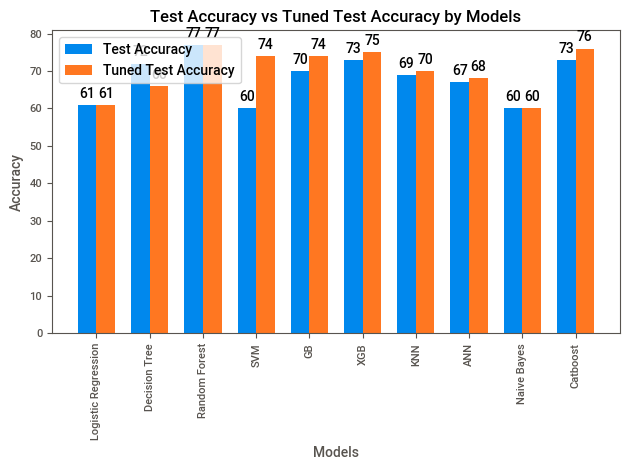

In [170]:
# comparison of models with their test accuracy

# Data
Models = ['Logistic Regression', 'Decision Tree', 'Random Forest', 'SVM', 'GB', 'XGB', 'KNN', 'ANN', 'Naive Bayes', 'Catboost']
Test_Accuracy = [61, 72, 77, 60, 70, 73, 69, 67, 60, 73]
Tuned_Test_Accuracy = [61, 66, 77, 74, 74, 75, 70, 68, 60, 76]

# Plotting
x = range(len(Models))  # X locations for the groups
width = 0.35  # Width of the bars

fig, ax = plt.subplots()
bars1 = ax.bar(x, Test_Accuracy, width, label='Test Accuracy')
bars2 = ax.bar([i + width for i in x], Tuned_Test_Accuracy, width, label='Tuned Test Accuracy')

# Adding labels and title
ax.set_xlabel('Models')
ax.set_ylabel('Accuracy')
ax.set_title('Test Accuracy vs Tuned Test Accuracy by Models')
ax.set_xticks([i + width / 2 for i in x])
ax.set_xticklabels(Models, rotation=90)
ax.legend()

# Adding text labels
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.annotate('{}'.format(height),
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

# Show plot
plt.tight_layout()
plt.show()

##### INSIGHTS
- Random Forest model shows high accuracy of 77%
- so we are taking Random forest model for the prediction

##  Predicting  the Lead Category (High Potential , Low Potential) using Random Forest

In [173]:
df.columns

Index(['Product_ID', 'Source', 'Sales_Agent', 'Location', 'Delivery_Mode',
       'Status', 'Created_day', 'Created_month', 'Created_hour',
       'Created_minute'],
      dtype='object')

In [177]:
i = []
object_attributes = ['Product_ID', 'Source', 'Sales_Agent', 'Location', 'Delivery_Mode',
                     'Created_day', 'Created_month', 'Created_hour', 'Created_minute']

In [178]:
for x in object_attributes:
    value = input(f"Enter value for {x}: ")
    i.append(float(value))  # Convert input to float if necessary


if len(i) == 0:
    raise ValueError("No input values collected.")

# Reshape input array
i_reshaped = np.array(i).reshape(1, -1)

#prediction
prediction = rfh.predict(i_reshaped)
if (prediction==1):
    print("The lead is High Potential")
else:
    print("The lead is Low Potebtial")

Enter value for Product_ID: 18
Enter value for Source: 2
Enter value for Sales_Agent: 10
Enter value for Location: 0
Enter value for Delivery_Mode: 0
Enter value for Created_day: 14
Enter value for Created_month: 11
Enter value for Created_hour: 7
Enter value for Created_minute: 34
The lead is High Potential


##### Model accurately predicted the lead.

# Conclusion

The dataset contained 7421 Rows and 9 Columns. All of the data's are in object datatype.From the exploratory analysis of the data it is seen that Product 18 is mostly seen but it doesn't show a great potential while Product 19 is least in number but it shows high potential leads and product 15 has the highest value in low potential which mean it faces challenges.While checking the Source Live chat,Call,Website shows high potential aswell as low potential leads also . But customer referalls and Existing customer shows bit better outcomes.Comparing other states in India Bangalore and Chennai are better and outiside India Malaysia and Singapore shows better leads.
For model creation we had used 10 models from that Random Forest shows the highest accuracy of 77%.

# Suggestion
- Concentrate on those product which gives great impact.
- Check the challenges faced by the most frequent product.
- Take the feedback from the users and utilize it for future purchases.
- Expand the accessibility of the product by increasing the locations.
- Find the challenges faced by the Sales Agents who are having less leads.
- Expand the Delivert mode services.
- Make the enviroment of the company healthy. 

# Risks
- High computational time.
- Low scores in Most models.
- Most of the models are overfitting after tuning
- General models have low accuracy
- Unbalanced data.

                                                 THANK YOU